## Load dataset and tree info

In [1]:
from sklearn.datasets import load_iris
import pandas as pd
from sklearn.preprocessing import StandardScaler
import numpy as np
from keras.layers import Dense, Input, concatenate, GRU, LSTM
from keras import backend as K
from keras.utils import to_categorical
from keras import Model
from nltk.translate.bleu_score import sentence_bleu
# from sklearn.metrics import jaccard_score

Using TensorFlow backend.


In [2]:
names = ['age', 'workclass', 'fnlwgt', 'education', 'education-num',
         'marital-status', 'occupation', 'relationship', 'race', 'sex', 'capital-gain', 'capital-loss', 
         'hours-per-week', 'native-country', 'target']

data = pd.read_csv('../../data/raw/adult.data.csv', delimiter=",", header=None, names=names)

In [3]:
data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [4]:
data = data[data["workclass"] != " ?"]
data = data[data["occupation"] != " ?"]
data = data[data["native-country"] != " ?"]

# Convert categorical fields #
categorical_col = ['workclass', 'education', 'marital-status', 'occupation',
                   'relationship', 'race', 'sex', 'native-country', 'target']

# categorical_col = ['target']
    
# for col in categorical_col:
#     categories = unique_of(data.col)
#     num_cat = count(categories)
#     for cat in categories:
#         data.col[cat] = index_of(cat in categories)

for col in categorical_col:
    b, c = np.unique(data[col], return_inverse=True)
    data[col] = c

feature_list = names[:14]
# Test train split #
X = data.loc[:, feature_list]
Y = data[['target']]

# Split the dataset into test and train datasets

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.60, random_state=0)

In [5]:
df = pd.DataFrame(X)
df = df.reset_index().drop(columns='index')

In [6]:
bin_labels = pd.read_csv('../../scripts/dert/test_adult_bin_labels_1000.csv', delimiter=",",
                         header=0, names=['label', 'bins'])

In [7]:
bin_labels.head()

,label,bins
0,A,(2)
1,AB,(3)
2,ABC,104918
3,ABD,3925
4,ABE,6632


In [8]:
bin_labels.shape

(865, 2)

In [9]:
Y = Y.reset_index().drop(columns='index')

In [10]:
path_df = pd.read_csv('../../scripts/dert/test_adult_paths_1000.csv', delimiter=",",
                      header=0, names=['index', 'paths'])
path_df = path_df.drop(columns='index')
path_df = path_df.iloc[:1000,]

In [11]:
path_df.shape

(1000, 1)

In [14]:
test_data = pd.concat([df.iloc[:1000,], Y.iloc[:1000,],path_df.iloc[:1000,]], axis=1)
# test_data = df

In [15]:
test_data.shape

(1000, 16)

In [16]:
test_data.head(1)

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target,paths
0,39,5,77516,9,13,4,0,1,4,1,2174,0,40,38,0,"8A0,11B0,14C0,13D0,7A0,12E0,3F1,9G0,2H0"


### Transform path df

In [16]:
new_path = []
for i, val in test_data.iterrows():
    new_path.append(val['paths'].split(sep=","))

In [17]:
test_data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target,paths
0,39,5,77516,9,13,4,0,1,4,1,2174,0,40,38,0,"8A0,11B0,14C0,13D0,7A0,12E0,3F1,9G0,2H0"
1,50,4,83311,9,13,2,3,0,4,1,0,0,13,38,0,"11I0,13J0,12K0,14C0,13L0,8M0"
2,38,2,215646,11,9,0,5,1,4,1,0,0,40,38,0,"8A0,11N0,12O0,4P0,4P0,7Q0,1R0"
3,53,2,234721,1,7,2,5,0,2,1,0,0,40,38,0,"7Q0,11S0,13T0,4A0,1U0,13V0,2G0"
4,28,2,338409,9,13,2,9,5,2,0,0,0,40,4,0,"8W0,11N0,12X0,13Y0,4Z0,6AB0,1AC0,3AD0"


In [18]:
_ = [x.insert(0, 'S') for x in new_path]
_ = [x.append('E') for x in new_path]

In [19]:
len(new_path)

1000

In [20]:
test_data['new_path'] = new_path

In [21]:
test_data = test_data.drop(["paths"], axis=1)

In [22]:
test_data.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,target,new_path
0,39,5,77516,9,13,4,0,1,4,1,2174,0,40,38,0,"[S, 8A0, 11B0, 14C0, 13D0, 7A0, 12E0, 3F1, 9G0..."
1,50,4,83311,9,13,2,3,0,4,1,0,0,13,38,0,"[S, 11I0, 13J0, 12K0, 14C0, 13L0, 8M0, E]"
2,38,2,215646,11,9,0,5,1,4,1,0,0,40,38,0,"[S, 8A0, 11N0, 12O0, 4P0, 4P0, 7Q0, 1R0, E]"
3,53,2,234721,1,7,2,5,0,2,1,0,0,40,38,0,"[S, 7Q0, 11S0, 13T0, 4A0, 1U0, 13V0, 2G0, E]"
4,28,2,338409,9,13,2,9,5,2,0,0,0,40,4,0,"[S, 8W0, 11N0, 12X0, 13Y0, 4Z0, 6AB0, 1AC0, 3A..."


In [23]:
paths_lengths = np.array([len(xi)
                          for xi in test_data.iloc[:,-1]])

In [24]:
paths_lengths
np.max(paths_lengths)

17

In [35]:
label_char = []
for _, i in enumerate(np.unique(test_data['new_path'])):
    for _, j in enumerate(i):
        if j not in label_char:
            label_char.append(j)

In [36]:
label_indices = { j : i for i, j in enumerate(label_char) }

In [37]:
label_indices

{'S': 0,
 '3AK0': 1,
 'E': 2,
 '3AK1': 3,
 '3H0': 4,
 '4AC0': 5,
 '3I0': 6,
 '1T1': 7,
 '4AV0': 8,
 '4B0': 9,
 '3T0': 10,
 '3AU0': 11,
 '3AU1': 12,
 '3BD0': 13,
 '3BD1': 14,
 '1BG1': 15,
 '3U0': 16,
 '3BJ1': 17,
 '4AI1': 18,
 '4AV1': 19,
 '3CM1': 20,
 '3I1': 21,
 '3D0': 22,
 '3D1': 23,
 '1U1': 24,
 '4N0': 25,
 '2AJ1': 26,
 '4AI0': 27,
 '3BG0': 28,
 '3AY0': 29,
 '1AX1': 30,
 '3H1': 31,
 '3T1': 32,
 '3U1': 33,
 '4AQ1': 34,
 '4N1': 35,
 '4B1': 36,
 '3O1': 37,
 '2AD1': 38,
 '3O0': 39,
 '3BJ0': 40,
 '3CD0': 41,
 '4BS0': 42,
 '2AW0': 43,
 '4AC1': 44,
 '1AF1': 45,
 '2F0': 46,
 '3BQ0': 47,
 '3J0': 48}

In [ ]:
### Move to bottom trials

test_data = pd.concat([test_data, path_df.loc[:,'updated_path']], axis=1)
updated_path = []
for i, val in test_data.iterrows():
    updated_path.append(val['updated_path'].split(sep=","))

_ = [x.insert(0, 'S') for x in updated_path]
_ = [x.append('E') for x in updated_path]

test_data['updated_path'] = updated_path

# test_data = test_data.drop(["updated_path"], axis=1)

paths_lengths = np.array([len(xi) for xi in test_data.iloc[:,-1]])

label_char = []
for _, i in enumerate(np.unique(test_data['updated_path'])):
    for _, j in enumerate(i):
        if j not in label_char:
            label_char.append(j)

label_indices = { j : i for i, j in enumerate(label_char) }
indices_label = { i : j for i, j in enumerate(label_char) }

input_path_sequence = []
next_chars = []
features = []
paths_maxlen = np.max(paths_lengths)
# path_vocab_size = len(bin_labels) # How is this working? Validate!
path_vocab_size = len(indices_label) # Temporary test for local trees
feature_size = 4
for i in range(0, len(test_data)):
    # get the feature
    curr_feat = np.array([test_data.iloc[i, 0:4]])
    curr_path = test_data.iloc[i, -1]
    curr_path_len = len(curr_path)
    # curr_label = y[i]
    # curr_dec_feat = df.iloc[i, 6]
    for j in range(1, curr_path_len):
        features.append(curr_feat)
        input_path_sequence.append(curr_path[0:j])
        next_chars.append(curr_path[j])

## Vectorize inputs        

x_path = np.zeros(
    (len(input_path_sequence), paths_maxlen, path_vocab_size), dtype=np.bool)

path_latent_input = np.zeros(
    (len(input_path_sequence), feature_size), dtype=np.float)

y_path = np.zeros(
    (len(input_path_sequence), path_vocab_size), dtype=np.bool)

# print(input_path_sequence)
# print(len(input_path_sequence))
for i, sentence in enumerate(input_path_sequence):
    for t, char in enumerate(sentence):
        # x_path[i, t, self.char_indices[char]] = 1
        # print(bin_labels.index[bin_labels['label'] == char[1]])
        # index = bin_labels.index[bin_labels['label'] == char[1]].tolist()[0]
        x_path[i, t, label_indices[char]] = 1
    # y_path[i, char_indices[next_chars[i]]] = 1
    # index = bin_labels.index[bin_labels['label'] == next_chars[i][1]].tolist()[0]
    # y_path[i, index] = 1
    y_path[i, label_indices[next_chars[i]]] = 1
    path_latent_input[i, :] = features[i]

In [220]:
test_data = test_data.drop(["updated_path"], axis=1)

In [23]:
len(label_indices)

117

In [43]:
indices_label = { i : j for i, j in enumerate(label_char) }
indices_label

{0: 'S',
 1: '3AK0',
 2: 'E',
 3: '3AK1',
 4: '3H0',
 5: '4AC0',
 6: '3I0',
 7: '1T1',
 8: '4AV0',
 9: '4B0',
 10: '3T0',
 11: '3AU0',
 12: '3AU1',
 13: '3BD0',
 14: '3BD1',
 15: '1BG1',
 16: '3U0',
 17: '3BJ1',
 18: '4AI1',
 19: '4AV1',
 20: '3CM1',
 21: '3I1',
 22: '3D0',
 23: '3D1',
 24: '1U1',
 25: '4N0',
 26: '2AJ1',
 27: '4AI0',
 28: '3BG0',
 29: '3AY0',
 30: '1AX1',
 31: '3H1',
 32: '3T1',
 33: '3U1',
 34: '4AQ1',
 35: '4N1',
 36: '4B1',
 37: '3O1',
 38: '2AD1',
 39: '3O0',
 40: '3BJ0',
 41: '3CD0',
 42: '4BS0',
 43: '2AW0',
 44: '4AC1',
 45: '1AF1',
 46: '2F0',
 47: '3BQ0',
 48: '3J0'}

In [40]:
bin_labels

,label,x,freq
0,AQ,1.45,1
1,AI,1.55,9
2,AC,1.60,3
3,N,1.65,22
4,AV,1.70,15
5,B,1.75,31
6,BS,1.80,1
7,AJ,2.25,2
8,BD,2.35,10
9,O,2.45,38


In [41]:
path_df

,new_col,updated_path
0,3D0,
1,3O0,
2,3O0,
3,3AK0,
4,3AK0,
5,3AU0,
6,3D0,
7,3AK0,
8,3O0,
9,3D0,


### Bins and paths analysis

In [13]:
path_df.head(5)

,paths
0,"8A0,11B0,14C0,13D0,7A0,12E0,3F1,9G0,2H0"
1,"11I0,13J0,12K0,14C0,13L0,8M0"
2,"8A0,11N0,12O0,4P0,4P0,7Q0,1R0"
3,"7Q0,11S0,13T0,4A0,1U0,13V0,2G0"
4,"8W0,11N0,12X0,13Y0,4Z0,6AB0,1AC0,3AD0"


In [14]:
bin_labels.head(5)

,label,bins
0,A,(2)
1,AB,(3)
2,ABC,104918
3,ABD,3925
4,ABE,6632


In [ ]:
## Frequency of bins



### Vectorize path sequences

In [44]:
input_path_sequence = []
next_chars = []
features = []
paths_maxlen = np.max(paths_lengths)
# path_vocab_size = len(bin_labels) # How is this working? Validate!
path_vocab_size = len(indices_label) # Temporary test for local trees
feature_size = 4
for i in range(0, len(test_data)):
    # get the feature
    curr_feat = np.array([test_data.iloc[i, 0:4]])
    curr_path = test_data.iloc[i, -1]
    curr_path_len = len(curr_path)
    # curr_label = y[i]
    # curr_dec_feat = df.iloc[i, 6]
    for j in range(1, curr_path_len):
        features.append(curr_feat)
        input_path_sequence.append(curr_path[0:j])
        next_chars.append(curr_path[j])

x_path = np.zeros(
    (len(input_path_sequence), paths_maxlen, path_vocab_size), dtype=np.bool)

path_latent_input = np.zeros(
    (len(input_path_sequence), feature_size), dtype=np.float)

y_path = np.zeros(
    (len(input_path_sequence), path_vocab_size), dtype=np.bool)

# print(input_path_sequence)
# print(len(input_path_sequence))
for i, sentence in enumerate(input_path_sequence):
    for t, char in enumerate(sentence):
        # x_path[i, t, self.char_indices[char]] = 1
        # print(bin_labels.index[bin_labels['label'] == char[1]])
        # index = bin_labels.index[bin_labels['label'] == char[1]].tolist()[0]
        x_path[i, t, label_indices[char]] = 1
    # y_path[i, char_indices[next_chars[i]]] = 1
    # index = bin_labels.index[bin_labels['label'] == next_chars[i][1]].tolist()[0]
    # y_path[i, index] = 1
    y_path[i, label_indices[next_chars[i]]] = 1
    path_latent_input[i, :] = features[i]
    
## Trouble with "S" and "E" index values.

In [45]:
len(input_path_sequence)

441

In [46]:
len(next_chars)

441

In [47]:
y_path.shape

(441, 49)

### Create and train label and rnn models

In [248]:
np.unique(Y)

array([0, 1])

In [249]:
def _create_label_model(latent_dim=5):
    input_layer = Input(shape=(feature_size,), name='ip_x')
    hidden_layer_x1 = Dense(20, activation='tanh',
                            name='hidden_x1')(input_layer)
    hidden_layer_x2 = Dense(20, activation='tanh',
                            name='hidden_x2')(hidden_layer_x1)
    hidden_layer_x3 = Dense(latent_dim, activation='tanh',
                            name='hidden_x3')(hidden_layer_x2)
    output_layer = Dense(len(np.unique(Y)), activation='softmax',
                         name='op_x')(hidden_layer_x3)
    model = Model(input_layer, output_layer)
    return model

def _create_combined_model(initialize=True, rnn_cell='gru', latent_dim=100):

    label_model_latent = Input(shape=(latent_dim,), name='label_ip')
    path_input = Input(shape=(
        paths_maxlen, path_vocab_size), name='dec_feat_ip')
    if rnn_cell == 'gru':
        RNN = GRU
    else:
        RNN = LSTM

    decoder = RNN(latent_dim, return_state=False,
                  return_sequences=False, name='gru_seq')
    if initialize:
        decoder_outputs = decoder(
            path_input, initial_state=label_model_latent)
    else:
        decoder_outputs = decoder(path_input)

    merge_layer = concatenate(
        [label_model_latent, decoder_outputs], name='cat')
    output_chars = Dense(path_vocab_size,
                         activation='softmax', name='op_sent')(merge_layer)
    model = Model(
        [label_model_latent, path_input], output_chars)
    return model

In [250]:
# combined_model = _create_combined_model()
label_model = _create_label_model()

In [72]:
plot_model(combined_model, to_file='model.png')

In [70]:
def get_hidden_x(x, model, layer_num=3):
    def get_hidden_x_inner(model, layer_num=layer_num):
        return K.function([model.layers[0].input], [model.layers[layer_num].output])
    return get_hidden_x_inner(model, layer_num=layer_num)([x])[0]

In [51]:
def fit_model():

    y_cat = to_categorical(y)

    label_model.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    label_model.fit(
        X, y_cat, batch_size=30, epochs=150, verbose=0, shuffle=True, validation_split=0.2)

    x_latent = get_hidden_x(path_latent_input, model=label_model)

    combined_model.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    combined_model.fit([x_latent, x_path], y_path,
                           batch_size=30, epochs=1000, verbose=1, shuffle=True)

In [52]:
fit_model()

Instructions for updating:
Use tf.cast instead.
Epoch 1/1000
441/441 [==============================] - 1s 1ms/step - loss: 3.9304 - acc: 0.0454
Epoch 2/1000
441/441 [==============================] - 0s 163us/step - loss: 3.8762 - acc: 0.0680
Epoch 3/1000
441/441 [==============================] - 0s 176us/step - loss: 3.8224 - acc: 0.0680
Epoch 4/1000
441/441 [==============================] - 0s 160us/step - loss: 3.7662 - acc: 0.0726
Epoch 5/1000
441/441 [==============================] - 0s 182us/step - loss: 3.7043 - acc: 0.0726
Epoch 6/1000
441/441 [==============================] - 0s 171us/step - loss: 3.6321 - acc: 0.0726
Epoch 7/1000
441/441 [==============================] - 0s 167us/step - loss: 3.5425 - acc: 0.0839
Epoch 8/1000
441/441 [==============================] - 0s 178us/step - loss: 3.4328 - acc: 0.1043
Epoch 9/1000
441/441 [==============================] - 0s 163us/step - loss: 3.3085 - acc: 0.1270
Epoch 10/1000
441/441 [==============================] - 0s 140

441/441 [==============================] - 0s 167us/step - loss: 1.8851 - acc: 0.4172
Epoch 162/1000
441/441 [==============================] - 0s 165us/step - loss: 1.8796 - acc: 0.4172
Epoch 163/1000
441/441 [==============================] - 0s 145us/step - loss: 1.8815 - acc: 0.4195
Epoch 164/1000
441/441 [==============================] - 0s 158us/step - loss: 1.8801 - acc: 0.4218
Epoch 165/1000
441/441 [==============================] - 0s 171us/step - loss: 1.8743 - acc: 0.4195
Epoch 166/1000
441/441 [==============================] - 0s 165us/step - loss: 1.8731 - acc: 0.4218
Epoch 167/1000
441/441 [==============================] - 0s 176us/step - loss: 1.8702 - acc: 0.4195
Epoch 168/1000
441/441 [==============================] - 0s 146us/step - loss: 1.8698 - acc: 0.4172
Epoch 169/1000
441/441 [==============================] - 0s 152us/step - loss: 1.8683 - acc: 0.4195
Epoch 170/1000
441/441 [==============================] - 0s 162us/step - loss: 1.8648 - acc: 0.4172
Epoch

441/441 [==============================] - 0s 165us/step - loss: 1.7257 - acc: 0.4512
Epoch 324/1000
441/441 [==============================] - 0s 161us/step - loss: 1.7227 - acc: 0.4535
Epoch 325/1000
441/441 [==============================] - 0s 158us/step - loss: 1.7251 - acc: 0.4467
Epoch 326/1000
441/441 [==============================] - 0s 143us/step - loss: 1.7260 - acc: 0.4512
Epoch 327/1000
441/441 [==============================] - 0s 155us/step - loss: 1.7229 - acc: 0.4467
Epoch 328/1000
441/441 [==============================] - 0s 145us/step - loss: 1.7221 - acc: 0.4467
Epoch 329/1000
441/441 [==============================] - 0s 157us/step - loss: 1.7265 - acc: 0.4444
Epoch 330/1000
441/441 [==============================] - 0s 163us/step - loss: 1.7226 - acc: 0.4512
Epoch 331/1000
441/441 [==============================] - 0s 172us/step - loss: 1.7201 - acc: 0.4444
Epoch 332/1000
441/441 [==============================] - 0s 146us/step - loss: 1.7198 - acc: 0.4467
Epoch

441/441 [==============================] - 0s 156us/step - loss: 1.5485 - acc: 0.5011
Epoch 486/1000
441/441 [==============================] - 0s 166us/step - loss: 1.5463 - acc: 0.4875
Epoch 487/1000
441/441 [==============================] - 0s 152us/step - loss: 1.5471 - acc: 0.5011
Epoch 488/1000
441/441 [==============================] - 0s 171us/step - loss: 1.5466 - acc: 0.4898
Epoch 489/1000
441/441 [==============================] - 0s 168us/step - loss: 1.5409 - acc: 0.4943
Epoch 490/1000
441/441 [==============================] - 0s 151us/step - loss: 1.5411 - acc: 0.4921
Epoch 491/1000
441/441 [==============================] - 0s 148us/step - loss: 1.5445 - acc: 0.4830
Epoch 492/1000
441/441 [==============================] - 0s 154us/step - loss: 1.5373 - acc: 0.4943
Epoch 493/1000
441/441 [==============================] - 0s 172us/step - loss: 1.5392 - acc: 0.5011
Epoch 494/1000
441/441 [==============================] - 0s 165us/step - loss: 1.5357 - acc: 0.4943
Epoch

441/441 [==============================] - 0s 187us/step - loss: 1.4656 - acc: 0.5057
Epoch 648/1000
441/441 [==============================] - 0s 183us/step - loss: 1.4671 - acc: 0.5011
Epoch 649/1000
441/441 [==============================] - 0s 148us/step - loss: 1.4639 - acc: 0.5034
Epoch 650/1000
441/441 [==============================] - 0s 150us/step - loss: 1.4632 - acc: 0.5079
Epoch 651/1000
441/441 [==============================] - 0s 153us/step - loss: 1.4643 - acc: 0.5057
Epoch 652/1000
441/441 [==============================] - 0s 141us/step - loss: 1.4671 - acc: 0.5011
Epoch 653/1000
441/441 [==============================] - 0s 144us/step - loss: 1.4670 - acc: 0.5102
Epoch 654/1000
441/441 [==============================] - 0s 149us/step - loss: 1.4719 - acc: 0.5079
Epoch 655/1000
441/441 [==============================] - 0s 152us/step - loss: 1.4717 - acc: 0.5011
Epoch 656/1000
441/441 [==============================] - 0s 153us/step - loss: 1.4682 - acc: 0.5011
Epoch

441/441 [==============================] - 0s 151us/step - loss: 1.4183 - acc: 0.5034
Epoch 810/1000
441/441 [==============================] - 0s 153us/step - loss: 1.4170 - acc: 0.5034
Epoch 811/1000
441/441 [==============================] - 0s 156us/step - loss: 1.4183 - acc: 0.5057
Epoch 812/1000
441/441 [==============================] - 0s 156us/step - loss: 1.4180 - acc: 0.5057
Epoch 813/1000
441/441 [==============================] - 0s 160us/step - loss: 1.4150 - acc: 0.5034
Epoch 814/1000
441/441 [==============================] - 0s 138us/step - loss: 1.4194 - acc: 0.5079
Epoch 815/1000
441/441 [==============================] - 0s 163us/step - loss: 1.4176 - acc: 0.5011
Epoch 816/1000
441/441 [==============================] - 0s 152us/step - loss: 1.4245 - acc: 0.5170
Epoch 817/1000
441/441 [==============================] - 0s 152us/step - loss: 1.4195 - acc: 0.5102
Epoch 818/1000
441/441 [==============================] - 0s 151us/step - loss: 1.4130 - acc: 0.5034
Epoch

441/441 [==============================] - 0s 147us/step - loss: 1.3822 - acc: 0.5125
Epoch 972/1000
441/441 [==============================] - 0s 158us/step - loss: 1.3849 - acc: 0.5079
Epoch 973/1000
441/441 [==============================] - 0s 151us/step - loss: 1.3958 - acc: 0.5170
Epoch 974/1000
441/441 [==============================] - 0s 153us/step - loss: 1.3951 - acc: 0.5034
Epoch 975/1000
441/441 [==============================] - 0s 173us/step - loss: 1.3867 - acc: 0.5147
Epoch 976/1000
441/441 [==============================] - 0s 146us/step - loss: 1.3831 - acc: 0.5079
Epoch 977/1000
441/441 [==============================] - 0s 139us/step - loss: 1.3783 - acc: 0.5034
Epoch 978/1000
441/441 [==============================] - 0s 165us/step - loss: 1.3805 - acc: 0.5057
Epoch 979/1000
441/441 [==============================] - 0s 144us/step - loss: 1.3848 - acc: 0.5102
Epoch 980/1000
441/441 [==============================] - 0s 157us/step - loss: 1.3861 - acc: 0.5125
Epoch

In [53]:
combined_model.summary() ## After increasing sample size and adding weights

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
label_ip (InputLayer)           (None, 5)            0                                            
__________________________________________________________________________________________________
dec_feat_ip (InputLayer)        (None, 7, 49)        0                                            
__________________________________________________________________________________________________
gru_seq (GRU)                   (None, 5)            825         dec_feat_ip[0][0]                
                                                                 label_ip[0][0]                   
__________________________________________________________________________________________________
cat (Concatenate)               (None, 10)           0           label_ip[0][0]                   
          

In [40]:
combined_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
label_ip (InputLayer)           (None, 5)            0                                            
__________________________________________________________________________________________________
dec_feat_ip (InputLayer)        (None, 5, 117)       0                                            
__________________________________________________________________________________________________
gru_seq (GRU)                   (None, 5)            1845        dec_feat_ip[0][0]                
                                                                 label_ip[0][0]                   
__________________________________________________________________________________________________
cat (Concatenate)               (None, 10)           0           label_ip[0][0]                   
          

In [ ]:
def predict(x):
    latent_dim = 5
    x_f = x.reshape(1, feature_size)
    token = 'S'
    cont = True
    path = [token]
    x_path = np.zeros((1, paths_maxlen, path_vocab_size), dtype=np.bool)

    x_latent = get_hidden_x(x_f, model=label_model)
    x_latent = x_latent.reshape(1, latent_dim)
    x_path[0, 0, label_indices[token]] = 1
    pred = label_model.predict(x_f)
    label = [np.argmax(pred[0])]
    index = 1
    while cont & (index < paths_maxlen):
        pred = combined_model.predict([x_latent, x_path])
        char_index = np.argmax(pred[0])
        x_path[0, index, char_index] = 1
        next_char = indices_label[char_index]
        path.append(next_char)
        index += 1
        if next_char == 'E':
            cont = False
        # elif index == self.paths_maxlen - 1:
        #     path.append('E')

    if path[-1] != 'E':
        path.append('E')

    return [path, label]

### Path invariance method

In [42]:
def check_path(path): # Returns -1 if path traversed is wrong/non-existant
    # path = ''.join(path)
    path = path[1:-1]
    pred_features = []
    path_as_strings = []
    for i in range(len(path)):
        pred_features.append(int(path[i][:-1]))
        path_as_strings.append(path[i][-1])
        # if i%2 == 0:
        #     print('i -- ', i)
        #     print('path -- ', path)
        #     print('path[i] -- ', path[i])
        #     pred_features.append(int(path[i]))
        # else:
        #     path_as_strings.append(path[i])

    n_nodes = self.clf.tree_.node_count
    children_left = self.clf.tree_.children_left
    children_right = self.clf.tree_.children_right
    feature = self.clf.tree_.feature

    is_leaves = np.zeros(shape=n_nodes, dtype=bool)
    stack = [(0, -1)]
    while len(stack) > 0:
        node_id, parent_depth = stack.pop()
        # node_depth[node_id] = parent_depth + 1

        if (children_left[node_id] != children_right[node_id]):
            stack.append((children_left[node_id], parent_depth + 1))
            stack.append((children_right[node_id], parent_depth + 1))
        else:
            is_leaves[node_id] = True


    node = 0
    pred_target = -1
    subset_path = False
    for i in range(len(path_as_strings)):
        if path_as_strings[i] == 'L':
            if feature[node]+1 == pred_features[i]:
                node = children_left[node]
            # else:
                # pred_target = -1 # Remove for "subset" checks
                # break
        elif path_as_strings[i] == 'R':
            if feature[node]+1 == pred_features[i]:
                node = children_right[node]
            # else:
                # pred_target = -1 # Remove for "subset" checks
                # break
        if is_leaves[node]:
            for i, x in enumerate(self.clf.tree_.value[node][0]):
                if x > 0:
                    pred_target = i
            if i < len(path_as_strings):
                subset_path = True

    return pred_target, subset_path

In [43]:
path_df

,new_col
0,1G0
1,3J0
2,1U0
3,1AC0
4,1N0
5,1AO0
6,2Y1
7,1G0
8,3AK0
9,1V0


### Test model configuration

In [44]:
def score():
    count = []
    bleu_score = []
    j_coeff = []
    l_dist = []
    path_mismatch_count = []
    traverse_check_count = []
    order_mismatch_count = []
    subset_path_count = []
    for i in range(test_data.shape[0]):
        curr_feat = np.array([test_data.iloc[i, 0:X.shape[1]]])
        path, label = predict(curr_feat)
        actual_path = test_data.iloc[i, -1]

        actual_path_tok = [label_indices[char] for char in actual_path]
        pred_path_tok = [label_indices[char] for char in path]

        # j_coeff.append(super().get_j_coeff(actual_path_tok, pred_path_tok))

        print('actual vs predicted: ', test_data.iloc[i, -1], ' vs ', ' '.join(
            path), 'labels: ', y[i], label[0])
        count.append(y[i] == label[0])
        # print('Actual path -- ', actual_path)
        # print('Pred path -- ', path)
#         if actual_path != path:
#             print(' -- Path mismatch -- ')
#             if sorted(actual_path) == sorted(path):
#                 print(' -- Order mismatch -- ')
#                 order_mismatch_count.append(1)
#             else:
#                 path_mismatch_count.append(1)
#                 pred_target, subset_path = self.check_path(path)
#                 subset_path_count.append(subset_path)
#                 if pred_target != -1 and pred_target == self.df.iloc[i, self.X.shape[1]+1]:
#                     traverse_check_count.append(1)


        path = list(''.join(path))
        actual_path = list(''.join(test_data.iloc[i, -1]))
        bleu_score.append(sentence_bleu([actual_path], path))

#         lev_path = []
#         for i in range(len(path)):
#             if i in ['S','L','R','E']:
#                 lev_path.append(i)
#         l_dist.append(distance.levenshtein(
#             self.df.iloc[i, self.X.shape[1]].replace(' ', ''), ''.join(lev_path)))


    print('\nLabel accuracy - ', np.mean(count))
#     print('Path metric (Jaccard) - ', np.mean(j_coeff))
#     print('Path metric (Levenshtein) - ', np.mean(l_dist))
#     print('Path mismatch count - ', np.sum(path_mismatch_count))
#     print('Right traverse count - ', np.sum(traverse_check_count))
#     print('Order mismatch count - ', np.sum(order_mismatch_count))
#     print('Subset path count - ', np.sum(subset_path_count))
    print('Bleu score of paths - ', np.mean(bleu_score))

In [45]:
score()

actual vs predicted:  ['S', '1G0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3J0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '1U0', 'E']  vs  S 3F0 1G0 E labels:  0 0


/home/shakkeel/anaconda3/envs/test_imly/lib/python3.6/site-packages/nltk/translate/bleu_score.py:523: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/home/shakkeel/anaconda3/envs/test_imly/lib/python3.6/site-packages/nltk/translate/bleu_score.py:523: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


actual vs predicted:  ['S', '1AC0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '1N0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '1AO0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '2Y1', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '1G0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3AK0', 'E']  vs  S 3F0 1G0 E labels:  0 0


/home/shakkeel/anaconda3/envs/test_imly/lib/python3.6/site-packages/nltk/translate/bleu_score.py:523: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


actual vs predicted:  ['S', '1V0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3R0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3J0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3R0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3BJ0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3Y0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3X0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '1V0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3F0', '1BM0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '1BU0', '3BR0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3F0', '1G0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '1O0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '3BJ0', 'E']  vs  S 3F0 1G0 E labels:  0 0
actual vs predicted:  ['S', '1V0', '1AH0', 'E']  vs  S 3F0 1G0 E

actual vs predicted:  ['S', '1BU1', 'E']  vs  S 1AO1 1AV1 E labels:  2 2
actual vs predicted:  ['S', '1AO1', '1DG0', '2J0', 'E']  vs  S 1AO1 3U1 E labels:  2 2
actual vs predicted:  ['S', '3U1', 'E']  vs  S 1AO1 1AV1 E labels:  2 2
actual vs predicted:  ['S', '3Y1', '3U1', 'E']  vs  S 1AO1 1AV1 E labels:  2 2
actual vs predicted:  ['S', '2L0', '1DM1', 'E']  vs  S 1AO1 1AV1 E labels:  2 2
actual vs predicted:  ['S', '1AO1', '1P1', 'E']  vs  S 1AO1 3U1 E labels:  2 2
actual vs predicted:  ['S', '3CX1', 'E']  vs  S 1AO1 1AV1 E labels:  2 2
actual vs predicted:  ['S', '3F1', 'E']  vs  S 1AO1 3U1 E labels:  2 2
actual vs predicted:  ['S', '2AT0', '4AQ1', '1AD0', 'E']  vs  S 1AO1 1AC1 E labels:  2 2
actual vs predicted:  ['S', '2Y1', '1BF1', 'E']  vs  S 3T1 E labels:  2 1
actual vs predicted:  ['S', '2AM0', '1DS1', 'E']  vs  S 1AO1 1AV1 E labels:  2 2
actual vs predicted:  ['S', '4AF1', 'E']  vs  S 1O1 3CX0 E labels:  2 1
actual vs predicted:  ['S', '4AF1', 'E']  vs  S 1AO1 1AV1 E labels:  2

## Path invariance trials using rpart -- generic

In [133]:
## Import nnum, vnum, nodes, csplit, split_df,
## frame

splits = pd.read_csv('../../data/raw/splits.csv', delimiter=",", index_col=0)
csplit = pd.read_csv('../../data/raw/csplit.csv', delimiter=",")
frame = pd.read_csv('../../data/raw/frame.csv', delimiter=",",index_col=0)

# frame = frame.drop(["Unnamed: 0"], axis=1)
frame = frame.rename(columns={"var": "variable"})
# bin_labels = bin_labels.rename(columns={"Unnamed: 0": "label", "label_list": "bins"})

In [134]:
frame

,variable,n,wt,dev,yval,complexity,ncompete,nsurrogate,yval2.,yval2..1,yval2..2,yval2..3,yval2..4,yval2..5,yval2..6,yval2.nodeprob
1,Petal.Length,150,150,100,1,0.500,3,3,1.0,50.0,50.0,50.0,0.333333,0.333333,0.333333,1.000000
2,<leaf>,50,50,0,1,0.000,0,0,1.0,50.0,0.0,0.0,1.000000,0.000000,0.000000,0.333333
3,Petal.Width,100,100,50,2,0.440,3,3,2.0,0.0,50.0,50.0,0.000000,0.500000,0.500000,0.666667
6,Petal.Length,54,54,5,2,0.020,3,0,2.0,0.0,49.0,5.0,0.000000,0.907407,0.092593,0.360000
12,Petal.Width,48,48,1,2,0.010,3,0,2.0,0.0,47.0,1.0,0.000000,0.979167,0.020833,0.320000
24,<leaf>,47,47,0,2,0.000,0,0,2.0,0.0,47.0,0.0,0.000000,1.000000,0.000000,0.313333
25,<leaf>,1,1,0,3,0.000,0,0,3.0,0.0,0.0,1.0,0.000000,0.000000,1.000000,0.006667
13,Petal.Width,6,6,2,3,0.010,3,2,3.0,0.0,2.0,4.0,0.000000,0.333333,0.666667,0.040000
26,Sepal.Length,3,3,1,2,0.010,3,0,2.0,0.0,2.0,1.0,0.000000,0.666667,0.333333,0.020000
52,<leaf>,2,2,0,2,0.000,0,0,2.0,0.0,2.0,0.0,0.000000,1.000000,0.000000,0.013333


In [135]:
## Generate nnum, vnum, nodes(split_df and csplit - 2L if necessary)

temp_frame = frame

nc = temp_frame[["ncompete", "nsurrogate"]]

index = np.cumsum((frame[["variable"]]!="<leaf>").values + nc[["ncompete"]].values + nc[["nsurrogate"]].values)

index_df = pd.DataFrame((np.insert(index,0,0)+1)[:-1], columns=["i"], index=frame.index)

temp_frame = pd.concat([temp_frame, index_df], axis=1)

# temp_frame[temp_frame[["var"]]=="<leaf>"]
# temp_frame.where(temp_frame[["var"]]=="<leaf>")
# temp_frame.loc[temp_frame[["variable"]]=="<leaf>", "index"] = 0
temp_frame.i[temp_frame.variable == "<leaf>"] = 0

/home/shakkeel/anaconda3/envs/test_imly/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [136]:
temp_frame

,variable,n,wt,dev,yval,complexity,ncompete,nsurrogate,yval2.,yval2..1,yval2..2,yval2..3,yval2..4,yval2..5,yval2..6,yval2.nodeprob,i
1,Petal.Length,150,150,100,1,0.500,3,3,1.0,50.0,50.0,50.0,0.333333,0.333333,0.333333,1.000000,1
2,<leaf>,50,50,0,1,0.000,0,0,1.0,50.0,0.0,0.0,1.000000,0.000000,0.000000,0.333333,0
3,Petal.Width,100,100,50,2,0.440,3,3,2.0,0.0,50.0,50.0,0.000000,0.500000,0.500000,0.666667,8
6,Petal.Length,54,54,5,2,0.020,3,0,2.0,0.0,49.0,5.0,0.000000,0.907407,0.092593,0.360000,15
12,Petal.Width,48,48,1,2,0.010,3,0,2.0,0.0,47.0,1.0,0.000000,0.979167,0.020833,0.320000,19
24,<leaf>,47,47,0,2,0.000,0,0,2.0,0.0,47.0,0.0,0.000000,1.000000,0.000000,0.313333,0
25,<leaf>,1,1,0,3,0.000,0,0,3.0,0.0,0.0,1.0,0.000000,0.000000,1.000000,0.006667,0
13,Petal.Width,6,6,2,3,0.010,3,2,3.0,0.0,2.0,4.0,0.000000,0.333333,0.666667,0.040000,23
26,Sepal.Length,3,3,1,2,0.010,3,0,2.0,0.0,2.0,1.0,0.000000,0.666667,0.333333,0.020000,29
52,<leaf>,2,2,0,2,0.000,0,0,2.0,0.0,2.0,0.0,0.000000,1.000000,0.000000,0.013333,0


In [137]:
nodes = temp_frame[["n", "ncompete", "nsurrogate", "i"]]

In [138]:
nodes

,n,ncompete,nsurrogate,i
1,150,3,3,1
2,50,0,0,0
3,100,3,3,8
6,54,3,0,15
12,48,3,0,19
24,47,0,0,0
25,1,0,0,0
13,6,3,2,23
26,3,3,0,29
52,2,0,0,0


In [94]:
def load_tree_details(index): # Returns nnum, nodes, vnum, splits, temp_frame
    splits_dir = '../../data/raw/local_dt_df/splits'+'_'+str(index)+'.csv'
    frame_dir = '../../data/raw/local_dt_df/frame'+'_'+str(index)+'.csv'
    splits = pd.read_csv(splits_dir, delimiter=",", index_col=0)
    frame = pd.read_csv(frame_dir, delimiter=",",index_col=0)
    
    frame = frame.rename(columns={"var": "variable"})
    
    temp_frame = frame

    nc = temp_frame[["ncompete", "nsurrogate"]]

    index = np.cumsum((frame[["variable"]]!="<leaf>").values + nc[["ncompete"]].values + nc[["nsurrogate"]].values)

    index_df = pd.DataFrame((np.insert(index,0,0)+1)[:-1], columns=["i"], index=frame.index)

    temp_frame = pd.concat([temp_frame, index_df], axis=1)

    temp_frame.i[temp_frame.variable == "<leaf>"] = 0
    
    nodes = temp_frame[["n", "ncompete", "nsurrogate", "i"]]
    
    nnum = list(temp_frame.index)

    feature_names = ["Sepal.Length", "Sepal.Width", "Petal.Length", "Petal.Width"]

    vnum = list(map(feature_names.index, splits.index))
    
    return nnum, nodes, vnum, splits, temp_frame 

In [139]:
nnum = list(temp_frame.index) # row names of temp_frame

In [140]:
nnum

[1, 2, 3, 6, 12, 24, 25, 13, 26, 52, 53, 27, 7, 14, 28, 29, 15]

In [141]:
feature_names = ["Sepal.Length", "Sepal.Width", "Petal.Length", "Petal.Width"]

vnum = list(map(feature_names.index, splits.index))

In [64]:
nodes

,n,ncompete,nsurrogate,i
1,150,3,3,1
2,50,0,0,0
3,100,3,3,8
6,54,3,0,15
12,48,3,0,19
24,47,0,0,0
25,1,0,0,0
13,6,3,2,23
26,3,3,0,29
52,2,0,0,0


In [153]:
sample_path = ['S', '3A0', '4C1', '2AD1', 'E']

In [159]:
len(vnum)

38

In [160]:
len(nnum)

17

In [158]:
int(sample_path[1:-1][1][0])

4

In [92]:
def return_yval(path, index): # [1,0,0,0]
    nnum, nodes, vnum, splits, temp_frame = load_tree_details(index)
    path = path[1:-1]
    node = 0
    nspl = 1
    i = 0
    while nspl != 0:
        npos = nnum[node] # i)0, 
        nspl = nodes.iloc[npos-1][3] # i)1
        var = vnum[nspl]
        # ncat
        temp = splits.iloc[nspl][3]
        if nspl > 0:
            print("nspl succeeded")
            if  int(path[i][0]) != var:
                print("Wrong feature -- ", path[i][0], var)
                return False
                break
            elif int(path[i][-1]) == 0: # i)1
                direction = -1
                i+=1
            else:
                direction = 1
                i+=1

            if direction == -1:
                print(node)
                if node == 0:
                    node = 1
                node = 2 * node
            else:
                print(node)
                if node == 0:
                    node = 1
                node = 2 * node + 1
            if len(path) == 1:
                nspl = 0
        else:
            print('nspl failed')
            print("leaf node -- ", node)
            yval = temp_frame.iloc[node][4]
    return temp_frame.iloc[node][4]

In [144]:
nodes.iloc[0]

n             150
ncompete        3
nsurrogate      3
i               1
Name: 1, dtype: int64

In [166]:

path = [1,1,0,1]
a = [1,0,0,0]
b = [1,1,1]
c = [0]
d = [1,1,1,1,1,1,0]
e = [1,0,1,0,0]
return_yval(e)

nspl succeeded
0
nspl failed
leaf node --  3


2

In [161]:
return_yval(sample_path)

nspl succeeded
0
nspl failed
leaf node --  3


2

In [146]:
temp_frame

,variable,n,wt,dev,yval,complexity,ncompete,nsurrogate,yval2.,yval2..1,yval2..2,yval2..3,yval2..4,yval2..5,yval2..6,yval2.nodeprob,i
1,Petal.Length,150,150,100,1,0.500,3,3,1.0,50.0,50.0,50.0,0.333333,0.333333,0.333333,1.000000,1
2,<leaf>,50,50,0,1,0.000,0,0,1.0,50.0,0.0,0.0,1.000000,0.000000,0.000000,0.333333,0
3,Petal.Width,100,100,50,2,0.440,3,3,2.0,0.0,50.0,50.0,0.000000,0.500000,0.500000,0.666667,8
6,Petal.Length,54,54,5,2,0.020,3,0,2.0,0.0,49.0,5.0,0.000000,0.907407,0.092593,0.360000,15
12,Petal.Width,48,48,1,2,0.010,3,0,2.0,0.0,47.0,1.0,0.000000,0.979167,0.020833,0.320000,19
24,<leaf>,47,47,0,2,0.000,0,0,2.0,0.0,47.0,0.0,0.000000,1.000000,0.000000,0.313333,0
25,<leaf>,1,1,0,3,0.000,0,0,3.0,0.0,0.0,1.0,0.000000,0.000000,1.000000,0.006667,0
13,Petal.Width,6,6,2,3,0.010,3,2,3.0,0.0,2.0,4.0,0.000000,0.333333,0.666667,0.040000,23
26,Sepal.Length,3,3,1,2,0.010,3,0,2.0,0.0,2.0,1.0,0.000000,0.666667,0.333333,0.020000,29
52,<leaf>,2,2,0,2,0.000,0,0,2.0,0.0,2.0,0.0,0.000000,1.000000,0.000000,0.013333,0


In [147]:
splits

,count,ncat,improve,index,adj
Petal.Length,150,-1,50.000000,2.45,0.000000
Petal.Width,150,-1,50.000000,0.80,0.000000
Sepal.Length,150,-1,34.164050,5.45,0.000000
Sepal.Width,150,1,19.038508,3.35,0.000000
Petal.Width,0,-1,1.000000,0.80,1.000000
Sepal.Length,0,-1,0.920000,5.45,0.760000
Sepal.Width,0,1,0.833333,3.35,0.500000
Petal.Width,100,-1,38.969404,1.75,0.000000
Petal.Length,100,-1,37.353535,4.75,0.000000
Sepal.Length,100,-1,10.686869,6.15,0.000000


In [148]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

#### Bin reduction trials

In [32]:
def get_bin_mappings(flow_matrix_dim, emd_index):
    # mapping_list = []
    mapping_dict = {}
    for i in range(flow_matrix_dim):
        for j in range(flow_matrix_dim):
            if emd_trials[emd_index]['flow_matrix'][i][j] != 0.0:
                # mapping_list.append([emd_trials[emd_index]['flow_matrix'][i][j], (i,j)])
                deep_set(mapping_dict, [i, j], emd_trials[emd_index]['flow_matrix'][i][j])
                
    return mapping_dict

In [12]:
import pyemd
import random
from sklearn.preprocessing import normalize
from scipy.spatial import distance as scipy_distance
from copy import copy
import numpy as np

# actual_bins = sorted([2.4, 5.4, 1.6, 9.7, 8.9])
actual_bins = sorted([17.8, 2.4, 5.4, 1.6, 9.7, 8.9, 11.3, 0.5, 3.3, 15.3])
# actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
# actual_freq = normalize([actual_freq])
# actual_freq = actual_freq.tolist()[0]

# 1) Choosing reduced bins by random sampling
# 2) How to choose frequency of new bins?
#   - Uniform values
#   - Kernels
# 3) Obj func to retrieve reduced bins
# ext_bins = random.sample(actual_bins, 3)
# ext_bins

In [120]:
## Pyemd approach -- continuous var
dist_list = []
emd_trials = {}
for index in range(1000):
    ext_bins = sorted(np.random.uniform(actual_bins[0],actual_bins[-1], 3))
    ext_freq = []
    # actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
    actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0, 10.0, 3.0, 4.0, 1.0, 5.0]
    actual_freq_norm = normalize([actual_freq], norm='l1').reshape(10,)
    for i, x in enumerate(ext_bins):
        new_freq = []
        for j, b in enumerate(actual_bins):
            c = 1/(np.sqrt(2*np.pi))
            # dist = -(((x-b)**2)/2)
            dist = -((np.power((x-b),2))/2)
            d = np.exp(dist)
            w = c * d
            new_freq.append(w * actual_freq[j])
        ext_freq.append(sum(new_freq))

    combined_bins = copy(actual_bins)
    for _, val in enumerate(ext_bins):
        combined_bins.append(val)

    dist_matrix = np.zeros((13,13), dtype='float64')
    ## Distance
    for i, val in enumerate(combined_bins):
        for j, val_2 in enumerate(combined_bins):
            dist_matrix[i,j] = scipy_distance.euclidean(combined_bins[i], combined_bins[j])
    
    ext_freq_norm = normalize([ext_freq], norm='l1').reshape(3,)
    
    for i in range(len(actual_freq)):
        # ext_freq.insert(0, 0.0)
        ext_freq_norm = np.insert(ext_freq_norm, 0, 0.0)

    for i in range(len(ext_bins)):
        # actual_freq.append(0.0)
        actual_freq_norm = np.append(actual_freq_norm, 0.0)

    # ext_freq = np.array(ext_freq)    
    # actual_freq = np.array(actual_freq)
    
    emd_val, min_cost_flow = pyemd.emd_with_flow(actual_freq_norm, ext_freq_norm, dist_matrix)
    dist_list.append(emd_val)
    emd_trials.update({index:{'distance':emd_val, 'flow_matrix':min_cost_flow,
                             'actual_bins':actual_bins, 'actual_freq_norm':actual_freq_norm,
                             'ext_bins':ext_bins, 'ext_freq_norm':ext_freq_norm,
                             'dist_matrix': dist_matrix}})

In [121]:
actual_freq

[10.0, 3.0, 4.0, 1.0, 5.0, 10.0, 3.0, 4.0, 1.0, 5.0]

In [122]:
ext_freq

[1.3162660158574675, 0.5209963676861593, 2.009792259447329]

In [123]:
actual_freq_norm

array([0.2173913 , 0.06521739, 0.08695652, 0.02173913, 0.10869565,
       0.2173913 , 0.06521739, 0.08695652, 0.02173913, 0.10869565,
       0.        , 0.        , 0.        ])

In [124]:
ext_freq_norm

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.34214903, 0.13542734, 0.52242363])

In [125]:
min(dist_list)

1.2111874752214022

In [126]:
dist_list.index(min(dist_list))

425

In [128]:
emd_trials[425]['actual_bins']

[0.5, 1.6, 2.4, 3.3, 5.4, 8.9, 9.7, 11.3, 15.3, 17.8]

In [129]:
emd_trials[425]['ext_bins']

[0.9385060907250806, 9.345561451682828, 17.111083893285034]

In [131]:
for i in range(13):
    for j in range(13):
        if emd_trials[425]['flow_matrix'][i][j] != 0.0:
            print(emd_trials[425]['flow_matrix'][i][j], (i,j))

0.217391 (0, 10)
0.065217 (1, 10)
0.086957 (2, 10)
0.021739 (3, 10)
0.046495 (4, 10)
0.062201 (4, 11)
0.217391 (5, 11)
0.065217 (6, 11)
0.077296 (7, 11)
0.009661 (7, 12)
0.021739 (8, 12)
0.108696 (9, 12)


In [99]:
emd_trials[6017] ## w/ 10,000 trials

{'distance': 0.23798528644410086,
 'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.434783, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.124277, 0.006158, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.173913, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.005357, 0.038121],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.217391],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
 'actual_bins': [1.6, 2.4, 5.4, 8.9, 9.7],
 'actual_freq_norm': array([0.43478261, 0.13043478, 0.17391304, 0.04347826, 0.2173913 ,
        0.        , 0.        , 0.        ]),
 'ext_bins': [1.6064817771506419, 5.393405228969593, 9.322409378281648],
 'ext_freq_norm': array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.55905953, 0.18542895, 0.25551153]),
 'dist_matrix': array([[0.00000000e+00, 8.00000000e-01, 3.80000000e+00, 7.30000000e+00,
         8.10000000e+00, 6.48177715e-03, 3.79340523e+00, 7.72240938e+00],
        [8.00000000e

In [75]:
emd_trials[562] ## w/ 1000 trials

{'distance': 0.2447755192305009,
 'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.434783, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.124085, 0.00635, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.173062, 0.000851],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.043478],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.217391],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
 'ext_bin': [1.669313785130966, 5.607383172387225, 9.530849925961318],
 'ext_freq': [4.897789781010717, 1.5723296165685663, 2.2936506762020716],
 'dist_matrix': array([[0.        , 0.8       , 3.8       , 7.3       , 8.1       ,
         0.06931379, 4.00738317, 7.93084993],
        [0.8       , 0.        , 3.        , 6.5       , 7.3       ,
         0.73068621, 3.20738317, 7.13084993],
        [3.8       , 3.        , 0.        , 3.5       , 4.3       ,
         3.73068621, 0.20738317, 4.13084993],
        [7.3       , 6.5       , 3.5       , 0.        , 0.8

In [101]:
emd_trials[6017]['flow_matrix']

[[0.0, 0.0, 0.0, 0.0, 0.0, 0.434783, 0.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.124277, 0.006158, 0.0],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.173913, 0.0],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.005357, 0.038121],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.217391],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]]

In [105]:
emd_trials[6017]['flow_matrix'][1][1] != 0.0

False

In [106]:
for i in range(8):
    for j in range(8):
        if emd_trials[6017]['flow_matrix'][i][j] != 0.0:
            print(emd_trials[6017]['flow_matrix'][i][j], (i,j))

0.434783 (0, 5)
0.124277 (1, 5)
0.006158 (1, 6)
0.173913 (2, 6)
0.005357 (3, 6)
0.038121 (3, 7)
0.217391 (4, 7)


In [108]:
emd_trials[6017]['actual_bins']

[1.6, 2.4, 5.4, 8.9, 9.7]

In [109]:
emd_trials[6017]['ext_bins']

[1.6064817771506419, 5.393405228969593, 9.322409378281648]

In [100]:
emd_trials

{0: {'distance': 2.1380404013343006,
  'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.2628, 0.171983, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.130435, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.173913, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.043478, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.036143, 0.181247],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
  'actual_bins': [1.6, 2.4, 5.4, 8.9, 9.7],
  'actual_freq_norm': array([0.43478261, 0.13043478, 0.17391304, 0.04347826, 0.2173913 ,
         0.        , 0.        , 0.        ]),
  'ext_bins': [3.78925805791465, 4.685435402871269, 7.702180208333779],
  'ext_freq_norm': array([0.        , 0.        , 0.        , 0.        , 0.        ,
         0.39323538, 0.4255172 , 0.18124742]),
  'dist_matrix': array([[0.        , 0.8       , 3.8       , 7.3       , 8.1       ,
          2.18925806, 3.0854354 , 6.10218021],
         [0.8       , 0.        , 3. 

In [296]:
new_freq

[1.790667856900023,
 1.0738105227465606,
 0.06432139515484088,
 4.944241101512384e-09,
 1.4374118916223221e-10]

In [297]:
actual_bins

[1.6,
 2.4,
 5.4,
 8.9,
 9.7,
 2.196769471499167,
 5.8795597151350485,
 5.98261741551536]

In [341]:
emd_trials[dist_list.index(max(dist_list))]

{'distance': 175.8061351642649,
 'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.533209, 0.518282, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5491940000000001],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
 'ext_bin': [7.070223146830314, 7.115452473868924, 7.639984088218773],
 'ext_freq': array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.53320189, 0.5182754 , 0.54920463])}

In [342]:
emd_trials

{0: {'distance': 142.38472402642964,
  'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 1.613818, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.999994, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.640918, 2.296642],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
  'ext_bin': [5.362690351859676, 8.726272460942639, 9.61607149427512],
  'ext_freq': array([0.        , 0.        , 0.        , 0.        , 0.        ,
         1.61380982, 1.64091516, 2.29663962])},
 1: {'distance': 97.43179473427186,
  'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 4.899253, 4.913283, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.410406],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.

---

#### Trial 2 

In [11]:
def jaccard_score_inconsistent(x, y):
    intersection_cardinality = len(set.intersection(*[set(x), set(y)]))
    union_cardinality = len(set.union(*[set(x), set(y)]))
    return intersection_cardinality/float(union_cardinality)

def get_j_coeff(a, b):
    if len(a) != len(b):
        return jaccard_score_inconsistent(a, b)
    return jaccard_score(a, b, average='micro')

In [181]:
actual_bins = [['a'], ['b','c'], ['a','c'], ['b'], ['c']]
np.random.choice(actual_bins, 3, replace=False).tolist()

[['b'], ['b', 'c'], ['c']]

In [258]:
## Pyemd approach -- categorical var
'''
Max levels = 3; (a,b,c)
actual_bins = [(a), (b,c), (a,c), (b), (c)]
actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
possible_out = [(a), (b), (c), (a,b), (a,c), (b,c)]
'''

actual_bins = [['a'], ['b','c'], ['a','c'], ['a','b'], ['c']]
possible_out = [['a'], ['b','c'], ['a','c'], ['a','b'], ['b'], ['c']]


dist_list = []
emd_trials = {}
for index in range(1000):
    ext_bins = np.random.choice(actual_bins, 3, replace=False).tolist()
    ext_freq = []
    # actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
    actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
    actual_freq_norm = normalize([actual_freq], norm='l1').reshape(5,)
    for i, x in enumerate(ext_bins):
        new_freq = []
        for j, b in enumerate(actual_bins):
            c = 1/(np.sqrt(2*np.pi))
            # dist = 1 - get_j_coeff(b, x) # Change distance metric
            dist = distance.levenshtein(b,x)
            dist = -((np.power(dist,2))/2)
            d = np.exp(dist)
            w = c * d
            new_freq.append(w * actual_freq[j])
        ext_freq.append(sum(new_freq))

    combined_bins = copy(actual_bins)
    for _, val in enumerate(ext_bins):
        combined_bins.append(val)

    dist_matrix = np.zeros((8,8), dtype='float64')
    ## Distance
    for i, val in enumerate(combined_bins):
        for j, val_2 in enumerate(combined_bins):
            # dist_matrix[i,j] = distance.euclidean(combined_bins[i], combined_bins[j])
            # dist_matrix[i,j] = get_j_coeff(combined_bins[i], combined_bins[j])
            dist_matrix[i,j] = distance.levenshtein(combined_bins[i], combined_bins[j])
    
    ext_freq_norm = normalize([ext_freq], norm='l1').reshape(3,)
    
    for i in range(len(actual_freq)):
        # ext_freq.insert(0, 0.0)
        ext_freq_norm = np.insert(ext_freq_norm, 0, 0.0)

    for i in range(len(ext_bins)):
        # actual_freq.append(0.0)
        actual_freq_norm = np.append(actual_freq_norm, 0.0)

    # ext_freq = np.array(ext_freq)    
    # actual_freq = np.array(actual_freq)
    
    emd_val, min_cost_flow = pyemd.emd_with_flow(actual_freq_norm, ext_freq_norm, dist_matrix)
    dist_list.append(emd_val)
    emd_trials.update({index:{'distance':emd_val, 'flow_matrix':min_cost_flow,
                             'actual_bins':actual_bins, 'actual_freq_norm':actual_freq_norm,
                             'ext_bins':ext_bins, 'ext_freq_norm':ext_freq_norm,
                             'dist_matrix': dist_matrix}})

In [235]:
??distance.levenshtein

In [193]:
len(ext_bins)

3

In [184]:
emd_trials

{0: {'distance': 0.21014473188400012,
  'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.144815, 0.0, 0.289968],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.130435, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.173913, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.043478],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.026073, 0.191318, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
   [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
  'actual_bins': [['a'], ['b', 'c'], ['a', 'c'], ['b'], ['c']],
  'actual_freq_norm': array([0.43478261, 0.13043478, 0.17391304, 0.04347826, 0.2173913 ,
         0.        , 0.        , 0.        ]),
  'ext_bins': [['b', 'c'], ['a', 'c'], ['c']],
  'ext_freq_norm': array([0.        , 0.        , 0.        , 0.        , 0.        ,
         0.34480139, 0.3217531 , 0.33344551]),
  'dist_matrix': array([[1.        , 0.        , 0.5       , 0.        , 0.        ,
          0.        , 0.5       , 0.        , 0.        , 0.        ],
         [0.   

In [259]:
dist_list.index(min(dist_list))

4

In [260]:
dist_list.index(max(dist_list))

30

In [261]:
min(dist_list)

0.26150600000000024

In [262]:
max(dist_list)

0.6521730000000008

In [263]:
emd_trials[4]

{'distance': 0.26150600000000024,
 'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.34719, 0.087593],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.108195, 0.0, 0.02224],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.173913],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.043478],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.217391, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
 'actual_bins': [['a'], ['b', 'c'], ['a', 'c'], ['a', 'b'], ['c']],
 'actual_freq_norm': array([0.43478261, 0.13043478, 0.17391304, 0.04347826, 0.2173913 ,
        0.        , 0.        , 0.        ]),
 'ext_bins': [['c'], ['a'], ['a', 'c']],
 'ext_freq_norm': array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.32558571, 0.34719023, 0.32722406]),
 'dist_matrix': array([[0., 2., 1., 1., 1., 1., 0., 1.],
        [2., 0., 1., 2., 1., 1., 2., 1.],
        [1., 1., 0., 1., 1., 1., 1., 0.],
        [1., 2., 1., 0., 2., 2., 1., 1.],
        

In [255]:
emd_trials[2]

{'distance': 0.6521740000000003,
 'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.222942, 0.211841, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.130435],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.173913, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.043478, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.073148, 0.144243],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
 'actual_bins': [['a'], ['b', 'c'], ['a', 'c'], ['b'], ['c']],
 'actual_freq_norm': array([0.43478261, 0.13043478, 0.17391304, 0.04347826, 0.2173913 ,
        0.        , 0.        , 0.        ]),
 'ext_bins': [['a', 'c'], ['b'], ['b', 'c']],
 'ext_freq_norm': array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.39685507, 0.32846688, 0.27467806]),
 'dist_matrix': array([[0., 2., 1., 1., 1., 1., 1., 2.],
        [2., 0., 1., 1., 1., 1., 1., 0.],
        [1., 1., 0., 2., 1., 0., 2., 1.],
        [1., 1., 2., 0., 1., 2., 0., 1.],
       

In [264]:
for i in range(8):
    for j in range(8):
        if emd_trials[4]['flow_matrix'][i][j] != 0.0:
            print(emd_trials[4]['flow_matrix'][i][j], (i,j))

0.34719 (0, 6)
0.087593 (0, 7)
0.108195 (1, 5)
0.02224 (1, 7)
0.173913 (2, 7)
0.043478 (3, 7)
0.217391 (4, 5)


In [265]:
print(emd_trials[4]['actual_bins'],'\n',
     emd_trials[4]['ext_bins'])

[['a'], ['b', 'c'], ['a', 'c'], ['a', 'b'], ['c']] 
 [['c'], ['a'], ['a', 'c']]


In [245]:
print(emd_trials[17]['actual_bins'],'\n',
     emd_trials[17]['ext_bins'])

[['a'], ['b', 'c'], ['a', 'c'], ['b'], ['c']] 
 [['b'], ['a'], ['c']]


In [246]:
for i in range(8):
    for j in range(8):
        if emd_trials[17]['flow_matrix'][i][j] != 0.0:
            print(emd_trials[17]['flow_matrix'][i][j], (i,j))

0.103891 (0, 5)
0.330892 (0, 7)
0.130435 (1, 6)
0.173913 (2, 5)
0.019446 (3, 6)
0.024032 (3, 7)
0.217391 (4, 6)


In [207]:
emd_trials[1]

{'distance': 1.1102230246251565e-16,
 'flow_matrix': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.338448, 0.096335],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.130434, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.173913],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.043478, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.127237, 0.0, 0.090154],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]],
 'actual_bins': [['a'], ['b', 'c'], ['a', 'c'], ['b'], ['c']],
 'actual_freq_norm': array([0.43478261, 0.13043478, 0.17391304, 0.04347826, 0.2173913 ,
        0.        , 0.        , 0.        ]),
 'ext_bins': [['a'], ['b', 'c'], ['b']],
 'ext_freq_norm': array([0.        , 0.        , 0.        , 0.        , 0.        ,
        0.30114945, 0.33844827, 0.36040228]),
 'dist_matrix': array([[1.        , 0.        , 0.5       , 0.        , 0.        ,
         1.        , 0.        , 0.        ],
        [0.        , 1.        , 0.33333333, 0.5       , 0.5 

---

##### Path and bin conversions for dag_arch model

In [25]:
bin_labels.head(5)

,label,bins
0,A,(2)
1,AB,(3)
2,ABC,104918
3,ABD,3925
4,ABE,6632


In [26]:
path_df.head()

,paths
0,"8A0,11B0,14C0,13D0,7A0,12E0,3F1,9G0,2H0"
1,"11I0,13J0,12K0,14C0,13L0,8M0"
2,"8A0,11N0,12O0,4P0,4P0,7Q0,1R0"
3,"7Q0,11S0,13T0,4A0,1U0,13V0,2G0"
4,"8W0,11N0,12X0,13Y0,4Z0,6AB0,1AC0,3AD0"


In [27]:
bin_labels.head()

,label,bins
0,A,(2)
1,AB,(3)
2,ABC,104918
3,ABD,3925
4,ABE,6632


In [222]:
test_var = path_df['paths'][1].split(',')[1]
temp = re.compile("(\d+)(\w+)(\d+)") 
res = temp.match(test_var).groups()
res[1]

'I'

In [223]:
test_var

'13I0'

In [16]:
import re
bin_freq = {}
bin_labels['freq'] = 0
for i, val in path_df.iterrows():
    label_list = val['paths'].split(',')
    for j, val2 in enumerate(label_list):
        temp = re.compile("(\d+)(\w+)(\d+)") 
        res = temp.match(val2).groups()
        bin_labels.loc[bin_labels['label'] == res[1], 'freq'] += 1

In [20]:
bin_labels['bins'][5]

'86'

In [18]:
bin_labels.sort_values(by=['bins'])

,label,bins,freq
760,M,(1),242
864,Z,(10),132
281,AR,(11),113
799,P,(12),316
116,AG,(13),160
602,DQ,(14),43
437,BH,(15),64
248,AO,(16),197
322,AXZ,(17),1
0,A,(2),344


([array([1., 0., 0., 0., 0.]),
  array([1., 0., 0., 0., 0.]),
  array([0., 1., 0., 0., 0.]),
  array([0., 1., 0., 0., 0.]),
  array([0., 0., 1., 0., 0.]),
  array([0., 0., 1., 0., 0.]),
  array([0., 0., 0., 1., 0.]),
  array([0., 0., 0., 1., 0.]),
  array([0., 0., 0., 0., 1.]),
  array([0., 0., 0., 0., 1.])],
 array([0. , 1.8, 3.6, 5.4, 7.2, 9. ]),
 <a list of 10 Lists of Patches objects>)

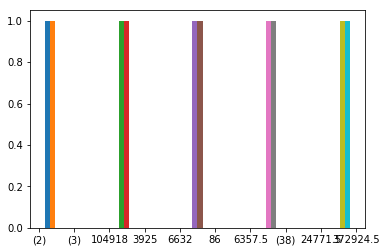

In [29]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.hist(bin_labels['bins'][:10], bins=5)

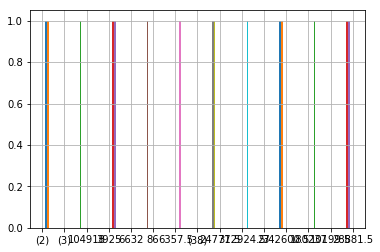

In [30]:
bin_labels[''][:15].hist()

In [38]:
plt.figure(figsize=(200,100))
plt.bar(bin_labels['label'], bin_labels['freq'])

<BarContainer object of 865 artists>

In [23]:
bin_labels.loc[bin_labels['freq']!=0,].shape

(865, 3)

In [111]:
bin_labels = bin_labels.sort_values(by=['x']).reset_index(drop=True)

KeyError: 'x'

In [112]:
bin_labels = bin_labels.loc[bin_labels['freq'] != 0].reset_index(drop=True) ## Try fixing at R level.

In [24]:
bin_labels

,label,bins,freq
0,A,(2),344
1,AB,(3),141
2,ABC,104918,1
3,ABD,3925,3
4,ABE,6632,10
5,ABF,86,1
6,ABG,6357.5,2
7,ABH,(38),1
8,ABI,24771.5,1
9,ABJ,372924.5,1


In [18]:
actual_bins = bin_labels['bins'].tolist()

In [19]:
len(actual_bins)

865

In [34]:
float(actual_bins[4])

6632.0

In [35]:
bin_labels['freq'][1]

141

In [25]:
cat_bins = []
cat_bin_freq = []
cont_bins = []
cont_bin_freq = []
for i, val in enumerate(actual_bins):
    if val[0] == '(':
        cat_bins.append(i)
        cat_bin_freq.append(bin_labels['freq'][i])
    else:
        cont_bins.append(float(val))
        cont_bin_freq.append(bin_labels['freq'][i])

In [26]:
len(cat_bin_freq)

31

In [27]:
len(cat_bins)

31

In [66]:
import distance
distance.levenshtein(cat_bins[3], cat_bins[2])

2

In [64]:
cat_bins[:10]

['(2)', '(3)', '(38)', '(26)', '(13)', '(24)', '(9)', '(16)', '(20)', '(11)']

In [ ]:
## Pyemd approach -- categorical var
'''
Max levels = 3; (a,b,c)
actual_bins = [(a), (b,c), (a,c), (b), (c)]
actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
possible_out = [(a), (b), (c), (a,b), (a,c), (b,c)]
'''

actual_bins = [['a'], ['b','c'], ['a','c'], ['a','b'], ['c']]
possible_out = [['a'], ['b','c'], ['a','c'], ['a','b'], ['b'], ['c']]


dist_list = []
emd_trials = {}
for index in range(1000):
    ext_bins = np.random.choice(actual_bins, 3, replace=False).tolist()
    ext_freq = []
    # actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
    actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
    actual_freq_norm = normalize([actual_freq], norm='l1').reshape(5,)
    for i, x in enumerate(ext_bins):
        new_freq = []
        for j, b in enumerate(actual_bins):
            c = 1/(np.sqrt(2*np.pi))
            # dist = 1 - get_j_coeff(b, x) # Change distance metric
            dist = distance.levenshtein(b,x)
            dist = -((np.power(dist,2))/2)
            d = np.exp(dist)
            w = c * d
            new_freq.append(w * actual_freq[j])
        ext_freq.append(sum(new_freq))

    combined_bins = copy(actual_bins)
    for _, val in enumerate(ext_bins):
        combined_bins.append(val)

    dist_matrix = np.zeros((8,8), dtype='float64')
    ## Distance
    for i, val in enumerate(combined_bins):
        for j, val_2 in enumerate(combined_bins):
            # dist_matrix[i,j] = distance.euclidean(combined_bins[i], combined_bins[j])
            # dist_matrix[i,j] = get_j_coeff(combined_bins[i], combined_bins[j])
            dist_matrix[i,j] = distance.levenshtein(combined_bins[i], combined_bins[j])
    
    ext_freq_norm = normalize([ext_freq], norm='l1').reshape(3,)
    
    for i in range(len(actual_freq)):
        # ext_freq.insert(0, 0.0)
        ext_freq_norm = np.insert(ext_freq_norm, 0, 0.0)

    for i in range(len(ext_bins)):
        # actual_freq.append(0.0)
        actual_freq_norm = np.append(actual_freq_norm, 0.0)

    # ext_freq = np.array(ext_freq)    
    # actual_freq = np.array(actual_freq)
    
    emd_val, min_cost_flow = pyemd.emd_with_flow(actual_freq_norm, ext_freq_norm, dist_matrix)
    dist_list.append(emd_val)
    emd_trials.update({index:{'distance':emd_val, 'flow_matrix':min_cost_flow,
                             'actual_bins':actual_bins, 'actual_freq_norm':actual_freq_norm,
                             'ext_bins':ext_bins, 'ext_freq_norm':ext_freq_norm,
                             'dist_matrix': dist_matrix}})

In [39]:
cont_bins = sorted(cont_bins)

In [40]:
len(cont_bins)

834

In [53]:
import pyemd
import random
from sklearn.preprocessing import normalize
from scipy.spatial import distance as scipy_distance
from copy import copy
import numpy as np

dist_list = []
emd_trials = {}
for index in range(100):
    print(index)
    ext_bins = sorted(np.random.uniform(cont_bins[0],cont_bins[-1], 400))
    ext_freq = []
    # actual_freq = [10.0, 3.0, 4.0, 1.0, 5.0]
    # actual_freq = bin_labels['freq'].tolist() ## Use cont_bin_freq
    # actual_freq_norm = normalize([actual_freq], norm='l1').reshape(29,)
    actual_freq_norm = normalize([cont_bin_freq], norm='l1').reshape(834,)
    for i, x in enumerate(ext_bins):
        new_freq = []
        for j, b in enumerate(cont_bins):
            c = 1/(np.sqrt(2*np.pi))
            # dist = -(((x-b)**2)/2)
            dist = -((np.power((x-b),2))/2)
            d = np.exp(dist)
            w = c * d
            new_freq.append(w * cont_bin_freq[j])
        ext_freq.append(sum(new_freq))

    combined_bins = copy(cont_bins)
    for _, val in enumerate(ext_bins): # Concat!!!
        combined_bins.append(val)

    # dist_matrix = np.zeros((112,112), dtype='float64')
    dist_matrix = np.zeros((1234,1234), dtype='float64')
    ## Distance
    for i, val in enumerate(combined_bins):
        for j, val_2 in enumerate(combined_bins):
            dist_matrix[i,j] = scipy_distance.euclidean(combined_bins[i], combined_bins[j])
    
    ext_freq_norm = normalize([ext_freq], norm='l1').reshape(400,)
    
    # for i in range(len(actual_freq)):
    for i in range(len(cont_bin_freq)):
        ext_freq_norm = np.insert(ext_freq_norm, 0, 0.0)

    for i in range(len(ext_bins)):
        actual_freq_norm = np.append(actual_freq_norm, 0.0)

    # ext_freq = np.array(ext_freq)    
    # actual_freq = np.array(actual_freq)
    
    emd_val, min_cost_flow = pyemd.emd_with_flow(actual_freq_norm, ext_freq_norm, dist_matrix)
    dist_list.append(emd_val)
    emd_trials.update({index:{'distance':emd_val, 'flow_matrix':min_cost_flow,
                             'actual_bins':actual_bins, 'actual_freq_norm':actual_freq_norm,
                             'ext_bins':ext_bins, 'ext_freq_norm':ext_freq_norm,
                             'dist_matrix': dist_matrix}})

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [64]:
len(combined_bins)

1234

In [54]:
dist_list.index(min(dist_list))

34

In [55]:
min(dist_list)

45840.304763490705

In [56]:
reduced_bins = emd_trials[34]['ext_bins']

In [57]:
len(reduced_bins)

400

In [58]:
np.array(emd_trials[34]['flow_matrix']).shape

(1234, 1234)

In [59]:
def get_bin_mappings(flow_matrix_dim, emd_index):
    # mapping_list = []
    mapping_dict = {}
    for i in range(flow_matrix_dim):
        for j in range(flow_matrix_dim):
            if emd_trials[emd_index]['flow_matrix'][i][j] != 0.0:
                # mapping_list.append([emd_trials[emd_index]['flow_matrix'][i][j], (i,j)])
                deep_set(mapping_dict, [i, j], emd_trials[emd_index]['flow_matrix'][i][j])
                
    return mapping_dict

In [60]:
from dict_deep import deep_set
bin_mappings = get_bin_mappings(1234, 34)

In [61]:
bin_mappings

{0: {850: 0.000367},
 1: {850: 0.001101},
 2: {850: 0.00367},
 3: {850: 0.000367},
 4: {850: 0.000734},
 5: {850: 0.000367},
 6: {853: 0.000367},
 7: {850: 0.000735, 851: 0.000366},
 8: {850: 0.000367},
 9: {850: 0.000367},
 10: {850: 0.001468},
 11: {850: 0.000367},
 12: {850: 0.001468},
 13: {850: 0.000367},
 14: {850: 0.000367},
 15: {853: 0.000367},
 16: {850: 0.000367},
 17: {850: 0.001101},
 18: {850: 0.000367},
 19: {850: 0.000367},
 20: {850: 0.000734},
 21: {850: 0.000367},
 22: {850: 0.001101},
 23: {850: 0.007339},
 24: {850: 0.000367},
 25: {850: 0.001835},
 26: {850: 0.000367},
 27: {850: 0.000734},
 28: {850: 0.000367},
 29: {850: 0.000367},
 30: {851: 0.000367},
 31: {850: 0.000367},
 32: {850: 0.000367},
 33: {850: 0.000367},
 34: {850: 0.002936},
 35: {850: 0.001101},
 36: {850: 0.000367},
 37: {850: 0.000367},
 38: {850: 0.001468},
 39: {850: 0.000734},
 40: {850: 0.000367},
 41: {850: 0.001101},
 42: {850: 0.001835},
 43: {850: 0.000367},
 44: {850: 0.000367},
 45: {

In [28]:
from sklearn.cluster import KMeans

In [ ]:
test_cont_bins = np.array(cont_bins).reshape(-1,1)

In [45]:
kmeans = KMeans(n_clusters=400)
cluster_indices = kmeans.fit_predict(test_cont_bins)

In [56]:
kmeans.cluster_centers_[0]

array([23.84146341])

In [ ]:
from matplotlib.pyplot import scatter

In [57]:
cluster_indices

(834,)

In [54]:
cont_bins

[104918.0,
 3925.0,
 6632.0,
 86.0,
 6357.5,
 24771.5,
 372924.5,
 27.0,
 342600.5,
 180237.0,
 10199.5,
 28881.5,
 6829.0,
 279948.5,
 6376.5,
 2010.0,
 4375.5,
 30.0,
 4885.5,
 270544.5,
 10764.0,
 79.0,
 78.5,
 28.5,
 87043.0,
 74.5,
 4287.0,
 2382.0,
 1748.0,
 22852.5,
 28361.5,
 56415.0,
 450748.5,
 324983.0,
 2212.0,
 2270.0,
 358449.5,
 681668.5,
 2280.0,
 2412.5,
 40625.0,
 2581.5,
 59.5,
 382360.5,
 119485.5,
 33651.5,
 527141.5,
 35.0,
 5481.0,
 22094.0,
 4551.5,
 69.0,
 109497.5,
 4647.5,
 3040.0,
 22420.5,
 5119.0,
 325580.0,
 156423.0,
 26533.5,
 370822.0,
 24062.0,
 4536.5,
 7508.5,
 2365.5,
 6276.5,
 31738.0,
 56128.0,
 170137.0,
 5021.5,
 109966.0,
 260950.5,
 10936.5,
 36.0,
 57622.5,
 2377.0,
 65.0,
 229009.0,
 2728.5,
 21563.5,
 30900.0,
 2468.0,
 117376.0,
 38.0,
 363903.5,
 7668.5,
 85614.5,
 26333.5,
 8205.5,
 4136.5,
 24433.5,
 1889.0,
 69.5,
 7790.0,
 11.5,
 6571.5,
 343879.5,
 6169.0,
 547552.0,
 74.0,
 127843.0,
 1787.0,
 50.0,
 177991.0,
 15.5,
 71.0,
 109932

In [34]:
test_cont_bins.shape

(834,)

In [61]:
from string import ascii_uppercase
labels = []
for i in range(len(ascii_uppercase)):
    labels.append(ascii_uppercase[i])
    
for i in range(len(ascii_uppercase)):
#     if len(labels) >= 41:
#         break
    for j in range(len(ascii_uppercase)):
        labels.append("".join([ascii_uppercase[i],ascii_uppercase[j]]))

In [65]:
len(labels)

702

In [66]:
bin_labels['new_bins'] = 0
bin_labels['new_index'] = 0
bin_labels['new_labels'] = ""

In [67]:
bin_labels.head()

,label,bins,freq,new_bins,new_index,new_labels
0,A,(2),344,0,0,
1,AB,(3),141,0,0,
2,ABC,104918,1,0,0,
3,ABD,3925,3,0,0,
4,ABE,6632,10,0,0,


In [38]:
bin_labels.head()

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,0,0,
1,AI,1.55,9,0,0,
2,AC,1.60,3,0,0,
3,N,1.65,22,0,0,
4,AV,1.70,15,0,0,


In [39]:
len(reduced_bins)

20

In [40]:
import operator
for i, (k,val) in enumerate(bin_mappings.items()):
    reduced_bin_index = max(val.items(), key=operator.itemgetter(1))[0] - 29
    bin_labels.loc[k,'new_index'] = reduced_bin_index
    bin_labels.loc[k,'new_bins'] = reduced_bins[reduced_bin_index]
    bin_labels.loc[k,'new_labels'] = labels[reduced_bin_index]

In [ ]:
for i, (k,val) in enumerate(bin_mappings.items()):
    reduced_bin_index = max(val.items(), key=operator.itemgetter(1))[0] - 29
    bin_labels.loc[k,'new_index'] = reduced_bin_index
    bin_labels.loc[k,'new_bins'] = reduced_bins[reduced_bin_index]
    bin_labels.loc[k,'new_labels'] = labels[reduced_bin_index]

In [113]:
for row_val in bin_labels.itertuples():
    print(row_val)
    if row_val[2][0] != '(':
        new_bin_index = np.where(test_cont_bins == float(row_val[2]))[0][0]
        bin_labels.loc[row_val[5],'new_index'] = new_bin_index
        bin_labels.loc[row_val[4],'new_bins'] = kmeans.cluster_centers_[new_bin_index]
        bin_labels.loc[row_val[6],'new_labels'] = labels[new_bin_index]

Pandas(Index=0, label='A', bins='(2)', freq=344, new_bins=0, new_index=0, new_labels='')
Pandas(Index=1, label='AB', bins='(3)', freq=141, new_bins=0, new_index=0, new_labels='')
Pandas(Index=2, label='ABC', bins='104918', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=3, label='ABD', bins='3925', freq=3, new_bins=0, new_index=0, new_labels='')
Pandas(Index=4, label='ABE', bins='6632', freq=10, new_bins=0, new_index=0, new_labels='')
Pandas(Index=5, label='ABF', bins='86', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=6, label='ABG', bins='6357.5', freq=2, new_bins=0, new_index=0, new_labels='')
Pandas(Index=7, label='ABH', bins='(38)', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=8, label='ABI', bins='24771.5', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=9, label='ABJ', bins='372924.5', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=10, label='ABK', bins='27', freq=3, new_bins=0, new_index=0, new_labels='')
Pa

Pandas(Index=145, label='AHQ', bins='11', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=146, label='AHR', bins='25376', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=147, label='AHS', bins='53377.5', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=148, label='AHT', bins='546930', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=149, label='AHU', bins='24412', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=150, label='AHV', bins='23608', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=151, label='AHW', bins='190671', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=152, label='AHX', bins='374759', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=153, label='AHY', bins='452766.5', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=154, label='AHZ', bins='3902', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=155, label='AI', bins='38.5', freq=20, new_bins=0, ne

Pandas(Index=310, label='AUZ', bins='114930', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=311, label='AV', bins='2218', freq=8, new_bins=0, new_index=0, new_labels='')
Pandas(Index=312, label='AVW', bins='6515', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=313, label='AVX', bins='21726.5', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=314, label='AVY', bins='581038.5', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=315, label='AVZ', bins='73', freq=3, new_bins=0, new_index=0, new_labels='')
Pandas(Index=316, label='AW', bins='33.5', freq=23, new_bins=0, new_index=0, new_labels='')
Pandas(Index=317, label='AWX', bins='1824.5', freq=2, new_bins=0, new_index=0, new_labels='')
Pandas(Index=318, label='AWY', bins='80', freq=1, new_bins=0, new_index=0, new_labels='')
Pandas(Index=319, label='AWZ', bins='67', freq=2, new_bins=0, new_index=0, new_labels='')
Pandas(Index=320, label='AX', bins='455251.5', freq=1, new_bins=0, new_index

IndexError: index 400 is out of bounds for axis 0 with size 400

In [112]:
np.where(test_cont_bins == float(row_val[2]))[0][0]

0

In [108]:
new_bin_index = np.where(test_cont_bins == row_val[2])

C:\Users\shakk\Anaconda2\envs\py36\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  """Entry point for launching an IPython kernel.


In [109]:
new_bin_index

(array([], dtype=int64),)

In [70]:
kmeans.cluster_centers_.shape

(400, 1)

In [73]:
kmeans.labels_.shape

(834,)

In [76]:
test_cont_bins.shape

(834, 1)

In [92]:
np.where(test_cont_bins == float(bin_labels['bins'][3]))

(array([1], dtype=int64), array([0], dtype=int64))

In [84]:
bin_labels['bins'][5]

'86'

In [79]:
test_cont_bins[2]

array([6632.])

In [68]:
def helper(a):
    print(a)
    if a[0] == '(':
        index = np.where(test_cont_bins == float(bin_labels['bins'][a]))[0][0]
    print()
    
bin_labels.new_bins.apply(helper)

(2)
(3)
104918
3925
6632
86
6357.5
(38)
24771.5
372924.5
27
342600.5
180237
10199.5
28881.5
6829
279948.5
6376.5
2010
4375.5
30
4885.5
270544.5
10764
79
78.5
28.5
87043
74.5
4287
2382
1748
22852.5
28361.5
56415
450748.5
324983
2212
2270
358449.5
(26)
681668.5
2280
2412.5
40625
2581.5
59.5
382360.5
119485.5
33651.5
527141.5
35
5481
22094
4551.5
69
109497.5
4647.5
3040
22420.5
5119
325580
156423
26533.5
370822
24062
4536.5
7508.5
2365.5
6276.5
31738
56128
170137
5021.5
109966
260950.5
10936.5
36
57622.5
2377
65
229009
2728.5
21563.5
30900
2468
117376
38
363903.5
7668.5
85614.5
26333.5
8205.5
4136.5
24433.5
1889
69.5
7790
11.5
6571.5
343879.5
6169
547552
74
127843
1787
50
177991
15.5
71
109932
22.5
9769.5
334207.5
1568.5
52860
(13)
2850
1848
39
346145.5
159587
52076
10136.5
6380.5
2514.5
27824
951
5377.5
221537.5
1832
501586
26909.5
30441.5
277831.5
23723
575536.5
61
1881
100135.5
89.5
4176
203687.5
2392.5
52
11
25376
53377.5
546930
24412
23608
190671
374759
452766.5
3902
38.5
176082.5
31

0      None
1      None
2      None
3      None
4      None
5      None
6      None
7      None
8      None
9      None
10     None
11     None
12     None
13     None
14     None
15     None
16     None
17     None
18     None
19     None
20     None
21     None
22     None
23     None
24     None
25     None
26     None
27     None
28     None
29     None
       ... 
835    None
836    None
837    None
838    None
839    None
840    None
841    None
842    None
843    None
844    None
845    None
846    None
847    None
848    None
849    None
850    None
851    None
852    None
853    None
854    None
855    None
856    None
857    None
858    None
859    None
860    None
861    None
862    None
863    None
864    None
Name: bins, Length: 865, dtype: object

In [114]:
bin_labels

,label,bins,freq,new_bins,new_index,new_labels
0,A,(2),344.0,24771.5,400.0,
1,AB,(3),141.0,0.0,0.0,
2,ABC,104918,1.0,0.0,0.0,
3,ABD,3925,3.0,0.0,0.0,
4,ABE,6632,10.0,0.0,0.0,
5,ABF,86,1.0,0.0,0.0,
6,ABG,6357.5,2.0,0.0,0.0,
7,ABH,(38),1.0,0.0,0.0,
8,ABI,24771.5,1.0,0.0,0.0,
9,ABJ,372924.5,1.0,0.0,0.0,


In [93]:
bin_labels

,label,bins,freq,new_bins,new_index,new_labels
0,A,(2),344,0,0,
1,AB,(3),141,0,0,
2,ABC,104918,1,0,0,
3,ABD,3925,3,0,0,
4,ABE,6632,10,0,0,
5,ABF,86,1,0,0,
6,ABG,6357.5,2,0,0,
7,ABH,(38),1,0,0,
8,ABI,24771.5,1,0,0,
9,ABJ,372924.5,1,0,0,


In [41]:
bin_labels

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,1.745076,0,A
1,AI,1.55,9,1.905614,1,B
2,AC,1.60,3,2.087121,4,E
3,N,1.65,22,1.745076,0,A
4,AV,1.70,15,2.047513,3,D
5,B,1.75,31,2.003935,2,C
6,BS,1.80,1,2.047513,3,D
7,AJ,2.25,2,2.087121,4,E
8,BD,2.35,10,2.251000,5,F
9,O,2.45,38,2.400575,6,G


##### Updated paths 

In [131]:
path_df.head()

,new_col
0,3D0
1,3O0
2,3O0
3,3AK0
4,3AK0


In [132]:
path_df['updated_path'] = ""

In [133]:
path_df.head()

,new_col,updated_path
0,3D0,
1,3O0,
2,3O0,
3,3AK0,
4,3AK0,


In [134]:
bin_labels.head()

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,1.745076,0,A
1,AI,1.55,9,1.905614,1,B
2,AC,1.60,3,2.087121,4,E
3,N,1.65,22,1.745076,0,A
4,AV,1.70,15,2.047513,3,D


In [135]:
for i, val in path_df.iterrows():
    label_list = val['new_col'].split(',')
    updated_list = []
    for j, val2 in enumerate(label_list):
        # bin_labels.loc[bin_labels['label'] == val2[1:-1], 'freq'] += 1
        new_label = bin_labels.loc[bin_labels['label'] == val2[1:-1]]['new_labels'].values[0]
        updated_list.append(val2[0] + new_label + val2[-1])
        if len(updated_list)>1:
            path_df.loc[i,'updated_path'] = (',').join(updated_list)
        else:
            path_df.loc[i,'updated_path'] = updated_list[0]
        

In [136]:
path_df

,new_col,updated_path
0,3D0,3I0
1,3O0,3G0
2,3O0,3G0
3,3AK0,3F0
4,3AK0,3F0
5,3AU0,3J0
6,3D0,3I0
7,3AK0,3F0
8,3O0,3G0
9,3D0,3I0


In [48]:
bin_labels.head()

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,1.745076,0,A
1,AI,1.55,9,1.905614,1,B
2,AC,1.60,3,2.087121,4,E
3,N,1.65,22,1.745076,0,A
4,AV,1.70,15,2.047513,3,D


In [137]:
test_data.head()

,0,1,2,3,target,new_col
0,-0.900681,1.019004,-1.340227,-1.315444,0,3D0
1,-1.143017,-0.131979,-1.340227,-1.315444,0,3O0
2,-1.385353,0.328414,-1.397064,-1.315444,0,3O0
3,-1.506521,0.098217,-1.283389,-1.315444,0,3AK0
4,-1.021849,1.249201,-1.340227,-1.315444,0,3AK0


In [50]:
path_df.head()

,new_col,updated_path
0,3D0,3I0
1,3O0,3G0
2,3O0,3G0
3,3AK0,3F0
4,3AK0,3F0


In [138]:
test_data = test_data.drop(["new_col"], axis=1)
# test_data = test_data.drop(["updated_path"], axis=1)

In [139]:
test_data.head()

,0,1,2,3,target
0,-0.900681,1.019004,-1.340227,-1.315444,0
1,-1.143017,-0.131979,-1.340227,-1.315444,0
2,-1.385353,0.328414,-1.397064,-1.315444,0
3,-1.506521,0.098217,-1.283389,-1.315444,0
4,-1.021849,1.249201,-1.340227,-1.315444,0


In [140]:
paths_lengths.argmax()

52

In [117]:
test_data.iloc[52,-1]

['S', '3I1', '4B0', '3T0', '1Q1', '2E1', 'E']

In [141]:
### Move to bottom trials

test_data = pd.concat([test_data, path_df.loc[:,'updated_path']], axis=1)
updated_path = []
for i, val in test_data.iterrows():
    updated_path.append(val['updated_path'].split(sep=","))

_ = [x.insert(0, 'S') for x in updated_path]
_ = [x.append('E') for x in updated_path]

test_data['updated_path'] = updated_path

# test_data = test_data.drop(["updated_path"], axis=1)

paths_lengths = np.array([len(xi) for xi in test_data.iloc[:,-1]])

label_char = []
for _, i in enumerate(np.unique(test_data['updated_path'])):
    for _, j in enumerate(i):
        if j not in label_char:
            label_char.append(j)

label_indices = { j : i for i, j in enumerate(label_char) }
indices_label = { i : j for i, j in enumerate(label_char) }

input_path_sequence = []
next_chars = []
features = []
paths_maxlen = np.max(paths_lengths)
# path_vocab_size = len(bin_labels) # How is this working? Validate!
path_vocab_size = len(indices_label) # Temporary test for local trees
feature_size = 4
for i in range(0, len(test_data)):
    # get the feature
    curr_feat = np.array([test_data.iloc[i, 0:4]])
    curr_path = test_data.iloc[i, -1]
    curr_path_len = len(curr_path)
    # curr_label = y[i]
    # curr_dec_feat = df.iloc[i, 6]
    for j in range(1, curr_path_len):
        features.append(curr_feat)
        input_path_sequence.append(curr_path[0:j])
        next_chars.append(curr_path[j])

## Vectorize inputs        

x_path = np.zeros(
    (len(input_path_sequence), paths_maxlen, path_vocab_size), dtype=np.bool)

path_latent_input = np.zeros(
    (len(input_path_sequence), feature_size), dtype=np.float)

y_path = np.zeros(
    (len(input_path_sequence), path_vocab_size), dtype=np.bool)

# print(input_path_sequence)
# print(len(input_path_sequence))
for i, sentence in enumerate(input_path_sequence):
    for t, char in enumerate(sentence):
        # x_path[i, t, self.char_indices[char]] = 1
        # print(bin_labels.index[bin_labels['label'] == char[1]])
        # index = bin_labels.index[bin_labels['label'] == char[1]].tolist()[0]
        x_path[i, t, label_indices[char]] = 1
    # y_path[i, char_indices[next_chars[i]]] = 1
    # index = bin_labels.index[bin_labels['label'] == next_chars[i][1]].tolist()[0]
    # y_path[i, index] = 1
    y_path[i, label_indices[next_chars[i]]] = 1
    path_latent_input[i, :] = features[i]

In [142]:
test_data.head()

,0,1,2,3,target,updated_path
0,-0.900681,1.019004,-1.340227,-1.315444,0,"[S, 3I0, E]"
1,-1.143017,-0.131979,-1.340227,-1.315444,0,"[S, 3G0, E]"
2,-1.385353,0.328414,-1.397064,-1.315444,0,"[S, 3G0, E]"
3,-1.506521,0.098217,-1.283389,-1.315444,0,"[S, 3F0, E]"
4,-1.021849,1.249201,-1.340227,-1.315444,0,"[S, 3F0, E]"


##### Trials with bins reduced to 70 to 40
- label indices reduced from 117 to 89


In [235]:
combined_model_trial_2 = _create_combined_model()
label_model_trial_2 = _create_label_model()

def fit_model():

    y_cat = to_categorical(y)

    label_model_trial_2.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    label_model_trial_2.fit(
        X, y_cat, batch_size=30, epochs=150, verbose=1, shuffle=True, validation_split=0.2)

    x_latent = get_hidden_x(path_latent_input, model=label_model_trial_2)

    combined_model_trial_2.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    combined_model_trial_2.fit([x_latent, x_path], y_path,
                           batch_size=30, epochs=1000, verbose=1, shuffle=True)

In [237]:
x_path.shape

(379, 5, 89)

In [238]:
y_path.shape

(379, 89)

In [236]:
fit_model()

Train on 120 samples, validate on 30 samples
Epoch 1/150
120/120 [==============================] - 0s 3ms/step - loss: 1.1343 - acc: 0.3250 - val_loss: 1.1757 - val_acc: 0.4000
Epoch 2/150
120/120 [==============================] - 0s 43us/step - loss: 1.0254 - acc: 0.5000 - val_loss: 1.1400 - val_acc: 0.3667
Epoch 3/150
120/120 [==============================] - 0s 40us/step - loss: 0.9267 - acc: 0.6250 - val_loss: 1.1125 - val_acc: 0.2000
Epoch 4/150
120/120 [==============================] - 0s 37us/step - loss: 0.8458 - acc: 0.6333 - val_loss: 1.0942 - val_acc: 0.1000
Epoch 5/150
120/120 [==============================] - 0s 38us/step - loss: 0.7771 - acc: 0.6750 - val_loss: 1.0818 - val_acc: 0.0667
Epoch 6/150
120/120 [==============================] - 0s 42us/step - loss: 0.7206 - acc: 0.7583 - val_loss: 1.0737 - val_acc: 0.0667
Epoch 7/150
120/120 [==============================] - 0s 81us/step - loss: 0.6741 - acc: 0.7833 - val_loss: 1.0683 - val_acc: 0.0333
Epoch 8/150
120/12

120/120 [==============================] - 0s 54us/step - loss: 0.0700 - acc: 0.9917 - val_loss: 0.3733 - val_acc: 0.9000
Epoch 122/150
120/120 [==============================] - 0s 46us/step - loss: 0.0690 - acc: 0.9917 - val_loss: 0.3776 - val_acc: 0.9000
Epoch 123/150
120/120 [==============================] - 0s 36us/step - loss: 0.0679 - acc: 0.9917 - val_loss: 0.3854 - val_acc: 0.9000
Epoch 124/150
120/120 [==============================] - 0s 45us/step - loss: 0.0670 - acc: 0.9917 - val_loss: 0.3920 - val_acc: 0.9000
Epoch 125/150
120/120 [==============================] - 0s 38us/step - loss: 0.0663 - acc: 0.9917 - val_loss: 0.3935 - val_acc: 0.9000
Epoch 126/150
120/120 [==============================] - 0s 46us/step - loss: 0.0653 - acc: 0.9917 - val_loss: 0.3927 - val_acc: 0.9000
Epoch 127/150
120/120 [==============================] - 0s 42us/step - loss: 0.0645 - acc: 0.9917 - val_loss: 0.3920 - val_acc: 0.9000
Epoch 128/150
120/120 [==============================] - 0s 63

379/379 [==============================] - 0s 112us/step - loss: 2.3622 - acc: 0.4169
Epoch 124/1000
379/379 [==============================] - 0s 117us/step - loss: 2.3560 - acc: 0.4169
Epoch 125/1000
379/379 [==============================] - 0s 111us/step - loss: 2.3514 - acc: 0.4169
Epoch 126/1000
379/379 [==============================] - 0s 116us/step - loss: 2.3479 - acc: 0.4222
Epoch 127/1000
379/379 [==============================] - 0s 108us/step - loss: 2.3423 - acc: 0.4195
Epoch 128/1000
379/379 [==============================] - 0s 126us/step - loss: 2.3382 - acc: 0.4222
Epoch 129/1000
379/379 [==============================] - 0s 127us/step - loss: 2.3340 - acc: 0.4195
Epoch 130/1000
379/379 [==============================] - 0s 105us/step - loss: 2.3296 - acc: 0.4222
Epoch 131/1000
379/379 [==============================] - 0s 131us/step - loss: 2.3241 - acc: 0.4195
Epoch 132/1000
379/379 [==============================] - 0s 108us/step - loss: 2.3224 - acc: 0.4222
Epoch

379/379 [==============================] - 0s 100us/step - loss: 2.0457 - acc: 0.4512
Epoch 286/1000
379/379 [==============================] - 0s 108us/step - loss: 2.0474 - acc: 0.4459
Epoch 287/1000
379/379 [==============================] - 0s 116us/step - loss: 2.0455 - acc: 0.4459
Epoch 288/1000
379/379 [==============================] - 0s 127us/step - loss: 2.0451 - acc: 0.4485
Epoch 289/1000
379/379 [==============================] - 0s 116us/step - loss: 2.0428 - acc: 0.4485
Epoch 290/1000
379/379 [==============================] - 0s 116us/step - loss: 2.0417 - acc: 0.4459
Epoch 291/1000
379/379 [==============================] - 0s 109us/step - loss: 2.0404 - acc: 0.4459
Epoch 292/1000
379/379 [==============================] - 0s 112us/step - loss: 2.0394 - acc: 0.4512
Epoch 293/1000
379/379 [==============================] - 0s 108us/step - loss: 2.0384 - acc: 0.4459
Epoch 294/1000
379/379 [==============================] - 0s 121us/step - loss: 2.0407 - acc: 0.4538
Epoch

379/379 [==============================] - 0s 87us/step - loss: 1.9035 - acc: 0.4776
Epoch 448/1000
379/379 [==============================] - 0s 86us/step - loss: 1.9051 - acc: 0.4776
Epoch 449/1000
379/379 [==============================] - 0s 106us/step - loss: 1.9016 - acc: 0.4828
Epoch 450/1000
379/379 [==============================] - 0s 103us/step - loss: 1.9014 - acc: 0.4855
Epoch 451/1000
379/379 [==============================] - 0s 105us/step - loss: 1.9009 - acc: 0.4855
Epoch 452/1000
379/379 [==============================] - 0s 91us/step - loss: 1.8990 - acc: 0.4881
Epoch 453/1000
379/379 [==============================] - 0s 109us/step - loss: 1.8988 - acc: 0.4828
Epoch 454/1000
379/379 [==============================] - 0s 101us/step - loss: 1.8976 - acc: 0.4828
Epoch 455/1000
379/379 [==============================] - 0s 120us/step - loss: 1.8974 - acc: 0.4828
Epoch 456/1000
379/379 [==============================] - 0s 106us/step - loss: 1.8963 - acc: 0.4855
Epoch 45

379/379 [==============================] - 0s 102us/step - loss: 1.8111 - acc: 0.4960
Epoch 610/1000
379/379 [==============================] - 0s 93us/step - loss: 1.8105 - acc: 0.4987
Epoch 611/1000
379/379 [==============================] - 0s 109us/step - loss: 1.8096 - acc: 0.4960
Epoch 612/1000
379/379 [==============================] - 0s 103us/step - loss: 1.8092 - acc: 0.4908
Epoch 613/1000
379/379 [==============================] - 0s 100us/step - loss: 1.8085 - acc: 0.4934
Epoch 614/1000
379/379 [==============================] - 0s 96us/step - loss: 1.8083 - acc: 0.5013
Epoch 615/1000
379/379 [==============================] - 0s 106us/step - loss: 1.8095 - acc: 0.5013
Epoch 616/1000
379/379 [==============================] - 0s 104us/step - loss: 1.8102 - acc: 0.4960
Epoch 617/1000
379/379 [==============================] - 0s 108us/step - loss: 1.8090 - acc: 0.4987
Epoch 618/1000
379/379 [==============================] - 0s 91us/step - loss: 1.8095 - acc: 0.4987
Epoch 61

Epoch 771/1000
379/379 [==============================] - 0s 103us/step - loss: 1.7405 - acc: 0.5172
Epoch 772/1000
379/379 [==============================] - 0s 117us/step - loss: 1.7426 - acc: 0.5145
Epoch 773/1000
379/379 [==============================] - 0s 103us/step - loss: 1.7400 - acc: 0.5145
Epoch 774/1000
379/379 [==============================] - 0s 107us/step - loss: 1.7414 - acc: 0.5145
Epoch 775/1000
379/379 [==============================] - 0s 103us/step - loss: 1.7388 - acc: 0.5172
Epoch 776/1000
379/379 [==============================] - 0s 109us/step - loss: 1.7388 - acc: 0.5172
Epoch 777/1000
379/379 [==============================] - 0s 98us/step - loss: 1.7378 - acc: 0.5172
Epoch 778/1000
379/379 [==============================] - 0s 105us/step - loss: 1.7377 - acc: 0.5172
Epoch 779/1000
379/379 [==============================] - 0s 120us/step - loss: 1.7372 - acc: 0.5172
Epoch 780/1000
379/379 [==============================] - 0s 122us/step - loss: 1.7369 - acc

379/379 [==============================] - 0s 112us/step - loss: 1.6844 - acc: 0.5251
Epoch 934/1000
379/379 [==============================] - 0s 105us/step - loss: 1.6859 - acc: 0.5172
Epoch 935/1000
379/379 [==============================] - 0s 102us/step - loss: 1.6859 - acc: 0.5224
Epoch 936/1000
379/379 [==============================] - 0s 106us/step - loss: 1.6840 - acc: 0.5198
Epoch 937/1000
379/379 [==============================] - 0s 96us/step - loss: 1.6822 - acc: 0.5224
Epoch 938/1000
379/379 [==============================] - 0s 100us/step - loss: 1.6812 - acc: 0.5224
Epoch 939/1000
379/379 [==============================] - 0s 103us/step - loss: 1.6828 - acc: 0.5198
Epoch 940/1000
379/379 [==============================] - 0s 118us/step - loss: 1.6812 - acc: 0.5251
Epoch 941/1000
379/379 [==============================] - 0s 99us/step - loss: 1.6800 - acc: 0.5277
Epoch 942/1000
379/379 [==============================] - 0s 119us/step - loss: 1.6790 - acc: 0.5251
Epoch 9

In [319]:
combined_model_trial_2.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
label_ip (InputLayer)           (None, 5)            0                                            
__________________________________________________________________________________________________
dec_feat_ip (InputLayer)        (None, 5, 89)        0                                            
__________________________________________________________________________________________________
gru_seq (GRU)                   (None, 5)            1425        dec_feat_ip[0][0]                
                                                                 label_ip[0][0]                   
__________________________________________________________________________________________________
cat (Concatenate)               (None, 10)           0           label_ip[0][0]                   
          

##### Bins reduced from 70 to 20

In [274]:
label_indices

{'S': 0,
 '1N1': 1,
 '3N0': 2,
 'E': 3,
 '1O0': 4,
 '1O1': 5,
 '1T0': 6,
 '3K1': 7,
 '1P0': 8,
 '1P1': 9,
 '3K0': 10,
 '3M0': 11,
 '3N1': 12,
 '4B0': 13,
 '1Q0': 14,
 '1Q1': 15,
 '1T1': 16,
 '3L1': 17,
 '4B1': 18,
 '1R0': 19,
 '2F1': 20,
 '1R1': 21,
 '3M1': 22,
 '1S0': 23,
 '2F0': 24,
 '1S1': 25,
 '2G0': 26,
 '2G1': 27,
 '2H0': 28,
 '2H1': 29,
 '2I0': 30,
 '2D1': 31,
 '4A0': 32,
 '2I1': 33,
 '2J0': 34,
 '3C0': 35,
 '3C1': 36,
 '3D0': 37,
 '3D1': 38,
 '3E0': 39,
 '3E1': 40,
 '3F0': 41,
 '3G1': 42,
 '3H0': 43,
 '3I0': 44,
 '3J0': 45,
 '1M1': 46,
 '3J1': 47,
 '3L0': 48,
 '1M0': 49,
 '3O0': 50,
 '3P0': 51,
 '4A1': 52,
 '2J1': 53}

In [283]:
path_df

,new_col,updated_path
0,"1G0,2D1","1R0,2F1"
1,"3E0,1K0","3K0,1O0"
2,1P0,1Q0
3,3C0,3F0
4,"3Z0,1K0","3K0,1O0"
5,2AE1,2I1
6,2J1,2G1
7,3AL0,3E0
8,3C0,3F0
9,1AG0,1S0


In [69]:
combined_model_trial_3 = _create_combined_model()
label_model_trial_3 = _create_label_model()

def fit_model():

    y_cat = to_categorical(y)

    label_model_trial_3.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    label_model_trial_3.fit(
        X, y_cat, batch_size=30, epochs=150, verbose=1, shuffle=True, validation_split=0.2)

    x_latent = get_hidden_x(path_latent_input, model=label_model_trial_3)

    combined_model_trial_3.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    combined_model_trial_3.fit([x_latent, x_path], y_path,
                           batch_size=30, epochs=1000, verbose=1, shuffle=True)

NameError: name '_create_combined_model' is not defined

In [318]:
combined_model_trial_3.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
label_ip (InputLayer)           (None, 5)            0                                            
__________________________________________________________________________________________________
dec_feat_ip (InputLayer)        (None, 5, 54)        0                                            
__________________________________________________________________________________________________
gru_seq (GRU)                   (None, 5)            900         dec_feat_ip[0][0]                
                                                                 label_ip[0][0]                   
__________________________________________________________________________________________________
cat (Concatenate)               (None, 10)           0           label_ip[0][0]                   
          

In [282]:
paths_maxlen

5

In [275]:
x_path.shape

(379, 5, 54)

In [276]:
y_path.shape

(379, 54)

In [278]:
len(input_path_sequence)

379

In [280]:
fit_model()

Train on 120 samples, validate on 30 samples
Epoch 1/150
120/120 [==============================] - 1s 5ms/step - loss: 1.4385 - acc: 0.1083 - val_loss: 1.2760 - val_acc: 0.0000e+00
Epoch 2/150
120/120 [==============================] - 0s 54us/step - loss: 1.3011 - acc: 0.2333 - val_loss: 1.1481 - val_acc: 0.1000
Epoch 3/150
120/120 [==============================] - 0s 51us/step - loss: 1.1929 - acc: 0.3417 - val_loss: 1.0400 - val_acc: 0.4333
Epoch 4/150
120/120 [==============================] - 0s 74us/step - loss: 1.0993 - acc: 0.4417 - val_loss: 0.9510 - val_acc: 0.7333
Epoch 5/150
120/120 [==============================] - 0s 76us/step - loss: 1.0241 - acc: 0.5167 - val_loss: 0.8772 - val_acc: 0.9000
Epoch 6/150
120/120 [==============================] - 0s 59us/step - loss: 0.9549 - acc: 0.5750 - val_loss: 0.8164 - val_acc: 0.9667
Epoch 7/150
120/120 [==============================] - 0s 104us/step - loss: 0.8953 - acc: 0.5833 - val_loss: 0.7686 - val_acc: 1.0000
Epoch 8/150
1

120/120 [==============================] - 0s 42us/step - loss: 0.0816 - acc: 0.9917 - val_loss: 0.3289 - val_acc: 0.8667
Epoch 122/150
120/120 [==============================] - 0s 45us/step - loss: 0.0806 - acc: 0.9917 - val_loss: 0.3260 - val_acc: 0.8667
Epoch 123/150
120/120 [==============================] - 0s 45us/step - loss: 0.0798 - acc: 0.9917 - val_loss: 0.3298 - val_acc: 0.8667
Epoch 124/150
120/120 [==============================] - 0s 54us/step - loss: 0.0790 - acc: 0.9917 - val_loss: 0.3301 - val_acc: 0.8667
Epoch 125/150
120/120 [==============================] - 0s 38us/step - loss: 0.0785 - acc: 0.9917 - val_loss: 0.3247 - val_acc: 0.8667
Epoch 126/150
120/120 [==============================] - 0s 50us/step - loss: 0.0776 - acc: 0.9917 - val_loss: 0.3295 - val_acc: 0.8667
Epoch 127/150
120/120 [==============================] - 0s 52us/step - loss: 0.0768 - acc: 0.9917 - val_loss: 0.3319 - val_acc: 0.8667
Epoch 128/150
120/120 [==============================] - 0s 42

379/379 [==============================] - 0s 141us/step - loss: 2.1433 - acc: 0.4301
Epoch 124/1000
379/379 [==============================] - 0s 131us/step - loss: 2.1402 - acc: 0.4380
Epoch 125/1000
379/379 [==============================] - 0s 143us/step - loss: 2.1380 - acc: 0.4354
Epoch 126/1000
379/379 [==============================] - 0s 140us/step - loss: 2.1354 - acc: 0.4301
Epoch 127/1000
379/379 [==============================] - 0s 107us/step - loss: 2.1327 - acc: 0.4354
Epoch 128/1000
379/379 [==============================] - 0s 135us/step - loss: 2.1302 - acc: 0.4354
Epoch 129/1000
379/379 [==============================] - 0s 122us/step - loss: 2.1280 - acc: 0.4354
Epoch 130/1000
379/379 [==============================] - 0s 126us/step - loss: 2.1259 - acc: 0.4380
Epoch 131/1000
379/379 [==============================] - 0s 120us/step - loss: 2.1234 - acc: 0.4406
Epoch 132/1000
379/379 [==============================] - 0s 130us/step - loss: 2.1207 - acc: 0.4301
Epoch

379/379 [==============================] - 0s 140us/step - loss: 1.9656 - acc: 0.4485
Epoch 286/1000
379/379 [==============================] - 0s 116us/step - loss: 1.9652 - acc: 0.4512
Epoch 287/1000
379/379 [==============================] - 0s 139us/step - loss: 1.9651 - acc: 0.4538
Epoch 288/1000
379/379 [==============================] - 0s 113us/step - loss: 1.9638 - acc: 0.4406
Epoch 289/1000
379/379 [==============================] - 0s 111us/step - loss: 1.9625 - acc: 0.4512
Epoch 290/1000
379/379 [==============================] - 0s 115us/step - loss: 1.9619 - acc: 0.4538
Epoch 291/1000
379/379 [==============================] - 0s 137us/step - loss: 1.9626 - acc: 0.4512
Epoch 292/1000
379/379 [==============================] - 0s 130us/step - loss: 1.9613 - acc: 0.4459
Epoch 293/1000
379/379 [==============================] - 0s 121us/step - loss: 1.9600 - acc: 0.4485
Epoch 294/1000
379/379 [==============================] - 0s 136us/step - loss: 1.9595 - acc: 0.4591
Epoch

379/379 [==============================] - 0s 116us/step - loss: 1.8647 - acc: 0.4538
Epoch 448/1000
379/379 [==============================] - 0s 112us/step - loss: 1.8664 - acc: 0.4538
Epoch 449/1000
379/379 [==============================] - 0s 118us/step - loss: 1.8646 - acc: 0.4538
Epoch 450/1000
379/379 [==============================] - 0s 113us/step - loss: 1.8634 - acc: 0.4565
Epoch 451/1000
379/379 [==============================] - 0s 122us/step - loss: 1.8630 - acc: 0.4565
Epoch 452/1000
379/379 [==============================] - 0s 129us/step - loss: 1.8632 - acc: 0.4512
Epoch 453/1000
379/379 [==============================] - 0s 118us/step - loss: 1.8614 - acc: 0.4565
Epoch 454/1000
379/379 [==============================] - 0s 106us/step - loss: 1.8616 - acc: 0.4565
Epoch 455/1000
379/379 [==============================] - 0s 111us/step - loss: 1.8610 - acc: 0.4512
Epoch 456/1000
379/379 [==============================] - 0s 121us/step - loss: 1.8611 - acc: 0.4538
Epoch

379/379 [==============================] - 0s 127us/step - loss: 1.7748 - acc: 0.4749
Epoch 610/1000
379/379 [==============================] - 0s 114us/step - loss: 1.7750 - acc: 0.4723
Epoch 611/1000
379/379 [==============================] - 0s 127us/step - loss: 1.7730 - acc: 0.4749
Epoch 612/1000
379/379 [==============================] - 0s 119us/step - loss: 1.7734 - acc: 0.4723
Epoch 613/1000
379/379 [==============================] - 0s 131us/step - loss: 1.7718 - acc: 0.4749
Epoch 614/1000
379/379 [==============================] - 0s 136us/step - loss: 1.7722 - acc: 0.4749
Epoch 615/1000
379/379 [==============================] - 0s 122us/step - loss: 1.7725 - acc: 0.4749
Epoch 616/1000
379/379 [==============================] - 0s 119us/step - loss: 1.7699 - acc: 0.4776
Epoch 617/1000
379/379 [==============================] - 0s 118us/step - loss: 1.7706 - acc: 0.4776
Epoch 618/1000
379/379 [==============================] - 0s 124us/step - loss: 1.7694 - acc: 0.4749
Epoch

379/379 [==============================] - 0s 129us/step - loss: 1.6997 - acc: 0.4960
Epoch 772/1000
379/379 [==============================] - 0s 98us/step - loss: 1.6990 - acc: 0.4987
Epoch 773/1000
379/379 [==============================] - 0s 123us/step - loss: 1.6982 - acc: 0.5013
Epoch 774/1000
379/379 [==============================] - 0s 109us/step - loss: 1.6986 - acc: 0.4987
Epoch 775/1000
379/379 [==============================] - 0s 127us/step - loss: 1.6974 - acc: 0.4908
Epoch 776/1000
379/379 [==============================] - 0s 113us/step - loss: 1.6980 - acc: 0.5013
Epoch 777/1000
379/379 [==============================] - 0s 127us/step - loss: 1.6961 - acc: 0.4987
Epoch 778/1000
379/379 [==============================] - 0s 112us/step - loss: 1.6962 - acc: 0.4987
Epoch 779/1000
379/379 [==============================] - 0s 117us/step - loss: 1.6959 - acc: 0.4987
Epoch 780/1000
379/379 [==============================] - 0s 111us/step - loss: 1.6958 - acc: 0.4987
Epoch 

379/379 [==============================] - 0s 126us/step - loss: 1.6451 - acc: 0.5092
Epoch 934/1000
379/379 [==============================] - 0s 116us/step - loss: 1.6447 - acc: 0.5119
Epoch 935/1000
379/379 [==============================] - 0s 122us/step - loss: 1.6445 - acc: 0.5119
Epoch 936/1000
379/379 [==============================] - 0s 124us/step - loss: 1.6443 - acc: 0.5145
Epoch 937/1000
379/379 [==============================] - 0s 116us/step - loss: 1.6441 - acc: 0.5092
Epoch 938/1000
379/379 [==============================] - 0s 128us/step - loss: 1.6451 - acc: 0.5040
Epoch 939/1000
379/379 [==============================] - 0s 123us/step - loss: 1.6442 - acc: 0.5066
Epoch 940/1000
379/379 [==============================] - 0s 121us/step - loss: 1.6436 - acc: 0.5092
Epoch 941/1000
379/379 [==============================] - 0s 116us/step - loss: 1.6420 - acc: 0.5092
Epoch 942/1000
379/379 [==============================] - 0s 108us/step - loss: 1.6416 - acc: 0.5092
Epoch

##### Bins reduced from 70 to 10

In [314]:
label_indices

{'S': 0,
 '1G1': 1,
 '1J0': 2,
 'E': 3,
 '3G0': 4,
 '1H0': 5,
 '1H1': 6,
 '3F0': 7,
 '3F1': 8,
 '3G1': 9,
 '4A0': 10,
 '1I0': 11,
 '2D0': 12,
 '2D1': 13,
 '1I1': 14,
 '1J1': 15,
 '4A1': 16,
 '2C1': 17,
 '2E0': 18,
 '2B1': 19,
 '2E1': 20,
 '3B0': 21,
 '3B1': 22,
 '3C0': 23,
 '3C1': 24,
 '3D0': 25,
 '3E0': 26,
 '3E1': 27,
 '1G0': 28,
 '3H0': 29}

In [315]:
path_df

,new_col,updated_path
0,"1G0,2D1","1I0,2D1"
1,"3E0,1K0","3F0,1H0"
2,1P0,1H0
3,3C0,3C0
4,"3Z0,1K0","3F0,1H0"
5,2AE1,2E1
6,2J1,2D1
7,3AL0,3C0
8,3C0,3C0
9,1AG0,1I0


In [321]:
combined_model_trial_4 = _create_combined_model()
label_model_trial_4 = _create_label_model()

def fit_model():

    y_cat = to_categorical(y)

    label_model_trial_4.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    label_model_trial_4.fit(
        X, y_cat, batch_size=30, epochs=150, verbose=1, shuffle=True, validation_split=0.2)

    x_latent = get_hidden_x(path_latent_input, model=label_model_trial_4)

    combined_model_trial_4.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    combined_model_trial_4.fit([x_latent, x_path], y_path,
                           batch_size=30, epochs=1000, verbose=1, shuffle=True)

In [322]:
fit_model()

Train on 120 samples, validate on 30 samples
Epoch 1/150
120/120 [==============================] - 1s 5ms/step - loss: 1.1326 - acc: 0.3583 - val_loss: 0.8648 - val_acc: 0.7000
Epoch 2/150
120/120 [==============================] - 0s 38us/step - loss: 0.9859 - acc: 0.4917 - val_loss: 0.9205 - val_acc: 0.6333
Epoch 3/150
120/120 [==============================] - 0s 40us/step - loss: 0.8784 - acc: 0.6833 - val_loss: 0.9834 - val_acc: 0.5667
Epoch 4/150
120/120 [==============================] - 0s 51us/step - loss: 0.7972 - acc: 0.7833 - val_loss: 1.0466 - val_acc: 0.4667
Epoch 5/150
120/120 [==============================] - 0s 50us/step - loss: 0.7326 - acc: 0.8083 - val_loss: 1.0968 - val_acc: 0.3667
Epoch 6/150
120/120 [==============================] - 0s 65us/step - loss: 0.6849 - acc: 0.8083 - val_loss: 1.1381 - val_acc: 0.3000
Epoch 7/150
120/120 [==============================] - 0s 65us/step - loss: 0.6451 - acc: 0.8167 - val_loss: 1.1530 - val_acc: 0.2333
Epoch 8/150
120/12

120/120 [==============================] - 0s 44us/step - loss: 0.0828 - acc: 0.9917 - val_loss: 0.3851 - val_acc: 0.8333
Epoch 122/150
120/120 [==============================] - 0s 44us/step - loss: 0.0817 - acc: 1.0000 - val_loss: 0.3819 - val_acc: 0.8333
Epoch 123/150
120/120 [==============================] - 0s 43us/step - loss: 0.0808 - acc: 0.9917 - val_loss: 0.3785 - val_acc: 0.8667
Epoch 124/150
120/120 [==============================] - 0s 76us/step - loss: 0.0799 - acc: 0.9917 - val_loss: 0.3728 - val_acc: 0.8667
Epoch 125/150
120/120 [==============================] - 0s 68us/step - loss: 0.0792 - acc: 0.9917 - val_loss: 0.3661 - val_acc: 0.8667
Epoch 126/150
120/120 [==============================] - 0s 62us/step - loss: 0.0785 - acc: 0.9917 - val_loss: 0.3743 - val_acc: 0.8667
Epoch 127/150
120/120 [==============================] - 0s 57us/step - loss: 0.0775 - acc: 0.9917 - val_loss: 0.3743 - val_acc: 0.8667
Epoch 128/150
120/120 [==============================] - 0s 70

379/379 [==============================] - 0s 103us/step - loss: 1.7329 - acc: 0.4723
Epoch 124/1000
379/379 [==============================] - 0s 107us/step - loss: 1.7312 - acc: 0.4697
Epoch 125/1000
379/379 [==============================] - 0s 127us/step - loss: 1.7297 - acc: 0.4723
Epoch 126/1000
379/379 [==============================] - 0s 111us/step - loss: 1.7286 - acc: 0.4723
Epoch 127/1000
379/379 [==============================] - 0s 127us/step - loss: 1.7258 - acc: 0.4697
Epoch 128/1000
379/379 [==============================] - 0s 120us/step - loss: 1.7256 - acc: 0.4723
Epoch 129/1000
379/379 [==============================] - 0s 114us/step - loss: 1.7269 - acc: 0.4723
Epoch 130/1000
379/379 [==============================] - 0s 113us/step - loss: 1.7236 - acc: 0.4723
Epoch 131/1000
379/379 [==============================] - 0s 114us/step - loss: 1.7213 - acc: 0.4697
Epoch 132/1000
379/379 [==============================] - 0s 130us/step - loss: 1.7201 - acc: 0.4697
Epoch

379/379 [==============================] - 0s 128us/step - loss: 1.5141 - acc: 0.5092
Epoch 286/1000
379/379 [==============================] - 0s 129us/step - loss: 1.5131 - acc: 0.5172
Epoch 287/1000
379/379 [==============================] - 0s 113us/step - loss: 1.5110 - acc: 0.5172
Epoch 288/1000
379/379 [==============================] - 0s 120us/step - loss: 1.5096 - acc: 0.5119
Epoch 289/1000
379/379 [==============================] - 0s 115us/step - loss: 1.5082 - acc: 0.5145
Epoch 290/1000
379/379 [==============================] - 0s 129us/step - loss: 1.5049 - acc: 0.5145
Epoch 291/1000
379/379 [==============================] - 0s 120us/step - loss: 1.5066 - acc: 0.5119
Epoch 292/1000
379/379 [==============================] - 0s 131us/step - loss: 1.5021 - acc: 0.5119
Epoch 293/1000
379/379 [==============================] - 0s 121us/step - loss: 1.4997 - acc: 0.5145
Epoch 294/1000
379/379 [==============================] - 0s 113us/step - loss: 1.4987 - acc: 0.5172
Epoch

379/379 [==============================] - 0s 120us/step - loss: 1.3500 - acc: 0.5594
Epoch 448/1000
379/379 [==============================] - 0s 125us/step - loss: 1.3499 - acc: 0.5541
Epoch 449/1000
379/379 [==============================] - 0s 138us/step - loss: 1.3480 - acc: 0.5567
Epoch 450/1000
379/379 [==============================] - 0s 121us/step - loss: 1.3479 - acc: 0.5594
Epoch 451/1000
379/379 [==============================] - 0s 125us/step - loss: 1.3494 - acc: 0.5594
Epoch 452/1000
379/379 [==============================] - 0s 133us/step - loss: 1.3473 - acc: 0.5567
Epoch 453/1000
379/379 [==============================] - 0s 135us/step - loss: 1.3472 - acc: 0.5620
Epoch 454/1000
379/379 [==============================] - 0s 120us/step - loss: 1.3462 - acc: 0.5567
Epoch 455/1000
379/379 [==============================] - 0s 129us/step - loss: 1.3457 - acc: 0.5567
Epoch 456/1000
379/379 [==============================] - 0s 119us/step - loss: 1.3451 - acc: 0.5594
Epoch

379/379 [==============================] - 0s 125us/step - loss: 1.2961 - acc: 0.5646
Epoch 610/1000
379/379 [==============================] - 0s 118us/step - loss: 1.2943 - acc: 0.5673
Epoch 611/1000
379/379 [==============================] - 0s 116us/step - loss: 1.2958 - acc: 0.5673
Epoch 612/1000
379/379 [==============================] - 0s 125us/step - loss: 1.2951 - acc: 0.5646
Epoch 613/1000
379/379 [==============================] - 0s 131us/step - loss: 1.2951 - acc: 0.5673
Epoch 614/1000
379/379 [==============================] - 0s 123us/step - loss: 1.2945 - acc: 0.5673
Epoch 615/1000
379/379 [==============================] - 0s 136us/step - loss: 1.2946 - acc: 0.5673
Epoch 616/1000
379/379 [==============================] - 0s 125us/step - loss: 1.2950 - acc: 0.5699
Epoch 617/1000
379/379 [==============================] - 0s 141us/step - loss: 1.2933 - acc: 0.5699
Epoch 618/1000
379/379 [==============================] - 0s 118us/step - loss: 1.2946 - acc: 0.5620
Epoch

379/379 [==============================] - 0s 134us/step - loss: 1.2561 - acc: 0.5805
Epoch 772/1000
379/379 [==============================] - 0s 130us/step - loss: 1.2550 - acc: 0.5805
Epoch 773/1000
379/379 [==============================] - 0s 134us/step - loss: 1.2551 - acc: 0.5778
Epoch 774/1000
379/379 [==============================] - 0s 130us/step - loss: 1.2559 - acc: 0.5805
Epoch 775/1000
379/379 [==============================] - 0s 141us/step - loss: 1.2555 - acc: 0.5805
Epoch 776/1000
379/379 [==============================] - 0s 144us/step - loss: 1.2551 - acc: 0.5805
Epoch 777/1000
379/379 [==============================] - 0s 151us/step - loss: 1.2537 - acc: 0.5805
Epoch 778/1000
379/379 [==============================] - 0s 130us/step - loss: 1.2539 - acc: 0.5805
Epoch 779/1000
379/379 [==============================] - 0s 145us/step - loss: 1.2541 - acc: 0.5805
Epoch 780/1000
379/379 [==============================] - 0s 136us/step - loss: 1.2530 - acc: 0.5805
Epoch

379/379 [==============================] - 0s 129us/step - loss: 1.2234 - acc: 0.5858
Epoch 934/1000
379/379 [==============================] - 0s 117us/step - loss: 1.2246 - acc: 0.5805
Epoch 935/1000
379/379 [==============================] - 0s 140us/step - loss: 1.2215 - acc: 0.5831
Epoch 936/1000
379/379 [==============================] - 0s 123us/step - loss: 1.2224 - acc: 0.5831
Epoch 937/1000
379/379 [==============================] - 0s 134us/step - loss: 1.2241 - acc: 0.5805
Epoch 938/1000
379/379 [==============================] - 0s 139us/step - loss: 1.2218 - acc: 0.5831
Epoch 939/1000
379/379 [==============================] - 0s 130us/step - loss: 1.2220 - acc: 0.5805
Epoch 940/1000
379/379 [==============================] - 0s 133us/step - loss: 1.2202 - acc: 0.5778
Epoch 941/1000
379/379 [==============================] - 0s 120us/step - loss: 1.2209 - acc: 0.5805
Epoch 942/1000
379/379 [==============================] - 0s 126us/step - loss: 1.2240 - acc: 0.5884
Epoch

In [317]:
x_path.shape

(379, 5, 30)

In [320]:
y_path.shape

(379, 30)

In [323]:
combined_model_trial_4.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
label_ip (InputLayer)           (None, 5)            0                                            
__________________________________________________________________________________________________
dec_feat_ip (InputLayer)        (None, 5, 30)        0                                            
__________________________________________________________________________________________________
gru_seq (GRU)                   (None, 5)            540         dec_feat_ip[0][0]                
                                                                 label_ip[0][0]                   
__________________________________________________________________________________________________
cat (Concatenate)               (None, 10)           0           label_ip[0][0]                   
          

##### Bins reduced from 70 to 5

In [55]:
label_indices

{'S': 0,
 '1D0': 1,
 '2B1': 2,
 'E': 3,
 '1D1': 4,
 '1E0': 5,
 '1E1': 6,
 '3C0': 7,
 '3C1': 8,
 '3D0': 9,
 '3D1': 10,
 '4A0': 11,
 '4A1': 12,
 '2B0': 13,
 '2A1': 14,
 '2C0': 15,
 '3A0': 16,
 '3A1': 17,
 '3B0': 18,
 '3B1': 19,
 '1C0': 20,
 '1C1': 21,
 '2C1': 22}

In [57]:
path_df.head(15)

,new_col,updated_path
0,"1G0,2D1","1E0,2B1"
1,"3E0,1K0","3C0,1D0"
2,1P0,1D0
3,3C0,3A0
4,"3Z0,1K0","3C0,1D0"
5,2AE1,2B1
6,2J1,2B1
7,3AL0,3A0
8,3C0,3A0
9,1AG0,1E0


In [354]:
path_df

,new_col,updated_path
0,"1G0,2D1","1D0,2B1"
1,"3E0,1K0","3C0,1D0"
2,1P0,1D0
3,3C0,3A0
4,"3Z0,1K0","3C0,1D0"
5,2AE1,2B1
6,2J1,2B1
7,3AL0,3A0
8,3C0,3A0
9,1AG0,1E0


In [58]:
path_latent_input.shape

(379, 4)

In [38]:
path_df.head()

,new_col,updated_path
0,3D0,
1,3O0,
2,3O0,
3,3AK0,
4,3AK0,


In [39]:
np.unique(path_df.loc[:,'new_col'], return_counts=True)

(array(['3AK0', '3AK1,3H0,4AC0', '3AK1,3I0,1T1', '3AK1,3I0,4AV0',
        '3AK1,4B0,3T0', '3AU0', '3AU1,3H0', '3AU1,3H0,1T1', '3BD0',
        '3BD1,3I0,4AV0', '3BD1,4B0,1BG1,3U0', '3BD1,4B0,3T0,1T1',
        '3BJ1,4AI1', '3BJ1,4AV1', '3CM1,3I1,4AV1', '3D0', '3D1,3H0',
        '3D1,3T0,1U1', '3D1,3T0,4N0', '3D1,3U0,4B0,1T1,2AJ1',
        '3D1,4AI0,3BG0', '3D1,4B0,3AY0', '3D1,4B0,3AY0,1AX1,2AJ1',
        '3D1,4B0,3U0,1T1', '3D1,4N0,3T0', '3H1', '3H1,3I1', '3H1,3T1',
        '3H1,3U1', '3H1,4AI1', '3H1,4AI1,3I1', '3H1,4AQ1,4N1', '3H1,4B1',
        '3H1,4N1', '3I0,3AK1,4N0', '3I0,3BD1', '3I0,3BD1,4N0', '3I0,3O1',
        '3I1,2AD1', '3I1,4AV1', '3I1,4B1', '3O0', '3O1,3BJ0', '3O1,3H0',
        '3O1,3H0,4AC0', '3O1,3I0,1BG1', '3O1,3T0', '3O1,4AI0,3CD0',
        '3O1,4B0,3AY0,1T1', '3O1,4B0,3U0', '3O1,4B0,3U0,1T1',
        '3O1,4N0,3AY0', '3O1,4N0,3T0', '3T0,3O1,4BS0', '3T1,2AW0',
        '3T1,4AV1', '3U0,3AU1,3T0', '4AC1,3U1', '4AI1,4B1,1AF1',
        '4AI1,4B1,3I1', '4AI1,4N1,2F0', '4AV0,3A

In [78]:
np.unique(path_df.loc[:,'updated_path'], return_counts=True)

(array(['1D0', '1D0,2B1', '1D1', '1D1,1E0', '1D1,1E1', '1D1,3C0',
        '1D1,3C1', '1D1,3D0', '1D1,3D1', '1D1,4A0', '1D1,4A1', '1E0',
        '1E0,1D0', '1E0,1D1', '1E0,2B0', '1E0,2B1', '1E1', '1E1,3C1',
        '1E1,3D0', '2B0,1E0', '2B0,1E1', '2B0,2A1,1E1', '2B0,3C0',
        '2B0,4A0', '2B1', '2B1,1D1', '2B1,1E0', '2C0,3C0', '3A0',
        '3A1,1E0', '3A1,1E1', '3A1,2B0', '3A1,3C0', '3A1,3C1', '3A1,3D0',
        '3B0', '3B1,1E0', '3B1,1E1', '3B1,3D0', '3B1,4A0', '3C0',
        '3C0,1C0', '3C0,1C1', '3C0,1D0', '3C0,1D1', '3C0,1E1', '3C0,2B0',
        '3C0,2B1', '3C1', '3D0', '3D0,1D0', '3D0,1D1', '3D0,2B0', '3D1',
        '4A0,1D1', '4A0,2C1', '4A1'], dtype=object),
 array([11,  1,  5,  4,  1,  3,  3,  1,  2,  1,  1,  2,  2,  2,  1,  1,  8,
         2,  1,  4,  1,  1,  1,  1,  4,  1,  2,  2, 10,  3,  1,  1,  3,  1,
         1,  6,  1,  1,  1,  1,  1,  1,  1,  4,  7,  1,  3,  3, 18,  2,  1,
         1,  1,  2,  1,  1,  3]))

In [71]:
combined_model_trial_5 = _create_combined_model()
label_model_trial_5 = _create_label_model()

def fit_model():

    y_cat = to_categorical(y)

    label_model_trial_5.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    label_model_trial_5.fit(
        X, y_cat, batch_size=30, epochs=150, verbose=1, shuffle=True, validation_split=0.2)

    x_latent = get_hidden_x(path_latent_input, model=label_model_trial_5)

    combined_model_trial_5.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    combined_model_trial_5.fit([x_latent, x_path], y_path,
                           batch_size=30, epochs=400, verbose=1)

In [63]:
x_path.shape

(379, 5, 23)

In [64]:
y_path.shape

(379, 23)

In [72]:
fit_model()

Train on 120 samples, validate on 30 samples
Epoch 1/150
120/120 [==============================] - 0s 4ms/step - loss: 1.0632 - acc: 0.4750 - val_loss: 1.1369 - val_acc: 0.0000e+00
Epoch 2/150
120/120 [==============================] - 0s 62us/step - loss: 0.9239 - acc: 0.6000 - val_loss: 1.1298 - val_acc: 0.0333
Epoch 3/150
120/120 [==============================] - 0s 53us/step - loss: 0.8170 - acc: 0.6250 - val_loss: 1.1319 - val_acc: 0.0000e+00
Epoch 4/150
120/120 [==============================] - 0s 56us/step - loss: 0.7304 - acc: 0.7250 - val_loss: 1.1406 - val_acc: 0.0000e+00
Epoch 5/150
120/120 [==============================] - 0s 76us/step - loss: 0.6642 - acc: 0.7667 - val_loss: 1.1509 - val_acc: 0.0000e+00
Epoch 6/150
120/120 [==============================] - 0s 44us/step - loss: 0.6153 - acc: 0.8083 - val_loss: 1.1626 - val_acc: 0.0000e+00
Epoch 7/150
120/120 [==============================] - 0s 77us/step - loss: 0.5762 - acc: 0.8167 - val_loss: 1.1716 - val_acc: 0.000

120/120 [==============================] - 0s 86us/step - loss: 0.2893 - acc: 0.8417 - val_loss: 0.9351 - val_acc: 0.0333
Epoch 61/150
120/120 [==============================] - 0s 51us/step - loss: 0.2867 - acc: 0.8417 - val_loss: 0.9295 - val_acc: 0.0333
Epoch 62/150
120/120 [==============================] - 0s 33us/step - loss: 0.2838 - acc: 0.8417 - val_loss: 0.9242 - val_acc: 0.0333
Epoch 63/150
120/120 [==============================] - 0s 36us/step - loss: 0.2812 - acc: 0.8417 - val_loss: 0.9186 - val_acc: 0.0333
Epoch 64/150
120/120 [==============================] - 0s 67us/step - loss: 0.2784 - acc: 0.8417 - val_loss: 0.9043 - val_acc: 0.0333
Epoch 65/150
120/120 [==============================] - 0s 45us/step - loss: 0.2754 - acc: 0.8500 - val_loss: 0.8983 - val_acc: 0.0333
Epoch 66/150
120/120 [==============================] - 0s 48us/step - loss: 0.2727 - acc: 0.8500 - val_loss: 0.8864 - val_acc: 0.0333
Epoch 67/150
120/120 [==============================] - 0s 41us/step

379/379 [==============================] - 0s 126us/step - loss: 1.9012 - acc: 0.3958
Epoch 42/400
379/379 [==============================] - 0s 99us/step - loss: 1.8917 - acc: 0.3958
Epoch 43/400
379/379 [==============================] - 0s 110us/step - loss: 1.8825 - acc: 0.3958
Epoch 44/400
379/379 [==============================] - 0s 109us/step - loss: 1.8720 - acc: 0.4063
Epoch 45/400
379/379 [==============================] - 0s 120us/step - loss: 1.8615 - acc: 0.4116
Epoch 46/400
379/379 [==============================] - 0s 127us/step - loss: 1.8511 - acc: 0.4169
Epoch 47/400
379/379 [==============================] - 0s 116us/step - loss: 1.8398 - acc: 0.4169
Epoch 48/400
379/379 [==============================] - 0s 112us/step - loss: 1.8282 - acc: 0.4169
Epoch 49/400
379/379 [==============================] - 0s 106us/step - loss: 1.8163 - acc: 0.4090
Epoch 50/400
379/379 [==============================] - 0s 126us/step - loss: 1.8034 - acc: 0.4063
Epoch 51/400
379/379 [==

379/379 [==============================] - 0s 133us/step - loss: 1.1918 - acc: 0.5831
Epoch 206/400
379/379 [==============================] - 0s 125us/step - loss: 1.1904 - acc: 0.5805
Epoch 207/400
379/379 [==============================] - 0s 100us/step - loss: 1.1891 - acc: 0.5805
Epoch 208/400
379/379 [==============================] - 0s 127us/step - loss: 1.1875 - acc: 0.5831
Epoch 209/400
379/379 [==============================] - 0s 122us/step - loss: 1.1868 - acc: 0.5831
Epoch 210/400
379/379 [==============================] - 0s 101us/step - loss: 1.1868 - acc: 0.5831
Epoch 211/400
379/379 [==============================] - 0s 119us/step - loss: 1.1854 - acc: 0.5831
Epoch 212/400
379/379 [==============================] - 0s 107us/step - loss: 1.1841 - acc: 0.5858
Epoch 213/400
379/379 [==============================] - 0s 106us/step - loss: 1.1837 - acc: 0.5831
Epoch 214/400
379/379 [==============================] - 0s 101us/step - loss: 1.1846 - acc: 0.5778
Epoch 215/400


379/379 [==============================] - 0s 105us/step - loss: 1.1398 - acc: 0.5858
Epoch 288/400
379/379 [==============================] - 0s 109us/step - loss: 1.1362 - acc: 0.5910
Epoch 289/400
379/379 [==============================] - 0s 104us/step - loss: 1.1383 - acc: 0.5963
Epoch 290/400
379/379 [==============================] - 0s 95us/step - loss: 1.1362 - acc: 0.5937
Epoch 291/400
379/379 [==============================] - 0s 99us/step - loss: 1.1354 - acc: 0.5884
Epoch 292/400
379/379 [==============================] - 0s 114us/step - loss: 1.1364 - acc: 0.5884
Epoch 293/400
379/379 [==============================] - 0s 99us/step - loss: 1.1356 - acc: 0.5910
Epoch 294/400
379/379 [==============================] - 0s 99us/step - loss: 1.1355 - acc: 0.5910
Epoch 295/400
379/379 [==============================] - 0s 118us/step - loss: 1.1343 - acc: 0.5937
Epoch 296/400
379/379 [==============================] - 0s 114us/step - loss: 1.1353 - acc: 0.5910
Epoch 297/400
379/

In [68]:
combined_model_trial_5.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
label_ip (InputLayer)           (None, 5)            0                                            
__________________________________________________________________________________________________
dec_feat_ip (InputLayer)        (None, 5, 23)        0                                            
__________________________________________________________________________________________________
gru_seq (GRU)                   (None, 5)            435         dec_feat_ip[0][0]                
                                                                 label_ip[0][0]                   
__________________________________________________________________________________________________
cat (Concatenate)               (None, 10)           0           label_ip[0][0]                   
          

In [ ]:
## Merging bins
# 1) Extract frequency
# 2) Reduce using EMD
# 3) Map to reduced bins using EMD flow
# 4) Update 'paths' using 'bin_labels'
# 5) Train RNN

In [365]:
test_dict = {20:{
    126: 0.81,
    124: 0.91,
    121: 0.43
}}

In [377]:
import operator

max(test_dict[20].items(), key=operator.itemgetter(1))[0]

126

In [360]:
test_dict.update({20:{127:0.45}})

In [361]:
test_dict

{20: {127: 0.45}}

In [363]:
test_dict.pop(20)

{127: 0.45}

In [376]:
from dict_deep import deep_get, deep_set, deep_del
deep_set(test_dict, [20, 126], 0.99)

1

In [374]:
test_dict

{20: {126: 0.45, 124: 0.91, 121: 0.43, 127: 0.45}}

##### Bin reduction on weighted dt model

In [254]:
# combined_model_trial_6 = _create_combined_model()
label_model_trial_6 = _create_label_model()

def fit_model():

    y_cat = to_categorical(Y)

    label_model_trial_6.compile(
        optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    label_model_trial_6.fit(
        X, y_cat, batch_size=30, epochs=300, verbose=1, shuffle=True, validation_split=0.2)

#     x_latent = get_hidden_x(path_latent_input, model=label_model_trial_6)

#     combined_model_trial_6.compile(
#         optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
#     combined_model_trial_6.fit([x_latent, x_path], y_path,
#                            batch_size=30, epochs=50, verbose=1, shuffle=True)

In [255]:
fit_model()

Train on 24129 samples, validate on 6033 samples
Epoch 1/300
24129/24129 [==============================] - 1s 47us/step - loss: 0.5579 - acc: 0.7476 - val_loss: 0.5607 - val_acc: 0.7500
Epoch 2/300
24129/24129 [==============================] - 1s 36us/step - loss: 0.5511 - acc: 0.7613 - val_loss: 0.5500 - val_acc: 0.7616
Epoch 3/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5428 - acc: 0.7675 - val_loss: 0.5478 - val_acc: 0.7616
Epoch 4/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5422 - acc: 0.7675 - val_loss: 0.5478 - val_acc: 0.7616
Epoch 5/300
24129/24129 [==============================] - 1s 35us/step - loss: 0.5416 - acc: 0.7675 - val_loss: 0.5491 - val_acc: 0.7616
Epoch 6/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5413 - acc: 0.7675 - val_loss: 0.5473 - val_acc: 0.7616
Epoch 7/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5412 - acc: 0.7675 - val_loss: 0.5481 - v

Epoch 118/300
24129/24129 [==============================] - 1s 37us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5593 - val_acc: 0.7519
Epoch 119/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5524 - acc: 0.7578 - val_loss: 0.5588 - val_acc: 0.7519
Epoch 120/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5589 - val_acc: 0.7519
Epoch 121/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5525 - acc: 0.7578 - val_loss: 0.5590 - val_acc: 0.7519
Epoch 122/300
24129/24129 [==============================] - 1s 33us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5591 - val_acc: 0.7519
Epoch 123/300
24129/24129 [==============================] - 1s 33us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5587 - val_acc: 0.7519
Epoch 124/300
24129/24129 [==============================] - 1s 33us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5587 - val_acc: 0.7519
Epoch 125/300
24129/

24129/24129 [==============================] - 1s 33us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5587 - val_acc: 0.7519
Epoch 235/300
24129/24129 [==============================] - 1s 33us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5589 - val_acc: 0.7519
Epoch 236/300
24129/24129 [==============================] - 1s 33us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5588 - val_acc: 0.7519
Epoch 237/300
24129/24129 [==============================] - 1s 32us/step - loss: 0.5524 - acc: 0.7578 - val_loss: 0.5587 - val_acc: 0.7519
Epoch 238/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5524 - acc: 0.7578 - val_loss: 0.5587 - val_acc: 0.7519
Epoch 239/300
24129/24129 [==============================] - 1s 34us/step - loss: 0.5525 - acc: 0.7578 - val_loss: 0.5587 - val_acc: 0.7519
Epoch 240/300
24129/24129 [==============================] - 1s 33us/step - loss: 0.5526 - acc: 0.7578 - val_loss: 0.5587 - val_acc: 0.7519
Epoch 241/300
24129/24129 [=======

In [94]:
bin_labels

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,1.608745,0,A
1,AI,1.55,9,1.608745,0,A
2,AC,1.60,3,1.608745,0,A
3,N,1.65,22,1.608745,0,A
4,AV,1.70,15,2.158734,2,C
5,B,1.75,31,2.056453,1,B
6,BS,1.80,1,2.056453,1,B
7,AJ,2.25,2,2.158734,2,C
8,BD,2.35,10,2.158734,2,C
9,O,2.45,38,2.448110,3,D


In [96]:
np.unique(path_df.loc[:,'new_col'], return_counts=True)

(array(['3AK0', '3AK1,3H0,4AC0', '3AK1,3I0,1T1', '3AK1,3I0,4AV0',
        '3AK1,4B0,3T0', '3AU0', '3AU1,3H0', '3AU1,3H0,1T1', '3BD0',
        '3BD1,3I0,4AV0', '3BD1,4B0,1BG1,3U0', '3BD1,4B0,3T0,1T1',
        '3BJ1,4AI1', '3BJ1,4AV1', '3CM1,3I1,4AV1', '3D0', '3D1,3H0',
        '3D1,3T0,1U1', '3D1,3T0,4N0', '3D1,3U0,4B0,1T1,2AJ1',
        '3D1,4AI0,3BG0', '3D1,4B0,3AY0', '3D1,4B0,3AY0,1AX1,2AJ1',
        '3D1,4B0,3U0,1T1', '3D1,4N0,3T0', '3H1', '3H1,3I1', '3H1,3T1',
        '3H1,3U1', '3H1,4AI1', '3H1,4AI1,3I1', '3H1,4AQ1,4N1', '3H1,4B1',
        '3H1,4N1', '3I0,3AK1,4N0', '3I0,3BD1', '3I0,3BD1,4N0', '3I0,3O1',
        '3I1,2AD1', '3I1,4AV1', '3I1,4B1', '3O0', '3O1,3BJ0', '3O1,3H0',
        '3O1,3H0,4AC0', '3O1,3I0,1BG1', '3O1,3T0', '3O1,4AI0,3CD0',
        '3O1,4B0,3AY0,1T1', '3O1,4B0,3U0', '3O1,4B0,3U0,1T1',
        '3O1,4N0,3AY0', '3O1,4N0,3T0', '3T0,3O1,4BS0', '3T1,2AW0',
        '3T1,4AV1', '3U0,3AU1,3T0', '4AC1,3U1', '4AI1,4B1,1AF1',
        '4AI1,4B1,3I1', '4AI1,4N1,2F0', '4AV0,3A

In [99]:
## Check label frequency

label_indices

path

{'S': 0,
 '3C0': 1,
 'E': 2,
 '3C1': 3,
 '3F0': 4,
 '4A0': 5,
 '3G0': 6,
 '1H1': 7,
 '4C0': 8,
 '4B0': 9,
 '3I0': 10,
 '3H0': 11,
 '3D0': 12,
 '3D1': 13,
 '3J0': 14,
 '3E0': 15,
 '3E1': 16,
 '1I1': 17,
 '2C1': 18,
 '1J1': 19,
 '3F1': 20,
 '3G1': 21,
 '4C1': 22,
 '3H1': 23,
 '3I1': 24,
 '4A1': 25,
 '4B1': 26,
 '2E0': 27,
 '2F0': 28}

In [97]:
np.unique(path_df.loc[:,'updated_path'], return_counts=True)

(array(['3C0', '3C1,3F0,4A0', '3C1,3G0,1H1', '3C1,3G0,4C0',
        '3C1,4B0,1H1,3I0', '3C1,4B0,3H0', '3C1,4B0,3H0,1H1', '3D0',
        '3D1,3F0', '3D1,3F0,4A0', '3D1,3G0', '3D1,3G0,1H1', '3D1,3H0',
        '3D1,4A0,3H0', '3D1,4A0,3I0', '3D1,4A0,3J0', '3D1,4B0,3I0',
        '3D1,4B0,3I0,1H1', '3E0', '3E1,3F0', '3E1,3F0,1H1', '3E1,3H0,1I1',
        '3E1,3H0,4A0', '3E1,3I0,4B0,1H1,2C1', '3E1,4A0,3H0', '3E1,4B0,3I0',
        '3E1,4B0,3I0,1H1', '3E1,4B0,3I0,1J1,2C1', '3F1', '3F1,3G1',
        '3F1,3G1,4C1', '3F1,3H1', '3F1,3I1', '3F1,4A1', '3F1,4A1,3G1',
        '3F1,4A1,4A1', '3F1,4B1', '3G0,3C1', '3G0,3C1,4A0', '3G0,3D1',
        '3G1,2C1', '3G1,4A1', '3G1,4B1', '3G1,4C1', '3H0,3D1,4B0',
        '3H1,2E0', '3H1,4C1', '3I0,3E1,3H0', '4A0,3C1', '4A0,3C1,3H0',
        '4A0,3D1,3H0', '4A1', '4A1,1J1', '4A1,3G1', '4A1,3I1',
        '4A1,4A1,2F0', '4A1,4B1', '4A1,4B1,1J1', '4A1,4B1,3G1', '4B0,3C1',
        '4B0,3D1,3I0', '4B0,3E1,1H1,3H0', '4B0,3E1,3H0', '4B0,3E1,3J0',
        '4B1', '4B1,3G1'

In [125]:
label_freq = {}
count = 0
for i in (path_df.loc[:,'updated_path']):
    for j in i.split(','):
        try:
            label_freq.update({j:label_freq[j]+1})
        except KeyError:
            label_freq.update({j:1})

In [131]:
label_freq

{'3E0': 25,
 '3D0': 20,
 '3C0': 5,
 '4B0': 16,
 '3E1': 18,
 '3H0': 16,
 '3F0': 10,
 '1H1': 11,
 '3I0': 12,
 '1J1': 3,
 '2C1': 3,
 '4A0': 14,
 '3D1': 18,
 '4C0': 4,
 '3G0': 9,
 '3C1': 14,
 '1I1': 1,
 '3J0': 2,
 '3F1': 16,
 '4B1': 16,
 '3H1': 4,
 '4C1': 11,
 '3G1': 18,
 '4A1': 21,
 '2F0': 1,
 '3I1': 2,
 '2E0': 1}

In [133]:
x_path.shape

(441, 7, 29)

In [136]:
label_freq_2 = {}
count = 0
for i in (path_df.loc[:,'updated_path']):
    for j in i.split(','):
        try:
            label_freq_2.update({j[0:-1]:label_freq_2[j[0:-1]]+1})
        except KeyError:
            label_freq_2.update({j[0:-1]:1})

In [137]:
label_freq_2

{'3E': 43,
 '3D': 38,
 '3C': 19,
 '4B': 32,
 '3H': 20,
 '3F': 26,
 '1H': 11,
 '3I': 14,
 '1J': 3,
 '2C': 3,
 '4A': 35,
 '4C': 15,
 '3G': 27,
 '1I': 1,
 '3J': 2,
 '2F': 1,
 '2E': 1}

##### RNN architecture changes

In [114]:
path_df.head(5)

,paths
0,"6A0,11B0,7C0,3D1,12E0,4F0,14G0,2H0,8C0"
1,"11I0,13J0,7A0,13K0,4F0,7A0"
2,"8C0,11L0,14G0,4M0,12E0,2A0,1N0,7O0"
3,"11P0,4C0,7O0,13Q0,3R1,8S0,2A0,3T1"
4,"8U0,11V0,4F0,13W0,7X0,1Y0,12Z0,7X0"


In [115]:
label_freq = {}
count = 0
for i in (path_df.loc[:,'paths']):
    for j in i.split(','):
        try:
            label_freq.update({j:label_freq[j]+1})
        except KeyError:
            label_freq.update({j:1})

In [117]:
len(label_freq)

1046

In [54]:
path_df.loc[:, 'updated_path'].head()

0    3J0
1    3G0
2    3G0
3    3H0
4    3H0
Name: updated_path, dtype: object

In [118]:
label_freq = {}
count = 0
for i in (path_df.loc[:,'paths']):
    for j in i.split(','):
        try:
            label_freq.update({j[1:-1]:label_freq[j[1:-1]]+1})
        except KeyError:
            label_freq.update({j[1:-1]:1})

In [120]:
len(label_freq)

896

In [121]:
label_freq = {}
count = 0
for i in (path_df.loc[:,'paths']):
    for j in i.split(','):
        try:
            label_freq.update({j[1:-1]:label_freq[j[1:-1]]+1})
        except KeyError:
            label_freq.update({j[1:-1]:1})

In [122]:
label_freq

{'A': 643,
 '1B': 10,
 'C': 320,
 'D': 1,
 '2E': 13,
 'F': 136,
 '4G': 280,
 'H': 125,
 '1I': 80,
 '3J': 12,
 '3K': 2,
 '1L': 6,
 'M': 310,
 'N': 6,
 'O': 102,
 '1P': 6,
 '3Q': 21,
 'R': 1,
 'S': 255,
 'T': 1,
 'U': 130,
 '1V': 4,
 '3W': 15,
 'X': 117,
 'Y': 17,
 '2Z': 10,
 '1AB': 4,
 'J': 14,
 '2AC': 4,
 '1AD': 15,
 '3AE': 4,
 '1AF': 99,
 'AG': 3,
 '3AH': 2,
 'AI': 1,
 'AJ': 8,
 'AK': 4,
 'AL': 3,
 'AM': 144,
 '3AN': 1,
 'AO': 1,
 '4AP': 3,
 'AQ': 232,
 '1AR': 80,
 '3AS': 62,
 'AT': 3,
 '1AU': 23,
 '2AV': 6,
 'AW': 152,
 '1AX': 21,
 'AY': 69,
 '2AZ': 4,
 'BC': 1,
 'BD': 1,
 '1BE': 17,
 '3BF': 68,
 '2BG': 9,
 '1BH': 11,
 'BI': 1,
 'BJ': 12,
 'BK': 1,
 'BL': 4,
 'BM': 173,
 'BN': 1,
 'BO': 12,
 '2BP': 1,
 'BQ': 1,
 '1BR': 7,
 '3BS': 20,
 'BT': 8,
 '1BU': 1,
 '3BV': 15,
 'BW': 1,
 '2BX': 16,
 'BY': 1,
 'BZ': 43,
 '3CD': 1,
 'CE': 1,
 '3AK': 1,
 'BV': 12,
 '1CF': 8,
 '2CG': 2,
 'BS': 13,
 '1CH': 4,
 'CI': 1,
 'CJ': 1,
 '2CK': 6,
 'CL': 8,
 '1CM': 3,
 'CN': 193,
 '2CO': 16,
 'CP': 2,
 '1CQ

In [123]:
import matplotlib.pyplot as plt

plt.bar(label_freq.keys(), label_freq.values(), 2, color='g')

<BarContainer object of 896 artists>

In [124]:
bin_labels.head(5)

,label,bins,freq
0,A,(5),643
1,ABC,395626.5,1
2,ABD,20961,2
3,ABF,181494,1
4,ABG,351478.5,1


In [229]:
feature_indices = {
    'S': 0,
    '1': 1,
    '2': 2,
    '3': 3,
    '4': 4,
    'E': 5
}

dir_indices = {
    'S': 0,
    'E': 1,
    '0': 2,
    '1': 3
}
bin_indices = {0:0, 1:1}
bin_indices.update({val: index+2 for index, val in enumerate(np.unique(bin_labels['label']))})

feature_indices = {'S':0, 'E': 15}
feature_indices.update({str(val): val for val in range(1,15)})

In [135]:
feature_indices

{'S': 0,
 'E': 15,
 '1': 1,
 '2': 2,
 '3': 3,
 '4': 4,
 '5': 5,
 '6': 6,
 '7': 7,
 '8': 8,
 '9': 9,
 '10': 10,
 '11': 11,
 '12': 12,
 '13': 13,
 '14': 14}

In [230]:
len(bin_indices)

882

In [128]:
np.unique(bin_labels['label'])

array(['A', 'ABC', 'ABD', 'ABF', 'ABG', 'ABH', 'ABK', 'ABN', 'ABO', 'ABP',
       'ABQ', 'ABR', 'ABS', 'ABU', 'ABV', 'ABX', 'ABY', 'ABZ', 'ACD',
       'ACE', 'ACG', 'ACH', 'ACJ', 'ACL', 'ACN', 'ACO', 'ACQ', 'ACX',
       'ACY', 'ACZ', 'ADE', 'ADF', 'ADG', 'ADI', 'ADK', 'ADN', 'ADP',
       'ADQ', 'ADU', 'ADV', 'ADW', 'ADX', 'ADZ', 'AE', 'AEG', 'AEH',
       'AEK', 'AEL', 'AEM', 'AEN', 'AEP', 'AEQ', 'AER', 'AES', 'AET',
       'AEU', 'AEV', 'AEY', 'AEZ', 'AFH', 'AFI', 'AFJ', 'AFK', 'AFN',
       'AFQ', 'AFT', 'AFU', 'AFV', 'AFW', 'AFZ', 'AG', 'AGH', 'AGJ',
       'AGK', 'AGM', 'AGN', 'AGP', 'AGQ', 'AGR', 'AGS', 'AGU', 'AGV',
       'AGW', 'AGX', 'AGZ', 'AHJ', 'AHL', 'AHR', 'AHS', 'AHU', 'AHV',
       'AHW', 'AHY', 'AHZ', 'AI', 'AIM', 'AIN', 'AIQ', 'AIR', 'AIT',
       'AIV', 'AIW', 'AIX', 'AJ', 'AJK', 'AJL', 'AJM', 'AJN', 'AJO',
       'AJP', 'AJQ', 'AJR', 'AJS', 'AJT', 'AJU', 'AJV', 'AJW', 'AJX',
       'AK', 'AKM', 'AKP', 'AKR', 'AKS', 'AKT', 'AKV', 'AKW', 'AKY',
       'AKZ', 'AL', 

In [172]:
test_data.iloc[i, 0:14]

age                  50
workclass             4
fnlwgt            83311
education             9
education-num        13
marital-status        2
occupation            3
relationship          0
race                  4
sex                   1
capital-gain          0
capital-loss          0
hours-per-week       13
native-country       38
Name: 1, dtype: object

In [143]:
shuffle_data = test_data.sample(frac=1).reset_index(drop=True)

In [231]:
feature_vocab_size = 16
bin_vocab_size = 882
dir_vocab_size = 4
latent_dim = 5

input_path_sequence = []
next_chars = []
features = []
paths_maxlen = np.max(paths_lengths)
# path_vocab_size = len(bin_labels) # How is this working? Validate!
# path_vocab_size = len(indices_label) # Temporary test for local trees
feature_size = 14
for i in range(0, len(test_data)):
# for i in range(0, len(shuffle_data[:140])):
    # get the feature
    curr_feat = np.array([test_data.iloc[i, 0:14]])
    curr_path = test_data.iloc[i, -1]
    curr_path_len = len(curr_path)
    for j in range(1, curr_path_len):
        features.append(curr_feat)
        input_path_sequence.append(curr_path[0:j])
        next_chars.append(curr_path[j])

# x_path = np.zeros((len(input_path_sequence), paths_maxlen, path_vocab_size), dtype=np.bool)

x_feat = np.zeros((len(input_path_sequence), paths_maxlen, feature_vocab_size), dtype=np.bool)

x_bin = np.zeros((len(input_path_sequence), paths_maxlen, bin_vocab_size), dtype=np.bool)

x_dir = np.zeros((len(input_path_sequence), paths_maxlen, dir_vocab_size), dtype=np.bool)



path_latent_input = np.zeros((len(input_path_sequence), feature_size), dtype=np.float)

# y_path = np.zeros((len(input_path_sequence), path_vocab_size), dtype=np.bool)

y_feat = np.zeros((len(input_path_sequence), feature_vocab_size), dtype=np.bool)

y_bin = np.zeros((len(input_path_sequence), bin_vocab_size), dtype=np.bool)

y_dir = np.zeros((len(input_path_sequence), dir_vocab_size), dtype=np.bool)

for i, sentence in enumerate(input_path_sequence):
    for t, char in enumerate(sentence):
        if char == 'S':
            x_feat[i, t, feature_indices[char]] = 1
            x_bin[i, t, 0] = 1
            x_dir[i, t, 0] = 1
        else:
            temp = re.compile("(\d+)(\w+)(\d+)") 
            res = temp.match(char).groups()
            x_feat[i, t, feature_indices[res[0]]] = 1
            x_bin[i, t, bin_indices[res[1]]] = 1
            x_dir[i, t, dir_indices[res[2]]] = 1
    if next_chars[i] == 'E':
        y_feat[i, feature_indices[next_chars[i]]] = 1
        y_bin[i, 1] = 1 ## Cross check
        y_dir[i, 1] = 1 ## Cross check
    else:
        temp = re.compile("(\d+)(\w+)(\d+)") 
        res = temp.match(next_chars[i]).groups()
        y_feat[i, feature_indices[res[0]]] = 1
        y_bin[i, bin_indices[res[1]]] = 1
        y_dir[i, dir_indices[res[2]]] = 1
    # y_path[i, label_indices[next_chars[i]]] = 1
    path_latent_input[i, :] = features[i]
    
## Trouble with "S" and "E" index values.

In [233]:
y_bin.shape

(7259, 882)

In [234]:
x_bin.shape

(7259, 15, 882)

In [235]:
path_latent_input.shape

(7259, 14)

In [238]:
path_latent_input.shape

(7259, 14)

In [156]:
from keras.layers import Masking


label_model_latent = Input(shape=(latent_dim,), name='x_ip')

feature_input = Input(shape=(paths_maxlen, feature_vocab_size), name='feat_ip')

bin_input = Input(shape=(paths_maxlen, bin_vocab_size), name='bin_ip')

direction_input = Input(shape=(paths_maxlen, dir_vocab_size), name='dir_ip')

# masked_bin_input = Masking(mask_value=x_bin[0])(bin_input)

# masked_direction_input = Masking(mask_value=x_dir[0])(direction_input)

# if rnn_cell == 'gru':
#     RNN = GRU
# else:
RNN = GRU

decoder_1 = RNN(latent_dim, return_state=False, return_sequences=False, name='gru_1')

decoder_2 = RNN(latent_dim, return_state=False, return_sequences=False, name='gru_2')

decoder_3 = RNN(latent_dim, return_state=False, return_sequences=False, name='gru_3')
# if initialize:
decoder_1_outputs = decoder_1(feature_input, initial_state=label_model_latent)

# decoder_2_outputs = decoder_2(bin_input, initial_state=label_model_latent)
decoder_2_outputs = decoder_2(bin_input, initial_state=label_model_latent)

# decoder_3_outputs = decoder_3(direction_input, initial_state=label_model_latent)
decoder_3_outputs = decoder_3(direction_input, initial_state=label_model_latent)

# else:
#     decoder_outputs = decoder(path_input)

merge_layer_1 = concatenate([label_model_latent, decoder_1_outputs], name='merge_1')

merge_layer_2 = concatenate([label_model_latent, decoder_2_outputs], name='merge_2')

merge_layer_3 = concatenate([label_model_latent, decoder_3_outputs], name='merge_3')

output_feature = Dense(feature_vocab_size, activation='softmax', name='op_feat')(merge_layer_1)

output_bin = Dense(bin_vocab_size, activation='softmax', name='op_bin')(merge_layer_2)

output_dir = Dense(dir_vocab_size, activation='softmax', name='op_dir')(merge_layer_3)

model = Model([label_model_latent, feature_input, bin_input, direction_input], [output_feature, output_bin, output_dir])

In [257]:
## Approach 2 -- linking 3 subsequent rnns
from keras.layers import Reshape, Flatten


label_model_latent = Input(shape=(latent_dim,), name='x_ip')

feature_input = Input(shape=(paths_maxlen, feature_vocab_size), name='feat_ip')

bin_input = Input(shape=(paths_maxlen, bin_vocab_size), name='bin_ip')

direction_input = Input(shape=(paths_maxlen, dir_vocab_size), name='dir_ip')

# masked_bin_input = Masking(mask_value=x_bin[0])(bin_input)

# masked_direction_input = Masking(mask_value=x_dir[0])(direction_input)

# if rnn_cell == 'gru':
#     RNN = GRU
# else:
RNN = GRU

decoder_1 = RNN(latent_dim, return_state=False, return_sequences=True, name='gru_1')

decoder_1_outputs = decoder_1(feature_input, initial_state=label_model_latent)

decoder_1b_outputs = RNN(latent_dim, return_state=False, return_sequences=True, name='gru_1b')(decoder_1_outputs)

decoder_1c_outputs = RNN(latent_dim, return_state=False, return_sequences=True, name='gru_1c')(decoder_1b_outputs)

decoder_2 = RNN(latent_dim, return_state=False, return_sequences=True, name='gru_2')

concat_gru_1_2 = concatenate([bin_input, decoder_1c_outputs], name='gru_1_2')

decoder_2_outputs = decoder_2(concat_gru_1_2, initial_state=label_model_latent)

decoder_2b_outputs = RNN(latent_dim, return_state=False, return_sequences=True, name='gru_2b')(decoder_2_outputs)

decoder_2c_outputs = RNN(latent_dim, return_state=False, return_sequences=True, name='gru_2c')(decoder_2b_outputs)

decoder_3 = RNN(latent_dim, return_state=False, return_sequences=False, name='gru_3')

concat_gru_1_2_3 = concatenate([direction_input, decoder_1_outputs, decoder_2_outputs], name='gru_1_2_3')

decoder_3_outputs = decoder_3(concat_gru_1_2_3, initial_state=label_model_latent)
# if initialize:

# bin_concat_input = concatenate([bin_input, test_output], name='feat_rnn/bin_ip')

# decoder_2_outputs = decoder_2(bin_input, initial_state=label_model_latent)
# decoder_2_outputs = decoder_2(bin_concat_input, initial_state=label_model_latent)
# decoder_2_outputs = decoder_2(bin_input, initial_state=label_model_latent)

# dir_concat_input = concatenate([direction_input, decoder_1_outputs, decoder_2_outputs], name='dir_ip + bin_rnn + feat_rnn')

# decoder_3_outputs = decoder_3(direction_input, initial_state=label_model_latent)
# decoder_3_outputs = decoder_3(dir_concat_input, initial_state=label_model_latent)

# else:
#     decoder_outputs = decoder(path_input)


flatten_gru_1 = Flatten()(decoder_1c_outputs)
merge_layer_1 = concatenate([label_model_latent, flatten_gru_1], name='merge_1')

flatten_gru_2 = Flatten()(decoder_2c_outputs)
merge_layer_2 = concatenate([label_model_latent, flatten_gru_2], name='merge_2')

merge_layer_3 = concatenate([label_model_latent, decoder_3_outputs], name='merge_3')

output_feature = Dense(feature_vocab_size, activation='softmax', name='op_feat')(merge_layer_1)

output_bin = Dense(bin_vocab_size, activation='softmax', name='op_bin')(merge_layer_2)

# test_layer = Flatten()(decoder_3)

output_dir = Dense(dir_vocab_size, activation='softmax', name='op_dir')(merge_layer_3)

model = Model([label_model_latent, feature_input, bin_input, direction_input], [output_feature, output_bin, output_dir])

In [258]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
x_ip (InputLayer)               (None, 5)            0                                            
__________________________________________________________________________________________________
feat_ip (InputLayer)            (None, 15, 16)       0                                            
__________________________________________________________________________________________________
gru_1 (GRU)                     (None, 15, 5)        330         feat_ip[0][0]                    
                                                                 x_ip[0][0]                       
__________________________________________________________________________________________________
gru_1b (GRU)                    (None, 15, 5)        165         gru_1[0][0]                      
__________

In [243]:
def get_hidden_x(x, model, layer_num=3):
    def get_hidden_x_inner(model, layer_num=layer_num):
        return K.function([model.layers[0].input], [model.layers[layer_num].output])
    return get_hidden_x_inner(model, layer_num=layer_num)([x])[0]

###### fit model

In [259]:
x_latent = get_hidden_x(path_latent_input, model=label_model_trial_6)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit([x_latent, x_feat, x_bin, x_dir], [y_feat, y_bin, y_dir],batch_size=000, epochs=2, verbose=1)
## dag_arch

Epoch 1/2
7259/7259 [==============================] - 5s 753us/step - loss: 11.6149 - op_feat_loss: 2.8685 - op_bin_loss: 6.7600 - op_dir_loss: 1.9864 - op_feat_acc: 0.1059 - op_bin_acc: 2.7552e-04 - op_dir_acc: 0.0594
Epoch 2/2
7259/7259 [==============================] - 2s 272us/step - loss: 11.4013 - op_feat_loss: 2.8217 - op_bin_loss: 6.6747 - op_dir_loss: 1.9049 - op_feat_acc: 0.1164 - op_bin_acc: 0.0193 - op_dir_acc: 0.0022


In [264]:
feature_indices

{'S': 0, '1': 1, '2': 2, '3': 3, '4': 4, 'E': 5}

In [184]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
feat_ip (InputLayer)            (None, 7, 6)         0                                            
__________________________________________________________________________________________________
x_ip (InputLayer)               (None, 100)          0                                            
__________________________________________________________________________________________________
gru_1 (GRU)                     (None, 7, 100)       32100       feat_ip[0][0]                    
                                                                 x_ip[0][0]                       
__________________________________________________________________________________________________
bin_ip (InputLayer)             (None, 7, 20)        0                                            
__________

In [164]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
x_ip (InputLayer)               (None, 100)          0                                            
__________________________________________________________________________________________________
feat_ip (InputLayer)            (None, 7, 6)         0                                            
__________________________________________________________________________________________________
bin_ip (InputLayer)             (None, 7, 20)        0                                            
__________________________________________________________________________________________________
dir_ip (InputLayer)             (None, 7, 4)         0                                            
__________________________________________________________________________________________________
gru_1 (GRU

In [163]:
model.layers

In [ ]:
path = ['S', '4A1', '3D0', 'E']
feat_ip = ['S', 4, 3, E]
ip_2 = [0, 'A', 'D', 0]
ip_3 = [0,'']
# Correct masking issue
# Interconnect RNNS, first to second 

In [157]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
x_ip (InputLayer)               (None, 100)          0                                            
__________________________________________________________________________________________________
feat_ip (InputLayer)            (None, 7, 6)         0                                            
__________________________________________________________________________________________________
bin_ip (InputLayer)             (None, 7, 20)        0                                            
__________________________________________________________________________________________________
dir_ip (InputLayer)             (None, 7, 4)         0                                            
__________________________________________________________________________________________________
gru_1 (GRU

In [134]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
x_ip (InputLayer)               (None, 10)           0                                            
__________________________________________________________________________________________________
feat_ip (InputLayer)            (None, 7, 6)         0                                            
__________________________________________________________________________________________________
bin_ip (InputLayer)             (None, 7, 20)        0                                            
__________________________________________________________________________________________________
dir_ip (InputLayer)             (None, 7, 4)         0                                            
__________________________________________________________________________________________________
gru_1 (GRU

In [103]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
bin_ip (InputLayer)             (None, 7, 19)        0                                            
__________________________________________________________________________________________________
dir_ip (InputLayer)             (None, 7, 3)         0                                            
__________________________________________________________________________________________________
x_ip (InputLayer)               (None, 5)            0                                            
__________________________________________________________________________________________________
feat_ip (InputLayer)            (None, 7, 6)         0                                            
__________________________________________________________________________________________________
masking_7 

In [120]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
bin_ip (InputLayer)             (None, 7, 19)        0                                            
__________________________________________________________________________________________________
dir_ip (InputLayer)             (None, 7, 3)         0                                            
__________________________________________________________________________________________________
x_ip (InputLayer)               (None, 5)            0                                            
__________________________________________________________________________________________________
feat_ip (InputLayer)            (None, 7, 6)         0                                            
__________________________________________________________________________________________________
masking_9 

In [215]:
from keras.utils import plot_model
plot_model(model, to_file='dag_approach_model.png')

In [188]:
path_latent_input.shape

(441, 4)

In [109]:
x_bin.shape

(441, 7, 19)

In [113]:
x_dir.shape

(441, 7, 3)

In [116]:
x_dir[0,0]

array([[ True, False, False],
       [False, False, False],
       [False, False, False],
       [False, False, False],
       [False, False, False],
       [False, False, False],
       [False, False, False]])

In [118]:
x_bin[0,0]

array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [137]:
y_cat = to_categorical(y)

# label_model_trial_6.compile(
#     optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# label_model_trial_6.fit(
#     X, y_cat, batch_size=30, epochs=150, verbose=1, shuffle=True, validation_split=0.2)

x_latent = get_hidden_x(path_latent_input, model=label_model_trial_6)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit([x_latent, x_feat, x_bin, x_dir], [y_feat, y_bin, y_dir],batch_size=80, epochs=20000, verbose=1)
# Latent dim -- 10

Epoch 1/20000
441/441 [==============================] - 2s 5ms/step - loss: 1.1025 - op_feat_loss: 0.2487 - op_bin_loss: 0.6944 - op_dir_loss: 0.1595 - op_feat_acc: 0.8662 - op_bin_acc: 0.7438 - op_dir_acc: 0.9297
Epoch 2/20000
441/441 [==============================] - 0s 79us/step - loss: 1.1669 - op_feat_loss: 0.2268 - op_bin_loss: 0.7685 - op_dir_loss: 0.1716 - op_feat_acc: 0.8980 - op_bin_acc: 0.7234 - op_dir_acc: 0.9252
Epoch 3/20000
441/441 [==============================] - 0s 88us/step - loss: 1.1145 - op_feat_loss: 0.2440 - op_bin_loss: 0.7113 - op_dir_loss: 0.1592 - op_feat_acc: 0.8889 - op_bin_acc: 0.7279 - op_dir_acc: 0.9342
Epoch 4/20000
441/441 [==============================] - 0s 86us/step - loss: 1.0679 - op_feat_loss: 0.2257 - op_bin_loss: 0.6868 - op_dir_loss: 0.1554 - op_feat_acc: 0.8957 - op_bin_acc: 0.7392 - op_dir_acc: 0.9274
Epoch 5/20000
441/441 [==============================] - 0s 85us/step - loss: 1.0673 - op_feat_loss: 0.2152 - op_bin_loss: 0.6984 - op_di

441/441 [==============================] - 0s 106us/step - loss: 1.0352 - op_feat_loss: 0.2113 - op_bin_loss: 0.6735 - op_dir_loss: 0.1504 - op_feat_acc: 0.9002 - op_bin_acc: 0.7370 - op_dir_acc: 0.9342
Epoch 76/20000
441/441 [==============================] - 0s 99us/step - loss: 1.0347 - op_feat_loss: 0.2096 - op_bin_loss: 0.6741 - op_dir_loss: 0.1510 - op_feat_acc: 0.9161 - op_bin_acc: 0.7392 - op_dir_acc: 0.9320
Epoch 77/20000
441/441 [==============================] - 0s 92us/step - loss: 1.0336 - op_feat_loss: 0.2102 - op_bin_loss: 0.6724 - op_dir_loss: 0.1509 - op_feat_acc: 0.9116 - op_bin_acc: 0.7347 - op_dir_acc: 0.9297
Epoch 78/20000
441/441 [==============================] - 0s 84us/step - loss: 1.0458 - op_feat_loss: 0.2095 - op_bin_loss: 0.6863 - op_dir_loss: 0.1499 - op_feat_acc: 0.9048 - op_bin_acc: 0.7347 - op_dir_acc: 0.9342
Epoch 79/20000
441/441 [==============================] - 0s 96us/step - loss: 1.0337 - op_feat_loss: 0.2110 - op_bin_loss: 0.6727 - op_dir_loss: 

441/441 [==============================] - 0s 79us/step - loss: 1.0760 - op_feat_loss: 0.2151 - op_bin_loss: 0.6673 - op_dir_loss: 0.1936 - op_feat_acc: 0.9002 - op_bin_acc: 0.7460 - op_dir_acc: 0.9161
Epoch 150/20000
441/441 [==============================] - 0s 75us/step - loss: 1.0499 - op_feat_loss: 0.2118 - op_bin_loss: 0.6644 - op_dir_loss: 0.1737 - op_feat_acc: 0.8980 - op_bin_acc: 0.7438 - op_dir_acc: 0.9206
Epoch 151/20000
441/441 [==============================] - 0s 74us/step - loss: 1.0480 - op_feat_loss: 0.2132 - op_bin_loss: 0.6703 - op_dir_loss: 0.1645 - op_feat_acc: 0.9048 - op_bin_acc: 0.7347 - op_dir_acc: 0.9297
Epoch 152/20000
441/441 [==============================] - 0s 64us/step - loss: 1.0361 - op_feat_loss: 0.2074 - op_bin_loss: 0.6672 - op_dir_loss: 0.1615 - op_feat_acc: 0.9070 - op_bin_acc: 0.7460 - op_dir_acc: 0.9206
Epoch 153/20000
441/441 [==============================] - 0s 68us/step - loss: 1.0341 - op_feat_loss: 0.2105 - op_bin_loss: 0.6661 - op_dir_los

441/441 [==============================] - 0s 87us/step - loss: 1.0243 - op_feat_loss: 0.2092 - op_bin_loss: 0.6654 - op_dir_loss: 0.1497 - op_feat_acc: 0.9070 - op_bin_acc: 0.7460 - op_dir_acc: 0.9342
Epoch 224/20000
441/441 [==============================] - 0s 66us/step - loss: 1.0262 - op_feat_loss: 0.2071 - op_bin_loss: 0.6706 - op_dir_loss: 0.1485 - op_feat_acc: 0.9138 - op_bin_acc: 0.7460 - op_dir_acc: 0.9365
Epoch 225/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0376 - op_feat_loss: 0.2092 - op_bin_loss: 0.6788 - op_dir_loss: 0.1495 - op_feat_acc: 0.9116 - op_bin_acc: 0.7256 - op_dir_acc: 0.9365
Epoch 226/20000
441/441 [==============================] - 0s 72us/step - loss: 1.0269 - op_feat_loss: 0.2059 - op_bin_loss: 0.6720 - op_dir_loss: 0.1491 - op_feat_acc: 0.9048 - op_bin_acc: 0.7415 - op_dir_acc: 0.9365
Epoch 227/20000
441/441 [==============================] - 0s 75us/step - loss: 1.0208 - op_feat_loss: 0.2071 - op_bin_loss: 0.6640 - op_dir_los

441/441 [==============================] - 0s 66us/step - loss: 1.0828 - op_feat_loss: 0.2069 - op_bin_loss: 0.7286 - op_dir_loss: 0.1472 - op_feat_acc: 0.9138 - op_bin_acc: 0.7211 - op_dir_acc: 0.9320
Epoch 298/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0569 - op_feat_loss: 0.2061 - op_bin_loss: 0.7026 - op_dir_loss: 0.1482 - op_feat_acc: 0.9116 - op_bin_acc: 0.7324 - op_dir_acc: 0.9365
Epoch 299/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0468 - op_feat_loss: 0.2058 - op_bin_loss: 0.6925 - op_dir_loss: 0.1484 - op_feat_acc: 0.9070 - op_bin_acc: 0.7279 - op_dir_acc: 0.9365
Epoch 300/20000
441/441 [==============================] - 0s 64us/step - loss: 1.0360 - op_feat_loss: 0.2055 - op_bin_loss: 0.6797 - op_dir_loss: 0.1507 - op_feat_acc: 0.9070 - op_bin_acc: 0.7347 - op_dir_acc: 0.9388
Epoch 301/20000
441/441 [==============================] - 0s 77us/step - loss: 1.0505 - op_feat_loss: 0.2078 - op_bin_loss: 0.6867 - op_dir_los

441/441 [==============================] - 0s 71us/step - loss: 1.0270 - op_feat_loss: 0.2047 - op_bin_loss: 0.6747 - op_dir_loss: 0.1476 - op_feat_acc: 0.9070 - op_bin_acc: 0.7370 - op_dir_acc: 0.9342
Epoch 372/20000
441/441 [==============================] - 0s 80us/step - loss: 1.0295 - op_feat_loss: 0.2068 - op_bin_loss: 0.6740 - op_dir_loss: 0.1487 - op_feat_acc: 0.9093 - op_bin_acc: 0.7392 - op_dir_acc: 0.9342
Epoch 373/20000
441/441 [==============================] - 0s 71us/step - loss: 1.0421 - op_feat_loss: 0.2043 - op_bin_loss: 0.6896 - op_dir_loss: 0.1482 - op_feat_acc: 0.9070 - op_bin_acc: 0.7370 - op_dir_acc: 0.9342
Epoch 374/20000
441/441 [==============================] - 0s 72us/step - loss: 1.0263 - op_feat_loss: 0.2059 - op_bin_loss: 0.6733 - op_dir_loss: 0.1472 - op_feat_acc: 0.9138 - op_bin_acc: 0.7483 - op_dir_acc: 0.9320
Epoch 375/20000
441/441 [==============================] - 0s 84us/step - loss: 1.0150 - op_feat_loss: 0.2079 - op_bin_loss: 0.6598 - op_dir_los

441/441 [==============================] - 0s 68us/step - loss: 1.0546 - op_feat_loss: 0.2220 - op_bin_loss: 0.6838 - op_dir_loss: 0.1488 - op_feat_acc: 0.9048 - op_bin_acc: 0.7483 - op_dir_acc: 0.9320
Epoch 446/20000
441/441 [==============================] - 0s 69us/step - loss: 1.0510 - op_feat_loss: 0.2313 - op_bin_loss: 0.6724 - op_dir_loss: 0.1473 - op_feat_acc: 0.8934 - op_bin_acc: 0.7438 - op_dir_acc: 0.9365
Epoch 447/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0710 - op_feat_loss: 0.2418 - op_bin_loss: 0.6705 - op_dir_loss: 0.1586 - op_feat_acc: 0.8821 - op_bin_acc: 0.7302 - op_dir_acc: 0.9297
Epoch 448/20000
441/441 [==============================] - 0s 69us/step - loss: 1.1277 - op_feat_loss: 0.2820 - op_bin_loss: 0.6606 - op_dir_loss: 0.1851 - op_feat_acc: 0.8685 - op_bin_acc: 0.7460 - op_dir_acc: 0.9297
Epoch 449/20000
441/441 [==============================] - 0s 65us/step - loss: 1.1758 - op_feat_loss: 0.2213 - op_bin_loss: 0.6664 - op_dir_los

441/441 [==============================] - 0s 73us/step - loss: 1.0127 - op_feat_loss: 0.2099 - op_bin_loss: 0.6564 - op_dir_loss: 0.1463 - op_feat_acc: 0.9070 - op_bin_acc: 0.7438 - op_dir_acc: 0.9388
Epoch 520/20000
441/441 [==============================] - 0s 65us/step - loss: 1.0167 - op_feat_loss: 0.2061 - op_bin_loss: 0.6640 - op_dir_loss: 0.1466 - op_feat_acc: 0.9093 - op_bin_acc: 0.7460 - op_dir_acc: 0.9388
Epoch 521/20000
441/441 [==============================] - 0s 71us/step - loss: 1.0194 - op_feat_loss: 0.2116 - op_bin_loss: 0.6611 - op_dir_loss: 0.1467 - op_feat_acc: 0.9002 - op_bin_acc: 0.7506 - op_dir_acc: 0.9365
Epoch 522/20000
441/441 [==============================] - 0s 68us/step - loss: 1.0183 - op_feat_loss: 0.2123 - op_bin_loss: 0.6593 - op_dir_loss: 0.1468 - op_feat_acc: 0.9048 - op_bin_acc: 0.7438 - op_dir_acc: 0.9410
Epoch 523/20000
441/441 [==============================] - 0s 72us/step - loss: 1.0179 - op_feat_loss: 0.2149 - op_bin_loss: 0.6562 - op_dir_los

441/441 [==============================] - 0s 72us/step - loss: 1.0275 - op_feat_loss: 0.2214 - op_bin_loss: 0.6615 - op_dir_loss: 0.1446 - op_feat_acc: 0.8957 - op_bin_acc: 0.7347 - op_dir_acc: 0.9365
Epoch 594/20000
441/441 [==============================] - 0s 71us/step - loss: 1.0105 - op_feat_loss: 0.2143 - op_bin_loss: 0.6517 - op_dir_loss: 0.1445 - op_feat_acc: 0.8934 - op_bin_acc: 0.7460 - op_dir_acc: 0.9365
Epoch 595/20000
441/441 [==============================] - 0s 73us/step - loss: 1.0221 - op_feat_loss: 0.2167 - op_bin_loss: 0.6609 - op_dir_loss: 0.1446 - op_feat_acc: 0.8957 - op_bin_acc: 0.7506 - op_dir_acc: 0.9388
Epoch 596/20000
441/441 [==============================] - 0s 72us/step - loss: 1.0081 - op_feat_loss: 0.2119 - op_bin_loss: 0.6515 - op_dir_loss: 0.1447 - op_feat_acc: 0.9116 - op_bin_acc: 0.7574 - op_dir_acc: 0.9388
Epoch 597/20000
441/441 [==============================] - 0s 72us/step - loss: 1.0023 - op_feat_loss: 0.2051 - op_bin_loss: 0.6518 - op_dir_los

441/441 [==============================] - 0s 68us/step - loss: 1.0181 - op_feat_loss: 0.2192 - op_bin_loss: 0.6535 - op_dir_loss: 0.1454 - op_feat_acc: 0.9002 - op_bin_acc: 0.7506 - op_dir_acc: 0.9365
Epoch 668/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0186 - op_feat_loss: 0.2088 - op_bin_loss: 0.6648 - op_dir_loss: 0.1450 - op_feat_acc: 0.9093 - op_bin_acc: 0.7460 - op_dir_acc: 0.9388
Epoch 669/20000
441/441 [==============================] - 0s 63us/step - loss: 1.0262 - op_feat_loss: 0.2041 - op_bin_loss: 0.6773 - op_dir_loss: 0.1448 - op_feat_acc: 0.9070 - op_bin_acc: 0.7438 - op_dir_acc: 0.9388
Epoch 670/20000
441/441 [==============================] - 0s 65us/step - loss: 1.0337 - op_feat_loss: 0.2069 - op_bin_loss: 0.6820 - op_dir_loss: 0.1448 - op_feat_acc: 0.9070 - op_bin_acc: 0.7551 - op_dir_acc: 0.9388
Epoch 671/20000
441/441 [==============================] - 0s 66us/step - loss: 1.0286 - op_feat_loss: 0.2008 - op_bin_loss: 0.6831 - op_dir_los

441/441 [==============================] - 0s 69us/step - loss: 1.0498 - op_feat_loss: 0.2051 - op_bin_loss: 0.7011 - op_dir_loss: 0.1435 - op_feat_acc: 0.9025 - op_bin_acc: 0.7302 - op_dir_acc: 0.9365
Epoch 742/20000
441/441 [==============================] - 0s 69us/step - loss: 1.0426 - op_feat_loss: 0.2082 - op_bin_loss: 0.6891 - op_dir_loss: 0.1454 - op_feat_acc: 0.9048 - op_bin_acc: 0.7460 - op_dir_acc: 0.9388
Epoch 743/20000
441/441 [==============================] - 0s 65us/step - loss: 1.0368 - op_feat_loss: 0.2060 - op_bin_loss: 0.6880 - op_dir_loss: 0.1429 - op_feat_acc: 0.9070 - op_bin_acc: 0.7302 - op_dir_acc: 0.9365
Epoch 744/20000
441/441 [==============================] - 0s 65us/step - loss: 1.0202 - op_feat_loss: 0.2126 - op_bin_loss: 0.6620 - op_dir_loss: 0.1456 - op_feat_acc: 0.9093 - op_bin_acc: 0.7438 - op_dir_acc: 0.9342
Epoch 745/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0459 - op_feat_loss: 0.2240 - op_bin_loss: 0.6784 - op_dir_los

441/441 [==============================] - 0s 68us/step - loss: 0.9982 - op_feat_loss: 0.1983 - op_bin_loss: 0.6549 - op_dir_loss: 0.1450 - op_feat_acc: 0.9070 - op_bin_acc: 0.7574 - op_dir_acc: 0.9365
Epoch 816/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9976 - op_feat_loss: 0.2008 - op_bin_loss: 0.6509 - op_dir_loss: 0.1459 - op_feat_acc: 0.9048 - op_bin_acc: 0.7438 - op_dir_acc: 0.9342
Epoch 817/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9958 - op_feat_loss: 0.2035 - op_bin_loss: 0.6449 - op_dir_loss: 0.1474 - op_feat_acc: 0.9138 - op_bin_acc: 0.7596 - op_dir_acc: 0.9320
Epoch 818/20000
441/441 [==============================] - 0s 82us/step - loss: 1.0099 - op_feat_loss: 0.2034 - op_bin_loss: 0.6499 - op_dir_loss: 0.1566 - op_feat_acc: 0.9116 - op_bin_acc: 0.7506 - op_dir_acc: 0.9297
Epoch 819/20000
441/441 [==============================] - 0s 72us/step - loss: 1.2059 - op_feat_loss: 0.1978 - op_bin_loss: 0.6499 - op_dir_los

441/441 [==============================] - 0s 64us/step - loss: 1.0238 - op_feat_loss: 0.2017 - op_bin_loss: 0.6780 - op_dir_loss: 0.1441 - op_feat_acc: 0.9093 - op_bin_acc: 0.7415 - op_dir_acc: 0.9388
Epoch 890/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0281 - op_feat_loss: 0.1955 - op_bin_loss: 0.6891 - op_dir_loss: 0.1435 - op_feat_acc: 0.9070 - op_bin_acc: 0.7438 - op_dir_acc: 0.9388
Epoch 891/20000
441/441 [==============================] - 0s 64us/step - loss: 1.0638 - op_feat_loss: 0.1951 - op_bin_loss: 0.7250 - op_dir_loss: 0.1437 - op_feat_acc: 0.9093 - op_bin_acc: 0.7438 - op_dir_acc: 0.9388
Epoch 892/20000
441/441 [==============================] - 0s 63us/step - loss: 1.0133 - op_feat_loss: 0.1992 - op_bin_loss: 0.6703 - op_dir_loss: 0.1437 - op_feat_acc: 0.9070 - op_bin_acc: 0.7370 - op_dir_acc: 0.9388
Epoch 893/20000
441/441 [==============================] - 0s 73us/step - loss: 1.0230 - op_feat_loss: 0.2011 - op_bin_loss: 0.6783 - op_dir_los

441/441 [==============================] - 0s 69us/step - loss: 0.9920 - op_feat_loss: 0.2021 - op_bin_loss: 0.6466 - op_dir_loss: 0.1433 - op_feat_acc: 0.9002 - op_bin_acc: 0.7551 - op_dir_acc: 0.9365
Epoch 964/20000
441/441 [==============================] - 0s 62us/step - loss: 0.9885 - op_feat_loss: 0.1991 - op_bin_loss: 0.6458 - op_dir_loss: 0.1435 - op_feat_acc: 0.9138 - op_bin_acc: 0.7596 - op_dir_acc: 0.9410
Epoch 965/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9846 - op_feat_loss: 0.1957 - op_bin_loss: 0.6461 - op_dir_loss: 0.1428 - op_feat_acc: 0.9002 - op_bin_acc: 0.7574 - op_dir_acc: 0.9365
Epoch 966/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9857 - op_feat_loss: 0.1983 - op_bin_loss: 0.6446 - op_dir_loss: 0.1428 - op_feat_acc: 0.9116 - op_bin_acc: 0.7528 - op_dir_acc: 0.9388
Epoch 967/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9944 - op_feat_loss: 0.2085 - op_bin_loss: 0.6436 - op_dir_los

441/441 [==============================] - 0s 68us/step - loss: 1.0232 - op_feat_loss: 0.2200 - op_bin_loss: 0.6596 - op_dir_loss: 0.1436 - op_feat_acc: 0.9025 - op_bin_acc: 0.7392 - op_dir_acc: 0.9388
Epoch 1038/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0207 - op_feat_loss: 0.2302 - op_bin_loss: 0.6494 - op_dir_loss: 0.1411 - op_feat_acc: 0.8980 - op_bin_acc: 0.7551 - op_dir_acc: 0.9388
Epoch 1039/20000
441/441 [==============================] - 0s 74us/step - loss: 1.0003 - op_feat_loss: 0.2043 - op_bin_loss: 0.6542 - op_dir_loss: 0.1417 - op_feat_acc: 0.8980 - op_bin_acc: 0.7438 - op_dir_acc: 0.9410
Epoch 1040/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0015 - op_feat_loss: 0.2002 - op_bin_loss: 0.6611 - op_dir_loss: 0.1403 - op_feat_acc: 0.9138 - op_bin_acc: 0.7460 - op_dir_acc: 0.9410
Epoch 1041/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9999 - op_feat_loss: 0.2013 - op_bin_loss: 0.6570 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.9786 - op_feat_loss: 0.1934 - op_bin_loss: 0.6423 - op_dir_loss: 0.1429 - op_feat_acc: 0.9093 - op_bin_acc: 0.7460 - op_dir_acc: 0.9342
Epoch 1112/20000
441/441 [==============================] - 0s 76us/step - loss: 0.9845 - op_feat_loss: 0.1954 - op_bin_loss: 0.6468 - op_dir_loss: 0.1423 - op_feat_acc: 0.9161 - op_bin_acc: 0.7506 - op_dir_acc: 0.9388
Epoch 1113/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9943 - op_feat_loss: 0.2014 - op_bin_loss: 0.6503 - op_dir_loss: 0.1427 - op_feat_acc: 0.9048 - op_bin_acc: 0.7642 - op_dir_acc: 0.9410
Epoch 1114/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9885 - op_feat_loss: 0.1950 - op_bin_loss: 0.6510 - op_dir_loss: 0.1425 - op_feat_acc: 0.9116 - op_bin_acc: 0.7506 - op_dir_acc: 0.9388
Epoch 1115/20000
441/441 [==============================] - 0s 68us/step - loss: 1.0065 - op_feat_loss: 0.2151 - op_bin_loss: 0.6492 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.9700 - op_feat_loss: 0.1899 - op_bin_loss: 0.6401 - op_dir_loss: 0.1400 - op_feat_acc: 0.9116 - op_bin_acc: 0.7596 - op_dir_acc: 0.9388
Epoch 1186/20000
441/441 [==============================] - 0s 84us/step - loss: 0.9813 - op_feat_loss: 0.1920 - op_bin_loss: 0.6476 - op_dir_loss: 0.1417 - op_feat_acc: 0.9093 - op_bin_acc: 0.7506 - op_dir_acc: 0.9365
Epoch 1187/20000
441/441 [==============================] - 0s 82us/step - loss: 1.0016 - op_feat_loss: 0.1977 - op_bin_loss: 0.6629 - op_dir_loss: 0.1410 - op_feat_acc: 0.9070 - op_bin_acc: 0.7528 - op_dir_acc: 0.9365
Epoch 1188/20000
441/441 [==============================] - 0s 86us/step - loss: 0.9956 - op_feat_loss: 0.1992 - op_bin_loss: 0.6545 - op_dir_loss: 0.1418 - op_feat_acc: 0.9093 - op_bin_acc: 0.7415 - op_dir_acc: 0.9388
Epoch 1189/20000
441/441 [==============================] - 0s 91us/step - loss: 1.0019 - op_feat_loss: 0.2062 - op_bin_loss: 0.6559 - op_dir

441/441 [==============================] - 0s 81us/step - loss: 1.0639 - op_feat_loss: 0.1976 - op_bin_loss: 0.6409 - op_dir_loss: 0.2253 - op_feat_acc: 0.9048 - op_bin_acc: 0.7574 - op_dir_acc: 0.9093
Epoch 1260/20000
441/441 [==============================] - 0s 68us/step - loss: 1.0495 - op_feat_loss: 0.1963 - op_bin_loss: 0.6430 - op_dir_loss: 0.2102 - op_feat_acc: 0.9093 - op_bin_acc: 0.7506 - op_dir_acc: 0.9229
Epoch 1261/20000
441/441 [==============================] - 0s 77us/step - loss: 1.0473 - op_feat_loss: 0.1966 - op_bin_loss: 0.6491 - op_dir_loss: 0.2016 - op_feat_acc: 0.9116 - op_bin_acc: 0.7483 - op_dir_acc: 0.9206
Epoch 1262/20000
441/441 [==============================] - 0s 84us/step - loss: 1.1434 - op_feat_loss: 0.2051 - op_bin_loss: 0.6550 - op_dir_loss: 0.2832 - op_feat_acc: 0.9025 - op_bin_acc: 0.7506 - op_dir_acc: 0.9048
Epoch 1263/20000
441/441 [==============================] - 0s 95us/step - loss: 1.0901 - op_feat_loss: 0.2007 - op_bin_loss: 0.6422 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.9840 - op_feat_loss: 0.1856 - op_bin_loss: 0.6590 - op_dir_loss: 0.1393 - op_feat_acc: 0.9093 - op_bin_acc: 0.7460 - op_dir_acc: 0.9388
Epoch 1334/20000
441/441 [==============================] - 0s 65us/step - loss: 0.9805 - op_feat_loss: 0.1905 - op_bin_loss: 0.6494 - op_dir_loss: 0.1405 - op_feat_acc: 0.9070 - op_bin_acc: 0.7619 - op_dir_acc: 0.9342
Epoch 1335/20000
441/441 [==============================] - 0s 76us/step - loss: 1.0139 - op_feat_loss: 0.1983 - op_bin_loss: 0.6738 - op_dir_loss: 0.1418 - op_feat_acc: 0.9048 - op_bin_acc: 0.7438 - op_dir_acc: 0.9388
Epoch 1336/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9910 - op_feat_loss: 0.1888 - op_bin_loss: 0.6617 - op_dir_loss: 0.1405 - op_feat_acc: 0.9025 - op_bin_acc: 0.7574 - op_dir_acc: 0.9342
Epoch 1337/20000
441/441 [==============================] - 0s 69us/step - loss: 1.0260 - op_feat_loss: 0.1893 - op_bin_loss: 0.6947 - op_dir

441/441 [==============================] - 0s 107us/step - loss: 0.9617 - op_feat_loss: 0.1850 - op_bin_loss: 0.6379 - op_dir_loss: 0.1388 - op_feat_acc: 0.9138 - op_bin_acc: 0.7460 - op_dir_acc: 0.9342
Epoch 1408/20000
441/441 [==============================] - 0s 90us/step - loss: 0.9668 - op_feat_loss: 0.1864 - op_bin_loss: 0.6413 - op_dir_loss: 0.1391 - op_feat_acc: 0.9138 - op_bin_acc: 0.7619 - op_dir_acc: 0.9388
Epoch 1409/20000
441/441 [==============================] - 0s 82us/step - loss: 0.9649 - op_feat_loss: 0.1875 - op_bin_loss: 0.6379 - op_dir_loss: 0.1394 - op_feat_acc: 0.9093 - op_bin_acc: 0.7574 - op_dir_acc: 0.9388
Epoch 1410/20000
441/441 [==============================] - 0s 87us/step - loss: 0.9674 - op_feat_loss: 0.1888 - op_bin_loss: 0.6394 - op_dir_loss: 0.1392 - op_feat_acc: 0.9093 - op_bin_acc: 0.7528 - op_dir_acc: 0.9388
Epoch 1411/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9627 - op_feat_loss: 0.1847 - op_bin_loss: 0.6389 - op_di

441/441 [==============================] - 0s 66us/step - loss: 0.9707 - op_feat_loss: 0.1948 - op_bin_loss: 0.6344 - op_dir_loss: 0.1414 - op_feat_acc: 0.9093 - op_bin_acc: 0.7528 - op_dir_acc: 0.9365
Epoch 1482/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9806 - op_feat_loss: 0.1880 - op_bin_loss: 0.6548 - op_dir_loss: 0.1378 - op_feat_acc: 0.9093 - op_bin_acc: 0.7596 - op_dir_acc: 0.9388
Epoch 1483/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9673 - op_feat_loss: 0.1856 - op_bin_loss: 0.6436 - op_dir_loss: 0.1382 - op_feat_acc: 0.9116 - op_bin_acc: 0.7460 - op_dir_acc: 0.9388
Epoch 1484/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9773 - op_feat_loss: 0.1912 - op_bin_loss: 0.6487 - op_dir_loss: 0.1374 - op_feat_acc: 0.9116 - op_bin_acc: 0.7551 - op_dir_acc: 0.9388
Epoch 1485/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9653 - op_feat_loss: 0.1867 - op_bin_loss: 0.6404 - op_dir

441/441 [==============================] - 0s 77us/step - loss: 0.9796 - op_feat_loss: 0.1914 - op_bin_loss: 0.6513 - op_dir_loss: 0.1368 - op_feat_acc: 0.9093 - op_bin_acc: 0.7574 - op_dir_acc: 0.9388
Epoch 1556/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9910 - op_feat_loss: 0.1907 - op_bin_loss: 0.6642 - op_dir_loss: 0.1361 - op_feat_acc: 0.9138 - op_bin_acc: 0.7392 - op_dir_acc: 0.9388
Epoch 1557/20000
441/441 [==============================] - 0s 75us/step - loss: 0.9736 - op_feat_loss: 0.1910 - op_bin_loss: 0.6461 - op_dir_loss: 0.1366 - op_feat_acc: 0.9093 - op_bin_acc: 0.7528 - op_dir_acc: 0.9410
Epoch 1558/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9689 - op_feat_loss: 0.1963 - op_bin_loss: 0.6339 - op_dir_loss: 0.1387 - op_feat_acc: 0.9002 - op_bin_acc: 0.7506 - op_dir_acc: 0.9410
Epoch 1559/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9771 - op_feat_loss: 0.1860 - op_bin_loss: 0.6540 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.9620 - op_feat_loss: 0.1799 - op_bin_loss: 0.6442 - op_dir_loss: 0.1379 - op_feat_acc: 0.9206 - op_bin_acc: 0.7574 - op_dir_acc: 0.9388
Epoch 1630/20000
441/441 [==============================] - 0s 78us/step - loss: 0.9745 - op_feat_loss: 0.1891 - op_bin_loss: 0.6480 - op_dir_loss: 0.1373 - op_feat_acc: 0.9161 - op_bin_acc: 0.7642 - op_dir_acc: 0.9410
Epoch 1631/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9722 - op_feat_loss: 0.1875 - op_bin_loss: 0.6474 - op_dir_loss: 0.1373 - op_feat_acc: 0.9116 - op_bin_acc: 0.7596 - op_dir_acc: 0.9388
Epoch 1632/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9670 - op_feat_loss: 0.1844 - op_bin_loss: 0.6454 - op_dir_loss: 0.1372 - op_feat_acc: 0.9161 - op_bin_acc: 0.7528 - op_dir_acc: 0.9410
Epoch 1633/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9710 - op_feat_loss: 0.1860 - op_bin_loss: 0.6481 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 0.9960 - op_feat_loss: 0.1918 - op_bin_loss: 0.6668 - op_dir_loss: 0.1374 - op_feat_acc: 0.9070 - op_bin_acc: 0.7506 - op_dir_acc: 0.9388
Epoch 1704/20000
441/441 [==============================] - 0s 74us/step - loss: 0.9989 - op_feat_loss: 0.1970 - op_bin_loss: 0.6627 - op_dir_loss: 0.1392 - op_feat_acc: 0.9048 - op_bin_acc: 0.7415 - op_dir_acc: 0.9410
Epoch 1705/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9895 - op_feat_loss: 0.2077 - op_bin_loss: 0.6416 - op_dir_loss: 0.1401 - op_feat_acc: 0.8957 - op_bin_acc: 0.7528 - op_dir_acc: 0.9388
Epoch 1706/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9698 - op_feat_loss: 0.1960 - op_bin_loss: 0.6334 - op_dir_loss: 0.1403 - op_feat_acc: 0.9138 - op_bin_acc: 0.7506 - op_dir_acc: 0.9433
Epoch 1707/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9600 - op_feat_loss: 0.1896 - op_bin_loss: 0.6299 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.9904 - op_feat_loss: 0.1863 - op_bin_loss: 0.6338 - op_dir_loss: 0.1703 - op_feat_acc: 0.9116 - op_bin_acc: 0.7574 - op_dir_acc: 0.9297
Epoch 1778/20000
441/441 [==============================] - 0s 65us/step - loss: 1.0617 - op_feat_loss: 0.1832 - op_bin_loss: 0.6299 - op_dir_loss: 0.2486 - op_feat_acc: 0.9161 - op_bin_acc: 0.7642 - op_dir_acc: 0.9002
Epoch 1779/20000
441/441 [==============================] - 0s 68us/step - loss: 1.0116 - op_feat_loss: 0.1859 - op_bin_loss: 0.6295 - op_dir_loss: 0.1962 - op_feat_acc: 0.9116 - op_bin_acc: 0.7687 - op_dir_acc: 0.9138
Epoch 1780/20000
441/441 [==============================] - 0s 72us/step - loss: 1.0535 - op_feat_loss: 0.1835 - op_bin_loss: 0.6347 - op_dir_loss: 0.2353 - op_feat_acc: 0.9229 - op_bin_acc: 0.7619 - op_dir_acc: 0.9070
Epoch 1781/20000
441/441 [==============================] - 0s 62us/step - loss: 1.0062 - op_feat_loss: 0.1805 - op_bin_loss: 0.6452 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.9553 - op_feat_loss: 0.1850 - op_bin_loss: 0.6355 - op_dir_loss: 0.1347 - op_feat_acc: 0.9161 - op_bin_acc: 0.7687 - op_dir_acc: 0.9433
Epoch 1852/20000
441/441 [==============================] - 0s 62us/step - loss: 0.9525 - op_feat_loss: 0.1805 - op_bin_loss: 0.6372 - op_dir_loss: 0.1348 - op_feat_acc: 0.9229 - op_bin_acc: 0.7506 - op_dir_acc: 0.9410
Epoch 1853/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9512 - op_feat_loss: 0.1822 - op_bin_loss: 0.6348 - op_dir_loss: 0.1341 - op_feat_acc: 0.9161 - op_bin_acc: 0.7528 - op_dir_acc: 0.9410
Epoch 1854/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9470 - op_feat_loss: 0.1821 - op_bin_loss: 0.6304 - op_dir_loss: 0.1345 - op_feat_acc: 0.9116 - op_bin_acc: 0.7596 - op_dir_acc: 0.9410
Epoch 1855/20000
441/441 [==============================] - 0s 82us/step - loss: 0.9515 - op_feat_loss: 0.1795 - op_bin_loss: 0.6371 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 0.9538 - op_feat_loss: 0.1804 - op_bin_loss: 0.6403 - op_dir_loss: 0.1331 - op_feat_acc: 0.9206 - op_bin_acc: 0.7528 - op_dir_acc: 0.9410
Epoch 1926/20000
441/441 [==============================] - 0s 74us/step - loss: 0.9467 - op_feat_loss: 0.1813 - op_bin_loss: 0.6316 - op_dir_loss: 0.1339 - op_feat_acc: 0.9138 - op_bin_acc: 0.7574 - op_dir_acc: 0.9388
Epoch 1927/20000
441/441 [==============================] - 0s 76us/step - loss: 0.9445 - op_feat_loss: 0.1770 - op_bin_loss: 0.6336 - op_dir_loss: 0.1338 - op_feat_acc: 0.9274 - op_bin_acc: 0.7506 - op_dir_acc: 0.9388
Epoch 1928/20000
441/441 [==============================] - 0s 76us/step - loss: 0.9454 - op_feat_loss: 0.1791 - op_bin_loss: 0.6323 - op_dir_loss: 0.1340 - op_feat_acc: 0.9116 - op_bin_acc: 0.7574 - op_dir_acc: 0.9388
Epoch 1929/20000
441/441 [==============================] - 0s 96us/step - loss: 0.9389 - op_feat_loss: 0.1780 - op_bin_loss: 0.6276 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.9572 - op_feat_loss: 0.1772 - op_bin_loss: 0.6463 - op_dir_loss: 0.1337 - op_feat_acc: 0.9274 - op_bin_acc: 0.7460 - op_dir_acc: 0.9456
Epoch 2000/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9566 - op_feat_loss: 0.1764 - op_bin_loss: 0.6469 - op_dir_loss: 0.1333 - op_feat_acc: 0.9229 - op_bin_acc: 0.7506 - op_dir_acc: 0.9433
Epoch 2001/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9473 - op_feat_loss: 0.1780 - op_bin_loss: 0.6363 - op_dir_loss: 0.1330 - op_feat_acc: 0.9138 - op_bin_acc: 0.7596 - op_dir_acc: 0.9433
Epoch 2002/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9391 - op_feat_loss: 0.1797 - op_bin_loss: 0.6257 - op_dir_loss: 0.1336 - op_feat_acc: 0.9138 - op_bin_acc: 0.7619 - op_dir_acc: 0.9433
Epoch 2003/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9429 - op_feat_loss: 0.1790 - op_bin_loss: 0.6298 - op_dir

441/441 [==============================] - 0s 83us/step - loss: 0.9748 - op_feat_loss: 0.1935 - op_bin_loss: 0.6484 - op_dir_loss: 0.1329 - op_feat_acc: 0.9138 - op_bin_acc: 0.7438 - op_dir_acc: 0.9456
Epoch 2074/20000
441/441 [==============================] - 0s 80us/step - loss: 0.9602 - op_feat_loss: 0.1934 - op_bin_loss: 0.6347 - op_dir_loss: 0.1322 - op_feat_acc: 0.9048 - op_bin_acc: 0.7574 - op_dir_acc: 0.9456
Epoch 2075/20000
441/441 [==============================] - 0s 81us/step - loss: 0.9648 - op_feat_loss: 0.1897 - op_bin_loss: 0.6425 - op_dir_loss: 0.1325 - op_feat_acc: 0.9070 - op_bin_acc: 0.7528 - op_dir_acc: 0.9456
Epoch 2076/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9534 - op_feat_loss: 0.1808 - op_bin_loss: 0.6394 - op_dir_loss: 0.1332 - op_feat_acc: 0.9048 - op_bin_acc: 0.7551 - op_dir_acc: 0.9478
Epoch 2077/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9547 - op_feat_loss: 0.1824 - op_bin_loss: 0.6385 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.9373 - op_feat_loss: 0.1756 - op_bin_loss: 0.6278 - op_dir_loss: 0.1338 - op_feat_acc: 0.9161 - op_bin_acc: 0.7619 - op_dir_acc: 0.9365
Epoch 2148/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9397 - op_feat_loss: 0.1757 - op_bin_loss: 0.6301 - op_dir_loss: 0.1339 - op_feat_acc: 0.9229 - op_bin_acc: 0.7506 - op_dir_acc: 0.9410
Epoch 2149/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9347 - op_feat_loss: 0.1727 - op_bin_loss: 0.6276 - op_dir_loss: 0.1345 - op_feat_acc: 0.9274 - op_bin_acc: 0.7642 - op_dir_acc: 0.9410
Epoch 2150/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9370 - op_feat_loss: 0.1747 - op_bin_loss: 0.6293 - op_dir_loss: 0.1329 - op_feat_acc: 0.9229 - op_bin_acc: 0.7619 - op_dir_acc: 0.9433
Epoch 2151/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9354 - op_feat_loss: 0.1752 - op_bin_loss: 0.6247 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 0.9516 - op_feat_loss: 0.1857 - op_bin_loss: 0.6329 - op_dir_loss: 0.1330 - op_feat_acc: 0.9025 - op_bin_acc: 0.7642 - op_dir_acc: 0.9388
Epoch 2222/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9440 - op_feat_loss: 0.1798 - op_bin_loss: 0.6316 - op_dir_loss: 0.1326 - op_feat_acc: 0.9093 - op_bin_acc: 0.7596 - op_dir_acc: 0.9342
Epoch 2223/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9524 - op_feat_loss: 0.1887 - op_bin_loss: 0.6313 - op_dir_loss: 0.1324 - op_feat_acc: 0.9093 - op_bin_acc: 0.7551 - op_dir_acc: 0.9365
Epoch 2224/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9574 - op_feat_loss: 0.1857 - op_bin_loss: 0.6389 - op_dir_loss: 0.1327 - op_feat_acc: 0.9161 - op_bin_acc: 0.7438 - op_dir_acc: 0.9388
Epoch 2225/20000
441/441 [==============================] - 0s 78us/step - loss: 0.9466 - op_feat_loss: 0.1821 - op_bin_loss: 0.6318 - op_dir

441/441 [==============================] - 0s 67us/step - loss: 0.9406 - op_feat_loss: 0.1720 - op_bin_loss: 0.6381 - op_dir_loss: 0.1305 - op_feat_acc: 0.9161 - op_bin_acc: 0.7596 - op_dir_acc: 0.9433
Epoch 2296/20000
441/441 [==============================] - 0s 75us/step - loss: 0.9443 - op_feat_loss: 0.1752 - op_bin_loss: 0.6380 - op_dir_loss: 0.1311 - op_feat_acc: 0.9116 - op_bin_acc: 0.7664 - op_dir_acc: 0.9433
Epoch 2297/20000
441/441 [==============================] - 0s 88us/step - loss: 0.9372 - op_feat_loss: 0.1749 - op_bin_loss: 0.6316 - op_dir_loss: 0.1306 - op_feat_acc: 0.9206 - op_bin_acc: 0.7483 - op_dir_acc: 0.9433
Epoch 2298/20000
441/441 [==============================] - 0s 89us/step - loss: 0.9297 - op_feat_loss: 0.1706 - op_bin_loss: 0.6286 - op_dir_loss: 0.1305 - op_feat_acc: 0.9206 - op_bin_acc: 0.7551 - op_dir_acc: 0.9410
Epoch 2299/20000
441/441 [==============================] - 0s 94us/step - loss: 0.9282 - op_feat_loss: 0.1717 - op_bin_loss: 0.6256 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 0.9326 - op_feat_loss: 0.1706 - op_bin_loss: 0.6295 - op_dir_loss: 0.1326 - op_feat_acc: 0.9274 - op_bin_acc: 0.7619 - op_dir_acc: 0.9410
Epoch 2370/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9387 - op_feat_loss: 0.1735 - op_bin_loss: 0.6253 - op_dir_loss: 0.1399 - op_feat_acc: 0.9206 - op_bin_acc: 0.7642 - op_dir_acc: 0.9342
Epoch 2371/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9297 - op_feat_loss: 0.1749 - op_bin_loss: 0.6225 - op_dir_loss: 0.1324 - op_feat_acc: 0.9161 - op_bin_acc: 0.7619 - op_dir_acc: 0.9388
Epoch 2372/20000
441/441 [==============================] - 0s 63us/step - loss: 0.9370 - op_feat_loss: 0.1767 - op_bin_loss: 0.6257 - op_dir_loss: 0.1346 - op_feat_acc: 0.9206 - op_bin_acc: 0.7642 - op_dir_acc: 0.9410
Epoch 2373/20000
441/441 [==============================] - 0s 63us/step - loss: 0.9374 - op_feat_loss: 0.1764 - op_bin_loss: 0.6265 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 0.9788 - op_feat_loss: 0.1797 - op_bin_loss: 0.6679 - op_dir_loss: 0.1312 - op_feat_acc: 0.9206 - op_bin_acc: 0.7392 - op_dir_acc: 0.9388
Epoch 2444/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9813 - op_feat_loss: 0.1861 - op_bin_loss: 0.6642 - op_dir_loss: 0.1309 - op_feat_acc: 0.9116 - op_bin_acc: 0.7483 - op_dir_acc: 0.9410
Epoch 2445/20000
441/441 [==============================] - 0s 63us/step - loss: 0.9552 - op_feat_loss: 0.1769 - op_bin_loss: 0.6475 - op_dir_loss: 0.1308 - op_feat_acc: 0.9161 - op_bin_acc: 0.7506 - op_dir_acc: 0.9410
Epoch 2446/20000
441/441 [==============================] - 0s 64us/step - loss: 0.9309 - op_feat_loss: 0.1724 - op_bin_loss: 0.6274 - op_dir_loss: 0.1311 - op_feat_acc: 0.9206 - op_bin_acc: 0.7619 - op_dir_acc: 0.9388
Epoch 2447/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9274 - op_feat_loss: 0.1715 - op_bin_loss: 0.6242 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 1.0095 - op_feat_loss: 0.1735 - op_bin_loss: 0.6350 - op_dir_loss: 0.2010 - op_feat_acc: 0.9161 - op_bin_acc: 0.7438 - op_dir_acc: 0.9116
Epoch 2518/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9758 - op_feat_loss: 0.1731 - op_bin_loss: 0.6303 - op_dir_loss: 0.1723 - op_feat_acc: 0.9116 - op_bin_acc: 0.7619 - op_dir_acc: 0.9297
Epoch 2519/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9753 - op_feat_loss: 0.1700 - op_bin_loss: 0.6298 - op_dir_loss: 0.1756 - op_feat_acc: 0.9206 - op_bin_acc: 0.7619 - op_dir_acc: 0.9229
Epoch 2520/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9735 - op_feat_loss: 0.1704 - op_bin_loss: 0.6282 - op_dir_loss: 0.1749 - op_feat_acc: 0.9184 - op_bin_acc: 0.7596 - op_dir_acc: 0.9274
Epoch 2521/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9575 - op_feat_loss: 0.1686 - op_bin_loss: 0.6189 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.9589 - op_feat_loss: 0.1707 - op_bin_loss: 0.6582 - op_dir_loss: 0.1300 - op_feat_acc: 0.9206 - op_bin_acc: 0.7506 - op_dir_acc: 0.9433
Epoch 2592/20000
441/441 [==============================] - 0s 76us/step - loss: 0.9479 - op_feat_loss: 0.1731 - op_bin_loss: 0.6446 - op_dir_loss: 0.1302 - op_feat_acc: 0.9161 - op_bin_acc: 0.7551 - op_dir_acc: 0.9433
Epoch 2593/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9467 - op_feat_loss: 0.1773 - op_bin_loss: 0.6406 - op_dir_loss: 0.1288 - op_feat_acc: 0.9093 - op_bin_acc: 0.7642 - op_dir_acc: 0.9456
Epoch 2594/20000
441/441 [==============================] - 0s 77us/step - loss: 0.9599 - op_feat_loss: 0.1799 - op_bin_loss: 0.6501 - op_dir_loss: 0.1300 - op_feat_acc: 0.9116 - op_bin_acc: 0.7596 - op_dir_acc: 0.9456
Epoch 2595/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9531 - op_feat_loss: 0.1793 - op_bin_loss: 0.6439 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.9289 - op_feat_loss: 0.1697 - op_bin_loss: 0.6306 - op_dir_loss: 0.1286 - op_feat_acc: 0.9184 - op_bin_acc: 0.7687 - op_dir_acc: 0.9433
Epoch 2666/20000
441/441 [==============================] - 0s 77us/step - loss: 0.9249 - op_feat_loss: 0.1671 - op_bin_loss: 0.6292 - op_dir_loss: 0.1286 - op_feat_acc: 0.9252 - op_bin_acc: 0.7619 - op_dir_acc: 0.9410
Epoch 2667/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9201 - op_feat_loss: 0.1701 - op_bin_loss: 0.6213 - op_dir_loss: 0.1287 - op_feat_acc: 0.9252 - op_bin_acc: 0.7574 - op_dir_acc: 0.9388
Epoch 2668/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9270 - op_feat_loss: 0.1822 - op_bin_loss: 0.6156 - op_dir_loss: 0.1292 - op_feat_acc: 0.9070 - op_bin_acc: 0.7687 - op_dir_acc: 0.9410
Epoch 2669/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9202 - op_feat_loss: 0.1723 - op_bin_loss: 0.6192 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 0.9195 - op_feat_loss: 0.1692 - op_bin_loss: 0.6209 - op_dir_loss: 0.1294 - op_feat_acc: 0.9229 - op_bin_acc: 0.7619 - op_dir_acc: 0.9433
Epoch 2740/20000
441/441 [==============================] - 0s 65us/step - loss: 0.9174 - op_feat_loss: 0.1691 - op_bin_loss: 0.6208 - op_dir_loss: 0.1275 - op_feat_acc: 0.9297 - op_bin_acc: 0.7642 - op_dir_acc: 0.9456
Epoch 2741/20000
441/441 [==============================] - 0s 79us/step - loss: 0.9228 - op_feat_loss: 0.1739 - op_bin_loss: 0.6211 - op_dir_loss: 0.1278 - op_feat_acc: 0.9229 - op_bin_acc: 0.7710 - op_dir_acc: 0.9433
Epoch 2742/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9217 - op_feat_loss: 0.1719 - op_bin_loss: 0.6204 - op_dir_loss: 0.1294 - op_feat_acc: 0.9229 - op_bin_acc: 0.7596 - op_dir_acc: 0.9433
Epoch 2743/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9262 - op_feat_loss: 0.1687 - op_bin_loss: 0.6284 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.9234 - op_feat_loss: 0.1649 - op_bin_loss: 0.6305 - op_dir_loss: 0.1280 - op_feat_acc: 0.9274 - op_bin_acc: 0.7460 - op_dir_acc: 0.9433
Epoch 2814/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9217 - op_feat_loss: 0.1706 - op_bin_loss: 0.6217 - op_dir_loss: 0.1294 - op_feat_acc: 0.9138 - op_bin_acc: 0.7551 - op_dir_acc: 0.9410
Epoch 2815/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9217 - op_feat_loss: 0.1720 - op_bin_loss: 0.6215 - op_dir_loss: 0.1282 - op_feat_acc: 0.9206 - op_bin_acc: 0.7619 - op_dir_acc: 0.9410
Epoch 2816/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9206 - op_feat_loss: 0.1725 - op_bin_loss: 0.6189 - op_dir_loss: 0.1292 - op_feat_acc: 0.9138 - op_bin_acc: 0.7596 - op_dir_acc: 0.9456
Epoch 2817/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9136 - op_feat_loss: 0.1663 - op_bin_loss: 0.6192 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.9393 - op_feat_loss: 0.1750 - op_bin_loss: 0.6361 - op_dir_loss: 0.1282 - op_feat_acc: 0.9184 - op_bin_acc: 0.7619 - op_dir_acc: 0.9433
Epoch 2888/20000
441/441 [==============================] - 0s 78us/step - loss: 0.9235 - op_feat_loss: 0.1726 - op_bin_loss: 0.6249 - op_dir_loss: 0.1260 - op_feat_acc: 0.9229 - op_bin_acc: 0.7619 - op_dir_acc: 0.9433
Epoch 2889/20000
441/441 [==============================] - 0s 74us/step - loss: 0.9094 - op_feat_loss: 0.1688 - op_bin_loss: 0.6136 - op_dir_loss: 0.1270 - op_feat_acc: 0.9070 - op_bin_acc: 0.7687 - op_dir_acc: 0.9433
Epoch 2890/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9085 - op_feat_loss: 0.1661 - op_bin_loss: 0.6136 - op_dir_loss: 0.1287 - op_feat_acc: 0.9206 - op_bin_acc: 0.7596 - op_dir_acc: 0.9410
Epoch 2891/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9156 - op_feat_loss: 0.1664 - op_bin_loss: 0.6219 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 0.9118 - op_feat_loss: 0.1653 - op_bin_loss: 0.6146 - op_dir_loss: 0.1320 - op_feat_acc: 0.9297 - op_bin_acc: 0.7528 - op_dir_acc: 0.9388
Epoch 2962/20000
441/441 [==============================] - 0s 64us/step - loss: 0.9246 - op_feat_loss: 0.1638 - op_bin_loss: 0.6299 - op_dir_loss: 0.1309 - op_feat_acc: 0.9297 - op_bin_acc: 0.7687 - op_dir_acc: 0.9388
Epoch 2963/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9092 - op_feat_loss: 0.1639 - op_bin_loss: 0.6157 - op_dir_loss: 0.1295 - op_feat_acc: 0.9206 - op_bin_acc: 0.7596 - op_dir_acc: 0.9433
Epoch 2964/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9187 - op_feat_loss: 0.1623 - op_bin_loss: 0.6275 - op_dir_loss: 0.1288 - op_feat_acc: 0.9252 - op_bin_acc: 0.7664 - op_dir_acc: 0.9410
Epoch 2965/20000
441/441 [==============================] - 0s 63us/step - loss: 0.9140 - op_feat_loss: 0.1654 - op_bin_loss: 0.6207 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.9391 - op_feat_loss: 0.1956 - op_bin_loss: 0.6173 - op_dir_loss: 0.1262 - op_feat_acc: 0.9048 - op_bin_acc: 0.7732 - op_dir_acc: 0.9456
Epoch 3036/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9415 - op_feat_loss: 0.1940 - op_bin_loss: 0.6216 - op_dir_loss: 0.1258 - op_feat_acc: 0.9093 - op_bin_acc: 0.7506 - op_dir_acc: 0.9456
Epoch 3037/20000
441/441 [==============================] - 0s 65us/step - loss: 0.9404 - op_feat_loss: 0.1835 - op_bin_loss: 0.6309 - op_dir_loss: 0.1260 - op_feat_acc: 0.9184 - op_bin_acc: 0.7619 - op_dir_acc: 0.9478
Epoch 3038/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9390 - op_feat_loss: 0.1858 - op_bin_loss: 0.6269 - op_dir_loss: 0.1263 - op_feat_acc: 0.9002 - op_bin_acc: 0.7460 - op_dir_acc: 0.9456
Epoch 3039/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9304 - op_feat_loss: 0.1712 - op_bin_loss: 0.6319 - op_dir

441/441 [==============================] - 0s 96us/step - loss: 0.9150 - op_feat_loss: 0.1611 - op_bin_loss: 0.6284 - op_dir_loss: 0.1255 - op_feat_acc: 0.9252 - op_bin_acc: 0.7506 - op_dir_acc: 0.9501
Epoch 3110/20000
441/441 [==============================] - 0s 89us/step - loss: 0.9153 - op_feat_loss: 0.1609 - op_bin_loss: 0.6240 - op_dir_loss: 0.1303 - op_feat_acc: 0.9229 - op_bin_acc: 0.7528 - op_dir_acc: 0.9433
Epoch 3111/20000
441/441 [==============================] - 0s 88us/step - loss: 0.9083 - op_feat_loss: 0.1606 - op_bin_loss: 0.6211 - op_dir_loss: 0.1266 - op_feat_acc: 0.9274 - op_bin_acc: 0.7551 - op_dir_acc: 0.9456
Epoch 3112/20000
441/441 [==============================] - 0s 84us/step - loss: 0.9143 - op_feat_loss: 0.1592 - op_bin_loss: 0.6285 - op_dir_loss: 0.1266 - op_feat_acc: 0.9320 - op_bin_acc: 0.7551 - op_dir_acc: 0.9410
Epoch 3113/20000
441/441 [==============================] - 0s 84us/step - loss: 0.9188 - op_feat_loss: 0.1638 - op_bin_loss: 0.6298 - op_dir

441/441 [==============================] - 0s 65us/step - loss: 0.9502 - op_feat_loss: 0.1699 - op_bin_loss: 0.6209 - op_dir_loss: 0.1594 - op_feat_acc: 0.9116 - op_bin_acc: 0.7710 - op_dir_acc: 0.9297
Epoch 3184/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9338 - op_feat_loss: 0.1659 - op_bin_loss: 0.6222 - op_dir_loss: 0.1457 - op_feat_acc: 0.9161 - op_bin_acc: 0.7619 - op_dir_acc: 0.9274
Epoch 3185/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9227 - op_feat_loss: 0.1582 - op_bin_loss: 0.6287 - op_dir_loss: 0.1358 - op_feat_acc: 0.9184 - op_bin_acc: 0.7438 - op_dir_acc: 0.9342
Epoch 3186/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9310 - op_feat_loss: 0.1630 - op_bin_loss: 0.6340 - op_dir_loss: 0.1340 - op_feat_acc: 0.9229 - op_bin_acc: 0.7596 - op_dir_acc: 0.9365
Epoch 3187/20000
441/441 [==============================] - 0s 64us/step - loss: 0.9123 - op_feat_loss: 0.1651 - op_bin_loss: 0.6169 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.9354 - op_feat_loss: 0.1809 - op_bin_loss: 0.6290 - op_dir_loss: 0.1255 - op_feat_acc: 0.9093 - op_bin_acc: 0.7778 - op_dir_acc: 0.9388
Epoch 3258/20000
441/441 [==============================] - 0s 84us/step - loss: 0.9228 - op_feat_loss: 0.1679 - op_bin_loss: 0.6291 - op_dir_loss: 0.1258 - op_feat_acc: 0.9184 - op_bin_acc: 0.7687 - op_dir_acc: 0.9433
Epoch 3259/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9221 - op_feat_loss: 0.1627 - op_bin_loss: 0.6337 - op_dir_loss: 0.1256 - op_feat_acc: 0.9297 - op_bin_acc: 0.7619 - op_dir_acc: 0.9433
Epoch 3260/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9100 - op_feat_loss: 0.1617 - op_bin_loss: 0.6237 - op_dir_loss: 0.1246 - op_feat_acc: 0.9229 - op_bin_acc: 0.7642 - op_dir_acc: 0.9456
Epoch 3261/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9107 - op_feat_loss: 0.1589 - op_bin_loss: 0.6270 - op_dir

441/441 [==============================] - 0s 65us/step - loss: 0.9103 - op_feat_loss: 0.1674 - op_bin_loss: 0.6172 - op_dir_loss: 0.1258 - op_feat_acc: 0.9138 - op_bin_acc: 0.7596 - op_dir_acc: 0.9456
Epoch 3332/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9053 - op_feat_loss: 0.1702 - op_bin_loss: 0.6099 - op_dir_loss: 0.1252 - op_feat_acc: 0.9206 - op_bin_acc: 0.7710 - op_dir_acc: 0.9433
Epoch 3333/20000
441/441 [==============================] - 0s 64us/step - loss: 0.9131 - op_feat_loss: 0.1773 - op_bin_loss: 0.6092 - op_dir_loss: 0.1266 - op_feat_acc: 0.9161 - op_bin_acc: 0.7732 - op_dir_acc: 0.9433
Epoch 3334/20000
441/441 [==============================] - 0s 74us/step - loss: 0.9031 - op_feat_loss: 0.1699 - op_bin_loss: 0.6101 - op_dir_loss: 0.1231 - op_feat_acc: 0.9229 - op_bin_acc: 0.7800 - op_dir_acc: 0.9433
Epoch 3335/20000
441/441 [==============================] - 0s 65us/step - loss: 0.9043 - op_feat_loss: 0.1696 - op_bin_loss: 0.6109 - op_dir

441/441 [==============================] - 0s 105us/step - loss: 0.9134 - op_feat_loss: 0.1578 - op_bin_loss: 0.6288 - op_dir_loss: 0.1268 - op_feat_acc: 0.9320 - op_bin_acc: 0.7551 - op_dir_acc: 0.9433
Epoch 3406/20000
441/441 [==============================] - 0s 98us/step - loss: 0.9013 - op_feat_loss: 0.1568 - op_bin_loss: 0.6194 - op_dir_loss: 0.1250 - op_feat_acc: 0.9297 - op_bin_acc: 0.7574 - op_dir_acc: 0.9433
Epoch 3407/20000
441/441 [==============================] - 0s 92us/step - loss: 0.8883 - op_feat_loss: 0.1560 - op_bin_loss: 0.6073 - op_dir_loss: 0.1250 - op_feat_acc: 0.9229 - op_bin_acc: 0.7664 - op_dir_acc: 0.9433
Epoch 3408/20000
441/441 [==============================] - 0s 91us/step - loss: 0.8913 - op_feat_loss: 0.1588 - op_bin_loss: 0.6088 - op_dir_loss: 0.1238 - op_feat_acc: 0.9229 - op_bin_acc: 0.7528 - op_dir_acc: 0.9433
Epoch 3409/20000
441/441 [==============================] - 0s 77us/step - loss: 0.8895 - op_feat_loss: 0.1562 - op_bin_loss: 0.6085 - op_di

441/441 [==============================] - 0s 85us/step - loss: 0.8948 - op_feat_loss: 0.1610 - op_bin_loss: 0.6093 - op_dir_loss: 0.1245 - op_feat_acc: 0.9252 - op_bin_acc: 0.7687 - op_dir_acc: 0.9410
Epoch 3480/20000
441/441 [==============================] - 0s 91us/step - loss: 0.8999 - op_feat_loss: 0.1589 - op_bin_loss: 0.6155 - op_dir_loss: 0.1255 - op_feat_acc: 0.9274 - op_bin_acc: 0.7596 - op_dir_acc: 0.9410
Epoch 3481/20000
441/441 [==============================] - 0s 82us/step - loss: 0.9173 - op_feat_loss: 0.1551 - op_bin_loss: 0.6375 - op_dir_loss: 0.1247 - op_feat_acc: 0.9229 - op_bin_acc: 0.7596 - op_dir_acc: 0.9410
Epoch 3482/20000
441/441 [==============================] - 0s 83us/step - loss: 0.8973 - op_feat_loss: 0.1553 - op_bin_loss: 0.6179 - op_dir_loss: 0.1241 - op_feat_acc: 0.9229 - op_bin_acc: 0.7642 - op_dir_acc: 0.9388
Epoch 3483/20000
441/441 [==============================] - 0s 93us/step - loss: 0.9046 - op_feat_loss: 0.1556 - op_bin_loss: 0.6245 - op_dir

441/441 [==============================] - 0s 91us/step - loss: 0.9434 - op_feat_loss: 0.1827 - op_bin_loss: 0.6330 - op_dir_loss: 0.1277 - op_feat_acc: 0.9206 - op_bin_acc: 0.7574 - op_dir_acc: 0.9410
Epoch 3554/20000
441/441 [==============================] - 0s 78us/step - loss: 0.9464 - op_feat_loss: 0.1863 - op_bin_loss: 0.6373 - op_dir_loss: 0.1228 - op_feat_acc: 0.9093 - op_bin_acc: 0.7551 - op_dir_acc: 0.9433
Epoch 3555/20000
441/441 [==============================] - 0s 93us/step - loss: 0.9133 - op_feat_loss: 0.1641 - op_bin_loss: 0.6217 - op_dir_loss: 0.1274 - op_feat_acc: 0.9252 - op_bin_acc: 0.7642 - op_dir_acc: 0.9365
Epoch 3556/20000
441/441 [==============================] - 0s 87us/step - loss: 0.9206 - op_feat_loss: 0.1621 - op_bin_loss: 0.6344 - op_dir_loss: 0.1241 - op_feat_acc: 0.9274 - op_bin_acc: 0.7460 - op_dir_acc: 0.9410
Epoch 3557/20000
441/441 [==============================] - 0s 88us/step - loss: 0.9016 - op_feat_loss: 0.1632 - op_bin_loss: 0.6151 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 0.9027 - op_feat_loss: 0.1632 - op_bin_loss: 0.6077 - op_dir_loss: 0.1317 - op_feat_acc: 0.9229 - op_bin_acc: 0.7710 - op_dir_acc: 0.9297
Epoch 3628/20000
441/441 [==============================] - 0s 86us/step - loss: 0.9052 - op_feat_loss: 0.1572 - op_bin_loss: 0.6172 - op_dir_loss: 0.1308 - op_feat_acc: 0.9184 - op_bin_acc: 0.7687 - op_dir_acc: 0.9297
Epoch 3629/20000
441/441 [==============================] - 0s 100us/step - loss: 0.9146 - op_feat_loss: 0.1597 - op_bin_loss: 0.6225 - op_dir_loss: 0.1324 - op_feat_acc: 0.9252 - op_bin_acc: 0.7596 - op_dir_acc: 0.9342
Epoch 3630/20000
441/441 [==============================] - 0s 101us/step - loss: 0.9114 - op_feat_loss: 0.1569 - op_bin_loss: 0.6242 - op_dir_loss: 0.1303 - op_feat_acc: 0.9274 - op_bin_acc: 0.7574 - op_dir_acc: 0.9388
Epoch 3631/20000
441/441 [==============================] - 0s 84us/step - loss: 0.8997 - op_feat_loss: 0.1600 - op_bin_loss: 0.6099 - op_d

441/441 [==============================] - 0s 72us/step - loss: 0.9110 - op_feat_loss: 0.1611 - op_bin_loss: 0.6272 - op_dir_loss: 0.1226 - op_feat_acc: 0.9252 - op_bin_acc: 0.7687 - op_dir_acc: 0.9410
Epoch 3702/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9001 - op_feat_loss: 0.1591 - op_bin_loss: 0.6194 - op_dir_loss: 0.1216 - op_feat_acc: 0.9252 - op_bin_acc: 0.7528 - op_dir_acc: 0.9456
Epoch 3703/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8894 - op_feat_loss: 0.1582 - op_bin_loss: 0.6092 - op_dir_loss: 0.1220 - op_feat_acc: 0.9252 - op_bin_acc: 0.7664 - op_dir_acc: 0.9410
Epoch 3704/20000
441/441 [==============================] - 0s 63us/step - loss: 0.8821 - op_feat_loss: 0.1551 - op_bin_loss: 0.6037 - op_dir_loss: 0.1233 - op_feat_acc: 0.9274 - op_bin_acc: 0.7710 - op_dir_acc: 0.9433
Epoch 3705/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8996 - op_feat_loss: 0.1627 - op_bin_loss: 0.6115 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.9241 - op_feat_loss: 0.1605 - op_bin_loss: 0.6380 - op_dir_loss: 0.1256 - op_feat_acc: 0.9252 - op_bin_acc: 0.7551 - op_dir_acc: 0.9456
Epoch 3776/20000
441/441 [==============================] - 0s 80us/step - loss: 0.9470 - op_feat_loss: 0.1640 - op_bin_loss: 0.6563 - op_dir_loss: 0.1267 - op_feat_acc: 0.9184 - op_bin_acc: 0.7574 - op_dir_acc: 0.9433
Epoch 3777/20000
441/441 [==============================] - 0s 76us/step - loss: 0.9557 - op_feat_loss: 0.1805 - op_bin_loss: 0.6531 - op_dir_loss: 0.1222 - op_feat_acc: 0.9184 - op_bin_acc: 0.7642 - op_dir_acc: 0.9456
Epoch 3778/20000
441/441 [==============================] - 0s 75us/step - loss: 0.9748 - op_feat_loss: 0.1838 - op_bin_loss: 0.6680 - op_dir_loss: 0.1230 - op_feat_acc: 0.9161 - op_bin_acc: 0.7506 - op_dir_acc: 0.9410
Epoch 3779/20000
441/441 [==============================] - 0s 69us/step - loss: 1.0108 - op_feat_loss: 0.1851 - op_bin_loss: 0.7036 - op_dir

441/441 [==============================] - 0s 64us/step - loss: 0.8810 - op_feat_loss: 0.1534 - op_bin_loss: 0.6068 - op_dir_loss: 0.1208 - op_feat_acc: 0.9274 - op_bin_acc: 0.7687 - op_dir_acc: 0.9456
Epoch 3850/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8718 - op_feat_loss: 0.1504 - op_bin_loss: 0.6002 - op_dir_loss: 0.1212 - op_feat_acc: 0.9365 - op_bin_acc: 0.7778 - op_dir_acc: 0.9456
Epoch 3851/20000
441/441 [==============================] - 0s 78us/step - loss: 0.8755 - op_feat_loss: 0.1508 - op_bin_loss: 0.6031 - op_dir_loss: 0.1216 - op_feat_acc: 0.9342 - op_bin_acc: 0.7732 - op_dir_acc: 0.9433
Epoch 3852/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8804 - op_feat_loss: 0.1528 - op_bin_loss: 0.6060 - op_dir_loss: 0.1217 - op_feat_acc: 0.9274 - op_bin_acc: 0.7506 - op_dir_acc: 0.9410
Epoch 3853/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8743 - op_feat_loss: 0.1509 - op_bin_loss: 0.6016 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 0.8944 - op_feat_loss: 0.1521 - op_bin_loss: 0.6219 - op_dir_loss: 0.1203 - op_feat_acc: 0.9206 - op_bin_acc: 0.7642 - op_dir_acc: 0.9456
Epoch 3924/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8909 - op_feat_loss: 0.1531 - op_bin_loss: 0.6181 - op_dir_loss: 0.1197 - op_feat_acc: 0.9320 - op_bin_acc: 0.7574 - op_dir_acc: 0.9456
Epoch 3925/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9008 - op_feat_loss: 0.1551 - op_bin_loss: 0.6261 - op_dir_loss: 0.1196 - op_feat_acc: 0.9297 - op_bin_acc: 0.7642 - op_dir_acc: 0.9433
Epoch 3926/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9019 - op_feat_loss: 0.1544 - op_bin_loss: 0.6279 - op_dir_loss: 0.1196 - op_feat_acc: 0.9320 - op_bin_acc: 0.7506 - op_dir_acc: 0.9433
Epoch 3927/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8897 - op_feat_loss: 0.1517 - op_bin_loss: 0.6184 - op_dir

441/441 [==============================] - 0s 65us/step - loss: 1.2094 - op_feat_loss: 0.1512 - op_bin_loss: 0.5999 - op_dir_loss: 0.4583 - op_feat_acc: 0.9320 - op_bin_acc: 0.7687 - op_dir_acc: 0.8776
Epoch 3998/20000
441/441 [==============================] - 0s 68us/step - loss: 1.1247 - op_feat_loss: 0.1509 - op_bin_loss: 0.5999 - op_dir_loss: 0.3740 - op_feat_acc: 0.9297 - op_bin_acc: 0.7732 - op_dir_acc: 0.8866
Epoch 3999/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9889 - op_feat_loss: 0.1621 - op_bin_loss: 0.6024 - op_dir_loss: 0.2244 - op_feat_acc: 0.9206 - op_bin_acc: 0.7755 - op_dir_acc: 0.9138
Epoch 4000/20000
441/441 [==============================] - 0s 64us/step - loss: 1.0949 - op_feat_loss: 0.1543 - op_bin_loss: 0.6028 - op_dir_loss: 0.3378 - op_feat_acc: 0.9342 - op_bin_acc: 0.7664 - op_dir_acc: 0.8980
Epoch 4001/20000
441/441 [==============================] - 0s 73us/step - loss: 0.9732 - op_feat_loss: 0.1593 - op_bin_loss: 0.6059 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8700 - op_feat_loss: 0.1535 - op_bin_loss: 0.5976 - op_dir_loss: 0.1189 - op_feat_acc: 0.9320 - op_bin_acc: 0.7619 - op_dir_acc: 0.9456
Epoch 4072/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8761 - op_feat_loss: 0.1519 - op_bin_loss: 0.6031 - op_dir_loss: 0.1211 - op_feat_acc: 0.9274 - op_bin_acc: 0.7732 - op_dir_acc: 0.9546
Epoch 4073/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8680 - op_feat_loss: 0.1508 - op_bin_loss: 0.5967 - op_dir_loss: 0.1205 - op_feat_acc: 0.9320 - op_bin_acc: 0.7755 - op_dir_acc: 0.9433
Epoch 4074/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8674 - op_feat_loss: 0.1503 - op_bin_loss: 0.5967 - op_dir_loss: 0.1204 - op_feat_acc: 0.9297 - op_bin_acc: 0.7619 - op_dir_acc: 0.9456
Epoch 4075/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8711 - op_feat_loss: 0.1471 - op_bin_loss: 0.6019 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 0.8911 - op_feat_loss: 0.1695 - op_bin_loss: 0.6026 - op_dir_loss: 0.1189 - op_feat_acc: 0.9206 - op_bin_acc: 0.7732 - op_dir_acc: 0.9433
Epoch 4146/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9023 - op_feat_loss: 0.1765 - op_bin_loss: 0.6063 - op_dir_loss: 0.1195 - op_feat_acc: 0.9229 - op_bin_acc: 0.7619 - op_dir_acc: 0.9456
Epoch 4147/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8871 - op_feat_loss: 0.1610 - op_bin_loss: 0.6078 - op_dir_loss: 0.1182 - op_feat_acc: 0.9320 - op_bin_acc: 0.7574 - op_dir_acc: 0.9456
Epoch 4148/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9224 - op_feat_loss: 0.2014 - op_bin_loss: 0.6026 - op_dir_loss: 0.1184 - op_feat_acc: 0.9116 - op_bin_acc: 0.7642 - op_dir_acc: 0.9478
Epoch 4149/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8975 - op_feat_loss: 0.1742 - op_bin_loss: 0.6043 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.8747 - op_feat_loss: 0.1507 - op_bin_loss: 0.5986 - op_dir_loss: 0.1255 - op_feat_acc: 0.9297 - op_bin_acc: 0.7642 - op_dir_acc: 0.9456
Epoch 4220/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8945 - op_feat_loss: 0.1645 - op_bin_loss: 0.6053 - op_dir_loss: 0.1247 - op_feat_acc: 0.9252 - op_bin_acc: 0.7574 - op_dir_acc: 0.9478
Epoch 4221/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8927 - op_feat_loss: 0.1685 - op_bin_loss: 0.5991 - op_dir_loss: 0.1251 - op_feat_acc: 0.9206 - op_bin_acc: 0.7528 - op_dir_acc: 0.9433
Epoch 4222/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8918 - op_feat_loss: 0.1582 - op_bin_loss: 0.6072 - op_dir_loss: 0.1264 - op_feat_acc: 0.9229 - op_bin_acc: 0.7596 - op_dir_acc: 0.9456
Epoch 4223/20000
441/441 [==============================] - 0s 83us/step - loss: 0.8982 - op_feat_loss: 0.1571 - op_bin_loss: 0.6175 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 0.8708 - op_feat_loss: 0.1478 - op_bin_loss: 0.6036 - op_dir_loss: 0.1194 - op_feat_acc: 0.9342 - op_bin_acc: 0.7687 - op_dir_acc: 0.9524
Epoch 4294/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8757 - op_feat_loss: 0.1477 - op_bin_loss: 0.6075 - op_dir_loss: 0.1206 - op_feat_acc: 0.9433 - op_bin_acc: 0.7574 - op_dir_acc: 0.9501
Epoch 4295/20000
441/441 [==============================] - 0s 79us/step - loss: 0.8734 - op_feat_loss: 0.1466 - op_bin_loss: 0.6072 - op_dir_loss: 0.1197 - op_feat_acc: 0.9433 - op_bin_acc: 0.7687 - op_dir_acc: 0.9433
Epoch 4296/20000
441/441 [==============================] - 0s 84us/step - loss: 0.8835 - op_feat_loss: 0.1468 - op_bin_loss: 0.6179 - op_dir_loss: 0.1188 - op_feat_acc: 0.9342 - op_bin_acc: 0.7528 - op_dir_acc: 0.9456
Epoch 4297/20000
441/441 [==============================] - 0s 86us/step - loss: 0.8652 - op_feat_loss: 0.1497 - op_bin_loss: 0.5963 - op_dir

441/441 [==============================] - 0s 81us/step - loss: 0.8769 - op_feat_loss: 0.1484 - op_bin_loss: 0.6111 - op_dir_loss: 0.1174 - op_feat_acc: 0.9388 - op_bin_acc: 0.7551 - op_dir_acc: 0.9546
Epoch 4368/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8918 - op_feat_loss: 0.1460 - op_bin_loss: 0.6278 - op_dir_loss: 0.1180 - op_feat_acc: 0.9388 - op_bin_acc: 0.7506 - op_dir_acc: 0.9478
Epoch 4369/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9496 - op_feat_loss: 0.1433 - op_bin_loss: 0.6882 - op_dir_loss: 0.1182 - op_feat_acc: 0.9410 - op_bin_acc: 0.7460 - op_dir_acc: 0.9524
Epoch 4370/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9624 - op_feat_loss: 0.1468 - op_bin_loss: 0.6972 - op_dir_loss: 0.1185 - op_feat_acc: 0.9365 - op_bin_acc: 0.7438 - op_dir_acc: 0.9478
Epoch 4371/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8806 - op_feat_loss: 0.1448 - op_bin_loss: 0.6178 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8871 - op_feat_loss: 0.1661 - op_bin_loss: 0.6024 - op_dir_loss: 0.1185 - op_feat_acc: 0.9161 - op_bin_acc: 0.7619 - op_dir_acc: 0.9456
Epoch 4442/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8578 - op_feat_loss: 0.1422 - op_bin_loss: 0.5953 - op_dir_loss: 0.1203 - op_feat_acc: 0.9410 - op_bin_acc: 0.7687 - op_dir_acc: 0.9501
Epoch 4443/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8781 - op_feat_loss: 0.1516 - op_bin_loss: 0.6069 - op_dir_loss: 0.1196 - op_feat_acc: 0.9252 - op_bin_acc: 0.7642 - op_dir_acc: 0.9456
Epoch 4444/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8651 - op_feat_loss: 0.1502 - op_bin_loss: 0.5920 - op_dir_loss: 0.1229 - op_feat_acc: 0.9274 - op_bin_acc: 0.7619 - op_dir_acc: 0.9433
Epoch 4445/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8615 - op_feat_loss: 0.1446 - op_bin_loss: 0.5969 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 0.8633 - op_feat_loss: 0.1485 - op_bin_loss: 0.5974 - op_dir_loss: 0.1174 - op_feat_acc: 0.9342 - op_bin_acc: 0.7687 - op_dir_acc: 0.9478
Epoch 4516/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8656 - op_feat_loss: 0.1481 - op_bin_loss: 0.6004 - op_dir_loss: 0.1172 - op_feat_acc: 0.9252 - op_bin_acc: 0.7506 - op_dir_acc: 0.9524
Epoch 4517/20000
441/441 [==============================] - 0s 77us/step - loss: 0.8710 - op_feat_loss: 0.1499 - op_bin_loss: 0.6040 - op_dir_loss: 0.1171 - op_feat_acc: 0.9297 - op_bin_acc: 0.7710 - op_dir_acc: 0.9524
Epoch 4518/20000
441/441 [==============================] - 0s 65us/step - loss: 0.8716 - op_feat_loss: 0.1473 - op_bin_loss: 0.6075 - op_dir_loss: 0.1168 - op_feat_acc: 0.9274 - op_bin_acc: 0.7687 - op_dir_acc: 0.9546
Epoch 4519/20000
441/441 [==============================] - 0s 64us/step - loss: 0.8718 - op_feat_loss: 0.1481 - op_bin_loss: 0.6061 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.9856 - op_feat_loss: 0.1488 - op_bin_loss: 0.6098 - op_dir_loss: 0.2270 - op_feat_acc: 0.9320 - op_bin_acc: 0.7710 - op_dir_acc: 0.9138
Epoch 4590/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9488 - op_feat_loss: 0.1508 - op_bin_loss: 0.6244 - op_dir_loss: 0.1737 - op_feat_acc: 0.9342 - op_bin_acc: 0.7710 - op_dir_acc: 0.9229
Epoch 4591/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9164 - op_feat_loss: 0.1455 - op_bin_loss: 0.6240 - op_dir_loss: 0.1468 - op_feat_acc: 0.9297 - op_bin_acc: 0.7528 - op_dir_acc: 0.9433
Epoch 4592/20000
441/441 [==============================] - 0s 83us/step - loss: 0.8706 - op_feat_loss: 0.1472 - op_bin_loss: 0.6010 - op_dir_loss: 0.1223 - op_feat_acc: 0.9274 - op_bin_acc: 0.7732 - op_dir_acc: 0.9478
Epoch 4593/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8674 - op_feat_loss: 0.1473 - op_bin_loss: 0.5975 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 0.8636 - op_feat_loss: 0.1512 - op_bin_loss: 0.5969 - op_dir_loss: 0.1155 - op_feat_acc: 0.9342 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 4664/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8614 - op_feat_loss: 0.1472 - op_bin_loss: 0.5994 - op_dir_loss: 0.1148 - op_feat_acc: 0.9320 - op_bin_acc: 0.7596 - op_dir_acc: 0.9569
Epoch 4665/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8581 - op_feat_loss: 0.1440 - op_bin_loss: 0.5995 - op_dir_loss: 0.1146 - op_feat_acc: 0.9388 - op_bin_acc: 0.7710 - op_dir_acc: 0.9546
Epoch 4666/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8656 - op_feat_loss: 0.1507 - op_bin_loss: 0.5995 - op_dir_loss: 0.1155 - op_feat_acc: 0.9342 - op_bin_acc: 0.7642 - op_dir_acc: 0.9546
Epoch 4667/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8704 - op_feat_loss: 0.1465 - op_bin_loss: 0.6091 - op_dir

441/441 [==============================] - 0s 77us/step - loss: 0.8745 - op_feat_loss: 0.1459 - op_bin_loss: 0.6054 - op_dir_loss: 0.1232 - op_feat_acc: 0.9342 - op_bin_acc: 0.7596 - op_dir_acc: 0.9478
Epoch 4738/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8779 - op_feat_loss: 0.1496 - op_bin_loss: 0.5920 - op_dir_loss: 0.1363 - op_feat_acc: 0.9342 - op_bin_acc: 0.7687 - op_dir_acc: 0.9456
Epoch 4739/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9199 - op_feat_loss: 0.1507 - op_bin_loss: 0.5975 - op_dir_loss: 0.1716 - op_feat_acc: 0.9252 - op_bin_acc: 0.7755 - op_dir_acc: 0.9365
Epoch 4740/20000
441/441 [==============================] - 0s 80us/step - loss: 0.8803 - op_feat_loss: 0.1529 - op_bin_loss: 0.5915 - op_dir_loss: 0.1359 - op_feat_acc: 0.9297 - op_bin_acc: 0.7755 - op_dir_acc: 0.9456
Epoch 4741/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9741 - op_feat_loss: 0.1518 - op_bin_loss: 0.5894 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 0.9339 - op_feat_loss: 0.1923 - op_bin_loss: 0.6255 - op_dir_loss: 0.1161 - op_feat_acc: 0.9116 - op_bin_acc: 0.7528 - op_dir_acc: 0.9592
Epoch 4812/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9129 - op_feat_loss: 0.1839 - op_bin_loss: 0.6138 - op_dir_loss: 0.1153 - op_feat_acc: 0.9229 - op_bin_acc: 0.7506 - op_dir_acc: 0.9569
Epoch 4813/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9024 - op_feat_loss: 0.1891 - op_bin_loss: 0.6000 - op_dir_loss: 0.1133 - op_feat_acc: 0.9093 - op_bin_acc: 0.7732 - op_dir_acc: 0.9546
Epoch 4814/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8736 - op_feat_loss: 0.1569 - op_bin_loss: 0.6024 - op_dir_loss: 0.1144 - op_feat_acc: 0.9297 - op_bin_acc: 0.7732 - op_dir_acc: 0.9592
Epoch 4815/20000
441/441 [==============================] - 0s 64us/step - loss: 0.9012 - op_feat_loss: 0.1932 - op_bin_loss: 0.5911 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8495 - op_feat_loss: 0.1441 - op_bin_loss: 0.5875 - op_dir_loss: 0.1180 - op_feat_acc: 0.9342 - op_bin_acc: 0.7664 - op_dir_acc: 0.9433
Epoch 4886/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8468 - op_feat_loss: 0.1413 - op_bin_loss: 0.5890 - op_dir_loss: 0.1165 - op_feat_acc: 0.9410 - op_bin_acc: 0.7732 - op_dir_acc: 0.9478
Epoch 4887/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8588 - op_feat_loss: 0.1426 - op_bin_loss: 0.6001 - op_dir_loss: 0.1161 - op_feat_acc: 0.9320 - op_bin_acc: 0.7596 - op_dir_acc: 0.9524
Epoch 4888/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8483 - op_feat_loss: 0.1439 - op_bin_loss: 0.5883 - op_dir_loss: 0.1161 - op_feat_acc: 0.9365 - op_bin_acc: 0.7755 - op_dir_acc: 0.9524
Epoch 4889/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8694 - op_feat_loss: 0.1451 - op_bin_loss: 0.6075 - op_dir

441/441 [==============================] - 0s 67us/step - loss: 0.8559 - op_feat_loss: 0.1466 - op_bin_loss: 0.5944 - op_dir_loss: 0.1149 - op_feat_acc: 0.9320 - op_bin_acc: 0.7755 - op_dir_acc: 0.9501
Epoch 4960/20000
441/441 [==============================] - 0s 77us/step - loss: 0.8530 - op_feat_loss: 0.1399 - op_bin_loss: 0.5995 - op_dir_loss: 0.1136 - op_feat_acc: 0.9365 - op_bin_acc: 0.7755 - op_dir_acc: 0.9592
Epoch 4961/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8536 - op_feat_loss: 0.1430 - op_bin_loss: 0.5962 - op_dir_loss: 0.1143 - op_feat_acc: 0.9320 - op_bin_acc: 0.7574 - op_dir_acc: 0.9546
Epoch 4962/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8428 - op_feat_loss: 0.1422 - op_bin_loss: 0.5863 - op_dir_loss: 0.1143 - op_feat_acc: 0.9365 - op_bin_acc: 0.7642 - op_dir_acc: 0.9501
Epoch 4963/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8474 - op_feat_loss: 0.1474 - op_bin_loss: 0.5862 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 0.8399 - op_feat_loss: 0.1416 - op_bin_loss: 0.5860 - op_dir_loss: 0.1123 - op_feat_acc: 0.9342 - op_bin_acc: 0.7642 - op_dir_acc: 0.9592
Epoch 5034/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8484 - op_feat_loss: 0.1430 - op_bin_loss: 0.5930 - op_dir_loss: 0.1123 - op_feat_acc: 0.9297 - op_bin_acc: 0.7732 - op_dir_acc: 0.9592
Epoch 5035/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8493 - op_feat_loss: 0.1443 - op_bin_loss: 0.5930 - op_dir_loss: 0.1119 - op_feat_acc: 0.9320 - op_bin_acc: 0.7687 - op_dir_acc: 0.9592
Epoch 5036/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8456 - op_feat_loss: 0.1489 - op_bin_loss: 0.5846 - op_dir_loss: 0.1122 - op_feat_acc: 0.9320 - op_bin_acc: 0.7778 - op_dir_acc: 0.9569
Epoch 5037/20000
441/441 [==============================] - 0s 78us/step - loss: 0.8474 - op_feat_loss: 0.1447 - op_bin_loss: 0.5902 - op_dir

441/441 [==============================] - 0s 77us/step - loss: 1.0231 - op_feat_loss: 0.1428 - op_bin_loss: 0.5936 - op_dir_loss: 0.2868 - op_feat_acc: 0.9320 - op_bin_acc: 0.7800 - op_dir_acc: 0.9070
Epoch 5108/20000
441/441 [==============================] - 0s 64us/step - loss: 1.0072 - op_feat_loss: 0.1393 - op_bin_loss: 0.5912 - op_dir_loss: 0.2766 - op_feat_acc: 0.9365 - op_bin_acc: 0.7687 - op_dir_acc: 0.8980
Epoch 5109/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9344 - op_feat_loss: 0.1415 - op_bin_loss: 0.5855 - op_dir_loss: 0.2073 - op_feat_acc: 0.9388 - op_bin_acc: 0.7800 - op_dir_acc: 0.9252
Epoch 5110/20000
441/441 [==============================] - 0s 68us/step - loss: 1.1045 - op_feat_loss: 0.1427 - op_bin_loss: 0.5874 - op_dir_loss: 0.3743 - op_feat_acc: 0.9342 - op_bin_acc: 0.7710 - op_dir_acc: 0.8821
Epoch 5111/20000
441/441 [==============================] - 0s 72us/step - loss: 1.4056 - op_feat_loss: 0.1412 - op_bin_loss: 0.5917 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 0.8488 - op_feat_loss: 0.1457 - op_bin_loss: 0.5911 - op_dir_loss: 0.1120 - op_feat_acc: 0.9342 - op_bin_acc: 0.7528 - op_dir_acc: 0.9569
Epoch 5182/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8450 - op_feat_loss: 0.1375 - op_bin_loss: 0.5956 - op_dir_loss: 0.1119 - op_feat_acc: 0.9410 - op_bin_acc: 0.7664 - op_dir_acc: 0.9569
Epoch 5183/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8411 - op_feat_loss: 0.1410 - op_bin_loss: 0.5870 - op_dir_loss: 0.1131 - op_feat_acc: 0.9342 - op_bin_acc: 0.7800 - op_dir_acc: 0.9569
Epoch 5184/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8520 - op_feat_loss: 0.1416 - op_bin_loss: 0.5980 - op_dir_loss: 0.1124 - op_feat_acc: 0.9388 - op_bin_acc: 0.7642 - op_dir_acc: 0.9592
Epoch 5185/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8511 - op_feat_loss: 0.1414 - op_bin_loss: 0.5971 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8417 - op_feat_loss: 0.1428 - op_bin_loss: 0.5872 - op_dir_loss: 0.1117 - op_feat_acc: 0.9342 - op_bin_acc: 0.7664 - op_dir_acc: 0.9592
Epoch 5256/20000
441/441 [==============================] - 0s 65us/step - loss: 0.8411 - op_feat_loss: 0.1395 - op_bin_loss: 0.5904 - op_dir_loss: 0.1112 - op_feat_acc: 0.9433 - op_bin_acc: 0.7687 - op_dir_acc: 0.9615
Epoch 5257/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8486 - op_feat_loss: 0.1397 - op_bin_loss: 0.5975 - op_dir_loss: 0.1114 - op_feat_acc: 0.9365 - op_bin_acc: 0.7778 - op_dir_acc: 0.9615
Epoch 5258/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8707 - op_feat_loss: 0.1394 - op_bin_loss: 0.6190 - op_dir_loss: 0.1122 - op_feat_acc: 0.9342 - op_bin_acc: 0.7642 - op_dir_acc: 0.9524
Epoch 5259/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8599 - op_feat_loss: 0.1438 - op_bin_loss: 0.6051 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 0.8559 - op_feat_loss: 0.1387 - op_bin_loss: 0.6046 - op_dir_loss: 0.1126 - op_feat_acc: 0.9388 - op_bin_acc: 0.7687 - op_dir_acc: 0.9592
Epoch 5330/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8726 - op_feat_loss: 0.1387 - op_bin_loss: 0.6225 - op_dir_loss: 0.1114 - op_feat_acc: 0.9320 - op_bin_acc: 0.7460 - op_dir_acc: 0.9592
Epoch 5331/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8609 - op_feat_loss: 0.1369 - op_bin_loss: 0.6122 - op_dir_loss: 0.1117 - op_feat_acc: 0.9388 - op_bin_acc: 0.7710 - op_dir_acc: 0.9592
Epoch 5332/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8804 - op_feat_loss: 0.1395 - op_bin_loss: 0.6297 - op_dir_loss: 0.1113 - op_feat_acc: 0.9320 - op_bin_acc: 0.7574 - op_dir_acc: 0.9615
Epoch 5333/20000
441/441 [==============================] - 0s 78us/step - loss: 0.8812 - op_feat_loss: 0.1393 - op_bin_loss: 0.6305 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 0.8827 - op_feat_loss: 0.1461 - op_bin_loss: 0.5923 - op_dir_loss: 0.1443 - op_feat_acc: 0.9297 - op_bin_acc: 0.7642 - op_dir_acc: 0.9433
Epoch 5404/20000
441/441 [==============================] - 0s 83us/step - loss: 0.9508 - op_feat_loss: 0.1377 - op_bin_loss: 0.5909 - op_dir_loss: 0.2222 - op_feat_acc: 0.9388 - op_bin_acc: 0.7551 - op_dir_acc: 0.9252
Epoch 5405/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9381 - op_feat_loss: 0.1425 - op_bin_loss: 0.5885 - op_dir_loss: 0.2070 - op_feat_acc: 0.9297 - op_bin_acc: 0.7619 - op_dir_acc: 0.9184
Epoch 5406/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9095 - op_feat_loss: 0.1470 - op_bin_loss: 0.5889 - op_dir_loss: 0.1735 - op_feat_acc: 0.9320 - op_bin_acc: 0.7755 - op_dir_acc: 0.9388
Epoch 5407/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0239 - op_feat_loss: 0.1444 - op_bin_loss: 0.5891 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 0.8549 - op_feat_loss: 0.1500 - op_bin_loss: 0.5888 - op_dir_loss: 0.1161 - op_feat_acc: 0.9252 - op_bin_acc: 0.7710 - op_dir_acc: 0.9524
Epoch 5478/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8406 - op_feat_loss: 0.1435 - op_bin_loss: 0.5806 - op_dir_loss: 0.1165 - op_feat_acc: 0.9297 - op_bin_acc: 0.7823 - op_dir_acc: 0.9478
Epoch 5479/20000
441/441 [==============================] - 0s 63us/step - loss: 1.0297 - op_feat_loss: 0.1462 - op_bin_loss: 0.6015 - op_dir_loss: 0.2819 - op_feat_acc: 0.9342 - op_bin_acc: 0.7596 - op_dir_acc: 0.9025
Epoch 5480/20000
441/441 [==============================] - 0s 71us/step - loss: 1.0463 - op_feat_loss: 0.1454 - op_bin_loss: 0.5922 - op_dir_loss: 0.3088 - op_feat_acc: 0.9342 - op_bin_acc: 0.7619 - op_dir_acc: 0.9116
Epoch 5481/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9793 - op_feat_loss: 0.1401 - op_bin_loss: 0.6032 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.8428 - op_feat_loss: 0.1517 - op_bin_loss: 0.5798 - op_dir_loss: 0.1113 - op_feat_acc: 0.9320 - op_bin_acc: 0.7642 - op_dir_acc: 0.9546
Epoch 5552/20000
441/441 [==============================] - 0s 65us/step - loss: 0.8324 - op_feat_loss: 0.1425 - op_bin_loss: 0.5789 - op_dir_loss: 0.1110 - op_feat_acc: 0.9342 - op_bin_acc: 0.7732 - op_dir_acc: 0.9569
Epoch 5553/20000
441/441 [==============================] - 0s 81us/step - loss: 0.8284 - op_feat_loss: 0.1383 - op_bin_loss: 0.5785 - op_dir_loss: 0.1115 - op_feat_acc: 0.9320 - op_bin_acc: 0.7823 - op_dir_acc: 0.9592
Epoch 5554/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8306 - op_feat_loss: 0.1394 - op_bin_loss: 0.5794 - op_dir_loss: 0.1118 - op_feat_acc: 0.9320 - op_bin_acc: 0.7710 - op_dir_acc: 0.9546
Epoch 5555/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8305 - op_feat_loss: 0.1409 - op_bin_loss: 0.5782 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 0.8963 - op_feat_loss: 0.1353 - op_bin_loss: 0.5971 - op_dir_loss: 0.1639 - op_feat_acc: 0.9388 - op_bin_acc: 0.7574 - op_dir_acc: 0.9297
Epoch 5626/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8880 - op_feat_loss: 0.1361 - op_bin_loss: 0.6055 - op_dir_loss: 0.1464 - op_feat_acc: 0.9410 - op_bin_acc: 0.7551 - op_dir_acc: 0.9342
Epoch 5627/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8635 - op_feat_loss: 0.1332 - op_bin_loss: 0.5911 - op_dir_loss: 0.1392 - op_feat_acc: 0.9410 - op_bin_acc: 0.7619 - op_dir_acc: 0.9410
Epoch 5628/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8615 - op_feat_loss: 0.1381 - op_bin_loss: 0.5908 - op_dir_loss: 0.1327 - op_feat_acc: 0.9365 - op_bin_acc: 0.7732 - op_dir_acc: 0.9410
Epoch 5629/20000
441/441 [==============================] - 0s 84us/step - loss: 0.9123 - op_feat_loss: 0.1418 - op_bin_loss: 0.5893 - op_dir

441/441 [==============================] - 0s 65us/step - loss: 0.8522 - op_feat_loss: 0.1376 - op_bin_loss: 0.6029 - op_dir_loss: 0.1117 - op_feat_acc: 0.9456 - op_bin_acc: 0.7574 - op_dir_acc: 0.9569
Epoch 5700/20000
441/441 [==============================] - 0s 64us/step - loss: 0.8657 - op_feat_loss: 0.1358 - op_bin_loss: 0.6186 - op_dir_loss: 0.1113 - op_feat_acc: 0.9433 - op_bin_acc: 0.7506 - op_dir_acc: 0.9615
Epoch 5701/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8511 - op_feat_loss: 0.1341 - op_bin_loss: 0.6047 - op_dir_loss: 0.1123 - op_feat_acc: 0.9433 - op_bin_acc: 0.7642 - op_dir_acc: 0.9592
Epoch 5702/20000
441/441 [==============================] - 0s 104us/step - loss: 0.8534 - op_feat_loss: 0.1375 - op_bin_loss: 0.6058 - op_dir_loss: 0.1101 - op_feat_acc: 0.9365 - op_bin_acc: 0.7551 - op_dir_acc: 0.9615
Epoch 5703/20000
441/441 [==============================] - 0s 101us/step - loss: 0.8384 - op_feat_loss: 0.1361 - op_bin_loss: 0.5922 - op_d

441/441 [==============================] - 0s 74us/step - loss: 0.8306 - op_feat_loss: 0.1413 - op_bin_loss: 0.5809 - op_dir_loss: 0.1085 - op_feat_acc: 0.9342 - op_bin_acc: 0.7687 - op_dir_acc: 0.9592
Epoch 5774/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8350 - op_feat_loss: 0.1383 - op_bin_loss: 0.5884 - op_dir_loss: 0.1084 - op_feat_acc: 0.9388 - op_bin_acc: 0.7619 - op_dir_acc: 0.9592
Epoch 5775/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8287 - op_feat_loss: 0.1384 - op_bin_loss: 0.5817 - op_dir_loss: 0.1086 - op_feat_acc: 0.9388 - op_bin_acc: 0.7732 - op_dir_acc: 0.9592
Epoch 5776/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8274 - op_feat_loss: 0.1369 - op_bin_loss: 0.5819 - op_dir_loss: 0.1087 - op_feat_acc: 0.9342 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 5777/20000
441/441 [==============================] - 0s 80us/step - loss: 0.8219 - op_feat_loss: 0.1349 - op_bin_loss: 0.5778 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.8668 - op_feat_loss: 0.1361 - op_bin_loss: 0.6214 - op_dir_loss: 0.1092 - op_feat_acc: 0.9365 - op_bin_acc: 0.7528 - op_dir_acc: 0.9592
Epoch 5848/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8948 - op_feat_loss: 0.1386 - op_bin_loss: 0.6472 - op_dir_loss: 0.1090 - op_feat_acc: 0.9365 - op_bin_acc: 0.7619 - op_dir_acc: 0.9569
Epoch 5849/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8743 - op_feat_loss: 0.1346 - op_bin_loss: 0.6307 - op_dir_loss: 0.1090 - op_feat_acc: 0.9388 - op_bin_acc: 0.7642 - op_dir_acc: 0.9592
Epoch 5850/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9275 - op_feat_loss: 0.1385 - op_bin_loss: 0.6803 - op_dir_loss: 0.1087 - op_feat_acc: 0.9388 - op_bin_acc: 0.7506 - op_dir_acc: 0.9592
Epoch 5851/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8640 - op_feat_loss: 0.1332 - op_bin_loss: 0.6215 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.8242 - op_feat_loss: 0.1355 - op_bin_loss: 0.5806 - op_dir_loss: 0.1081 - op_feat_acc: 0.9342 - op_bin_acc: 0.7800 - op_dir_acc: 0.9569
Epoch 5922/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8183 - op_feat_loss: 0.1331 - op_bin_loss: 0.5766 - op_dir_loss: 0.1086 - op_feat_acc: 0.9342 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 5923/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8216 - op_feat_loss: 0.1324 - op_bin_loss: 0.5799 - op_dir_loss: 0.1093 - op_feat_acc: 0.9410 - op_bin_acc: 0.7732 - op_dir_acc: 0.9615
Epoch 5924/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8258 - op_feat_loss: 0.1323 - op_bin_loss: 0.5855 - op_dir_loss: 0.1080 - op_feat_acc: 0.9410 - op_bin_acc: 0.7642 - op_dir_acc: 0.9546
Epoch 5925/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8145 - op_feat_loss: 0.1324 - op_bin_loss: 0.5744 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.8337 - op_feat_loss: 0.1340 - op_bin_loss: 0.5836 - op_dir_loss: 0.1161 - op_feat_acc: 0.9342 - op_bin_acc: 0.7619 - op_dir_acc: 0.9524
Epoch 5996/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8275 - op_feat_loss: 0.1322 - op_bin_loss: 0.5778 - op_dir_loss: 0.1175 - op_feat_acc: 0.9410 - op_bin_acc: 0.7732 - op_dir_acc: 0.9501
Epoch 5997/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8275 - op_feat_loss: 0.1362 - op_bin_loss: 0.5760 - op_dir_loss: 0.1153 - op_feat_acc: 0.9274 - op_bin_acc: 0.7732 - op_dir_acc: 0.9546
Epoch 5998/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8340 - op_feat_loss: 0.1334 - op_bin_loss: 0.5853 - op_dir_loss: 0.1153 - op_feat_acc: 0.9410 - op_bin_acc: 0.7710 - op_dir_acc: 0.9546
Epoch 5999/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8385 - op_feat_loss: 0.1346 - op_bin_loss: 0.5882 - op_dir

441/441 [==============================] - 0s 63us/step - loss: 0.8182 - op_feat_loss: 0.1317 - op_bin_loss: 0.5756 - op_dir_loss: 0.1110 - op_feat_acc: 0.9410 - op_bin_acc: 0.7755 - op_dir_acc: 0.9592
Epoch 6070/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8159 - op_feat_loss: 0.1296 - op_bin_loss: 0.5757 - op_dir_loss: 0.1106 - op_feat_acc: 0.9433 - op_bin_acc: 0.7596 - op_dir_acc: 0.9592
Epoch 6071/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8185 - op_feat_loss: 0.1308 - op_bin_loss: 0.5765 - op_dir_loss: 0.1112 - op_feat_acc: 0.9433 - op_bin_acc: 0.7710 - op_dir_acc: 0.9637
Epoch 6072/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8154 - op_feat_loss: 0.1301 - op_bin_loss: 0.5731 - op_dir_loss: 0.1121 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9569
Epoch 6073/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8273 - op_feat_loss: 0.1309 - op_bin_loss: 0.5856 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.8246 - op_feat_loss: 0.1386 - op_bin_loss: 0.5750 - op_dir_loss: 0.1111 - op_feat_acc: 0.9342 - op_bin_acc: 0.7778 - op_dir_acc: 0.9615
Epoch 6144/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8319 - op_feat_loss: 0.1336 - op_bin_loss: 0.5810 - op_dir_loss: 0.1173 - op_feat_acc: 0.9410 - op_bin_acc: 0.7664 - op_dir_acc: 0.9546
Epoch 6145/20000
441/441 [==============================] - 0s 82us/step - loss: 0.8271 - op_feat_loss: 0.1318 - op_bin_loss: 0.5816 - op_dir_loss: 0.1136 - op_feat_acc: 0.9433 - op_bin_acc: 0.7596 - op_dir_acc: 0.9592
Epoch 6146/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8301 - op_feat_loss: 0.1367 - op_bin_loss: 0.5809 - op_dir_loss: 0.1124 - op_feat_acc: 0.9365 - op_bin_acc: 0.7800 - op_dir_acc: 0.9660
Epoch 6147/20000
441/441 [==============================] - 0s 77us/step - loss: 0.8387 - op_feat_loss: 0.1318 - op_bin_loss: 0.5955 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.8419 - op_feat_loss: 0.1495 - op_bin_loss: 0.5821 - op_dir_loss: 0.1103 - op_feat_acc: 0.9274 - op_bin_acc: 0.7642 - op_dir_acc: 0.9592
Epoch 6217/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8307 - op_feat_loss: 0.1417 - op_bin_loss: 0.5778 - op_dir_loss: 0.1112 - op_feat_acc: 0.9320 - op_bin_acc: 0.7710 - op_dir_acc: 0.9615
Epoch 6218/20000
441/441 [==============================] - 0s 75us/step - loss: 0.8268 - op_feat_loss: 0.1369 - op_bin_loss: 0.5789 - op_dir_loss: 0.1109 - op_feat_acc: 0.9342 - op_bin_acc: 0.7755 - op_dir_acc: 0.9592
Epoch 6219/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8289 - op_feat_loss: 0.1402 - op_bin_loss: 0.5784 - op_dir_loss: 0.1103 - op_feat_acc: 0.9297 - op_bin_acc: 0.7755 - op_dir_acc: 0.9637
Epoch 6220/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8134 - op_feat_loss: 0.1317 - op_bin_loss: 0.5717 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8275 - op_feat_loss: 0.1313 - op_bin_loss: 0.5866 - op_dir_loss: 0.1095 - op_feat_acc: 0.9456 - op_bin_acc: 0.7551 - op_dir_acc: 0.9615
Epoch 6291/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8430 - op_feat_loss: 0.1365 - op_bin_loss: 0.5970 - op_dir_loss: 0.1095 - op_feat_acc: 0.9342 - op_bin_acc: 0.7438 - op_dir_acc: 0.9592
Epoch 6292/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8228 - op_feat_loss: 0.1376 - op_bin_loss: 0.5764 - op_dir_loss: 0.1089 - op_feat_acc: 0.9342 - op_bin_acc: 0.7823 - op_dir_acc: 0.9637
Epoch 6293/20000
441/441 [==============================] - 0s 108us/step - loss: 0.8200 - op_feat_loss: 0.1342 - op_bin_loss: 0.5756 - op_dir_loss: 0.1102 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 6294/20000
441/441 [==============================] - 0s 94us/step - loss: 0.8208 - op_feat_loss: 0.1325 - op_bin_loss: 0.5785 - op_di

441/441 [==============================] - 0s 67us/step - loss: 0.8290 - op_feat_loss: 0.1370 - op_bin_loss: 0.5758 - op_dir_loss: 0.1162 - op_feat_acc: 0.9297 - op_bin_acc: 0.7574 - op_dir_acc: 0.9569
Epoch 6365/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8159 - op_feat_loss: 0.1273 - op_bin_loss: 0.5738 - op_dir_loss: 0.1148 - op_feat_acc: 0.9456 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 6366/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8170 - op_feat_loss: 0.1309 - op_bin_loss: 0.5721 - op_dir_loss: 0.1140 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 6367/20000
441/441 [==============================] - 0s 81us/step - loss: 0.8208 - op_feat_loss: 0.1382 - op_bin_loss: 0.5700 - op_dir_loss: 0.1126 - op_feat_acc: 0.9365 - op_bin_acc: 0.7823 - op_dir_acc: 0.9569
Epoch 6368/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8448 - op_feat_loss: 0.1529 - op_bin_loss: 0.5783 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 0.8082 - op_feat_loss: 0.1297 - op_bin_loss: 0.5702 - op_dir_loss: 0.1083 - op_feat_acc: 0.9410 - op_bin_acc: 0.7778 - op_dir_acc: 0.9637
Epoch 6439/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8118 - op_feat_loss: 0.1324 - op_bin_loss: 0.5705 - op_dir_loss: 0.1090 - op_feat_acc: 0.9365 - op_bin_acc: 0.7823 - op_dir_acc: 0.9637
Epoch 6440/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8087 - op_feat_loss: 0.1310 - op_bin_loss: 0.5694 - op_dir_loss: 0.1083 - op_feat_acc: 0.9365 - op_bin_acc: 0.7710 - op_dir_acc: 0.9546
Epoch 6441/20000
441/441 [==============================] - 0s 76us/step - loss: 0.8058 - op_feat_loss: 0.1275 - op_bin_loss: 0.5698 - op_dir_loss: 0.1086 - op_feat_acc: 0.9478 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 6442/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8225 - op_feat_loss: 0.1316 - op_bin_loss: 0.5827 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 1.0244 - op_feat_loss: 0.1337 - op_bin_loss: 0.5793 - op_dir_loss: 0.3113 - op_feat_acc: 0.9410 - op_bin_acc: 0.7664 - op_dir_acc: 0.9002
Epoch 6513/20000
441/441 [==============================] - 0s 76us/step - loss: 0.9305 - op_feat_loss: 0.1317 - op_bin_loss: 0.5736 - op_dir_loss: 0.2252 - op_feat_acc: 0.9410 - op_bin_acc: 0.7800 - op_dir_acc: 0.9206
Epoch 6514/20000
441/441 [==============================] - 0s 65us/step - loss: 0.8816 - op_feat_loss: 0.1289 - op_bin_loss: 0.5795 - op_dir_loss: 0.1732 - op_feat_acc: 0.9478 - op_bin_acc: 0.7778 - op_dir_acc: 0.9320
Epoch 6515/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9305 - op_feat_loss: 0.1322 - op_bin_loss: 0.5756 - op_dir_loss: 0.2227 - op_feat_acc: 0.9388 - op_bin_acc: 0.7664 - op_dir_acc: 0.9252
Epoch 6516/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8625 - op_feat_loss: 0.1284 - op_bin_loss: 0.5831 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.8293 - op_feat_loss: 0.1305 - op_bin_loss: 0.5887 - op_dir_loss: 0.1101 - op_feat_acc: 0.9410 - op_bin_acc: 0.7551 - op_dir_acc: 0.9615
Epoch 6587/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8254 - op_feat_loss: 0.1308 - op_bin_loss: 0.5867 - op_dir_loss: 0.1079 - op_feat_acc: 0.9388 - op_bin_acc: 0.7664 - op_dir_acc: 0.9592
Epoch 6588/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8238 - op_feat_loss: 0.1323 - op_bin_loss: 0.5831 - op_dir_loss: 0.1083 - op_feat_acc: 0.9320 - op_bin_acc: 0.7642 - op_dir_acc: 0.9592
Epoch 6589/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8151 - op_feat_loss: 0.1323 - op_bin_loss: 0.5754 - op_dir_loss: 0.1073 - op_feat_acc: 0.9410 - op_bin_acc: 0.7755 - op_dir_acc: 0.9637
Epoch 6590/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8142 - op_feat_loss: 0.1303 - op_bin_loss: 0.5766 - op_dir

441/441 [==============================] - 0s 67us/step - loss: 0.9341 - op_feat_loss: 0.1450 - op_bin_loss: 0.5699 - op_dir_loss: 0.2191 - op_feat_acc: 0.9229 - op_bin_acc: 0.7778 - op_dir_acc: 0.9138
Epoch 6661/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9237 - op_feat_loss: 0.1371 - op_bin_loss: 0.5696 - op_dir_loss: 0.2170 - op_feat_acc: 0.9297 - op_bin_acc: 0.7778 - op_dir_acc: 0.9093
Epoch 6662/20000
441/441 [==============================] - 0s 65us/step - loss: 0.9224 - op_feat_loss: 0.1318 - op_bin_loss: 0.5758 - op_dir_loss: 0.2149 - op_feat_acc: 0.9365 - op_bin_acc: 0.7755 - op_dir_acc: 0.9116
Epoch 6663/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9193 - op_feat_loss: 0.1346 - op_bin_loss: 0.5714 - op_dir_loss: 0.2133 - op_feat_acc: 0.9342 - op_bin_acc: 0.7755 - op_dir_acc: 0.9138
Epoch 6664/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9205 - op_feat_loss: 0.1335 - op_bin_loss: 0.5755 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8748 - op_feat_loss: 0.1286 - op_bin_loss: 0.5743 - op_dir_loss: 0.1719 - op_feat_acc: 0.9433 - op_bin_acc: 0.7687 - op_dir_acc: 0.9229
Epoch 6735/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8738 - op_feat_loss: 0.1294 - op_bin_loss: 0.5723 - op_dir_loss: 0.1721 - op_feat_acc: 0.9478 - op_bin_acc: 0.7687 - op_dir_acc: 0.9274
Epoch 6736/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8793 - op_feat_loss: 0.1362 - op_bin_loss: 0.5710 - op_dir_loss: 0.1721 - op_feat_acc: 0.9365 - op_bin_acc: 0.7732 - op_dir_acc: 0.9320
Epoch 6737/20000
441/441 [==============================] - 0s 64us/step - loss: 0.8833 - op_feat_loss: 0.1372 - op_bin_loss: 0.5753 - op_dir_loss: 0.1708 - op_feat_acc: 0.9297 - op_bin_acc: 0.7868 - op_dir_acc: 0.9274
Epoch 6738/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8835 - op_feat_loss: 0.1367 - op_bin_loss: 0.5752 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.8615 - op_feat_loss: 0.1288 - op_bin_loss: 0.5800 - op_dir_loss: 0.1528 - op_feat_acc: 0.9388 - op_bin_acc: 0.7619 - op_dir_acc: 0.9410
Epoch 6809/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8652 - op_feat_loss: 0.1313 - op_bin_loss: 0.5785 - op_dir_loss: 0.1554 - op_feat_acc: 0.9388 - op_bin_acc: 0.7642 - op_dir_acc: 0.9320
Epoch 6810/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8669 - op_feat_loss: 0.1329 - op_bin_loss: 0.5807 - op_dir_loss: 0.1533 - op_feat_acc: 0.9410 - op_bin_acc: 0.7687 - op_dir_acc: 0.9365
Epoch 6811/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8572 - op_feat_loss: 0.1272 - op_bin_loss: 0.5792 - op_dir_loss: 0.1507 - op_feat_acc: 0.9433 - op_bin_acc: 0.7483 - op_dir_acc: 0.9342
Epoch 6812/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8536 - op_feat_loss: 0.1288 - op_bin_loss: 0.5749 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 1.0980 - op_feat_loss: 0.3734 - op_bin_loss: 0.5648 - op_dir_loss: 0.1598 - op_feat_acc: 0.8639 - op_bin_acc: 0.7800 - op_dir_acc: 0.9297
Epoch 6883/20000
441/441 [==============================] - 0s 70us/step - loss: 1.1359 - op_feat_loss: 0.4171 - op_bin_loss: 0.5680 - op_dir_loss: 0.1508 - op_feat_acc: 0.8934 - op_bin_acc: 0.7755 - op_dir_acc: 0.9365
Epoch 6884/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9787 - op_feat_loss: 0.2687 - op_bin_loss: 0.5681 - op_dir_loss: 0.1419 - op_feat_acc: 0.8866 - op_bin_acc: 0.7846 - op_dir_acc: 0.9410
Epoch 6885/20000
441/441 [==============================] - 0s 80us/step - loss: 0.9482 - op_feat_loss: 0.2095 - op_bin_loss: 0.5785 - op_dir_loss: 0.1602 - op_feat_acc: 0.9048 - op_bin_acc: 0.7710 - op_dir_acc: 0.9252
Epoch 6886/20000
441/441 [==============================] - 0s 87us/step - loss: 0.8907 - op_feat_loss: 0.1522 - op_bin_loss: 0.5847 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.8632 - op_feat_loss: 0.1290 - op_bin_loss: 0.5941 - op_dir_loss: 0.1401 - op_feat_acc: 0.9410 - op_bin_acc: 0.7732 - op_dir_acc: 0.9388
Epoch 6957/20000
441/441 [==============================] - 0s 79us/step - loss: 0.8522 - op_feat_loss: 0.1277 - op_bin_loss: 0.5850 - op_dir_loss: 0.1395 - op_feat_acc: 0.9433 - op_bin_acc: 0.7596 - op_dir_acc: 0.9478
Epoch 6958/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8677 - op_feat_loss: 0.1257 - op_bin_loss: 0.5993 - op_dir_loss: 0.1427 - op_feat_acc: 0.9433 - op_bin_acc: 0.7596 - op_dir_acc: 0.9456
Epoch 6959/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9554 - op_feat_loss: 0.1282 - op_bin_loss: 0.6886 - op_dir_loss: 0.1385 - op_feat_acc: 0.9365 - op_bin_acc: 0.7415 - op_dir_acc: 0.9456
Epoch 6960/20000
441/441 [==============================] - 0s 72us/step - loss: 0.9663 - op_feat_loss: 0.1387 - op_bin_loss: 0.6886 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.8311 - op_feat_loss: 0.1278 - op_bin_loss: 0.5729 - op_dir_loss: 0.1304 - op_feat_acc: 0.9365 - op_bin_acc: 0.7664 - op_dir_acc: 0.9478
Epoch 7031/20000
441/441 [==============================] - 0s 75us/step - loss: 0.8386 - op_feat_loss: 0.1295 - op_bin_loss: 0.5737 - op_dir_loss: 0.1354 - op_feat_acc: 0.9297 - op_bin_acc: 0.7823 - op_dir_acc: 0.9456
Epoch 7032/20000
441/441 [==============================] - 0s 85us/step - loss: 0.8397 - op_feat_loss: 0.1277 - op_bin_loss: 0.5778 - op_dir_loss: 0.1342 - op_feat_acc: 0.9365 - op_bin_acc: 0.7664 - op_dir_acc: 0.9456
Epoch 7033/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8325 - op_feat_loss: 0.1290 - op_bin_loss: 0.5725 - op_dir_loss: 0.1309 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9478
Epoch 7034/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8374 - op_feat_loss: 0.1329 - op_bin_loss: 0.5706 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8453 - op_feat_loss: 0.1343 - op_bin_loss: 0.5817 - op_dir_loss: 0.1293 - op_feat_acc: 0.9342 - op_bin_acc: 0.7528 - op_dir_acc: 0.9501
Epoch 7105/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8995 - op_feat_loss: 0.1621 - op_bin_loss: 0.6104 - op_dir_loss: 0.1270 - op_feat_acc: 0.9274 - op_bin_acc: 0.7596 - op_dir_acc: 0.9546
Epoch 7106/20000
441/441 [==============================] - 0s 74us/step - loss: 0.9159 - op_feat_loss: 0.1677 - op_bin_loss: 0.6201 - op_dir_loss: 0.1281 - op_feat_acc: 0.9274 - op_bin_acc: 0.7732 - op_dir_acc: 0.9524
Epoch 7107/20000
441/441 [==============================] - 0s 66us/step - loss: 0.9109 - op_feat_loss: 0.1494 - op_bin_loss: 0.6341 - op_dir_loss: 0.1274 - op_feat_acc: 0.9320 - op_bin_acc: 0.7483 - op_dir_acc: 0.9478
Epoch 7108/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8560 - op_feat_loss: 0.1490 - op_bin_loss: 0.5804 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8236 - op_feat_loss: 0.1284 - op_bin_loss: 0.5678 - op_dir_loss: 0.1273 - op_feat_acc: 0.9388 - op_bin_acc: 0.7732 - op_dir_acc: 0.9524
Epoch 7179/20000
441/441 [==============================] - 0s 78us/step - loss: 0.8292 - op_feat_loss: 0.1356 - op_bin_loss: 0.5693 - op_dir_loss: 0.1244 - op_feat_acc: 0.9320 - op_bin_acc: 0.7914 - op_dir_acc: 0.9546
Epoch 7180/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8569 - op_feat_loss: 0.1646 - op_bin_loss: 0.5685 - op_dir_loss: 0.1238 - op_feat_acc: 0.9161 - op_bin_acc: 0.7710 - op_dir_acc: 0.9478
Epoch 7181/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8434 - op_feat_loss: 0.1559 - op_bin_loss: 0.5644 - op_dir_loss: 0.1231 - op_feat_acc: 0.9320 - op_bin_acc: 0.7732 - op_dir_acc: 0.9524
Epoch 7182/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8352 - op_feat_loss: 0.1325 - op_bin_loss: 0.5768 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.8305 - op_feat_loss: 0.1262 - op_bin_loss: 0.5645 - op_dir_loss: 0.1398 - op_feat_acc: 0.9388 - op_bin_acc: 0.7778 - op_dir_acc: 0.9478
Epoch 7253/20000
441/441 [==============================] - 0s 75us/step - loss: 0.8227 - op_feat_loss: 0.1261 - op_bin_loss: 0.5609 - op_dir_loss: 0.1358 - op_feat_acc: 0.9342 - op_bin_acc: 0.7800 - op_dir_acc: 0.9478
Epoch 7254/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8224 - op_feat_loss: 0.1240 - op_bin_loss: 0.5601 - op_dir_loss: 0.1383 - op_feat_acc: 0.9433 - op_bin_acc: 0.7687 - op_dir_acc: 0.9501
Epoch 7255/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8412 - op_feat_loss: 0.1274 - op_bin_loss: 0.5737 - op_dir_loss: 0.1401 - op_feat_acc: 0.9365 - op_bin_acc: 0.7687 - op_dir_acc: 0.9501
Epoch 7256/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8498 - op_feat_loss: 0.1243 - op_bin_loss: 0.5895 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 0.8221 - op_feat_loss: 0.1259 - op_bin_loss: 0.5637 - op_dir_loss: 0.1324 - op_feat_acc: 0.9388 - op_bin_acc: 0.7710 - op_dir_acc: 0.9546
Epoch 7327/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8275 - op_feat_loss: 0.1239 - op_bin_loss: 0.5729 - op_dir_loss: 0.1308 - op_feat_acc: 0.9410 - op_bin_acc: 0.7778 - op_dir_acc: 0.9546
Epoch 7328/20000
441/441 [==============================] - 0s 80us/step - loss: 0.8237 - op_feat_loss: 0.1295 - op_bin_loss: 0.5640 - op_dir_loss: 0.1302 - op_feat_acc: 0.9433 - op_bin_acc: 0.7937 - op_dir_acc: 0.9546
Epoch 7329/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8297 - op_feat_loss: 0.1279 - op_bin_loss: 0.5705 - op_dir_loss: 0.1313 - op_feat_acc: 0.9320 - op_bin_acc: 0.7732 - op_dir_acc: 0.9501
Epoch 7330/20000
441/441 [==============================] - 0s 80us/step - loss: 0.8314 - op_feat_loss: 0.1251 - op_bin_loss: 0.5667 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.8747 - op_feat_loss: 0.1272 - op_bin_loss: 0.6063 - op_dir_loss: 0.1412 - op_feat_acc: 0.9365 - op_bin_acc: 0.7732 - op_dir_acc: 0.9456
Epoch 7401/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8438 - op_feat_loss: 0.1301 - op_bin_loss: 0.5667 - op_dir_loss: 0.1470 - op_feat_acc: 0.9433 - op_bin_acc: 0.7596 - op_dir_acc: 0.9433
Epoch 7402/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8612 - op_feat_loss: 0.1239 - op_bin_loss: 0.5962 - op_dir_loss: 0.1411 - op_feat_acc: 0.9433 - op_bin_acc: 0.7483 - op_dir_acc: 0.9501
Epoch 7403/20000
441/441 [==============================] - 0s 68us/step - loss: 0.9146 - op_feat_loss: 0.1251 - op_bin_loss: 0.5639 - op_dir_loss: 0.2256 - op_feat_acc: 0.9410 - op_bin_acc: 0.7778 - op_dir_acc: 0.9116
Epoch 7404/20000
441/441 [==============================] - 0s 75us/step - loss: 0.8861 - op_feat_loss: 0.1265 - op_bin_loss: 0.5905 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 0.8225 - op_feat_loss: 0.1296 - op_bin_loss: 0.5612 - op_dir_loss: 0.1316 - op_feat_acc: 0.9433 - op_bin_acc: 0.7846 - op_dir_acc: 0.9456
Epoch 7475/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8205 - op_feat_loss: 0.1272 - op_bin_loss: 0.5618 - op_dir_loss: 0.1315 - op_feat_acc: 0.9388 - op_bin_acc: 0.7800 - op_dir_acc: 0.9478
Epoch 7476/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8296 - op_feat_loss: 0.1292 - op_bin_loss: 0.5675 - op_dir_loss: 0.1329 - op_feat_acc: 0.9456 - op_bin_acc: 0.7664 - op_dir_acc: 0.9433
Epoch 7477/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8273 - op_feat_loss: 0.1252 - op_bin_loss: 0.5685 - op_dir_loss: 0.1335 - op_feat_acc: 0.9456 - op_bin_acc: 0.7891 - op_dir_acc: 0.9501
Epoch 7478/20000
441/441 [==============================] - 0s 84us/step - loss: 0.8306 - op_feat_loss: 0.1242 - op_bin_loss: 0.5751 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.8181 - op_feat_loss: 0.1294 - op_bin_loss: 0.5625 - op_dir_loss: 0.1262 - op_feat_acc: 0.9410 - op_bin_acc: 0.7710 - op_dir_acc: 0.9501
Epoch 7549/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8100 - op_feat_loss: 0.1245 - op_bin_loss: 0.5593 - op_dir_loss: 0.1262 - op_feat_acc: 0.9433 - op_bin_acc: 0.7778 - op_dir_acc: 0.9524
Epoch 7550/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8118 - op_feat_loss: 0.1268 - op_bin_loss: 0.5586 - op_dir_loss: 0.1264 - op_feat_acc: 0.9433 - op_bin_acc: 0.7778 - op_dir_acc: 0.9569
Epoch 7551/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8134 - op_feat_loss: 0.1256 - op_bin_loss: 0.5617 - op_dir_loss: 0.1261 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9546
Epoch 7552/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8232 - op_feat_loss: 0.1263 - op_bin_loss: 0.5708 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.8675 - op_feat_loss: 0.1229 - op_bin_loss: 0.5825 - op_dir_loss: 0.1621 - op_feat_acc: 0.9410 - op_bin_acc: 0.7664 - op_dir_acc: 0.9365
Epoch 7623/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8652 - op_feat_loss: 0.1240 - op_bin_loss: 0.5875 - op_dir_loss: 0.1537 - op_feat_acc: 0.9410 - op_bin_acc: 0.7664 - op_dir_acc: 0.9365
Epoch 7624/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8507 - op_feat_loss: 0.1247 - op_bin_loss: 0.5817 - op_dir_loss: 0.1443 - op_feat_acc: 0.9365 - op_bin_acc: 0.7642 - op_dir_acc: 0.9410
Epoch 7625/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8385 - op_feat_loss: 0.1251 - op_bin_loss: 0.5762 - op_dir_loss: 0.1372 - op_feat_acc: 0.9388 - op_bin_acc: 0.7755 - op_dir_acc: 0.9433
Epoch 7626/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8309 - op_feat_loss: 0.1237 - op_bin_loss: 0.5717 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.8514 - op_feat_loss: 0.1263 - op_bin_loss: 0.5706 - op_dir_loss: 0.1545 - op_feat_acc: 0.9410 - op_bin_acc: 0.7755 - op_dir_acc: 0.9365
Epoch 7697/20000
441/441 [==============================] - 0s 76us/step - loss: 0.8457 - op_feat_loss: 0.1271 - op_bin_loss: 0.5674 - op_dir_loss: 0.1513 - op_feat_acc: 0.9433 - op_bin_acc: 0.7778 - op_dir_acc: 0.9410
Epoch 7698/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8495 - op_feat_loss: 0.1387 - op_bin_loss: 0.5643 - op_dir_loss: 0.1465 - op_feat_acc: 0.9297 - op_bin_acc: 0.7846 - op_dir_acc: 0.9388
Epoch 7699/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8788 - op_feat_loss: 0.1695 - op_bin_loss: 0.5694 - op_dir_loss: 0.1399 - op_feat_acc: 0.9229 - op_bin_acc: 0.7710 - op_dir_acc: 0.9365
Epoch 7700/20000
441/441 [==============================] - 0s 76us/step - loss: 0.9589 - op_feat_loss: 0.2549 - op_bin_loss: 0.5663 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8398 - op_feat_loss: 0.1267 - op_bin_loss: 0.5878 - op_dir_loss: 0.1253 - op_feat_acc: 0.9365 - op_bin_acc: 0.7732 - op_dir_acc: 0.9546
Epoch 7771/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8461 - op_feat_loss: 0.1230 - op_bin_loss: 0.5996 - op_dir_loss: 0.1235 - op_feat_acc: 0.9478 - op_bin_acc: 0.7483 - op_dir_acc: 0.9592
Epoch 7772/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8684 - op_feat_loss: 0.1227 - op_bin_loss: 0.6214 - op_dir_loss: 0.1244 - op_feat_acc: 0.9501 - op_bin_acc: 0.7528 - op_dir_acc: 0.9546
Epoch 7773/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8312 - op_feat_loss: 0.1219 - op_bin_loss: 0.5851 - op_dir_loss: 0.1243 - op_feat_acc: 0.9456 - op_bin_acc: 0.7483 - op_dir_acc: 0.9524
Epoch 7774/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8326 - op_feat_loss: 0.1226 - op_bin_loss: 0.5866 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.8332 - op_feat_loss: 0.1490 - op_bin_loss: 0.5614 - op_dir_loss: 0.1228 - op_feat_acc: 0.9161 - op_bin_acc: 0.7823 - op_dir_acc: 0.9546
Epoch 7845/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8271 - op_feat_loss: 0.1435 - op_bin_loss: 0.5602 - op_dir_loss: 0.1233 - op_feat_acc: 0.9342 - op_bin_acc: 0.7800 - op_dir_acc: 0.9524
Epoch 7846/20000
441/441 [==============================] - 0s 64us/step - loss: 0.8106 - op_feat_loss: 0.1265 - op_bin_loss: 0.5614 - op_dir_loss: 0.1227 - op_feat_acc: 0.9365 - op_bin_acc: 0.7778 - op_dir_acc: 0.9524
Epoch 7847/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8076 - op_feat_loss: 0.1242 - op_bin_loss: 0.5618 - op_dir_loss: 0.1216 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9546
Epoch 7848/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8077 - op_feat_loss: 0.1295 - op_bin_loss: 0.5557 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.8273 - op_feat_loss: 0.1268 - op_bin_loss: 0.5789 - op_dir_loss: 0.1216 - op_feat_acc: 0.9388 - op_bin_acc: 0.7687 - op_dir_acc: 0.9501
Epoch 7919/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8091 - op_feat_loss: 0.1240 - op_bin_loss: 0.5632 - op_dir_loss: 0.1219 - op_feat_acc: 0.9456 - op_bin_acc: 0.7800 - op_dir_acc: 0.9569
Epoch 7920/20000
441/441 [==============================] - 0s 77us/step - loss: 0.8028 - op_feat_loss: 0.1244 - op_bin_loss: 0.5550 - op_dir_loss: 0.1233 - op_feat_acc: 0.9410 - op_bin_acc: 0.7800 - op_dir_acc: 0.9501
Epoch 7921/20000
441/441 [==============================] - 0s 76us/step - loss: 0.8163 - op_feat_loss: 0.1250 - op_bin_loss: 0.5671 - op_dir_loss: 0.1241 - op_feat_acc: 0.9365 - op_bin_acc: 0.7574 - op_dir_acc: 0.9546
Epoch 7922/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8120 - op_feat_loss: 0.1286 - op_bin_loss: 0.5602 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.8750 - op_feat_loss: 0.1210 - op_bin_loss: 0.6318 - op_dir_loss: 0.1222 - op_feat_acc: 0.9410 - op_bin_acc: 0.7710 - op_dir_acc: 0.9524
Epoch 7993/20000
441/441 [==============================] - 0s 68us/step - loss: 0.8204 - op_feat_loss: 0.1226 - op_bin_loss: 0.5759 - op_dir_loss: 0.1219 - op_feat_acc: 0.9410 - op_bin_acc: 0.7732 - op_dir_acc: 0.9524
Epoch 7994/20000
441/441 [==============================] - 0s 63us/step - loss: 0.8363 - op_feat_loss: 0.1220 - op_bin_loss: 0.5897 - op_dir_loss: 0.1246 - op_feat_acc: 0.9410 - op_bin_acc: 0.7642 - op_dir_acc: 0.9524
Epoch 7995/20000
441/441 [==============================] - 0s 69us/step - loss: 0.9330 - op_feat_loss: 0.1256 - op_bin_loss: 0.6772 - op_dir_loss: 0.1301 - op_feat_acc: 0.9410 - op_bin_acc: 0.7642 - op_dir_acc: 0.9456
Epoch 7996/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9140 - op_feat_loss: 0.1214 - op_bin_loss: 0.6648 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 0.8117 - op_feat_loss: 0.1360 - op_bin_loss: 0.5558 - op_dir_loss: 0.1199 - op_feat_acc: 0.9320 - op_bin_acc: 0.7800 - op_dir_acc: 0.9524
Epoch 8067/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7992 - op_feat_loss: 0.1232 - op_bin_loss: 0.5554 - op_dir_loss: 0.1206 - op_feat_acc: 0.9456 - op_bin_acc: 0.7891 - op_dir_acc: 0.9546
Epoch 8068/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8006 - op_feat_loss: 0.1228 - op_bin_loss: 0.5574 - op_dir_loss: 0.1204 - op_feat_acc: 0.9410 - op_bin_acc: 0.7823 - op_dir_acc: 0.9501
Epoch 8069/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7967 - op_feat_loss: 0.1221 - op_bin_loss: 0.5536 - op_dir_loss: 0.1209 - op_feat_acc: 0.9456 - op_bin_acc: 0.7846 - op_dir_acc: 0.9569
Epoch 8070/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8078 - op_feat_loss: 0.1209 - op_bin_loss: 0.5594 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 0.7963 - op_feat_loss: 0.1169 - op_bin_loss: 0.5607 - op_dir_loss: 0.1187 - op_feat_acc: 0.9433 - op_bin_acc: 0.7823 - op_dir_acc: 0.9546
Epoch 8141/20000
441/441 [==============================] - 0s 75us/step - loss: 0.8061 - op_feat_loss: 0.1252 - op_bin_loss: 0.5600 - op_dir_loss: 0.1209 - op_feat_acc: 0.9478 - op_bin_acc: 0.7778 - op_dir_acc: 0.9546
Epoch 8142/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7961 - op_feat_loss: 0.1215 - op_bin_loss: 0.5567 - op_dir_loss: 0.1178 - op_feat_acc: 0.9433 - op_bin_acc: 0.7823 - op_dir_acc: 0.9569
Epoch 8143/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7987 - op_feat_loss: 0.1232 - op_bin_loss: 0.5558 - op_dir_loss: 0.1197 - op_feat_acc: 0.9410 - op_bin_acc: 0.7982 - op_dir_acc: 0.9501
Epoch 8144/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7980 - op_feat_loss: 0.1244 - op_bin_loss: 0.5536 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.9592 - op_feat_loss: 0.1553 - op_bin_loss: 0.6309 - op_dir_loss: 0.1730 - op_feat_acc: 0.9274 - op_bin_acc: 0.7778 - op_dir_acc: 0.9342
Epoch 8215/20000
441/441 [==============================] - 0s 65us/step - loss: 0.8646 - op_feat_loss: 0.1447 - op_bin_loss: 0.5830 - op_dir_loss: 0.1369 - op_feat_acc: 0.9274 - op_bin_acc: 0.7755 - op_dir_acc: 0.9388
Epoch 8216/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8159 - op_feat_loss: 0.1325 - op_bin_loss: 0.5581 - op_dir_loss: 0.1253 - op_feat_acc: 0.9342 - op_bin_acc: 0.7846 - op_dir_acc: 0.9524
Epoch 8217/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8381 - op_feat_loss: 0.1473 - op_bin_loss: 0.5587 - op_dir_loss: 0.1321 - op_feat_acc: 0.9342 - op_bin_acc: 0.7710 - op_dir_acc: 0.9501
Epoch 8218/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8324 - op_feat_loss: 0.1463 - op_bin_loss: 0.5586 - op_dir

441/441 [==============================] - 0s 64us/step - loss: 0.8147 - op_feat_loss: 0.1204 - op_bin_loss: 0.5552 - op_dir_loss: 0.1392 - op_feat_acc: 0.9410 - op_bin_acc: 0.7846 - op_dir_acc: 0.9365
Epoch 8289/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8020 - op_feat_loss: 0.1247 - op_bin_loss: 0.5535 - op_dir_loss: 0.1238 - op_feat_acc: 0.9501 - op_bin_acc: 0.7846 - op_dir_acc: 0.9501
Epoch 8290/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8085 - op_feat_loss: 0.1279 - op_bin_loss: 0.5559 - op_dir_loss: 0.1247 - op_feat_acc: 0.9365 - op_bin_acc: 0.7778 - op_dir_acc: 0.9524
Epoch 8291/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8109 - op_feat_loss: 0.1370 - op_bin_loss: 0.5533 - op_dir_loss: 0.1206 - op_feat_acc: 0.9365 - op_bin_acc: 0.7868 - op_dir_acc: 0.9524
Epoch 8292/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8262 - op_feat_loss: 0.1466 - op_bin_loss: 0.5582 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.8005 - op_feat_loss: 0.1257 - op_bin_loss: 0.5574 - op_dir_loss: 0.1175 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9546
Epoch 8363/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8114 - op_feat_loss: 0.1373 - op_bin_loss: 0.5562 - op_dir_loss: 0.1179 - op_feat_acc: 0.9274 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 8364/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8036 - op_feat_loss: 0.1259 - op_bin_loss: 0.5599 - op_dir_loss: 0.1179 - op_feat_acc: 0.9456 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 8365/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7995 - op_feat_loss: 0.1182 - op_bin_loss: 0.5641 - op_dir_loss: 0.1172 - op_feat_acc: 0.9433 - op_bin_acc: 0.7732 - op_dir_acc: 0.9546
Epoch 8366/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7983 - op_feat_loss: 0.1183 - op_bin_loss: 0.5610 - op_dir

441/441 [==============================] - 0s 65us/step - loss: 0.9024 - op_feat_loss: 0.1277 - op_bin_loss: 0.6581 - op_dir_loss: 0.1165 - op_feat_acc: 0.9365 - op_bin_acc: 0.7664 - op_dir_acc: 0.9501
Epoch 8437/20000
441/441 [==============================] - 0s 81us/step - loss: 0.8309 - op_feat_loss: 0.1206 - op_bin_loss: 0.5940 - op_dir_loss: 0.1163 - op_feat_acc: 0.9478 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 8438/20000
441/441 [==============================] - 0s 76us/step - loss: 0.8521 - op_feat_loss: 0.1244 - op_bin_loss: 0.6111 - op_dir_loss: 0.1165 - op_feat_acc: 0.9365 - op_bin_acc: 0.7551 - op_dir_acc: 0.9524
Epoch 8439/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8284 - op_feat_loss: 0.1252 - op_bin_loss: 0.5872 - op_dir_loss: 0.1160 - op_feat_acc: 0.9410 - op_bin_acc: 0.7710 - op_dir_acc: 0.9501
Epoch 8440/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8075 - op_feat_loss: 0.1223 - op_bin_loss: 0.5668 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.8137 - op_feat_loss: 0.1348 - op_bin_loss: 0.5625 - op_dir_loss: 0.1164 - op_feat_acc: 0.9433 - op_bin_acc: 0.7823 - op_dir_acc: 0.9501
Epoch 8511/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8070 - op_feat_loss: 0.1325 - op_bin_loss: 0.5587 - op_dir_loss: 0.1159 - op_feat_acc: 0.9365 - op_bin_acc: 0.7846 - op_dir_acc: 0.9524
Epoch 8512/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7960 - op_feat_loss: 0.1264 - op_bin_loss: 0.5535 - op_dir_loss: 0.1161 - op_feat_acc: 0.9410 - op_bin_acc: 0.7959 - op_dir_acc: 0.9546
Epoch 8513/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7914 - op_feat_loss: 0.1179 - op_bin_loss: 0.5593 - op_dir_loss: 0.1142 - op_feat_acc: 0.9456 - op_bin_acc: 0.7778 - op_dir_acc: 0.9569
Epoch 8514/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7985 - op_feat_loss: 0.1171 - op_bin_loss: 0.5643 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.8086 - op_feat_loss: 0.1300 - op_bin_loss: 0.5610 - op_dir_loss: 0.1177 - op_feat_acc: 0.9478 - op_bin_acc: 0.7778 - op_dir_acc: 0.9592
Epoch 8585/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8046 - op_feat_loss: 0.1254 - op_bin_loss: 0.5617 - op_dir_loss: 0.1175 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9546
Epoch 8586/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8256 - op_feat_loss: 0.1343 - op_bin_loss: 0.5737 - op_dir_loss: 0.1176 - op_feat_acc: 0.9320 - op_bin_acc: 0.7800 - op_dir_acc: 0.9569
Epoch 8587/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8129 - op_feat_loss: 0.1346 - op_bin_loss: 0.5614 - op_dir_loss: 0.1169 - op_feat_acc: 0.9274 - op_bin_acc: 0.7710 - op_dir_acc: 0.9592
Epoch 8588/20000
441/441 [==============================] - 0s 77us/step - loss: 0.8410 - op_feat_loss: 0.1632 - op_bin_loss: 0.5608 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.7966 - op_feat_loss: 0.1184 - op_bin_loss: 0.5624 - op_dir_loss: 0.1158 - op_feat_acc: 0.9456 - op_bin_acc: 0.7778 - op_dir_acc: 0.9569
Epoch 8659/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7885 - op_feat_loss: 0.1188 - op_bin_loss: 0.5540 - op_dir_loss: 0.1157 - op_feat_acc: 0.9456 - op_bin_acc: 0.7823 - op_dir_acc: 0.9592
Epoch 8660/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7874 - op_feat_loss: 0.1225 - op_bin_loss: 0.5502 - op_dir_loss: 0.1147 - op_feat_acc: 0.9388 - op_bin_acc: 0.7891 - op_dir_acc: 0.9592
Epoch 8661/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7842 - op_feat_loss: 0.1192 - op_bin_loss: 0.5504 - op_dir_loss: 0.1146 - op_feat_acc: 0.9456 - op_bin_acc: 0.7868 - op_dir_acc: 0.9569
Epoch 8662/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7803 - op_feat_loss: 0.1162 - op_bin_loss: 0.5497 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 0.7940 - op_feat_loss: 0.1180 - op_bin_loss: 0.5623 - op_dir_loss: 0.1136 - op_feat_acc: 0.9456 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 8733/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7893 - op_feat_loss: 0.1160 - op_bin_loss: 0.5584 - op_dir_loss: 0.1150 - op_feat_acc: 0.9478 - op_bin_acc: 0.7868 - op_dir_acc: 0.9592
Epoch 8734/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7904 - op_feat_loss: 0.1167 - op_bin_loss: 0.5601 - op_dir_loss: 0.1136 - op_feat_acc: 0.9456 - op_bin_acc: 0.7687 - op_dir_acc: 0.9592
Epoch 8735/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7915 - op_feat_loss: 0.1166 - op_bin_loss: 0.5610 - op_dir_loss: 0.1139 - op_feat_acc: 0.9388 - op_bin_acc: 0.7800 - op_dir_acc: 0.9501
Epoch 8736/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7941 - op_feat_loss: 0.1194 - op_bin_loss: 0.5609 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.7868 - op_feat_loss: 0.1144 - op_bin_loss: 0.5552 - op_dir_loss: 0.1171 - op_feat_acc: 0.9524 - op_bin_acc: 0.7732 - op_dir_acc: 0.9592
Epoch 8807/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7880 - op_feat_loss: 0.1153 - op_bin_loss: 0.5562 - op_dir_loss: 0.1165 - op_feat_acc: 0.9433 - op_bin_acc: 0.7710 - op_dir_acc: 0.9615
Epoch 8808/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7896 - op_feat_loss: 0.1176 - op_bin_loss: 0.5563 - op_dir_loss: 0.1158 - op_feat_acc: 0.9410 - op_bin_acc: 0.7778 - op_dir_acc: 0.9569
Epoch 8809/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7823 - op_feat_loss: 0.1147 - op_bin_loss: 0.5519 - op_dir_loss: 0.1157 - op_feat_acc: 0.9501 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 8810/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7817 - op_feat_loss: 0.1164 - op_bin_loss: 0.5496 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.7852 - op_feat_loss: 0.1158 - op_bin_loss: 0.5565 - op_dir_loss: 0.1128 - op_feat_acc: 0.9524 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 8881/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7810 - op_feat_loss: 0.1158 - op_bin_loss: 0.5519 - op_dir_loss: 0.1134 - op_feat_acc: 0.9433 - op_bin_acc: 0.7823 - op_dir_acc: 0.9501
Epoch 8882/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7879 - op_feat_loss: 0.1190 - op_bin_loss: 0.5565 - op_dir_loss: 0.1125 - op_feat_acc: 0.9433 - op_bin_acc: 0.7846 - op_dir_acc: 0.9546
Epoch 8883/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7916 - op_feat_loss: 0.1158 - op_bin_loss: 0.5635 - op_dir_loss: 0.1123 - op_feat_acc: 0.9524 - op_bin_acc: 0.7687 - op_dir_acc: 0.9546
Epoch 8884/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7839 - op_feat_loss: 0.1143 - op_bin_loss: 0.5571 - op_dir

441/441 [==============================] - 0s 77us/step - loss: 0.8363 - op_feat_loss: 0.1579 - op_bin_loss: 0.5594 - op_dir_loss: 0.1191 - op_feat_acc: 0.9342 - op_bin_acc: 0.7800 - op_dir_acc: 0.9524
Epoch 8955/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8054 - op_feat_loss: 0.1389 - op_bin_loss: 0.5488 - op_dir_loss: 0.1177 - op_feat_acc: 0.9297 - op_bin_acc: 0.7891 - op_dir_acc: 0.9478
Epoch 8956/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8382 - op_feat_loss: 0.1580 - op_bin_loss: 0.5495 - op_dir_loss: 0.1308 - op_feat_acc: 0.9252 - op_bin_acc: 0.7755 - op_dir_acc: 0.9456
Epoch 8957/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8176 - op_feat_loss: 0.1520 - op_bin_loss: 0.5495 - op_dir_loss: 0.1161 - op_feat_acc: 0.9274 - op_bin_acc: 0.7846 - op_dir_acc: 0.9478
Epoch 8958/20000
441/441 [==============================] - 0s 63us/step - loss: 0.8376 - op_feat_loss: 0.1755 - op_bin_loss: 0.5472 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.8142 - op_feat_loss: 0.1140 - op_bin_loss: 0.5876 - op_dir_loss: 0.1126 - op_feat_acc: 0.9456 - op_bin_acc: 0.7551 - op_dir_acc: 0.9546
Epoch 9029/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8168 - op_feat_loss: 0.1164 - op_bin_loss: 0.5888 - op_dir_loss: 0.1116 - op_feat_acc: 0.9433 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 9030/20000
441/441 [==============================] - 0s 73us/step - loss: 0.8020 - op_feat_loss: 0.1192 - op_bin_loss: 0.5702 - op_dir_loss: 0.1127 - op_feat_acc: 0.9478 - op_bin_acc: 0.7664 - op_dir_acc: 0.9546
Epoch 9031/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7825 - op_feat_loss: 0.1159 - op_bin_loss: 0.5547 - op_dir_loss: 0.1119 - op_feat_acc: 0.9456 - op_bin_acc: 0.7891 - op_dir_acc: 0.9546
Epoch 9032/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7838 - op_feat_loss: 0.1144 - op_bin_loss: 0.5576 - op_dir

441/441 [==============================] - 0s 82us/step - loss: 0.7716 - op_feat_loss: 0.1139 - op_bin_loss: 0.5469 - op_dir_loss: 0.1108 - op_feat_acc: 0.9478 - op_bin_acc: 0.7778 - op_dir_acc: 0.9546
Epoch 9103/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7809 - op_feat_loss: 0.1143 - op_bin_loss: 0.5557 - op_dir_loss: 0.1109 - op_feat_acc: 0.9456 - op_bin_acc: 0.7732 - op_dir_acc: 0.9546
Epoch 9104/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7888 - op_feat_loss: 0.1149 - op_bin_loss: 0.5632 - op_dir_loss: 0.1106 - op_feat_acc: 0.9478 - op_bin_acc: 0.7755 - op_dir_acc: 0.9592
Epoch 9105/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7757 - op_feat_loss: 0.1132 - op_bin_loss: 0.5528 - op_dir_loss: 0.1097 - op_feat_acc: 0.9501 - op_bin_acc: 0.7800 - op_dir_acc: 0.9546
Epoch 9106/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7869 - op_feat_loss: 0.1140 - op_bin_loss: 0.5623 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 0.8166 - op_feat_loss: 0.1617 - op_bin_loss: 0.5453 - op_dir_loss: 0.1095 - op_feat_acc: 0.9365 - op_bin_acc: 0.7868 - op_dir_acc: 0.9546
Epoch 9177/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8183 - op_feat_loss: 0.1591 - op_bin_loss: 0.5489 - op_dir_loss: 0.1103 - op_feat_acc: 0.9410 - op_bin_acc: 0.7778 - op_dir_acc: 0.9546
Epoch 9178/20000
441/441 [==============================] - 0s 80us/step - loss: 0.8013 - op_feat_loss: 0.1443 - op_bin_loss: 0.5449 - op_dir_loss: 0.1121 - op_feat_acc: 0.9320 - op_bin_acc: 0.7778 - op_dir_acc: 0.9569
Epoch 9179/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8058 - op_feat_loss: 0.1449 - op_bin_loss: 0.5499 - op_dir_loss: 0.1110 - op_feat_acc: 0.9410 - op_bin_acc: 0.7778 - op_dir_acc: 0.9546
Epoch 9180/20000
441/441 [==============================] - 0s 71us/step - loss: 0.8086 - op_feat_loss: 0.1349 - op_bin_loss: 0.5626 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 0.7755 - op_feat_loss: 0.1184 - op_bin_loss: 0.5475 - op_dir_loss: 0.1097 - op_feat_acc: 0.9388 - op_bin_acc: 0.7846 - op_dir_acc: 0.9524
Epoch 9251/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7847 - op_feat_loss: 0.1269 - op_bin_loss: 0.5483 - op_dir_loss: 0.1095 - op_feat_acc: 0.9388 - op_bin_acc: 0.7868 - op_dir_acc: 0.9546
Epoch 9252/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7965 - op_feat_loss: 0.1386 - op_bin_loss: 0.5486 - op_dir_loss: 0.1093 - op_feat_acc: 0.9297 - op_bin_acc: 0.7868 - op_dir_acc: 0.9546
Epoch 9253/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7718 - op_feat_loss: 0.1179 - op_bin_loss: 0.5439 - op_dir_loss: 0.1101 - op_feat_acc: 0.9410 - op_bin_acc: 0.7823 - op_dir_acc: 0.9524
Epoch 9254/20000
441/441 [==============================] - 0s 65us/step - loss: 0.7783 - op_feat_loss: 0.1236 - op_bin_loss: 0.5446 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 0.7833 - op_feat_loss: 0.1143 - op_bin_loss: 0.5609 - op_dir_loss: 0.1081 - op_feat_acc: 0.9456 - op_bin_acc: 0.7710 - op_dir_acc: 0.9592
Epoch 9325/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7784 - op_feat_loss: 0.1137 - op_bin_loss: 0.5541 - op_dir_loss: 0.1105 - op_feat_acc: 0.9524 - op_bin_acc: 0.7778 - op_dir_acc: 0.9546
Epoch 9326/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7772 - op_feat_loss: 0.1129 - op_bin_loss: 0.5560 - op_dir_loss: 0.1082 - op_feat_acc: 0.9501 - op_bin_acc: 0.7846 - op_dir_acc: 0.9569
Epoch 9327/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7900 - op_feat_loss: 0.1138 - op_bin_loss: 0.5680 - op_dir_loss: 0.1083 - op_feat_acc: 0.9433 - op_bin_acc: 0.7710 - op_dir_acc: 0.9546
Epoch 9328/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7768 - op_feat_loss: 0.1157 - op_bin_loss: 0.5530 - op_dir

441/441 [==============================] - 0s 65us/step - loss: 0.7871 - op_feat_loss: 0.1212 - op_bin_loss: 0.5583 - op_dir_loss: 0.1076 - op_feat_acc: 0.9342 - op_bin_acc: 0.7642 - op_dir_acc: 0.9569
Epoch 9399/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7870 - op_feat_loss: 0.1193 - op_bin_loss: 0.5602 - op_dir_loss: 0.1075 - op_feat_acc: 0.9410 - op_bin_acc: 0.7823 - op_dir_acc: 0.9546
Epoch 9400/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7751 - op_feat_loss: 0.1154 - op_bin_loss: 0.5522 - op_dir_loss: 0.1075 - op_feat_acc: 0.9501 - op_bin_acc: 0.7891 - op_dir_acc: 0.9546
Epoch 9401/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8061 - op_feat_loss: 0.1215 - op_bin_loss: 0.5757 - op_dir_loss: 0.1089 - op_feat_acc: 0.9501 - op_bin_acc: 0.7778 - op_dir_acc: 0.9546
Epoch 9402/20000
441/441 [==============================] - 0s 72us/step - loss: 0.8049 - op_feat_loss: 0.1194 - op_bin_loss: 0.5785 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 0.9368 - op_feat_loss: 0.1988 - op_bin_loss: 0.5431 - op_dir_loss: 0.1949 - op_feat_acc: 0.9206 - op_bin_acc: 0.7937 - op_dir_acc: 0.9252
Epoch 9473/20000
441/441 [==============================] - 0s 70us/step - loss: 0.9331 - op_feat_loss: 0.2138 - op_bin_loss: 0.5441 - op_dir_loss: 0.1752 - op_feat_acc: 0.9116 - op_bin_acc: 0.7846 - op_dir_acc: 0.9342
Epoch 9474/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9465 - op_feat_loss: 0.2217 - op_bin_loss: 0.5483 - op_dir_loss: 0.1766 - op_feat_acc: 0.9138 - op_bin_acc: 0.7914 - op_dir_acc: 0.9320
Epoch 9475/20000
441/441 [==============================] - 0s 78us/step - loss: 0.8994 - op_feat_loss: 0.1522 - op_bin_loss: 0.5461 - op_dir_loss: 0.2010 - op_feat_acc: 0.9320 - op_bin_acc: 0.7914 - op_dir_acc: 0.9274
Epoch 9476/20000
441/441 [==============================] - 0s 65us/step - loss: 0.8507 - op_feat_loss: 0.1429 - op_bin_loss: 0.5506 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 0.7849 - op_feat_loss: 0.1242 - op_bin_loss: 0.5531 - op_dir_loss: 0.1076 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9524
Epoch 9547/20000
441/441 [==============================] - 0s 77us/step - loss: 0.7733 - op_feat_loss: 0.1204 - op_bin_loss: 0.5454 - op_dir_loss: 0.1074 - op_feat_acc: 0.9365 - op_bin_acc: 0.7846 - op_dir_acc: 0.9501
Epoch 9548/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7714 - op_feat_loss: 0.1160 - op_bin_loss: 0.5478 - op_dir_loss: 0.1076 - op_feat_acc: 0.9478 - op_bin_acc: 0.7778 - op_dir_acc: 0.9501
Epoch 9549/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7827 - op_feat_loss: 0.1176 - op_bin_loss: 0.5580 - op_dir_loss: 0.1070 - op_feat_acc: 0.9478 - op_bin_acc: 0.7755 - op_dir_acc: 0.9546
Epoch 9550/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7770 - op_feat_loss: 0.1131 - op_bin_loss: 0.5554 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 0.7771 - op_feat_loss: 0.1137 - op_bin_loss: 0.5544 - op_dir_loss: 0.1090 - op_feat_acc: 0.9501 - op_bin_acc: 0.7937 - op_dir_acc: 0.9546
Epoch 9621/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7967 - op_feat_loss: 0.1159 - op_bin_loss: 0.5733 - op_dir_loss: 0.1075 - op_feat_acc: 0.9410 - op_bin_acc: 0.7778 - op_dir_acc: 0.9546
Epoch 9622/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7983 - op_feat_loss: 0.1146 - op_bin_loss: 0.5760 - op_dir_loss: 0.1077 - op_feat_acc: 0.9433 - op_bin_acc: 0.7710 - op_dir_acc: 0.9569
Epoch 9623/20000
441/441 [==============================] - 0s 62us/step - loss: 0.7956 - op_feat_loss: 0.1126 - op_bin_loss: 0.5755 - op_dir_loss: 0.1074 - op_feat_acc: 0.9524 - op_bin_acc: 0.7664 - op_dir_acc: 0.9546
Epoch 9624/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7737 - op_feat_loss: 0.1120 - op_bin_loss: 0.5519 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 0.7610 - op_feat_loss: 0.1121 - op_bin_loss: 0.5435 - op_dir_loss: 0.1054 - op_feat_acc: 0.9433 - op_bin_acc: 0.7868 - op_dir_acc: 0.9592
Epoch 9695/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7648 - op_feat_loss: 0.1140 - op_bin_loss: 0.5450 - op_dir_loss: 0.1058 - op_feat_acc: 0.9433 - op_bin_acc: 0.7914 - op_dir_acc: 0.9569
Epoch 9696/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7585 - op_feat_loss: 0.1119 - op_bin_loss: 0.5420 - op_dir_loss: 0.1046 - op_feat_acc: 0.9478 - op_bin_acc: 0.7868 - op_dir_acc: 0.9592
Epoch 9697/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7644 - op_feat_loss: 0.1169 - op_bin_loss: 0.5413 - op_dir_loss: 0.1061 - op_feat_acc: 0.9433 - op_bin_acc: 0.7959 - op_dir_acc: 0.9569
Epoch 9698/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7735 - op_feat_loss: 0.1206 - op_bin_loss: 0.5471 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.7802 - op_feat_loss: 0.1174 - op_bin_loss: 0.5522 - op_dir_loss: 0.1106 - op_feat_acc: 0.9501 - op_bin_acc: 0.7959 - op_dir_acc: 0.9501
Epoch 9769/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7863 - op_feat_loss: 0.1178 - op_bin_loss: 0.5580 - op_dir_loss: 0.1105 - op_feat_acc: 0.9433 - op_bin_acc: 0.7642 - op_dir_acc: 0.9524
Epoch 9770/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7825 - op_feat_loss: 0.1149 - op_bin_loss: 0.5572 - op_dir_loss: 0.1104 - op_feat_acc: 0.9433 - op_bin_acc: 0.7778 - op_dir_acc: 0.9524
Epoch 9771/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7830 - op_feat_loss: 0.1208 - op_bin_loss: 0.5552 - op_dir_loss: 0.1070 - op_feat_acc: 0.9410 - op_bin_acc: 0.7800 - op_dir_acc: 0.9546
Epoch 9772/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7868 - op_feat_loss: 0.1148 - op_bin_loss: 0.5661 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 0.7955 - op_feat_loss: 0.1118 - op_bin_loss: 0.5782 - op_dir_loss: 0.1055 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9546
Epoch 9843/20000
441/441 [==============================] - 0s 62us/step - loss: 0.8565 - op_feat_loss: 0.1135 - op_bin_loss: 0.6384 - op_dir_loss: 0.1047 - op_feat_acc: 0.9501 - op_bin_acc: 0.7551 - op_dir_acc: 0.9592
Epoch 9844/20000
441/441 [==============================] - 0s 75us/step - loss: 0.9454 - op_feat_loss: 0.1106 - op_bin_loss: 0.7296 - op_dir_loss: 0.1052 - op_feat_acc: 0.9478 - op_bin_acc: 0.7551 - op_dir_acc: 0.9592
Epoch 9845/20000
441/441 [==============================] - 0s 70us/step - loss: 0.8879 - op_feat_loss: 0.1121 - op_bin_loss: 0.6707 - op_dir_loss: 0.1052 - op_feat_acc: 0.9456 - op_bin_acc: 0.7642 - op_dir_acc: 0.9592
Epoch 9846/20000
441/441 [==============================] - 0s 67us/step - loss: 0.9202 - op_feat_loss: 0.1128 - op_bin_loss: 0.7017 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 0.7535 - op_feat_loss: 0.1088 - op_bin_loss: 0.5403 - op_dir_loss: 0.1045 - op_feat_acc: 0.9524 - op_bin_acc: 0.7914 - op_dir_acc: 0.9592
Epoch 9917/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7620 - op_feat_loss: 0.1102 - op_bin_loss: 0.5464 - op_dir_loss: 0.1054 - op_feat_acc: 0.9501 - op_bin_acc: 0.7778 - op_dir_acc: 0.9569
Epoch 9918/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7691 - op_feat_loss: 0.1116 - op_bin_loss: 0.5538 - op_dir_loss: 0.1036 - op_feat_acc: 0.9456 - op_bin_acc: 0.7868 - op_dir_acc: 0.9592
Epoch 9919/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7759 - op_feat_loss: 0.1108 - op_bin_loss: 0.5613 - op_dir_loss: 0.1039 - op_feat_acc: 0.9546 - op_bin_acc: 0.7778 - op_dir_acc: 0.9592
Epoch 9920/20000
441/441 [==============================] - 0s 64us/step - loss: 0.7931 - op_feat_loss: 0.1123 - op_bin_loss: 0.5763 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 0.8276 - op_feat_loss: 0.1776 - op_bin_loss: 0.5442 - op_dir_loss: 0.1058 - op_feat_acc: 0.9252 - op_bin_acc: 0.7823 - op_dir_acc: 0.9615
Epoch 9991/20000
441/441 [==============================] - 0s 82us/step - loss: 0.8240 - op_feat_loss: 0.1757 - op_bin_loss: 0.5454 - op_dir_loss: 0.1029 - op_feat_acc: 0.9229 - op_bin_acc: 0.7937 - op_dir_acc: 0.9615
Epoch 9992/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7797 - op_feat_loss: 0.1294 - op_bin_loss: 0.5436 - op_dir_loss: 0.1066 - op_feat_acc: 0.9388 - op_bin_acc: 0.7868 - op_dir_acc: 0.9569
Epoch 9993/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7955 - op_feat_loss: 0.1514 - op_bin_loss: 0.5381 - op_dir_loss: 0.1060 - op_feat_acc: 0.9252 - op_bin_acc: 0.7937 - op_dir_acc: 0.9592
Epoch 9994/20000
441/441 [==============================] - 0s 67us/step - loss: 0.8069 - op_feat_loss: 0.1632 - op_bin_loss: 0.5384 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 0.7562 - op_feat_loss: 0.1130 - op_bin_loss: 0.5388 - op_dir_loss: 0.1044 - op_feat_acc: 0.9456 - op_bin_acc: 0.7823 - op_dir_acc: 0.9592
Epoch 10065/20000
441/441 [==============================] - 0s 63us/step - loss: 0.7553 - op_feat_loss: 0.1116 - op_bin_loss: 0.5402 - op_dir_loss: 0.1035 - op_feat_acc: 0.9569 - op_bin_acc: 0.7868 - op_dir_acc: 0.9615
Epoch 10066/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7577 - op_feat_loss: 0.1119 - op_bin_loss: 0.5422 - op_dir_loss: 0.1036 - op_feat_acc: 0.9478 - op_bin_acc: 0.7755 - op_dir_acc: 0.9615
Epoch 10067/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7546 - op_feat_loss: 0.1104 - op_bin_loss: 0.5414 - op_dir_loss: 0.1029 - op_feat_acc: 0.9546 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 10068/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7544 - op_feat_loss: 0.1105 - op_bin_loss: 0.5414 - op

441/441 [==============================] - 0s 71us/step - loss: 0.7525 - op_feat_loss: 0.1128 - op_bin_loss: 0.5370 - op_dir_loss: 0.1027 - op_feat_acc: 0.9410 - op_bin_acc: 0.7868 - op_dir_acc: 0.9615
Epoch 10138/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7557 - op_feat_loss: 0.1118 - op_bin_loss: 0.5402 - op_dir_loss: 0.1037 - op_feat_acc: 0.9546 - op_bin_acc: 0.7891 - op_dir_acc: 0.9569
Epoch 10139/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7614 - op_feat_loss: 0.1107 - op_bin_loss: 0.5455 - op_dir_loss: 0.1051 - op_feat_acc: 0.9433 - op_bin_acc: 0.7710 - op_dir_acc: 0.9546
Epoch 10140/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7535 - op_feat_loss: 0.1112 - op_bin_loss: 0.5384 - op_dir_loss: 0.1040 - op_feat_acc: 0.9478 - op_bin_acc: 0.7846 - op_dir_acc: 0.9615
Epoch 10141/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7562 - op_feat_loss: 0.1134 - op_bin_loss: 0.5378 - op

441/441 [==============================] - 0s 65us/step - loss: 0.7918 - op_feat_loss: 0.1150 - op_bin_loss: 0.5751 - op_dir_loss: 0.1017 - op_feat_acc: 0.9433 - op_bin_acc: 0.7778 - op_dir_acc: 0.9592
Epoch 10212/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7914 - op_feat_loss: 0.1117 - op_bin_loss: 0.5784 - op_dir_loss: 0.1013 - op_feat_acc: 0.9478 - op_bin_acc: 0.7551 - op_dir_acc: 0.9615
Epoch 10213/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7789 - op_feat_loss: 0.1147 - op_bin_loss: 0.5632 - op_dir_loss: 0.1010 - op_feat_acc: 0.9433 - op_bin_acc: 0.7823 - op_dir_acc: 0.9546
Epoch 10214/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7857 - op_feat_loss: 0.1110 - op_bin_loss: 0.5730 - op_dir_loss: 0.1017 - op_feat_acc: 0.9456 - op_bin_acc: 0.7664 - op_dir_acc: 0.9592
Epoch 10215/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7993 - op_feat_loss: 0.1159 - op_bin_loss: 0.5820 - op

441/441 [==============================] - 0s 67us/step - loss: 0.8287 - op_feat_loss: 0.1333 - op_bin_loss: 0.5922 - op_dir_loss: 0.1032 - op_feat_acc: 0.9388 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 10286/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7730 - op_feat_loss: 0.1198 - op_bin_loss: 0.5506 - op_dir_loss: 0.1026 - op_feat_acc: 0.9388 - op_bin_acc: 0.7710 - op_dir_acc: 0.9592
Epoch 10287/20000
441/441 [==============================] - 0s 79us/step - loss: 0.7859 - op_feat_loss: 0.1284 - op_bin_loss: 0.5550 - op_dir_loss: 0.1026 - op_feat_acc: 0.9320 - op_bin_acc: 0.7914 - op_dir_acc: 0.9615
Epoch 10288/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8065 - op_feat_loss: 0.1432 - op_bin_loss: 0.5609 - op_dir_loss: 0.1023 - op_feat_acc: 0.9342 - op_bin_acc: 0.7846 - op_dir_acc: 0.9615
Epoch 10289/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7768 - op_feat_loss: 0.1307 - op_bin_loss: 0.5441 - op

441/441 [==============================] - 0s 68us/step - loss: 0.7479 - op_feat_loss: 0.1082 - op_bin_loss: 0.5405 - op_dir_loss: 0.0992 - op_feat_acc: 0.9478 - op_bin_acc: 0.7800 - op_dir_acc: 0.9615
Epoch 10360/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7528 - op_feat_loss: 0.1079 - op_bin_loss: 0.5445 - op_dir_loss: 0.1005 - op_feat_acc: 0.9501 - op_bin_acc: 0.7914 - op_dir_acc: 0.9592
Epoch 10361/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7760 - op_feat_loss: 0.1084 - op_bin_loss: 0.5664 - op_dir_loss: 0.1012 - op_feat_acc: 0.9524 - op_bin_acc: 0.7778 - op_dir_acc: 0.9569
Epoch 10362/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7539 - op_feat_loss: 0.1076 - op_bin_loss: 0.5460 - op_dir_loss: 0.1003 - op_feat_acc: 0.9478 - op_bin_acc: 0.7891 - op_dir_acc: 0.9615
Epoch 10363/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7622 - op_feat_loss: 0.1100 - op_bin_loss: 0.5485 - op

441/441 [==============================] - 0s 72us/step - loss: 0.8753 - op_feat_loss: 0.2361 - op_bin_loss: 0.5393 - op_dir_loss: 0.0999 - op_feat_acc: 0.9093 - op_bin_acc: 0.7914 - op_dir_acc: 0.9660
Epoch 10434/20000
441/441 [==============================] - 0s 75us/step - loss: 0.8484 - op_feat_loss: 0.2105 - op_bin_loss: 0.5388 - op_dir_loss: 0.0991 - op_feat_acc: 0.9093 - op_bin_acc: 0.7868 - op_dir_acc: 0.9637
Epoch 10435/20000
441/441 [==============================] - 0s 69us/step - loss: 0.8215 - op_feat_loss: 0.1853 - op_bin_loss: 0.5366 - op_dir_loss: 0.0996 - op_feat_acc: 0.9252 - op_bin_acc: 0.7823 - op_dir_acc: 0.9615
Epoch 10436/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7964 - op_feat_loss: 0.1560 - op_bin_loss: 0.5410 - op_dir_loss: 0.0993 - op_feat_acc: 0.9274 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 10437/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7827 - op_feat_loss: 0.1403 - op_bin_loss: 0.5414 - op

441/441 [==============================] - 0s 63us/step - loss: 0.7463 - op_feat_loss: 0.1090 - op_bin_loss: 0.5386 - op_dir_loss: 0.0987 - op_feat_acc: 0.9478 - op_bin_acc: 0.7868 - op_dir_acc: 0.9615
Epoch 10508/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7445 - op_feat_loss: 0.1073 - op_bin_loss: 0.5392 - op_dir_loss: 0.0980 - op_feat_acc: 0.9546 - op_bin_acc: 0.7846 - op_dir_acc: 0.9637
Epoch 10509/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7426 - op_feat_loss: 0.1079 - op_bin_loss: 0.5368 - op_dir_loss: 0.0979 - op_feat_acc: 0.9569 - op_bin_acc: 0.7891 - op_dir_acc: 0.9637
Epoch 10510/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7517 - op_feat_loss: 0.1084 - op_bin_loss: 0.5428 - op_dir_loss: 0.1005 - op_feat_acc: 0.9478 - op_bin_acc: 0.7823 - op_dir_acc: 0.9615
Epoch 10511/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7472 - op_feat_loss: 0.1076 - op_bin_loss: 0.5408 - op

441/441 [==============================] - 0s 72us/step - loss: 0.7535 - op_feat_loss: 0.1102 - op_bin_loss: 0.5445 - op_dir_loss: 0.0988 - op_feat_acc: 0.9501 - op_bin_acc: 0.7823 - op_dir_acc: 0.9637
Epoch 10582/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7390 - op_feat_loss: 0.1079 - op_bin_loss: 0.5337 - op_dir_loss: 0.0974 - op_feat_acc: 0.9524 - op_bin_acc: 0.7846 - op_dir_acc: 0.9615
Epoch 10583/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7478 - op_feat_loss: 0.1090 - op_bin_loss: 0.5405 - op_dir_loss: 0.0982 - op_feat_acc: 0.9456 - op_bin_acc: 0.7868 - op_dir_acc: 0.9615
Epoch 10584/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7441 - op_feat_loss: 0.1096 - op_bin_loss: 0.5354 - op_dir_loss: 0.0992 - op_feat_acc: 0.9501 - op_bin_acc: 0.7846 - op_dir_acc: 0.9637
Epoch 10585/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7482 - op_feat_loss: 0.1096 - op_bin_loss: 0.5390 - op

441/441 [==============================] - 0s 77us/step - loss: 0.7799 - op_feat_loss: 0.1238 - op_bin_loss: 0.5576 - op_dir_loss: 0.0985 - op_feat_acc: 0.9342 - op_bin_acc: 0.7868 - op_dir_acc: 0.9592
Epoch 10656/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7734 - op_feat_loss: 0.1171 - op_bin_loss: 0.5589 - op_dir_loss: 0.0974 - op_feat_acc: 0.9478 - op_bin_acc: 0.7868 - op_dir_acc: 0.9569
Epoch 10657/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7732 - op_feat_loss: 0.1177 - op_bin_loss: 0.5579 - op_dir_loss: 0.0975 - op_feat_acc: 0.9433 - op_bin_acc: 0.7823 - op_dir_acc: 0.9615
Epoch 10658/20000
441/441 [==============================] - 0s 64us/step - loss: 0.7526 - op_feat_loss: 0.1143 - op_bin_loss: 0.5405 - op_dir_loss: 0.0978 - op_feat_acc: 0.9501 - op_bin_acc: 0.7891 - op_dir_acc: 0.9637
Epoch 10659/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7668 - op_feat_loss: 0.1205 - op_bin_loss: 0.5494 - op

441/441 [==============================] - 0s 69us/step - loss: 0.7549 - op_feat_loss: 0.1145 - op_bin_loss: 0.5445 - op_dir_loss: 0.0959 - op_feat_acc: 0.9501 - op_bin_acc: 0.7937 - op_dir_acc: 0.9615
Epoch 10730/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7511 - op_feat_loss: 0.1096 - op_bin_loss: 0.5448 - op_dir_loss: 0.0968 - op_feat_acc: 0.9546 - op_bin_acc: 0.7914 - op_dir_acc: 0.9615
Epoch 10731/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7405 - op_feat_loss: 0.1082 - op_bin_loss: 0.5332 - op_dir_loss: 0.0991 - op_feat_acc: 0.9546 - op_bin_acc: 0.7937 - op_dir_acc: 0.9615
Epoch 10732/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7474 - op_feat_loss: 0.1091 - op_bin_loss: 0.5375 - op_dir_loss: 0.1008 - op_feat_acc: 0.9501 - op_bin_acc: 0.7959 - op_dir_acc: 0.9592
Epoch 10733/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7476 - op_feat_loss: 0.1106 - op_bin_loss: 0.5387 - op

441/441 [==============================] - 0s 75us/step - loss: 0.7514 - op_feat_loss: 0.1121 - op_bin_loss: 0.5306 - op_dir_loss: 0.1087 - op_feat_acc: 0.9501 - op_bin_acc: 0.7868 - op_dir_acc: 0.9569
Epoch 10804/20000
441/441 [==============================] - 0s 78us/step - loss: 0.8740 - op_feat_loss: 0.1076 - op_bin_loss: 0.5317 - op_dir_loss: 0.2347 - op_feat_acc: 0.9456 - op_bin_acc: 0.7891 - op_dir_acc: 0.9274
Epoch 10805/20000
441/441 [==============================] - 0s 65us/step - loss: 1.2448 - op_feat_loss: 0.1064 - op_bin_loss: 0.5324 - op_dir_loss: 0.6060 - op_feat_acc: 0.9524 - op_bin_acc: 0.7891 - op_dir_acc: 0.8571
Epoch 10806/20000
441/441 [==============================] - 0s 67us/step - loss: 1.0365 - op_feat_loss: 0.1081 - op_bin_loss: 0.5323 - op_dir_loss: 0.3962 - op_feat_acc: 0.9524 - op_bin_acc: 0.7959 - op_dir_acc: 0.9025
Epoch 10807/20000
441/441 [==============================] - 0s 71us/step - loss: 0.9172 - op_feat_loss: 0.1074 - op_bin_loss: 0.5322 - op

441/441 [==============================] - 0s 70us/step - loss: 0.7529 - op_feat_loss: 0.1058 - op_bin_loss: 0.5505 - op_dir_loss: 0.0966 - op_feat_acc: 0.9569 - op_bin_acc: 0.7891 - op_dir_acc: 0.9615
Epoch 10878/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7488 - op_feat_loss: 0.1071 - op_bin_loss: 0.5441 - op_dir_loss: 0.0976 - op_feat_acc: 0.9546 - op_bin_acc: 0.7755 - op_dir_acc: 0.9615
Epoch 10879/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7441 - op_feat_loss: 0.1078 - op_bin_loss: 0.5394 - op_dir_loss: 0.0969 - op_feat_acc: 0.9524 - op_bin_acc: 0.7823 - op_dir_acc: 0.9615
Epoch 10880/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7490 - op_feat_loss: 0.1062 - op_bin_loss: 0.5454 - op_dir_loss: 0.0974 - op_feat_acc: 0.9478 - op_bin_acc: 0.7823 - op_dir_acc: 0.9615
Epoch 10881/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7412 - op_feat_loss: 0.1066 - op_bin_loss: 0.5376 - op

441/441 [==============================] - 0s 76us/step - loss: 0.7824 - op_feat_loss: 0.1568 - op_bin_loss: 0.5290 - op_dir_loss: 0.0966 - op_feat_acc: 0.9297 - op_bin_acc: 0.8027 - op_dir_acc: 0.9615
Epoch 10952/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7383 - op_feat_loss: 0.1133 - op_bin_loss: 0.5295 - op_dir_loss: 0.0955 - op_feat_acc: 0.9388 - op_bin_acc: 0.7959 - op_dir_acc: 0.9615
Epoch 10953/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7459 - op_feat_loss: 0.1160 - op_bin_loss: 0.5330 - op_dir_loss: 0.0970 - op_feat_acc: 0.9388 - op_bin_acc: 0.7914 - op_dir_acc: 0.9592
Epoch 10954/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7443 - op_feat_loss: 0.1155 - op_bin_loss: 0.5313 - op_dir_loss: 0.0975 - op_feat_acc: 0.9456 - op_bin_acc: 0.7891 - op_dir_acc: 0.9615
Epoch 10955/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7423 - op_feat_loss: 0.1128 - op_bin_loss: 0.5328 - op

441/441 [==============================] - 0s 85us/step - loss: 0.7682 - op_feat_loss: 0.1233 - op_bin_loss: 0.5511 - op_dir_loss: 0.0938 - op_feat_acc: 0.9410 - op_bin_acc: 0.7800 - op_dir_acc: 0.9637
Epoch 11026/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7770 - op_feat_loss: 0.1135 - op_bin_loss: 0.5669 - op_dir_loss: 0.0966 - op_feat_acc: 0.9365 - op_bin_acc: 0.7823 - op_dir_acc: 0.9637
Epoch 11027/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7527 - op_feat_loss: 0.1157 - op_bin_loss: 0.5424 - op_dir_loss: 0.0946 - op_feat_acc: 0.9433 - op_bin_acc: 0.7732 - op_dir_acc: 0.9615
Epoch 11028/20000
441/441 [==============================] - 0s 80us/step - loss: 0.7412 - op_feat_loss: 0.1065 - op_bin_loss: 0.5394 - op_dir_loss: 0.0953 - op_feat_acc: 0.9478 - op_bin_acc: 0.7823 - op_dir_acc: 0.9637
Epoch 11029/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7352 - op_feat_loss: 0.1089 - op_bin_loss: 0.5320 - op

441/441 [==============================] - 0s 78us/step - loss: 0.7427 - op_feat_loss: 0.1102 - op_bin_loss: 0.5383 - op_dir_loss: 0.0942 - op_feat_acc: 0.9569 - op_bin_acc: 0.7868 - op_dir_acc: 0.9615
Epoch 11100/20000
441/441 [==============================] - 0s 77us/step - loss: 0.7363 - op_feat_loss: 0.1098 - op_bin_loss: 0.5321 - op_dir_loss: 0.0944 - op_feat_acc: 0.9524 - op_bin_acc: 0.7846 - op_dir_acc: 0.9637
Epoch 11101/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7337 - op_feat_loss: 0.1102 - op_bin_loss: 0.5294 - op_dir_loss: 0.0940 - op_feat_acc: 0.9478 - op_bin_acc: 0.7959 - op_dir_acc: 0.9637
Epoch 11102/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7316 - op_feat_loss: 0.1080 - op_bin_loss: 0.5269 - op_dir_loss: 0.0967 - op_feat_acc: 0.9569 - op_bin_acc: 0.7891 - op_dir_acc: 0.9615
Epoch 11103/20000
441/441 [==============================] - 0s 77us/step - loss: 0.7339 - op_feat_loss: 0.1097 - op_bin_loss: 0.5279 - op

441/441 [==============================] - 0s 69us/step - loss: 0.7387 - op_feat_loss: 0.1121 - op_bin_loss: 0.5332 - op_dir_loss: 0.0934 - op_feat_acc: 0.9433 - op_bin_acc: 0.7800 - op_dir_acc: 0.9615
Epoch 11174/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7460 - op_feat_loss: 0.1064 - op_bin_loss: 0.5447 - op_dir_loss: 0.0948 - op_feat_acc: 0.9501 - op_bin_acc: 0.7823 - op_dir_acc: 0.9637
Epoch 11175/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7365 - op_feat_loss: 0.1106 - op_bin_loss: 0.5318 - op_dir_loss: 0.0941 - op_feat_acc: 0.9456 - op_bin_acc: 0.7891 - op_dir_acc: 0.9637
Epoch 11176/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7271 - op_feat_loss: 0.1050 - op_bin_loss: 0.5272 - op_dir_loss: 0.0949 - op_feat_acc: 0.9524 - op_bin_acc: 0.7914 - op_dir_acc: 0.9637
Epoch 11177/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7290 - op_feat_loss: 0.1070 - op_bin_loss: 0.5270 - op

441/441 [==============================] - 0s 70us/step - loss: 0.7214 - op_feat_loss: 0.1036 - op_bin_loss: 0.5241 - op_dir_loss: 0.0937 - op_feat_acc: 0.9569 - op_bin_acc: 0.7937 - op_dir_acc: 0.9637
Epoch 11248/20000
441/441 [==============================] - 0s 65us/step - loss: 0.7267 - op_feat_loss: 0.1088 - op_bin_loss: 0.5230 - op_dir_loss: 0.0948 - op_feat_acc: 0.9456 - op_bin_acc: 0.7982 - op_dir_acc: 0.9637
Epoch 11249/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7214 - op_feat_loss: 0.1054 - op_bin_loss: 0.5241 - op_dir_loss: 0.0920 - op_feat_acc: 0.9456 - op_bin_acc: 0.7982 - op_dir_acc: 0.9637
Epoch 11250/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7338 - op_feat_loss: 0.1081 - op_bin_loss: 0.5323 - op_dir_loss: 0.0934 - op_feat_acc: 0.9456 - op_bin_acc: 0.7982 - op_dir_acc: 0.9592
Epoch 11251/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7276 - op_feat_loss: 0.1083 - op_bin_loss: 0.5261 - op

441/441 [==============================] - 0s 76us/step - loss: 0.7769 - op_feat_loss: 0.1115 - op_bin_loss: 0.5720 - op_dir_loss: 0.0934 - op_feat_acc: 0.9478 - op_bin_acc: 0.7914 - op_dir_acc: 0.9660
Epoch 11322/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7518 - op_feat_loss: 0.1096 - op_bin_loss: 0.5480 - op_dir_loss: 0.0943 - op_feat_acc: 0.9592 - op_bin_acc: 0.7846 - op_dir_acc: 0.9615
Epoch 11323/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7503 - op_feat_loss: 0.1061 - op_bin_loss: 0.5509 - op_dir_loss: 0.0933 - op_feat_acc: 0.9478 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 11324/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7444 - op_feat_loss: 0.1067 - op_bin_loss: 0.5443 - op_dir_loss: 0.0933 - op_feat_acc: 0.9478 - op_bin_acc: 0.7914 - op_dir_acc: 0.9637
Epoch 11325/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7495 - op_feat_loss: 0.1069 - op_bin_loss: 0.5503 - op

441/441 [==============================] - 0s 71us/step - loss: 0.7381 - op_feat_loss: 0.1152 - op_bin_loss: 0.5258 - op_dir_loss: 0.0971 - op_feat_acc: 0.9433 - op_bin_acc: 0.7937 - op_dir_acc: 0.9637
Epoch 11396/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7442 - op_feat_loss: 0.1222 - op_bin_loss: 0.5273 - op_dir_loss: 0.0946 - op_feat_acc: 0.9388 - op_bin_acc: 0.7914 - op_dir_acc: 0.9592
Epoch 11397/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7303 - op_feat_loss: 0.1070 - op_bin_loss: 0.5289 - op_dir_loss: 0.0945 - op_feat_acc: 0.9501 - op_bin_acc: 0.7846 - op_dir_acc: 0.9592
Epoch 11398/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7481 - op_feat_loss: 0.1077 - op_bin_loss: 0.5461 - op_dir_loss: 0.0944 - op_feat_acc: 0.9478 - op_bin_acc: 0.7778 - op_dir_acc: 0.9615
Epoch 11399/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7560 - op_feat_loss: 0.1069 - op_bin_loss: 0.5548 - op

441/441 [==============================] - 0s 67us/step - loss: 0.7318 - op_feat_loss: 0.1049 - op_bin_loss: 0.5354 - op_dir_loss: 0.0915 - op_feat_acc: 0.9501 - op_bin_acc: 0.7914 - op_dir_acc: 0.9615
Epoch 11470/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7513 - op_feat_loss: 0.1079 - op_bin_loss: 0.5519 - op_dir_loss: 0.0914 - op_feat_acc: 0.9478 - op_bin_acc: 0.7778 - op_dir_acc: 0.9637
Epoch 11471/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7363 - op_feat_loss: 0.1058 - op_bin_loss: 0.5355 - op_dir_loss: 0.0951 - op_feat_acc: 0.9501 - op_bin_acc: 0.7914 - op_dir_acc: 0.9615
Epoch 11472/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7387 - op_feat_loss: 0.1082 - op_bin_loss: 0.5367 - op_dir_loss: 0.0937 - op_feat_acc: 0.9546 - op_bin_acc: 0.7891 - op_dir_acc: 0.9660
Epoch 11473/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7293 - op_feat_loss: 0.1102 - op_bin_loss: 0.5243 - op

441/441 [==============================] - 0s 70us/step - loss: 0.7259 - op_feat_loss: 0.1083 - op_bin_loss: 0.5259 - op_dir_loss: 0.0918 - op_feat_acc: 0.9524 - op_bin_acc: 0.7823 - op_dir_acc: 0.9637
Epoch 11544/20000
441/441 [==============================] - 0s 77us/step - loss: 0.7235 - op_feat_loss: 0.1058 - op_bin_loss: 0.5246 - op_dir_loss: 0.0930 - op_feat_acc: 0.9501 - op_bin_acc: 0.7846 - op_dir_acc: 0.9637
Epoch 11545/20000
441/441 [==============================] - 0s 80us/step - loss: 0.7204 - op_feat_loss: 0.1053 - op_bin_loss: 0.5243 - op_dir_loss: 0.0908 - op_feat_acc: 0.9569 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 11546/20000
441/441 [==============================] - 0s 91us/step - loss: 0.7259 - op_feat_loss: 0.1079 - op_bin_loss: 0.5277 - op_dir_loss: 0.0903 - op_feat_acc: 0.9524 - op_bin_acc: 0.7914 - op_dir_acc: 0.9660
Epoch 11547/20000
441/441 [==============================] - 0s 94us/step - loss: 0.7538 - op_feat_loss: 0.1073 - op_bin_loss: 0.5556 - op

441/441 [==============================] - 0s 71us/step - loss: 0.7419 - op_feat_loss: 0.1185 - op_bin_loss: 0.5318 - op_dir_loss: 0.0917 - op_feat_acc: 0.9365 - op_bin_acc: 0.7891 - op_dir_acc: 0.9569
Epoch 11618/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7480 - op_feat_loss: 0.1301 - op_bin_loss: 0.5283 - op_dir_loss: 0.0896 - op_feat_acc: 0.9342 - op_bin_acc: 0.8005 - op_dir_acc: 0.9683
Epoch 11619/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7748 - op_feat_loss: 0.1579 - op_bin_loss: 0.5270 - op_dir_loss: 0.0898 - op_feat_acc: 0.9410 - op_bin_acc: 0.7937 - op_dir_acc: 0.9705
Epoch 11620/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7786 - op_feat_loss: 0.1607 - op_bin_loss: 0.5285 - op_dir_loss: 0.0894 - op_feat_acc: 0.9297 - op_bin_acc: 0.7891 - op_dir_acc: 0.9615
Epoch 11621/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7302 - op_feat_loss: 0.1154 - op_bin_loss: 0.5239 - op

441/441 [==============================] - 0s 70us/step - loss: 0.7258 - op_feat_loss: 0.1037 - op_bin_loss: 0.5315 - op_dir_loss: 0.0906 - op_feat_acc: 0.9524 - op_bin_acc: 0.7937 - op_dir_acc: 0.9592
Epoch 11692/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7239 - op_feat_loss: 0.1077 - op_bin_loss: 0.5261 - op_dir_loss: 0.0901 - op_feat_acc: 0.9456 - op_bin_acc: 0.8073 - op_dir_acc: 0.9637
Epoch 11693/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7177 - op_feat_loss: 0.1024 - op_bin_loss: 0.5252 - op_dir_loss: 0.0901 - op_feat_acc: 0.9569 - op_bin_acc: 0.7937 - op_dir_acc: 0.9615
Epoch 11694/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7197 - op_feat_loss: 0.1043 - op_bin_loss: 0.5264 - op_dir_loss: 0.0890 - op_feat_acc: 0.9592 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 11695/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7266 - op_feat_loss: 0.1038 - op_bin_loss: 0.5325 - op

441/441 [==============================] - 0s 68us/step - loss: 0.7494 - op_feat_loss: 0.1249 - op_bin_loss: 0.5330 - op_dir_loss: 0.0915 - op_feat_acc: 0.9410 - op_bin_acc: 0.7937 - op_dir_acc: 0.9615
Epoch 11766/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7424 - op_feat_loss: 0.1247 - op_bin_loss: 0.5275 - op_dir_loss: 0.0902 - op_feat_acc: 0.9388 - op_bin_acc: 0.8027 - op_dir_acc: 0.9637
Epoch 11767/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7496 - op_feat_loss: 0.1307 - op_bin_loss: 0.5297 - op_dir_loss: 0.0891 - op_feat_acc: 0.9365 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 11768/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7402 - op_feat_loss: 0.1235 - op_bin_loss: 0.5275 - op_dir_loss: 0.0892 - op_feat_acc: 0.9478 - op_bin_acc: 0.7778 - op_dir_acc: 0.9660
Epoch 11769/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7185 - op_feat_loss: 0.1091 - op_bin_loss: 0.5203 - op

441/441 [==============================] - 0s 65us/step - loss: 0.7187 - op_feat_loss: 0.1041 - op_bin_loss: 0.5249 - op_dir_loss: 0.0897 - op_feat_acc: 0.9546 - op_bin_acc: 0.8027 - op_dir_acc: 0.9660
Epoch 11840/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7253 - op_feat_loss: 0.1055 - op_bin_loss: 0.5293 - op_dir_loss: 0.0906 - op_feat_acc: 0.9501 - op_bin_acc: 0.7982 - op_dir_acc: 0.9660
Epoch 11841/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7160 - op_feat_loss: 0.1063 - op_bin_loss: 0.5218 - op_dir_loss: 0.0878 - op_feat_acc: 0.9478 - op_bin_acc: 0.7891 - op_dir_acc: 0.9683
Epoch 11842/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7138 - op_feat_loss: 0.1029 - op_bin_loss: 0.5224 - op_dir_loss: 0.0885 - op_feat_acc: 0.9524 - op_bin_acc: 0.8005 - op_dir_acc: 0.9637
Epoch 11843/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7134 - op_feat_loss: 0.1021 - op_bin_loss: 0.5215 - op

441/441 [==============================] - 0s 94us/step - loss: 0.7280 - op_feat_loss: 0.1079 - op_bin_loss: 0.5243 - op_dir_loss: 0.0958 - op_feat_acc: 0.9456 - op_bin_acc: 0.7982 - op_dir_acc: 0.9615
Epoch 11914/20000
441/441 [==============================] - 0s 83us/step - loss: 0.7305 - op_feat_loss: 0.1058 - op_bin_loss: 0.5280 - op_dir_loss: 0.0967 - op_feat_acc: 0.9615 - op_bin_acc: 0.8027 - op_dir_acc: 0.9660
Epoch 11915/20000
441/441 [==============================] - 0s 88us/step - loss: 0.7264 - op_feat_loss: 0.1038 - op_bin_loss: 0.5223 - op_dir_loss: 0.1003 - op_feat_acc: 0.9569 - op_bin_acc: 0.8027 - op_dir_acc: 0.9615
Epoch 11916/20000
441/441 [==============================] - 0s 98us/step - loss: 0.7224 - op_feat_loss: 0.1034 - op_bin_loss: 0.5251 - op_dir_loss: 0.0939 - op_feat_acc: 0.9546 - op_bin_acc: 0.7982 - op_dir_acc: 0.9660
Epoch 11917/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7174 - op_feat_loss: 0.1028 - op_bin_loss: 0.5207 - op

441/441 [==============================] - 0s 66us/step - loss: 0.7452 - op_feat_loss: 0.1031 - op_bin_loss: 0.5511 - op_dir_loss: 0.0910 - op_feat_acc: 0.9546 - op_bin_acc: 0.7823 - op_dir_acc: 0.9592
Epoch 11988/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7388 - op_feat_loss: 0.1021 - op_bin_loss: 0.5477 - op_dir_loss: 0.0891 - op_feat_acc: 0.9546 - op_bin_acc: 0.7891 - op_dir_acc: 0.9660
Epoch 11989/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7438 - op_feat_loss: 0.1038 - op_bin_loss: 0.5517 - op_dir_loss: 0.0883 - op_feat_acc: 0.9501 - op_bin_acc: 0.7914 - op_dir_acc: 0.9637
Epoch 11990/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7570 - op_feat_loss: 0.1058 - op_bin_loss: 0.5643 - op_dir_loss: 0.0869 - op_feat_acc: 0.9501 - op_bin_acc: 0.7800 - op_dir_acc: 0.9683
Epoch 11991/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7317 - op_feat_loss: 0.1080 - op_bin_loss: 0.5333 - op

441/441 [==============================] - 0s 68us/step - loss: 0.7309 - op_feat_loss: 0.1062 - op_bin_loss: 0.5370 - op_dir_loss: 0.0876 - op_feat_acc: 0.9569 - op_bin_acc: 0.7868 - op_dir_acc: 0.9660
Epoch 12062/20000
441/441 [==============================] - 0s 83us/step - loss: 0.7124 - op_feat_loss: 0.1013 - op_bin_loss: 0.5237 - op_dir_loss: 0.0874 - op_feat_acc: 0.9569 - op_bin_acc: 0.7937 - op_dir_acc: 0.9637
Epoch 12063/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7170 - op_feat_loss: 0.1061 - op_bin_loss: 0.5251 - op_dir_loss: 0.0858 - op_feat_acc: 0.9478 - op_bin_acc: 0.8027 - op_dir_acc: 0.9615
Epoch 12064/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7162 - op_feat_loss: 0.1060 - op_bin_loss: 0.5236 - op_dir_loss: 0.0865 - op_feat_acc: 0.9501 - op_bin_acc: 0.7800 - op_dir_acc: 0.9660
Epoch 12065/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7243 - op_feat_loss: 0.1083 - op_bin_loss: 0.5240 - op

441/441 [==============================] - 0s 70us/step - loss: 0.7838 - op_feat_loss: 0.1026 - op_bin_loss: 0.5940 - op_dir_loss: 0.0872 - op_feat_acc: 0.9524 - op_bin_acc: 0.7732 - op_dir_acc: 0.9637
Epoch 12136/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7601 - op_feat_loss: 0.1072 - op_bin_loss: 0.5677 - op_dir_loss: 0.0852 - op_feat_acc: 0.9524 - op_bin_acc: 0.7687 - op_dir_acc: 0.9637
Epoch 12137/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7736 - op_feat_loss: 0.1080 - op_bin_loss: 0.5770 - op_dir_loss: 0.0885 - op_feat_acc: 0.9592 - op_bin_acc: 0.7846 - op_dir_acc: 0.9637
Epoch 12138/20000
441/441 [==============================] - 0s 81us/step - loss: 0.8145 - op_feat_loss: 0.1040 - op_bin_loss: 0.6243 - op_dir_loss: 0.0862 - op_feat_acc: 0.9524 - op_bin_acc: 0.7506 - op_dir_acc: 0.9615
Epoch 12139/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7453 - op_feat_loss: 0.1049 - op_bin_loss: 0.5512 - op

441/441 [==============================] - 0s 73us/step - loss: 0.7353 - op_feat_loss: 0.1009 - op_bin_loss: 0.5490 - op_dir_loss: 0.0853 - op_feat_acc: 0.9569 - op_bin_acc: 0.7823 - op_dir_acc: 0.9683
Epoch 12210/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7229 - op_feat_loss: 0.1015 - op_bin_loss: 0.5375 - op_dir_loss: 0.0840 - op_feat_acc: 0.9569 - op_bin_acc: 0.7891 - op_dir_acc: 0.9705
Epoch 12211/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7147 - op_feat_loss: 0.1036 - op_bin_loss: 0.5232 - op_dir_loss: 0.0879 - op_feat_acc: 0.9501 - op_bin_acc: 0.7846 - op_dir_acc: 0.9615
Epoch 12212/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7134 - op_feat_loss: 0.1044 - op_bin_loss: 0.5233 - op_dir_loss: 0.0856 - op_feat_acc: 0.9546 - op_bin_acc: 0.8050 - op_dir_acc: 0.9660
Epoch 12213/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7040 - op_feat_loss: 0.1011 - op_bin_loss: 0.5170 - op

441/441 [==============================] - 0s 88us/step - loss: 0.7300 - op_feat_loss: 0.1242 - op_bin_loss: 0.5200 - op_dir_loss: 0.0859 - op_feat_acc: 0.9342 - op_bin_acc: 0.7959 - op_dir_acc: 0.9615
Epoch 12284/20000
441/441 [==============================] - 0s 98us/step - loss: 0.7405 - op_feat_loss: 0.1396 - op_bin_loss: 0.5151 - op_dir_loss: 0.0858 - op_feat_acc: 0.9274 - op_bin_acc: 0.8027 - op_dir_acc: 0.9637
Epoch 12285/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7607 - op_feat_loss: 0.1582 - op_bin_loss: 0.5163 - op_dir_loss: 0.0862 - op_feat_acc: 0.9320 - op_bin_acc: 0.8027 - op_dir_acc: 0.9637
Epoch 12286/20000
441/441 [==============================] - 0s 84us/step - loss: 0.7236 - op_feat_loss: 0.1159 - op_bin_loss: 0.5214 - op_dir_loss: 0.0863 - op_feat_acc: 0.9524 - op_bin_acc: 0.7891 - op_dir_acc: 0.9592
Epoch 12287/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7299 - op_feat_loss: 0.1148 - op_bin_loss: 0.5292 - op

441/441 [==============================] - 0s 93us/step - loss: 0.7064 - op_feat_loss: 0.1019 - op_bin_loss: 0.5204 - op_dir_loss: 0.0842 - op_feat_acc: 0.9592 - op_bin_acc: 0.7846 - op_dir_acc: 0.9705
Epoch 12358/20000
441/441 [==============================] - 0s 80us/step - loss: 0.7047 - op_feat_loss: 0.1012 - op_bin_loss: 0.5149 - op_dir_loss: 0.0885 - op_feat_acc: 0.9569 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 12359/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7072 - op_feat_loss: 0.1030 - op_bin_loss: 0.5183 - op_dir_loss: 0.0859 - op_feat_acc: 0.9501 - op_bin_acc: 0.7868 - op_dir_acc: 0.9660
Epoch 12360/20000
441/441 [==============================] - 0s 69us/step - loss: 0.7184 - op_feat_loss: 0.1031 - op_bin_loss: 0.5290 - op_dir_loss: 0.0863 - op_feat_acc: 0.9546 - op_bin_acc: 0.7937 - op_dir_acc: 0.9683
Epoch 12361/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7175 - op_feat_loss: 0.1045 - op_bin_loss: 0.5258 - op

441/441 [==============================] - 0s 69us/step - loss: 0.7356 - op_feat_loss: 0.1046 - op_bin_loss: 0.5429 - op_dir_loss: 0.0881 - op_feat_acc: 0.9546 - op_bin_acc: 0.7778 - op_dir_acc: 0.9660
Epoch 12432/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7453 - op_feat_loss: 0.1072 - op_bin_loss: 0.5499 - op_dir_loss: 0.0881 - op_feat_acc: 0.9524 - op_bin_acc: 0.7914 - op_dir_acc: 0.9660
Epoch 12433/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7071 - op_feat_loss: 0.1005 - op_bin_loss: 0.5216 - op_dir_loss: 0.0850 - op_feat_acc: 0.9546 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 12434/20000
441/441 [==============================] - 0s 64us/step - loss: 0.7317 - op_feat_loss: 0.1053 - op_bin_loss: 0.5370 - op_dir_loss: 0.0895 - op_feat_acc: 0.9615 - op_bin_acc: 0.8005 - op_dir_acc: 0.9637
Epoch 12435/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7098 - op_feat_loss: 0.1071 - op_bin_loss: 0.5182 - op

441/441 [==============================] - 0s 71us/step - loss: 0.7196 - op_feat_loss: 0.1155 - op_bin_loss: 0.5198 - op_dir_loss: 0.0843 - op_feat_acc: 0.9478 - op_bin_acc: 0.7914 - op_dir_acc: 0.9660
Epoch 12506/20000
441/441 [==============================] - 0s 68us/step - loss: 0.7281 - op_feat_loss: 0.1089 - op_bin_loss: 0.5334 - op_dir_loss: 0.0858 - op_feat_acc: 0.9501 - op_bin_acc: 0.8027 - op_dir_acc: 0.9660
Epoch 12507/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7435 - op_feat_loss: 0.1188 - op_bin_loss: 0.5405 - op_dir_loss: 0.0842 - op_feat_acc: 0.9433 - op_bin_acc: 0.7891 - op_dir_acc: 0.9615
Epoch 12508/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7448 - op_feat_loss: 0.1244 - op_bin_loss: 0.5368 - op_dir_loss: 0.0836 - op_feat_acc: 0.9365 - op_bin_acc: 0.7891 - op_dir_acc: 0.9660
Epoch 12509/20000
441/441 [==============================] - 0s 66us/step - loss: 0.8454 - op_feat_loss: 0.2427 - op_bin_loss: 0.5184 - op

441/441 [==============================] - 0s 64us/step - loss: 0.6987 - op_feat_loss: 0.1009 - op_bin_loss: 0.5144 - op_dir_loss: 0.0835 - op_feat_acc: 0.9524 - op_bin_acc: 0.8050 - op_dir_acc: 0.9660
Epoch 12580/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6989 - op_feat_loss: 0.1039 - op_bin_loss: 0.5118 - op_dir_loss: 0.0833 - op_feat_acc: 0.9433 - op_bin_acc: 0.8005 - op_dir_acc: 0.9637
Epoch 12581/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7090 - op_feat_loss: 0.1073 - op_bin_loss: 0.5168 - op_dir_loss: 0.0850 - op_feat_acc: 0.9478 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 12582/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7005 - op_feat_loss: 0.1035 - op_bin_loss: 0.5140 - op_dir_loss: 0.0830 - op_feat_acc: 0.9501 - op_bin_acc: 0.7959 - op_dir_acc: 0.9683
Epoch 12583/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7104 - op_feat_loss: 0.1122 - op_bin_loss: 0.5137 - op

441/441 [==============================] - 0s 68us/step - loss: 0.6967 - op_feat_loss: 0.1002 - op_bin_loss: 0.5123 - op_dir_loss: 0.0842 - op_feat_acc: 0.9615 - op_bin_acc: 0.8050 - op_dir_acc: 0.9660
Epoch 12654/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7028 - op_feat_loss: 0.1025 - op_bin_loss: 0.5172 - op_dir_loss: 0.0831 - op_feat_acc: 0.9592 - op_bin_acc: 0.8005 - op_dir_acc: 0.9660
Epoch 12655/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7015 - op_feat_loss: 0.1014 - op_bin_loss: 0.5158 - op_dir_loss: 0.0844 - op_feat_acc: 0.9592 - op_bin_acc: 0.8073 - op_dir_acc: 0.9637
Epoch 12656/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6995 - op_feat_loss: 0.1025 - op_bin_loss: 0.5145 - op_dir_loss: 0.0825 - op_feat_acc: 0.9524 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 12657/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6987 - op_feat_loss: 0.1007 - op_bin_loss: 0.5146 - op

441/441 [==============================] - 0s 85us/step - loss: 0.7029 - op_feat_loss: 0.1024 - op_bin_loss: 0.5171 - op_dir_loss: 0.0834 - op_feat_acc: 0.9501 - op_bin_acc: 0.7959 - op_dir_acc: 0.9637
Epoch 12728/20000
441/441 [==============================] - 0s 100us/step - loss: 0.7016 - op_feat_loss: 0.1025 - op_bin_loss: 0.5167 - op_dir_loss: 0.0824 - op_feat_acc: 0.9546 - op_bin_acc: 0.8050 - op_dir_acc: 0.9683
Epoch 12729/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6983 - op_feat_loss: 0.1010 - op_bin_loss: 0.5126 - op_dir_loss: 0.0847 - op_feat_acc: 0.9569 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 12730/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7005 - op_feat_loss: 0.1023 - op_bin_loss: 0.5154 - op_dir_loss: 0.0828 - op_feat_acc: 0.9546 - op_bin_acc: 0.7982 - op_dir_acc: 0.9660
Epoch 12731/20000
441/441 [==============================] - 0s 65us/step - loss: 0.7031 - op_feat_loss: 0.1004 - op_bin_loss: 0.5200 - o

441/441 [==============================] - 0s 92us/step - loss: 0.7059 - op_feat_loss: 0.0992 - op_bin_loss: 0.5214 - op_dir_loss: 0.0853 - op_feat_acc: 0.9592 - op_bin_acc: 0.7914 - op_dir_acc: 0.9683
Epoch 12802/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7175 - op_feat_loss: 0.1015 - op_bin_loss: 0.5258 - op_dir_loss: 0.0902 - op_feat_acc: 0.9569 - op_bin_acc: 0.7959 - op_dir_acc: 0.9615
Epoch 12803/20000
441/441 [==============================] - 0s 66us/step - loss: 0.7160 - op_feat_loss: 0.1010 - op_bin_loss: 0.5304 - op_dir_loss: 0.0846 - op_feat_acc: 0.9546 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 12804/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7076 - op_feat_loss: 0.0990 - op_bin_loss: 0.5198 - op_dir_loss: 0.0889 - op_feat_acc: 0.9569 - op_bin_acc: 0.7982 - op_dir_acc: 0.9660
Epoch 12805/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7010 - op_feat_loss: 0.0998 - op_bin_loss: 0.5166 - op

441/441 [==============================] - 0s 66us/step - loss: 0.6980 - op_feat_loss: 0.1056 - op_bin_loss: 0.5119 - op_dir_loss: 0.0806 - op_feat_acc: 0.9478 - op_bin_acc: 0.8118 - op_dir_acc: 0.9660
Epoch 12876/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7087 - op_feat_loss: 0.1100 - op_bin_loss: 0.5176 - op_dir_loss: 0.0812 - op_feat_acc: 0.9546 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 12877/20000
441/441 [==============================] - 0s 68us/step - loss: 0.6914 - op_feat_loss: 0.0988 - op_bin_loss: 0.5120 - op_dir_loss: 0.0805 - op_feat_acc: 0.9546 - op_bin_acc: 0.8005 - op_dir_acc: 0.9728
Epoch 12878/20000
441/441 [==============================] - 0s 67us/step - loss: 0.6968 - op_feat_loss: 0.1049 - op_bin_loss: 0.5113 - op_dir_loss: 0.0806 - op_feat_acc: 0.9546 - op_bin_acc: 0.7868 - op_dir_acc: 0.9592
Epoch 12879/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6899 - op_feat_loss: 0.1020 - op_bin_loss: 0.5077 - op

441/441 [==============================] - 0s 70us/step - loss: 0.6986 - op_feat_loss: 0.1023 - op_bin_loss: 0.5150 - op_dir_loss: 0.0812 - op_feat_acc: 0.9478 - op_bin_acc: 0.7959 - op_dir_acc: 0.9683
Epoch 12950/20000
441/441 [==============================] - 0s 68us/step - loss: 0.6988 - op_feat_loss: 0.1035 - op_bin_loss: 0.5139 - op_dir_loss: 0.0814 - op_feat_acc: 0.9456 - op_bin_acc: 0.7959 - op_dir_acc: 0.9683
Epoch 12951/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6985 - op_feat_loss: 0.1021 - op_bin_loss: 0.5138 - op_dir_loss: 0.0825 - op_feat_acc: 0.9501 - op_bin_acc: 0.8005 - op_dir_acc: 0.9660
Epoch 12952/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7016 - op_feat_loss: 0.1067 - op_bin_loss: 0.5144 - op_dir_loss: 0.0805 - op_feat_acc: 0.9433 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 12953/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7018 - op_feat_loss: 0.0992 - op_bin_loss: 0.5173 - op

441/441 [==============================] - 0s 70us/step - loss: 0.7208 - op_feat_loss: 0.0985 - op_bin_loss: 0.5416 - op_dir_loss: 0.0808 - op_feat_acc: 0.9546 - op_bin_acc: 0.7823 - op_dir_acc: 0.9660
Epoch 13024/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7200 - op_feat_loss: 0.0975 - op_bin_loss: 0.5399 - op_dir_loss: 0.0826 - op_feat_acc: 0.9569 - op_bin_acc: 0.7868 - op_dir_acc: 0.9615
Epoch 13025/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7018 - op_feat_loss: 0.0978 - op_bin_loss: 0.5228 - op_dir_loss: 0.0812 - op_feat_acc: 0.9615 - op_bin_acc: 0.7891 - op_dir_acc: 0.9637
Epoch 13026/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7099 - op_feat_loss: 0.1005 - op_bin_loss: 0.5261 - op_dir_loss: 0.0834 - op_feat_acc: 0.9546 - op_bin_acc: 0.7823 - op_dir_acc: 0.9637
Epoch 13027/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7043 - op_feat_loss: 0.1028 - op_bin_loss: 0.5229 - op

441/441 [==============================] - 0s 64us/step - loss: 0.7008 - op_feat_loss: 0.1037 - op_bin_loss: 0.5161 - op_dir_loss: 0.0809 - op_feat_acc: 0.9478 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 13098/20000
441/441 [==============================] - 0s 67us/step - loss: 0.6925 - op_feat_loss: 0.1005 - op_bin_loss: 0.5101 - op_dir_loss: 0.0820 - op_feat_acc: 0.9524 - op_bin_acc: 0.7982 - op_dir_acc: 0.9637
Epoch 13099/20000
441/441 [==============================] - 0s 67us/step - loss: 0.6856 - op_feat_loss: 0.0981 - op_bin_loss: 0.5080 - op_dir_loss: 0.0795 - op_feat_acc: 0.9546 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 13100/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6855 - op_feat_loss: 0.0981 - op_bin_loss: 0.5069 - op_dir_loss: 0.0804 - op_feat_acc: 0.9592 - op_bin_acc: 0.8050 - op_dir_acc: 0.9683
Epoch 13101/20000
441/441 [==============================] - 0s 68us/step - loss: 0.6893 - op_feat_loss: 0.0995 - op_bin_loss: 0.5117 - op

441/441 [==============================] - 0s 83us/step - loss: 0.7184 - op_feat_loss: 0.1209 - op_bin_loss: 0.5163 - op_dir_loss: 0.0812 - op_feat_acc: 0.9456 - op_bin_acc: 0.8073 - op_dir_acc: 0.9660
Epoch 13172/20000
441/441 [==============================] - 0s 85us/step - loss: 0.8169 - op_feat_loss: 0.2288 - op_bin_loss: 0.5083 - op_dir_loss: 0.0798 - op_feat_acc: 0.9365 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 13173/20000
441/441 [==============================] - 0s 86us/step - loss: 0.7302 - op_feat_loss: 0.1379 - op_bin_loss: 0.5118 - op_dir_loss: 0.0805 - op_feat_acc: 0.9410 - op_bin_acc: 0.7959 - op_dir_acc: 0.9615
Epoch 13174/20000
441/441 [==============================] - 0s 79us/step - loss: 0.7026 - op_feat_loss: 0.1108 - op_bin_loss: 0.5129 - op_dir_loss: 0.0790 - op_feat_acc: 0.9456 - op_bin_acc: 0.8005 - op_dir_acc: 0.9683
Epoch 13175/20000
441/441 [==============================] - 0s 79us/step - loss: 0.7052 - op_feat_loss: 0.1112 - op_bin_loss: 0.5127 - op

441/441 [==============================] - 0s 78us/step - loss: 0.6906 - op_feat_loss: 0.1021 - op_bin_loss: 0.5099 - op_dir_loss: 0.0787 - op_feat_acc: 0.9546 - op_bin_acc: 0.7937 - op_dir_acc: 0.9705
Epoch 13246/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6989 - op_feat_loss: 0.1036 - op_bin_loss: 0.5154 - op_dir_loss: 0.0799 - op_feat_acc: 0.9546 - op_bin_acc: 0.7937 - op_dir_acc: 0.9683
Epoch 13247/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6854 - op_feat_loss: 0.0982 - op_bin_loss: 0.5086 - op_dir_loss: 0.0786 - op_feat_acc: 0.9569 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 13248/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6944 - op_feat_loss: 0.1058 - op_bin_loss: 0.5085 - op_dir_loss: 0.0801 - op_feat_acc: 0.9478 - op_bin_acc: 0.8005 - op_dir_acc: 0.9592
Epoch 13249/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6929 - op_feat_loss: 0.1016 - op_bin_loss: 0.5101 - op

441/441 [==============================] - 0s 67us/step - loss: 0.6823 - op_feat_loss: 0.0961 - op_bin_loss: 0.5064 - op_dir_loss: 0.0798 - op_feat_acc: 0.9569 - op_bin_acc: 0.8005 - op_dir_acc: 0.9683
Epoch 13320/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6812 - op_feat_loss: 0.0964 - op_bin_loss: 0.5021 - op_dir_loss: 0.0827 - op_feat_acc: 0.9615 - op_bin_acc: 0.8073 - op_dir_acc: 0.9660
Epoch 13321/20000
441/441 [==============================] - 0s 68us/step - loss: 0.6857 - op_feat_loss: 0.0963 - op_bin_loss: 0.5082 - op_dir_loss: 0.0812 - op_feat_acc: 0.9569 - op_bin_acc: 0.8050 - op_dir_acc: 0.9660
Epoch 13322/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6840 - op_feat_loss: 0.0970 - op_bin_loss: 0.5060 - op_dir_loss: 0.0811 - op_feat_acc: 0.9546 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 13323/20000
441/441 [==============================] - 0s 68us/step - loss: 0.6814 - op_feat_loss: 0.0966 - op_bin_loss: 0.5054 - op

441/441 [==============================] - 0s 73us/step - loss: 0.6831 - op_feat_loss: 0.0960 - op_bin_loss: 0.5075 - op_dir_loss: 0.0796 - op_feat_acc: 0.9615 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 13394/20000
441/441 [==============================] - 0s 69us/step - loss: 0.6887 - op_feat_loss: 0.0975 - op_bin_loss: 0.5129 - op_dir_loss: 0.0783 - op_feat_acc: 0.9569 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 13395/20000
441/441 [==============================] - 0s 67us/step - loss: 0.6842 - op_feat_loss: 0.0967 - op_bin_loss: 0.5098 - op_dir_loss: 0.0777 - op_feat_acc: 0.9637 - op_bin_acc: 0.7959 - op_dir_acc: 0.9683
Epoch 13396/20000
441/441 [==============================] - 0s 72us/step - loss: 0.6812 - op_feat_loss: 0.0984 - op_bin_loss: 0.5051 - op_dir_loss: 0.0776 - op_feat_acc: 0.9546 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 13397/20000
441/441 [==============================] - 0s 69us/step - loss: 0.6838 - op_feat_loss: 0.0980 - op_bin_loss: 0.5069 - op

441/441 [==============================] - 0s 66us/step - loss: 0.7145 - op_feat_loss: 0.1289 - op_bin_loss: 0.5067 - op_dir_loss: 0.0789 - op_feat_acc: 0.9365 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 13468/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7197 - op_feat_loss: 0.1356 - op_bin_loss: 0.5071 - op_dir_loss: 0.0770 - op_feat_acc: 0.9365 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 13469/20000
441/441 [==============================] - 0s 69us/step - loss: 0.6942 - op_feat_loss: 0.1108 - op_bin_loss: 0.5069 - op_dir_loss: 0.0764 - op_feat_acc: 0.9478 - op_bin_acc: 0.7982 - op_dir_acc: 0.9705
Epoch 13470/20000
441/441 [==============================] - 0s 67us/step - loss: 0.7039 - op_feat_loss: 0.1170 - op_bin_loss: 0.5088 - op_dir_loss: 0.0781 - op_feat_acc: 0.9433 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 13471/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7384 - op_feat_loss: 0.1523 - op_bin_loss: 0.5087 - op

441/441 [==============================] - 0s 78us/step - loss: 0.7531 - op_feat_loss: 0.0981 - op_bin_loss: 0.5779 - op_dir_loss: 0.0771 - op_feat_acc: 0.9569 - op_bin_acc: 0.7528 - op_dir_acc: 0.9683
Epoch 13542/20000
441/441 [==============================] - 0s 80us/step - loss: 0.7187 - op_feat_loss: 0.0971 - op_bin_loss: 0.5405 - op_dir_loss: 0.0811 - op_feat_acc: 0.9592 - op_bin_acc: 0.8050 - op_dir_acc: 0.9683
Epoch 13543/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7098 - op_feat_loss: 0.0968 - op_bin_loss: 0.5334 - op_dir_loss: 0.0796 - op_feat_acc: 0.9546 - op_bin_acc: 0.7710 - op_dir_acc: 0.9683
Epoch 13544/20000
441/441 [==============================] - 0s 87us/step - loss: 0.6970 - op_feat_loss: 0.0967 - op_bin_loss: 0.5199 - op_dir_loss: 0.0804 - op_feat_acc: 0.9592 - op_bin_acc: 0.7959 - op_dir_acc: 0.9660
Epoch 13545/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6902 - op_feat_loss: 0.0964 - op_bin_loss: 0.5153 - op

441/441 [==============================] - 0s 99us/step - loss: 0.6791 - op_feat_loss: 0.1027 - op_bin_loss: 0.4990 - op_dir_loss: 0.0774 - op_feat_acc: 0.9433 - op_bin_acc: 0.8027 - op_dir_acc: 0.9683
Epoch 13616/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6811 - op_feat_loss: 0.1014 - op_bin_loss: 0.5027 - op_dir_loss: 0.0770 - op_feat_acc: 0.9546 - op_bin_acc: 0.7982 - op_dir_acc: 0.9705
Epoch 13617/20000
441/441 [==============================] - 0s 118us/step - loss: 0.6822 - op_feat_loss: 0.0978 - op_bin_loss: 0.5072 - op_dir_loss: 0.0772 - op_feat_acc: 0.9569 - op_bin_acc: 0.8050 - op_dir_acc: 0.9683
Epoch 13618/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6813 - op_feat_loss: 0.1014 - op_bin_loss: 0.5016 - op_dir_loss: 0.0784 - op_feat_acc: 0.9524 - op_bin_acc: 0.7982 - op_dir_acc: 0.9660
Epoch 13619/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6753 - op_feat_loss: 0.0943 - op_bin_loss: 0.5034 - o

441/441 [==============================] - 0s 79us/step - loss: 0.6884 - op_feat_loss: 0.0948 - op_bin_loss: 0.5160 - op_dir_loss: 0.0775 - op_feat_acc: 0.9592 - op_bin_acc: 0.7937 - op_dir_acc: 0.9660
Epoch 13690/20000
441/441 [==============================] - 0s 91us/step - loss: 0.6889 - op_feat_loss: 0.0957 - op_bin_loss: 0.5147 - op_dir_loss: 0.0785 - op_feat_acc: 0.9592 - op_bin_acc: 0.8005 - op_dir_acc: 0.9683
Epoch 13691/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6818 - op_feat_loss: 0.0962 - op_bin_loss: 0.5048 - op_dir_loss: 0.0807 - op_feat_acc: 0.9592 - op_bin_acc: 0.8186 - op_dir_acc: 0.9683
Epoch 13692/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6861 - op_feat_loss: 0.0964 - op_bin_loss: 0.5127 - op_dir_loss: 0.0770 - op_feat_acc: 0.9501 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 13693/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6838 - op_feat_loss: 0.0962 - op_bin_loss: 0.5092 - op

441/441 [==============================] - 0s 104us/step - loss: 0.6763 - op_feat_loss: 0.0944 - op_bin_loss: 0.5069 - op_dir_loss: 0.0750 - op_feat_acc: 0.9592 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 13764/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6774 - op_feat_loss: 0.0958 - op_bin_loss: 0.5055 - op_dir_loss: 0.0761 - op_feat_acc: 0.9569 - op_bin_acc: 0.8050 - op_dir_acc: 0.9683
Epoch 13765/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6729 - op_feat_loss: 0.0950 - op_bin_loss: 0.5027 - op_dir_loss: 0.0751 - op_feat_acc: 0.9592 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 13766/20000
441/441 [==============================] - 0s 94us/step - loss: 0.6711 - op_feat_loss: 0.0948 - op_bin_loss: 0.4994 - op_dir_loss: 0.0770 - op_feat_acc: 0.9569 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 13767/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6709 - op_feat_loss: 0.0937 - op_bin_loss: 0.5007 - o

441/441 [==============================] - 0s 75us/step - loss: 0.6870 - op_feat_loss: 0.0950 - op_bin_loss: 0.5172 - op_dir_loss: 0.0748 - op_feat_acc: 0.9592 - op_bin_acc: 0.7959 - op_dir_acc: 0.9637
Epoch 13838/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7049 - op_feat_loss: 0.0962 - op_bin_loss: 0.5330 - op_dir_loss: 0.0757 - op_feat_acc: 0.9615 - op_bin_acc: 0.7937 - op_dir_acc: 0.9637
Epoch 13839/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6831 - op_feat_loss: 0.0942 - op_bin_loss: 0.5145 - op_dir_loss: 0.0745 - op_feat_acc: 0.9615 - op_bin_acc: 0.7914 - op_dir_acc: 0.9683
Epoch 13840/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6900 - op_feat_loss: 0.0959 - op_bin_loss: 0.5200 - op_dir_loss: 0.0740 - op_feat_acc: 0.9615 - op_bin_acc: 0.7846 - op_dir_acc: 0.9683
Epoch 13841/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6852 - op_feat_loss: 0.0959 - op_bin_loss: 0.5132 - op

441/441 [==============================] - 0s 85us/step - loss: 0.6827 - op_feat_loss: 0.0992 - op_bin_loss: 0.5081 - op_dir_loss: 0.0754 - op_feat_acc: 0.9569 - op_bin_acc: 0.8050 - op_dir_acc: 0.9637
Epoch 13912/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6769 - op_feat_loss: 0.0954 - op_bin_loss: 0.5061 - op_dir_loss: 0.0754 - op_feat_acc: 0.9546 - op_bin_acc: 0.8163 - op_dir_acc: 0.9683
Epoch 13913/20000
441/441 [==============================] - 0s 87us/step - loss: 0.6731 - op_feat_loss: 0.0945 - op_bin_loss: 0.5047 - op_dir_loss: 0.0740 - op_feat_acc: 0.9615 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 13914/20000
441/441 [==============================] - 0s 91us/step - loss: 0.6748 - op_feat_loss: 0.0959 - op_bin_loss: 0.5047 - op_dir_loss: 0.0742 - op_feat_acc: 0.9615 - op_bin_acc: 0.8050 - op_dir_acc: 0.9637
Epoch 13915/20000
441/441 [==============================] - 0s 88us/step - loss: 0.6750 - op_feat_loss: 0.0962 - op_bin_loss: 0.5042 - op

441/441 [==============================] - 0s 90us/step - loss: 0.6687 - op_feat_loss: 0.0955 - op_bin_loss: 0.4990 - op_dir_loss: 0.0742 - op_feat_acc: 0.9524 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 13986/20000
441/441 [==============================] - 0s 98us/step - loss: 0.6687 - op_feat_loss: 0.0949 - op_bin_loss: 0.4998 - op_dir_loss: 0.0741 - op_feat_acc: 0.9637 - op_bin_acc: 0.8186 - op_dir_acc: 0.9705
Epoch 13987/20000
441/441 [==============================] - 0s 93us/step - loss: 0.6677 - op_feat_loss: 0.0956 - op_bin_loss: 0.4979 - op_dir_loss: 0.0743 - op_feat_acc: 0.9592 - op_bin_acc: 0.8005 - op_dir_acc: 0.9660
Epoch 13988/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6735 - op_feat_loss: 0.0966 - op_bin_loss: 0.5038 - op_dir_loss: 0.0731 - op_feat_acc: 0.9569 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 13989/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6776 - op_feat_loss: 0.0951 - op_bin_loss: 0.5038 - op

441/441 [==============================] - 0s 103us/step - loss: 0.6681 - op_feat_loss: 0.0953 - op_bin_loss: 0.4971 - op_dir_loss: 0.0757 - op_feat_acc: 0.9569 - op_bin_acc: 0.8005 - op_dir_acc: 0.9683
Epoch 14060/20000
441/441 [==============================] - 0s 95us/step - loss: 0.6678 - op_feat_loss: 0.0939 - op_bin_loss: 0.4964 - op_dir_loss: 0.0774 - op_feat_acc: 0.9569 - op_bin_acc: 0.8027 - op_dir_acc: 0.9660
Epoch 14061/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6700 - op_feat_loss: 0.0951 - op_bin_loss: 0.4967 - op_dir_loss: 0.0781 - op_feat_acc: 0.9637 - op_bin_acc: 0.8050 - op_dir_acc: 0.9660
Epoch 14062/20000
441/441 [==============================] - 0s 85us/step - loss: 0.6701 - op_feat_loss: 0.0958 - op_bin_loss: 0.5001 - op_dir_loss: 0.0743 - op_feat_acc: 0.9524 - op_bin_acc: 0.8027 - op_dir_acc: 0.9660
Epoch 14063/20000
441/441 [==============================] - 0s 90us/step - loss: 0.6740 - op_feat_loss: 0.0975 - op_bin_loss: 0.5028 - o

441/441 [==============================] - 0s 95us/step - loss: 0.7358 - op_feat_loss: 0.0966 - op_bin_loss: 0.5107 - op_dir_loss: 0.1285 - op_feat_acc: 0.9592 - op_bin_acc: 0.7959 - op_dir_acc: 0.9433
Epoch 14134/20000
441/441 [==============================] - 0s 87us/step - loss: 0.7303 - op_feat_loss: 0.0940 - op_bin_loss: 0.5250 - op_dir_loss: 0.1113 - op_feat_acc: 0.9660 - op_bin_acc: 0.7778 - op_dir_acc: 0.9501
Epoch 14135/20000
441/441 [==============================] - 0s 84us/step - loss: 0.8229 - op_feat_loss: 0.0962 - op_bin_loss: 0.5046 - op_dir_loss: 0.2221 - op_feat_acc: 0.9569 - op_bin_acc: 0.7868 - op_dir_acc: 0.9274
Epoch 14136/20000
441/441 [==============================] - 0s 106us/step - loss: 0.7369 - op_feat_loss: 0.0939 - op_bin_loss: 0.5074 - op_dir_loss: 0.1356 - op_feat_acc: 0.9615 - op_bin_acc: 0.8073 - op_dir_acc: 0.9388
Epoch 14137/20000
441/441 [==============================] - 0s 89us/step - loss: 0.7230 - op_feat_loss: 0.0956 - op_bin_loss: 0.5090 - o

441/441 [==============================] - 0s 82us/step - loss: 0.6636 - op_feat_loss: 0.0952 - op_bin_loss: 0.4961 - op_dir_loss: 0.0723 - op_feat_acc: 0.9592 - op_bin_acc: 0.8073 - op_dir_acc: 0.9637
Epoch 14208/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6670 - op_feat_loss: 0.0954 - op_bin_loss: 0.4981 - op_dir_loss: 0.0736 - op_feat_acc: 0.9569 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 14209/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6706 - op_feat_loss: 0.0954 - op_bin_loss: 0.5015 - op_dir_loss: 0.0737 - op_feat_acc: 0.9546 - op_bin_acc: 0.7982 - op_dir_acc: 0.9637
Epoch 14210/20000
441/441 [==============================] - 0s 89us/step - loss: 0.6732 - op_feat_loss: 0.0940 - op_bin_loss: 0.5070 - op_dir_loss: 0.0721 - op_feat_acc: 0.9569 - op_bin_acc: 0.8050 - op_dir_acc: 0.9660
Epoch 14211/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6805 - op_feat_loss: 0.0953 - op_bin_loss: 0.5122 - op

441/441 [==============================] - 0s 94us/step - loss: 0.6711 - op_feat_loss: 0.0934 - op_bin_loss: 0.5042 - op_dir_loss: 0.0735 - op_feat_acc: 0.9592 - op_bin_acc: 0.8027 - op_dir_acc: 0.9683
Epoch 14282/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6658 - op_feat_loss: 0.0941 - op_bin_loss: 0.5013 - op_dir_loss: 0.0705 - op_feat_acc: 0.9592 - op_bin_acc: 0.7959 - op_dir_acc: 0.9705
Epoch 14283/20000
441/441 [==============================] - 0s 89us/step - loss: 0.6734 - op_feat_loss: 0.0925 - op_bin_loss: 0.5079 - op_dir_loss: 0.0730 - op_feat_acc: 0.9569 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 14284/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6705 - op_feat_loss: 0.0921 - op_bin_loss: 0.5052 - op_dir_loss: 0.0731 - op_feat_acc: 0.9615 - op_bin_acc: 0.8005 - op_dir_acc: 0.9660
Epoch 14285/20000
441/441 [==============================] - 0s 85us/step - loss: 0.6927 - op_feat_loss: 0.0963 - op_bin_loss: 0.5228 - op

441/441 [==============================] - 0s 83us/step - loss: 0.7994 - op_feat_loss: 0.1823 - op_bin_loss: 0.5448 - op_dir_loss: 0.0723 - op_feat_acc: 0.9320 - op_bin_acc: 0.7891 - op_dir_acc: 0.9683
Epoch 14356/20000
441/441 [==============================] - 0s 80us/step - loss: 0.7630 - op_feat_loss: 0.1635 - op_bin_loss: 0.5281 - op_dir_loss: 0.0713 - op_feat_acc: 0.9116 - op_bin_acc: 0.7937 - op_dir_acc: 0.9683
Epoch 14357/20000
441/441 [==============================] - 0s 77us/step - loss: 0.7402 - op_feat_loss: 0.1569 - op_bin_loss: 0.5087 - op_dir_loss: 0.0745 - op_feat_acc: 0.9365 - op_bin_acc: 0.8050 - op_dir_acc: 0.9637
Epoch 14358/20000
441/441 [==============================] - 0s 79us/step - loss: 0.8099 - op_feat_loss: 0.2284 - op_bin_loss: 0.5089 - op_dir_loss: 0.0725 - op_feat_acc: 0.9138 - op_bin_acc: 0.7937 - op_dir_acc: 0.9660
Epoch 14359/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7796 - op_feat_loss: 0.2072 - op_bin_loss: 0.4998 - op

441/441 [==============================] - 0s 81us/step - loss: 0.6943 - op_feat_loss: 0.0943 - op_bin_loss: 0.4980 - op_dir_loss: 0.1021 - op_feat_acc: 0.9615 - op_bin_acc: 0.8118 - op_dir_acc: 0.9546
Epoch 14430/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6954 - op_feat_loss: 0.0973 - op_bin_loss: 0.5012 - op_dir_loss: 0.0969 - op_feat_acc: 0.9569 - op_bin_acc: 0.8095 - op_dir_acc: 0.9615
Epoch 14431/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6955 - op_feat_loss: 0.0948 - op_bin_loss: 0.4995 - op_dir_loss: 0.1011 - op_feat_acc: 0.9592 - op_bin_acc: 0.8141 - op_dir_acc: 0.9501
Epoch 14432/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6895 - op_feat_loss: 0.0946 - op_bin_loss: 0.5006 - op_dir_loss: 0.0943 - op_feat_acc: 0.9569 - op_bin_acc: 0.8141 - op_dir_acc: 0.9546
Epoch 14433/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6710 - op_feat_loss: 0.0942 - op_bin_loss: 0.4926 - op

441/441 [==============================] - 0s 78us/step - loss: 0.6638 - op_feat_loss: 0.0973 - op_bin_loss: 0.4955 - op_dir_loss: 0.0710 - op_feat_acc: 0.9546 - op_bin_acc: 0.7868 - op_dir_acc: 0.9683
Epoch 14504/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6697 - op_feat_loss: 0.0971 - op_bin_loss: 0.5000 - op_dir_loss: 0.0726 - op_feat_acc: 0.9524 - op_bin_acc: 0.8027 - op_dir_acc: 0.9637
Epoch 14505/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6673 - op_feat_loss: 0.0962 - op_bin_loss: 0.4984 - op_dir_loss: 0.0727 - op_feat_acc: 0.9569 - op_bin_acc: 0.8027 - op_dir_acc: 0.9637
Epoch 14506/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6615 - op_feat_loss: 0.0958 - op_bin_loss: 0.4948 - op_dir_loss: 0.0709 - op_feat_acc: 0.9501 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 14507/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6693 - op_feat_loss: 0.0965 - op_bin_loss: 0.4995 - op

441/441 [==============================] - 0s 72us/step - loss: 0.6718 - op_feat_loss: 0.1042 - op_bin_loss: 0.4961 - op_dir_loss: 0.0715 - op_feat_acc: 0.9501 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 14578/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6715 - op_feat_loss: 0.1037 - op_bin_loss: 0.4965 - op_dir_loss: 0.0713 - op_feat_acc: 0.9456 - op_bin_acc: 0.7982 - op_dir_acc: 0.9660
Epoch 14579/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6707 - op_feat_loss: 0.0998 - op_bin_loss: 0.5002 - op_dir_loss: 0.0707 - op_feat_acc: 0.9569 - op_bin_acc: 0.7982 - op_dir_acc: 0.9660
Epoch 14580/20000
441/441 [==============================] - 0s 93us/step - loss: 0.6634 - op_feat_loss: 0.0944 - op_bin_loss: 0.4940 - op_dir_loss: 0.0750 - op_feat_acc: 0.9524 - op_bin_acc: 0.8005 - op_dir_acc: 0.9637
Epoch 14581/20000
441/441 [==============================] - 0s 88us/step - loss: 0.6611 - op_feat_loss: 0.0949 - op_bin_loss: 0.4976 - op

441/441 [==============================] - 0s 91us/step - loss: 0.7761 - op_feat_loss: 0.2103 - op_bin_loss: 0.4939 - op_dir_loss: 0.0719 - op_feat_acc: 0.9206 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 14652/20000
441/441 [==============================] - 0s 84us/step - loss: 0.7449 - op_feat_loss: 0.1822 - op_bin_loss: 0.4926 - op_dir_loss: 0.0702 - op_feat_acc: 0.9138 - op_bin_acc: 0.8118 - op_dir_acc: 0.9683
Epoch 14653/20000
441/441 [==============================] - 0s 86us/step - loss: 0.7576 - op_feat_loss: 0.1912 - op_bin_loss: 0.4952 - op_dir_loss: 0.0712 - op_feat_acc: 0.9093 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 14654/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7582 - op_feat_loss: 0.1927 - op_bin_loss: 0.4960 - op_dir_loss: 0.0695 - op_feat_acc: 0.9161 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 14655/20000
441/441 [==============================] - 0s 71us/step - loss: 0.7046 - op_feat_loss: 0.1398 - op_bin_loss: 0.4950 - op

441/441 [==============================] - 0s 76us/step - loss: 0.7101 - op_feat_loss: 0.0929 - op_bin_loss: 0.5072 - op_dir_loss: 0.1101 - op_feat_acc: 0.9524 - op_bin_acc: 0.7959 - op_dir_acc: 0.9501
Epoch 14726/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6824 - op_feat_loss: 0.0931 - op_bin_loss: 0.4983 - op_dir_loss: 0.0910 - op_feat_acc: 0.9592 - op_bin_acc: 0.8027 - op_dir_acc: 0.9615
Epoch 14727/20000
441/441 [==============================] - 0s 69us/step - loss: 0.6837 - op_feat_loss: 0.0913 - op_bin_loss: 0.4926 - op_dir_loss: 0.0997 - op_feat_acc: 0.9637 - op_bin_acc: 0.8141 - op_dir_acc: 0.9637
Epoch 14728/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6832 - op_feat_loss: 0.0923 - op_bin_loss: 0.4919 - op_dir_loss: 0.0990 - op_feat_acc: 0.9546 - op_bin_acc: 0.8141 - op_dir_acc: 0.9546
Epoch 14729/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6773 - op_feat_loss: 0.0939 - op_bin_loss: 0.4945 - op

441/441 [==============================] - 0s 73us/step - loss: 0.6515 - op_feat_loss: 0.0905 - op_bin_loss: 0.4917 - op_dir_loss: 0.0693 - op_feat_acc: 0.9637 - op_bin_acc: 0.8005 - op_dir_acc: 0.9705
Epoch 14800/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6486 - op_feat_loss: 0.0916 - op_bin_loss: 0.4881 - op_dir_loss: 0.0690 - op_feat_acc: 0.9592 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 14801/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6572 - op_feat_loss: 0.0928 - op_bin_loss: 0.4942 - op_dir_loss: 0.0701 - op_feat_acc: 0.9546 - op_bin_acc: 0.8027 - op_dir_acc: 0.9683
Epoch 14802/20000
441/441 [==============================] - 0s 84us/step - loss: 0.6603 - op_feat_loss: 0.0949 - op_bin_loss: 0.4956 - op_dir_loss: 0.0697 - op_feat_acc: 0.9569 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 14803/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6778 - op_feat_loss: 0.0978 - op_bin_loss: 0.5059 - op

441/441 [==============================] - 0s 71us/step - loss: 0.6557 - op_feat_loss: 0.0922 - op_bin_loss: 0.4958 - op_dir_loss: 0.0678 - op_feat_acc: 0.9592 - op_bin_acc: 0.8005 - op_dir_acc: 0.9683
Epoch 14874/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6561 - op_feat_loss: 0.0945 - op_bin_loss: 0.4902 - op_dir_loss: 0.0714 - op_feat_acc: 0.9524 - op_bin_acc: 0.8027 - op_dir_acc: 0.9660
Epoch 14875/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6592 - op_feat_loss: 0.0959 - op_bin_loss: 0.4941 - op_dir_loss: 0.0693 - op_feat_acc: 0.9501 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 14876/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6645 - op_feat_loss: 0.1048 - op_bin_loss: 0.4912 - op_dir_loss: 0.0686 - op_feat_acc: 0.9456 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 14877/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6712 - op_feat_loss: 0.1000 - op_bin_loss: 0.4988 - op

441/441 [==============================] - 0s 73us/step - loss: 0.6556 - op_feat_loss: 0.0902 - op_bin_loss: 0.4964 - op_dir_loss: 0.0690 - op_feat_acc: 0.9615 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 14948/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6690 - op_feat_loss: 0.0910 - op_bin_loss: 0.5096 - op_dir_loss: 0.0685 - op_feat_acc: 0.9592 - op_bin_acc: 0.7937 - op_dir_acc: 0.9728
Epoch 14949/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6564 - op_feat_loss: 0.0929 - op_bin_loss: 0.4897 - op_dir_loss: 0.0738 - op_feat_acc: 0.9524 - op_bin_acc: 0.8073 - op_dir_acc: 0.9660
Epoch 14950/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6549 - op_feat_loss: 0.0957 - op_bin_loss: 0.4901 - op_dir_loss: 0.0691 - op_feat_acc: 0.9546 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 14951/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6652 - op_feat_loss: 0.0942 - op_bin_loss: 0.4985 - op

441/441 [==============================] - 0s 75us/step - loss: 0.7447 - op_feat_loss: 0.0899 - op_bin_loss: 0.4930 - op_dir_loss: 0.1617 - op_feat_acc: 0.9592 - op_bin_acc: 0.7914 - op_dir_acc: 0.9388
Epoch 15022/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6991 - op_feat_loss: 0.0911 - op_bin_loss: 0.5058 - op_dir_loss: 0.1023 - op_feat_acc: 0.9592 - op_bin_acc: 0.8005 - op_dir_acc: 0.9546
Epoch 15023/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7072 - op_feat_loss: 0.0911 - op_bin_loss: 0.5033 - op_dir_loss: 0.1128 - op_feat_acc: 0.9615 - op_bin_acc: 0.8073 - op_dir_acc: 0.9615
Epoch 15024/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6955 - op_feat_loss: 0.0895 - op_bin_loss: 0.4977 - op_dir_loss: 0.1083 - op_feat_acc: 0.9615 - op_bin_acc: 0.8095 - op_dir_acc: 0.9592
Epoch 15025/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6645 - op_feat_loss: 0.0948 - op_bin_loss: 0.4896 - op

441/441 [==============================] - 0s 93us/step - loss: 0.7869 - op_feat_loss: 0.2159 - op_bin_loss: 0.5012 - op_dir_loss: 0.0698 - op_feat_acc: 0.9252 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 15096/20000
441/441 [==============================] - 0s 80us/step - loss: 0.7142 - op_feat_loss: 0.1480 - op_bin_loss: 0.4970 - op_dir_loss: 0.0693 - op_feat_acc: 0.9274 - op_bin_acc: 0.7982 - op_dir_acc: 0.9660
Epoch 15097/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7823 - op_feat_loss: 0.2212 - op_bin_loss: 0.4925 - op_dir_loss: 0.0687 - op_feat_acc: 0.9274 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 15098/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7365 - op_feat_loss: 0.1806 - op_bin_loss: 0.4875 - op_dir_loss: 0.0684 - op_feat_acc: 0.9206 - op_bin_acc: 0.8027 - op_dir_acc: 0.9683
Epoch 15099/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7758 - op_feat_loss: 0.2205 - op_bin_loss: 0.4875 - op

441/441 [==============================] - 0s 89us/step - loss: 0.6485 - op_feat_loss: 0.0919 - op_bin_loss: 0.4897 - op_dir_loss: 0.0668 - op_feat_acc: 0.9637 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 15170/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6566 - op_feat_loss: 0.0899 - op_bin_loss: 0.4981 - op_dir_loss: 0.0686 - op_feat_acc: 0.9660 - op_bin_acc: 0.8186 - op_dir_acc: 0.9683
Epoch 15171/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6542 - op_feat_loss: 0.0899 - op_bin_loss: 0.4969 - op_dir_loss: 0.0674 - op_feat_acc: 0.9615 - op_bin_acc: 0.7959 - op_dir_acc: 0.9705
Epoch 15172/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6451 - op_feat_loss: 0.0897 - op_bin_loss: 0.4879 - op_dir_loss: 0.0675 - op_feat_acc: 0.9615 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 15173/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6460 - op_feat_loss: 0.0903 - op_bin_loss: 0.4884 - op

441/441 [==============================] - 0s 80us/step - loss: 0.8022 - op_feat_loss: 0.2438 - op_bin_loss: 0.4882 - op_dir_loss: 0.0702 - op_feat_acc: 0.9184 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 15244/20000
441/441 [==============================] - 0s 79us/step - loss: 0.7946 - op_feat_loss: 0.2330 - op_bin_loss: 0.4928 - op_dir_loss: 0.0688 - op_feat_acc: 0.9070 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 15245/20000
441/441 [==============================] - 0s 77us/step - loss: 0.8484 - op_feat_loss: 0.2911 - op_bin_loss: 0.4883 - op_dir_loss: 0.0690 - op_feat_acc: 0.8912 - op_bin_acc: 0.8027 - op_dir_acc: 0.9683
Epoch 15246/20000
441/441 [==============================] - 0s 83us/step - loss: 0.7643 - op_feat_loss: 0.2061 - op_bin_loss: 0.4870 - op_dir_loss: 0.0712 - op_feat_acc: 0.9116 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 15247/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6986 - op_feat_loss: 0.1418 - op_bin_loss: 0.4879 - op

441/441 [==============================] - 0s 78us/step - loss: 0.6442 - op_feat_loss: 0.0911 - op_bin_loss: 0.4832 - op_dir_loss: 0.0699 - op_feat_acc: 0.9615 - op_bin_acc: 0.8118 - op_dir_acc: 0.9683
Epoch 15318/20000
441/441 [==============================] - 0s 94us/step - loss: 0.6458 - op_feat_loss: 0.0887 - op_bin_loss: 0.4855 - op_dir_loss: 0.0716 - op_feat_acc: 0.9592 - op_bin_acc: 0.8141 - op_dir_acc: 0.9728
Epoch 15319/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6495 - op_feat_loss: 0.0913 - op_bin_loss: 0.4843 - op_dir_loss: 0.0739 - op_feat_acc: 0.9569 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 15320/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6539 - op_feat_loss: 0.0911 - op_bin_loss: 0.4889 - op_dir_loss: 0.0740 - op_feat_acc: 0.9615 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 15321/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6471 - op_feat_loss: 0.0903 - op_bin_loss: 0.4885 - op

441/441 [==============================] - 0s 72us/step - loss: 0.6841 - op_feat_loss: 0.1077 - op_bin_loss: 0.5050 - op_dir_loss: 0.0714 - op_feat_acc: 0.9433 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 15392/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6758 - op_feat_loss: 0.1053 - op_bin_loss: 0.4995 - op_dir_loss: 0.0710 - op_feat_acc: 0.9524 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 15393/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7032 - op_feat_loss: 0.1061 - op_bin_loss: 0.5215 - op_dir_loss: 0.0756 - op_feat_acc: 0.9524 - op_bin_acc: 0.7914 - op_dir_acc: 0.9660
Epoch 15394/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7071 - op_feat_loss: 0.0985 - op_bin_loss: 0.5286 - op_dir_loss: 0.0800 - op_feat_acc: 0.9524 - op_bin_acc: 0.7914 - op_dir_acc: 0.9660
Epoch 15395/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7008 - op_feat_loss: 0.1035 - op_bin_loss: 0.5244 - op

441/441 [==============================] - 0s 86us/step - loss: 0.6669 - op_feat_loss: 0.0941 - op_bin_loss: 0.5045 - op_dir_loss: 0.0683 - op_feat_acc: 0.9592 - op_bin_acc: 0.8027 - op_dir_acc: 0.9660
Epoch 15466/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6595 - op_feat_loss: 0.0984 - op_bin_loss: 0.4948 - op_dir_loss: 0.0663 - op_feat_acc: 0.9456 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 15467/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6590 - op_feat_loss: 0.1023 - op_bin_loss: 0.4901 - op_dir_loss: 0.0666 - op_feat_acc: 0.9546 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 15468/20000
441/441 [==============================] - 0s 83us/step - loss: 0.7157 - op_feat_loss: 0.1336 - op_bin_loss: 0.5122 - op_dir_loss: 0.0699 - op_feat_acc: 0.9433 - op_bin_acc: 0.7868 - op_dir_acc: 0.9728
Epoch 15469/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6829 - op_feat_loss: 0.1166 - op_bin_loss: 0.4994 - op

441/441 [==============================] - 0s 84us/step - loss: 0.6422 - op_feat_loss: 0.0953 - op_bin_loss: 0.4810 - op_dir_loss: 0.0658 - op_feat_acc: 0.9569 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 15540/20000
441/441 [==============================] - 0s 98us/step - loss: 0.6386 - op_feat_loss: 0.0884 - op_bin_loss: 0.4834 - op_dir_loss: 0.0667 - op_feat_acc: 0.9546 - op_bin_acc: 0.8141 - op_dir_acc: 0.9705
Epoch 15541/20000
441/441 [==============================] - 0s 96us/step - loss: 0.6470 - op_feat_loss: 0.0929 - op_bin_loss: 0.4877 - op_dir_loss: 0.0663 - op_feat_acc: 0.9501 - op_bin_acc: 0.8141 - op_dir_acc: 0.9705
Epoch 15542/20000
441/441 [==============================] - 0s 98us/step - loss: 0.6553 - op_feat_loss: 0.1077 - op_bin_loss: 0.4802 - op_dir_loss: 0.0674 - op_feat_acc: 0.9524 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 15543/20000
441/441 [==============================] - 0s 113us/step - loss: 0.6460 - op_feat_loss: 0.0959 - op_bin_loss: 0.4819 - o

441/441 [==============================] - 0s 79us/step - loss: 0.7865 - op_feat_loss: 0.0917 - op_bin_loss: 0.6289 - op_dir_loss: 0.0658 - op_feat_acc: 0.9592 - op_bin_acc: 0.7823 - op_dir_acc: 0.9705
Epoch 15614/20000
441/441 [==============================] - 0s 88us/step - loss: 0.7773 - op_feat_loss: 0.0933 - op_bin_loss: 0.6175 - op_dir_loss: 0.0665 - op_feat_acc: 0.9546 - op_bin_acc: 0.7664 - op_dir_acc: 0.9660
Epoch 15615/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7621 - op_feat_loss: 0.0898 - op_bin_loss: 0.6048 - op_dir_loss: 0.0675 - op_feat_acc: 0.9637 - op_bin_acc: 0.7800 - op_dir_acc: 0.9705
Epoch 15616/20000
441/441 [==============================] - 0s 80us/step - loss: 0.7988 - op_feat_loss: 0.0955 - op_bin_loss: 0.6360 - op_dir_loss: 0.0673 - op_feat_acc: 0.9501 - op_bin_acc: 0.7664 - op_dir_acc: 0.9683
Epoch 15617/20000
441/441 [==============================] - 0s 76us/step - loss: 1.0294 - op_feat_loss: 0.0906 - op_bin_loss: 0.8698 - op

441/441 [==============================] - 0s 77us/step - loss: 0.7381 - op_feat_loss: 0.0912 - op_bin_loss: 0.5539 - op_dir_loss: 0.0929 - op_feat_acc: 0.9592 - op_bin_acc: 0.8050 - op_dir_acc: 0.9615
Epoch 15688/20000
441/441 [==============================] - 0s 78us/step - loss: 0.7271 - op_feat_loss: 0.0920 - op_bin_loss: 0.5529 - op_dir_loss: 0.0822 - op_feat_acc: 0.9615 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 15689/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7435 - op_feat_loss: 0.0937 - op_bin_loss: 0.5600 - op_dir_loss: 0.0898 - op_feat_acc: 0.9524 - op_bin_acc: 0.8005 - op_dir_acc: 0.9592
Epoch 15690/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7313 - op_feat_loss: 0.0948 - op_bin_loss: 0.5576 - op_dir_loss: 0.0789 - op_feat_acc: 0.9524 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 15691/20000
441/441 [==============================] - 0s 70us/step - loss: 0.7286 - op_feat_loss: 0.0945 - op_bin_loss: 0.5581 - op

441/441 [==============================] - 0s 72us/step - loss: 0.8010 - op_feat_loss: 0.1568 - op_bin_loss: 0.5546 - op_dir_loss: 0.0896 - op_feat_acc: 0.9342 - op_bin_acc: 0.8073 - op_dir_acc: 0.9546
Epoch 15762/20000
441/441 [==============================] - 0s 91us/step - loss: 0.8731 - op_feat_loss: 0.1449 - op_bin_loss: 0.5580 - op_dir_loss: 0.1702 - op_feat_acc: 0.9342 - op_bin_acc: 0.7959 - op_dir_acc: 0.9410
Epoch 15763/20000
441/441 [==============================] - 0s 84us/step - loss: 0.9389 - op_feat_loss: 0.1006 - op_bin_loss: 0.5530 - op_dir_loss: 0.2853 - op_feat_acc: 0.9546 - op_bin_acc: 0.8073 - op_dir_acc: 0.9229
Epoch 15764/20000
441/441 [==============================] - 0s 73us/step - loss: 1.2457 - op_feat_loss: 0.1053 - op_bin_loss: 0.5510 - op_dir_loss: 0.5893 - op_feat_acc: 0.9478 - op_bin_acc: 0.8050 - op_dir_acc: 0.8662
Epoch 15765/20000
441/441 [==============================] - 0s 70us/step - loss: 1.0752 - op_feat_loss: 0.1014 - op_bin_loss: 0.5515 - op

441/441 [==============================] - 0s 86us/step - loss: 0.7156 - op_feat_loss: 0.0915 - op_bin_loss: 0.5565 - op_dir_loss: 0.0676 - op_feat_acc: 0.9546 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 15836/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7257 - op_feat_loss: 0.0936 - op_bin_loss: 0.5645 - op_dir_loss: 0.0676 - op_feat_acc: 0.9615 - op_bin_acc: 0.7982 - op_dir_acc: 0.9705
Epoch 15837/20000
441/441 [==============================] - 0s 88us/step - loss: 0.7348 - op_feat_loss: 0.0919 - op_bin_loss: 0.5771 - op_dir_loss: 0.0658 - op_feat_acc: 0.9569 - op_bin_acc: 0.7914 - op_dir_acc: 0.9705
Epoch 15838/20000
441/441 [==============================] - 0s 76us/step - loss: 0.7386 - op_feat_loss: 0.0908 - op_bin_loss: 0.5810 - op_dir_loss: 0.0667 - op_feat_acc: 0.9592 - op_bin_acc: 0.7937 - op_dir_acc: 0.9705
Epoch 15839/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7309 - op_feat_loss: 0.0878 - op_bin_loss: 0.5771 - op

441/441 [==============================] - 0s 82us/step - loss: 0.7673 - op_feat_loss: 0.1291 - op_bin_loss: 0.5721 - op_dir_loss: 0.0661 - op_feat_acc: 0.9456 - op_bin_acc: 0.7982 - op_dir_acc: 0.9705
Epoch 15910/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7527 - op_feat_loss: 0.1114 - op_bin_loss: 0.5743 - op_dir_loss: 0.0669 - op_feat_acc: 0.9433 - op_bin_acc: 0.7891 - op_dir_acc: 0.9660
Epoch 15911/20000
441/441 [==============================] - 0s 72us/step - loss: 0.7426 - op_feat_loss: 0.1064 - op_bin_loss: 0.5698 - op_dir_loss: 0.0663 - op_feat_acc: 0.9501 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 15912/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7444 - op_feat_loss: 0.1115 - op_bin_loss: 0.5674 - op_dir_loss: 0.0656 - op_feat_acc: 0.9501 - op_bin_acc: 0.8027 - op_dir_acc: 0.9683
Epoch 15913/20000
441/441 [==============================] - 0s 77us/step - loss: 0.7461 - op_feat_loss: 0.1164 - op_bin_loss: 0.5631 - op

441/441 [==============================] - 0s 75us/step - loss: 0.7017 - op_feat_loss: 0.0859 - op_bin_loss: 0.5514 - op_dir_loss: 0.0643 - op_feat_acc: 0.9637 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 15984/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7034 - op_feat_loss: 0.0864 - op_bin_loss: 0.5505 - op_dir_loss: 0.0666 - op_feat_acc: 0.9592 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 15985/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7089 - op_feat_loss: 0.0881 - op_bin_loss: 0.5513 - op_dir_loss: 0.0694 - op_feat_acc: 0.9615 - op_bin_acc: 0.8005 - op_dir_acc: 0.9637
Epoch 15986/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7095 - op_feat_loss: 0.0897 - op_bin_loss: 0.5536 - op_dir_loss: 0.0663 - op_feat_acc: 0.9546 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 15987/20000
441/441 [==============================] - 0s 77us/step - loss: 0.7219 - op_feat_loss: 0.0866 - op_bin_loss: 0.5675 - op

441/441 [==============================] - 0s 70us/step - loss: 0.6340 - op_feat_loss: 0.0866 - op_bin_loss: 0.4820 - op_dir_loss: 0.0653 - op_feat_acc: 0.9615 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 16058/20000
441/441 [==============================] - 0s 65us/step - loss: 0.6331 - op_feat_loss: 0.0895 - op_bin_loss: 0.4788 - op_dir_loss: 0.0648 - op_feat_acc: 0.9615 - op_bin_acc: 0.8209 - op_dir_acc: 0.9705
Epoch 16059/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6324 - op_feat_loss: 0.0874 - op_bin_loss: 0.4788 - op_dir_loss: 0.0662 - op_feat_acc: 0.9546 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 16060/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6374 - op_feat_loss: 0.0911 - op_bin_loss: 0.4814 - op_dir_loss: 0.0649 - op_feat_acc: 0.9615 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 16061/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6289 - op_feat_loss: 0.0875 - op_bin_loss: 0.4770 - op

441/441 [==============================] - 0s 84us/step - loss: 0.6430 - op_feat_loss: 0.0989 - op_bin_loss: 0.4778 - op_dir_loss: 0.0663 - op_feat_acc: 0.9524 - op_bin_acc: 0.8163 - op_dir_acc: 0.9660
Epoch 16132/20000
441/441 [==============================] - 0s 89us/step - loss: 0.6571 - op_feat_loss: 0.1088 - op_bin_loss: 0.4785 - op_dir_loss: 0.0698 - op_feat_acc: 0.9478 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 16133/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6493 - op_feat_loss: 0.1080 - op_bin_loss: 0.4749 - op_dir_loss: 0.0664 - op_feat_acc: 0.9478 - op_bin_acc: 0.8141 - op_dir_acc: 0.9705
Epoch 16134/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6389 - op_feat_loss: 0.0945 - op_bin_loss: 0.4793 - op_dir_loss: 0.0651 - op_feat_acc: 0.9524 - op_bin_acc: 0.8073 - op_dir_acc: 0.9728
Epoch 16135/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6350 - op_feat_loss: 0.0926 - op_bin_loss: 0.4780 - op

441/441 [==============================] - 0s 77us/step - loss: 0.6359 - op_feat_loss: 0.0933 - op_bin_loss: 0.4780 - op_dir_loss: 0.0645 - op_feat_acc: 0.9501 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 16206/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6353 - op_feat_loss: 0.0874 - op_bin_loss: 0.4761 - op_dir_loss: 0.0718 - op_feat_acc: 0.9615 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 16207/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6307 - op_feat_loss: 0.0868 - op_bin_loss: 0.4754 - op_dir_loss: 0.0685 - op_feat_acc: 0.9637 - op_bin_acc: 0.8141 - op_dir_acc: 0.9728
Epoch 16208/20000
441/441 [==============================] - 0s 92us/step - loss: 0.6304 - op_feat_loss: 0.0853 - op_bin_loss: 0.4743 - op_dir_loss: 0.0707 - op_feat_acc: 0.9637 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 16209/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6268 - op_feat_loss: 0.0866 - op_bin_loss: 0.4744 - op

441/441 [==============================] - 0s 77us/step - loss: 0.6285 - op_feat_loss: 0.0860 - op_bin_loss: 0.4762 - op_dir_loss: 0.0664 - op_feat_acc: 0.9615 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 16280/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6300 - op_feat_loss: 0.0882 - op_bin_loss: 0.4760 - op_dir_loss: 0.0659 - op_feat_acc: 0.9592 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 16281/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6257 - op_feat_loss: 0.0873 - op_bin_loss: 0.4739 - op_dir_loss: 0.0644 - op_feat_acc: 0.9615 - op_bin_acc: 0.8163 - op_dir_acc: 0.9728
Epoch 16282/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6218 - op_feat_loss: 0.0859 - op_bin_loss: 0.4715 - op_dir_loss: 0.0644 - op_feat_acc: 0.9615 - op_bin_acc: 0.8186 - op_dir_acc: 0.9683
Epoch 16283/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6279 - op_feat_loss: 0.0882 - op_bin_loss: 0.4761 - op

441/441 [==============================] - 0s 74us/step - loss: 0.6317 - op_feat_loss: 0.0897 - op_bin_loss: 0.4768 - op_dir_loss: 0.0652 - op_feat_acc: 0.9615 - op_bin_acc: 0.8073 - op_dir_acc: 0.9660
Epoch 16354/20000
441/441 [==============================] - 0s 94us/step - loss: 0.6319 - op_feat_loss: 0.0895 - op_bin_loss: 0.4777 - op_dir_loss: 0.0647 - op_feat_acc: 0.9637 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 16355/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6404 - op_feat_loss: 0.0890 - op_bin_loss: 0.4859 - op_dir_loss: 0.0655 - op_feat_acc: 0.9615 - op_bin_acc: 0.8073 - op_dir_acc: 0.9660
Epoch 16356/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6533 - op_feat_loss: 0.0898 - op_bin_loss: 0.4980 - op_dir_loss: 0.0654 - op_feat_acc: 0.9569 - op_bin_acc: 0.7937 - op_dir_acc: 0.9705
Epoch 16357/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6534 - op_feat_loss: 0.0898 - op_bin_loss: 0.4969 - op

441/441 [==============================] - 0s 74us/step - loss: 0.6397 - op_feat_loss: 0.0886 - op_bin_loss: 0.4860 - op_dir_loss: 0.0652 - op_feat_acc: 0.9592 - op_bin_acc: 0.8118 - op_dir_acc: 0.9660
Epoch 16428/20000
441/441 [==============================] - 0s 96us/step - loss: 0.6274 - op_feat_loss: 0.0862 - op_bin_loss: 0.4780 - op_dir_loss: 0.0632 - op_feat_acc: 0.9637 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 16429/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6499 - op_feat_loss: 0.0910 - op_bin_loss: 0.4959 - op_dir_loss: 0.0630 - op_feat_acc: 0.9546 - op_bin_acc: 0.8027 - op_dir_acc: 0.9728
Epoch 16430/20000
441/441 [==============================] - 0s 72us/step - loss: 0.6383 - op_feat_loss: 0.0960 - op_bin_loss: 0.4785 - op_dir_loss: 0.0638 - op_feat_acc: 0.9546 - op_bin_acc: 0.8163 - op_dir_acc: 0.9728
Epoch 16431/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6345 - op_feat_loss: 0.0878 - op_bin_loss: 0.4830 - op

441/441 [==============================] - 0s 86us/step - loss: 0.6955 - op_feat_loss: 0.1558 - op_bin_loss: 0.4764 - op_dir_loss: 0.0633 - op_feat_acc: 0.9365 - op_bin_acc: 0.7982 - op_dir_acc: 0.9683
Epoch 16502/20000
441/441 [==============================] - 0s 84us/step - loss: 0.6513 - op_feat_loss: 0.1143 - op_bin_loss: 0.4723 - op_dir_loss: 0.0647 - op_feat_acc: 0.9410 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 16503/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6541 - op_feat_loss: 0.1208 - op_bin_loss: 0.4712 - op_dir_loss: 0.0622 - op_feat_acc: 0.9524 - op_bin_acc: 0.8163 - op_dir_acc: 0.9683
Epoch 16504/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6841 - op_feat_loss: 0.1375 - op_bin_loss: 0.4772 - op_dir_loss: 0.0695 - op_feat_acc: 0.9388 - op_bin_acc: 0.8095 - op_dir_acc: 0.9660
Epoch 16505/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6813 - op_feat_loss: 0.1438 - op_bin_loss: 0.4742 - op

441/441 [==============================] - 0s 97us/step - loss: 0.9382 - op_feat_loss: 0.0845 - op_bin_loss: 0.7878 - op_dir_loss: 0.0659 - op_feat_acc: 0.9615 - op_bin_acc: 0.7438 - op_dir_acc: 0.9683
Epoch 16576/20000
441/441 [==============================] - 0s 79us/step - loss: 1.0067 - op_feat_loss: 0.0845 - op_bin_loss: 0.8558 - op_dir_loss: 0.0664 - op_feat_acc: 0.9592 - op_bin_acc: 0.7098 - op_dir_acc: 0.9683
Epoch 16577/20000
441/441 [==============================] - 0s 85us/step - loss: 0.8505 - op_feat_loss: 0.0852 - op_bin_loss: 0.6983 - op_dir_loss: 0.0670 - op_feat_acc: 0.9637 - op_bin_acc: 0.7256 - op_dir_acc: 0.9705
Epoch 16578/20000
441/441 [==============================] - 0s 75us/step - loss: 0.9268 - op_feat_loss: 0.0947 - op_bin_loss: 0.7656 - op_dir_loss: 0.0665 - op_feat_acc: 0.9546 - op_bin_acc: 0.7256 - op_dir_acc: 0.9660
Epoch 16579/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7181 - op_feat_loss: 0.0900 - op_bin_loss: 0.5613 - op

441/441 [==============================] - 0s 76us/step - loss: 0.6248 - op_feat_loss: 0.0873 - op_bin_loss: 0.4709 - op_dir_loss: 0.0666 - op_feat_acc: 0.9637 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 16650/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6264 - op_feat_loss: 0.0887 - op_bin_loss: 0.4723 - op_dir_loss: 0.0654 - op_feat_acc: 0.9546 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 16651/20000
441/441 [==============================] - 0s 84us/step - loss: 0.6217 - op_feat_loss: 0.0848 - op_bin_loss: 0.4722 - op_dir_loss: 0.0648 - op_feat_acc: 0.9569 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 16652/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6239 - op_feat_loss: 0.0875 - op_bin_loss: 0.4696 - op_dir_loss: 0.0669 - op_feat_acc: 0.9546 - op_bin_acc: 0.8186 - op_dir_acc: 0.9705
Epoch 16653/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6236 - op_feat_loss: 0.0875 - op_bin_loss: 0.4706 - op

441/441 [==============================] - 0s 91us/step - loss: 0.6442 - op_feat_loss: 0.0852 - op_bin_loss: 0.4948 - op_dir_loss: 0.0642 - op_feat_acc: 0.9569 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 16724/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6342 - op_feat_loss: 0.0871 - op_bin_loss: 0.4821 - op_dir_loss: 0.0649 - op_feat_acc: 0.9546 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 16725/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6307 - op_feat_loss: 0.0897 - op_bin_loss: 0.4781 - op_dir_loss: 0.0630 - op_feat_acc: 0.9546 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 16726/20000
441/441 [==============================] - 0s 89us/step - loss: 0.6222 - op_feat_loss: 0.0871 - op_bin_loss: 0.4706 - op_dir_loss: 0.0645 - op_feat_acc: 0.9546 - op_bin_acc: 0.7982 - op_dir_acc: 0.9728
Epoch 16727/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6184 - op_feat_loss: 0.0845 - op_bin_loss: 0.4707 - op

441/441 [==============================] - 0s 79us/step - loss: 0.6375 - op_feat_loss: 0.0961 - op_bin_loss: 0.4795 - op_dir_loss: 0.0619 - op_feat_acc: 0.9546 - op_bin_acc: 0.8073 - op_dir_acc: 0.9728
Epoch 16798/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6416 - op_feat_loss: 0.0987 - op_bin_loss: 0.4823 - op_dir_loss: 0.0606 - op_feat_acc: 0.9569 - op_bin_acc: 0.8141 - op_dir_acc: 0.9728
Epoch 16799/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6651 - op_feat_loss: 0.1011 - op_bin_loss: 0.5013 - op_dir_loss: 0.0627 - op_feat_acc: 0.9456 - op_bin_acc: 0.7982 - op_dir_acc: 0.9728
Epoch 16800/20000
441/441 [==============================] - 0s 86us/step - loss: 0.7069 - op_feat_loss: 0.0910 - op_bin_loss: 0.5536 - op_dir_loss: 0.0623 - op_feat_acc: 0.9615 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 16801/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6833 - op_feat_loss: 0.0892 - op_bin_loss: 0.5278 - op

441/441 [==============================] - 0s 72us/step - loss: 0.6836 - op_feat_loss: 0.0857 - op_bin_loss: 0.4676 - op_dir_loss: 0.1303 - op_feat_acc: 0.9524 - op_bin_acc: 0.8163 - op_dir_acc: 0.9456
Epoch 16872/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6583 - op_feat_loss: 0.0863 - op_bin_loss: 0.4672 - op_dir_loss: 0.1048 - op_feat_acc: 0.9569 - op_bin_acc: 0.8073 - op_dir_acc: 0.9501
Epoch 16873/20000
441/441 [==============================] - 0s 72us/step - loss: 0.6553 - op_feat_loss: 0.0872 - op_bin_loss: 0.4698 - op_dir_loss: 0.0983 - op_feat_acc: 0.9546 - op_bin_acc: 0.8209 - op_dir_acc: 0.9546
Epoch 16874/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6588 - op_feat_loss: 0.0843 - op_bin_loss: 0.4676 - op_dir_loss: 0.1070 - op_feat_acc: 0.9592 - op_bin_acc: 0.8118 - op_dir_acc: 0.9546
Epoch 16875/20000
441/441 [==============================] - 0s 72us/step - loss: 0.6340 - op_feat_loss: 0.0845 - op_bin_loss: 0.4705 - op

441/441 [==============================] - 0s 85us/step - loss: 0.6355 - op_feat_loss: 0.1041 - op_bin_loss: 0.4693 - op_dir_loss: 0.0622 - op_feat_acc: 0.9456 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 16946/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6341 - op_feat_loss: 0.0995 - op_bin_loss: 0.4710 - op_dir_loss: 0.0635 - op_feat_acc: 0.9569 - op_bin_acc: 0.8073 - op_dir_acc: 0.9683
Epoch 16947/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6418 - op_feat_loss: 0.0958 - op_bin_loss: 0.4817 - op_dir_loss: 0.0643 - op_feat_acc: 0.9524 - op_bin_acc: 0.8050 - op_dir_acc: 0.9683
Epoch 16948/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6549 - op_feat_loss: 0.1150 - op_bin_loss: 0.4763 - op_dir_loss: 0.0637 - op_feat_acc: 0.9524 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 16949/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6496 - op_feat_loss: 0.1008 - op_bin_loss: 0.4850 - op

441/441 [==============================] - 0s 83us/step - loss: 0.6184 - op_feat_loss: 0.0837 - op_bin_loss: 0.4670 - op_dir_loss: 0.0676 - op_feat_acc: 0.9592 - op_bin_acc: 0.8163 - op_dir_acc: 0.9728
Epoch 17020/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6109 - op_feat_loss: 0.0843 - op_bin_loss: 0.4654 - op_dir_loss: 0.0611 - op_feat_acc: 0.9546 - op_bin_acc: 0.8254 - op_dir_acc: 0.9705
Epoch 17021/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6189 - op_feat_loss: 0.0874 - op_bin_loss: 0.4667 - op_dir_loss: 0.0648 - op_feat_acc: 0.9615 - op_bin_acc: 0.8231 - op_dir_acc: 0.9683
Epoch 17022/20000
441/441 [==============================] - 0s 68us/step - loss: 0.6195 - op_feat_loss: 0.0874 - op_bin_loss: 0.4672 - op_dir_loss: 0.0648 - op_feat_acc: 0.9524 - op_bin_acc: 0.8209 - op_dir_acc: 0.9683
Epoch 17023/20000
441/441 [==============================] - 0s 88us/step - loss: 0.6201 - op_feat_loss: 0.0875 - op_bin_loss: 0.4670 - op

441/441 [==============================] - 0s 78us/step - loss: 0.6114 - op_feat_loss: 0.0832 - op_bin_loss: 0.4675 - op_dir_loss: 0.0607 - op_feat_acc: 0.9615 - op_bin_acc: 0.8118 - op_dir_acc: 0.9728
Epoch 17094/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6120 - op_feat_loss: 0.0841 - op_bin_loss: 0.4671 - op_dir_loss: 0.0609 - op_feat_acc: 0.9569 - op_bin_acc: 0.8141 - op_dir_acc: 0.9728
Epoch 17095/20000
441/441 [==============================] - 0s 90us/step - loss: 0.6101 - op_feat_loss: 0.0841 - op_bin_loss: 0.4659 - op_dir_loss: 0.0601 - op_feat_acc: 0.9615 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 17096/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6080 - op_feat_loss: 0.0832 - op_bin_loss: 0.4648 - op_dir_loss: 0.0600 - op_feat_acc: 0.9546 - op_bin_acc: 0.8186 - op_dir_acc: 0.9683
Epoch 17097/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6170 - op_feat_loss: 0.0851 - op_bin_loss: 0.4703 - op

441/441 [==============================] - 0s 81us/step - loss: 0.6213 - op_feat_loss: 0.0875 - op_bin_loss: 0.4696 - op_dir_loss: 0.0642 - op_feat_acc: 0.9546 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 17168/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6164 - op_feat_loss: 0.0850 - op_bin_loss: 0.4690 - op_dir_loss: 0.0624 - op_feat_acc: 0.9615 - op_bin_acc: 0.8141 - op_dir_acc: 0.9705
Epoch 17169/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6188 - op_feat_loss: 0.0851 - op_bin_loss: 0.4675 - op_dir_loss: 0.0661 - op_feat_acc: 0.9569 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 17170/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6207 - op_feat_loss: 0.0947 - op_bin_loss: 0.4656 - op_dir_loss: 0.0603 - op_feat_acc: 0.9637 - op_bin_acc: 0.8209 - op_dir_acc: 0.9683
Epoch 17171/20000
441/441 [==============================] - 0s 93us/step - loss: 0.6212 - op_feat_loss: 0.0907 - op_bin_loss: 0.4651 - op

441/441 [==============================] - 0s 87us/step - loss: 0.6156 - op_feat_loss: 0.0861 - op_bin_loss: 0.4696 - op_dir_loss: 0.0599 - op_feat_acc: 0.9592 - op_bin_acc: 0.8277 - op_dir_acc: 0.9660
Epoch 17242/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6094 - op_feat_loss: 0.0829 - op_bin_loss: 0.4665 - op_dir_loss: 0.0600 - op_feat_acc: 0.9615 - op_bin_acc: 0.8141 - op_dir_acc: 0.9728
Epoch 17243/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6207 - op_feat_loss: 0.0880 - op_bin_loss: 0.4708 - op_dir_loss: 0.0619 - op_feat_acc: 0.9569 - op_bin_acc: 0.8095 - op_dir_acc: 0.9728
Epoch 17244/20000
441/441 [==============================] - 0s 85us/step - loss: 0.6115 - op_feat_loss: 0.0863 - op_bin_loss: 0.4647 - op_dir_loss: 0.0605 - op_feat_acc: 0.9569 - op_bin_acc: 0.8163 - op_dir_acc: 0.9728
Epoch 17245/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6137 - op_feat_loss: 0.0826 - op_bin_loss: 0.4714 - op

441/441 [==============================] - 0s 74us/step - loss: 0.6190 - op_feat_loss: 0.0883 - op_bin_loss: 0.4660 - op_dir_loss: 0.0647 - op_feat_acc: 0.9546 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 17316/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6137 - op_feat_loss: 0.0855 - op_bin_loss: 0.4635 - op_dir_loss: 0.0647 - op_feat_acc: 0.9660 - op_bin_acc: 0.8186 - op_dir_acc: 0.9683
Epoch 17317/20000
441/441 [==============================] - 0s 92us/step - loss: 0.6144 - op_feat_loss: 0.0855 - op_bin_loss: 0.4632 - op_dir_loss: 0.0657 - op_feat_acc: 0.9569 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 17318/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6181 - op_feat_loss: 0.0847 - op_bin_loss: 0.4696 - op_dir_loss: 0.0638 - op_feat_acc: 0.9615 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 17319/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6185 - op_feat_loss: 0.0836 - op_bin_loss: 0.4700 - op

441/441 [==============================] - 0s 83us/step - loss: 0.6657 - op_feat_loss: 0.0969 - op_bin_loss: 0.5062 - op_dir_loss: 0.0627 - op_feat_acc: 0.9524 - op_bin_acc: 0.7982 - op_dir_acc: 0.9705
Epoch 17390/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6728 - op_feat_loss: 0.0989 - op_bin_loss: 0.5148 - op_dir_loss: 0.0591 - op_feat_acc: 0.9546 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 17391/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6379 - op_feat_loss: 0.0962 - op_bin_loss: 0.4788 - op_dir_loss: 0.0629 - op_feat_acc: 0.9546 - op_bin_acc: 0.8118 - op_dir_acc: 0.9728
Epoch 17392/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6381 - op_feat_loss: 0.0951 - op_bin_loss: 0.4811 - op_dir_loss: 0.0620 - op_feat_acc: 0.9501 - op_bin_acc: 0.8209 - op_dir_acc: 0.9683
Epoch 17393/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6637 - op_feat_loss: 0.0956 - op_bin_loss: 0.5071 - op

441/441 [==============================] - 0s 77us/step - loss: 0.6264 - op_feat_loss: 0.0950 - op_bin_loss: 0.4673 - op_dir_loss: 0.0642 - op_feat_acc: 0.9569 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 17464/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6381 - op_feat_loss: 0.0931 - op_bin_loss: 0.4819 - op_dir_loss: 0.0631 - op_feat_acc: 0.9478 - op_bin_acc: 0.8050 - op_dir_acc: 0.9728
Epoch 17465/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6256 - op_feat_loss: 0.0961 - op_bin_loss: 0.4669 - op_dir_loss: 0.0626 - op_feat_acc: 0.9524 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 17466/20000
441/441 [==============================] - 0s 85us/step - loss: 0.6303 - op_feat_loss: 0.0964 - op_bin_loss: 0.4697 - op_dir_loss: 0.0641 - op_feat_acc: 0.9456 - op_bin_acc: 0.8186 - op_dir_acc: 0.9660
Epoch 17467/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6225 - op_feat_loss: 0.0846 - op_bin_loss: 0.4729 - op

441/441 [==============================] - 0s 72us/step - loss: 0.6093 - op_feat_loss: 0.0869 - op_bin_loss: 0.4632 - op_dir_loss: 0.0593 - op_feat_acc: 0.9569 - op_bin_acc: 0.8186 - op_dir_acc: 0.9705
Epoch 17538/20000
441/441 [==============================] - 0s 92us/step - loss: 0.6107 - op_feat_loss: 0.0855 - op_bin_loss: 0.4637 - op_dir_loss: 0.0615 - op_feat_acc: 0.9592 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 17539/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6083 - op_feat_loss: 0.0834 - op_bin_loss: 0.4627 - op_dir_loss: 0.0622 - op_feat_acc: 0.9615 - op_bin_acc: 0.8209 - op_dir_acc: 0.9683
Epoch 17540/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6061 - op_feat_loss: 0.0833 - op_bin_loss: 0.4634 - op_dir_loss: 0.0594 - op_feat_acc: 0.9615 - op_bin_acc: 0.8141 - op_dir_acc: 0.9705
Epoch 17541/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6138 - op_feat_loss: 0.0846 - op_bin_loss: 0.4678 - op

441/441 [==============================] - 0s 86us/step - loss: 0.6054 - op_feat_loss: 0.0833 - op_bin_loss: 0.4624 - op_dir_loss: 0.0597 - op_feat_acc: 0.9637 - op_bin_acc: 0.8231 - op_dir_acc: 0.9683
Epoch 17612/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6083 - op_feat_loss: 0.0862 - op_bin_loss: 0.4642 - op_dir_loss: 0.0579 - op_feat_acc: 0.9524 - op_bin_acc: 0.8095 - op_dir_acc: 0.9728
Epoch 17613/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6131 - op_feat_loss: 0.0897 - op_bin_loss: 0.4641 - op_dir_loss: 0.0593 - op_feat_acc: 0.9615 - op_bin_acc: 0.8209 - op_dir_acc: 0.9705
Epoch 17614/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6101 - op_feat_loss: 0.0891 - op_bin_loss: 0.4621 - op_dir_loss: 0.0589 - op_feat_acc: 0.9592 - op_bin_acc: 0.8163 - op_dir_acc: 0.9728
Epoch 17615/20000
441/441 [==============================] - 0s 87us/step - loss: 0.6441 - op_feat_loss: 0.1182 - op_bin_loss: 0.4650 - op

441/441 [==============================] - 0s 80us/step - loss: 0.6259 - op_feat_loss: 0.0849 - op_bin_loss: 0.4638 - op_dir_loss: 0.0772 - op_feat_acc: 0.9546 - op_bin_acc: 0.8231 - op_dir_acc: 0.9637
Epoch 17686/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6262 - op_feat_loss: 0.0842 - op_bin_loss: 0.4716 - op_dir_loss: 0.0704 - op_feat_acc: 0.9660 - op_bin_acc: 0.8163 - op_dir_acc: 0.9660
Epoch 17687/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6399 - op_feat_loss: 0.0816 - op_bin_loss: 0.4824 - op_dir_loss: 0.0760 - op_feat_acc: 0.9637 - op_bin_acc: 0.8073 - op_dir_acc: 0.9660
Epoch 17688/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6405 - op_feat_loss: 0.0831 - op_bin_loss: 0.4828 - op_dir_loss: 0.0746 - op_feat_acc: 0.9637 - op_bin_acc: 0.8095 - op_dir_acc: 0.9683
Epoch 17689/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6261 - op_feat_loss: 0.0884 - op_bin_loss: 0.4724 - op

441/441 [==============================] - 0s 81us/step - loss: 0.6720 - op_feat_loss: 0.0823 - op_bin_loss: 0.4612 - op_dir_loss: 0.1284 - op_feat_acc: 0.9592 - op_bin_acc: 0.8141 - op_dir_acc: 0.9501
Epoch 17760/20000
441/441 [==============================] - 0s 84us/step - loss: 0.6575 - op_feat_loss: 0.0835 - op_bin_loss: 0.4585 - op_dir_loss: 0.1155 - op_feat_acc: 0.9660 - op_bin_acc: 0.8186 - op_dir_acc: 0.9592
Epoch 17761/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6432 - op_feat_loss: 0.0810 - op_bin_loss: 0.4625 - op_dir_loss: 0.0997 - op_feat_acc: 0.9637 - op_bin_acc: 0.8209 - op_dir_acc: 0.9615
Epoch 17762/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6705 - op_feat_loss: 0.0829 - op_bin_loss: 0.4636 - op_dir_loss: 0.1239 - op_feat_acc: 0.9637 - op_bin_acc: 0.8209 - op_dir_acc: 0.9615
Epoch 17763/20000
441/441 [==============================] - 0s 82us/step - loss: 0.7056 - op_feat_loss: 0.0818 - op_bin_loss: 0.4710 - op

441/441 [==============================] - 0s 78us/step - loss: 0.7844 - op_feat_loss: 0.2400 - op_bin_loss: 0.4827 - op_dir_loss: 0.0616 - op_feat_acc: 0.9161 - op_bin_acc: 0.8118 - op_dir_acc: 0.9683
Epoch 17834/20000
441/441 [==============================] - 0s 89us/step - loss: 0.6787 - op_feat_loss: 0.1549 - op_bin_loss: 0.4637 - op_dir_loss: 0.0601 - op_feat_acc: 0.9206 - op_bin_acc: 0.8186 - op_dir_acc: 0.9660
Epoch 17835/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7203 - op_feat_loss: 0.1911 - op_bin_loss: 0.4656 - op_dir_loss: 0.0636 - op_feat_acc: 0.9093 - op_bin_acc: 0.8254 - op_dir_acc: 0.9705
Epoch 17836/20000
441/441 [==============================] - 0s 78us/step - loss: 0.8700 - op_feat_loss: 0.3431 - op_bin_loss: 0.4668 - op_dir_loss: 0.0601 - op_feat_acc: 0.9093 - op_bin_acc: 0.8186 - op_dir_acc: 0.9683
Epoch 17837/20000
441/441 [==============================] - 0s 79us/step - loss: 0.8516 - op_feat_loss: 0.3203 - op_bin_loss: 0.4723 - op

441/441 [==============================] - 0s 82us/step - loss: 0.6045 - op_feat_loss: 0.0844 - op_bin_loss: 0.4624 - op_dir_loss: 0.0576 - op_feat_acc: 0.9569 - op_bin_acc: 0.8186 - op_dir_acc: 0.9705
Epoch 17908/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6066 - op_feat_loss: 0.0879 - op_bin_loss: 0.4600 - op_dir_loss: 0.0587 - op_feat_acc: 0.9569 - op_bin_acc: 0.8186 - op_dir_acc: 0.9705
Epoch 17909/20000
441/441 [==============================] - 0s 84us/step - loss: 0.6030 - op_feat_loss: 0.0836 - op_bin_loss: 0.4600 - op_dir_loss: 0.0594 - op_feat_acc: 0.9637 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 17910/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6094 - op_feat_loss: 0.0872 - op_bin_loss: 0.4645 - op_dir_loss: 0.0577 - op_feat_acc: 0.9569 - op_bin_acc: 0.8118 - op_dir_acc: 0.9728
Epoch 17911/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6109 - op_feat_loss: 0.0842 - op_bin_loss: 0.4669 - op

441/441 [==============================] - 0s 84us/step - loss: 0.6030 - op_feat_loss: 0.0823 - op_bin_loss: 0.4634 - op_dir_loss: 0.0573 - op_feat_acc: 0.9637 - op_bin_acc: 0.8186 - op_dir_acc: 0.9728
Epoch 17982/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6010 - op_feat_loss: 0.0811 - op_bin_loss: 0.4621 - op_dir_loss: 0.0577 - op_feat_acc: 0.9569 - op_bin_acc: 0.8209 - op_dir_acc: 0.9728
Epoch 17983/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6021 - op_feat_loss: 0.0832 - op_bin_loss: 0.4621 - op_dir_loss: 0.0568 - op_feat_acc: 0.9592 - op_bin_acc: 0.8209 - op_dir_acc: 0.9728
Epoch 17984/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6069 - op_feat_loss: 0.0820 - op_bin_loss: 0.4669 - op_dir_loss: 0.0579 - op_feat_acc: 0.9660 - op_bin_acc: 0.8050 - op_dir_acc: 0.9705
Epoch 17985/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6050 - op_feat_loss: 0.0808 - op_bin_loss: 0.4676 - op

441/441 [==============================] - 0s 81us/step - loss: 0.6045 - op_feat_loss: 0.0868 - op_bin_loss: 0.4595 - op_dir_loss: 0.0582 - op_feat_acc: 0.9546 - op_bin_acc: 0.8186 - op_dir_acc: 0.9683
Epoch 18056/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6022 - op_feat_loss: 0.0822 - op_bin_loss: 0.4624 - op_dir_loss: 0.0575 - op_feat_acc: 0.9569 - op_bin_acc: 0.8209 - op_dir_acc: 0.9705
Epoch 18057/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6022 - op_feat_loss: 0.0808 - op_bin_loss: 0.4641 - op_dir_loss: 0.0573 - op_feat_acc: 0.9615 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 18058/20000
441/441 [==============================] - 0s 84us/step - loss: 0.6058 - op_feat_loss: 0.0819 - op_bin_loss: 0.4651 - op_dir_loss: 0.0588 - op_feat_acc: 0.9637 - op_bin_acc: 0.8299 - op_dir_acc: 0.9728
Epoch 18059/20000
441/441 [==============================] - 0s 88us/step - loss: 0.6131 - op_feat_loss: 0.0811 - op_bin_loss: 0.4716 - op

441/441 [==============================] - 0s 97us/step - loss: 1.1221 - op_feat_loss: 0.1092 - op_bin_loss: 0.9255 - op_dir_loss: 0.0875 - op_feat_acc: 0.9615 - op_bin_acc: 0.7302 - op_dir_acc: 0.9592
Epoch 18130/20000
441/441 [==============================] - 0s 83us/step - loss: 1.0586 - op_feat_loss: 0.1084 - op_bin_loss: 0.8628 - op_dir_loss: 0.0874 - op_feat_acc: 0.9501 - op_bin_acc: 0.7098 - op_dir_acc: 0.9592
Epoch 18131/20000
441/441 [==============================] - 0s 94us/step - loss: 0.8578 - op_feat_loss: 0.0881 - op_bin_loss: 0.6818 - op_dir_loss: 0.0879 - op_feat_acc: 0.9615 - op_bin_acc: 0.7596 - op_dir_acc: 0.9592
Epoch 18132/20000
441/441 [==============================] - 0s 75us/step - loss: 0.7271 - op_feat_loss: 0.0850 - op_bin_loss: 0.5544 - op_dir_loss: 0.0877 - op_feat_acc: 0.9637 - op_bin_acc: 0.7800 - op_dir_acc: 0.9592
Epoch 18133/20000
441/441 [==============================] - 0s 74us/step - loss: 0.8110 - op_feat_loss: 0.0861 - op_bin_loss: 0.6355 - op

441/441 [==============================] - 0s 103us/step - loss: 0.6291 - op_feat_loss: 0.0842 - op_bin_loss: 0.4631 - op_dir_loss: 0.0817 - op_feat_acc: 0.9637 - op_bin_acc: 0.8277 - op_dir_acc: 0.9569
Epoch 18204/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6289 - op_feat_loss: 0.0801 - op_bin_loss: 0.4666 - op_dir_loss: 0.0821 - op_feat_acc: 0.9637 - op_bin_acc: 0.8141 - op_dir_acc: 0.9615
Epoch 18205/20000
441/441 [==============================] - 0s 89us/step - loss: 0.6204 - op_feat_loss: 0.0828 - op_bin_loss: 0.4546 - op_dir_loss: 0.0830 - op_feat_acc: 0.9637 - op_bin_acc: 0.8209 - op_dir_acc: 0.9683
Epoch 18206/20000
441/441 [==============================] - 0s 87us/step - loss: 0.6226 - op_feat_loss: 0.0848 - op_bin_loss: 0.4565 - op_dir_loss: 0.0813 - op_feat_acc: 0.9569 - op_bin_acc: 0.8186 - op_dir_acc: 0.9683
Epoch 18207/20000
441/441 [==============================] - 0s 88us/step - loss: 0.6308 - op_feat_loss: 0.0797 - op_bin_loss: 0.4688 - o

441/441 [==============================] - 0s 83us/step - loss: 0.6313 - op_feat_loss: 0.0853 - op_bin_loss: 0.4683 - op_dir_loss: 0.0776 - op_feat_acc: 0.9569 - op_bin_acc: 0.8095 - op_dir_acc: 0.9637
Epoch 18278/20000
441/441 [==============================] - 0s 87us/step - loss: 0.6316 - op_feat_loss: 0.0856 - op_bin_loss: 0.4651 - op_dir_loss: 0.0810 - op_feat_acc: 0.9660 - op_bin_acc: 0.8186 - op_dir_acc: 0.9615
Epoch 18279/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6288 - op_feat_loss: 0.0809 - op_bin_loss: 0.4710 - op_dir_loss: 0.0769 - op_feat_acc: 0.9637 - op_bin_acc: 0.8095 - op_dir_acc: 0.9660
Epoch 18280/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6229 - op_feat_loss: 0.0810 - op_bin_loss: 0.4611 - op_dir_loss: 0.0808 - op_feat_acc: 0.9569 - op_bin_acc: 0.8277 - op_dir_acc: 0.9637
Epoch 18281/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6234 - op_feat_loss: 0.0799 - op_bin_loss: 0.4644 - op

441/441 [==============================] - 0s 81us/step - loss: 0.6082 - op_feat_loss: 0.0793 - op_bin_loss: 0.4527 - op_dir_loss: 0.0763 - op_feat_acc: 0.9683 - op_bin_acc: 0.8231 - op_dir_acc: 0.9660
Epoch 18352/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6185 - op_feat_loss: 0.0817 - op_bin_loss: 0.4567 - op_dir_loss: 0.0800 - op_feat_acc: 0.9569 - op_bin_acc: 0.8163 - op_dir_acc: 0.9637
Epoch 18353/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6142 - op_feat_loss: 0.0836 - op_bin_loss: 0.4546 - op_dir_loss: 0.0760 - op_feat_acc: 0.9592 - op_bin_acc: 0.8209 - op_dir_acc: 0.9615
Epoch 18354/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6150 - op_feat_loss: 0.0810 - op_bin_loss: 0.4562 - op_dir_loss: 0.0777 - op_feat_acc: 0.9637 - op_bin_acc: 0.8254 - op_dir_acc: 0.9637
Epoch 18355/20000
441/441 [==============================] - 0s 87us/step - loss: 0.6109 - op_feat_loss: 0.0806 - op_bin_loss: 0.4539 - op

441/441 [==============================] - 0s 76us/step - loss: 0.6153 - op_feat_loss: 0.0803 - op_bin_loss: 0.4607 - op_dir_loss: 0.0744 - op_feat_acc: 0.9592 - op_bin_acc: 0.8163 - op_dir_acc: 0.9683
Epoch 18426/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6183 - op_feat_loss: 0.0821 - op_bin_loss: 0.4593 - op_dir_loss: 0.0769 - op_feat_acc: 0.9615 - op_bin_acc: 0.8118 - op_dir_acc: 0.9660
Epoch 18427/20000
441/441 [==============================] - 0s 69us/step - loss: 0.6136 - op_feat_loss: 0.0840 - op_bin_loss: 0.4551 - op_dir_loss: 0.0745 - op_feat_acc: 0.9615 - op_bin_acc: 0.8209 - op_dir_acc: 0.9683
Epoch 18428/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6239 - op_feat_loss: 0.0950 - op_bin_loss: 0.4528 - op_dir_loss: 0.0761 - op_feat_acc: 0.9456 - op_bin_acc: 0.8186 - op_dir_acc: 0.9660
Epoch 18429/20000
441/441 [==============================] - 0s 71us/step - loss: 0.6482 - op_feat_loss: 0.1168 - op_bin_loss: 0.4564 - op

441/441 [==============================] - 0s 77us/step - loss: 0.6223 - op_feat_loss: 0.0802 - op_bin_loss: 0.4676 - op_dir_loss: 0.0745 - op_feat_acc: 0.9660 - op_bin_acc: 0.8027 - op_dir_acc: 0.9683
Epoch 18500/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6228 - op_feat_loss: 0.0814 - op_bin_loss: 0.4670 - op_dir_loss: 0.0745 - op_feat_acc: 0.9592 - op_bin_acc: 0.8254 - op_dir_acc: 0.9637
Epoch 18501/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6176 - op_feat_loss: 0.0846 - op_bin_loss: 0.4593 - op_dir_loss: 0.0737 - op_feat_acc: 0.9592 - op_bin_acc: 0.8050 - op_dir_acc: 0.9660
Epoch 18502/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6147 - op_feat_loss: 0.0823 - op_bin_loss: 0.4578 - op_dir_loss: 0.0747 - op_feat_acc: 0.9615 - op_bin_acc: 0.8163 - op_dir_acc: 0.9683
Epoch 18503/20000
441/441 [==============================] - 0s 88us/step - loss: 0.6111 - op_feat_loss: 0.0795 - op_bin_loss: 0.4568 - op

441/441 [==============================] - 0s 72us/step - loss: 0.6168 - op_feat_loss: 0.0800 - op_bin_loss: 0.4612 - op_dir_loss: 0.0756 - op_feat_acc: 0.9660 - op_bin_acc: 0.8141 - op_dir_acc: 0.9637
Epoch 18574/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6143 - op_feat_loss: 0.0819 - op_bin_loss: 0.4564 - op_dir_loss: 0.0760 - op_feat_acc: 0.9660 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 18575/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6222 - op_feat_loss: 0.0794 - op_bin_loss: 0.4658 - op_dir_loss: 0.0771 - op_feat_acc: 0.9660 - op_bin_acc: 0.8141 - op_dir_acc: 0.9660
Epoch 18576/20000
441/441 [==============================] - 0s 84us/step - loss: 0.6132 - op_feat_loss: 0.0785 - op_bin_loss: 0.4546 - op_dir_loss: 0.0800 - op_feat_acc: 0.9660 - op_bin_acc: 0.8027 - op_dir_acc: 0.9660
Epoch 18577/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6097 - op_feat_loss: 0.0794 - op_bin_loss: 0.4564 - op

441/441 [==============================] - 0s 77us/step - loss: 0.6751 - op_feat_loss: 0.0866 - op_bin_loss: 0.5152 - op_dir_loss: 0.0733 - op_feat_acc: 0.9615 - op_bin_acc: 0.8027 - op_dir_acc: 0.9683
Epoch 18648/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6649 - op_feat_loss: 0.0814 - op_bin_loss: 0.5117 - op_dir_loss: 0.0717 - op_feat_acc: 0.9637 - op_bin_acc: 0.8231 - op_dir_acc: 0.9683
Epoch 18649/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6657 - op_feat_loss: 0.0830 - op_bin_loss: 0.5105 - op_dir_loss: 0.0721 - op_feat_acc: 0.9660 - op_bin_acc: 0.8118 - op_dir_acc: 0.9660
Epoch 18650/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6645 - op_feat_loss: 0.0786 - op_bin_loss: 0.5130 - op_dir_loss: 0.0729 - op_feat_acc: 0.9637 - op_bin_acc: 0.8209 - op_dir_acc: 0.9705
Epoch 18651/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6653 - op_feat_loss: 0.0815 - op_bin_loss: 0.5104 - op

441/441 [==============================] - 0s 75us/step - loss: 0.6566 - op_feat_loss: 0.0808 - op_bin_loss: 0.5034 - op_dir_loss: 0.0724 - op_feat_acc: 0.9615 - op_bin_acc: 0.8005 - op_dir_acc: 0.9637
Epoch 18722/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6588 - op_feat_loss: 0.0794 - op_bin_loss: 0.5078 - op_dir_loss: 0.0715 - op_feat_acc: 0.9637 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 18723/20000
441/441 [==============================] - 0s 90us/step - loss: 0.6613 - op_feat_loss: 0.0791 - op_bin_loss: 0.5098 - op_dir_loss: 0.0724 - op_feat_acc: 0.9615 - op_bin_acc: 0.8073 - op_dir_acc: 0.9637
Epoch 18724/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6679 - op_feat_loss: 0.0795 - op_bin_loss: 0.5149 - op_dir_loss: 0.0734 - op_feat_acc: 0.9615 - op_bin_acc: 0.8027 - op_dir_acc: 0.9615
Epoch 18725/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6629 - op_feat_loss: 0.0790 - op_bin_loss: 0.5111 - op

441/441 [==============================] - 0s 91us/step - loss: 0.6532 - op_feat_loss: 0.0844 - op_bin_loss: 0.4969 - op_dir_loss: 0.0720 - op_feat_acc: 0.9592 - op_bin_acc: 0.8163 - op_dir_acc: 0.9637
Epoch 18796/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6672 - op_feat_loss: 0.0991 - op_bin_loss: 0.4959 - op_dir_loss: 0.0722 - op_feat_acc: 0.9456 - op_bin_acc: 0.8186 - op_dir_acc: 0.9705
Epoch 18797/20000
441/441 [==============================] - 0s 82us/step - loss: 0.7088 - op_feat_loss: 0.1404 - op_bin_loss: 0.4961 - op_dir_loss: 0.0723 - op_feat_acc: 0.9456 - op_bin_acc: 0.8118 - op_dir_acc: 0.9637
Epoch 18798/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6995 - op_feat_loss: 0.1252 - op_bin_loss: 0.5031 - op_dir_loss: 0.0713 - op_feat_acc: 0.9365 - op_bin_acc: 0.8141 - op_dir_acc: 0.9660
Epoch 18799/20000
441/441 [==============================] - 0s 81us/step - loss: 0.7221 - op_feat_loss: 0.1447 - op_bin_loss: 0.5040 - op

441/441 [==============================] - 0s 77us/step - loss: 0.6456 - op_feat_loss: 0.0788 - op_bin_loss: 0.4934 - op_dir_loss: 0.0734 - op_feat_acc: 0.9637 - op_bin_acc: 0.8141 - op_dir_acc: 0.9660
Epoch 18870/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6476 - op_feat_loss: 0.0807 - op_bin_loss: 0.4963 - op_dir_loss: 0.0706 - op_feat_acc: 0.9592 - op_bin_acc: 0.8118 - op_dir_acc: 0.9683
Epoch 18871/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6484 - op_feat_loss: 0.0855 - op_bin_loss: 0.4908 - op_dir_loss: 0.0721 - op_feat_acc: 0.9546 - op_bin_acc: 0.8141 - op_dir_acc: 0.9683
Epoch 18872/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6517 - op_feat_loss: 0.0866 - op_bin_loss: 0.4922 - op_dir_loss: 0.0730 - op_feat_acc: 0.9615 - op_bin_acc: 0.8141 - op_dir_acc: 0.9660
Epoch 18873/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6415 - op_feat_loss: 0.0794 - op_bin_loss: 0.4900 - op

441/441 [==============================] - 0s 74us/step - loss: 0.6509 - op_feat_loss: 0.0842 - op_bin_loss: 0.4944 - op_dir_loss: 0.0723 - op_feat_acc: 0.9569 - op_bin_acc: 0.8163 - op_dir_acc: 0.9615
Epoch 18944/20000
441/441 [==============================] - 0s 72us/step - loss: 0.6420 - op_feat_loss: 0.0803 - op_bin_loss: 0.4927 - op_dir_loss: 0.0690 - op_feat_acc: 0.9592 - op_bin_acc: 0.8163 - op_dir_acc: 0.9683
Epoch 18945/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6525 - op_feat_loss: 0.0813 - op_bin_loss: 0.5009 - op_dir_loss: 0.0703 - op_feat_acc: 0.9615 - op_bin_acc: 0.8118 - op_dir_acc: 0.9683
Epoch 18946/20000
441/441 [==============================] - 0s 82us/step - loss: 0.6635 - op_feat_loss: 0.0799 - op_bin_loss: 0.5126 - op_dir_loss: 0.0710 - op_feat_acc: 0.9615 - op_bin_acc: 0.8118 - op_dir_acc: 0.9683
Epoch 18947/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6533 - op_feat_loss: 0.0790 - op_bin_loss: 0.5036 - op

441/441 [==============================] - 0s 75us/step - loss: 0.6451 - op_feat_loss: 0.0807 - op_bin_loss: 0.4903 - op_dir_loss: 0.0740 - op_feat_acc: 0.9637 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 19018/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6430 - op_feat_loss: 0.0795 - op_bin_loss: 0.4936 - op_dir_loss: 0.0699 - op_feat_acc: 0.9637 - op_bin_acc: 0.8141 - op_dir_acc: 0.9660
Epoch 19019/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6453 - op_feat_loss: 0.0797 - op_bin_loss: 0.4951 - op_dir_loss: 0.0706 - op_feat_acc: 0.9592 - op_bin_acc: 0.8277 - op_dir_acc: 0.9660
Epoch 19020/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6442 - op_feat_loss: 0.0810 - op_bin_loss: 0.4923 - op_dir_loss: 0.0708 - op_feat_acc: 0.9592 - op_bin_acc: 0.8231 - op_dir_acc: 0.9660
Epoch 19021/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6437 - op_feat_loss: 0.0811 - op_bin_loss: 0.4921 - op

441/441 [==============================] - 0s 84us/step - loss: 0.6459 - op_feat_loss: 0.0804 - op_bin_loss: 0.4875 - op_dir_loss: 0.0781 - op_feat_acc: 0.9637 - op_bin_acc: 0.8141 - op_dir_acc: 0.9615
Epoch 19092/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6442 - op_feat_loss: 0.0792 - op_bin_loss: 0.4906 - op_dir_loss: 0.0745 - op_feat_acc: 0.9683 - op_bin_acc: 0.8163 - op_dir_acc: 0.9660
Epoch 19093/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6444 - op_feat_loss: 0.0805 - op_bin_loss: 0.4871 - op_dir_loss: 0.0768 - op_feat_acc: 0.9615 - op_bin_acc: 0.8209 - op_dir_acc: 0.9637
Epoch 19094/20000
441/441 [==============================] - 0s 87us/step - loss: 0.6682 - op_feat_loss: 0.0909 - op_bin_loss: 0.4914 - op_dir_loss: 0.0859 - op_feat_acc: 0.9592 - op_bin_acc: 0.8186 - op_dir_acc: 0.9637
Epoch 19095/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6906 - op_feat_loss: 0.0879 - op_bin_loss: 0.4887 - op

441/441 [==============================] - 0s 82us/step - loss: 0.6316 - op_feat_loss: 0.0766 - op_bin_loss: 0.4886 - op_dir_loss: 0.0663 - op_feat_acc: 0.9683 - op_bin_acc: 0.8209 - op_dir_acc: 0.9751
Epoch 19166/20000
441/441 [==============================] - 0s 75us/step - loss: 0.6337 - op_feat_loss: 0.0807 - op_bin_loss: 0.4861 - op_dir_loss: 0.0669 - op_feat_acc: 0.9615 - op_bin_acc: 0.8209 - op_dir_acc: 0.9705
Epoch 19167/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6373 - op_feat_loss: 0.0781 - op_bin_loss: 0.4887 - op_dir_loss: 0.0705 - op_feat_acc: 0.9546 - op_bin_acc: 0.8209 - op_dir_acc: 0.9728
Epoch 19168/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6399 - op_feat_loss: 0.0799 - op_bin_loss: 0.4927 - op_dir_loss: 0.0673 - op_feat_acc: 0.9705 - op_bin_acc: 0.8231 - op_dir_acc: 0.9773
Epoch 19169/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6358 - op_feat_loss: 0.0774 - op_bin_loss: 0.4873 - op

441/441 [==============================] - 0s 78us/step - loss: 0.6420 - op_feat_loss: 0.0804 - op_bin_loss: 0.4962 - op_dir_loss: 0.0653 - op_feat_acc: 0.9615 - op_bin_acc: 0.8027 - op_dir_acc: 0.9705
Epoch 19240/20000
441/441 [==============================] - 0s 85us/step - loss: 0.6390 - op_feat_loss: 0.0778 - op_bin_loss: 0.4941 - op_dir_loss: 0.0671 - op_feat_acc: 0.9660 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 19241/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6737 - op_feat_loss: 0.0805 - op_bin_loss: 0.5271 - op_dir_loss: 0.0661 - op_feat_acc: 0.9615 - op_bin_acc: 0.8027 - op_dir_acc: 0.9728
Epoch 19242/20000
441/441 [==============================] - 0s 92us/step - loss: 0.6531 - op_feat_loss: 0.0797 - op_bin_loss: 0.5056 - op_dir_loss: 0.0678 - op_feat_acc: 0.9615 - op_bin_acc: 0.8027 - op_dir_acc: 0.9637
Epoch 19243/20000
441/441 [==============================] - 0s 89us/step - loss: 0.6448 - op_feat_loss: 0.0781 - op_bin_loss: 0.5008 - op

441/441 [==============================] - 0s 78us/step - loss: 0.6388 - op_feat_loss: 0.0825 - op_bin_loss: 0.4896 - op_dir_loss: 0.0667 - op_feat_acc: 0.9615 - op_bin_acc: 0.8141 - op_dir_acc: 0.9705
Epoch 19314/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6404 - op_feat_loss: 0.0838 - op_bin_loss: 0.4908 - op_dir_loss: 0.0658 - op_feat_acc: 0.9546 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 19315/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6411 - op_feat_loss: 0.0830 - op_bin_loss: 0.4910 - op_dir_loss: 0.0671 - op_feat_acc: 0.9501 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 19316/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6389 - op_feat_loss: 0.0794 - op_bin_loss: 0.4936 - op_dir_loss: 0.0659 - op_feat_acc: 0.9592 - op_bin_acc: 0.8231 - op_dir_acc: 0.9751
Epoch 19317/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6334 - op_feat_loss: 0.0809 - op_bin_loss: 0.4880 - op

441/441 [==============================] - 0s 92us/step - loss: 0.6367 - op_feat_loss: 0.0768 - op_bin_loss: 0.4930 - op_dir_loss: 0.0668 - op_feat_acc: 0.9660 - op_bin_acc: 0.8073 - op_dir_acc: 0.9705
Epoch 19388/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6402 - op_feat_loss: 0.0767 - op_bin_loss: 0.4978 - op_dir_loss: 0.0658 - op_feat_acc: 0.9615 - op_bin_acc: 0.8163 - op_dir_acc: 0.9705
Epoch 19389/20000
441/441 [==============================] - 0s 69us/step - loss: 0.6328 - op_feat_loss: 0.0822 - op_bin_loss: 0.4861 - op_dir_loss: 0.0645 - op_feat_acc: 0.9592 - op_bin_acc: 0.8254 - op_dir_acc: 0.9751
Epoch 19390/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6370 - op_feat_loss: 0.0818 - op_bin_loss: 0.4869 - op_dir_loss: 0.0684 - op_feat_acc: 0.9615 - op_bin_acc: 0.8277 - op_dir_acc: 0.9728
Epoch 19391/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6352 - op_feat_loss: 0.0814 - op_bin_loss: 0.4889 - op

441/441 [==============================] - 0s 84us/step - loss: 0.6233 - op_feat_loss: 0.0760 - op_bin_loss: 0.4837 - op_dir_loss: 0.0636 - op_feat_acc: 0.9637 - op_bin_acc: 0.8231 - op_dir_acc: 0.9751
Epoch 19462/20000
441/441 [==============================] - 0s 86us/step - loss: 0.6225 - op_feat_loss: 0.0758 - op_bin_loss: 0.4825 - op_dir_loss: 0.0642 - op_feat_acc: 0.9615 - op_bin_acc: 0.8231 - op_dir_acc: 0.9705
Epoch 19463/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6288 - op_feat_loss: 0.0768 - op_bin_loss: 0.4888 - op_dir_loss: 0.0632 - op_feat_acc: 0.9637 - op_bin_acc: 0.8095 - op_dir_acc: 0.9705
Epoch 19464/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6355 - op_feat_loss: 0.0791 - op_bin_loss: 0.4926 - op_dir_loss: 0.0638 - op_feat_acc: 0.9569 - op_bin_acc: 0.8027 - op_dir_acc: 0.9773
Epoch 19465/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6258 - op_feat_loss: 0.0769 - op_bin_loss: 0.4858 - op

441/441 [==============================] - 0s 80us/step - loss: 0.7018 - op_feat_loss: 0.1450 - op_bin_loss: 0.4929 - op_dir_loss: 0.0639 - op_feat_acc: 0.9297 - op_bin_acc: 0.8209 - op_dir_acc: 0.9728
Epoch 19536/20000
441/441 [==============================] - 0s 73us/step - loss: 0.7299 - op_feat_loss: 0.1794 - op_bin_loss: 0.4862 - op_dir_loss: 0.0642 - op_feat_acc: 0.9161 - op_bin_acc: 0.8163 - op_dir_acc: 0.9751
Epoch 19537/20000
441/441 [==============================] - 0s 74us/step - loss: 0.7029 - op_feat_loss: 0.1542 - op_bin_loss: 0.4873 - op_dir_loss: 0.0614 - op_feat_acc: 0.9320 - op_bin_acc: 0.8163 - op_dir_acc: 0.9728
Epoch 19538/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6968 - op_feat_loss: 0.1437 - op_bin_loss: 0.4868 - op_dir_loss: 0.0663 - op_feat_acc: 0.9297 - op_bin_acc: 0.8186 - op_dir_acc: 0.9751
Epoch 19539/20000
441/441 [==============================] - 0s 79us/step - loss: 0.6481 - op_feat_loss: 0.0888 - op_bin_loss: 0.4945 - op

441/441 [==============================] - 0s 85us/step - loss: 0.6305 - op_feat_loss: 0.0765 - op_bin_loss: 0.4858 - op_dir_loss: 0.0682 - op_feat_acc: 0.9683 - op_bin_acc: 0.8209 - op_dir_acc: 0.9751
Epoch 19610/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6223 - op_feat_loss: 0.0764 - op_bin_loss: 0.4819 - op_dir_loss: 0.0639 - op_feat_acc: 0.9592 - op_bin_acc: 0.8141 - op_dir_acc: 0.9796
Epoch 19611/20000
441/441 [==============================] - 0s 73us/step - loss: 0.6293 - op_feat_loss: 0.0764 - op_bin_loss: 0.4830 - op_dir_loss: 0.0698 - op_feat_acc: 0.9615 - op_bin_acc: 0.8050 - op_dir_acc: 0.9773
Epoch 19612/20000
441/441 [==============================] - 0s 80us/step - loss: 0.6258 - op_feat_loss: 0.0775 - op_bin_loss: 0.4826 - op_dir_loss: 0.0657 - op_feat_acc: 0.9592 - op_bin_acc: 0.8186 - op_dir_acc: 0.9728
Epoch 19613/20000
441/441 [==============================] - 0s 76us/step - loss: 0.6297 - op_feat_loss: 0.0797 - op_bin_loss: 0.4880 - op

441/441 [==============================] - 0s 84us/step - loss: 0.8820 - op_feat_loss: 0.2978 - op_bin_loss: 0.4880 - op_dir_loss: 0.0962 - op_feat_acc: 0.9161 - op_bin_acc: 0.8277 - op_dir_acc: 0.9615
Epoch 19684/20000
441/441 [==============================] - 0s 79us/step - loss: 0.9218 - op_feat_loss: 0.2961 - op_bin_loss: 0.4863 - op_dir_loss: 0.1393 - op_feat_acc: 0.9184 - op_bin_acc: 0.8254 - op_dir_acc: 0.9615
Epoch 19685/20000
441/441 [==============================] - 0s 75us/step - loss: 0.9252 - op_feat_loss: 0.2640 - op_bin_loss: 0.5008 - op_dir_loss: 0.1604 - op_feat_acc: 0.9252 - op_bin_acc: 0.8118 - op_dir_acc: 0.9456
Epoch 19686/20000
441/441 [==============================] - 0s 78us/step - loss: 0.8923 - op_feat_loss: 0.2464 - op_bin_loss: 0.4969 - op_dir_loss: 0.1491 - op_feat_acc: 0.9229 - op_bin_acc: 0.8141 - op_dir_acc: 0.9342
Epoch 19687/20000
441/441 [==============================] - 0s 79us/step - loss: 0.8012 - op_feat_loss: 0.1795 - op_bin_loss: 0.4841 - op

441/441 [==============================] - 0s 75us/step - loss: 0.6358 - op_feat_loss: 0.0765 - op_bin_loss: 0.4909 - op_dir_loss: 0.0684 - op_feat_acc: 0.9660 - op_bin_acc: 0.8186 - op_dir_acc: 0.9705
Epoch 19758/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6288 - op_feat_loss: 0.0750 - op_bin_loss: 0.4888 - op_dir_loss: 0.0651 - op_feat_acc: 0.9615 - op_bin_acc: 0.8209 - op_dir_acc: 0.9773
Epoch 19759/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6315 - op_feat_loss: 0.0779 - op_bin_loss: 0.4857 - op_dir_loss: 0.0680 - op_feat_acc: 0.9683 - op_bin_acc: 0.8186 - op_dir_acc: 0.9705
Epoch 19760/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6206 - op_feat_loss: 0.0785 - op_bin_loss: 0.4807 - op_dir_loss: 0.0615 - op_feat_acc: 0.9637 - op_bin_acc: 0.8209 - op_dir_acc: 0.9705
Epoch 19761/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6296 - op_feat_loss: 0.0772 - op_bin_loss: 0.4844 - op

441/441 [==============================] - 0s 74us/step - loss: 0.6282 - op_feat_loss: 0.0882 - op_bin_loss: 0.4805 - op_dir_loss: 0.0595 - op_feat_acc: 0.9569 - op_bin_acc: 0.8231 - op_dir_acc: 0.9751
Epoch 19832/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6279 - op_feat_loss: 0.0765 - op_bin_loss: 0.4916 - op_dir_loss: 0.0597 - op_feat_acc: 0.9637 - op_bin_acc: 0.8118 - op_dir_acc: 0.9705
Epoch 19833/20000
441/441 [==============================] - 0s 77us/step - loss: 0.6236 - op_feat_loss: 0.0799 - op_bin_loss: 0.4828 - op_dir_loss: 0.0608 - op_feat_acc: 0.9660 - op_bin_acc: 0.8231 - op_dir_acc: 0.9728
Epoch 19834/20000
441/441 [==============================] - 0s 78us/step - loss: 0.6221 - op_feat_loss: 0.0809 - op_bin_loss: 0.4814 - op_dir_loss: 0.0598 - op_feat_acc: 0.9637 - op_bin_acc: 0.8209 - op_dir_acc: 0.9728
Epoch 19835/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6221 - op_feat_loss: 0.0785 - op_bin_loss: 0.4809 - op

441/441 [==============================] - 0s 65us/step - loss: 0.6229 - op_feat_loss: 0.0768 - op_bin_loss: 0.4843 - op_dir_loss: 0.0617 - op_feat_acc: 0.9637 - op_bin_acc: 0.8231 - op_dir_acc: 0.9705
Epoch 19906/20000
441/441 [==============================] - 0s 68us/step - loss: 0.6189 - op_feat_loss: 0.0767 - op_bin_loss: 0.4809 - op_dir_loss: 0.0613 - op_feat_acc: 0.9592 - op_bin_acc: 0.8209 - op_dir_acc: 0.9705
Epoch 19907/20000
441/441 [==============================] - 0s 70us/step - loss: 0.6172 - op_feat_loss: 0.0758 - op_bin_loss: 0.4807 - op_dir_loss: 0.0607 - op_feat_acc: 0.9660 - op_bin_acc: 0.8299 - op_dir_acc: 0.9728
Epoch 19908/20000
441/441 [==============================] - 0s 66us/step - loss: 0.6151 - op_feat_loss: 0.0763 - op_bin_loss: 0.4799 - op_dir_loss: 0.0589 - op_feat_acc: 0.9615 - op_bin_acc: 0.8231 - op_dir_acc: 0.9705
Epoch 19909/20000
441/441 [==============================] - 0s 66us/step - loss: 0.6141 - op_feat_loss: 0.0763 - op_bin_loss: 0.4800 - op

441/441 [==============================] - 0s 73us/step - loss: 0.6131 - op_feat_loss: 0.0765 - op_bin_loss: 0.4780 - op_dir_loss: 0.0586 - op_feat_acc: 0.9637 - op_bin_acc: 0.8299 - op_dir_acc: 0.9751
Epoch 19980/20000
441/441 [==============================] - 0s 74us/step - loss: 0.6152 - op_feat_loss: 0.0777 - op_bin_loss: 0.4808 - op_dir_loss: 0.0568 - op_feat_acc: 0.9637 - op_bin_acc: 0.8186 - op_dir_acc: 0.9751
Epoch 19981/20000
441/441 [==============================] - 0s 83us/step - loss: 0.6206 - op_feat_loss: 0.0779 - op_bin_loss: 0.4845 - op_dir_loss: 0.0582 - op_feat_acc: 0.9637 - op_bin_acc: 0.8163 - op_dir_acc: 0.9751
Epoch 19982/20000
441/441 [==============================] - 0s 93us/step - loss: 0.6154 - op_feat_loss: 0.0751 - op_bin_loss: 0.4806 - op_dir_loss: 0.0596 - op_feat_acc: 0.9660 - op_bin_acc: 0.8163 - op_dir_acc: 0.9773
Epoch 19983/20000
441/441 [==============================] - 0s 81us/step - loss: 0.6217 - op_feat_loss: 0.0757 - op_bin_loss: 0.4817 - op

In [141]:
y_cat = to_categorical(y)

x_latent = get_hidden_x(path_latent_input, model=label_model_trial_6)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit([x_latent, x_feat, x_bin, x_dir], [y_feat, y_bin, y_dir],batch_size=80, epochs=2000, verbose=1)
# latent_dim -- 10

Epoch 1/2000
441/441 [==============================] - 2s 5ms/step - loss: 6.8777 - op_feat_loss: 1.7769 - op_bin_loss: 3.1055 - op_dir_loss: 1.9953 - op_feat_acc: 0.2109 - op_bin_acc: 0.0408 - op_dir_acc: 0.1859
Epoch 2/2000
441/441 [==============================] - 0s 95us/step - loss: 6.7563 - op_feat_loss: 1.7492 - op_bin_loss: 3.0677 - op_dir_loss: 1.9394 - op_feat_acc: 0.2177 - op_bin_acc: 0.0907 - op_dir_acc: 0.1995
Epoch 3/2000
441/441 [==============================] - 0s 95us/step - loss: 6.6401 - op_feat_loss: 1.7234 - op_bin_loss: 3.0315 - op_dir_loss: 1.8852 - op_feat_acc: 0.2268 - op_bin_acc: 0.1111 - op_dir_acc: 0.2109
Epoch 4/2000
441/441 [==============================] - 0s 99us/step - loss: 6.5281 - op_feat_loss: 1.6977 - op_bin_loss: 2.9969 - op_dir_loss: 1.8334 - op_feat_acc: 0.2268 - op_bin_acc: 0.1156 - op_dir_acc: 0.2154
Epoch 5/2000
441/441 [==============================] - 0s 108us/step - loss: 6.4190 - op_feat_loss: 1.6734 - op_bin_loss: 2.9632 - op_dir_lo

Epoch 76/2000
441/441 [==============================] - 0s 103us/step - loss: 3.0989 - op_feat_loss: 0.6569 - op_bin_loss: 1.8546 - op_dir_loss: 0.5874 - op_feat_acc: 0.7302 - op_bin_acc: 0.4150 - op_dir_acc: 0.7324
Epoch 77/2000
441/441 [==============================] - 0s 89us/step - loss: 3.0847 - op_feat_loss: 0.6555 - op_bin_loss: 1.8455 - op_dir_loss: 0.5836 - op_feat_acc: 0.7324 - op_bin_acc: 0.4172 - op_dir_acc: 0.7551
Epoch 78/2000
441/441 [==============================] - 0s 107us/step - loss: 3.0769 - op_feat_loss: 0.6581 - op_bin_loss: 1.8397 - op_dir_loss: 0.5792 - op_feat_acc: 0.7370 - op_bin_acc: 0.4150 - op_dir_acc: 0.7506
Epoch 79/2000
441/441 [==============================] - 0s 91us/step - loss: 3.0603 - op_feat_loss: 0.6538 - op_bin_loss: 1.8290 - op_dir_loss: 0.5774 - op_feat_acc: 0.7370 - op_bin_acc: 0.4218 - op_dir_acc: 0.7483
Epoch 80/2000
441/441 [==============================] - 0s 90us/step - loss: 3.0479 - op_feat_loss: 0.6527 - op_bin_loss: 1.8224 - op

441/441 [==============================] - 0s 77us/step - loss: 2.6039 - op_feat_loss: 0.6188 - op_bin_loss: 1.5804 - op_dir_loss: 0.4047 - op_feat_acc: 0.7551 - op_bin_acc: 0.4807 - op_dir_acc: 0.8458
Epoch 151/2000
441/441 [==============================] - 0s 83us/step - loss: 2.6010 - op_feat_loss: 0.6186 - op_bin_loss: 1.5791 - op_dir_loss: 0.4034 - op_feat_acc: 0.7483 - op_bin_acc: 0.4762 - op_dir_acc: 0.8435
Epoch 152/2000
441/441 [==============================] - 0s 73us/step - loss: 2.5963 - op_feat_loss: 0.6172 - op_bin_loss: 1.5744 - op_dir_loss: 0.4047 - op_feat_acc: 0.7483 - op_bin_acc: 0.4739 - op_dir_acc: 0.8413
Epoch 153/2000
441/441 [==============================] - 0s 80us/step - loss: 2.5937 - op_feat_loss: 0.6176 - op_bin_loss: 1.5734 - op_dir_loss: 0.4027 - op_feat_acc: 0.7483 - op_bin_acc: 0.4830 - op_dir_acc: 0.8413
Epoch 154/2000
441/441 [==============================] - 0s 85us/step - loss: 2.5931 - op_feat_loss: 0.6176 - op_bin_loss: 1.5727 - op_dir_loss: 0

441/441 [==============================] - 0s 80us/step - loss: 2.4599 - op_feat_loss: 0.5931 - op_bin_loss: 1.4850 - op_dir_loss: 0.3819 - op_feat_acc: 0.7460 - op_bin_acc: 0.4807 - op_dir_acc: 0.8526
Epoch 225/2000
441/441 [==============================] - 0s 84us/step - loss: 2.4657 - op_feat_loss: 0.5936 - op_bin_loss: 1.4900 - op_dir_loss: 0.3821 - op_feat_acc: 0.7483 - op_bin_acc: 0.4875 - op_dir_acc: 0.8549
Epoch 226/2000
441/441 [==============================] - 0s 80us/step - loss: 2.4607 - op_feat_loss: 0.5939 - op_bin_loss: 1.4854 - op_dir_loss: 0.3814 - op_feat_acc: 0.7551 - op_bin_acc: 0.4830 - op_dir_acc: 0.8435
Epoch 227/2000
441/441 [==============================] - 0s 90us/step - loss: 2.4697 - op_feat_loss: 0.5965 - op_bin_loss: 1.4888 - op_dir_loss: 0.3843 - op_feat_acc: 0.7528 - op_bin_acc: 0.4762 - op_dir_acc: 0.8413
Epoch 228/2000
441/441 [==============================] - 0s 81us/step - loss: 2.4578 - op_feat_loss: 0.5930 - op_bin_loss: 1.4832 - op_dir_loss: 0

441/441 [==============================] - 0s 92us/step - loss: 2.3810 - op_feat_loss: 0.5783 - op_bin_loss: 1.4314 - op_dir_loss: 0.3713 - op_feat_acc: 0.7392 - op_bin_acc: 0.4989 - op_dir_acc: 0.8481
Epoch 299/2000
441/441 [==============================] - 0s 80us/step - loss: 2.3759 - op_feat_loss: 0.5785 - op_bin_loss: 1.4255 - op_dir_loss: 0.3719 - op_feat_acc: 0.7392 - op_bin_acc: 0.4853 - op_dir_acc: 0.8503
Epoch 300/2000
441/441 [==============================] - 0s 82us/step - loss: 2.3865 - op_feat_loss: 0.5785 - op_bin_loss: 1.4337 - op_dir_loss: 0.3743 - op_feat_acc: 0.7438 - op_bin_acc: 0.4875 - op_dir_acc: 0.8526
Epoch 301/2000
441/441 [==============================] - 0s 79us/step - loss: 2.3760 - op_feat_loss: 0.5787 - op_bin_loss: 1.4257 - op_dir_loss: 0.3716 - op_feat_acc: 0.7460 - op_bin_acc: 0.4966 - op_dir_acc: 0.8617
Epoch 302/2000
441/441 [==============================] - 0s 78us/step - loss: 2.3808 - op_feat_loss: 0.5790 - op_bin_loss: 1.4270 - op_dir_loss: 0

441/441 [==============================] - 0s 88us/step - loss: 2.3218 - op_feat_loss: 0.5721 - op_bin_loss: 1.3858 - op_dir_loss: 0.3640 - op_feat_acc: 0.7551 - op_bin_acc: 0.5125 - op_dir_acc: 0.8594
Epoch 373/2000
441/441 [==============================] - 0s 96us/step - loss: 2.3150 - op_feat_loss: 0.5673 - op_bin_loss: 1.3835 - op_dir_loss: 0.3642 - op_feat_acc: 0.7551 - op_bin_acc: 0.5079 - op_dir_acc: 0.8594
Epoch 374/2000
441/441 [==============================] - 0s 86us/step - loss: 2.3156 - op_feat_loss: 0.5695 - op_bin_loss: 1.3845 - op_dir_loss: 0.3616 - op_feat_acc: 0.7460 - op_bin_acc: 0.5079 - op_dir_acc: 0.8617
Epoch 375/2000
441/441 [==============================] - 0s 93us/step - loss: 2.3223 - op_feat_loss: 0.5686 - op_bin_loss: 1.3841 - op_dir_loss: 0.3696 - op_feat_acc: 0.7483 - op_bin_acc: 0.5170 - op_dir_acc: 0.8458
Epoch 376/2000
441/441 [==============================] - 0s 79us/step - loss: 2.3134 - op_feat_loss: 0.5666 - op_bin_loss: 1.3816 - op_dir_loss: 0

441/441 [==============================] - 0s 103us/step - loss: 2.2678 - op_feat_loss: 0.5591 - op_bin_loss: 1.3522 - op_dir_loss: 0.3564 - op_feat_acc: 0.7506 - op_bin_acc: 0.5283 - op_dir_acc: 0.8639
Epoch 447/2000
441/441 [==============================] - 0s 89us/step - loss: 2.2662 - op_feat_loss: 0.5599 - op_bin_loss: 1.3516 - op_dir_loss: 0.3547 - op_feat_acc: 0.7551 - op_bin_acc: 0.5306 - op_dir_acc: 0.8594
Epoch 448/2000
441/441 [==============================] - 0s 98us/step - loss: 2.2663 - op_feat_loss: 0.5586 - op_bin_loss: 1.3505 - op_dir_loss: 0.3572 - op_feat_acc: 0.7596 - op_bin_acc: 0.5283 - op_dir_acc: 0.8617
Epoch 449/2000
441/441 [==============================] - 0s 98us/step - loss: 2.2617 - op_feat_loss: 0.5579 - op_bin_loss: 1.3503 - op_dir_loss: 0.3536 - op_feat_acc: 0.7574 - op_bin_acc: 0.5238 - op_dir_acc: 0.8639
Epoch 450/2000
441/441 [==============================] - 0s 101us/step - loss: 2.2697 - op_feat_loss: 0.5603 - op_bin_loss: 1.3541 - op_dir_loss:

441/441 [==============================] - 0s 93us/step - loss: 2.2320 - op_feat_loss: 0.5505 - op_bin_loss: 1.3350 - op_dir_loss: 0.3465 - op_feat_acc: 0.7551 - op_bin_acc: 0.5283 - op_dir_acc: 0.8662
Epoch 521/2000
441/441 [==============================] - 0s 79us/step - loss: 2.2304 - op_feat_loss: 0.5502 - op_bin_loss: 1.3322 - op_dir_loss: 0.3480 - op_feat_acc: 0.7710 - op_bin_acc: 0.5283 - op_dir_acc: 0.8594
Epoch 522/2000
441/441 [==============================] - 0s 81us/step - loss: 2.2382 - op_feat_loss: 0.5510 - op_bin_loss: 1.3362 - op_dir_loss: 0.3509 - op_feat_acc: 0.7574 - op_bin_acc: 0.5488 - op_dir_acc: 0.8571
Epoch 523/2000
441/441 [==============================] - 0s 85us/step - loss: 2.2418 - op_feat_loss: 0.5515 - op_bin_loss: 1.3431 - op_dir_loss: 0.3471 - op_feat_acc: 0.7574 - op_bin_acc: 0.5283 - op_dir_acc: 0.8707
Epoch 524/2000
441/441 [==============================] - 0s 77us/step - loss: 2.2316 - op_feat_loss: 0.5503 - op_bin_loss: 1.3318 - op_dir_loss: 0

441/441 [==============================] - 0s 86us/step - loss: 2.1966 - op_feat_loss: 0.5426 - op_bin_loss: 1.3133 - op_dir_loss: 0.3408 - op_feat_acc: 0.7664 - op_bin_acc: 0.5442 - op_dir_acc: 0.8707
Epoch 595/2000
441/441 [==============================] - 0s 82us/step - loss: 2.1945 - op_feat_loss: 0.5421 - op_bin_loss: 1.3123 - op_dir_loss: 0.3401 - op_feat_acc: 0.7642 - op_bin_acc: 0.5397 - op_dir_acc: 0.8753
Epoch 596/2000
441/441 [==============================] - 0s 90us/step - loss: 2.1976 - op_feat_loss: 0.5432 - op_bin_loss: 1.3134 - op_dir_loss: 0.3409 - op_feat_acc: 0.7687 - op_bin_acc: 0.5374 - op_dir_acc: 0.8707
Epoch 597/2000
441/441 [==============================] - 0s 91us/step - loss: 2.2003 - op_feat_loss: 0.5437 - op_bin_loss: 1.3155 - op_dir_loss: 0.3410 - op_feat_acc: 0.7596 - op_bin_acc: 0.5510 - op_dir_acc: 0.8707
Epoch 598/2000
441/441 [==============================] - 0s 114us/step - loss: 2.1985 - op_feat_loss: 0.5429 - op_bin_loss: 1.3133 - op_dir_loss: 

441/441 [==============================] - 0s 78us/step - loss: 2.1662 - op_feat_loss: 0.5349 - op_bin_loss: 1.2954 - op_dir_loss: 0.3359 - op_feat_acc: 0.7664 - op_bin_acc: 0.5578 - op_dir_acc: 0.8753
Epoch 669/2000
441/441 [==============================] - 0s 83us/step - loss: 2.1699 - op_feat_loss: 0.5345 - op_bin_loss: 1.2969 - op_dir_loss: 0.3385 - op_feat_acc: 0.7664 - op_bin_acc: 0.5465 - op_dir_acc: 0.8685
Epoch 670/2000
441/441 [==============================] - 0s 77us/step - loss: 2.1648 - op_feat_loss: 0.5344 - op_bin_loss: 1.2958 - op_dir_loss: 0.3346 - op_feat_acc: 0.7619 - op_bin_acc: 0.5465 - op_dir_acc: 0.8730
Epoch 671/2000
441/441 [==============================] - 0s 76us/step - loss: 2.1673 - op_feat_loss: 0.5348 - op_bin_loss: 1.2965 - op_dir_loss: 0.3361 - op_feat_acc: 0.7574 - op_bin_acc: 0.5510 - op_dir_acc: 0.8730
Epoch 672/2000
441/441 [==============================] - 0s 81us/step - loss: 2.1694 - op_feat_loss: 0.5351 - op_bin_loss: 1.2966 - op_dir_loss: 0

441/441 [==============================] - 0s 95us/step - loss: 2.1553 - op_feat_loss: 0.5301 - op_bin_loss: 1.2919 - op_dir_loss: 0.3334 - op_feat_acc: 0.7619 - op_bin_acc: 0.5442 - op_dir_acc: 0.8730
Epoch 743/2000
441/441 [==============================] - 0s 97us/step - loss: 2.1405 - op_feat_loss: 0.5276 - op_bin_loss: 1.2835 - op_dir_loss: 0.3293 - op_feat_acc: 0.7664 - op_bin_acc: 0.5351 - op_dir_acc: 0.8753
Epoch 744/2000
441/441 [==============================] - 0s 99us/step - loss: 2.1377 - op_feat_loss: 0.5283 - op_bin_loss: 1.2793 - op_dir_loss: 0.3300 - op_feat_acc: 0.7642 - op_bin_acc: 0.5420 - op_dir_acc: 0.8776
Epoch 745/2000
441/441 [==============================] - 0s 109us/step - loss: 2.1428 - op_feat_loss: 0.5271 - op_bin_loss: 1.2864 - op_dir_loss: 0.3293 - op_feat_acc: 0.7642 - op_bin_acc: 0.5442 - op_dir_acc: 0.8798
Epoch 746/2000
441/441 [==============================] - 0s 94us/step - loss: 2.1400 - op_feat_loss: 0.5275 - op_bin_loss: 1.2819 - op_dir_loss: 

441/441 [==============================] - 0s 102us/step - loss: 2.1166 - op_feat_loss: 0.5229 - op_bin_loss: 1.2685 - op_dir_loss: 0.3253 - op_feat_acc: 0.7687 - op_bin_acc: 0.5510 - op_dir_acc: 0.8776
Epoch 817/2000
441/441 [==============================] - 0s 77us/step - loss: 2.1154 - op_feat_loss: 0.5228 - op_bin_loss: 1.2674 - op_dir_loss: 0.3252 - op_feat_acc: 0.7687 - op_bin_acc: 0.5533 - op_dir_acc: 0.8730
Epoch 818/2000
441/441 [==============================] - 0s 77us/step - loss: 2.1115 - op_feat_loss: 0.5204 - op_bin_loss: 1.2666 - op_dir_loss: 0.3246 - op_feat_acc: 0.7732 - op_bin_acc: 0.5533 - op_dir_acc: 0.8821
Epoch 819/2000
441/441 [==============================] - 0s 74us/step - loss: 2.1127 - op_feat_loss: 0.5209 - op_bin_loss: 1.2658 - op_dir_loss: 0.3260 - op_feat_acc: 0.7687 - op_bin_acc: 0.5510 - op_dir_acc: 0.8753
Epoch 820/2000
441/441 [==============================] - 0s 78us/step - loss: 2.1119 - op_feat_loss: 0.5197 - op_bin_loss: 1.2694 - op_dir_loss: 

441/441 [==============================] - 0s 79us/step - loss: 2.0950 - op_feat_loss: 0.5148 - op_bin_loss: 1.2548 - op_dir_loss: 0.3254 - op_feat_acc: 0.7642 - op_bin_acc: 0.5624 - op_dir_acc: 0.8707
Epoch 891/2000
441/441 [==============================] - 0s 80us/step - loss: 2.0892 - op_feat_loss: 0.5131 - op_bin_loss: 1.2533 - op_dir_loss: 0.3227 - op_feat_acc: 0.7710 - op_bin_acc: 0.5646 - op_dir_acc: 0.8753
Epoch 892/2000
441/441 [==============================] - 0s 85us/step - loss: 2.0939 - op_feat_loss: 0.5144 - op_bin_loss: 1.2552 - op_dir_loss: 0.3242 - op_feat_acc: 0.7710 - op_bin_acc: 0.5556 - op_dir_acc: 0.8776
Epoch 893/2000
441/441 [==============================] - 0s 76us/step - loss: 2.0918 - op_feat_loss: 0.5129 - op_bin_loss: 1.2580 - op_dir_loss: 0.3208 - op_feat_acc: 0.7664 - op_bin_acc: 0.5578 - op_dir_acc: 0.8753
Epoch 894/2000
441/441 [==============================] - 0s 81us/step - loss: 2.0883 - op_feat_loss: 0.5128 - op_bin_loss: 1.2536 - op_dir_loss: 0

441/441 [==============================] - 0s 80us/step - loss: 2.0705 - op_feat_loss: 0.5097 - op_bin_loss: 1.2449 - op_dir_loss: 0.3159 - op_feat_acc: 0.7687 - op_bin_acc: 0.5510 - op_dir_acc: 0.8730
Epoch 965/2000
441/441 [==============================] - 0s 74us/step - loss: 2.0688 - op_feat_loss: 0.5070 - op_bin_loss: 1.2471 - op_dir_loss: 0.3147 - op_feat_acc: 0.7664 - op_bin_acc: 0.5646 - op_dir_acc: 0.8730
Epoch 966/2000
441/441 [==============================] - 0s 71us/step - loss: 2.0678 - op_feat_loss: 0.5065 - op_bin_loss: 1.2468 - op_dir_loss: 0.3145 - op_feat_acc: 0.7664 - op_bin_acc: 0.5488 - op_dir_acc: 0.8798
Epoch 967/2000
441/441 [==============================] - 0s 77us/step - loss: 2.0663 - op_feat_loss: 0.5056 - op_bin_loss: 1.2438 - op_dir_loss: 0.3169 - op_feat_acc: 0.7732 - op_bin_acc: 0.5646 - op_dir_acc: 0.8821
Epoch 968/2000
441/441 [==============================] - 0s 75us/step - loss: 2.0664 - op_feat_loss: 0.5071 - op_bin_loss: 1.2434 - op_dir_loss: 0

441/441 [==============================] - 0s 77us/step - loss: 2.0436 - op_feat_loss: 0.4996 - op_bin_loss: 1.2332 - op_dir_loss: 0.3108 - op_feat_acc: 0.7710 - op_bin_acc: 0.5578 - op_dir_acc: 0.8753
Epoch 1039/2000
441/441 [==============================] - 0s 82us/step - loss: 2.0431 - op_feat_loss: 0.4995 - op_bin_loss: 1.2315 - op_dir_loss: 0.3121 - op_feat_acc: 0.7778 - op_bin_acc: 0.5533 - op_dir_acc: 0.8776
Epoch 1040/2000
441/441 [==============================] - 0s 76us/step - loss: 2.0421 - op_feat_loss: 0.5000 - op_bin_loss: 1.2295 - op_dir_loss: 0.3125 - op_feat_acc: 0.7710 - op_bin_acc: 0.5578 - op_dir_acc: 0.8776
Epoch 1041/2000
441/441 [==============================] - 0s 76us/step - loss: 2.0427 - op_feat_loss: 0.4993 - op_bin_loss: 1.2314 - op_dir_loss: 0.3120 - op_feat_acc: 0.7710 - op_bin_acc: 0.5556 - op_dir_acc: 0.8753
Epoch 1042/2000
441/441 [==============================] - 0s 85us/step - loss: 2.0391 - op_feat_loss: 0.4991 - op_bin_loss: 1.2291 - op_dir_los

441/441 [==============================] - 0s 73us/step - loss: 2.0228 - op_feat_loss: 0.4946 - op_bin_loss: 1.2195 - op_dir_loss: 0.3086 - op_feat_acc: 0.7710 - op_bin_acc: 0.5624 - op_dir_acc: 0.8707
Epoch 1113/2000
441/441 [==============================] - 0s 86us/step - loss: 2.0243 - op_feat_loss: 0.4934 - op_bin_loss: 1.2223 - op_dir_loss: 0.3087 - op_feat_acc: 0.7664 - op_bin_acc: 0.5556 - op_dir_acc: 0.8821
Epoch 1114/2000
441/441 [==============================] - 0s 74us/step - loss: 2.0237 - op_feat_loss: 0.4952 - op_bin_loss: 1.2202 - op_dir_loss: 0.3083 - op_feat_acc: 0.7755 - op_bin_acc: 0.5556 - op_dir_acc: 0.8821
Epoch 1115/2000
441/441 [==============================] - 0s 85us/step - loss: 2.0210 - op_feat_loss: 0.4932 - op_bin_loss: 1.2201 - op_dir_loss: 0.3077 - op_feat_acc: 0.7710 - op_bin_acc: 0.5533 - op_dir_acc: 0.8798
Epoch 1116/2000
441/441 [==============================] - 0s 80us/step - loss: 2.0255 - op_feat_loss: 0.4969 - op_bin_loss: 1.2210 - op_dir_los

441/441 [==============================] - 0s 90us/step - loss: 2.0019 - op_feat_loss: 0.4891 - op_bin_loss: 1.2077 - op_dir_loss: 0.3051 - op_feat_acc: 0.7755 - op_bin_acc: 0.5624 - op_dir_acc: 0.8753
Epoch 1187/2000
441/441 [==============================] - 0s 83us/step - loss: 2.0044 - op_feat_loss: 0.4908 - op_bin_loss: 1.2088 - op_dir_loss: 0.3049 - op_feat_acc: 0.7755 - op_bin_acc: 0.5578 - op_dir_acc: 0.8753
Epoch 1188/2000
441/441 [==============================] - 0s 98us/step - loss: 2.0029 - op_feat_loss: 0.4878 - op_bin_loss: 1.2082 - op_dir_loss: 0.3068 - op_feat_acc: 0.7778 - op_bin_acc: 0.5556 - op_dir_acc: 0.8844
Epoch 1189/2000
441/441 [==============================] - 0s 72us/step - loss: 2.0099 - op_feat_loss: 0.4895 - op_bin_loss: 1.2145 - op_dir_loss: 0.3060 - op_feat_acc: 0.7732 - op_bin_acc: 0.5533 - op_dir_acc: 0.8844
Epoch 1190/2000
441/441 [==============================] - 0s 89us/step - loss: 2.0080 - op_feat_loss: 0.4934 - op_bin_loss: 1.2089 - op_dir_los

441/441 [==============================] - 0s 88us/step - loss: 1.9861 - op_feat_loss: 0.4828 - op_bin_loss: 1.1974 - op_dir_loss: 0.3059 - op_feat_acc: 0.7778 - op_bin_acc: 0.5578 - op_dir_acc: 0.8707
Epoch 1261/2000
441/441 [==============================] - 0s 81us/step - loss: 1.9909 - op_feat_loss: 0.4836 - op_bin_loss: 1.2029 - op_dir_loss: 0.3045 - op_feat_acc: 0.7755 - op_bin_acc: 0.5533 - op_dir_acc: 0.8730
Epoch 1262/2000
441/441 [==============================] - 0s 77us/step - loss: 1.9824 - op_feat_loss: 0.4821 - op_bin_loss: 1.1975 - op_dir_loss: 0.3028 - op_feat_acc: 0.7755 - op_bin_acc: 0.5556 - op_dir_acc: 0.8798
Epoch 1263/2000
441/441 [==============================] - 0s 88us/step - loss: 1.9829 - op_feat_loss: 0.4834 - op_bin_loss: 1.1971 - op_dir_loss: 0.3025 - op_feat_acc: 0.7846 - op_bin_acc: 0.5556 - op_dir_acc: 0.8776
Epoch 1264/2000
441/441 [==============================] - 0s 80us/step - loss: 1.9837 - op_feat_loss: 0.4838 - op_bin_loss: 1.1978 - op_dir_los

441/441 [==============================] - 0s 84us/step - loss: 1.9764 - op_feat_loss: 0.4773 - op_bin_loss: 1.1887 - op_dir_loss: 0.3104 - op_feat_acc: 0.7800 - op_bin_acc: 0.5624 - op_dir_acc: 0.8821
Epoch 1335/2000
441/441 [==============================] - 0s 80us/step - loss: 1.9801 - op_feat_loss: 0.4792 - op_bin_loss: 1.1889 - op_dir_loss: 0.3120 - op_feat_acc: 0.7664 - op_bin_acc: 0.5624 - op_dir_acc: 0.8707
Epoch 1336/2000
441/441 [==============================] - 0s 95us/step - loss: 1.9720 - op_feat_loss: 0.4795 - op_bin_loss: 1.1878 - op_dir_loss: 0.3047 - op_feat_acc: 0.7891 - op_bin_acc: 0.5669 - op_dir_acc: 0.8730
Epoch 1337/2000
441/441 [==============================] - 0s 82us/step - loss: 1.9666 - op_feat_loss: 0.4770 - op_bin_loss: 1.1871 - op_dir_loss: 0.3025 - op_feat_acc: 0.7846 - op_bin_acc: 0.5737 - op_dir_acc: 0.8844
Epoch 1338/2000
441/441 [==============================] - 0s 92us/step - loss: 1.9640 - op_feat_loss: 0.4759 - op_bin_loss: 1.1894 - op_dir_los

441/441 [==============================] - 0s 79us/step - loss: 1.9496 - op_feat_loss: 0.4704 - op_bin_loss: 1.1822 - op_dir_loss: 0.2970 - op_feat_acc: 0.7823 - op_bin_acc: 0.5669 - op_dir_acc: 0.8844
Epoch 1409/2000
441/441 [==============================] - 0s 83us/step - loss: 1.9496 - op_feat_loss: 0.4720 - op_bin_loss: 1.1801 - op_dir_loss: 0.2974 - op_feat_acc: 0.7914 - op_bin_acc: 0.5692 - op_dir_acc: 0.8844
Epoch 1410/2000
441/441 [==============================] - 0s 97us/step - loss: 1.9423 - op_feat_loss: 0.4689 - op_bin_loss: 1.1760 - op_dir_loss: 0.2973 - op_feat_acc: 0.7891 - op_bin_acc: 0.5737 - op_dir_acc: 0.8821
Epoch 1411/2000
441/441 [==============================] - 0s 83us/step - loss: 1.9563 - op_feat_loss: 0.4717 - op_bin_loss: 1.1827 - op_dir_loss: 0.3018 - op_feat_acc: 0.7800 - op_bin_acc: 0.5692 - op_dir_acc: 0.8798
Epoch 1412/2000
441/441 [==============================] - 0s 80us/step - loss: 1.9483 - op_feat_loss: 0.4704 - op_bin_loss: 1.1809 - op_dir_los

441/441 [==============================] - 0s 81us/step - loss: 1.9372 - op_feat_loss: 0.4647 - op_bin_loss: 1.1683 - op_dir_loss: 0.3042 - op_feat_acc: 0.7755 - op_bin_acc: 0.5692 - op_dir_acc: 0.8798
Epoch 1483/2000
441/441 [==============================] - 0s 75us/step - loss: 1.9384 - op_feat_loss: 0.4660 - op_bin_loss: 1.1675 - op_dir_loss: 0.3050 - op_feat_acc: 0.7846 - op_bin_acc: 0.5737 - op_dir_acc: 0.8662
Epoch 1484/2000
441/441 [==============================] - 0s 75us/step - loss: 1.9263 - op_feat_loss: 0.4626 - op_bin_loss: 1.1675 - op_dir_loss: 0.2963 - op_feat_acc: 0.7823 - op_bin_acc: 0.5737 - op_dir_acc: 0.8776
Epoch 1485/2000
441/441 [==============================] - 0s 82us/step - loss: 1.9311 - op_feat_loss: 0.4640 - op_bin_loss: 1.1688 - op_dir_loss: 0.2984 - op_feat_acc: 0.7846 - op_bin_acc: 0.5782 - op_dir_acc: 0.8821
Epoch 1486/2000
441/441 [==============================] - 0s 73us/step - loss: 1.9330 - op_feat_loss: 0.4634 - op_bin_loss: 1.1738 - op_dir_los

441/441 [==============================] - 0s 80us/step - loss: 1.9143 - op_feat_loss: 0.4596 - op_bin_loss: 1.1593 - op_dir_loss: 0.2954 - op_feat_acc: 0.7891 - op_bin_acc: 0.5805 - op_dir_acc: 0.8844
Epoch 1557/2000
441/441 [==============================] - 0s 68us/step - loss: 1.9067 - op_feat_loss: 0.4561 - op_bin_loss: 1.1567 - op_dir_loss: 0.2939 - op_feat_acc: 0.7800 - op_bin_acc: 0.5805 - op_dir_acc: 0.8798
Epoch 1558/2000
441/441 [==============================] - 0s 73us/step - loss: 1.9136 - op_feat_loss: 0.4577 - op_bin_loss: 1.1611 - op_dir_loss: 0.2947 - op_feat_acc: 0.7778 - op_bin_acc: 0.5737 - op_dir_acc: 0.8798
Epoch 1559/2000
441/441 [==============================] - 0s 72us/step - loss: 1.9102 - op_feat_loss: 0.4576 - op_bin_loss: 1.1581 - op_dir_loss: 0.2945 - op_feat_acc: 0.7846 - op_bin_acc: 0.5760 - op_dir_acc: 0.8798
Epoch 1560/2000
441/441 [==============================] - 0s 84us/step - loss: 1.9146 - op_feat_loss: 0.4587 - op_bin_loss: 1.1629 - op_dir_los

441/441 [==============================] - 0s 78us/step - loss: 1.8980 - op_feat_loss: 0.4517 - op_bin_loss: 1.1525 - op_dir_loss: 0.2938 - op_feat_acc: 0.7823 - op_bin_acc: 0.5737 - op_dir_acc: 0.8776
Epoch 1631/2000
441/441 [==============================] - 0s 89us/step - loss: 1.8963 - op_feat_loss: 0.4512 - op_bin_loss: 1.1516 - op_dir_loss: 0.2935 - op_feat_acc: 0.7846 - op_bin_acc: 0.5760 - op_dir_acc: 0.8821
Epoch 1632/2000
441/441 [==============================] - 0s 81us/step - loss: 1.9051 - op_feat_loss: 0.4528 - op_bin_loss: 1.1498 - op_dir_loss: 0.3025 - op_feat_acc: 0.7755 - op_bin_acc: 0.5782 - op_dir_acc: 0.8798
Epoch 1633/2000
441/441 [==============================] - 0s 74us/step - loss: 1.8928 - op_feat_loss: 0.4489 - op_bin_loss: 1.1505 - op_dir_loss: 0.2935 - op_feat_acc: 0.7914 - op_bin_acc: 0.5737 - op_dir_acc: 0.8753
Epoch 1634/2000
441/441 [==============================] - 0s 81us/step - loss: 1.8953 - op_feat_loss: 0.4509 - op_bin_loss: 1.1500 - op_dir_los

441/441 [==============================] - 0s 82us/step - loss: 1.8706 - op_feat_loss: 0.4429 - op_bin_loss: 1.1387 - op_dir_loss: 0.2891 - op_feat_acc: 0.7891 - op_bin_acc: 0.5918 - op_dir_acc: 0.8776
Epoch 1705/2000
441/441 [==============================] - 0s 82us/step - loss: 1.8817 - op_feat_loss: 0.4453 - op_bin_loss: 1.1410 - op_dir_loss: 0.2953 - op_feat_acc: 0.7914 - op_bin_acc: 0.5873 - op_dir_acc: 0.8707
Epoch 1706/2000
441/441 [==============================] - 0s 76us/step - loss: 1.8874 - op_feat_loss: 0.4441 - op_bin_loss: 1.1482 - op_dir_loss: 0.2951 - op_feat_acc: 0.7937 - op_bin_acc: 0.5828 - op_dir_acc: 0.8798
Epoch 1707/2000
441/441 [==============================] - 0s 74us/step - loss: 1.8712 - op_feat_loss: 0.4427 - op_bin_loss: 1.1387 - op_dir_loss: 0.2899 - op_feat_acc: 0.7823 - op_bin_acc: 0.5873 - op_dir_acc: 0.8776
Epoch 1708/2000
441/441 [==============================] - 0s 74us/step - loss: 1.8898 - op_feat_loss: 0.4442 - op_bin_loss: 1.1515 - op_dir_los

441/441 [==============================] - 0s 86us/step - loss: 1.8528 - op_feat_loss: 0.4380 - op_bin_loss: 1.1266 - op_dir_loss: 0.2882 - op_feat_acc: 0.7891 - op_bin_acc: 0.5918 - op_dir_acc: 0.8776
Epoch 1779/2000
441/441 [==============================] - 0s 84us/step - loss: 1.8506 - op_feat_loss: 0.4360 - op_bin_loss: 1.1270 - op_dir_loss: 0.2875 - op_feat_acc: 0.7891 - op_bin_acc: 0.5850 - op_dir_acc: 0.8776
Epoch 1780/2000
441/441 [==============================] - 0s 76us/step - loss: 1.8536 - op_feat_loss: 0.4365 - op_bin_loss: 1.1292 - op_dir_loss: 0.2880 - op_feat_acc: 0.7868 - op_bin_acc: 0.5896 - op_dir_acc: 0.8776
Epoch 1781/2000
441/441 [==============================] - 0s 84us/step - loss: 1.8556 - op_feat_loss: 0.4361 - op_bin_loss: 1.1300 - op_dir_loss: 0.2895 - op_feat_acc: 0.7914 - op_bin_acc: 0.5828 - op_dir_acc: 0.8730
Epoch 1782/2000
441/441 [==============================] - 0s 79us/step - loss: 1.8543 - op_feat_loss: 0.4372 - op_bin_loss: 1.1272 - op_dir_los

441/441 [==============================] - 0s 83us/step - loss: 1.8527 - op_feat_loss: 0.4338 - op_bin_loss: 1.1248 - op_dir_loss: 0.2941 - op_feat_acc: 0.7914 - op_bin_acc: 0.5941 - op_dir_acc: 0.8707
Epoch 1853/2000
441/441 [==============================] - 0s 76us/step - loss: 1.8469 - op_feat_loss: 0.4317 - op_bin_loss: 1.1295 - op_dir_loss: 0.2857 - op_feat_acc: 0.7959 - op_bin_acc: 0.5941 - op_dir_acc: 0.8707
Epoch 1854/2000
441/441 [==============================] - 0s 76us/step - loss: 1.8665 - op_feat_loss: 0.4336 - op_bin_loss: 1.1427 - op_dir_loss: 0.2902 - op_feat_acc: 0.7914 - op_bin_acc: 0.5896 - op_dir_acc: 0.8776
Epoch 1855/2000
441/441 [==============================] - 0s 82us/step - loss: 1.8421 - op_feat_loss: 0.4318 - op_bin_loss: 1.1231 - op_dir_loss: 0.2872 - op_feat_acc: 0.7937 - op_bin_acc: 0.5918 - op_dir_acc: 0.8707
Epoch 1856/2000
441/441 [==============================] - 0s 78us/step - loss: 1.8580 - op_feat_loss: 0.4315 - op_bin_loss: 1.1403 - op_dir_los

441/441 [==============================] - 0s 82us/step - loss: 1.8217 - op_feat_loss: 0.4265 - op_bin_loss: 1.1095 - op_dir_loss: 0.2857 - op_feat_acc: 0.7982 - op_bin_acc: 0.5986 - op_dir_acc: 0.8753
Epoch 1927/2000
441/441 [==============================] - 0s 75us/step - loss: 1.8276 - op_feat_loss: 0.4263 - op_bin_loss: 1.1097 - op_dir_loss: 0.2917 - op_feat_acc: 0.7914 - op_bin_acc: 0.5964 - op_dir_acc: 0.8707
Epoch 1928/2000
441/441 [==============================] - 0s 86us/step - loss: 1.8219 - op_feat_loss: 0.4253 - op_bin_loss: 1.1098 - op_dir_loss: 0.2869 - op_feat_acc: 0.7846 - op_bin_acc: 0.6009 - op_dir_acc: 0.8776
Epoch 1929/2000
441/441 [==============================] - 0s 74us/step - loss: 1.8218 - op_feat_loss: 0.4260 - op_bin_loss: 1.1098 - op_dir_loss: 0.2861 - op_feat_acc: 0.7914 - op_bin_acc: 0.5918 - op_dir_acc: 0.8730
Epoch 1930/2000
441/441 [==============================] - 0s 92us/step - loss: 1.8186 - op_feat_loss: 0.4261 - op_bin_loss: 1.1089 - op_dir_los

441/441 [==============================] - 0s 77us/step - loss: 1.8118 - op_feat_loss: 0.4251 - op_bin_loss: 1.1019 - op_dir_loss: 0.2849 - op_feat_acc: 0.7914 - op_bin_acc: 0.6032 - op_dir_acc: 0.8821


In [143]:
y_cat = to_categorical(y)

x_latent = get_hidden_x(path_latent_input, model=label_model_trial_6)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit([x_latent, x_feat, x_bin, x_dir], [y_feat, y_bin, y_dir],batch_size=80, epochs=4000, verbose=1)
# latent_dim -- 10

Epoch 1/4000
441/441 [==============================] - 3s 6ms/step - loss: 6.7788 - op_feat_loss: 1.8802 - op_bin_loss: 3.0381 - op_dir_loss: 1.8605 - op_feat_acc: 0.1429 - op_bin_acc: 0.0658 - op_dir_acc: 0.0023 
Epoch 2/4000
441/441 [==============================] - 0s 89us/step - loss: 6.6453 - op_feat_loss: 1.8370 - op_bin_loss: 3.0024 - op_dir_loss: 1.8060 - op_feat_acc: 0.1474 - op_bin_acc: 0.0726 - op_dir_acc: 0.0045
Epoch 3/4000
441/441 [==============================] - 0s 91us/step - loss: 6.5176 - op_feat_loss: 1.7953 - op_bin_loss: 2.9685 - op_dir_loss: 1.7538 - op_feat_acc: 0.1769 - op_bin_acc: 0.1043 - op_dir_acc: 0.0136
Epoch 4/4000
441/441 [==============================] - 0s 97us/step - loss: 6.3938 - op_feat_loss: 1.7551 - op_bin_loss: 2.9360 - op_dir_loss: 1.7028 - op_feat_acc: 0.2154 - op_bin_acc: 0.1519 - op_dir_acc: 0.0181
Epoch 5/4000
441/441 [==============================] - 0s 87us/step - loss: 6.2733 - op_feat_loss: 1.7157 - op_bin_loss: 2.9044 - op_dir_lo

Epoch 76/4000
441/441 [==============================] - 0s 75us/step - loss: 3.3230 - op_feat_loss: 0.6991 - op_bin_loss: 1.9126 - op_dir_loss: 0.7113 - op_feat_acc: 0.7392 - op_bin_acc: 0.4059 - op_dir_acc: 0.7710
Epoch 77/4000
441/441 [==============================] - 0s 80us/step - loss: 3.3080 - op_feat_loss: 0.6957 - op_bin_loss: 1.9037 - op_dir_loss: 0.7086 - op_feat_acc: 0.7302 - op_bin_acc: 0.4127 - op_dir_acc: 0.7619
Epoch 78/4000
441/441 [==============================] - 0s 72us/step - loss: 3.2931 - op_feat_loss: 0.6909 - op_bin_loss: 1.8953 - op_dir_loss: 0.7068 - op_feat_acc: 0.7302 - op_bin_acc: 0.4127 - op_dir_acc: 0.6780
Epoch 79/4000
441/441 [==============================] - 0s 81us/step - loss: 3.2785 - op_feat_loss: 0.6866 - op_bin_loss: 1.8873 - op_dir_loss: 0.7046 - op_feat_acc: 0.7370 - op_bin_acc: 0.4127 - op_dir_acc: 0.6553
Epoch 80/4000
441/441 [==============================] - 0s 74us/step - loss: 3.2650 - op_feat_loss: 0.6826 - op_bin_loss: 1.8797 - op_d

441/441 [==============================] - 0s 80us/step - loss: 2.6805 - op_feat_loss: 0.5953 - op_bin_loss: 1.6062 - op_dir_loss: 0.4791 - op_feat_acc: 0.7574 - op_bin_acc: 0.4717 - op_dir_acc: 0.8163
Epoch 151/4000
441/441 [==============================] - 0s 79us/step - loss: 2.6678 - op_feat_loss: 0.5879 - op_bin_loss: 1.6028 - op_dir_loss: 0.4771 - op_feat_acc: 0.7619 - op_bin_acc: 0.4671 - op_dir_acc: 0.8186
Epoch 152/4000
441/441 [==============================] - 0s 79us/step - loss: 2.6686 - op_feat_loss: 0.5935 - op_bin_loss: 1.6007 - op_dir_loss: 0.4744 - op_feat_acc: 0.7528 - op_bin_acc: 0.4694 - op_dir_acc: 0.8163
Epoch 153/4000
441/441 [==============================] - 0s 74us/step - loss: 2.6574 - op_feat_loss: 0.5875 - op_bin_loss: 1.5968 - op_dir_loss: 0.4731 - op_feat_acc: 0.7528 - op_bin_acc: 0.4694 - op_dir_acc: 0.8186
Epoch 154/4000
441/441 [==============================] - 0s 78us/step - loss: 2.6599 - op_feat_loss: 0.5907 - op_bin_loss: 1.5975 - op_dir_loss: 0

441/441 [==============================] - 0s 81us/step - loss: 2.4401 - op_feat_loss: 0.5644 - op_bin_loss: 1.4693 - op_dir_loss: 0.4064 - op_feat_acc: 0.7528 - op_bin_acc: 0.4966 - op_dir_acc: 0.8413
Epoch 225/4000
441/441 [==============================] - 0s 90us/step - loss: 2.4378 - op_feat_loss: 0.5632 - op_bin_loss: 1.4678 - op_dir_loss: 0.4067 - op_feat_acc: 0.7528 - op_bin_acc: 0.5034 - op_dir_acc: 0.8458
Epoch 226/4000
441/441 [==============================] - 0s 80us/step - loss: 2.4311 - op_feat_loss: 0.5591 - op_bin_loss: 1.4671 - op_dir_loss: 0.4049 - op_feat_acc: 0.7596 - op_bin_acc: 0.4898 - op_dir_acc: 0.8413
Epoch 227/4000
441/441 [==============================] - 0s 91us/step - loss: 2.4279 - op_feat_loss: 0.5600 - op_bin_loss: 1.4644 - op_dir_loss: 0.4036 - op_feat_acc: 0.7596 - op_bin_acc: 0.4989 - op_dir_acc: 0.8435
Epoch 228/4000
441/441 [==============================] - 0s 97us/step - loss: 2.4288 - op_feat_loss: 0.5612 - op_bin_loss: 1.4641 - op_dir_loss: 0

441/441 [==============================] - 0s 71us/step - loss: 2.3286 - op_feat_loss: 0.5440 - op_bin_loss: 1.4070 - op_dir_loss: 0.3776 - op_feat_acc: 0.7574 - op_bin_acc: 0.5102 - op_dir_acc: 0.8435
Epoch 299/4000
441/441 [==============================] - 0s 83us/step - loss: 2.3272 - op_feat_loss: 0.5440 - op_bin_loss: 1.4056 - op_dir_loss: 0.3775 - op_feat_acc: 0.7619 - op_bin_acc: 0.5125 - op_dir_acc: 0.8390
Epoch 300/4000
441/441 [==============================] - 0s 78us/step - loss: 2.3297 - op_feat_loss: 0.5440 - op_bin_loss: 1.4079 - op_dir_loss: 0.3778 - op_feat_acc: 0.7642 - op_bin_acc: 0.5125 - op_dir_acc: 0.8435
Epoch 301/4000
441/441 [==============================] - 0s 89us/step - loss: 2.3251 - op_feat_loss: 0.5438 - op_bin_loss: 1.4042 - op_dir_loss: 0.3771 - op_feat_acc: 0.7619 - op_bin_acc: 0.5057 - op_dir_acc: 0.8458
Epoch 302/4000
441/441 [==============================] - 0s 90us/step - loss: 2.3262 - op_feat_loss: 0.5452 - op_bin_loss: 1.4048 - op_dir_loss: 0

441/441 [==============================] - 0s 108us/step - loss: 2.2666 - op_feat_loss: 0.5414 - op_bin_loss: 1.3662 - op_dir_loss: 0.3591 - op_feat_acc: 0.7596 - op_bin_acc: 0.5147 - op_dir_acc: 0.8435
Epoch 373/4000
441/441 [==============================] - 0s 74us/step - loss: 2.2607 - op_feat_loss: 0.5362 - op_bin_loss: 1.3671 - op_dir_loss: 0.3575 - op_feat_acc: 0.7574 - op_bin_acc: 0.5170 - op_dir_acc: 0.8435
Epoch 374/4000
441/441 [==============================] - 0s 74us/step - loss: 2.2589 - op_feat_loss: 0.5361 - op_bin_loss: 1.3642 - op_dir_loss: 0.3586 - op_feat_acc: 0.7574 - op_bin_acc: 0.5125 - op_dir_acc: 0.8503
Epoch 375/4000
441/441 [==============================] - 0s 72us/step - loss: 2.2589 - op_feat_loss: 0.5364 - op_bin_loss: 1.3646 - op_dir_loss: 0.3578 - op_feat_acc: 0.7551 - op_bin_acc: 0.5170 - op_dir_acc: 0.8435
Epoch 376/4000
441/441 [==============================] - 0s 71us/step - loss: 2.2622 - op_feat_loss: 0.5361 - op_bin_loss: 1.3695 - op_dir_loss: 

441/441 [==============================] - 0s 83us/step - loss: 2.2058 - op_feat_loss: 0.5290 - op_bin_loss: 1.3313 - op_dir_loss: 0.3455 - op_feat_acc: 0.7732 - op_bin_acc: 0.5147 - op_dir_acc: 0.8526
Epoch 447/4000
441/441 [==============================] - 0s 75us/step - loss: 2.2026 - op_feat_loss: 0.5291 - op_bin_loss: 1.3284 - op_dir_loss: 0.3451 - op_feat_acc: 0.7710 - op_bin_acc: 0.5215 - op_dir_acc: 0.8549
Epoch 448/4000
441/441 [==============================] - 0s 70us/step - loss: 2.2037 - op_feat_loss: 0.5299 - op_bin_loss: 1.3273 - op_dir_loss: 0.3465 - op_feat_acc: 0.7687 - op_bin_acc: 0.5215 - op_dir_acc: 0.8549
Epoch 449/4000
441/441 [==============================] - 0s 84us/step - loss: 2.2046 - op_feat_loss: 0.5292 - op_bin_loss: 1.3287 - op_dir_loss: 0.3466 - op_feat_acc: 0.7642 - op_bin_acc: 0.5170 - op_dir_acc: 0.8617
Epoch 450/4000
441/441 [==============================] - 0s 79us/step - loss: 2.1985 - op_feat_loss: 0.5288 - op_bin_loss: 1.3262 - op_dir_loss: 0

441/441 [==============================] - 0s 83us/step - loss: 2.1638 - op_feat_loss: 0.5255 - op_bin_loss: 1.2975 - op_dir_loss: 0.3407 - op_feat_acc: 0.7642 - op_bin_acc: 0.5261 - op_dir_acc: 0.8594
Epoch 521/4000
441/441 [==============================] - 0s 92us/step - loss: 2.1667 - op_feat_loss: 0.5276 - op_bin_loss: 1.3003 - op_dir_loss: 0.3388 - op_feat_acc: 0.7619 - op_bin_acc: 0.5306 - op_dir_acc: 0.8594
Epoch 522/4000
441/441 [==============================] - 0s 74us/step - loss: 2.1616 - op_feat_loss: 0.5236 - op_bin_loss: 1.2985 - op_dir_loss: 0.3395 - op_feat_acc: 0.7710 - op_bin_acc: 0.5329 - op_dir_acc: 0.8639
Epoch 523/4000
441/441 [==============================] - 0s 84us/step - loss: 2.1681 - op_feat_loss: 0.5258 - op_bin_loss: 1.3031 - op_dir_loss: 0.3393 - op_feat_acc: 0.7619 - op_bin_acc: 0.5261 - op_dir_acc: 0.8639
Epoch 524/4000
441/441 [==============================] - 0s 73us/step - loss: 2.1643 - op_feat_loss: 0.5259 - op_bin_loss: 1.3001 - op_dir_loss: 0

441/441 [==============================] - 0s 77us/step - loss: 2.1237 - op_feat_loss: 0.5201 - op_bin_loss: 1.2694 - op_dir_loss: 0.3342 - op_feat_acc: 0.7664 - op_bin_acc: 0.5510 - op_dir_acc: 0.8617
Epoch 595/4000
441/441 [==============================] - 0s 83us/step - loss: 2.1276 - op_feat_loss: 0.5192 - op_bin_loss: 1.2745 - op_dir_loss: 0.3339 - op_feat_acc: 0.7664 - op_bin_acc: 0.5397 - op_dir_acc: 0.8617
Epoch 596/4000
441/441 [==============================] - 0s 76us/step - loss: 2.1275 - op_feat_loss: 0.5209 - op_bin_loss: 1.2727 - op_dir_loss: 0.3338 - op_feat_acc: 0.7732 - op_bin_acc: 0.5510 - op_dir_acc: 0.8617
Epoch 597/4000
441/441 [==============================] - 0s 82us/step - loss: 2.1206 - op_feat_loss: 0.5192 - op_bin_loss: 1.2681 - op_dir_loss: 0.3333 - op_feat_acc: 0.7687 - op_bin_acc: 0.5488 - op_dir_acc: 0.8639
Epoch 598/4000
441/441 [==============================] - 0s 72us/step - loss: 2.1219 - op_feat_loss: 0.5197 - op_bin_loss: 1.2684 - op_dir_loss: 0

441/441 [==============================] - 0s 105us/step - loss: 2.0896 - op_feat_loss: 0.5140 - op_bin_loss: 1.2440 - op_dir_loss: 0.3317 - op_feat_acc: 0.7687 - op_bin_acc: 0.5510 - op_dir_acc: 0.8617
Epoch 669/4000
441/441 [==============================] - ETA: 0s - loss: 2.0347 - op_feat_loss: 0.4795 - op_bin_loss: 1.2003 - op_dir_loss: 0.3550 - op_feat_acc: 0.8125 - op_bin_acc: 0.5625 - op_dir_acc: 0.82 - 0s 90us/step - loss: 2.0864 - op_feat_loss: 0.5141 - op_bin_loss: 1.2419 - op_dir_loss: 0.3304 - op_feat_acc: 0.7732 - op_bin_acc: 0.5533 - op_dir_acc: 0.8617
Epoch 670/4000
441/441 [==============================] - 0s 93us/step - loss: 2.0887 - op_feat_loss: 0.5140 - op_bin_loss: 1.2437 - op_dir_loss: 0.3310 - op_feat_acc: 0.7778 - op_bin_acc: 0.5488 - op_dir_acc: 0.8639
Epoch 671/4000
441/441 [==============================] - 0s 98us/step - loss: 2.0893 - op_feat_loss: 0.5137 - op_bin_loss: 1.2446 - op_dir_loss: 0.3310 - op_feat_acc: 0.7710 - op_bin_acc: 0.5510 - op_dir_acc:

441/441 [==============================] - 0s 88us/step - loss: 2.0572 - op_feat_loss: 0.5083 - op_bin_loss: 1.2181 - op_dir_loss: 0.3308 - op_feat_acc: 0.7710 - op_bin_acc: 0.5601 - op_dir_acc: 0.8639
Epoch 743/4000
441/441 [==============================] - 0s 82us/step - loss: 2.0550 - op_feat_loss: 0.5075 - op_bin_loss: 1.2189 - op_dir_loss: 0.3286 - op_feat_acc: 0.7755 - op_bin_acc: 0.5578 - op_dir_acc: 0.8662
Epoch 744/4000
441/441 [==============================] - 0s 91us/step - loss: 2.0527 - op_feat_loss: 0.5083 - op_bin_loss: 1.2164 - op_dir_loss: 0.3280 - op_feat_acc: 0.7710 - op_bin_acc: 0.5578 - op_dir_acc: 0.8594
Epoch 745/4000
441/441 [==============================] - 0s 84us/step - loss: 2.0533 - op_feat_loss: 0.5081 - op_bin_loss: 1.2176 - op_dir_loss: 0.3276 - op_feat_acc: 0.7732 - op_bin_acc: 0.5601 - op_dir_acc: 0.8662
Epoch 746/4000
441/441 [==============================] - 0s 102us/step - loss: 2.0536 - op_feat_loss: 0.5087 - op_bin_loss: 1.2168 - op_dir_loss: 

441/441 [==============================] - 0s 70us/step - loss: 2.0280 - op_feat_loss: 0.5055 - op_bin_loss: 1.1970 - op_dir_loss: 0.3255 - op_feat_acc: 0.7732 - op_bin_acc: 0.5601 - op_dir_acc: 0.8662
Epoch 817/4000
441/441 [==============================] - 0s 82us/step - loss: 2.0287 - op_feat_loss: 0.5026 - op_bin_loss: 1.2015 - op_dir_loss: 0.3246 - op_feat_acc: 0.7732 - op_bin_acc: 0.5601 - op_dir_acc: 0.8617
Epoch 818/4000
441/441 [==============================] - 0s 68us/step - loss: 2.0243 - op_feat_loss: 0.5030 - op_bin_loss: 1.1967 - op_dir_loss: 0.3247 - op_feat_acc: 0.7755 - op_bin_acc: 0.5669 - op_dir_acc: 0.8662
Epoch 819/4000
441/441 [==============================] - 0s 68us/step - loss: 2.0357 - op_feat_loss: 0.5031 - op_bin_loss: 1.2079 - op_dir_loss: 0.3247 - op_feat_acc: 0.7710 - op_bin_acc: 0.5578 - op_dir_acc: 0.8685
Epoch 820/4000
441/441 [==============================] - 0s 66us/step - loss: 2.0266 - op_feat_loss: 0.5019 - op_bin_loss: 1.2001 - op_dir_loss: 0

441/441 [==============================] - 0s 67us/step - loss: 1.9954 - op_feat_loss: 0.4967 - op_bin_loss: 1.1760 - op_dir_loss: 0.3227 - op_feat_acc: 0.7755 - op_bin_acc: 0.5692 - op_dir_acc: 0.8662
Epoch 891/4000
441/441 [==============================] - 0s 71us/step - loss: 1.9974 - op_feat_loss: 0.4989 - op_bin_loss: 1.1746 - op_dir_loss: 0.3238 - op_feat_acc: 0.7755 - op_bin_acc: 0.5737 - op_dir_acc: 0.8662
Epoch 892/4000
441/441 [==============================] - 0s 67us/step - loss: 1.9921 - op_feat_loss: 0.4984 - op_bin_loss: 1.1718 - op_dir_loss: 0.3219 - op_feat_acc: 0.7846 - op_bin_acc: 0.5805 - op_dir_acc: 0.8685
Epoch 893/4000
441/441 [==============================] - 0s 69us/step - loss: 1.9962 - op_feat_loss: 0.4992 - op_bin_loss: 1.1754 - op_dir_loss: 0.3216 - op_feat_acc: 0.7891 - op_bin_acc: 0.5692 - op_dir_acc: 0.8662
Epoch 894/4000
441/441 [==============================] - 0s 66us/step - loss: 1.9980 - op_feat_loss: 0.4994 - op_bin_loss: 1.1732 - op_dir_loss: 0

441/441 [==============================] - 0s 72us/step - loss: 1.9650 - op_feat_loss: 0.4929 - op_bin_loss: 1.1530 - op_dir_loss: 0.3191 - op_feat_acc: 0.7800 - op_bin_acc: 0.5873 - op_dir_acc: 0.8639
Epoch 965/4000
441/441 [==============================] - 0s 78us/step - loss: 1.9731 - op_feat_loss: 0.4934 - op_bin_loss: 1.1612 - op_dir_loss: 0.3185 - op_feat_acc: 0.7823 - op_bin_acc: 0.5805 - op_dir_acc: 0.8685
Epoch 966/4000
441/441 [==============================] - 0s 75us/step - loss: 1.9754 - op_feat_loss: 0.4936 - op_bin_loss: 1.1636 - op_dir_loss: 0.3182 - op_feat_acc: 0.7778 - op_bin_acc: 0.5737 - op_dir_acc: 0.8662
Epoch 967/4000
441/441 [==============================] - 0s 78us/step - loss: 1.9632 - op_feat_loss: 0.4926 - op_bin_loss: 1.1511 - op_dir_loss: 0.3195 - op_feat_acc: 0.7800 - op_bin_acc: 0.5873 - op_dir_acc: 0.8685
Epoch 968/4000
441/441 [==============================] - 0s 75us/step - loss: 1.9673 - op_feat_loss: 0.4932 - op_bin_loss: 1.1558 - op_dir_loss: 0

441/441 [==============================] - 0s 66us/step - loss: 1.9412 - op_feat_loss: 0.4889 - op_bin_loss: 1.1357 - op_dir_loss: 0.3166 - op_feat_acc: 0.7800 - op_bin_acc: 0.5918 - op_dir_acc: 0.8707
Epoch 1039/4000
441/441 [==============================] - 0s 69us/step - loss: 1.9397 - op_feat_loss: 0.4880 - op_bin_loss: 1.1355 - op_dir_loss: 0.3162 - op_feat_acc: 0.7778 - op_bin_acc: 0.5941 - op_dir_acc: 0.8662
Epoch 1040/4000
441/441 [==============================] - 0s 91us/step - loss: 1.9379 - op_feat_loss: 0.4880 - op_bin_loss: 1.1334 - op_dir_loss: 0.3164 - op_feat_acc: 0.7846 - op_bin_acc: 0.5941 - op_dir_acc: 0.8685
Epoch 1041/4000
441/441 [==============================] - 0s 79us/step - loss: 1.9392 - op_feat_loss: 0.4893 - op_bin_loss: 1.1341 - op_dir_loss: 0.3158 - op_feat_acc: 0.7846 - op_bin_acc: 0.5873 - op_dir_acc: 0.8685
Epoch 1042/4000
441/441 [==============================] - 0s 69us/step - loss: 1.9398 - op_feat_loss: 0.4891 - op_bin_loss: 1.1339 - op_dir_los

441/441 [==============================] - 0s 140us/step - loss: 1.9090 - op_feat_loss: 0.4845 - op_bin_loss: 1.1125 - op_dir_loss: 0.3120 - op_feat_acc: 0.7846 - op_bin_acc: 0.5896 - op_dir_acc: 0.8685
Epoch 1113/4000
441/441 [==============================] - 0s 100us/step - loss: 1.9106 - op_feat_loss: 0.4848 - op_bin_loss: 1.1135 - op_dir_loss: 0.3122 - op_feat_acc: 0.7868 - op_bin_acc: 0.5941 - op_dir_acc: 0.8685
Epoch 1114/4000
441/441 [==============================] - 0s 108us/step - loss: 1.9154 - op_feat_loss: 0.4868 - op_bin_loss: 1.1171 - op_dir_loss: 0.3115 - op_feat_acc: 0.7800 - op_bin_acc: 0.5805 - op_dir_acc: 0.8730
Epoch 1115/4000
441/441 [==============================] - 0s 81us/step - loss: 1.9120 - op_feat_loss: 0.4842 - op_bin_loss: 1.1143 - op_dir_loss: 0.3135 - op_feat_acc: 0.7778 - op_bin_acc: 0.5918 - op_dir_acc: 0.8662
Epoch 1116/4000
441/441 [==============================] - 0s 80us/step - loss: 1.9147 - op_feat_loss: 0.4849 - op_bin_loss: 1.1157 - op_dir_

441/441 [==============================] - 0s 95us/step - loss: 1.8907 - op_feat_loss: 0.4805 - op_bin_loss: 1.0979 - op_dir_loss: 0.3124 - op_feat_acc: 0.7868 - op_bin_acc: 0.6032 - op_dir_acc: 0.8662
Epoch 1187/4000
441/441 [==============================] - 0s 94us/step - loss: 1.8915 - op_feat_loss: 0.4828 - op_bin_loss: 1.0975 - op_dir_loss: 0.3112 - op_feat_acc: 0.7846 - op_bin_acc: 0.5850 - op_dir_acc: 0.8685
Epoch 1188/4000
441/441 [==============================] - 0s 101us/step - loss: 1.8879 - op_feat_loss: 0.4796 - op_bin_loss: 1.0981 - op_dir_loss: 0.3101 - op_feat_acc: 0.7800 - op_bin_acc: 0.5850 - op_dir_acc: 0.8685
Epoch 1189/4000
441/441 [==============================] - 0s 118us/step - loss: 1.8879 - op_feat_loss: 0.4813 - op_bin_loss: 1.0947 - op_dir_loss: 0.3119 - op_feat_acc: 0.7914 - op_bin_acc: 0.5964 - op_dir_acc: 0.8730
Epoch 1190/4000
441/441 [==============================] - 0s 121us/step - loss: 1.8913 - op_feat_loss: 0.4801 - op_bin_loss: 1.0973 - op_dir_

441/441 [==============================] - 0s 85us/step - loss: 1.8682 - op_feat_loss: 0.4777 - op_bin_loss: 1.0830 - op_dir_loss: 0.3075 - op_feat_acc: 0.7800 - op_bin_acc: 0.5986 - op_dir_acc: 0.8730
Epoch 1261/4000
441/441 [==============================] - 0s 102us/step - loss: 1.8693 - op_feat_loss: 0.4774 - op_bin_loss: 1.0826 - op_dir_loss: 0.3092 - op_feat_acc: 0.7846 - op_bin_acc: 0.6032 - op_dir_acc: 0.8685
Epoch 1262/4000
441/441 [==============================] - 0s 90us/step - loss: 1.8636 - op_feat_loss: 0.4769 - op_bin_loss: 1.0804 - op_dir_loss: 0.3063 - op_feat_acc: 0.7846 - op_bin_acc: 0.6100 - op_dir_acc: 0.8685
Epoch 1263/4000
441/441 [==============================] - 0s 83us/step - loss: 1.8648 - op_feat_loss: 0.4775 - op_bin_loss: 1.0797 - op_dir_loss: 0.3077 - op_feat_acc: 0.7846 - op_bin_acc: 0.6054 - op_dir_acc: 0.8685
Epoch 1264/4000
441/441 [==============================] - 0s 93us/step - loss: 1.8660 - op_feat_loss: 0.4770 - op_bin_loss: 1.0811 - op_dir_lo

441/441 [==============================] - 0s 79us/step - loss: 1.8477 - op_feat_loss: 0.4770 - op_bin_loss: 1.0655 - op_dir_loss: 0.3052 - op_feat_acc: 0.7800 - op_bin_acc: 0.6054 - op_dir_acc: 0.8707
Epoch 1335/4000
441/441 [==============================] - 0s 89us/step - loss: 1.8450 - op_feat_loss: 0.4754 - op_bin_loss: 1.0659 - op_dir_loss: 0.3038 - op_feat_acc: 0.7891 - op_bin_acc: 0.6145 - op_dir_acc: 0.8707
Epoch 1336/4000
441/441 [==============================] - 0s 75us/step - loss: 1.8486 - op_feat_loss: 0.4790 - op_bin_loss: 1.0655 - op_dir_loss: 0.3040 - op_feat_acc: 0.8027 - op_bin_acc: 0.6122 - op_dir_acc: 0.8707
Epoch 1337/4000
441/441 [==============================] - 0s 75us/step - loss: 1.8439 - op_feat_loss: 0.4747 - op_bin_loss: 1.0655 - op_dir_loss: 0.3036 - op_feat_acc: 0.8005 - op_bin_acc: 0.6190 - op_dir_acc: 0.8707
Epoch 1338/4000
441/441 [==============================] - 0s 71us/step - loss: 1.8437 - op_feat_loss: 0.4754 - op_bin_loss: 1.0649 - op_dir_los

441/441 [==============================] - 0s 68us/step - loss: 1.8261 - op_feat_loss: 0.4706 - op_bin_loss: 1.0531 - op_dir_loss: 0.3024 - op_feat_acc: 0.7846 - op_bin_acc: 0.6077 - op_dir_acc: 0.8685
Epoch 1409/4000
441/441 [==============================] - 0s 68us/step - loss: 1.8278 - op_feat_loss: 0.4714 - op_bin_loss: 1.0537 - op_dir_loss: 0.3026 - op_feat_acc: 0.7868 - op_bin_acc: 0.6122 - op_dir_acc: 0.8685
Epoch 1410/4000
441/441 [==============================] - 0s 65us/step - loss: 1.8246 - op_feat_loss: 0.4716 - op_bin_loss: 1.0524 - op_dir_loss: 0.3006 - op_feat_acc: 0.7937 - op_bin_acc: 0.6145 - op_dir_acc: 0.8707
Epoch 1411/4000
441/441 [==============================] - 0s 66us/step - loss: 1.8290 - op_feat_loss: 0.4718 - op_bin_loss: 1.0557 - op_dir_loss: 0.3015 - op_feat_acc: 0.7937 - op_bin_acc: 0.6054 - op_dir_acc: 0.8707
Epoch 1412/4000
441/441 [==============================] - 0s 74us/step - loss: 1.8276 - op_feat_loss: 0.4719 - op_bin_loss: 1.0528 - op_dir_los

441/441 [==============================] - 0s 77us/step - loss: 1.8118 - op_feat_loss: 0.4688 - op_bin_loss: 1.0437 - op_dir_loss: 0.2993 - op_feat_acc: 0.7914 - op_bin_acc: 0.6168 - op_dir_acc: 0.8685
Epoch 1483/4000
441/441 [==============================] - 0s 73us/step - loss: 1.8096 - op_feat_loss: 0.4703 - op_bin_loss: 1.0386 - op_dir_loss: 0.3006 - op_feat_acc: 0.8005 - op_bin_acc: 0.6236 - op_dir_acc: 0.8730
Epoch 1484/4000
441/441 [==============================] - 0s 72us/step - loss: 1.8099 - op_feat_loss: 0.4687 - op_bin_loss: 1.0416 - op_dir_loss: 0.2995 - op_feat_acc: 0.7959 - op_bin_acc: 0.6054 - op_dir_acc: 0.8730
Epoch 1485/4000
441/441 [==============================] - 0s 71us/step - loss: 1.8080 - op_feat_loss: 0.4686 - op_bin_loss: 1.0390 - op_dir_loss: 0.3004 - op_feat_acc: 0.7891 - op_bin_acc: 0.6213 - op_dir_acc: 0.8662
Epoch 1486/4000
441/441 [==============================] - 0s 83us/step - loss: 1.8032 - op_feat_loss: 0.4678 - op_bin_loss: 1.0380 - op_dir_los

441/441 [==============================] - 0s 70us/step - loss: 1.7923 - op_feat_loss: 0.4684 - op_bin_loss: 1.0265 - op_dir_loss: 0.2974 - op_feat_acc: 0.7982 - op_bin_acc: 0.6304 - op_dir_acc: 0.8730
Epoch 1557/4000
441/441 [==============================] - 0s 66us/step - loss: 1.7896 - op_feat_loss: 0.4654 - op_bin_loss: 1.0263 - op_dir_loss: 0.2979 - op_feat_acc: 0.7891 - op_bin_acc: 0.6213 - op_dir_acc: 0.8685
Epoch 1558/4000
441/441 [==============================] - 0s 69us/step - loss: 1.7925 - op_feat_loss: 0.4659 - op_bin_loss: 1.0262 - op_dir_loss: 0.3005 - op_feat_acc: 0.7891 - op_bin_acc: 0.6259 - op_dir_acc: 0.8753
Epoch 1559/4000
441/441 [==============================] - 0s 71us/step - loss: 1.7906 - op_feat_loss: 0.4635 - op_bin_loss: 1.0277 - op_dir_loss: 0.2994 - op_feat_acc: 0.7937 - op_bin_acc: 0.6349 - op_dir_acc: 0.8730
Epoch 1560/4000
441/441 [==============================] - 0s 74us/step - loss: 1.7877 - op_feat_loss: 0.4629 - op_bin_loss: 1.0276 - op_dir_los

441/441 [==============================] - 0s 69us/step - loss: 1.7709 - op_feat_loss: 0.4599 - op_bin_loss: 1.0155 - op_dir_loss: 0.2954 - op_feat_acc: 0.8005 - op_bin_acc: 0.6304 - op_dir_acc: 0.8730
Epoch 1631/4000
441/441 [==============================] - 0s 69us/step - loss: 1.7673 - op_feat_loss: 0.4614 - op_bin_loss: 1.0114 - op_dir_loss: 0.2945 - op_feat_acc: 0.7868 - op_bin_acc: 0.6304 - op_dir_acc: 0.8685
Epoch 1632/4000
441/441 [==============================] - 0s 76us/step - loss: 1.7702 - op_feat_loss: 0.4604 - op_bin_loss: 1.0123 - op_dir_loss: 0.2975 - op_feat_acc: 0.7846 - op_bin_acc: 0.6349 - op_dir_acc: 0.8707
Epoch 1633/4000
441/441 [==============================] - 0s 65us/step - loss: 1.7714 - op_feat_loss: 0.4595 - op_bin_loss: 1.0176 - op_dir_loss: 0.2943 - op_feat_acc: 0.7868 - op_bin_acc: 0.6395 - op_dir_acc: 0.8730
Epoch 1634/4000
441/441 [==============================] - 0s 81us/step - loss: 1.7683 - op_feat_loss: 0.4596 - op_bin_loss: 1.0114 - op_dir_los

441/441 [==============================] - 0s 81us/step - loss: 1.7451 - op_feat_loss: 0.4558 - op_bin_loss: 0.9999 - op_dir_loss: 0.2894 - op_feat_acc: 0.7959 - op_bin_acc: 0.6395 - op_dir_acc: 0.8776
Epoch 1705/4000
441/441 [==============================] - 0s 73us/step - loss: 1.7581 - op_feat_loss: 0.4606 - op_bin_loss: 0.9988 - op_dir_loss: 0.2988 - op_feat_acc: 0.7959 - op_bin_acc: 0.6349 - op_dir_acc: 0.8707
Epoch 1706/4000
441/441 [==============================] - 0s 65us/step - loss: 1.7454 - op_feat_loss: 0.4551 - op_bin_loss: 0.9998 - op_dir_loss: 0.2905 - op_feat_acc: 0.7891 - op_bin_acc: 0.6304 - op_dir_acc: 0.8730
Epoch 1707/4000
441/441 [==============================] - 0s 85us/step - loss: 1.7568 - op_feat_loss: 0.4580 - op_bin_loss: 1.0034 - op_dir_loss: 0.2954 - op_feat_acc: 0.7868 - op_bin_acc: 0.6304 - op_dir_acc: 0.8753
Epoch 1708/4000
441/441 [==============================] - 0s 74us/step - loss: 1.7545 - op_feat_loss: 0.4569 - op_bin_loss: 1.0044 - op_dir_los

441/441 [==============================] - 0s 66us/step - loss: 1.7482 - op_feat_loss: 0.4613 - op_bin_loss: 0.9965 - op_dir_loss: 0.2904 - op_feat_acc: 0.7891 - op_bin_acc: 0.6327 - op_dir_acc: 0.8753
Epoch 1779/4000
441/441 [==============================] - 0s 69us/step - loss: 1.7378 - op_feat_loss: 0.4555 - op_bin_loss: 0.9922 - op_dir_loss: 0.2902 - op_feat_acc: 0.7914 - op_bin_acc: 0.6281 - op_dir_acc: 0.8798
Epoch 1780/4000
441/441 [==============================] - 0s 66us/step - loss: 1.7442 - op_feat_loss: 0.4565 - op_bin_loss: 0.9987 - op_dir_loss: 0.2890 - op_feat_acc: 0.7937 - op_bin_acc: 0.6440 - op_dir_acc: 0.8776
Epoch 1781/4000
441/441 [==============================] - 0s 68us/step - loss: 1.7353 - op_feat_loss: 0.4581 - op_bin_loss: 0.9881 - op_dir_loss: 0.2891 - op_feat_acc: 0.7914 - op_bin_acc: 0.6349 - op_dir_acc: 0.8798
Epoch 1782/4000
441/441 [==============================] - 0s 77us/step - loss: 1.7300 - op_feat_loss: 0.4534 - op_bin_loss: 0.9875 - op_dir_los

441/441 [==============================] - 0s 76us/step - loss: 1.7237 - op_feat_loss: 0.4589 - op_bin_loss: 0.9760 - op_dir_loss: 0.2888 - op_feat_acc: 0.7868 - op_bin_acc: 0.6440 - op_dir_acc: 0.8798
Epoch 1853/4000
441/441 [==============================] - 0s 69us/step - loss: 1.7126 - op_feat_loss: 0.4499 - op_bin_loss: 0.9769 - op_dir_loss: 0.2858 - op_feat_acc: 0.7959 - op_bin_acc: 0.6372 - op_dir_acc: 0.8821
Epoch 1854/4000
441/441 [==============================] - 0s 75us/step - loss: 1.7258 - op_feat_loss: 0.4613 - op_bin_loss: 0.9752 - op_dir_loss: 0.2893 - op_feat_acc: 0.7937 - op_bin_acc: 0.6349 - op_dir_acc: 0.8776
Epoch 1855/4000
441/441 [==============================] - 0s 71us/step - loss: 1.7145 - op_feat_loss: 0.4532 - op_bin_loss: 0.9743 - op_dir_loss: 0.2870 - op_feat_acc: 0.7982 - op_bin_acc: 0.6395 - op_dir_acc: 0.8776
Epoch 1856/4000
441/441 [==============================] - 0s 70us/step - loss: 1.7179 - op_feat_loss: 0.4551 - op_bin_loss: 0.9753 - op_dir_los

441/441 [==============================] - 0s 70us/step - loss: 1.6920 - op_feat_loss: 0.4462 - op_bin_loss: 0.9629 - op_dir_loss: 0.2829 - op_feat_acc: 0.8027 - op_bin_acc: 0.6508 - op_dir_acc: 0.8776
Epoch 1927/4000
441/441 [==============================] - 0s 74us/step - loss: 1.7041 - op_feat_loss: 0.4516 - op_bin_loss: 0.9629 - op_dir_loss: 0.2896 - op_feat_acc: 0.7937 - op_bin_acc: 0.6463 - op_dir_acc: 0.8753
Epoch 1928/4000
441/441 [==============================] - 0s 72us/step - loss: 1.6962 - op_feat_loss: 0.4467 - op_bin_loss: 0.9626 - op_dir_loss: 0.2870 - op_feat_acc: 0.7959 - op_bin_acc: 0.6621 - op_dir_acc: 0.8821
Epoch 1929/4000
441/441 [==============================] - 0s 74us/step - loss: 1.6986 - op_feat_loss: 0.4490 - op_bin_loss: 0.9630 - op_dir_loss: 0.2866 - op_feat_acc: 0.7982 - op_bin_acc: 0.6599 - op_dir_acc: 0.8776
Epoch 1930/4000
441/441 [==============================] - 0s 76us/step - loss: 1.6943 - op_feat_loss: 0.4466 - op_bin_loss: 0.9613 - op_dir_los

441/441 [==============================] - 0s 82us/step - loss: 1.6768 - op_feat_loss: 0.4461 - op_bin_loss: 0.9498 - op_dir_loss: 0.2809 - op_feat_acc: 0.8095 - op_bin_acc: 0.6553 - op_dir_acc: 0.8776
Epoch 2001/4000
441/441 [==============================] - 0s 70us/step - loss: 1.6778 - op_feat_loss: 0.4457 - op_bin_loss: 0.9498 - op_dir_loss: 0.2823 - op_feat_acc: 0.8005 - op_bin_acc: 0.6599 - op_dir_acc: 0.8821
Epoch 2002/4000
441/441 [==============================] - 0s 73us/step - loss: 1.6784 - op_feat_loss: 0.4468 - op_bin_loss: 0.9499 - op_dir_loss: 0.2817 - op_feat_acc: 0.7959 - op_bin_acc: 0.6599 - op_dir_acc: 0.8798
Epoch 2003/4000
441/441 [==============================] - 0s 73us/step - loss: 1.6722 - op_feat_loss: 0.4422 - op_bin_loss: 0.9494 - op_dir_loss: 0.2806 - op_feat_acc: 0.7959 - op_bin_acc: 0.6644 - op_dir_acc: 0.8821
Epoch 2004/4000
441/441 [==============================] - 0s 78us/step - loss: 1.6774 - op_feat_loss: 0.4459 - op_bin_loss: 0.9503 - op_dir_los

441/441 [==============================] - 0s 71us/step - loss: 1.6604 - op_feat_loss: 0.4393 - op_bin_loss: 0.9422 - op_dir_loss: 0.2789 - op_feat_acc: 0.8050 - op_bin_acc: 0.6576 - op_dir_acc: 0.8889
Epoch 2075/4000
441/441 [==============================] - 0s 95us/step - loss: 1.6619 - op_feat_loss: 0.4416 - op_bin_loss: 0.9422 - op_dir_loss: 0.2781 - op_feat_acc: 0.8005 - op_bin_acc: 0.6531 - op_dir_acc: 0.8844
Epoch 2076/4000
441/441 [==============================] - 0s 78us/step - loss: 1.6643 - op_feat_loss: 0.4422 - op_bin_loss: 0.9453 - op_dir_loss: 0.2768 - op_feat_acc: 0.8050 - op_bin_acc: 0.6576 - op_dir_acc: 0.8866
Epoch 2077/4000
441/441 [==============================] - 0s 66us/step - loss: 1.6600 - op_feat_loss: 0.4431 - op_bin_loss: 0.9399 - op_dir_loss: 0.2770 - op_feat_acc: 0.8118 - op_bin_acc: 0.6644 - op_dir_acc: 0.8798
Epoch 2078/4000
441/441 [==============================] - 0s 81us/step - loss: 1.6704 - op_feat_loss: 0.4427 - op_bin_loss: 0.9474 - op_dir_los

441/441 [==============================] - 0s 71us/step - loss: 1.6485 - op_feat_loss: 0.4387 - op_bin_loss: 0.9315 - op_dir_loss: 0.2783 - op_feat_acc: 0.7982 - op_bin_acc: 0.6757 - op_dir_acc: 0.8776
Epoch 2149/4000
441/441 [==============================] - 0s 72us/step - loss: 1.6463 - op_feat_loss: 0.4376 - op_bin_loss: 0.9334 - op_dir_loss: 0.2753 - op_feat_acc: 0.8050 - op_bin_acc: 0.6667 - op_dir_acc: 0.8821
Epoch 2150/4000
441/441 [==============================] - 0s 71us/step - loss: 1.6419 - op_feat_loss: 0.4362 - op_bin_loss: 0.9314 - op_dir_loss: 0.2743 - op_feat_acc: 0.8095 - op_bin_acc: 0.6667 - op_dir_acc: 0.8821
Epoch 2151/4000
441/441 [==============================] - 0s 68us/step - loss: 1.6375 - op_feat_loss: 0.4369 - op_bin_loss: 0.9276 - op_dir_loss: 0.2730 - op_feat_acc: 0.8027 - op_bin_acc: 0.6712 - op_dir_acc: 0.8844
Epoch 2152/4000
441/441 [==============================] - 0s 69us/step - loss: 1.6401 - op_feat_loss: 0.4382 - op_bin_loss: 0.9301 - op_dir_los

441/441 [==============================] - 0s 78us/step - loss: 1.6183 - op_feat_loss: 0.4361 - op_bin_loss: 0.9148 - op_dir_loss: 0.2674 - op_feat_acc: 0.8027 - op_bin_acc: 0.6871 - op_dir_acc: 0.8821
Epoch 2223/4000
441/441 [==============================] - 0s 88us/step - loss: 1.6271 - op_feat_loss: 0.4365 - op_bin_loss: 0.9212 - op_dir_loss: 0.2695 - op_feat_acc: 0.8095 - op_bin_acc: 0.6599 - op_dir_acc: 0.8821
Epoch 2224/4000
441/441 [==============================] - 0s 83us/step - loss: 1.6232 - op_feat_loss: 0.4351 - op_bin_loss: 0.9195 - op_dir_loss: 0.2687 - op_feat_acc: 0.8163 - op_bin_acc: 0.6780 - op_dir_acc: 0.8798
Epoch 2225/4000
441/441 [==============================] - 0s 80us/step - loss: 1.6398 - op_feat_loss: 0.4360 - op_bin_loss: 0.9341 - op_dir_loss: 0.2698 - op_feat_acc: 0.8050 - op_bin_acc: 0.6621 - op_dir_acc: 0.8821
Epoch 2226/4000
441/441 [==============================] - 0s 81us/step - loss: 1.6385 - op_feat_loss: 0.4330 - op_bin_loss: 0.9367 - op_dir_los

441/441 [==============================] - 0s 82us/step - loss: 1.6110 - op_feat_loss: 0.4353 - op_bin_loss: 0.9121 - op_dir_loss: 0.2635 - op_feat_acc: 0.8141 - op_bin_acc: 0.6712 - op_dir_acc: 0.8844
Epoch 2297/4000
441/441 [==============================] - 0s 86us/step - loss: 1.6079 - op_feat_loss: 0.4321 - op_bin_loss: 0.9106 - op_dir_loss: 0.2653 - op_feat_acc: 0.8050 - op_bin_acc: 0.6689 - op_dir_acc: 0.8821
Epoch 2298/4000
441/441 [==============================] - 0s 91us/step - loss: 1.6052 - op_feat_loss: 0.4306 - op_bin_loss: 0.9126 - op_dir_loss: 0.2620 - op_feat_acc: 0.8005 - op_bin_acc: 0.6644 - op_dir_acc: 0.8889
Epoch 2299/4000
441/441 [==============================] - 0s 86us/step - loss: 1.6045 - op_feat_loss: 0.4311 - op_bin_loss: 0.9089 - op_dir_loss: 0.2645 - op_feat_acc: 0.8050 - op_bin_acc: 0.6848 - op_dir_acc: 0.8866
Epoch 2300/4000
441/441 [==============================] - 0s 84us/step - loss: 1.6008 - op_feat_loss: 0.4304 - op_bin_loss: 0.9069 - op_dir_los

441/441 [==============================] - 0s 71us/step - loss: 1.5878 - op_feat_loss: 0.4288 - op_bin_loss: 0.8986 - op_dir_loss: 0.2604 - op_feat_acc: 0.8163 - op_bin_acc: 0.6893 - op_dir_acc: 0.8844
Epoch 2371/4000
441/441 [==============================] - 0s 76us/step - loss: 1.5831 - op_feat_loss: 0.4268 - op_bin_loss: 0.8980 - op_dir_loss: 0.2584 - op_feat_acc: 0.8118 - op_bin_acc: 0.6689 - op_dir_acc: 0.8821
Epoch 2372/4000
441/441 [==============================] - 0s 71us/step - loss: 1.5864 - op_feat_loss: 0.4284 - op_bin_loss: 0.8997 - op_dir_loss: 0.2583 - op_feat_acc: 0.8027 - op_bin_acc: 0.6803 - op_dir_acc: 0.8889
Epoch 2373/4000
441/441 [==============================] - 0s 71us/step - loss: 1.5904 - op_feat_loss: 0.4296 - op_bin_loss: 0.8992 - op_dir_loss: 0.2616 - op_feat_acc: 0.8073 - op_bin_acc: 0.6780 - op_dir_acc: 0.8866
Epoch 2374/4000
441/441 [==============================] - 0s 69us/step - loss: 1.5858 - op_feat_loss: 0.4281 - op_bin_loss: 0.8978 - op_dir_los

441/441 [==============================] - 0s 71us/step - loss: 1.5862 - op_feat_loss: 0.4280 - op_bin_loss: 0.8945 - op_dir_loss: 0.2636 - op_feat_acc: 0.8118 - op_bin_acc: 0.6848 - op_dir_acc: 0.8821
Epoch 2445/4000
441/441 [==============================] - 0s 67us/step - loss: 1.5750 - op_feat_loss: 0.4244 - op_bin_loss: 0.8900 - op_dir_loss: 0.2607 - op_feat_acc: 0.8050 - op_bin_acc: 0.6961 - op_dir_acc: 0.8844
Epoch 2446/4000
441/441 [==============================] - 0s 71us/step - loss: 1.5783 - op_feat_loss: 0.4275 - op_bin_loss: 0.8868 - op_dir_loss: 0.2640 - op_feat_acc: 0.8050 - op_bin_acc: 0.6780 - op_dir_acc: 0.8844
Epoch 2447/4000
441/441 [==============================] - 0s 81us/step - loss: 1.5754 - op_feat_loss: 0.4293 - op_bin_loss: 0.8897 - op_dir_loss: 0.2564 - op_feat_acc: 0.8118 - op_bin_acc: 0.6689 - op_dir_acc: 0.8934
Epoch 2448/4000
441/441 [==============================] - 0s 68us/step - loss: 1.5712 - op_feat_loss: 0.4244 - op_bin_loss: 0.8895 - op_dir_los

441/441 [==============================] - 0s 66us/step - loss: 1.5575 - op_feat_loss: 0.4212 - op_bin_loss: 0.8801 - op_dir_loss: 0.2562 - op_feat_acc: 0.8095 - op_bin_acc: 0.6825 - op_dir_acc: 0.8844
Epoch 2519/4000
441/441 [==============================] - 0s 73us/step - loss: 1.5603 - op_feat_loss: 0.4245 - op_bin_loss: 0.8782 - op_dir_loss: 0.2575 - op_feat_acc: 0.8005 - op_bin_acc: 0.6825 - op_dir_acc: 0.8798
Epoch 2520/4000
441/441 [==============================] - 0s 69us/step - loss: 1.5605 - op_feat_loss: 0.4223 - op_bin_loss: 0.8842 - op_dir_loss: 0.2540 - op_feat_acc: 0.8095 - op_bin_acc: 0.6848 - op_dir_acc: 0.8934
Epoch 2521/4000
441/441 [==============================] - 0s 75us/step - loss: 1.5820 - op_feat_loss: 0.4294 - op_bin_loss: 0.8958 - op_dir_loss: 0.2568 - op_feat_acc: 0.8073 - op_bin_acc: 0.6689 - op_dir_acc: 0.8889
Epoch 2522/4000
441/441 [==============================] - 0s 66us/step - loss: 1.5616 - op_feat_loss: 0.4209 - op_bin_loss: 0.8869 - op_dir_los

441/441 [==============================] - 0s 104us/step - loss: 1.5530 - op_feat_loss: 0.4191 - op_bin_loss: 0.8821 - op_dir_loss: 0.2518 - op_feat_acc: 0.8095 - op_bin_acc: 0.6712 - op_dir_acc: 0.8844
Epoch 2593/4000
441/441 [==============================] - 0s 112us/step - loss: 1.5499 - op_feat_loss: 0.4218 - op_bin_loss: 0.8729 - op_dir_loss: 0.2552 - op_feat_acc: 0.8073 - op_bin_acc: 0.6939 - op_dir_acc: 0.8934
Epoch 2594/4000
441/441 [==============================] - 0s 98us/step - loss: 1.5394 - op_feat_loss: 0.4193 - op_bin_loss: 0.8703 - op_dir_loss: 0.2498 - op_feat_acc: 0.8118 - op_bin_acc: 0.6893 - op_dir_acc: 0.8912
Epoch 2595/4000
441/441 [==============================] - 0s 92us/step - loss: 1.5472 - op_feat_loss: 0.4236 - op_bin_loss: 0.8696 - op_dir_loss: 0.2541 - op_feat_acc: 0.8027 - op_bin_acc: 0.6825 - op_dir_acc: 0.8912
Epoch 2596/4000
441/441 [==============================] - 0s 99us/step - loss: 1.5442 - op_feat_loss: 0.4201 - op_bin_loss: 0.8686 - op_dir_l

441/441 [==============================] - 0s 68us/step - loss: 1.5420 - op_feat_loss: 0.4207 - op_bin_loss: 0.8652 - op_dir_loss: 0.2562 - op_feat_acc: 0.8073 - op_bin_acc: 0.6803 - op_dir_acc: 0.8844
Epoch 2667/4000
441/441 [==============================] - 0s 74us/step - loss: 1.5315 - op_feat_loss: 0.4196 - op_bin_loss: 0.8606 - op_dir_loss: 0.2513 - op_feat_acc: 0.8073 - op_bin_acc: 0.6893 - op_dir_acc: 0.8980
Epoch 2668/4000
441/441 [==============================] - 0s 71us/step - loss: 1.5314 - op_feat_loss: 0.4191 - op_bin_loss: 0.8586 - op_dir_loss: 0.2538 - op_feat_acc: 0.8050 - op_bin_acc: 0.6803 - op_dir_acc: 0.8889
Epoch 2669/4000
441/441 [==============================] - 0s 72us/step - loss: 1.5268 - op_feat_loss: 0.4167 - op_bin_loss: 0.8577 - op_dir_loss: 0.2525 - op_feat_acc: 0.8095 - op_bin_acc: 0.6916 - op_dir_acc: 0.8912
Epoch 2670/4000
441/441 [==============================] - 0s 78us/step - loss: 1.5330 - op_feat_loss: 0.4199 - op_bin_loss: 0.8580 - op_dir_los

441/441 [==============================] - 0s 69us/step - loss: 1.5066 - op_feat_loss: 0.4158 - op_bin_loss: 0.8447 - op_dir_loss: 0.2461 - op_feat_acc: 0.8095 - op_bin_acc: 0.6939 - op_dir_acc: 0.8957
Epoch 2741/4000
441/441 [==============================] - 0s 75us/step - loss: 1.5137 - op_feat_loss: 0.4176 - op_bin_loss: 0.8438 - op_dir_loss: 0.2523 - op_feat_acc: 0.8163 - op_bin_acc: 0.6916 - op_dir_acc: 0.8866
Epoch 2742/4000
441/441 [==============================] - 0s 74us/step - loss: 1.5077 - op_feat_loss: 0.4148 - op_bin_loss: 0.8441 - op_dir_loss: 0.2488 - op_feat_acc: 0.8118 - op_bin_acc: 0.6871 - op_dir_acc: 0.8934
Epoch 2743/4000
441/441 [==============================] - 0s 69us/step - loss: 1.5110 - op_feat_loss: 0.4159 - op_bin_loss: 0.8419 - op_dir_loss: 0.2532 - op_feat_acc: 0.8095 - op_bin_acc: 0.6848 - op_dir_acc: 0.8889
Epoch 2744/4000
441/441 [==============================] - 0s 69us/step - loss: 1.5107 - op_feat_loss: 0.4167 - op_bin_loss: 0.8432 - op_dir_los

441/441 [==============================] - 0s 70us/step - loss: 1.5072 - op_feat_loss: 0.4119 - op_bin_loss: 0.8473 - op_dir_loss: 0.2480 - op_feat_acc: 0.8186 - op_bin_acc: 0.6916 - op_dir_acc: 0.8912
Epoch 2815/4000
441/441 [==============================] - 0s 73us/step - loss: 1.5004 - op_feat_loss: 0.4143 - op_bin_loss: 0.8345 - op_dir_loss: 0.2516 - op_feat_acc: 0.8141 - op_bin_acc: 0.6871 - op_dir_acc: 0.8889
Epoch 2816/4000
441/441 [==============================] - 0s 73us/step - loss: 1.5052 - op_feat_loss: 0.4169 - op_bin_loss: 0.8385 - op_dir_loss: 0.2498 - op_feat_acc: 0.8073 - op_bin_acc: 0.6893 - op_dir_acc: 0.8889
Epoch 2817/4000
441/441 [==============================] - 0s 67us/step - loss: 1.4995 - op_feat_loss: 0.4130 - op_bin_loss: 0.8389 - op_dir_loss: 0.2476 - op_feat_acc: 0.8073 - op_bin_acc: 0.6871 - op_dir_acc: 0.8934
Epoch 2818/4000
441/441 [==============================] - 0s 68us/step - loss: 1.5000 - op_feat_loss: 0.4174 - op_bin_loss: 0.8314 - op_dir_los

441/441 [==============================] - 0s 76us/step - loss: 1.4870 - op_feat_loss: 0.4116 - op_bin_loss: 0.8260 - op_dir_loss: 0.2494 - op_feat_acc: 0.8141 - op_bin_acc: 0.6984 - op_dir_acc: 0.8934
Epoch 2888/4000
441/441 [==============================] - 0s 78us/step - loss: 1.4891 - op_feat_loss: 0.4117 - op_bin_loss: 0.8310 - op_dir_loss: 0.2464 - op_feat_acc: 0.8118 - op_bin_acc: 0.6984 - op_dir_acc: 0.9002
Epoch 2889/4000
441/441 [==============================] - 0s 75us/step - loss: 1.4804 - op_feat_loss: 0.4086 - op_bin_loss: 0.8227 - op_dir_loss: 0.2491 - op_feat_acc: 0.8141 - op_bin_acc: 0.7007 - op_dir_acc: 0.8844
Epoch 2890/4000
441/441 [==============================] - 0s 67us/step - loss: 1.4802 - op_feat_loss: 0.4113 - op_bin_loss: 0.8242 - op_dir_loss: 0.2447 - op_feat_acc: 0.8095 - op_bin_acc: 0.7029 - op_dir_acc: 0.8957
Epoch 2891/4000
441/441 [==============================] - 0s 74us/step - loss: 1.4810 - op_feat_loss: 0.4101 - op_bin_loss: 0.8242 - op_dir_los

441/441 [==============================] - 0s 73us/step - loss: 1.4732 - op_feat_loss: 0.4086 - op_bin_loss: 0.8175 - op_dir_loss: 0.2471 - op_feat_acc: 0.8073 - op_bin_acc: 0.7007 - op_dir_acc: 0.8957
Epoch 2962/4000
441/441 [==============================] - 0s 66us/step - loss: 1.4724 - op_feat_loss: 0.4078 - op_bin_loss: 0.8184 - op_dir_loss: 0.2462 - op_feat_acc: 0.8073 - op_bin_acc: 0.7052 - op_dir_acc: 0.8957
Epoch 2963/4000
441/441 [==============================] - 0s 70us/step - loss: 1.4732 - op_feat_loss: 0.4075 - op_bin_loss: 0.8190 - op_dir_loss: 0.2468 - op_feat_acc: 0.8095 - op_bin_acc: 0.7120 - op_dir_acc: 0.8934
Epoch 2964/4000
441/441 [==============================] - 0s 70us/step - loss: 1.4724 - op_feat_loss: 0.4064 - op_bin_loss: 0.8199 - op_dir_loss: 0.2461 - op_feat_acc: 0.8141 - op_bin_acc: 0.6961 - op_dir_acc: 0.9002
Epoch 2965/4000
441/441 [==============================] - 0s 69us/step - loss: 1.4820 - op_feat_loss: 0.4127 - op_bin_loss: 0.8231 - op_dir_los

441/441 [==============================] - 0s 73us/step - loss: 1.4695 - op_feat_loss: 0.4076 - op_bin_loss: 0.8164 - op_dir_loss: 0.2455 - op_feat_acc: 0.8118 - op_bin_acc: 0.7075 - op_dir_acc: 0.8912
Epoch 3036/4000
441/441 [==============================] - 0s 84us/step - loss: 1.4700 - op_feat_loss: 0.4068 - op_bin_loss: 0.8183 - op_dir_loss: 0.2449 - op_feat_acc: 0.8095 - op_bin_acc: 0.7007 - op_dir_acc: 0.8912
Epoch 3037/4000
441/441 [==============================] - 0s 68us/step - loss: 1.4628 - op_feat_loss: 0.4057 - op_bin_loss: 0.8123 - op_dir_loss: 0.2448 - op_feat_acc: 0.8095 - op_bin_acc: 0.6916 - op_dir_acc: 0.8957
Epoch 3038/4000
441/441 [==============================] - 0s 75us/step - loss: 1.4636 - op_feat_loss: 0.4067 - op_bin_loss: 0.8135 - op_dir_loss: 0.2434 - op_feat_acc: 0.8005 - op_bin_acc: 0.7234 - op_dir_acc: 0.8866
Epoch 3039/4000
441/441 [==============================] - 0s 75us/step - loss: 1.4560 - op_feat_loss: 0.4039 - op_bin_loss: 0.8046 - op_dir_los

441/441 [==============================] - 0s 70us/step - loss: 1.4748 - op_feat_loss: 0.4067 - op_bin_loss: 0.8233 - op_dir_loss: 0.2448 - op_feat_acc: 0.8095 - op_bin_acc: 0.7052 - op_dir_acc: 0.8957
Epoch 3110/4000
441/441 [==============================] - 0s 70us/step - loss: 1.4524 - op_feat_loss: 0.3979 - op_bin_loss: 0.8113 - op_dir_loss: 0.2433 - op_feat_acc: 0.8073 - op_bin_acc: 0.6984 - op_dir_acc: 0.8980
Epoch 3111/4000
441/441 [==============================] - 0s 71us/step - loss: 1.4513 - op_feat_loss: 0.4052 - op_bin_loss: 0.8038 - op_dir_loss: 0.2422 - op_feat_acc: 0.8050 - op_bin_acc: 0.7166 - op_dir_acc: 0.8934
Epoch 3112/4000
441/441 [==============================] - 0s 80us/step - loss: 1.4521 - op_feat_loss: 0.4005 - op_bin_loss: 0.8090 - op_dir_loss: 0.2427 - op_feat_acc: 0.8163 - op_bin_acc: 0.7052 - op_dir_acc: 0.8980
Epoch 3113/4000
441/441 [==============================] - 0s 82us/step - loss: 1.4537 - op_feat_loss: 0.3994 - op_bin_loss: 0.8101 - op_dir_los

441/441 [==============================] - 0s 80us/step - loss: 1.4365 - op_feat_loss: 0.3987 - op_bin_loss: 0.7950 - op_dir_loss: 0.2427 - op_feat_acc: 0.8095 - op_bin_acc: 0.7098 - op_dir_acc: 0.8934
Epoch 3184/4000
441/441 [==============================] - 0s 86us/step - loss: 1.4282 - op_feat_loss: 0.3964 - op_bin_loss: 0.7900 - op_dir_loss: 0.2418 - op_feat_acc: 0.8118 - op_bin_acc: 0.7120 - op_dir_acc: 0.8980
Epoch 3185/4000
441/441 [==============================] - 0s 68us/step - loss: 1.4378 - op_feat_loss: 0.4012 - op_bin_loss: 0.7919 - op_dir_loss: 0.2448 - op_feat_acc: 0.8073 - op_bin_acc: 0.7120 - op_dir_acc: 0.8934
Epoch 3186/4000
441/441 [==============================] - 0s 71us/step - loss: 1.4369 - op_feat_loss: 0.3955 - op_bin_loss: 0.7959 - op_dir_loss: 0.2454 - op_feat_acc: 0.8050 - op_bin_acc: 0.7029 - op_dir_acc: 0.8912
Epoch 3187/4000
441/441 [==============================] - 0s 75us/step - loss: 1.4451 - op_feat_loss: 0.4019 - op_bin_loss: 0.7967 - op_dir_los

441/441 [==============================] - 0s 66us/step - loss: 1.4232 - op_feat_loss: 0.3941 - op_bin_loss: 0.7876 - op_dir_loss: 0.2415 - op_feat_acc: 0.8163 - op_bin_acc: 0.7052 - op_dir_acc: 0.8980
Epoch 3258/4000
441/441 [==============================] - 0s 69us/step - loss: 1.4186 - op_feat_loss: 0.3926 - op_bin_loss: 0.7848 - op_dir_loss: 0.2413 - op_feat_acc: 0.8186 - op_bin_acc: 0.7075 - op_dir_acc: 0.8889
Epoch 3259/4000
441/441 [==============================] - 0s 77us/step - loss: 1.4232 - op_feat_loss: 0.3926 - op_bin_loss: 0.7838 - op_dir_loss: 0.2469 - op_feat_acc: 0.8186 - op_bin_acc: 0.7143 - op_dir_acc: 0.8889
Epoch 3260/4000
441/441 [==============================] - 0s 81us/step - loss: 1.4335 - op_feat_loss: 0.3997 - op_bin_loss: 0.7858 - op_dir_loss: 0.2480 - op_feat_acc: 0.8118 - op_bin_acc: 0.7075 - op_dir_acc: 0.8866
Epoch 3261/4000
441/441 [==============================] - 0s 73us/step - loss: 1.4218 - op_feat_loss: 0.3943 - op_bin_loss: 0.7860 - op_dir_los

441/441 [==============================] - 0s 84us/step - loss: 1.4149 - op_feat_loss: 0.3938 - op_bin_loss: 0.7802 - op_dir_loss: 0.2410 - op_feat_acc: 0.8073 - op_bin_acc: 0.7120 - op_dir_acc: 0.8957
Epoch 3332/4000
441/441 [==============================] - 0s 80us/step - loss: 1.4247 - op_feat_loss: 0.3997 - op_bin_loss: 0.7865 - op_dir_loss: 0.2385 - op_feat_acc: 0.8050 - op_bin_acc: 0.6984 - op_dir_acc: 0.9002
Epoch 3333/4000
441/441 [==============================] - 0s 73us/step - loss: 1.4175 - op_feat_loss: 0.3927 - op_bin_loss: 0.7843 - op_dir_loss: 0.2405 - op_feat_acc: 0.8141 - op_bin_acc: 0.7143 - op_dir_acc: 0.8957
Epoch 3334/4000
441/441 [==============================] - 0s 68us/step - loss: 1.4240 - op_feat_loss: 0.3994 - op_bin_loss: 0.7847 - op_dir_loss: 0.2398 - op_feat_acc: 0.8073 - op_bin_acc: 0.7052 - op_dir_acc: 0.9025
Epoch 3335/4000
441/441 [==============================] - 0s 68us/step - loss: 1.4284 - op_feat_loss: 0.3920 - op_bin_loss: 0.7982 - op_dir_los

441/441 [==============================] - 0s 78us/step - loss: 1.4186 - op_feat_loss: 0.3905 - op_bin_loss: 0.7881 - op_dir_loss: 0.2400 - op_feat_acc: 0.8073 - op_bin_acc: 0.7098 - op_dir_acc: 0.8912
Epoch 3406/4000
441/441 [==============================] - 0s 85us/step - loss: 1.4036 - op_feat_loss: 0.3900 - op_bin_loss: 0.7772 - op_dir_loss: 0.2364 - op_feat_acc: 0.8163 - op_bin_acc: 0.7075 - op_dir_acc: 0.9025
Epoch 3407/4000
441/441 [==============================] - 0s 70us/step - loss: 1.3984 - op_feat_loss: 0.3860 - op_bin_loss: 0.7747 - op_dir_loss: 0.2377 - op_feat_acc: 0.8141 - op_bin_acc: 0.7166 - op_dir_acc: 0.8980
Epoch 3408/4000
441/441 [==============================] - 0s 75us/step - loss: 1.4045 - op_feat_loss: 0.3902 - op_bin_loss: 0.7758 - op_dir_loss: 0.2385 - op_feat_acc: 0.8163 - op_bin_acc: 0.7075 - op_dir_acc: 0.8957
Epoch 3409/4000
441/441 [==============================] - 0s 71us/step - loss: 1.4097 - op_feat_loss: 0.3970 - op_bin_loss: 0.7733 - op_dir_los

441/441 [==============================] - 0s 76us/step - loss: 1.3903 - op_feat_loss: 0.3856 - op_bin_loss: 0.7649 - op_dir_loss: 0.2398 - op_feat_acc: 0.8141 - op_bin_acc: 0.7075 - op_dir_acc: 0.8912
Epoch 3480/4000
441/441 [==============================] - 0s 68us/step - loss: 1.3916 - op_feat_loss: 0.3856 - op_bin_loss: 0.7682 - op_dir_loss: 0.2378 - op_feat_acc: 0.8118 - op_bin_acc: 0.7120 - op_dir_acc: 0.8957
Epoch 3481/4000
441/441 [==============================] - 0s 71us/step - loss: 1.3942 - op_feat_loss: 0.3861 - op_bin_loss: 0.7700 - op_dir_loss: 0.2380 - op_feat_acc: 0.8095 - op_bin_acc: 0.7188 - op_dir_acc: 0.8957
Epoch 3482/4000
441/441 [==============================] - 0s 73us/step - loss: 1.3862 - op_feat_loss: 0.3847 - op_bin_loss: 0.7643 - op_dir_loss: 0.2372 - op_feat_acc: 0.8118 - op_bin_acc: 0.7143 - op_dir_acc: 0.8957
Epoch 3483/4000
441/441 [==============================] - 0s 68us/step - loss: 1.3880 - op_feat_loss: 0.3839 - op_bin_loss: 0.7660 - op_dir_los

441/441 [==============================] - 0s 69us/step - loss: 1.3883 - op_feat_loss: 0.3903 - op_bin_loss: 0.7640 - op_dir_loss: 0.2340 - op_feat_acc: 0.8095 - op_bin_acc: 0.7166 - op_dir_acc: 0.9025
Epoch 3554/4000
441/441 [==============================] - 0s 81us/step - loss: 1.3922 - op_feat_loss: 0.3865 - op_bin_loss: 0.7655 - op_dir_loss: 0.2402 - op_feat_acc: 0.8095 - op_bin_acc: 0.7234 - op_dir_acc: 0.8889
Epoch 3555/4000
441/441 [==============================] - 0s 75us/step - loss: 1.3851 - op_feat_loss: 0.3855 - op_bin_loss: 0.7606 - op_dir_loss: 0.2390 - op_feat_acc: 0.8163 - op_bin_acc: 0.7120 - op_dir_acc: 0.8912
Epoch 3556/4000
441/441 [==============================] - 0s 66us/step - loss: 1.3849 - op_feat_loss: 0.3818 - op_bin_loss: 0.7640 - op_dir_loss: 0.2391 - op_feat_acc: 0.8186 - op_bin_acc: 0.7120 - op_dir_acc: 0.8980
Epoch 3557/4000
441/441 [==============================] - 0s 71us/step - loss: 1.3856 - op_feat_loss: 0.3834 - op_bin_loss: 0.7611 - op_dir_los

441/441 [==============================] - 0s 67us/step - loss: 1.3694 - op_feat_loss: 0.3787 - op_bin_loss: 0.7553 - op_dir_loss: 0.2354 - op_feat_acc: 0.8163 - op_bin_acc: 0.7120 - op_dir_acc: 0.8957
Epoch 3628/4000
441/441 [==============================] - 0s 73us/step - loss: 1.3730 - op_feat_loss: 0.3832 - op_bin_loss: 0.7545 - op_dir_loss: 0.2352 - op_feat_acc: 0.8141 - op_bin_acc: 0.7166 - op_dir_acc: 0.9025
Epoch 3629/4000
441/441 [==============================] - 0s 73us/step - loss: 1.3868 - op_feat_loss: 0.3860 - op_bin_loss: 0.7618 - op_dir_loss: 0.2389 - op_feat_acc: 0.8118 - op_bin_acc: 0.7256 - op_dir_acc: 0.8957
Epoch 3630/4000
441/441 [==============================] - 0s 69us/step - loss: 1.3834 - op_feat_loss: 0.3834 - op_bin_loss: 0.7655 - op_dir_loss: 0.2345 - op_feat_acc: 0.8095 - op_bin_acc: 0.7120 - op_dir_acc: 0.8980
Epoch 3631/4000
441/441 [==============================] - 0s 73us/step - loss: 1.3812 - op_feat_loss: 0.3910 - op_bin_loss: 0.7547 - op_dir_los

441/441 [==============================] - 0s 75us/step - loss: 1.3647 - op_feat_loss: 0.3783 - op_bin_loss: 0.7517 - op_dir_loss: 0.2347 - op_feat_acc: 0.8163 - op_bin_acc: 0.7256 - op_dir_acc: 0.9093
Epoch 3702/4000
441/441 [==============================] - 0s 67us/step - loss: 1.3762 - op_feat_loss: 0.3845 - op_bin_loss: 0.7466 - op_dir_loss: 0.2451 - op_feat_acc: 0.8163 - op_bin_acc: 0.7256 - op_dir_acc: 0.8980
Epoch 3703/4000
441/441 [==============================] - 0s 69us/step - loss: 1.3605 - op_feat_loss: 0.3758 - op_bin_loss: 0.7509 - op_dir_loss: 0.2338 - op_feat_acc: 0.8186 - op_bin_acc: 0.7256 - op_dir_acc: 0.9025
Epoch 3704/4000
441/441 [==============================] - 0s 71us/step - loss: 1.3675 - op_feat_loss: 0.3777 - op_bin_loss: 0.7523 - op_dir_loss: 0.2375 - op_feat_acc: 0.8141 - op_bin_acc: 0.7188 - op_dir_acc: 0.8980
Epoch 3705/4000
441/441 [==============================] - 0s 71us/step - loss: 1.3652 - op_feat_loss: 0.3799 - op_bin_loss: 0.7486 - op_dir_los

441/441 [==============================] - 0s 81us/step - loss: 1.3733 - op_feat_loss: 0.3873 - op_bin_loss: 0.7471 - op_dir_loss: 0.2389 - op_feat_acc: 0.8095 - op_bin_acc: 0.7143 - op_dir_acc: 0.8912
Epoch 3776/4000
441/441 [==============================] - 0s 74us/step - loss: 1.3691 - op_feat_loss: 0.3884 - op_bin_loss: 0.7440 - op_dir_loss: 0.2367 - op_feat_acc: 0.8095 - op_bin_acc: 0.7324 - op_dir_acc: 0.8934
Epoch 3777/4000
441/441 [==============================] - 0s 74us/step - loss: 1.3509 - op_feat_loss: 0.3795 - op_bin_loss: 0.7394 - op_dir_loss: 0.2320 - op_feat_acc: 0.8118 - op_bin_acc: 0.7256 - op_dir_acc: 0.9002
Epoch 3778/4000
441/441 [==============================] - 0s 72us/step - loss: 1.3644 - op_feat_loss: 0.3782 - op_bin_loss: 0.7485 - op_dir_loss: 0.2377 - op_feat_acc: 0.8163 - op_bin_acc: 0.7256 - op_dir_acc: 0.9002
Epoch 3779/4000
441/441 [==============================] - 0s 67us/step - loss: 1.3651 - op_feat_loss: 0.3741 - op_bin_loss: 0.7542 - op_dir_los

441/441 [==============================] - 0s 101us/step - loss: 1.3535 - op_feat_loss: 0.3732 - op_bin_loss: 0.7322 - op_dir_loss: 0.2481 - op_feat_acc: 0.8186 - op_bin_acc: 0.7370 - op_dir_acc: 0.8821
Epoch 3850/4000
441/441 [==============================] - 0s 107us/step - loss: 1.3461 - op_feat_loss: 0.3739 - op_bin_loss: 0.7338 - op_dir_loss: 0.2384 - op_feat_acc: 0.8186 - op_bin_acc: 0.7324 - op_dir_acc: 0.8844
Epoch 3851/4000
441/441 [==============================] - 0s 89us/step - loss: 1.3416 - op_feat_loss: 0.3707 - op_bin_loss: 0.7346 - op_dir_loss: 0.2363 - op_feat_acc: 0.8141 - op_bin_acc: 0.7370 - op_dir_acc: 0.8934
Epoch 3852/4000
441/441 [==============================] - 0s 99us/step - loss: 1.3435 - op_feat_loss: 0.3719 - op_bin_loss: 0.7341 - op_dir_loss: 0.2375 - op_feat_acc: 0.8141 - op_bin_acc: 0.7347 - op_dir_acc: 0.8957
Epoch 3853/4000
441/441 [==============================] - 0s 86us/step - loss: 1.3468 - op_feat_loss: 0.3721 - op_bin_loss: 0.7403 - op_dir_l

441/441 [==============================] - 0s 77us/step - loss: 1.3366 - op_feat_loss: 0.3733 - op_bin_loss: 0.7291 - op_dir_loss: 0.2342 - op_feat_acc: 0.8141 - op_bin_acc: 0.7415 - op_dir_acc: 0.9048
Epoch 3924/4000
441/441 [==============================] - 0s 73us/step - loss: 1.3330 - op_feat_loss: 0.3734 - op_bin_loss: 0.7299 - op_dir_loss: 0.2297 - op_feat_acc: 0.8186 - op_bin_acc: 0.7392 - op_dir_acc: 0.8957
Epoch 3925/4000
441/441 [==============================] - 0s 73us/step - loss: 1.3276 - op_feat_loss: 0.3693 - op_bin_loss: 0.7279 - op_dir_loss: 0.2305 - op_feat_acc: 0.8231 - op_bin_acc: 0.7370 - op_dir_acc: 0.8980
Epoch 3926/4000
441/441 [==============================] - 0s 72us/step - loss: 1.3421 - op_feat_loss: 0.3708 - op_bin_loss: 0.7388 - op_dir_loss: 0.2324 - op_feat_acc: 0.8231 - op_bin_acc: 0.7392 - op_dir_acc: 0.8957
Epoch 3927/4000
441/441 [==============================] - 0s 75us/step - loss: 1.3393 - op_feat_loss: 0.3711 - op_bin_loss: 0.7371 - op_dir_los

441/441 [==============================] - 0s 72us/step - loss: 1.3208 - op_feat_loss: 0.3691 - op_bin_loss: 0.7241 - op_dir_loss: 0.2276 - op_feat_acc: 0.8231 - op_bin_acc: 0.7415 - op_dir_acc: 0.9025
Epoch 3998/4000
441/441 [==============================] - 0s 70us/step - loss: 1.3172 - op_feat_loss: 0.3659 - op_bin_loss: 0.7238 - op_dir_loss: 0.2274 - op_feat_acc: 0.8163 - op_bin_acc: 0.7370 - op_dir_acc: 0.9048
Epoch 3999/4000
441/441 [==============================] - 0s 73us/step - loss: 1.3293 - op_feat_loss: 0.3709 - op_bin_loss: 0.7282 - op_dir_loss: 0.2302 - op_feat_acc: 0.8231 - op_bin_acc: 0.7392 - op_dir_acc: 0.8934
Epoch 4000/4000
441/441 [==============================] - 0s 71us/step - loss: 1.3246 - op_feat_loss: 0.3690 - op_bin_loss: 0.7259 - op_dir_loss: 0.2297 - op_feat_acc: 0.8254 - op_bin_acc: 0.7370 - op_dir_acc: 0.9025


In [145]:
y_cat = to_categorical(y)

x_latent = get_hidden_x(path_latent_input, model=label_model_trial_6)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit([x_latent, x_feat, x_bin, x_dir], [y_feat, y_bin, y_dir],batch_size=80, epochs=10000, verbose=1)
# latent_dim -- 10

Epoch 1/10000
441/441 [==============================] - 3s 6ms/step - loss: 6.6544 - op_feat_loss: 1.9574 - op_bin_loss: 3.1281 - op_dir_loss: 1.5689 - op_feat_acc: 0.2200 - op_bin_acc: 0.0385 - op_dir_acc: 0.2018
Epoch 2/10000
441/441 [==============================] - 0s 91us/step - loss: 6.5389 - op_feat_loss: 1.9203 - op_bin_loss: 3.0907 - op_dir_loss: 1.5280 - op_feat_acc: 0.2222 - op_bin_acc: 0.0408 - op_dir_acc: 0.2041
Epoch 3/10000
441/441 [==============================] - 0s 90us/step - loss: 6.4277 - op_feat_loss: 1.8846 - op_bin_loss: 3.0543 - op_dir_loss: 1.4888 - op_feat_acc: 0.2222 - op_bin_acc: 0.0431 - op_dir_acc: 0.2109
Epoch 4/10000
441/441 [==============================] - 0s 104us/step - loss: 6.3197 - op_feat_loss: 1.8492 - op_bin_loss: 3.0193 - op_dir_loss: 1.4512 - op_feat_acc: 0.2222 - op_bin_acc: 0.0522 - op_dir_acc: 0.2177
Epoch 5/10000
441/441 [==============================] - 0s 90us/step - loss: 6.2148 - op_feat_loss: 1.8152 - op_bin_loss: 2.9850 - op_d

441/441 [==============================] - 0s 86us/step - loss: 3.3781 - op_feat_loss: 0.6653 - op_bin_loss: 2.0705 - op_dir_loss: 0.6423 - op_feat_acc: 0.7347 - op_bin_acc: 0.3401 - op_dir_acc: 0.8073
Epoch 76/10000
441/441 [==============================] - 0s 71us/step - loss: 3.3653 - op_feat_loss: 0.6614 - op_bin_loss: 2.0657 - op_dir_loss: 0.6381 - op_feat_acc: 0.7324 - op_bin_acc: 0.3401 - op_dir_acc: 0.8186
Epoch 77/10000
441/441 [==============================] - 0s 76us/step - loss: 3.3505 - op_feat_loss: 0.6578 - op_bin_loss: 2.0600 - op_dir_loss: 0.6326 - op_feat_acc: 0.7347 - op_bin_acc: 0.3401 - op_dir_acc: 0.8050
Epoch 78/10000
441/441 [==============================] - 0s 77us/step - loss: 3.3377 - op_feat_loss: 0.6556 - op_bin_loss: 2.0541 - op_dir_loss: 0.6279 - op_feat_acc: 0.7392 - op_bin_acc: 0.3401 - op_dir_acc: 0.8050
Epoch 79/10000
441/441 [==============================] - 0s 74us/step - loss: 3.3227 - op_feat_loss: 0.6521 - op_bin_loss: 2.0481 - op_dir_loss: 0

441/441 [==============================] - 0s 93us/step - loss: 2.6798 - op_feat_loss: 0.5785 - op_bin_loss: 1.6289 - op_dir_loss: 0.4724 - op_feat_acc: 0.7755 - op_bin_acc: 0.4717 - op_dir_acc: 0.8299
Epoch 150/10000
441/441 [==============================] - 0s 82us/step - loss: 2.6762 - op_feat_loss: 0.5775 - op_bin_loss: 1.6260 - op_dir_loss: 0.4727 - op_feat_acc: 0.7755 - op_bin_acc: 0.4717 - op_dir_acc: 0.8231
Epoch 151/10000
441/441 [==============================] - 0s 79us/step - loss: 2.6724 - op_feat_loss: 0.5772 - op_bin_loss: 1.6233 - op_dir_loss: 0.4719 - op_feat_acc: 0.7755 - op_bin_acc: 0.4717 - op_dir_acc: 0.8254
Epoch 152/10000
441/441 [==============================] - 0s 93us/step - loss: 2.6678 - op_feat_loss: 0.5765 - op_bin_loss: 1.6214 - op_dir_loss: 0.4699 - op_feat_acc: 0.7732 - op_bin_acc: 0.4785 - op_dir_acc: 0.8231
Epoch 153/10000
441/441 [==============================] - 0s 106us/step - loss: 2.6643 - op_feat_loss: 0.5759 - op_bin_loss: 1.6197 - op_dir_lo

441/441 [==============================] - 0s 104us/step - loss: 2.4706 - op_feat_loss: 0.5552 - op_bin_loss: 1.4917 - op_dir_loss: 0.4238 - op_feat_acc: 0.7800 - op_bin_acc: 0.5034 - op_dir_acc: 0.8390
Epoch 224/10000
441/441 [==============================] - 0s 116us/step - loss: 2.4675 - op_feat_loss: 0.5540 - op_bin_loss: 1.4890 - op_dir_loss: 0.4246 - op_feat_acc: 0.7823 - op_bin_acc: 0.5034 - op_dir_acc: 0.8345
Epoch 225/10000
441/441 [==============================] - 0s 98us/step - loss: 2.4675 - op_feat_loss: 0.5537 - op_bin_loss: 1.4890 - op_dir_loss: 0.4248 - op_feat_acc: 0.7778 - op_bin_acc: 0.5034 - op_dir_acc: 0.8277
Epoch 226/10000
441/441 [==============================] - 0s 89us/step - loss: 2.4596 - op_feat_loss: 0.5532 - op_bin_loss: 1.4861 - op_dir_loss: 0.4202 - op_feat_acc: 0.7778 - op_bin_acc: 0.5011 - op_dir_acc: 0.8345
Epoch 227/10000
441/441 [==============================] - 0s 103us/step - loss: 2.4644 - op_feat_loss: 0.5535 - op_bin_loss: 1.4898 - op_dir_

441/441 [==============================] - 0s 85us/step - loss: 2.3551 - op_feat_loss: 0.5393 - op_bin_loss: 1.4157 - op_dir_loss: 0.4001 - op_feat_acc: 0.7778 - op_bin_acc: 0.5147 - op_dir_acc: 0.8345
Epoch 298/10000
441/441 [==============================] - 0s 84us/step - loss: 2.3596 - op_feat_loss: 0.5391 - op_bin_loss: 1.4159 - op_dir_loss: 0.4046 - op_feat_acc: 0.7778 - op_bin_acc: 0.5193 - op_dir_acc: 0.8503
Epoch 299/10000
441/441 [==============================] - 0s 83us/step - loss: 2.3637 - op_feat_loss: 0.5387 - op_bin_loss: 1.4176 - op_dir_loss: 0.4074 - op_feat_acc: 0.7755 - op_bin_acc: 0.5057 - op_dir_acc: 0.8345
Epoch 300/10000
441/441 [==============================] - 0s 81us/step - loss: 2.3543 - op_feat_loss: 0.5399 - op_bin_loss: 1.4125 - op_dir_loss: 0.4019 - op_feat_acc: 0.7800 - op_bin_acc: 0.5147 - op_dir_acc: 0.8277
Epoch 301/10000
441/441 [==============================] - 0s 82us/step - loss: 2.3599 - op_feat_loss: 0.5382 - op_bin_loss: 1.4145 - op_dir_los

441/441 [==============================] - 0s 89us/step - loss: 2.2721 - op_feat_loss: 0.5263 - op_bin_loss: 1.3634 - op_dir_loss: 0.3824 - op_feat_acc: 0.7778 - op_bin_acc: 0.5238 - op_dir_acc: 0.8435
Epoch 372/10000
441/441 [==============================] - 0s 84us/step - loss: 2.2727 - op_feat_loss: 0.5258 - op_bin_loss: 1.3642 - op_dir_loss: 0.3828 - op_feat_acc: 0.7755 - op_bin_acc: 0.5170 - op_dir_acc: 0.8413
Epoch 373/10000
441/441 [==============================] - 0s 89us/step - loss: 2.2727 - op_feat_loss: 0.5283 - op_bin_loss: 1.3617 - op_dir_loss: 0.3827 - op_feat_acc: 0.7755 - op_bin_acc: 0.5261 - op_dir_acc: 0.8481
Epoch 374/10000
441/441 [==============================] - 0s 78us/step - loss: 2.2777 - op_feat_loss: 0.5268 - op_bin_loss: 1.3659 - op_dir_loss: 0.3849 - op_feat_acc: 0.7755 - op_bin_acc: 0.5238 - op_dir_acc: 0.8458
Epoch 375/10000
441/441 [==============================] - 0s 92us/step - loss: 2.2777 - op_feat_loss: 0.5278 - op_bin_loss: 1.3610 - op_dir_los

441/441 [==============================] - 0s 78us/step - loss: 2.2192 - op_feat_loss: 0.5160 - op_bin_loss: 1.3280 - op_dir_loss: 0.3752 - op_feat_acc: 0.7800 - op_bin_acc: 0.5351 - op_dir_acc: 0.8481
Epoch 446/10000
441/441 [==============================] - 0s 78us/step - loss: 2.2226 - op_feat_loss: 0.5170 - op_bin_loss: 1.3291 - op_dir_loss: 0.3765 - op_feat_acc: 0.7823 - op_bin_acc: 0.5374 - op_dir_acc: 0.8549
Epoch 447/10000
441/441 [==============================] - 0s 84us/step - loss: 2.2197 - op_feat_loss: 0.5160 - op_bin_loss: 1.3288 - op_dir_loss: 0.3749 - op_feat_acc: 0.7755 - op_bin_acc: 0.5397 - op_dir_acc: 0.8526
Epoch 448/10000
441/441 [==============================] - 0s 87us/step - loss: 2.2184 - op_feat_loss: 0.5147 - op_bin_loss: 1.3276 - op_dir_loss: 0.3762 - op_feat_acc: 0.7846 - op_bin_acc: 0.5329 - op_dir_acc: 0.8503
Epoch 449/10000
441/441 [==============================] - 0s 77us/step - loss: 2.2185 - op_feat_loss: 0.5152 - op_bin_loss: 1.3270 - op_dir_los

441/441 [==============================] - 0s 118us/step - loss: 2.1800 - op_feat_loss: 0.5062 - op_bin_loss: 1.3049 - op_dir_loss: 0.3688 - op_feat_acc: 0.7823 - op_bin_acc: 0.5329 - op_dir_acc: 0.8571
Epoch 520/10000
441/441 [==============================] - 0s 114us/step - loss: 2.1825 - op_feat_loss: 0.5083 - op_bin_loss: 1.3020 - op_dir_loss: 0.3722 - op_feat_acc: 0.7800 - op_bin_acc: 0.5488 - op_dir_acc: 0.8594
Epoch 521/10000
441/441 [==============================] - 0s 120us/step - loss: 2.1833 - op_feat_loss: 0.5082 - op_bin_loss: 1.3046 - op_dir_loss: 0.3705 - op_feat_acc: 0.7778 - op_bin_acc: 0.5465 - op_dir_acc: 0.8526
Epoch 522/10000
441/441 [==============================] - 0s 84us/step - loss: 2.1780 - op_feat_loss: 0.5054 - op_bin_loss: 1.3032 - op_dir_loss: 0.3694 - op_feat_acc: 0.7823 - op_bin_acc: 0.5397 - op_dir_acc: 0.8549
Epoch 523/10000
441/441 [==============================] - 0s 109us/step - loss: 2.1846 - op_feat_loss: 0.5084 - op_bin_loss: 1.3042 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 2.1443 - op_feat_loss: 0.4983 - op_bin_loss: 1.2816 - op_dir_loss: 0.3644 - op_feat_acc: 0.7778 - op_bin_acc: 0.5578 - op_dir_acc: 0.8594
Epoch 594/10000
441/441 [==============================] - 0s 79us/step - loss: 2.1441 - op_feat_loss: 0.4972 - op_bin_loss: 1.2826 - op_dir_loss: 0.3642 - op_feat_acc: 0.7868 - op_bin_acc: 0.5351 - op_dir_acc: 0.8617
Epoch 595/10000
441/441 [==============================] - 0s 79us/step - loss: 2.1423 - op_feat_loss: 0.4978 - op_bin_loss: 1.2804 - op_dir_loss: 0.3641 - op_feat_acc: 0.7846 - op_bin_acc: 0.5488 - op_dir_acc: 0.8617
Epoch 596/10000
441/441 [==============================] - 0s 66us/step - loss: 2.1474 - op_feat_loss: 0.5003 - op_bin_loss: 1.2803 - op_dir_loss: 0.3668 - op_feat_acc: 0.7778 - op_bin_acc: 0.5510 - op_dir_acc: 0.8549
Epoch 597/10000
441/441 [==============================] - 0s 78us/step - loss: 2.1522 - op_feat_loss: 0.5015 - op_bin_loss: 1.2804 - op_dir_los

441/441 [==============================] - 0s 79us/step - loss: 2.1156 - op_feat_loss: 0.4905 - op_bin_loss: 1.2664 - op_dir_loss: 0.3586 - op_feat_acc: 0.7891 - op_bin_acc: 0.5624 - op_dir_acc: 0.8617
Epoch 668/10000
441/441 [==============================] - 0s 88us/step - loss: 2.1123 - op_feat_loss: 0.4895 - op_bin_loss: 1.2633 - op_dir_loss: 0.3595 - op_feat_acc: 0.7937 - op_bin_acc: 0.5533 - op_dir_acc: 0.8639
Epoch 669/10000
441/441 [==============================] - 0s 83us/step - loss: 2.1139 - op_feat_loss: 0.4910 - op_bin_loss: 1.2628 - op_dir_loss: 0.3601 - op_feat_acc: 0.7800 - op_bin_acc: 0.5556 - op_dir_acc: 0.8571
Epoch 670/10000
441/441 [==============================] - 0s 79us/step - loss: 2.1135 - op_feat_loss: 0.4910 - op_bin_loss: 1.2630 - op_dir_loss: 0.3595 - op_feat_acc: 0.7846 - op_bin_acc: 0.5488 - op_dir_acc: 0.8639
Epoch 671/10000
441/441 [==============================] - 0s 82us/step - loss: 2.1112 - op_feat_loss: 0.4897 - op_bin_loss: 1.2629 - op_dir_los

441/441 [==============================] - 0s 74us/step - loss: 2.0928 - op_feat_loss: 0.4882 - op_bin_loss: 1.2490 - op_dir_loss: 0.3556 - op_feat_acc: 0.7868 - op_bin_acc: 0.5714 - op_dir_acc: 0.8639
Epoch 742/10000
441/441 [==============================] - 0s 73us/step - loss: 2.0889 - op_feat_loss: 0.4829 - op_bin_loss: 1.2480 - op_dir_loss: 0.3580 - op_feat_acc: 0.7891 - op_bin_acc: 0.5533 - op_dir_acc: 0.8481
Epoch 743/10000
441/441 [==============================] - 0s 73us/step - loss: 2.0924 - op_feat_loss: 0.4864 - op_bin_loss: 1.2473 - op_dir_loss: 0.3587 - op_feat_acc: 0.7868 - op_bin_acc: 0.5669 - op_dir_acc: 0.8594
Epoch 744/10000
441/441 [==============================] - 0s 79us/step - loss: 2.0853 - op_feat_loss: 0.4833 - op_bin_loss: 1.2450 - op_dir_loss: 0.3570 - op_feat_acc: 0.7846 - op_bin_acc: 0.5669 - op_dir_acc: 0.8571
Epoch 745/10000
441/441 [==============================] - 0s 72us/step - loss: 2.0838 - op_feat_loss: 0.4843 - op_bin_loss: 1.2435 - op_dir_los

441/441 [==============================] - 0s 73us/step - loss: 2.0574 - op_feat_loss: 0.4783 - op_bin_loss: 1.2277 - op_dir_loss: 0.3513 - op_feat_acc: 0.7868 - op_bin_acc: 0.5692 - op_dir_acc: 0.8594
Epoch 816/10000
441/441 [==============================] - 0s 80us/step - loss: 2.0629 - op_feat_loss: 0.4793 - op_bin_loss: 1.2276 - op_dir_loss: 0.3559 - op_feat_acc: 0.7868 - op_bin_acc: 0.5692 - op_dir_acc: 0.8526
Epoch 817/10000
441/441 [==============================] - 0s 67us/step - loss: 2.0558 - op_feat_loss: 0.4771 - op_bin_loss: 1.2280 - op_dir_loss: 0.3507 - op_feat_acc: 0.7868 - op_bin_acc: 0.5782 - op_dir_acc: 0.8685
Epoch 818/10000
441/441 [==============================] - 0s 83us/step - loss: 2.0555 - op_feat_loss: 0.4769 - op_bin_loss: 1.2274 - op_dir_loss: 0.3512 - op_feat_acc: 0.7891 - op_bin_acc: 0.5805 - op_dir_acc: 0.8639
Epoch 819/10000
441/441 [==============================] - 0s 79us/step - loss: 2.0538 - op_feat_loss: 0.4767 - op_bin_loss: 1.2271 - op_dir_los

441/441 [==============================] - 0s 83us/step - loss: 2.0356 - op_feat_loss: 0.4742 - op_bin_loss: 1.2143 - op_dir_loss: 0.3470 - op_feat_acc: 0.7800 - op_bin_acc: 0.5692 - op_dir_acc: 0.8617
Epoch 890/10000
441/441 [==============================] - 0s 83us/step - loss: 2.0331 - op_feat_loss: 0.4731 - op_bin_loss: 1.2115 - op_dir_loss: 0.3485 - op_feat_acc: 0.7846 - op_bin_acc: 0.5805 - op_dir_acc: 0.8707
Epoch 891/10000
441/441 [==============================] - 0s 71us/step - loss: 2.0285 - op_feat_loss: 0.4718 - op_bin_loss: 1.2104 - op_dir_loss: 0.3462 - op_feat_acc: 0.7800 - op_bin_acc: 0.5805 - op_dir_acc: 0.8639
Epoch 892/10000
441/441 [==============================] - 0s 92us/step - loss: 2.0327 - op_feat_loss: 0.4745 - op_bin_loss: 1.2111 - op_dir_loss: 0.3471 - op_feat_acc: 0.7800 - op_bin_acc: 0.5805 - op_dir_acc: 0.8685
Epoch 893/10000
441/441 [==============================] - 0s 93us/step - loss: 2.0312 - op_feat_loss: 0.4744 - op_bin_loss: 1.2106 - op_dir_los

441/441 [==============================] - 0s 82us/step - loss: 2.0084 - op_feat_loss: 0.4683 - op_bin_loss: 1.1962 - op_dir_loss: 0.3439 - op_feat_acc: 0.7959 - op_bin_acc: 0.5805 - op_dir_acc: 0.8685
Epoch 964/10000
441/441 [==============================] - 0s 79us/step - loss: 2.0081 - op_feat_loss: 0.4684 - op_bin_loss: 1.1970 - op_dir_loss: 0.3426 - op_feat_acc: 0.7891 - op_bin_acc: 0.5850 - op_dir_acc: 0.8707
Epoch 965/10000
441/441 [==============================] - 0s 87us/step - loss: 2.0066 - op_feat_loss: 0.4674 - op_bin_loss: 1.1956 - op_dir_loss: 0.3436 - op_feat_acc: 0.7937 - op_bin_acc: 0.5782 - op_dir_acc: 0.8662
Epoch 966/10000
441/441 [==============================] - 0s 90us/step - loss: 2.0090 - op_feat_loss: 0.4684 - op_bin_loss: 1.1981 - op_dir_loss: 0.3425 - op_feat_acc: 0.7959 - op_bin_acc: 0.5805 - op_dir_acc: 0.8662
Epoch 967/10000
441/441 [==============================] - 0s 102us/step - loss: 2.0119 - op_feat_loss: 0.4679 - op_bin_loss: 1.1971 - op_dir_lo

441/441 [==============================] - 0s 79us/step - loss: 1.9961 - op_feat_loss: 0.4641 - op_bin_loss: 1.1890 - op_dir_loss: 0.3430 - op_feat_acc: 0.7891 - op_bin_acc: 0.5805 - op_dir_acc: 0.8707
Epoch 1038/10000
441/441 [==============================] - 0s 82us/step - loss: 1.9897 - op_feat_loss: 0.4630 - op_bin_loss: 1.1886 - op_dir_loss: 0.3380 - op_feat_acc: 0.7914 - op_bin_acc: 0.5873 - op_dir_acc: 0.8730
Epoch 1039/10000
441/441 [==============================] - 0s 80us/step - loss: 1.9909 - op_feat_loss: 0.4637 - op_bin_loss: 1.1847 - op_dir_loss: 0.3425 - op_feat_acc: 0.7982 - op_bin_acc: 0.5805 - op_dir_acc: 0.8662
Epoch 1040/10000
441/441 [==============================] - 0s 78us/step - loss: 1.9885 - op_feat_loss: 0.4644 - op_bin_loss: 1.1829 - op_dir_loss: 0.3412 - op_feat_acc: 0.7959 - op_bin_acc: 0.5918 - op_dir_acc: 0.8685
Epoch 1041/10000
441/441 [==============================] - 0s 79us/step - loss: 1.9826 - op_feat_loss: 0.4630 - op_bin_loss: 1.1809 - op_dir

441/441 [==============================] - 0s 81us/step - loss: 1.9690 - op_feat_loss: 0.4637 - op_bin_loss: 1.1675 - op_dir_loss: 0.3378 - op_feat_acc: 0.7937 - op_bin_acc: 0.5986 - op_dir_acc: 0.8730
Epoch 1112/10000
441/441 [==============================] - 0s 83us/step - loss: 1.9652 - op_feat_loss: 0.4602 - op_bin_loss: 1.1687 - op_dir_loss: 0.3363 - op_feat_acc: 0.7891 - op_bin_acc: 0.5918 - op_dir_acc: 0.8707
Epoch 1113/10000
441/441 [==============================] - 0s 72us/step - loss: 1.9699 - op_feat_loss: 0.4629 - op_bin_loss: 1.1699 - op_dir_loss: 0.3370 - op_feat_acc: 0.7937 - op_bin_acc: 0.5964 - op_dir_acc: 0.8730
Epoch 1114/10000
441/441 [==============================] - 0s 68us/step - loss: 1.9664 - op_feat_loss: 0.4590 - op_bin_loss: 1.1704 - op_dir_loss: 0.3370 - op_feat_acc: 0.7914 - op_bin_acc: 0.5896 - op_dir_acc: 0.8707
Epoch 1115/10000
441/441 [==============================] - 0s 73us/step - loss: 1.9683 - op_feat_loss: 0.4597 - op_bin_loss: 1.1700 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.9490 - op_feat_loss: 0.4565 - op_bin_loss: 1.1578 - op_dir_loss: 0.3347 - op_feat_acc: 0.7914 - op_bin_acc: 0.5896 - op_dir_acc: 0.8753
Epoch 1186/10000
441/441 [==============================] - 0s 74us/step - loss: 1.9478 - op_feat_loss: 0.4569 - op_bin_loss: 1.1568 - op_dir_loss: 0.3341 - op_feat_acc: 0.7937 - op_bin_acc: 0.5941 - op_dir_acc: 0.8753
Epoch 1187/10000
441/441 [==============================] - 0s 73us/step - loss: 1.9465 - op_feat_loss: 0.4562 - op_bin_loss: 1.1561 - op_dir_loss: 0.3342 - op_feat_acc: 0.8027 - op_bin_acc: 0.5941 - op_dir_acc: 0.8753
Epoch 1188/10000
441/441 [==============================] - 0s 74us/step - loss: 1.9487 - op_feat_loss: 0.4568 - op_bin_loss: 1.1571 - op_dir_loss: 0.3348 - op_feat_acc: 0.7937 - op_bin_acc: 0.5941 - op_dir_acc: 0.8730
Epoch 1189/10000
441/441 [==============================] - 0s 79us/step - loss: 1.9451 - op_feat_loss: 0.4568 - op_bin_loss: 1.1548 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.9298 - op_feat_loss: 0.4529 - op_bin_loss: 1.1442 - op_dir_loss: 0.3326 - op_feat_acc: 0.7982 - op_bin_acc: 0.5986 - op_dir_acc: 0.8798
Epoch 1259/10000
441/441 [==============================] - 0s 75us/step - loss: 1.9294 - op_feat_loss: 0.4529 - op_bin_loss: 1.1456 - op_dir_loss: 0.3309 - op_feat_acc: 0.7982 - op_bin_acc: 0.5918 - op_dir_acc: 0.8776
Epoch 1260/10000
441/441 [==============================] - 0s 85us/step - loss: 1.9301 - op_feat_loss: 0.4528 - op_bin_loss: 1.1451 - op_dir_loss: 0.3321 - op_feat_acc: 0.8005 - op_bin_acc: 0.5964 - op_dir_acc: 0.8730
Epoch 1261/10000
441/441 [==============================] - 0s 78us/step - loss: 1.9302 - op_feat_loss: 0.4519 - op_bin_loss: 1.1471 - op_dir_loss: 0.3313 - op_feat_acc: 0.7982 - op_bin_acc: 0.5896 - op_dir_acc: 0.8753
Epoch 1262/10000
441/441 [==============================] - 0s 73us/step - loss: 1.9276 - op_feat_loss: 0.4523 - op_bin_loss: 1.1451 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.9209 - op_feat_loss: 0.4499 - op_bin_loss: 1.1348 - op_dir_loss: 0.3362 - op_feat_acc: 0.7959 - op_bin_acc: 0.6009 - op_dir_acc: 0.8707
Epoch 1333/10000
441/441 [==============================] - 0s 70us/step - loss: 1.9146 - op_feat_loss: 0.4496 - op_bin_loss: 1.1335 - op_dir_loss: 0.3316 - op_feat_acc: 0.7937 - op_bin_acc: 0.6009 - op_dir_acc: 0.8730
Epoch 1334/10000
441/441 [==============================] - 0s 71us/step - loss: 1.9212 - op_feat_loss: 0.4528 - op_bin_loss: 1.1337 - op_dir_loss: 0.3346 - op_feat_acc: 0.7982 - op_bin_acc: 0.5986 - op_dir_acc: 0.8685
Epoch 1335/10000
441/441 [==============================] - 0s 80us/step - loss: 1.9154 - op_feat_loss: 0.4490 - op_bin_loss: 1.1318 - op_dir_loss: 0.3347 - op_feat_acc: 0.7982 - op_bin_acc: 0.5986 - op_dir_acc: 0.8707
Epoch 1336/10000
441/441 [==============================] - 0s 80us/step - loss: 1.9066 - op_feat_loss: 0.4492 - op_bin_loss: 1.1318 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.8924 - op_feat_loss: 0.4443 - op_bin_loss: 1.1212 - op_dir_loss: 0.3269 - op_feat_acc: 0.8050 - op_bin_acc: 0.6032 - op_dir_acc: 0.8753
Epoch 1407/10000
441/441 [==============================] - 0s 71us/step - loss: 1.8940 - op_feat_loss: 0.4483 - op_bin_loss: 1.1204 - op_dir_loss: 0.3253 - op_feat_acc: 0.8005 - op_bin_acc: 0.6032 - op_dir_acc: 0.8776
Epoch 1408/10000
441/441 [==============================] - 0s 82us/step - loss: 1.8997 - op_feat_loss: 0.4518 - op_bin_loss: 1.1211 - op_dir_loss: 0.3268 - op_feat_acc: 0.7914 - op_bin_acc: 0.5986 - op_dir_acc: 0.8730
Epoch 1409/10000
441/441 [==============================] - 0s 74us/step - loss: 1.8944 - op_feat_loss: 0.4463 - op_bin_loss: 1.1212 - op_dir_loss: 0.3269 - op_feat_acc: 0.8027 - op_bin_acc: 0.5964 - op_dir_acc: 0.8753
Epoch 1410/10000
441/441 [==============================] - 0s 89us/step - loss: 1.8940 - op_feat_loss: 0.4477 - op_bin_loss: 1.1194 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.8852 - op_feat_loss: 0.4471 - op_bin_loss: 1.1136 - op_dir_loss: 0.3245 - op_feat_acc: 0.7937 - op_bin_acc: 0.6054 - op_dir_acc: 0.8776
Epoch 1481/10000
441/441 [==============================] - 0s 79us/step - loss: 1.8785 - op_feat_loss: 0.4415 - op_bin_loss: 1.1126 - op_dir_loss: 0.3244 - op_feat_acc: 0.8005 - op_bin_acc: 0.5964 - op_dir_acc: 0.8776
Epoch 1482/10000
441/441 [==============================] - 0s 79us/step - loss: 1.8758 - op_feat_loss: 0.4416 - op_bin_loss: 1.1091 - op_dir_loss: 0.3251 - op_feat_acc: 0.7982 - op_bin_acc: 0.5986 - op_dir_acc: 0.8707
Epoch 1483/10000
441/441 [==============================] - 0s 67us/step - loss: 1.8830 - op_feat_loss: 0.4455 - op_bin_loss: 1.1091 - op_dir_loss: 0.3283 - op_feat_acc: 0.8005 - op_bin_acc: 0.6032 - op_dir_acc: 0.8707
Epoch 1484/10000
441/441 [==============================] - 0s 72us/step - loss: 1.8745 - op_feat_loss: 0.4414 - op_bin_loss: 1.1116 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.8662 - op_feat_loss: 0.4419 - op_bin_loss: 1.0996 - op_dir_loss: 0.3247 - op_feat_acc: 0.8005 - op_bin_acc: 0.6122 - op_dir_acc: 0.8707
Epoch 1555/10000
441/441 [==============================] - 0s 72us/step - loss: 1.8762 - op_feat_loss: 0.4441 - op_bin_loss: 1.1016 - op_dir_loss: 0.3305 - op_feat_acc: 0.8005 - op_bin_acc: 0.6077 - op_dir_acc: 0.8685
Epoch 1556/10000
441/441 [==============================] - 0s 71us/step - loss: 1.8942 - op_feat_loss: 0.4460 - op_bin_loss: 1.1084 - op_dir_loss: 0.3397 - op_feat_acc: 0.8005 - op_bin_acc: 0.6145 - op_dir_acc: 0.8753
Epoch 1557/10000
441/441 [==============================] - 0s 65us/step - loss: 1.8877 - op_feat_loss: 0.4506 - op_bin_loss: 1.1067 - op_dir_loss: 0.3303 - op_feat_acc: 0.7914 - op_bin_acc: 0.6054 - op_dir_acc: 0.8594
Epoch 1558/10000
441/441 [==============================] - 0s 91us/step - loss: 1.8799 - op_feat_loss: 0.4449 - op_bin_loss: 1.1021 - op_dir

441/441 [==============================] - 0s 77us/step - loss: 1.8520 - op_feat_loss: 0.4404 - op_bin_loss: 1.0902 - op_dir_loss: 0.3213 - op_feat_acc: 0.8050 - op_bin_acc: 0.6190 - op_dir_acc: 0.8753
Epoch 1629/10000
441/441 [==============================] - 0s 77us/step - loss: 1.8461 - op_feat_loss: 0.4347 - op_bin_loss: 1.0891 - op_dir_loss: 0.3222 - op_feat_acc: 0.8050 - op_bin_acc: 0.6190 - op_dir_acc: 0.8753
Epoch 1630/10000
441/441 [==============================] - 0s 75us/step - loss: 1.8453 - op_feat_loss: 0.4368 - op_bin_loss: 1.0878 - op_dir_loss: 0.3207 - op_feat_acc: 0.8027 - op_bin_acc: 0.6145 - op_dir_acc: 0.8753
Epoch 1631/10000
441/441 [==============================] - 0s 74us/step - loss: 1.8426 - op_feat_loss: 0.4352 - op_bin_loss: 1.0871 - op_dir_loss: 0.3203 - op_feat_acc: 0.8005 - op_bin_acc: 0.6168 - op_dir_acc: 0.8753
Epoch 1632/10000
441/441 [==============================] - 0s 73us/step - loss: 1.8459 - op_feat_loss: 0.4376 - op_bin_loss: 1.0857 - op_dir

441/441 [==============================] - 0s 92us/step - loss: 1.8362 - op_feat_loss: 0.4348 - op_bin_loss: 1.0796 - op_dir_loss: 0.3218 - op_feat_acc: 0.8050 - op_bin_acc: 0.6168 - op_dir_acc: 0.8707
Epoch 1703/10000
441/441 [==============================] - 0s 72us/step - loss: 1.8321 - op_feat_loss: 0.4337 - op_bin_loss: 1.0810 - op_dir_loss: 0.3174 - op_feat_acc: 0.7982 - op_bin_acc: 0.6145 - op_dir_acc: 0.8798
Epoch 1704/10000
441/441 [==============================] - 0s 74us/step - loss: 1.8370 - op_feat_loss: 0.4340 - op_bin_loss: 1.0821 - op_dir_loss: 0.3210 - op_feat_acc: 0.8050 - op_bin_acc: 0.6213 - op_dir_acc: 0.8776
Epoch 1705/10000
441/441 [==============================] - 0s 85us/step - loss: 1.8349 - op_feat_loss: 0.4310 - op_bin_loss: 1.0843 - op_dir_loss: 0.3196 - op_feat_acc: 0.8095 - op_bin_acc: 0.6168 - op_dir_acc: 0.8685
Epoch 1706/10000
441/441 [==============================] - 0s 71us/step - loss: 1.8350 - op_feat_loss: 0.4345 - op_bin_loss: 1.0825 - op_dir

441/441 [==============================] - 0s 87us/step - loss: 1.8326 - op_feat_loss: 0.4393 - op_bin_loss: 1.0716 - op_dir_loss: 0.3216 - op_feat_acc: 0.7982 - op_bin_acc: 0.6259 - op_dir_acc: 0.8685
Epoch 1777/10000
441/441 [==============================] - 0s 82us/step - loss: 1.8194 - op_feat_loss: 0.4317 - op_bin_loss: 1.0712 - op_dir_loss: 0.3166 - op_feat_acc: 0.8073 - op_bin_acc: 0.6190 - op_dir_acc: 0.8730
Epoch 1778/10000
441/441 [==============================] - 0s 84us/step - loss: 1.8187 - op_feat_loss: 0.4319 - op_bin_loss: 1.0675 - op_dir_loss: 0.3193 - op_feat_acc: 0.8005 - op_bin_acc: 0.6236 - op_dir_acc: 0.8730
Epoch 1779/10000
441/441 [==============================] - 0s 77us/step - loss: 1.8124 - op_feat_loss: 0.4274 - op_bin_loss: 1.0677 - op_dir_loss: 0.3173 - op_feat_acc: 0.8073 - op_bin_acc: 0.6281 - op_dir_acc: 0.8707
Epoch 1780/10000
441/441 [==============================] - 0s 80us/step - loss: 1.8135 - op_feat_loss: 0.4289 - op_bin_loss: 1.0681 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.8093 - op_feat_loss: 0.4331 - op_bin_loss: 1.0602 - op_dir_loss: 0.3161 - op_feat_acc: 0.8005 - op_bin_acc: 0.6213 - op_dir_acc: 0.8776
Epoch 1851/10000
441/441 [==============================] - 0s 93us/step - loss: 1.8037 - op_feat_loss: 0.4292 - op_bin_loss: 1.0604 - op_dir_loss: 0.3141 - op_feat_acc: 0.8050 - op_bin_acc: 0.6190 - op_dir_acc: 0.8707
Epoch 1852/10000
441/441 [==============================] - 0s 69us/step - loss: 1.8052 - op_feat_loss: 0.4278 - op_bin_loss: 1.0615 - op_dir_loss: 0.3159 - op_feat_acc: 0.8027 - op_bin_acc: 0.6281 - op_dir_acc: 0.8753
Epoch 1853/10000
441/441 [==============================] - 0s 75us/step - loss: 1.8135 - op_feat_loss: 0.4320 - op_bin_loss: 1.0628 - op_dir_loss: 0.3187 - op_feat_acc: 0.8027 - op_bin_acc: 0.6236 - op_dir_acc: 0.8753
Epoch 1854/10000
441/441 [==============================] - 0s 77us/step - loss: 1.8230 - op_feat_loss: 0.4302 - op_bin_loss: 1.0733 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 1.7887 - op_feat_loss: 0.4219 - op_bin_loss: 1.0508 - op_dir_loss: 0.3160 - op_feat_acc: 0.8095 - op_bin_acc: 0.6259 - op_dir_acc: 0.8844
Epoch 1925/10000
441/441 [==============================] - 0s 75us/step - loss: 1.7855 - op_feat_loss: 0.4225 - op_bin_loss: 1.0489 - op_dir_loss: 0.3141 - op_feat_acc: 0.8118 - op_bin_acc: 0.6281 - op_dir_acc: 0.8753
Epoch 1926/10000
441/441 [==============================] - 0s 76us/step - loss: 1.7872 - op_feat_loss: 0.4228 - op_bin_loss: 1.0519 - op_dir_loss: 0.3126 - op_feat_acc: 0.8118 - op_bin_acc: 0.6281 - op_dir_acc: 0.8776
Epoch 1927/10000
441/441 [==============================] - 0s 78us/step - loss: 1.7876 - op_feat_loss: 0.4227 - op_bin_loss: 1.0519 - op_dir_loss: 0.3130 - op_feat_acc: 0.8095 - op_bin_acc: 0.6281 - op_dir_acc: 0.8798
Epoch 1928/10000
441/441 [==============================] - 0s 77us/step - loss: 1.7819 - op_feat_loss: 0.4201 - op_bin_loss: 1.0499 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.7925 - op_feat_loss: 0.4257 - op_bin_loss: 1.0523 - op_dir_loss: 0.3144 - op_feat_acc: 0.8073 - op_bin_acc: 0.6259 - op_dir_acc: 0.8821
Epoch 1999/10000
441/441 [==============================] - 0s 76us/step - loss: 1.7835 - op_feat_loss: 0.4199 - op_bin_loss: 1.0507 - op_dir_loss: 0.3129 - op_feat_acc: 0.8073 - op_bin_acc: 0.6213 - op_dir_acc: 0.8730
Epoch 2000/10000
441/441 [==============================] - 0s 74us/step - loss: 1.7819 - op_feat_loss: 0.4232 - op_bin_loss: 1.0448 - op_dir_loss: 0.3140 - op_feat_acc: 0.8163 - op_bin_acc: 0.6236 - op_dir_acc: 0.8753
Epoch 2001/10000
441/441 [==============================] - 0s 75us/step - loss: 1.7782 - op_feat_loss: 0.4203 - op_bin_loss: 1.0445 - op_dir_loss: 0.3134 - op_feat_acc: 0.8073 - op_bin_acc: 0.6281 - op_dir_acc: 0.8776
Epoch 2002/10000
441/441 [==============================] - 0s 78us/step - loss: 1.7842 - op_feat_loss: 0.4272 - op_bin_loss: 1.0430 - op_dir

441/441 [==============================] - 0s 88us/step - loss: 1.7691 - op_feat_loss: 0.4206 - op_bin_loss: 1.0380 - op_dir_loss: 0.3105 - op_feat_acc: 0.8095 - op_bin_acc: 0.6259 - op_dir_acc: 0.8753
Epoch 2073/10000
441/441 [==============================] - 0s 79us/step - loss: 1.7633 - op_feat_loss: 0.4195 - op_bin_loss: 1.0341 - op_dir_loss: 0.3096 - op_feat_acc: 0.8163 - op_bin_acc: 0.6304 - op_dir_acc: 0.8776
Epoch 2074/10000
441/441 [==============================] - 0s 77us/step - loss: 1.7671 - op_feat_loss: 0.4233 - op_bin_loss: 1.0327 - op_dir_loss: 0.3111 - op_feat_acc: 0.8050 - op_bin_acc: 0.6304 - op_dir_acc: 0.8798
Epoch 2075/10000
441/441 [==============================] - 0s 73us/step - loss: 1.7711 - op_feat_loss: 0.4326 - op_bin_loss: 1.0325 - op_dir_loss: 0.3060 - op_feat_acc: 0.7982 - op_bin_acc: 0.6327 - op_dir_acc: 0.8866
Epoch 2076/10000
441/441 [==============================] - 0s 69us/step - loss: 1.7664 - op_feat_loss: 0.4247 - op_bin_loss: 1.0330 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 1.7400 - op_feat_loss: 0.4132 - op_bin_loss: 1.0222 - op_dir_loss: 0.3047 - op_feat_acc: 0.8141 - op_bin_acc: 0.6372 - op_dir_acc: 0.8821
Epoch 2147/10000
441/441 [==============================] - 0s 80us/step - loss: 1.7413 - op_feat_loss: 0.4130 - op_bin_loss: 1.0210 - op_dir_loss: 0.3073 - op_feat_acc: 0.8118 - op_bin_acc: 0.6349 - op_dir_acc: 0.8866
Epoch 2148/10000
441/441 [==============================] - 0s 87us/step - loss: 1.7491 - op_feat_loss: 0.4136 - op_bin_loss: 1.0220 - op_dir_loss: 0.3135 - op_feat_acc: 0.8095 - op_bin_acc: 0.6190 - op_dir_acc: 0.8776
Epoch 2149/10000
441/441 [==============================] - 0s 72us/step - loss: 1.7387 - op_feat_loss: 0.4124 - op_bin_loss: 1.0214 - op_dir_loss: 0.3049 - op_feat_acc: 0.8141 - op_bin_acc: 0.6304 - op_dir_acc: 0.8889
Epoch 2150/10000
441/441 [==============================] - 0s 78us/step - loss: 1.7421 - op_feat_loss: 0.4135 - op_bin_loss: 1.0202 - op_dir

441/441 [==============================] - 0s 67us/step - loss: 1.7348 - op_feat_loss: 0.4128 - op_bin_loss: 1.0156 - op_dir_loss: 0.3064 - op_feat_acc: 0.8073 - op_bin_acc: 0.6281 - op_dir_acc: 0.8866
Epoch 2221/10000
441/441 [==============================] - 0s 74us/step - loss: 1.7333 - op_feat_loss: 0.4108 - op_bin_loss: 1.0146 - op_dir_loss: 0.3078 - op_feat_acc: 0.8186 - op_bin_acc: 0.6417 - op_dir_acc: 0.8798
Epoch 2222/10000
441/441 [==============================] - 0s 68us/step - loss: 1.7295 - op_feat_loss: 0.4092 - op_bin_loss: 1.0138 - op_dir_loss: 0.3064 - op_feat_acc: 0.8163 - op_bin_acc: 0.6304 - op_dir_acc: 0.8798
Epoch 2223/10000
441/441 [==============================] - 0s 82us/step - loss: 1.7367 - op_feat_loss: 0.4127 - op_bin_loss: 1.0161 - op_dir_loss: 0.3078 - op_feat_acc: 0.8118 - op_bin_acc: 0.6327 - op_dir_acc: 0.8798
Epoch 2224/10000
441/441 [==============================] - 0s 73us/step - loss: 1.7461 - op_feat_loss: 0.4121 - op_bin_loss: 1.0152 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.7207 - op_feat_loss: 0.4105 - op_bin_loss: 1.0045 - op_dir_loss: 0.3057 - op_feat_acc: 0.8118 - op_bin_acc: 0.6440 - op_dir_acc: 0.8753
Epoch 2295/10000
441/441 [==============================] - 0s 85us/step - loss: 1.7251 - op_feat_loss: 0.4115 - op_bin_loss: 1.0105 - op_dir_loss: 0.3032 - op_feat_acc: 0.8118 - op_bin_acc: 0.6304 - op_dir_acc: 0.8844
Epoch 2296/10000
441/441 [==============================] - 0s 70us/step - loss: 1.7167 - op_feat_loss: 0.4101 - op_bin_loss: 1.0040 - op_dir_loss: 0.3027 - op_feat_acc: 0.8141 - op_bin_acc: 0.6327 - op_dir_acc: 0.8844
Epoch 2297/10000
441/441 [==============================] - 0s 79us/step - loss: 1.7184 - op_feat_loss: 0.4064 - op_bin_loss: 1.0073 - op_dir_loss: 0.3048 - op_feat_acc: 0.8141 - op_bin_acc: 0.6327 - op_dir_acc: 0.8821
Epoch 2298/10000
441/441 [==============================] - 0s 81us/step - loss: 1.7187 - op_feat_loss: 0.4024 - op_bin_loss: 1.0097 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.7111 - op_feat_loss: 0.4151 - op_bin_loss: 0.9948 - op_dir_loss: 0.3011 - op_feat_acc: 0.8118 - op_bin_acc: 0.6372 - op_dir_acc: 0.8844
Epoch 2369/10000
441/441 [==============================] - 0s 83us/step - loss: 1.7034 - op_feat_loss: 0.3997 - op_bin_loss: 0.9961 - op_dir_loss: 0.3076 - op_feat_acc: 0.8231 - op_bin_acc: 0.6327 - op_dir_acc: 0.8821
Epoch 2370/10000
441/441 [==============================] - 0s 71us/step - loss: 1.7146 - op_feat_loss: 0.4106 - op_bin_loss: 0.9945 - op_dir_loss: 0.3096 - op_feat_acc: 0.8118 - op_bin_acc: 0.6349 - op_dir_acc: 0.8821
Epoch 2371/10000
441/441 [==============================] - 0s 71us/step - loss: 1.6997 - op_feat_loss: 0.4033 - op_bin_loss: 0.9941 - op_dir_loss: 0.3023 - op_feat_acc: 0.8186 - op_bin_acc: 0.6349 - op_dir_acc: 0.8844
Epoch 2372/10000
441/441 [==============================] - 0s 75us/step - loss: 1.7120 - op_feat_loss: 0.4033 - op_bin_loss: 0.9945 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.6989 - op_feat_loss: 0.4086 - op_bin_loss: 0.9887 - op_dir_loss: 0.3017 - op_feat_acc: 0.8163 - op_bin_acc: 0.6417 - op_dir_acc: 0.8889
Epoch 2443/10000
441/441 [==============================] - 0s 74us/step - loss: 1.7009 - op_feat_loss: 0.4076 - op_bin_loss: 0.9915 - op_dir_loss: 0.3018 - op_feat_acc: 0.8209 - op_bin_acc: 0.6372 - op_dir_acc: 0.8798
Epoch 2444/10000
441/441 [==============================] - 0s 73us/step - loss: 1.6977 - op_feat_loss: 0.4020 - op_bin_loss: 0.9912 - op_dir_loss: 0.3044 - op_feat_acc: 0.8209 - op_bin_acc: 0.6440 - op_dir_acc: 0.8934
Epoch 2445/10000
441/441 [==============================] - 0s 76us/step - loss: 1.6832 - op_feat_loss: 0.3998 - op_bin_loss: 0.9863 - op_dir_loss: 0.2971 - op_feat_acc: 0.8209 - op_bin_acc: 0.6440 - op_dir_acc: 0.8889
Epoch 2446/10000
441/441 [==============================] - 0s 80us/step - loss: 1.6939 - op_feat_loss: 0.4020 - op_bin_loss: 0.9857 - op_dir

441/441 [==============================] - 0s 82us/step - loss: 1.6730 - op_feat_loss: 0.3947 - op_bin_loss: 0.9772 - op_dir_loss: 0.3011 - op_feat_acc: 0.8209 - op_bin_acc: 0.6463 - op_dir_acc: 0.8889
Epoch 2517/10000
441/441 [==============================] - 0s 73us/step - loss: 1.6806 - op_feat_loss: 0.3994 - op_bin_loss: 0.9785 - op_dir_loss: 0.3027 - op_feat_acc: 0.8209 - op_bin_acc: 0.6440 - op_dir_acc: 0.8776
Epoch 2518/10000
441/441 [==============================] - 0s 73us/step - loss: 1.6781 - op_feat_loss: 0.3980 - op_bin_loss: 0.9805 - op_dir_loss: 0.2996 - op_feat_acc: 0.8209 - op_bin_acc: 0.6440 - op_dir_acc: 0.8866
Epoch 2519/10000
441/441 [==============================] - 0s 80us/step - loss: 1.6789 - op_feat_loss: 0.4000 - op_bin_loss: 0.9790 - op_dir_loss: 0.2999 - op_feat_acc: 0.8163 - op_bin_acc: 0.6463 - op_dir_acc: 0.8776
Epoch 2520/10000
441/441 [==============================] - 0s 79us/step - loss: 1.6979 - op_feat_loss: 0.4102 - op_bin_loss: 0.9810 - op_dir

441/441 [==============================] - 0s 81us/step - loss: 1.6613 - op_feat_loss: 0.3951 - op_bin_loss: 0.9702 - op_dir_loss: 0.2960 - op_feat_acc: 0.8231 - op_bin_acc: 0.6440 - op_dir_acc: 0.8912
Epoch 2591/10000
441/441 [==============================] - 0s 74us/step - loss: 1.6615 - op_feat_loss: 0.3980 - op_bin_loss: 0.9688 - op_dir_loss: 0.2947 - op_feat_acc: 0.8186 - op_bin_acc: 0.6485 - op_dir_acc: 0.8912
Epoch 2592/10000
441/441 [==============================] - 0s 73us/step - loss: 1.6588 - op_feat_loss: 0.3934 - op_bin_loss: 0.9688 - op_dir_loss: 0.2965 - op_feat_acc: 0.8231 - op_bin_acc: 0.6485 - op_dir_acc: 0.8866
Epoch 2593/10000
441/441 [==============================] - 0s 83us/step - loss: 1.6629 - op_feat_loss: 0.3935 - op_bin_loss: 0.9711 - op_dir_loss: 0.2984 - op_feat_acc: 0.8209 - op_bin_acc: 0.6440 - op_dir_acc: 0.8912
Epoch 2594/10000
441/441 [==============================] - 0s 77us/step - loss: 1.6631 - op_feat_loss: 0.3916 - op_bin_loss: 0.9705 - op_dir

441/441 [==============================] - 0s 101us/step - loss: 1.6564 - op_feat_loss: 0.3936 - op_bin_loss: 0.9640 - op_dir_loss: 0.2988 - op_feat_acc: 0.8209 - op_bin_acc: 0.6395 - op_dir_acc: 0.8889
Epoch 2665/10000
441/441 [==============================] - 0s 110us/step - loss: 1.6542 - op_feat_loss: 0.3931 - op_bin_loss: 0.9656 - op_dir_loss: 0.2955 - op_feat_acc: 0.8254 - op_bin_acc: 0.6463 - op_dir_acc: 0.8934
Epoch 2666/10000
441/441 [==============================] - 0s 104us/step - loss: 1.6630 - op_feat_loss: 0.3903 - op_bin_loss: 0.9774 - op_dir_loss: 0.2953 - op_feat_acc: 0.8231 - op_bin_acc: 0.6259 - op_dir_acc: 0.8934
Epoch 2667/10000
441/441 [==============================] - 0s 92us/step - loss: 1.6713 - op_feat_loss: 0.3877 - op_bin_loss: 0.9879 - op_dir_loss: 0.2957 - op_feat_acc: 0.8209 - op_bin_acc: 0.6304 - op_dir_acc: 0.8889
Epoch 2668/10000
441/441 [==============================] - 0s 104us/step - loss: 1.6828 - op_feat_loss: 0.3914 - op_bin_loss: 0.9949 - op

441/441 [==============================] - 0s 84us/step - loss: 1.6357 - op_feat_loss: 0.3897 - op_bin_loss: 0.9536 - op_dir_loss: 0.2924 - op_feat_acc: 0.8299 - op_bin_acc: 0.6531 - op_dir_acc: 0.8957
Epoch 2739/10000
441/441 [==============================] - 0s 80us/step - loss: 1.6390 - op_feat_loss: 0.3889 - op_bin_loss: 0.9562 - op_dir_loss: 0.2938 - op_feat_acc: 0.8322 - op_bin_acc: 0.6508 - op_dir_acc: 0.8980
Epoch 2740/10000
441/441 [==============================] - 0s 78us/step - loss: 1.6373 - op_feat_loss: 0.3877 - op_bin_loss: 0.9560 - op_dir_loss: 0.2935 - op_feat_acc: 0.8254 - op_bin_acc: 0.6463 - op_dir_acc: 0.8889
Epoch 2741/10000
441/441 [==============================] - 0s 92us/step - loss: 1.6370 - op_feat_loss: 0.3878 - op_bin_loss: 0.9556 - op_dir_loss: 0.2936 - op_feat_acc: 0.8254 - op_bin_acc: 0.6485 - op_dir_acc: 0.8912
Epoch 2742/10000
441/441 [==============================] - 0s 74us/step - loss: 1.6420 - op_feat_loss: 0.3890 - op_bin_loss: 0.9584 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 1.6247 - op_feat_loss: 0.3872 - op_bin_loss: 0.9454 - op_dir_loss: 0.2921 - op_feat_acc: 0.8254 - op_bin_acc: 0.6576 - op_dir_acc: 0.9025
Epoch 2813/10000
441/441 [==============================] - 0s 74us/step - loss: 1.6237 - op_feat_loss: 0.3853 - op_bin_loss: 0.9454 - op_dir_loss: 0.2930 - op_feat_acc: 0.8299 - op_bin_acc: 0.6508 - op_dir_acc: 0.8957
Epoch 2814/10000
441/441 [==============================] - 0s 75us/step - loss: 1.6223 - op_feat_loss: 0.3844 - op_bin_loss: 0.9455 - op_dir_loss: 0.2924 - op_feat_acc: 0.8277 - op_bin_acc: 0.6417 - op_dir_acc: 0.8957
Epoch 2815/10000
441/441 [==============================] - 0s 76us/step - loss: 1.6283 - op_feat_loss: 0.3899 - op_bin_loss: 0.9454 - op_dir_loss: 0.2931 - op_feat_acc: 0.8186 - op_bin_acc: 0.6508 - op_dir_acc: 0.8934
Epoch 2816/10000
441/441 [==============================] - 0s 78us/step - loss: 1.6231 - op_feat_loss: 0.3850 - op_bin_loss: 0.9449 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.6133 - op_feat_loss: 0.3818 - op_bin_loss: 0.9398 - op_dir_loss: 0.2917 - op_feat_acc: 0.8322 - op_bin_acc: 0.6508 - op_dir_acc: 0.8957
Epoch 2887/10000
441/441 [==============================] - 0s 76us/step - loss: 1.6154 - op_feat_loss: 0.3806 - op_bin_loss: 0.9434 - op_dir_loss: 0.2914 - op_feat_acc: 0.8322 - op_bin_acc: 0.6531 - op_dir_acc: 0.8980
Epoch 2888/10000
441/441 [==============================] - 0s 71us/step - loss: 1.6166 - op_feat_loss: 0.3840 - op_bin_loss: 0.9411 - op_dir_loss: 0.2915 - op_feat_acc: 0.8277 - op_bin_acc: 0.6508 - op_dir_acc: 0.8934
Epoch 2889/10000
441/441 [==============================] - 0s 80us/step - loss: 1.6184 - op_feat_loss: 0.3821 - op_bin_loss: 0.9423 - op_dir_loss: 0.2939 - op_feat_acc: 0.8322 - op_bin_acc: 0.6508 - op_dir_acc: 0.8912
Epoch 2890/10000
441/441 [==============================] - 0s 75us/step - loss: 1.6309 - op_feat_loss: 0.3840 - op_bin_loss: 0.9412 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.6215 - op_feat_loss: 0.3919 - op_bin_loss: 0.9389 - op_dir_loss: 0.2906 - op_feat_acc: 0.8209 - op_bin_acc: 0.6553 - op_dir_acc: 0.8844
Epoch 2961/10000
441/441 [==============================] - 0s 70us/step - loss: 1.6146 - op_feat_loss: 0.3831 - op_bin_loss: 0.9346 - op_dir_loss: 0.2969 - op_feat_acc: 0.8254 - op_bin_acc: 0.6485 - op_dir_acc: 0.8980
Epoch 2962/10000
441/441 [==============================] - 0s 76us/step - loss: 1.6043 - op_feat_loss: 0.3845 - op_bin_loss: 0.9276 - op_dir_loss: 0.2922 - op_feat_acc: 0.8277 - op_bin_acc: 0.6531 - op_dir_acc: 0.8957
Epoch 2963/10000
441/441 [==============================] - 0s 86us/step - loss: 1.6036 - op_feat_loss: 0.3819 - op_bin_loss: 0.9299 - op_dir_loss: 0.2919 - op_feat_acc: 0.8231 - op_bin_acc: 0.6576 - op_dir_acc: 0.8957
Epoch 2964/10000
441/441 [==============================] - 0s 72us/step - loss: 1.6111 - op_feat_loss: 0.3817 - op_bin_loss: 0.9311 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 1.6021 - op_feat_loss: 0.3857 - op_bin_loss: 0.9225 - op_dir_loss: 0.2939 - op_feat_acc: 0.8209 - op_bin_acc: 0.6667 - op_dir_acc: 0.8934
Epoch 3035/10000
441/441 [==============================] - 0s 70us/step - loss: 1.6037 - op_feat_loss: 0.3825 - op_bin_loss: 0.9272 - op_dir_loss: 0.2941 - op_feat_acc: 0.8163 - op_bin_acc: 0.6485 - op_dir_acc: 0.8889
Epoch 3036/10000
441/441 [==============================] - 0s 72us/step - loss: 1.5974 - op_feat_loss: 0.3786 - op_bin_loss: 0.9271 - op_dir_loss: 0.2917 - op_feat_acc: 0.8299 - op_bin_acc: 0.6553 - op_dir_acc: 0.8957
Epoch 3037/10000
441/441 [==============================] - 0s 74us/step - loss: 1.5938 - op_feat_loss: 0.3833 - op_bin_loss: 0.9230 - op_dir_loss: 0.2875 - op_feat_acc: 0.8254 - op_bin_acc: 0.6599 - op_dir_acc: 0.9048
Epoch 3038/10000
441/441 [==============================] - 0s 77us/step - loss: 1.5918 - op_feat_loss: 0.3824 - op_bin_loss: 0.9190 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.5745 - op_feat_loss: 0.3834 - op_bin_loss: 0.9045 - op_dir_loss: 0.2866 - op_feat_acc: 0.8186 - op_bin_acc: 0.6735 - op_dir_acc: 0.9002
Epoch 3109/10000
441/441 [==============================] - 0s 73us/step - loss: 1.5886 - op_feat_loss: 0.3942 - op_bin_loss: 0.9072 - op_dir_loss: 0.2871 - op_feat_acc: 0.8209 - op_bin_acc: 0.6689 - op_dir_acc: 0.9025
Epoch 3110/10000
441/441 [==============================] - 0s 83us/step - loss: 1.5853 - op_feat_loss: 0.3881 - op_bin_loss: 0.9089 - op_dir_loss: 0.2883 - op_feat_acc: 0.8163 - op_bin_acc: 0.6689 - op_dir_acc: 0.8912
Epoch 3111/10000
441/441 [==============================] - 0s 79us/step - loss: 1.5798 - op_feat_loss: 0.3841 - op_bin_loss: 0.9067 - op_dir_loss: 0.2890 - op_feat_acc: 0.8277 - op_bin_acc: 0.6712 - op_dir_acc: 0.8957
Epoch 3112/10000
441/441 [==============================] - 0s 83us/step - loss: 1.5688 - op_feat_loss: 0.3765 - op_bin_loss: 0.9064 - op_dir

441/441 [==============================] - 0s 77us/step - loss: 1.5847 - op_feat_loss: 0.3877 - op_bin_loss: 0.9058 - op_dir_loss: 0.2911 - op_feat_acc: 0.8186 - op_bin_acc: 0.6712 - op_dir_acc: 0.8912
Epoch 3183/10000
441/441 [==============================] - 0s 71us/step - loss: 1.5828 - op_feat_loss: 0.3779 - op_bin_loss: 0.9193 - op_dir_loss: 0.2856 - op_feat_acc: 0.8277 - op_bin_acc: 0.6689 - op_dir_acc: 0.9002
Epoch 3184/10000
441/441 [==============================] - 0s 72us/step - loss: 1.5746 - op_feat_loss: 0.3762 - op_bin_loss: 0.9104 - op_dir_loss: 0.2880 - op_feat_acc: 0.8231 - op_bin_acc: 0.6463 - op_dir_acc: 0.8844
Epoch 3185/10000
441/441 [==============================] - 0s 82us/step - loss: 1.5771 - op_feat_loss: 0.3758 - op_bin_loss: 0.9149 - op_dir_loss: 0.2865 - op_feat_acc: 0.8254 - op_bin_acc: 0.6644 - op_dir_acc: 0.8980
Epoch 3186/10000
441/441 [==============================] - 0s 71us/step - loss: 1.5934 - op_feat_loss: 0.3821 - op_bin_loss: 0.9200 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 1.5482 - op_feat_loss: 0.3721 - op_bin_loss: 0.8884 - op_dir_loss: 0.2877 - op_feat_acc: 0.8231 - op_bin_acc: 0.6780 - op_dir_acc: 0.8934
Epoch 3257/10000
441/441 [==============================] - 0s 76us/step - loss: 1.5526 - op_feat_loss: 0.3706 - op_bin_loss: 0.8880 - op_dir_loss: 0.2940 - op_feat_acc: 0.8277 - op_bin_acc: 0.6735 - op_dir_acc: 0.8889
Epoch 3258/10000
441/441 [==============================] - 0s 81us/step - loss: 1.5557 - op_feat_loss: 0.3808 - op_bin_loss: 0.8897 - op_dir_loss: 0.2853 - op_feat_acc: 0.8231 - op_bin_acc: 0.6803 - op_dir_acc: 0.8934
Epoch 3259/10000
441/441 [==============================] - 0s 77us/step - loss: 1.5641 - op_feat_loss: 0.3847 - op_bin_loss: 0.8907 - op_dir_loss: 0.2887 - op_feat_acc: 0.8163 - op_bin_acc: 0.6712 - op_dir_acc: 0.9002
Epoch 3260/10000
441/441 [==============================] - 0s 92us/step - loss: 1.5750 - op_feat_loss: 0.3860 - op_bin_loss: 0.8985 - op_dir

441/441 [==============================] - 0s 105us/step - loss: 1.5369 - op_feat_loss: 0.3727 - op_bin_loss: 0.8820 - op_dir_loss: 0.2822 - op_feat_acc: 0.8163 - op_bin_acc: 0.6803 - op_dir_acc: 0.9048
Epoch 3331/10000
441/441 [==============================] - 0s 117us/step - loss: 1.5553 - op_feat_loss: 0.3904 - op_bin_loss: 0.8811 - op_dir_loss: 0.2837 - op_feat_acc: 0.8163 - op_bin_acc: 0.6757 - op_dir_acc: 0.8912
Epoch 3332/10000
441/441 [==============================] - 0s 110us/step - loss: 1.5509 - op_feat_loss: 0.3884 - op_bin_loss: 0.8800 - op_dir_loss: 0.2824 - op_feat_acc: 0.8118 - op_bin_acc: 0.6803 - op_dir_acc: 0.9002
Epoch 3333/10000
441/441 [==============================] - 0s 98us/step - loss: 1.5394 - op_feat_loss: 0.3775 - op_bin_loss: 0.8802 - op_dir_loss: 0.2817 - op_feat_acc: 0.8231 - op_bin_acc: 0.6803 - op_dir_acc: 0.9048
Epoch 3334/10000
441/441 [==============================] - 0s 95us/step - loss: 1.5328 - op_feat_loss: 0.3700 - op_bin_loss: 0.8805 - op_

441/441 [==============================] - 0s 77us/step - loss: 1.5354 - op_feat_loss: 0.3790 - op_bin_loss: 0.8744 - op_dir_loss: 0.2821 - op_feat_acc: 0.8209 - op_bin_acc: 0.6825 - op_dir_acc: 0.9025
Epoch 3405/10000
441/441 [==============================] - 0s 73us/step - loss: 1.5287 - op_feat_loss: 0.3709 - op_bin_loss: 0.8753 - op_dir_loss: 0.2825 - op_feat_acc: 0.8254 - op_bin_acc: 0.6780 - op_dir_acc: 0.8980
Epoch 3406/10000
441/441 [==============================] - 0s 81us/step - loss: 1.5320 - op_feat_loss: 0.3739 - op_bin_loss: 0.8734 - op_dir_loss: 0.2848 - op_feat_acc: 0.8186 - op_bin_acc: 0.6803 - op_dir_acc: 0.9002
Epoch 3407/10000
441/441 [==============================] - 0s 72us/step - loss: 1.5265 - op_feat_loss: 0.3709 - op_bin_loss: 0.8742 - op_dir_loss: 0.2813 - op_feat_acc: 0.8209 - op_bin_acc: 0.6848 - op_dir_acc: 0.9025
Epoch 3408/10000
441/441 [==============================] - 0s 68us/step - loss: 1.5289 - op_feat_loss: 0.3747 - op_bin_loss: 0.8726 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 1.5375 - op_feat_loss: 0.3646 - op_bin_loss: 0.8871 - op_dir_loss: 0.2858 - op_feat_acc: 0.8231 - op_bin_acc: 0.6757 - op_dir_acc: 0.9002
Epoch 3479/10000
441/441 [==============================] - 0s 80us/step - loss: 1.5297 - op_feat_loss: 0.3696 - op_bin_loss: 0.8763 - op_dir_loss: 0.2837 - op_feat_acc: 0.8231 - op_bin_acc: 0.6735 - op_dir_acc: 0.9048
Epoch 3480/10000
441/441 [==============================] - 0s 70us/step - loss: 1.5271 - op_feat_loss: 0.3682 - op_bin_loss: 0.8757 - op_dir_loss: 0.2832 - op_feat_acc: 0.8254 - op_bin_acc: 0.6780 - op_dir_acc: 0.9002
Epoch 3481/10000
441/441 [==============================] - 0s 87us/step - loss: 1.5249 - op_feat_loss: 0.3694 - op_bin_loss: 0.8754 - op_dir_loss: 0.2801 - op_feat_acc: 0.8231 - op_bin_acc: 0.6848 - op_dir_acc: 0.9002
Epoch 3482/10000
441/441 [==============================] - 0s 82us/step - loss: 1.5256 - op_feat_loss: 0.3754 - op_bin_loss: 0.8689 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.5032 - op_feat_loss: 0.3645 - op_bin_loss: 0.8601 - op_dir_loss: 0.2786 - op_feat_acc: 0.8254 - op_bin_acc: 0.6803 - op_dir_acc: 0.9048
Epoch 3553/10000
441/441 [==============================] - 0s 78us/step - loss: 1.5010 - op_feat_loss: 0.3621 - op_bin_loss: 0.8605 - op_dir_loss: 0.2784 - op_feat_acc: 0.8254 - op_bin_acc: 0.6848 - op_dir_acc: 0.9025
Epoch 3554/10000
441/441 [==============================] - 0s 73us/step - loss: 1.5039 - op_feat_loss: 0.3655 - op_bin_loss: 0.8590 - op_dir_loss: 0.2794 - op_feat_acc: 0.8209 - op_bin_acc: 0.6667 - op_dir_acc: 0.9025
Epoch 3555/10000
441/441 [==============================] - 0s 79us/step - loss: 1.5007 - op_feat_loss: 0.3621 - op_bin_loss: 0.8592 - op_dir_loss: 0.2794 - op_feat_acc: 0.8277 - op_bin_acc: 0.6848 - op_dir_acc: 0.9002
Epoch 3556/10000
441/441 [==============================] - 0s 108us/step - loss: 1.5006 - op_feat_loss: 0.3627 - op_bin_loss: 0.8591 - op_di

441/441 [==============================] - 0s 82us/step - loss: 1.5054 - op_feat_loss: 0.3713 - op_bin_loss: 0.8543 - op_dir_loss: 0.2799 - op_feat_acc: 0.8231 - op_bin_acc: 0.6780 - op_dir_acc: 0.8980
Epoch 3627/10000
441/441 [==============================] - 0s 79us/step - loss: 1.4961 - op_feat_loss: 0.3643 - op_bin_loss: 0.8511 - op_dir_loss: 0.2807 - op_feat_acc: 0.8277 - op_bin_acc: 0.6848 - op_dir_acc: 0.8980
Epoch 3628/10000
441/441 [==============================] - 0s 75us/step - loss: 1.5064 - op_feat_loss: 0.3721 - op_bin_loss: 0.8556 - op_dir_loss: 0.2786 - op_feat_acc: 0.8254 - op_bin_acc: 0.6893 - op_dir_acc: 0.8957
Epoch 3629/10000
441/441 [==============================] - 0s 69us/step - loss: 1.5125 - op_feat_loss: 0.3783 - op_bin_loss: 0.8544 - op_dir_loss: 0.2798 - op_feat_acc: 0.8254 - op_bin_acc: 0.6893 - op_dir_acc: 0.9025
Epoch 3630/10000
441/441 [==============================] - 0s 74us/step - loss: 1.5266 - op_feat_loss: 0.3863 - op_bin_loss: 0.8602 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.4962 - op_feat_loss: 0.3651 - op_bin_loss: 0.8550 - op_dir_loss: 0.2761 - op_feat_acc: 0.8231 - op_bin_acc: 0.6848 - op_dir_acc: 0.9070
Epoch 3701/10000
441/441 [==============================] - 0s 70us/step - loss: 1.5084 - op_feat_loss: 0.3682 - op_bin_loss: 0.8643 - op_dir_loss: 0.2758 - op_feat_acc: 0.8209 - op_bin_acc: 0.6893 - op_dir_acc: 0.9025
Epoch 3702/10000
441/441 [==============================] - 0s 68us/step - loss: 1.5536 - op_feat_loss: 0.3654 - op_bin_loss: 0.9107 - op_dir_loss: 0.2775 - op_feat_acc: 0.8231 - op_bin_acc: 0.6644 - op_dir_acc: 0.9025
Epoch 3703/10000
441/441 [==============================] - 0s 67us/step - loss: 1.5655 - op_feat_loss: 0.3625 - op_bin_loss: 0.9262 - op_dir_loss: 0.2768 - op_feat_acc: 0.8231 - op_bin_acc: 0.6689 - op_dir_acc: 0.8957
Epoch 3704/10000
441/441 [==============================] - 0s 78us/step - loss: 1.5750 - op_feat_loss: 0.3626 - op_bin_loss: 0.9330 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.4811 - op_feat_loss: 0.3659 - op_bin_loss: 0.8396 - op_dir_loss: 0.2756 - op_feat_acc: 0.8231 - op_bin_acc: 0.6825 - op_dir_acc: 0.9048
Epoch 3775/10000
441/441 [==============================] - 0s 78us/step - loss: 1.4976 - op_feat_loss: 0.3821 - op_bin_loss: 0.8417 - op_dir_loss: 0.2739 - op_feat_acc: 0.8186 - op_bin_acc: 0.6848 - op_dir_acc: 0.9070
Epoch 3776/10000
441/441 [==============================] - 0s 69us/step - loss: 1.4798 - op_feat_loss: 0.3645 - op_bin_loss: 0.8386 - op_dir_loss: 0.2767 - op_feat_acc: 0.8299 - op_bin_acc: 0.6871 - op_dir_acc: 0.8980
Epoch 3777/10000
441/441 [==============================] - 0s 85us/step - loss: 1.4827 - op_feat_loss: 0.3647 - op_bin_loss: 0.8399 - op_dir_loss: 0.2781 - op_feat_acc: 0.8231 - op_bin_acc: 0.6871 - op_dir_acc: 0.9002
Epoch 3778/10000
441/441 [==============================] - 0s 74us/step - loss: 1.4784 - op_feat_loss: 0.3651 - op_bin_loss: 0.8382 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.4652 - op_feat_loss: 0.3549 - op_bin_loss: 0.8341 - op_dir_loss: 0.2762 - op_feat_acc: 0.8209 - op_bin_acc: 0.6848 - op_dir_acc: 0.8980
Epoch 3849/10000
441/441 [==============================] - 0s 75us/step - loss: 1.4676 - op_feat_loss: 0.3595 - op_bin_loss: 0.8321 - op_dir_loss: 0.2761 - op_feat_acc: 0.8186 - op_bin_acc: 0.6893 - op_dir_acc: 0.8980
Epoch 3850/10000
441/441 [==============================] - 0s 85us/step - loss: 1.4595 - op_feat_loss: 0.3550 - op_bin_loss: 0.8318 - op_dir_loss: 0.2728 - op_feat_acc: 0.8254 - op_bin_acc: 0.6961 - op_dir_acc: 0.9048
Epoch 3851/10000
441/441 [==============================] - 0s 73us/step - loss: 1.4625 - op_feat_loss: 0.3571 - op_bin_loss: 0.8314 - op_dir_loss: 0.2740 - op_feat_acc: 0.8254 - op_bin_acc: 0.6916 - op_dir_acc: 0.9002
Epoch 3852/10000
441/441 [==============================] - 0s 79us/step - loss: 1.4621 - op_feat_loss: 0.3551 - op_bin_loss: 0.8321 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 1.4684 - op_feat_loss: 0.3622 - op_bin_loss: 0.8309 - op_dir_loss: 0.2753 - op_feat_acc: 0.8299 - op_bin_acc: 0.6871 - op_dir_acc: 0.8980
Epoch 3923/10000
441/441 [==============================] - 0s 79us/step - loss: 1.4662 - op_feat_loss: 0.3550 - op_bin_loss: 0.8381 - op_dir_loss: 0.2731 - op_feat_acc: 0.8277 - op_bin_acc: 0.6848 - op_dir_acc: 0.8980
Epoch 3924/10000
441/441 [==============================] - 0s 78us/step - loss: 1.4716 - op_feat_loss: 0.3595 - op_bin_loss: 0.8381 - op_dir_loss: 0.2740 - op_feat_acc: 0.8299 - op_bin_acc: 0.6871 - op_dir_acc: 0.9002
Epoch 3925/10000
441/441 [==============================] - 0s 70us/step - loss: 1.4718 - op_feat_loss: 0.3584 - op_bin_loss: 0.8393 - op_dir_loss: 0.2741 - op_feat_acc: 0.8231 - op_bin_acc: 0.6871 - op_dir_acc: 0.9002
Epoch 3926/10000
441/441 [==============================] - 0s 71us/step - loss: 1.4580 - op_feat_loss: 0.3546 - op_bin_loss: 0.8296 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.4701 - op_feat_loss: 0.3691 - op_bin_loss: 0.8287 - op_dir_loss: 0.2723 - op_feat_acc: 0.8186 - op_bin_acc: 0.6871 - op_dir_acc: 0.8980
Epoch 3997/10000
441/441 [==============================] - 0s 67us/step - loss: 1.4611 - op_feat_loss: 0.3665 - op_bin_loss: 0.8215 - op_dir_loss: 0.2731 - op_feat_acc: 0.8163 - op_bin_acc: 0.6871 - op_dir_acc: 0.9025
Epoch 3998/10000
441/441 [==============================] - 0s 71us/step - loss: 1.4547 - op_feat_loss: 0.3641 - op_bin_loss: 0.8187 - op_dir_loss: 0.2718 - op_feat_acc: 0.8322 - op_bin_acc: 0.6893 - op_dir_acc: 0.9025
Epoch 3999/10000
441/441 [==============================] - 0s 73us/step - loss: 1.4589 - op_feat_loss: 0.3677 - op_bin_loss: 0.8195 - op_dir_loss: 0.2717 - op_feat_acc: 0.8277 - op_bin_acc: 0.6916 - op_dir_acc: 0.9002
Epoch 4000/10000
441/441 [==============================] - 0s 75us/step - loss: 1.4489 - op_feat_loss: 0.3595 - op_bin_loss: 0.8185 - op_dir

441/441 [==============================] - 0s 89us/step - loss: 1.4438 - op_feat_loss: 0.3561 - op_bin_loss: 0.8148 - op_dir_loss: 0.2729 - op_feat_acc: 0.8367 - op_bin_acc: 0.6961 - op_dir_acc: 0.8980
Epoch 4071/10000
441/441 [==============================] - 0s 69us/step - loss: 1.4403 - op_feat_loss: 0.3554 - op_bin_loss: 0.8140 - op_dir_loss: 0.2708 - op_feat_acc: 0.8254 - op_bin_acc: 0.6893 - op_dir_acc: 0.9070
Epoch 4072/10000
441/441 [==============================] - 0s 68us/step - loss: 1.4684 - op_feat_loss: 0.3830 - op_bin_loss: 0.8124 - op_dir_loss: 0.2730 - op_feat_acc: 0.8141 - op_bin_acc: 0.6961 - op_dir_acc: 0.9025
Epoch 4073/10000
441/441 [==============================] - 0s 78us/step - loss: 1.4787 - op_feat_loss: 0.3906 - op_bin_loss: 0.8123 - op_dir_loss: 0.2758 - op_feat_acc: 0.8231 - op_bin_acc: 0.6984 - op_dir_acc: 0.8934
Epoch 4074/10000
441/441 [==============================] - 0s 76us/step - loss: 1.4438 - op_feat_loss: 0.3611 - op_bin_loss: 0.8114 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.4255 - op_feat_loss: 0.3505 - op_bin_loss: 0.8059 - op_dir_loss: 0.2692 - op_feat_acc: 0.8231 - op_bin_acc: 0.7029 - op_dir_acc: 0.9002
Epoch 4145/10000
441/441 [==============================] - 0s 75us/step - loss: 1.4234 - op_feat_loss: 0.3464 - op_bin_loss: 0.8046 - op_dir_loss: 0.2725 - op_feat_acc: 0.8209 - op_bin_acc: 0.6961 - op_dir_acc: 0.8957
Epoch 4146/10000
441/441 [==============================] - 0s 69us/step - loss: 1.4319 - op_feat_loss: 0.3515 - op_bin_loss: 0.8077 - op_dir_loss: 0.2728 - op_feat_acc: 0.8163 - op_bin_acc: 0.6916 - op_dir_acc: 0.9070
Epoch 4147/10000
441/441 [==============================] - 0s 73us/step - loss: 1.4298 - op_feat_loss: 0.3527 - op_bin_loss: 0.8086 - op_dir_loss: 0.2685 - op_feat_acc: 0.8231 - op_bin_acc: 0.6780 - op_dir_acc: 0.9025
Epoch 4148/10000
441/441 [==============================] - 0s 69us/step - loss: 1.4450 - op_feat_loss: 0.3479 - op_bin_loss: 0.8238 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 1.4224 - op_feat_loss: 0.3451 - op_bin_loss: 0.8054 - op_dir_loss: 0.2718 - op_feat_acc: 0.8254 - op_bin_acc: 0.6916 - op_dir_acc: 0.9002
Epoch 4219/10000
441/441 [==============================] - 0s 76us/step - loss: 1.4387 - op_feat_loss: 0.3527 - op_bin_loss: 0.8148 - op_dir_loss: 0.2712 - op_feat_acc: 0.8299 - op_bin_acc: 0.6848 - op_dir_acc: 0.8957
Epoch 4220/10000
441/441 [==============================] - 0s 77us/step - loss: 1.4245 - op_feat_loss: 0.3478 - op_bin_loss: 0.8084 - op_dir_loss: 0.2684 - op_feat_acc: 0.8299 - op_bin_acc: 0.6825 - op_dir_acc: 0.9025
Epoch 4221/10000
441/441 [==============================] - 0s 72us/step - loss: 1.4274 - op_feat_loss: 0.3476 - op_bin_loss: 0.8099 - op_dir_loss: 0.2700 - op_feat_acc: 0.8231 - op_bin_acc: 0.6871 - op_dir_acc: 0.8957
Epoch 4222/10000
441/441 [==============================] - 0s 78us/step - loss: 1.4213 - op_feat_loss: 0.3500 - op_bin_loss: 0.7997 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.4537 - op_feat_loss: 0.3647 - op_bin_loss: 0.8079 - op_dir_loss: 0.2812 - op_feat_acc: 0.8209 - op_bin_acc: 0.6939 - op_dir_acc: 0.8821
Epoch 4293/10000
441/441 [==============================] - 0s 72us/step - loss: 1.4337 - op_feat_loss: 0.3479 - op_bin_loss: 0.8104 - op_dir_loss: 0.2754 - op_feat_acc: 0.8231 - op_bin_acc: 0.6916 - op_dir_acc: 0.8912
Epoch 4294/10000
441/441 [==============================] - 0s 71us/step - loss: 1.4153 - op_feat_loss: 0.3423 - op_bin_loss: 0.8019 - op_dir_loss: 0.2711 - op_feat_acc: 0.8254 - op_bin_acc: 0.6961 - op_dir_acc: 0.8980
Epoch 4295/10000
441/441 [==============================] - 0s 70us/step - loss: 1.4209 - op_feat_loss: 0.3554 - op_bin_loss: 0.7935 - op_dir_loss: 0.2721 - op_feat_acc: 0.8186 - op_bin_acc: 0.7052 - op_dir_acc: 0.8980
Epoch 4296/10000
441/441 [==============================] - 0s 71us/step - loss: 1.4163 - op_feat_loss: 0.3499 - op_bin_loss: 0.7952 - op_dir

441/441 [==============================] - 0s 81us/step - loss: 1.4086 - op_feat_loss: 0.3469 - op_bin_loss: 0.7873 - op_dir_loss: 0.2745 - op_feat_acc: 0.8299 - op_bin_acc: 0.6961 - op_dir_acc: 0.8957
Epoch 4367/10000
441/441 [==============================] - 0s 76us/step - loss: 1.3989 - op_feat_loss: 0.3468 - op_bin_loss: 0.7878 - op_dir_loss: 0.2643 - op_feat_acc: 0.8254 - op_bin_acc: 0.7007 - op_dir_acc: 0.9025
Epoch 4368/10000
441/441 [==============================] - 0s 75us/step - loss: 1.4024 - op_feat_loss: 0.3447 - op_bin_loss: 0.7873 - op_dir_loss: 0.2704 - op_feat_acc: 0.8367 - op_bin_acc: 0.7007 - op_dir_acc: 0.8980
Epoch 4369/10000
441/441 [==============================] - 0s 69us/step - loss: 1.4114 - op_feat_loss: 0.3506 - op_bin_loss: 0.7880 - op_dir_loss: 0.2728 - op_feat_acc: 0.8209 - op_bin_acc: 0.7098 - op_dir_acc: 0.8934
Epoch 4370/10000
441/441 [==============================] - 0s 74us/step - loss: 1.4036 - op_feat_loss: 0.3452 - op_bin_loss: 0.7909 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.4088 - op_feat_loss: 0.3421 - op_bin_loss: 0.7829 - op_dir_loss: 0.2839 - op_feat_acc: 0.8322 - op_bin_acc: 0.7098 - op_dir_acc: 0.8889
Epoch 4441/10000
441/441 [==============================] - 0s 68us/step - loss: 1.3994 - op_feat_loss: 0.3437 - op_bin_loss: 0.7790 - op_dir_loss: 0.2767 - op_feat_acc: 0.8367 - op_bin_acc: 0.7143 - op_dir_acc: 0.8957
Epoch 4442/10000
441/441 [==============================] - 0s 72us/step - loss: 1.3936 - op_feat_loss: 0.3413 - op_bin_loss: 0.7792 - op_dir_loss: 0.2730 - op_feat_acc: 0.8345 - op_bin_acc: 0.7098 - op_dir_acc: 0.8889
Epoch 4443/10000
441/441 [==============================] - 0s 68us/step - loss: 1.3949 - op_feat_loss: 0.3391 - op_bin_loss: 0.7806 - op_dir_loss: 0.2752 - op_feat_acc: 0.8322 - op_bin_acc: 0.7120 - op_dir_acc: 0.8934
Epoch 4444/10000
441/441 [==============================] - 0s 70us/step - loss: 1.3837 - op_feat_loss: 0.3404 - op_bin_loss: 0.7779 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 1.3897 - op_feat_loss: 0.3408 - op_bin_loss: 0.7852 - op_dir_loss: 0.2637 - op_feat_acc: 0.8277 - op_bin_acc: 0.7098 - op_dir_acc: 0.9070
Epoch 4515/10000
441/441 [==============================] - 0s 77us/step - loss: 1.4053 - op_feat_loss: 0.3501 - op_bin_loss: 0.7892 - op_dir_loss: 0.2660 - op_feat_acc: 0.8231 - op_bin_acc: 0.7098 - op_dir_acc: 0.9025
Epoch 4516/10000
441/441 [==============================] - 0s 70us/step - loss: 1.4160 - op_feat_loss: 0.3598 - op_bin_loss: 0.7866 - op_dir_loss: 0.2696 - op_feat_acc: 0.8209 - op_bin_acc: 0.7052 - op_dir_acc: 0.9025
Epoch 4517/10000
441/441 [==============================] - 0s 85us/step - loss: 1.3911 - op_feat_loss: 0.3448 - op_bin_loss: 0.7817 - op_dir_loss: 0.2646 - op_feat_acc: 0.8277 - op_bin_acc: 0.7098 - op_dir_acc: 0.8957
Epoch 4518/10000
441/441 [==============================] - 0s 74us/step - loss: 1.3983 - op_feat_loss: 0.3472 - op_bin_loss: 0.7876 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.3693 - op_feat_loss: 0.3386 - op_bin_loss: 0.7678 - op_dir_loss: 0.2628 - op_feat_acc: 0.8390 - op_bin_acc: 0.7120 - op_dir_acc: 0.8980
Epoch 4589/10000
441/441 [==============================] - 0s 69us/step - loss: 1.3712 - op_feat_loss: 0.3389 - op_bin_loss: 0.7702 - op_dir_loss: 0.2621 - op_feat_acc: 0.8458 - op_bin_acc: 0.7098 - op_dir_acc: 0.9048
Epoch 4590/10000
441/441 [==============================] - 0s 79us/step - loss: 1.3704 - op_feat_loss: 0.3398 - op_bin_loss: 0.7687 - op_dir_loss: 0.2619 - op_feat_acc: 0.8299 - op_bin_acc: 0.7120 - op_dir_acc: 0.9048
Epoch 4591/10000
441/441 [==============================] - 0s 77us/step - loss: 1.3651 - op_feat_loss: 0.3361 - op_bin_loss: 0.7668 - op_dir_loss: 0.2622 - op_feat_acc: 0.8413 - op_bin_acc: 0.7120 - op_dir_acc: 0.9025
Epoch 4592/10000
441/441 [==============================] - 0s 74us/step - loss: 1.3747 - op_feat_loss: 0.3446 - op_bin_loss: 0.7660 - op_dir

441/441 [==============================] - 0s 77us/step - loss: 1.4026 - op_feat_loss: 0.3513 - op_bin_loss: 0.7808 - op_dir_loss: 0.2705 - op_feat_acc: 0.8254 - op_bin_acc: 0.6984 - op_dir_acc: 0.8889
Epoch 4663/10000
441/441 [==============================] - 0s 67us/step - loss: 1.3928 - op_feat_loss: 0.3424 - op_bin_loss: 0.7873 - op_dir_loss: 0.2631 - op_feat_acc: 0.8277 - op_bin_acc: 0.7007 - op_dir_acc: 0.8957
Epoch 4664/10000
441/441 [==============================] - 0s 77us/step - loss: 1.4026 - op_feat_loss: 0.3523 - op_bin_loss: 0.7830 - op_dir_loss: 0.2674 - op_feat_acc: 0.8345 - op_bin_acc: 0.7007 - op_dir_acc: 0.8934
Epoch 4665/10000
441/441 [==============================] - 0s 65us/step - loss: 1.3846 - op_feat_loss: 0.3503 - op_bin_loss: 0.7711 - op_dir_loss: 0.2633 - op_feat_acc: 0.8299 - op_bin_acc: 0.7029 - op_dir_acc: 0.9048
Epoch 4666/10000
441/441 [==============================] - 0s 76us/step - loss: 1.3843 - op_feat_loss: 0.3570 - op_bin_loss: 0.7661 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 1.3524 - op_feat_loss: 0.3369 - op_bin_loss: 0.7561 - op_dir_loss: 0.2594 - op_feat_acc: 0.8367 - op_bin_acc: 0.7143 - op_dir_acc: 0.9070
Epoch 4737/10000
441/441 [==============================] - 0s 72us/step - loss: 1.3521 - op_feat_loss: 0.3329 - op_bin_loss: 0.7580 - op_dir_loss: 0.2612 - op_feat_acc: 0.8345 - op_bin_acc: 0.7188 - op_dir_acc: 0.9093
Epoch 4738/10000
441/441 [==============================] - 0s 73us/step - loss: 1.3610 - op_feat_loss: 0.3343 - op_bin_loss: 0.7636 - op_dir_loss: 0.2631 - op_feat_acc: 0.8345 - op_bin_acc: 0.7075 - op_dir_acc: 0.9025
Epoch 4739/10000
441/441 [==============================] - 0s 76us/step - loss: 1.3715 - op_feat_loss: 0.3322 - op_bin_loss: 0.7786 - op_dir_loss: 0.2607 - op_feat_acc: 0.8390 - op_bin_acc: 0.7029 - op_dir_acc: 0.9048
Epoch 4740/10000
441/441 [==============================] - 0s 68us/step - loss: 1.3863 - op_feat_loss: 0.3358 - op_bin_loss: 0.7907 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.3789 - op_feat_loss: 0.3326 - op_bin_loss: 0.7864 - op_dir_loss: 0.2598 - op_feat_acc: 0.8390 - op_bin_acc: 0.7007 - op_dir_acc: 0.8980
Epoch 4811/10000
441/441 [==============================] - 0s 76us/step - loss: 1.3683 - op_feat_loss: 0.3376 - op_bin_loss: 0.7707 - op_dir_loss: 0.2601 - op_feat_acc: 0.8345 - op_bin_acc: 0.7098 - op_dir_acc: 0.8957
Epoch 4812/10000
441/441 [==============================] - 0s 80us/step - loss: 1.3731 - op_feat_loss: 0.3417 - op_bin_loss: 0.7658 - op_dir_loss: 0.2656 - op_feat_acc: 0.8322 - op_bin_acc: 0.7052 - op_dir_acc: 0.8980
Epoch 4813/10000
441/441 [==============================] - 0s 77us/step - loss: 1.3617 - op_feat_loss: 0.3371 - op_bin_loss: 0.7595 - op_dir_loss: 0.2652 - op_feat_acc: 0.8299 - op_bin_acc: 0.7120 - op_dir_acc: 0.9002
Epoch 4814/10000
441/441 [==============================] - 0s 69us/step - loss: 1.3630 - op_feat_loss: 0.3377 - op_bin_loss: 0.7548 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.3524 - op_feat_loss: 0.3335 - op_bin_loss: 0.7514 - op_dir_loss: 0.2675 - op_feat_acc: 0.8413 - op_bin_acc: 0.7120 - op_dir_acc: 0.8889
Epoch 4885/10000
441/441 [==============================] - 0s 78us/step - loss: 1.3573 - op_feat_loss: 0.3380 - op_bin_loss: 0.7534 - op_dir_loss: 0.2659 - op_feat_acc: 0.8345 - op_bin_acc: 0.7120 - op_dir_acc: 0.9002
Epoch 4886/10000
441/441 [==============================] - 0s 74us/step - loss: 1.3541 - op_feat_loss: 0.3377 - op_bin_loss: 0.7544 - op_dir_loss: 0.2621 - op_feat_acc: 0.8299 - op_bin_acc: 0.7143 - op_dir_acc: 0.8934
Epoch 4887/10000
441/441 [==============================] - 0s 72us/step - loss: 1.3407 - op_feat_loss: 0.3341 - op_bin_loss: 0.7457 - op_dir_loss: 0.2609 - op_feat_acc: 0.8345 - op_bin_acc: 0.7188 - op_dir_acc: 0.9002
Epoch 4888/10000
441/441 [==============================] - 0s 71us/step - loss: 1.3429 - op_feat_loss: 0.3302 - op_bin_loss: 0.7468 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 1.3408 - op_feat_loss: 0.3296 - op_bin_loss: 0.7419 - op_dir_loss: 0.2693 - op_feat_acc: 0.8435 - op_bin_acc: 0.7279 - op_dir_acc: 0.8889
Epoch 4959/10000
441/441 [==============================] - 0s 84us/step - loss: 1.3308 - op_feat_loss: 0.3288 - op_bin_loss: 0.7407 - op_dir_loss: 0.2614 - op_feat_acc: 0.8390 - op_bin_acc: 0.7302 - op_dir_acc: 0.8934
Epoch 4960/10000
441/441 [==============================] - 0s 71us/step - loss: 1.3306 - op_feat_loss: 0.3302 - op_bin_loss: 0.7415 - op_dir_loss: 0.2589 - op_feat_acc: 0.8367 - op_bin_acc: 0.7211 - op_dir_acc: 0.8957
Epoch 4961/10000
441/441 [==============================] - 0s 72us/step - loss: 1.3307 - op_feat_loss: 0.3308 - op_bin_loss: 0.7417 - op_dir_loss: 0.2583 - op_feat_acc: 0.8413 - op_bin_acc: 0.7188 - op_dir_acc: 0.8980
Epoch 4962/10000
441/441 [==============================] - 0s 75us/step - loss: 1.3297 - op_feat_loss: 0.3280 - op_bin_loss: 0.7427 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.3251 - op_feat_loss: 0.3279 - op_bin_loss: 0.7371 - op_dir_loss: 0.2601 - op_feat_acc: 0.8458 - op_bin_acc: 0.7279 - op_dir_acc: 0.8912
Epoch 5033/10000
441/441 [==============================] - 0s 72us/step - loss: 1.3309 - op_feat_loss: 0.3314 - op_bin_loss: 0.7382 - op_dir_loss: 0.2613 - op_feat_acc: 0.8435 - op_bin_acc: 0.7234 - op_dir_acc: 0.8980
Epoch 5034/10000
441/441 [==============================] - 0s 71us/step - loss: 1.3382 - op_feat_loss: 0.3439 - op_bin_loss: 0.7371 - op_dir_loss: 0.2572 - op_feat_acc: 0.8413 - op_bin_acc: 0.7279 - op_dir_acc: 0.9025
Epoch 5035/10000
441/441 [==============================] - 0s 71us/step - loss: 1.3296 - op_feat_loss: 0.3364 - op_bin_loss: 0.7372 - op_dir_loss: 0.2559 - op_feat_acc: 0.8435 - op_bin_acc: 0.7234 - op_dir_acc: 0.9070
Epoch 5036/10000
441/441 [==============================] - 0s 86us/step - loss: 1.3252 - op_feat_loss: 0.3290 - op_bin_loss: 0.7378 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.3268 - op_feat_loss: 0.3361 - op_bin_loss: 0.7311 - op_dir_loss: 0.2595 - op_feat_acc: 0.8390 - op_bin_acc: 0.7188 - op_dir_acc: 0.9025
Epoch 5107/10000
441/441 [==============================] - 0s 73us/step - loss: 1.3131 - op_feat_loss: 0.3255 - op_bin_loss: 0.7324 - op_dir_loss: 0.2552 - op_feat_acc: 0.8503 - op_bin_acc: 0.7370 - op_dir_acc: 0.9002
Epoch 5108/10000
441/441 [==============================] - 0s 69us/step - loss: 1.3211 - op_feat_loss: 0.3332 - op_bin_loss: 0.7314 - op_dir_loss: 0.2565 - op_feat_acc: 0.8367 - op_bin_acc: 0.7415 - op_dir_acc: 0.9070
Epoch 5109/10000
441/441 [==============================] - 0s 82us/step - loss: 1.3128 - op_feat_loss: 0.3259 - op_bin_loss: 0.7296 - op_dir_loss: 0.2574 - op_feat_acc: 0.8390 - op_bin_acc: 0.7438 - op_dir_acc: 0.8957
Epoch 5110/10000
441/441 [==============================] - 0s 68us/step - loss: 1.3130 - op_feat_loss: 0.3233 - op_bin_loss: 0.7330 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 1.3236 - op_feat_loss: 0.3326 - op_bin_loss: 0.7309 - op_dir_loss: 0.2601 - op_feat_acc: 0.8367 - op_bin_acc: 0.7279 - op_dir_acc: 0.9002
Epoch 5181/10000
441/441 [==============================] - 0s 71us/step - loss: 1.3092 - op_feat_loss: 0.3220 - op_bin_loss: 0.7327 - op_dir_loss: 0.2546 - op_feat_acc: 0.8435 - op_bin_acc: 0.7279 - op_dir_acc: 0.9048
Epoch 5182/10000
441/441 [==============================] - 0s 76us/step - loss: 1.3145 - op_feat_loss: 0.3272 - op_bin_loss: 0.7317 - op_dir_loss: 0.2555 - op_feat_acc: 0.8345 - op_bin_acc: 0.7324 - op_dir_acc: 0.9025
Epoch 5183/10000
441/441 [==============================] - 0s 74us/step - loss: 1.3153 - op_feat_loss: 0.3242 - op_bin_loss: 0.7264 - op_dir_loss: 0.2647 - op_feat_acc: 0.8435 - op_bin_acc: 0.7347 - op_dir_acc: 0.9025
Epoch 5184/10000
441/441 [==============================] - 0s 71us/step - loss: 1.3170 - op_feat_loss: 0.3227 - op_bin_loss: 0.7303 - op_dir

441/441 [==============================] - 0s 77us/step - loss: 1.3130 - op_feat_loss: 0.3314 - op_bin_loss: 0.7262 - op_dir_loss: 0.2554 - op_feat_acc: 0.8367 - op_bin_acc: 0.7279 - op_dir_acc: 0.8980
Epoch 5255/10000
441/441 [==============================] - 0s 80us/step - loss: 1.3157 - op_feat_loss: 0.3373 - op_bin_loss: 0.7243 - op_dir_loss: 0.2541 - op_feat_acc: 0.8413 - op_bin_acc: 0.7347 - op_dir_acc: 0.8957
Epoch 5256/10000
441/441 [==============================] - 0s 78us/step - loss: 1.3189 - op_feat_loss: 0.3417 - op_bin_loss: 0.7238 - op_dir_loss: 0.2534 - op_feat_acc: 0.8367 - op_bin_acc: 0.7324 - op_dir_acc: 0.8980
Epoch 5257/10000
441/441 [==============================] - 0s 70us/step - loss: 1.3447 - op_feat_loss: 0.3680 - op_bin_loss: 0.7221 - op_dir_loss: 0.2545 - op_feat_acc: 0.8299 - op_bin_acc: 0.7370 - op_dir_acc: 0.9048
Epoch 5258/10000
441/441 [==============================] - 0s 68us/step - loss: 1.3278 - op_feat_loss: 0.3365 - op_bin_loss: 0.7237 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 1.2913 - op_feat_loss: 0.3211 - op_bin_loss: 0.7186 - op_dir_loss: 0.2515 - op_feat_acc: 0.8458 - op_bin_acc: 0.7370 - op_dir_acc: 0.8980
Epoch 5329/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2904 - op_feat_loss: 0.3195 - op_bin_loss: 0.7184 - op_dir_loss: 0.2525 - op_feat_acc: 0.8503 - op_bin_acc: 0.7370 - op_dir_acc: 0.9093
Epoch 5330/10000
441/441 [==============================] - 0s 74us/step - loss: 1.2893 - op_feat_loss: 0.3185 - op_bin_loss: 0.7203 - op_dir_loss: 0.2504 - op_feat_acc: 0.8458 - op_bin_acc: 0.7324 - op_dir_acc: 0.9048
Epoch 5331/10000
441/441 [==============================] - 0s 70us/step - loss: 1.2958 - op_feat_loss: 0.3199 - op_bin_loss: 0.7215 - op_dir_loss: 0.2544 - op_feat_acc: 0.8549 - op_bin_acc: 0.7347 - op_dir_acc: 0.9070
Epoch 5332/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2968 - op_feat_loss: 0.3244 - op_bin_loss: 0.7217 - op_dir

441/441 [==============================] - 0s 84us/step - loss: 1.3326 - op_feat_loss: 0.3605 - op_bin_loss: 0.7187 - op_dir_loss: 0.2533 - op_feat_acc: 0.8299 - op_bin_acc: 0.7347 - op_dir_acc: 0.9070
Epoch 5403/10000
441/441 [==============================] - 0s 78us/step - loss: 1.3020 - op_feat_loss: 0.3329 - op_bin_loss: 0.7165 - op_dir_loss: 0.2527 - op_feat_acc: 0.8390 - op_bin_acc: 0.7347 - op_dir_acc: 0.8980
Epoch 5404/10000
441/441 [==============================] - 0s 74us/step - loss: 1.3076 - op_feat_loss: 0.3374 - op_bin_loss: 0.7156 - op_dir_loss: 0.2547 - op_feat_acc: 0.8413 - op_bin_acc: 0.7370 - op_dir_acc: 0.9048
Epoch 5405/10000
441/441 [==============================] - 0s 69us/step - loss: 1.3115 - op_feat_loss: 0.3400 - op_bin_loss: 0.7183 - op_dir_loss: 0.2532 - op_feat_acc: 0.8367 - op_bin_acc: 0.7347 - op_dir_acc: 0.9093
Epoch 5406/10000
441/441 [==============================] - 0s 78us/step - loss: 1.3033 - op_feat_loss: 0.3294 - op_bin_loss: 0.7161 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.2923 - op_feat_loss: 0.3267 - op_bin_loss: 0.7155 - op_dir_loss: 0.2501 - op_feat_acc: 0.8481 - op_bin_acc: 0.7324 - op_dir_acc: 0.9116
Epoch 5477/10000
441/441 [==============================] - 0s 79us/step - loss: 1.2899 - op_feat_loss: 0.3228 - op_bin_loss: 0.7166 - op_dir_loss: 0.2505 - op_feat_acc: 0.8503 - op_bin_acc: 0.7347 - op_dir_acc: 0.9070
Epoch 5478/10000
441/441 [==============================] - 0s 77us/step - loss: 1.2818 - op_feat_loss: 0.3169 - op_bin_loss: 0.7126 - op_dir_loss: 0.2523 - op_feat_acc: 0.8435 - op_bin_acc: 0.7324 - op_dir_acc: 0.9002
Epoch 5479/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2838 - op_feat_loss: 0.3190 - op_bin_loss: 0.7161 - op_dir_loss: 0.2487 - op_feat_acc: 0.8526 - op_bin_acc: 0.7324 - op_dir_acc: 0.9070
Epoch 5480/10000
441/441 [==============================] - 0s 69us/step - loss: 1.2842 - op_feat_loss: 0.3181 - op_bin_loss: 0.7149 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.3475 - op_feat_loss: 0.3798 - op_bin_loss: 0.7119 - op_dir_loss: 0.2558 - op_feat_acc: 0.8367 - op_bin_acc: 0.7347 - op_dir_acc: 0.9048
Epoch 5551/10000
441/441 [==============================] - 0s 73us/step - loss: 1.3158 - op_feat_loss: 0.3431 - op_bin_loss: 0.7148 - op_dir_loss: 0.2578 - op_feat_acc: 0.8481 - op_bin_acc: 0.7324 - op_dir_acc: 0.8957
Epoch 5552/10000
441/441 [==============================] - 0s 78us/step - loss: 1.3424 - op_feat_loss: 0.3439 - op_bin_loss: 0.7305 - op_dir_loss: 0.2681 - op_feat_acc: 0.8503 - op_bin_acc: 0.7211 - op_dir_acc: 0.8934
Epoch 5553/10000
441/441 [==============================] - 0s 70us/step - loss: 1.3234 - op_feat_loss: 0.3274 - op_bin_loss: 0.7337 - op_dir_loss: 0.2624 - op_feat_acc: 0.8458 - op_bin_acc: 0.7256 - op_dir_acc: 0.8934
Epoch 5554/10000
441/441 [==============================] - 0s 67us/step - loss: 1.3187 - op_feat_loss: 0.3318 - op_bin_loss: 0.7366 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.3063 - op_feat_loss: 0.3262 - op_bin_loss: 0.7309 - op_dir_loss: 0.2492 - op_feat_acc: 0.8458 - op_bin_acc: 0.7256 - op_dir_acc: 0.9002
Epoch 5625/10000
441/441 [==============================] - 0s 85us/step - loss: 1.3289 - op_feat_loss: 0.3328 - op_bin_loss: 0.7435 - op_dir_loss: 0.2527 - op_feat_acc: 0.8481 - op_bin_acc: 0.7166 - op_dir_acc: 0.8980
Epoch 5626/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2924 - op_feat_loss: 0.3258 - op_bin_loss: 0.7202 - op_dir_loss: 0.2464 - op_feat_acc: 0.8435 - op_bin_acc: 0.7302 - op_dir_acc: 0.9093
Epoch 5627/10000
441/441 [==============================] - 0s 68us/step - loss: 1.3140 - op_feat_loss: 0.3431 - op_bin_loss: 0.7243 - op_dir_loss: 0.2466 - op_feat_acc: 0.8458 - op_bin_acc: 0.7234 - op_dir_acc: 0.9138
Epoch 5628/10000
441/441 [==============================] - 0s 78us/step - loss: 1.2882 - op_feat_loss: 0.3241 - op_bin_loss: 0.7168 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.2693 - op_feat_loss: 0.3098 - op_bin_loss: 0.7085 - op_dir_loss: 0.2511 - op_feat_acc: 0.8571 - op_bin_acc: 0.7370 - op_dir_acc: 0.9093
Epoch 5699/10000
441/441 [==============================] - 0s 71us/step - loss: 1.2667 - op_feat_loss: 0.3132 - op_bin_loss: 0.7049 - op_dir_loss: 0.2486 - op_feat_acc: 0.8526 - op_bin_acc: 0.7302 - op_dir_acc: 0.9093
Epoch 5700/10000
441/441 [==============================] - 0s 69us/step - loss: 1.2727 - op_feat_loss: 0.3155 - op_bin_loss: 0.7102 - op_dir_loss: 0.2469 - op_feat_acc: 0.8526 - op_bin_acc: 0.7302 - op_dir_acc: 0.9048
Epoch 5701/10000
441/441 [==============================] - 0s 75us/step - loss: 1.2630 - op_feat_loss: 0.3138 - op_bin_loss: 0.7027 - op_dir_loss: 0.2465 - op_feat_acc: 0.8481 - op_bin_acc: 0.7370 - op_dir_acc: 0.9138
Epoch 5702/10000
441/441 [==============================] - 0s 82us/step - loss: 1.2678 - op_feat_loss: 0.3137 - op_bin_loss: 0.7064 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.2603 - op_feat_loss: 0.3079 - op_bin_loss: 0.7065 - op_dir_loss: 0.2459 - op_feat_acc: 0.8549 - op_bin_acc: 0.7324 - op_dir_acc: 0.9002
Epoch 5773/10000
441/441 [==============================] - 0s 77us/step - loss: 1.2633 - op_feat_loss: 0.3139 - op_bin_loss: 0.7044 - op_dir_loss: 0.2450 - op_feat_acc: 0.8549 - op_bin_acc: 0.7415 - op_dir_acc: 0.9116
Epoch 5774/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2666 - op_feat_loss: 0.3110 - op_bin_loss: 0.7094 - op_dir_loss: 0.2461 - op_feat_acc: 0.8503 - op_bin_acc: 0.7279 - op_dir_acc: 0.9048
Epoch 5775/10000
441/441 [==============================] - 0s 70us/step - loss: 1.2877 - op_feat_loss: 0.3096 - op_bin_loss: 0.7335 - op_dir_loss: 0.2446 - op_feat_acc: 0.8481 - op_bin_acc: 0.7211 - op_dir_acc: 0.9116
Epoch 5776/10000
441/441 [==============================] - 0s 75us/step - loss: 1.2903 - op_feat_loss: 0.3209 - op_bin_loss: 0.7255 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.2590 - op_feat_loss: 0.3129 - op_bin_loss: 0.6986 - op_dir_loss: 0.2475 - op_feat_acc: 0.8571 - op_bin_acc: 0.7324 - op_dir_acc: 0.9048
Epoch 5847/10000
441/441 [==============================] - 0s 68us/step - loss: 1.2595 - op_feat_loss: 0.3159 - op_bin_loss: 0.6982 - op_dir_loss: 0.2453 - op_feat_acc: 0.8458 - op_bin_acc: 0.7302 - op_dir_acc: 0.9070
Epoch 5848/10000
441/441 [==============================] - 0s 76us/step - loss: 1.2600 - op_feat_loss: 0.3141 - op_bin_loss: 0.6973 - op_dir_loss: 0.2486 - op_feat_acc: 0.8549 - op_bin_acc: 0.7279 - op_dir_acc: 0.9025
Epoch 5849/10000
441/441 [==============================] - 0s 70us/step - loss: 1.2565 - op_feat_loss: 0.3154 - op_bin_loss: 0.6971 - op_dir_loss: 0.2441 - op_feat_acc: 0.8503 - op_bin_acc: 0.7347 - op_dir_acc: 0.9048
Epoch 5850/10000
441/441 [==============================] - 0s 78us/step - loss: 1.2590 - op_feat_loss: 0.3130 - op_bin_loss: 0.6962 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 1.2504 - op_feat_loss: 0.3088 - op_bin_loss: 0.6977 - op_dir_loss: 0.2438 - op_feat_acc: 0.8549 - op_bin_acc: 0.7347 - op_dir_acc: 0.9116
Epoch 5921/10000
441/441 [==============================] - 0s 72us/step - loss: 1.2481 - op_feat_loss: 0.3061 - op_bin_loss: 0.6945 - op_dir_loss: 0.2475 - op_feat_acc: 0.8526 - op_bin_acc: 0.7347 - op_dir_acc: 0.9116
Epoch 5922/10000
441/441 [==============================] - 0s 78us/step - loss: 1.2536 - op_feat_loss: 0.3089 - op_bin_loss: 0.6961 - op_dir_loss: 0.2486 - op_feat_acc: 0.8526 - op_bin_acc: 0.7392 - op_dir_acc: 0.9048
Epoch 5923/10000
441/441 [==============================] - 0s 80us/step - loss: 1.2533 - op_feat_loss: 0.3083 - op_bin_loss: 0.6964 - op_dir_loss: 0.2486 - op_feat_acc: 0.8503 - op_bin_acc: 0.7370 - op_dir_acc: 0.9025
Epoch 5924/10000
441/441 [==============================] - 0s 80us/step - loss: 1.2788 - op_feat_loss: 0.3168 - op_bin_loss: 0.7178 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 1.2504 - op_feat_loss: 0.3088 - op_bin_loss: 0.6979 - op_dir_loss: 0.2437 - op_feat_acc: 0.8435 - op_bin_acc: 0.7347 - op_dir_acc: 0.9070
Epoch 5995/10000
441/441 [==============================] - 0s 69us/step - loss: 1.2658 - op_feat_loss: 0.3115 - op_bin_loss: 0.7079 - op_dir_loss: 0.2463 - op_feat_acc: 0.8526 - op_bin_acc: 0.7347 - op_dir_acc: 0.9048
Epoch 5996/10000
441/441 [==============================] - 0s 77us/step - loss: 1.2719 - op_feat_loss: 0.3102 - op_bin_loss: 0.7156 - op_dir_loss: 0.2461 - op_feat_acc: 0.8503 - op_bin_acc: 0.7324 - op_dir_acc: 0.9093
Epoch 5997/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2735 - op_feat_loss: 0.3069 - op_bin_loss: 0.7167 - op_dir_loss: 0.2498 - op_feat_acc: 0.8435 - op_bin_acc: 0.7256 - op_dir_acc: 0.9025
Epoch 5998/10000
441/441 [==============================] - 0s 74us/step - loss: 1.2609 - op_feat_loss: 0.3078 - op_bin_loss: 0.7068 - op_dir

441/441 [==============================] - 0s 67us/step - loss: 1.2840 - op_feat_loss: 0.3113 - op_bin_loss: 0.7024 - op_dir_loss: 0.2703 - op_feat_acc: 0.8481 - op_bin_acc: 0.7279 - op_dir_acc: 0.8844
Epoch 6069/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2838 - op_feat_loss: 0.3149 - op_bin_loss: 0.7165 - op_dir_loss: 0.2525 - op_feat_acc: 0.8458 - op_bin_acc: 0.7188 - op_dir_acc: 0.8912
Epoch 6070/10000
441/441 [==============================] - 0s 68us/step - loss: 1.2505 - op_feat_loss: 0.3045 - op_bin_loss: 0.7030 - op_dir_loss: 0.2431 - op_feat_acc: 0.8503 - op_bin_acc: 0.7302 - op_dir_acc: 0.9048
Epoch 6071/10000
441/441 [==============================] - 0s 74us/step - loss: 1.2500 - op_feat_loss: 0.3093 - op_bin_loss: 0.6954 - op_dir_loss: 0.2453 - op_feat_acc: 0.8458 - op_bin_acc: 0.7415 - op_dir_acc: 0.9093
Epoch 6072/10000
441/441 [==============================] - 0s 89us/step - loss: 1.2497 - op_feat_loss: 0.3115 - op_bin_loss: 0.6930 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 1.2349 - op_feat_loss: 0.3093 - op_bin_loss: 0.6858 - op_dir_loss: 0.2398 - op_feat_acc: 0.8594 - op_bin_acc: 0.7415 - op_dir_acc: 0.9093
Epoch 6143/10000
441/441 [==============================] - 0s 71us/step - loss: 1.2423 - op_feat_loss: 0.3121 - op_bin_loss: 0.6865 - op_dir_loss: 0.2437 - op_feat_acc: 0.8435 - op_bin_acc: 0.7392 - op_dir_acc: 0.9070
Epoch 6144/10000
441/441 [==============================] - 0s 67us/step - loss: 1.2342 - op_feat_loss: 0.3055 - op_bin_loss: 0.6857 - op_dir_loss: 0.2430 - op_feat_acc: 0.8481 - op_bin_acc: 0.7347 - op_dir_acc: 0.9093
Epoch 6145/10000
441/441 [==============================] - 0s 67us/step - loss: 1.2604 - op_feat_loss: 0.3158 - op_bin_loss: 0.6904 - op_dir_loss: 0.2542 - op_feat_acc: 0.8526 - op_bin_acc: 0.7415 - op_dir_acc: 0.9002
Epoch 6146/10000
441/441 [==============================] - 0s 72us/step - loss: 1.2499 - op_feat_loss: 0.3122 - op_bin_loss: 0.6853 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 1.2279 - op_feat_loss: 0.3045 - op_bin_loss: 0.6851 - op_dir_loss: 0.2382 - op_feat_acc: 0.8458 - op_bin_acc: 0.7415 - op_dir_acc: 0.9116
Epoch 6217/10000
441/441 [==============================] - 0s 71us/step - loss: 1.2339 - op_feat_loss: 0.3071 - op_bin_loss: 0.6857 - op_dir_loss: 0.2411 - op_feat_acc: 0.8549 - op_bin_acc: 0.7415 - op_dir_acc: 0.9070
Epoch 6218/10000
441/441 [==============================] - 0s 75us/step - loss: 1.2250 - op_feat_loss: 0.3010 - op_bin_loss: 0.6865 - op_dir_loss: 0.2375 - op_feat_acc: 0.8458 - op_bin_acc: 0.7415 - op_dir_acc: 0.9138
Epoch 6219/10000
441/441 [==============================] - 0s 71us/step - loss: 1.2291 - op_feat_loss: 0.3023 - op_bin_loss: 0.6859 - op_dir_loss: 0.2409 - op_feat_acc: 0.8481 - op_bin_acc: 0.7415 - op_dir_acc: 0.9048
Epoch 6220/10000
441/441 [==============================] - 0s 69us/step - loss: 1.2362 - op_feat_loss: 0.3096 - op_bin_loss: 0.6861 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 1.2360 - op_feat_loss: 0.3127 - op_bin_loss: 0.6855 - op_dir_loss: 0.2378 - op_feat_acc: 0.8503 - op_bin_acc: 0.7347 - op_dir_acc: 0.9116
Epoch 6291/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2184 - op_feat_loss: 0.2995 - op_bin_loss: 0.6818 - op_dir_loss: 0.2370 - op_feat_acc: 0.8503 - op_bin_acc: 0.7324 - op_dir_acc: 0.9138
Epoch 6292/10000
441/441 [==============================] - 0s 69us/step - loss: 1.2248 - op_feat_loss: 0.3030 - op_bin_loss: 0.6848 - op_dir_loss: 0.2369 - op_feat_acc: 0.8571 - op_bin_acc: 0.7415 - op_dir_acc: 0.9116
Epoch 6293/10000
441/441 [==============================] - 0s 83us/step - loss: 1.2378 - op_feat_loss: 0.3127 - op_bin_loss: 0.6850 - op_dir_loss: 0.2401 - op_feat_acc: 0.8481 - op_bin_acc: 0.7392 - op_dir_acc: 0.9048
Epoch 6294/10000
441/441 [==============================] - 0s 83us/step - loss: 1.2554 - op_feat_loss: 0.3259 - op_bin_loss: 0.6861 - op_dir

441/441 [==============================] - 0s 82us/step - loss: 1.2389 - op_feat_loss: 0.3139 - op_bin_loss: 0.6816 - op_dir_loss: 0.2435 - op_feat_acc: 0.8435 - op_bin_acc: 0.7370 - op_dir_acc: 0.9025
Epoch 6365/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2391 - op_feat_loss: 0.3117 - op_bin_loss: 0.6843 - op_dir_loss: 0.2432 - op_feat_acc: 0.8503 - op_bin_acc: 0.7256 - op_dir_acc: 0.9093
Epoch 6366/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2619 - op_feat_loss: 0.3183 - op_bin_loss: 0.6882 - op_dir_loss: 0.2553 - op_feat_acc: 0.8345 - op_bin_acc: 0.7370 - op_dir_acc: 0.8844
Epoch 6367/10000
441/441 [==============================] - 0s 74us/step - loss: 1.2317 - op_feat_loss: 0.3021 - op_bin_loss: 0.6797 - op_dir_loss: 0.2499 - op_feat_acc: 0.8503 - op_bin_acc: 0.7370 - op_dir_acc: 0.9070
Epoch 6368/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2341 - op_feat_loss: 0.3056 - op_bin_loss: 0.6869 - op_dir

441/441 [==============================] - 0s 67us/step - loss: 1.2149 - op_feat_loss: 0.2975 - op_bin_loss: 0.6825 - op_dir_loss: 0.2349 - op_feat_acc: 0.8526 - op_bin_acc: 0.7415 - op_dir_acc: 0.9161
Epoch 6439/10000
441/441 [==============================] - 0s 74us/step - loss: 1.2233 - op_feat_loss: 0.3046 - op_bin_loss: 0.6796 - op_dir_loss: 0.2391 - op_feat_acc: 0.8458 - op_bin_acc: 0.7370 - op_dir_acc: 0.9070
Epoch 6440/10000
441/441 [==============================] - 0s 76us/step - loss: 1.2256 - op_feat_loss: 0.3104 - op_bin_loss: 0.6807 - op_dir_loss: 0.2345 - op_feat_acc: 0.8458 - op_bin_acc: 0.7415 - op_dir_acc: 0.9138
Epoch 6441/10000
441/441 [==============================] - 0s 70us/step - loss: 1.2201 - op_feat_loss: 0.3032 - op_bin_loss: 0.6802 - op_dir_loss: 0.2368 - op_feat_acc: 0.8481 - op_bin_acc: 0.7415 - op_dir_acc: 0.9070
Epoch 6442/10000
441/441 [==============================] - 0s 70us/step - loss: 1.2316 - op_feat_loss: 0.3147 - op_bin_loss: 0.6785 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.2163 - op_feat_loss: 0.3004 - op_bin_loss: 0.6749 - op_dir_loss: 0.2410 - op_feat_acc: 0.8503 - op_bin_acc: 0.7415 - op_dir_acc: 0.9070
Epoch 6513/10000
441/441 [==============================] - 0s 81us/step - loss: 1.2125 - op_feat_loss: 0.2991 - op_bin_loss: 0.6751 - op_dir_loss: 0.2383 - op_feat_acc: 0.8458 - op_bin_acc: 0.7392 - op_dir_acc: 0.9070
Epoch 6514/10000
441/441 [==============================] - 0s 77us/step - loss: 1.2119 - op_feat_loss: 0.3030 - op_bin_loss: 0.6731 - op_dir_loss: 0.2358 - op_feat_acc: 0.8481 - op_bin_acc: 0.7302 - op_dir_acc: 0.9070
Epoch 6515/10000
441/441 [==============================] - 0s 82us/step - loss: 1.2197 - op_feat_loss: 0.3091 - op_bin_loss: 0.6724 - op_dir_loss: 0.2382 - op_feat_acc: 0.8458 - op_bin_acc: 0.7347 - op_dir_acc: 0.9025
Epoch 6516/10000
441/441 [==============================] - 0s 74us/step - loss: 1.2262 - op_feat_loss: 0.3026 - op_bin_loss: 0.6738 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 1.2144 - op_feat_loss: 0.2960 - op_bin_loss: 0.6807 - op_dir_loss: 0.2377 - op_feat_acc: 0.8458 - op_bin_acc: 0.7438 - op_dir_acc: 0.9116
Epoch 6587/10000
441/441 [==============================] - 0s 74us/step - loss: 1.2190 - op_feat_loss: 0.3038 - op_bin_loss: 0.6792 - op_dir_loss: 0.2360 - op_feat_acc: 0.8549 - op_bin_acc: 0.7438 - op_dir_acc: 0.9116
Epoch 6588/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2192 - op_feat_loss: 0.2984 - op_bin_loss: 0.6870 - op_dir_loss: 0.2338 - op_feat_acc: 0.8594 - op_bin_acc: 0.7370 - op_dir_acc: 0.9161
Epoch 6589/10000
441/441 [==============================] - 0s 69us/step - loss: 1.2096 - op_feat_loss: 0.2982 - op_bin_loss: 0.6743 - op_dir_loss: 0.2371 - op_feat_acc: 0.8481 - op_bin_acc: 0.7370 - op_dir_acc: 0.9070
Epoch 6590/10000
441/441 [==============================] - 0s 81us/step - loss: 1.2213 - op_feat_loss: 0.3010 - op_bin_loss: 0.6765 - op_dir

441/441 [==============================] - 0s 80us/step - loss: 1.2087 - op_feat_loss: 0.2987 - op_bin_loss: 0.6692 - op_dir_loss: 0.2409 - op_feat_acc: 0.8549 - op_bin_acc: 0.7415 - op_dir_acc: 0.9070
Epoch 6661/10000
441/441 [==============================] - 0s 79us/step - loss: 1.2055 - op_feat_loss: 0.2939 - op_bin_loss: 0.6689 - op_dir_loss: 0.2427 - op_feat_acc: 0.8526 - op_bin_acc: 0.7370 - op_dir_acc: 0.9025
Epoch 6662/10000
441/441 [==============================] - 0s 70us/step - loss: 1.2118 - op_feat_loss: 0.3001 - op_bin_loss: 0.6696 - op_dir_loss: 0.2421 - op_feat_acc: 0.8526 - op_bin_acc: 0.7370 - op_dir_acc: 0.9070
Epoch 6663/10000
441/441 [==============================] - 0s 79us/step - loss: 1.1949 - op_feat_loss: 0.2944 - op_bin_loss: 0.6692 - op_dir_loss: 0.2313 - op_feat_acc: 0.8526 - op_bin_acc: 0.7460 - op_dir_acc: 0.9093
Epoch 6664/10000
441/441 [==============================] - 0s 77us/step - loss: 1.2058 - op_feat_loss: 0.2961 - op_bin_loss: 0.6679 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 1.2032 - op_feat_loss: 0.2943 - op_bin_loss: 0.6764 - op_dir_loss: 0.2325 - op_feat_acc: 0.8594 - op_bin_acc: 0.7370 - op_dir_acc: 0.9116
Epoch 6735/10000
441/441 [==============================] - 0s 68us/step - loss: 1.1978 - op_feat_loss: 0.2952 - op_bin_loss: 0.6697 - op_dir_loss: 0.2329 - op_feat_acc: 0.8594 - op_bin_acc: 0.7506 - op_dir_acc: 0.9116
Epoch 6736/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2052 - op_feat_loss: 0.2959 - op_bin_loss: 0.6694 - op_dir_loss: 0.2400 - op_feat_acc: 0.8503 - op_bin_acc: 0.7460 - op_dir_acc: 0.9048
Epoch 6737/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1992 - op_feat_loss: 0.2965 - op_bin_loss: 0.6678 - op_dir_loss: 0.2349 - op_feat_acc: 0.8549 - op_bin_acc: 0.7506 - op_dir_acc: 0.9093
Epoch 6738/10000
441/441 [==============================] - 0s 72us/step - loss: 1.2068 - op_feat_loss: 0.2980 - op_bin_loss: 0.6754 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.2517 - op_feat_loss: 0.2958 - op_bin_loss: 0.6860 - op_dir_loss: 0.2698 - op_feat_acc: 0.8617 - op_bin_acc: 0.7392 - op_dir_acc: 0.8934
Epoch 6809/10000
441/441 [==============================] - 0s 71us/step - loss: 1.2221 - op_feat_loss: 0.3028 - op_bin_loss: 0.6826 - op_dir_loss: 0.2367 - op_feat_acc: 0.8549 - op_bin_acc: 0.7415 - op_dir_acc: 0.9002
Epoch 6810/10000
441/441 [==============================] - 0s 75us/step - loss: 1.2239 - op_feat_loss: 0.2993 - op_bin_loss: 0.6828 - op_dir_loss: 0.2418 - op_feat_acc: 0.8549 - op_bin_acc: 0.7370 - op_dir_acc: 0.9002
Epoch 6811/10000
441/441 [==============================] - 0s 76us/step - loss: 1.2142 - op_feat_loss: 0.2974 - op_bin_loss: 0.6765 - op_dir_loss: 0.2403 - op_feat_acc: 0.8549 - op_bin_acc: 0.7347 - op_dir_acc: 0.9025
Epoch 6812/10000
441/441 [==============================] - 0s 70us/step - loss: 1.2006 - op_feat_loss: 0.2970 - op_bin_loss: 0.6696 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.1991 - op_feat_loss: 0.3038 - op_bin_loss: 0.6652 - op_dir_loss: 0.2302 - op_feat_acc: 0.8526 - op_bin_acc: 0.7438 - op_dir_acc: 0.9070
Epoch 6883/10000
441/441 [==============================] - 0s 69us/step - loss: 1.1993 - op_feat_loss: 0.3015 - op_bin_loss: 0.6639 - op_dir_loss: 0.2339 - op_feat_acc: 0.8526 - op_bin_acc: 0.7483 - op_dir_acc: 0.9116
Epoch 6884/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2105 - op_feat_loss: 0.3067 - op_bin_loss: 0.6650 - op_dir_loss: 0.2388 - op_feat_acc: 0.8458 - op_bin_acc: 0.7438 - op_dir_acc: 0.9093
Epoch 6885/10000
441/441 [==============================] - 0s 74us/step - loss: 1.2012 - op_feat_loss: 0.3088 - op_bin_loss: 0.6608 - op_dir_loss: 0.2316 - op_feat_acc: 0.8571 - op_bin_acc: 0.7392 - op_dir_acc: 0.9161
Epoch 6886/10000
441/441 [==============================] - 0s 76us/step - loss: 1.1932 - op_feat_loss: 0.3002 - op_bin_loss: 0.6661 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 1.1870 - op_feat_loss: 0.2944 - op_bin_loss: 0.6629 - op_dir_loss: 0.2297 - op_feat_acc: 0.8549 - op_bin_acc: 0.7483 - op_dir_acc: 0.9093
Epoch 6957/10000
441/441 [==============================] - 0s 82us/step - loss: 1.1870 - op_feat_loss: 0.2955 - op_bin_loss: 0.6621 - op_dir_loss: 0.2294 - op_feat_acc: 0.8503 - op_bin_acc: 0.7506 - op_dir_acc: 0.9093
Epoch 6958/10000
441/441 [==============================] - 0s 71us/step - loss: 1.1872 - op_feat_loss: 0.2956 - op_bin_loss: 0.6636 - op_dir_loss: 0.2281 - op_feat_acc: 0.8526 - op_bin_acc: 0.7506 - op_dir_acc: 0.9138
Epoch 6959/10000
441/441 [==============================] - 0s 68us/step - loss: 1.1798 - op_feat_loss: 0.2916 - op_bin_loss: 0.6614 - op_dir_loss: 0.2269 - op_feat_acc: 0.8549 - op_bin_acc: 0.7506 - op_dir_acc: 0.9138
Epoch 6960/10000
441/441 [==============================] - 0s 72us/step - loss: 1.1838 - op_feat_loss: 0.2910 - op_bin_loss: 0.6630 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.2160 - op_feat_loss: 0.3279 - op_bin_loss: 0.6614 - op_dir_loss: 0.2267 - op_feat_acc: 0.8435 - op_bin_acc: 0.7415 - op_dir_acc: 0.9116
Epoch 7031/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2008 - op_feat_loss: 0.3053 - op_bin_loss: 0.6684 - op_dir_loss: 0.2271 - op_feat_acc: 0.8526 - op_bin_acc: 0.7392 - op_dir_acc: 0.9161
Epoch 7032/10000
441/441 [==============================] - 0s 83us/step - loss: 1.1874 - op_feat_loss: 0.2961 - op_bin_loss: 0.6628 - op_dir_loss: 0.2284 - op_feat_acc: 0.8481 - op_bin_acc: 0.7415 - op_dir_acc: 0.9093
Epoch 7033/10000
441/441 [==============================] - 0s 72us/step - loss: 1.2017 - op_feat_loss: 0.2986 - op_bin_loss: 0.6741 - op_dir_loss: 0.2290 - op_feat_acc: 0.8481 - op_bin_acc: 0.7415 - op_dir_acc: 0.9093
Epoch 7034/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1933 - op_feat_loss: 0.2939 - op_bin_loss: 0.6696 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 1.1988 - op_feat_loss: 0.2945 - op_bin_loss: 0.6637 - op_dir_loss: 0.2405 - op_feat_acc: 0.8617 - op_bin_acc: 0.7483 - op_dir_acc: 0.9025
Epoch 7105/10000
441/441 [==============================] - 0s 77us/step - loss: 1.1969 - op_feat_loss: 0.2931 - op_bin_loss: 0.6606 - op_dir_loss: 0.2432 - op_feat_acc: 0.8571 - op_bin_acc: 0.7483 - op_dir_acc: 0.9048
Epoch 7106/10000
441/441 [==============================] - 0s 70us/step - loss: 1.1958 - op_feat_loss: 0.3032 - op_bin_loss: 0.6621 - op_dir_loss: 0.2305 - op_feat_acc: 0.8617 - op_bin_acc: 0.7392 - op_dir_acc: 0.9070
Epoch 7107/10000
441/441 [==============================] - 0s 72us/step - loss: 1.2009 - op_feat_loss: 0.2973 - op_bin_loss: 0.6681 - op_dir_loss: 0.2354 - op_feat_acc: 0.8594 - op_bin_acc: 0.7370 - op_dir_acc: 0.9116
Epoch 7108/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1805 - op_feat_loss: 0.2966 - op_bin_loss: 0.6574 - op_dir

441/441 [==============================] - 0s 67us/step - loss: 1.1962 - op_feat_loss: 0.3119 - op_bin_loss: 0.6560 - op_dir_loss: 0.2283 - op_feat_acc: 0.8481 - op_bin_acc: 0.7392 - op_dir_acc: 0.9116
Epoch 7179/10000
441/441 [==============================] - 0s 76us/step - loss: 1.1776 - op_feat_loss: 0.2940 - op_bin_loss: 0.6582 - op_dir_loss: 0.2254 - op_feat_acc: 0.8549 - op_bin_acc: 0.7483 - op_dir_acc: 0.9116
Epoch 7180/10000
441/441 [==============================] - 0s 80us/step - loss: 1.1833 - op_feat_loss: 0.2965 - op_bin_loss: 0.6557 - op_dir_loss: 0.2311 - op_feat_acc: 0.8571 - op_bin_acc: 0.7438 - op_dir_acc: 0.9048
Epoch 7181/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1776 - op_feat_loss: 0.2964 - op_bin_loss: 0.6549 - op_dir_loss: 0.2262 - op_feat_acc: 0.8662 - op_bin_acc: 0.7483 - op_dir_acc: 0.9138
Epoch 7182/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1947 - op_feat_loss: 0.3119 - op_bin_loss: 0.6563 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.1821 - op_feat_loss: 0.2978 - op_bin_loss: 0.6553 - op_dir_loss: 0.2290 - op_feat_acc: 0.8685 - op_bin_acc: 0.7528 - op_dir_acc: 0.9048
Epoch 7253/10000
441/441 [==============================] - 0s 81us/step - loss: 1.1874 - op_feat_loss: 0.3012 - op_bin_loss: 0.6543 - op_dir_loss: 0.2319 - op_feat_acc: 0.8594 - op_bin_acc: 0.7483 - op_dir_acc: 0.9116
Epoch 7254/10000
441/441 [==============================] - 0s 77us/step - loss: 1.1746 - op_feat_loss: 0.2925 - op_bin_loss: 0.6534 - op_dir_loss: 0.2286 - op_feat_acc: 0.8594 - op_bin_acc: 0.7483 - op_dir_acc: 0.9025
Epoch 7255/10000
441/441 [==============================] - 0s 85us/step - loss: 1.1679 - op_feat_loss: 0.2903 - op_bin_loss: 0.6533 - op_dir_loss: 0.2242 - op_feat_acc: 0.8549 - op_bin_acc: 0.7528 - op_dir_acc: 0.9138
Epoch 7256/10000
441/441 [==============================] - 0s 83us/step - loss: 1.1741 - op_feat_loss: 0.2893 - op_bin_loss: 0.6532 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 1.1605 - op_feat_loss: 0.2875 - op_bin_loss: 0.6504 - op_dir_loss: 0.2226 - op_feat_acc: 0.8639 - op_bin_acc: 0.7438 - op_dir_acc: 0.9116
Epoch 7327/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1678 - op_feat_loss: 0.2909 - op_bin_loss: 0.6473 - op_dir_loss: 0.2296 - op_feat_acc: 0.8571 - op_bin_acc: 0.7460 - op_dir_acc: 0.9048
Epoch 7328/10000
441/441 [==============================] - 0s 71us/step - loss: 1.1763 - op_feat_loss: 0.2951 - op_bin_loss: 0.6492 - op_dir_loss: 0.2320 - op_feat_acc: 0.8639 - op_bin_acc: 0.7483 - op_dir_acc: 0.9070
Epoch 7329/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1740 - op_feat_loss: 0.3043 - op_bin_loss: 0.6477 - op_dir_loss: 0.2219 - op_feat_acc: 0.8503 - op_bin_acc: 0.7528 - op_dir_acc: 0.9184
Epoch 7330/10000
441/441 [==============================] - 0s 76us/step - loss: 1.1800 - op_feat_loss: 0.3058 - op_bin_loss: 0.6495 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 1.2229 - op_feat_loss: 0.2926 - op_bin_loss: 0.6595 - op_dir_loss: 0.2709 - op_feat_acc: 0.8594 - op_bin_acc: 0.7506 - op_dir_acc: 0.9025
Epoch 7401/10000
441/441 [==============================] - 0s 76us/step - loss: 1.2064 - op_feat_loss: 0.2856 - op_bin_loss: 0.6738 - op_dir_loss: 0.2471 - op_feat_acc: 0.8662 - op_bin_acc: 0.7483 - op_dir_acc: 0.8957
Epoch 7402/10000
441/441 [==============================] - 0s 70us/step - loss: 1.2045 - op_feat_loss: 0.2892 - op_bin_loss: 0.6795 - op_dir_loss: 0.2358 - op_feat_acc: 0.8639 - op_bin_acc: 0.7460 - op_dir_acc: 0.9025
Epoch 7403/10000
441/441 [==============================] - 0s 75us/step - loss: 1.2129 - op_feat_loss: 0.2912 - op_bin_loss: 0.6933 - op_dir_loss: 0.2284 - op_feat_acc: 0.8571 - op_bin_acc: 0.7392 - op_dir_acc: 0.9093
Epoch 7404/10000
441/441 [==============================] - 0s 71us/step - loss: 1.1989 - op_feat_loss: 0.2878 - op_bin_loss: 0.6835 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.1920 - op_feat_loss: 0.3227 - op_bin_loss: 0.6474 - op_dir_loss: 0.2220 - op_feat_acc: 0.8617 - op_bin_acc: 0.7596 - op_dir_acc: 0.9161
Epoch 7475/10000
441/441 [==============================] - 0s 67us/step - loss: 1.1711 - op_feat_loss: 0.3034 - op_bin_loss: 0.6428 - op_dir_loss: 0.2249 - op_feat_acc: 0.8481 - op_bin_acc: 0.7551 - op_dir_acc: 0.9093
Epoch 7476/10000
441/441 [==============================] - 0s 76us/step - loss: 1.1753 - op_feat_loss: 0.2960 - op_bin_loss: 0.6510 - op_dir_loss: 0.2283 - op_feat_acc: 0.8549 - op_bin_acc: 0.7506 - op_dir_acc: 0.9048
Epoch 7477/10000
441/441 [==============================] - 0s 69us/step - loss: 1.1969 - op_feat_loss: 0.2997 - op_bin_loss: 0.6560 - op_dir_loss: 0.2411 - op_feat_acc: 0.8571 - op_bin_acc: 0.7438 - op_dir_acc: 0.9048
Epoch 7478/10000
441/441 [==============================] - 0s 69us/step - loss: 1.1871 - op_feat_loss: 0.2907 - op_bin_loss: 0.6700 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 1.1505 - op_feat_loss: 0.2908 - op_bin_loss: 0.6429 - op_dir_loss: 0.2168 - op_feat_acc: 0.8662 - op_bin_acc: 0.7574 - op_dir_acc: 0.9138
Epoch 7549/10000
441/441 [==============================] - 0s 74us/step - loss: 1.1528 - op_feat_loss: 0.2907 - op_bin_loss: 0.6412 - op_dir_loss: 0.2209 - op_feat_acc: 0.8639 - op_bin_acc: 0.7642 - op_dir_acc: 0.9093
Epoch 7550/10000
441/441 [==============================] - 0s 86us/step - loss: 1.1648 - op_feat_loss: 0.2914 - op_bin_loss: 0.6430 - op_dir_loss: 0.2304 - op_feat_acc: 0.8685 - op_bin_acc: 0.7506 - op_dir_acc: 0.9093
Epoch 7551/10000
441/441 [==============================] - 0s 78us/step - loss: 1.1627 - op_feat_loss: 0.2855 - op_bin_loss: 0.6408 - op_dir_loss: 0.2364 - op_feat_acc: 0.8639 - op_bin_acc: 0.7528 - op_dir_acc: 0.9025
Epoch 7552/10000
441/441 [==============================] - 0s 86us/step - loss: 1.1800 - op_feat_loss: 0.2912 - op_bin_loss: 0.6437 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.1495 - op_feat_loss: 0.2846 - op_bin_loss: 0.6425 - op_dir_loss: 0.2224 - op_feat_acc: 0.8707 - op_bin_acc: 0.7551 - op_dir_acc: 0.9048
Epoch 7623/10000
441/441 [==============================] - 0s 71us/step - loss: 1.1554 - op_feat_loss: 0.2835 - op_bin_loss: 0.6458 - op_dir_loss: 0.2261 - op_feat_acc: 0.8639 - op_bin_acc: 0.7528 - op_dir_acc: 0.9070
Epoch 7624/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1646 - op_feat_loss: 0.2846 - op_bin_loss: 0.6568 - op_dir_loss: 0.2232 - op_feat_acc: 0.8639 - op_bin_acc: 0.7460 - op_dir_acc: 0.9138
Epoch 7625/10000
441/441 [==============================] - 0s 83us/step - loss: 1.1752 - op_feat_loss: 0.2804 - op_bin_loss: 0.6757 - op_dir_loss: 0.2191 - op_feat_acc: 0.8639 - op_bin_acc: 0.7483 - op_dir_acc: 0.9161
Epoch 7626/10000
441/441 [==============================] - 0s 73us/step - loss: 1.2028 - op_feat_loss: 0.2882 - op_bin_loss: 0.6914 - op_dir

441/441 [==============================] - 0s 67us/step - loss: 1.1417 - op_feat_loss: 0.2840 - op_bin_loss: 0.6400 - op_dir_loss: 0.2177 - op_feat_acc: 0.8685 - op_bin_acc: 0.7574 - op_dir_acc: 0.9138
Epoch 7697/10000
441/441 [==============================] - 0s 74us/step - loss: 1.1418 - op_feat_loss: 0.2822 - op_bin_loss: 0.6394 - op_dir_loss: 0.2202 - op_feat_acc: 0.8685 - op_bin_acc: 0.7483 - op_dir_acc: 0.9138
Epoch 7698/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1404 - op_feat_loss: 0.2794 - op_bin_loss: 0.6370 - op_dir_loss: 0.2241 - op_feat_acc: 0.8730 - op_bin_acc: 0.7596 - op_dir_acc: 0.9048
Epoch 7699/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1332 - op_feat_loss: 0.2792 - op_bin_loss: 0.6383 - op_dir_loss: 0.2157 - op_feat_acc: 0.8753 - op_bin_acc: 0.7596 - op_dir_acc: 0.9184
Epoch 7700/10000
441/441 [==============================] - 0s 76us/step - loss: 1.1401 - op_feat_loss: 0.2845 - op_bin_loss: 0.6382 - op_dir

441/441 [==============================] - 0s 66us/step - loss: 1.1476 - op_feat_loss: 0.2837 - op_bin_loss: 0.6457 - op_dir_loss: 0.2181 - op_feat_acc: 0.8730 - op_bin_acc: 0.7483 - op_dir_acc: 0.9116
Epoch 7771/10000
441/441 [==============================] - 0s 82us/step - loss: 1.1496 - op_feat_loss: 0.2867 - op_bin_loss: 0.6410 - op_dir_loss: 0.2218 - op_feat_acc: 0.8639 - op_bin_acc: 0.7506 - op_dir_acc: 0.9093
Epoch 7772/10000
441/441 [==============================] - 0s 74us/step - loss: 1.1477 - op_feat_loss: 0.2859 - op_bin_loss: 0.6392 - op_dir_loss: 0.2225 - op_feat_acc: 0.8685 - op_bin_acc: 0.7574 - op_dir_acc: 0.9116
Epoch 7773/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1458 - op_feat_loss: 0.2850 - op_bin_loss: 0.6390 - op_dir_loss: 0.2218 - op_feat_acc: 0.8639 - op_bin_acc: 0.7574 - op_dir_acc: 0.9093
Epoch 7774/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1417 - op_feat_loss: 0.2805 - op_bin_loss: 0.6376 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.1433 - op_feat_loss: 0.2896 - op_bin_loss: 0.6361 - op_dir_loss: 0.2176 - op_feat_acc: 0.8685 - op_bin_acc: 0.7574 - op_dir_acc: 0.9116
Epoch 7845/10000
441/441 [==============================] - 0s 67us/step - loss: 1.1406 - op_feat_loss: 0.2895 - op_bin_loss: 0.6333 - op_dir_loss: 0.2177 - op_feat_acc: 0.8685 - op_bin_acc: 0.7528 - op_dir_acc: 0.9138
Epoch 7846/10000
441/441 [==============================] - 0s 71us/step - loss: 1.1352 - op_feat_loss: 0.2887 - op_bin_loss: 0.6333 - op_dir_loss: 0.2132 - op_feat_acc: 0.8730 - op_bin_acc: 0.7551 - op_dir_acc: 0.9138
Epoch 7847/10000
441/441 [==============================] - 0s 78us/step - loss: 1.1326 - op_feat_loss: 0.2848 - op_bin_loss: 0.6323 - op_dir_loss: 0.2155 - op_feat_acc: 0.8730 - op_bin_acc: 0.7528 - op_dir_acc: 0.9184
Epoch 7848/10000
441/441 [==============================] - 0s 79us/step - loss: 1.1320 - op_feat_loss: 0.2843 - op_bin_loss: 0.6324 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 1.1273 - op_feat_loss: 0.2767 - op_bin_loss: 0.6339 - op_dir_loss: 0.2166 - op_feat_acc: 0.8685 - op_bin_acc: 0.7619 - op_dir_acc: 0.9070
Epoch 7919/10000
441/441 [==============================] - 0s 70us/step - loss: 1.1349 - op_feat_loss: 0.2815 - op_bin_loss: 0.6367 - op_dir_loss: 0.2166 - op_feat_acc: 0.8707 - op_bin_acc: 0.7528 - op_dir_acc: 0.9116
Epoch 7920/10000
441/441 [==============================] - 0s 66us/step - loss: 1.1431 - op_feat_loss: 0.2812 - op_bin_loss: 0.6349 - op_dir_loss: 0.2271 - op_feat_acc: 0.8730 - op_bin_acc: 0.7574 - op_dir_acc: 0.9093
Epoch 7921/10000
441/441 [==============================] - 0s 86us/step - loss: 1.1431 - op_feat_loss: 0.2773 - op_bin_loss: 0.6354 - op_dir_loss: 0.2304 - op_feat_acc: 0.8730 - op_bin_acc: 0.7619 - op_dir_acc: 0.9048
Epoch 7922/10000
441/441 [==============================] - 0s 70us/step - loss: 1.1295 - op_feat_loss: 0.2772 - op_bin_loss: 0.6351 - op_dir

441/441 [==============================] - 0s 80us/step - loss: 1.1270 - op_feat_loss: 0.2772 - op_bin_loss: 0.6288 - op_dir_loss: 0.2209 - op_feat_acc: 0.8730 - op_bin_acc: 0.7574 - op_dir_acc: 0.9184
Epoch 7992/10000
441/441 [==============================] - 0s 68us/step - loss: 1.1262 - op_feat_loss: 0.2782 - op_bin_loss: 0.6298 - op_dir_loss: 0.2182 - op_feat_acc: 0.8685 - op_bin_acc: 0.7460 - op_dir_acc: 0.9116
Epoch 7993/10000
441/441 [==============================] - 0s 71us/step - loss: 1.1256 - op_feat_loss: 0.2744 - op_bin_loss: 0.6303 - op_dir_loss: 0.2208 - op_feat_acc: 0.8776 - op_bin_acc: 0.7551 - op_dir_acc: 0.9048
Epoch 7994/10000
441/441 [==============================] - 0s 76us/step - loss: 1.1206 - op_feat_loss: 0.2763 - op_bin_loss: 0.6295 - op_dir_loss: 0.2147 - op_feat_acc: 0.8776 - op_bin_acc: 0.7528 - op_dir_acc: 0.9138
Epoch 7995/10000
441/441 [==============================] - 0s 81us/step - loss: 1.1221 - op_feat_loss: 0.2768 - op_bin_loss: 0.6293 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.1196 - op_feat_loss: 0.2743 - op_bin_loss: 0.6329 - op_dir_loss: 0.2124 - op_feat_acc: 0.8753 - op_bin_acc: 0.7619 - op_dir_acc: 0.9206
Epoch 8066/10000
441/441 [==============================] - 0s 71us/step - loss: 1.1239 - op_feat_loss: 0.2812 - op_bin_loss: 0.6301 - op_dir_loss: 0.2127 - op_feat_acc: 0.8730 - op_bin_acc: 0.7483 - op_dir_acc: 0.9206
Epoch 8067/10000
441/441 [==============================] - 0s 72us/step - loss: 1.1211 - op_feat_loss: 0.2743 - op_bin_loss: 0.6322 - op_dir_loss: 0.2146 - op_feat_acc: 0.8776 - op_bin_acc: 0.7528 - op_dir_acc: 0.9206
Epoch 8068/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1249 - op_feat_loss: 0.2796 - op_bin_loss: 0.6323 - op_dir_loss: 0.2130 - op_feat_acc: 0.8821 - op_bin_acc: 0.7528 - op_dir_acc: 0.9138
Epoch 8069/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1161 - op_feat_loss: 0.2747 - op_bin_loss: 0.6302 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 1.1262 - op_feat_loss: 0.2741 - op_bin_loss: 0.6353 - op_dir_loss: 0.2167 - op_feat_acc: 0.8798 - op_bin_acc: 0.7619 - op_dir_acc: 0.9184
Epoch 8140/10000
441/441 [==============================] - 0s 67us/step - loss: 1.1169 - op_feat_loss: 0.2759 - op_bin_loss: 0.6308 - op_dir_loss: 0.2103 - op_feat_acc: 0.8730 - op_bin_acc: 0.7619 - op_dir_acc: 0.9161
Epoch 8141/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1205 - op_feat_loss: 0.2754 - op_bin_loss: 0.6344 - op_dir_loss: 0.2106 - op_feat_acc: 0.8730 - op_bin_acc: 0.7574 - op_dir_acc: 0.9116
Epoch 8142/10000
441/441 [==============================] - 0s 71us/step - loss: 1.1132 - op_feat_loss: 0.2742 - op_bin_loss: 0.6283 - op_dir_loss: 0.2107 - op_feat_acc: 0.8753 - op_bin_acc: 0.7642 - op_dir_acc: 0.9138
Epoch 8143/10000
441/441 [==============================] - 0s 76us/step - loss: 1.1171 - op_feat_loss: 0.2741 - op_bin_loss: 0.6341 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.1077 - op_feat_loss: 0.2751 - op_bin_loss: 0.6230 - op_dir_loss: 0.2095 - op_feat_acc: 0.8753 - op_bin_acc: 0.7596 - op_dir_acc: 0.9138
Epoch 8214/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1089 - op_feat_loss: 0.2735 - op_bin_loss: 0.6266 - op_dir_loss: 0.2089 - op_feat_acc: 0.8730 - op_bin_acc: 0.7574 - op_dir_acc: 0.9161
Epoch 8215/10000
441/441 [==============================] - 0s 69us/step - loss: 1.1097 - op_feat_loss: 0.2726 - op_bin_loss: 0.6260 - op_dir_loss: 0.2111 - op_feat_acc: 0.8753 - op_bin_acc: 0.7574 - op_dir_acc: 0.9138
Epoch 8216/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1173 - op_feat_loss: 0.2709 - op_bin_loss: 0.6255 - op_dir_loss: 0.2209 - op_feat_acc: 0.8776 - op_bin_acc: 0.7574 - op_dir_acc: 0.9138
Epoch 8217/10000
441/441 [==============================] - 0s 67us/step - loss: 1.1119 - op_feat_loss: 0.2718 - op_bin_loss: 0.6266 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.1213 - op_feat_loss: 0.2761 - op_bin_loss: 0.6363 - op_dir_loss: 0.2089 - op_feat_acc: 0.8707 - op_bin_acc: 0.7596 - op_dir_acc: 0.9184
Epoch 8288/10000
441/441 [==============================] - 0s 74us/step - loss: 1.1288 - op_feat_loss: 0.2739 - op_bin_loss: 0.6436 - op_dir_loss: 0.2113 - op_feat_acc: 0.8707 - op_bin_acc: 0.7619 - op_dir_acc: 0.9184
Epoch 8289/10000
441/441 [==============================] - 0s 72us/step - loss: 1.1096 - op_feat_loss: 0.2737 - op_bin_loss: 0.6291 - op_dir_loss: 0.2069 - op_feat_acc: 0.8776 - op_bin_acc: 0.7687 - op_dir_acc: 0.9184
Epoch 8290/10000
441/441 [==============================] - 0s 85us/step - loss: 1.1116 - op_feat_loss: 0.2735 - op_bin_loss: 0.6287 - op_dir_loss: 0.2093 - op_feat_acc: 0.8707 - op_bin_acc: 0.7619 - op_dir_acc: 0.9184
Epoch 8291/10000
441/441 [==============================] - 0s 69us/step - loss: 1.1154 - op_feat_loss: 0.2749 - op_bin_loss: 0.6296 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 1.1084 - op_feat_loss: 0.2711 - op_bin_loss: 0.6238 - op_dir_loss: 0.2135 - op_feat_acc: 0.8730 - op_bin_acc: 0.7596 - op_dir_acc: 0.9184
Epoch 8361/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1096 - op_feat_loss: 0.2746 - op_bin_loss: 0.6228 - op_dir_loss: 0.2122 - op_feat_acc: 0.8753 - op_bin_acc: 0.7619 - op_dir_acc: 0.9138
Epoch 8362/10000
441/441 [==============================] - 0s 72us/step - loss: 1.1067 - op_feat_loss: 0.2762 - op_bin_loss: 0.6230 - op_dir_loss: 0.2075 - op_feat_acc: 0.8707 - op_bin_acc: 0.7642 - op_dir_acc: 0.9184
Epoch 8363/10000
441/441 [==============================] - 0s 83us/step - loss: 1.1058 - op_feat_loss: 0.2768 - op_bin_loss: 0.6202 - op_dir_loss: 0.2087 - op_feat_acc: 0.8685 - op_bin_acc: 0.7642 - op_dir_acc: 0.9138
Epoch 8364/10000
441/441 [==============================] - 0s 76us/step - loss: 1.1130 - op_feat_loss: 0.2800 - op_bin_loss: 0.6201 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 1.1071 - op_feat_loss: 0.2794 - op_bin_loss: 0.6225 - op_dir_loss: 0.2052 - op_feat_acc: 0.8798 - op_bin_acc: 0.7619 - op_dir_acc: 0.9252
Epoch 8435/10000
441/441 [==============================] - 0s 68us/step - loss: 1.1006 - op_feat_loss: 0.2711 - op_bin_loss: 0.6210 - op_dir_loss: 0.2085 - op_feat_acc: 0.8685 - op_bin_acc: 0.7664 - op_dir_acc: 0.9229
Epoch 8436/10000
441/441 [==============================] - 0s 73us/step - loss: 1.0969 - op_feat_loss: 0.2704 - op_bin_loss: 0.6197 - op_dir_loss: 0.2068 - op_feat_acc: 0.8776 - op_bin_acc: 0.7664 - op_dir_acc: 0.9161
Epoch 8437/10000
441/441 [==============================] - 0s 81us/step - loss: 1.1107 - op_feat_loss: 0.2848 - op_bin_loss: 0.6194 - op_dir_loss: 0.2065 - op_feat_acc: 0.8730 - op_bin_acc: 0.7574 - op_dir_acc: 0.9206
Epoch 8438/10000
441/441 [==============================] - 0s 72us/step - loss: 1.1034 - op_feat_loss: 0.2803 - op_bin_loss: 0.6188 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.0921 - op_feat_loss: 0.2667 - op_bin_loss: 0.6192 - op_dir_loss: 0.2063 - op_feat_acc: 0.8753 - op_bin_acc: 0.7710 - op_dir_acc: 0.9229
Epoch 8509/10000
441/441 [==============================] - 0s 77us/step - loss: 1.0935 - op_feat_loss: 0.2671 - op_bin_loss: 0.6225 - op_dir_loss: 0.2038 - op_feat_acc: 0.8753 - op_bin_acc: 0.7687 - op_dir_acc: 0.9229
Epoch 8510/10000
441/441 [==============================] - 0s 78us/step - loss: 1.0947 - op_feat_loss: 0.2662 - op_bin_loss: 0.6205 - op_dir_loss: 0.2080 - op_feat_acc: 0.8730 - op_bin_acc: 0.7778 - op_dir_acc: 0.9161
Epoch 8511/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1143 - op_feat_loss: 0.2699 - op_bin_loss: 0.6394 - op_dir_loss: 0.2050 - op_feat_acc: 0.8753 - op_bin_acc: 0.7687 - op_dir_acc: 0.9252
Epoch 8512/10000
441/441 [==============================] - 0s 71us/step - loss: 1.0970 - op_feat_loss: 0.2669 - op_bin_loss: 0.6243 - op_dir

441/441 [==============================] - 0s 68us/step - loss: 1.1018 - op_feat_loss: 0.2672 - op_bin_loss: 0.6251 - op_dir_loss: 0.2095 - op_feat_acc: 0.8821 - op_bin_acc: 0.7664 - op_dir_acc: 0.9161
Epoch 8583/10000
441/441 [==============================] - 0s 79us/step - loss: 1.1028 - op_feat_loss: 0.2660 - op_bin_loss: 0.6285 - op_dir_loss: 0.2083 - op_feat_acc: 0.8844 - op_bin_acc: 0.7642 - op_dir_acc: 0.9184
Epoch 8584/10000
441/441 [==============================] - 0s 78us/step - loss: 1.0915 - op_feat_loss: 0.2661 - op_bin_loss: 0.6213 - op_dir_loss: 0.2041 - op_feat_acc: 0.8730 - op_bin_acc: 0.7596 - op_dir_acc: 0.9206
Epoch 8585/10000
441/441 [==============================] - 0s 74us/step - loss: 1.0997 - op_feat_loss: 0.2680 - op_bin_loss: 0.6286 - op_dir_loss: 0.2031 - op_feat_acc: 0.8798 - op_bin_acc: 0.7596 - op_dir_acc: 0.9229
Epoch 8586/10000
441/441 [==============================] - 0s 75us/step - loss: 1.0984 - op_feat_loss: 0.2671 - op_bin_loss: 0.6260 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.0875 - op_feat_loss: 0.2668 - op_bin_loss: 0.6124 - op_dir_loss: 0.2083 - op_feat_acc: 0.8776 - op_bin_acc: 0.7732 - op_dir_acc: 0.9229
Epoch 8657/10000
441/441 [==============================] - 0s 71us/step - loss: 1.0983 - op_feat_loss: 0.2711 - op_bin_loss: 0.6134 - op_dir_loss: 0.2138 - op_feat_acc: 0.8776 - op_bin_acc: 0.7778 - op_dir_acc: 0.9161
Epoch 8658/10000
441/441 [==============================] - 0s 70us/step - loss: 1.1053 - op_feat_loss: 0.2797 - op_bin_loss: 0.6145 - op_dir_loss: 0.2111 - op_feat_acc: 0.8662 - op_bin_acc: 0.7687 - op_dir_acc: 0.9229
Epoch 8659/10000
441/441 [==============================] - 0s 70us/step - loss: 1.1159 - op_feat_loss: 0.2876 - op_bin_loss: 0.6198 - op_dir_loss: 0.2085 - op_feat_acc: 0.8730 - op_bin_acc: 0.7732 - op_dir_acc: 0.9206
Epoch 8660/10000
441/441 [==============================] - 0s 75us/step - loss: 1.1152 - op_feat_loss: 0.2914 - op_bin_loss: 0.6180 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.0913 - op_feat_loss: 0.2653 - op_bin_loss: 0.6239 - op_dir_loss: 0.2021 - op_feat_acc: 0.8798 - op_bin_acc: 0.7528 - op_dir_acc: 0.9229
Epoch 8731/10000
441/441 [==============================] - 0s 76us/step - loss: 1.0901 - op_feat_loss: 0.2715 - op_bin_loss: 0.6159 - op_dir_loss: 0.2027 - op_feat_acc: 0.8776 - op_bin_acc: 0.7642 - op_dir_acc: 0.9274
Epoch 8732/10000
441/441 [==============================] - 0s 74us/step - loss: 1.0965 - op_feat_loss: 0.2676 - op_bin_loss: 0.6234 - op_dir_loss: 0.2054 - op_feat_acc: 0.8753 - op_bin_acc: 0.7619 - op_dir_acc: 0.9161
Epoch 8733/10000
441/441 [==============================] - 0s 79us/step - loss: 1.0836 - op_feat_loss: 0.2673 - op_bin_loss: 0.6157 - op_dir_loss: 0.2006 - op_feat_acc: 0.8753 - op_bin_acc: 0.7664 - op_dir_acc: 0.9252
Epoch 8734/10000
441/441 [==============================] - 0s 73us/step - loss: 1.0833 - op_feat_loss: 0.2645 - op_bin_loss: 0.6162 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.0771 - op_feat_loss: 0.2625 - op_bin_loss: 0.6103 - op_dir_loss: 0.2043 - op_feat_acc: 0.8798 - op_bin_acc: 0.7642 - op_dir_acc: 0.9229
Epoch 8805/10000
441/441 [==============================] - 0s 70us/step - loss: 1.0884 - op_feat_loss: 0.2639 - op_bin_loss: 0.6087 - op_dir_loss: 0.2159 - op_feat_acc: 0.8798 - op_bin_acc: 0.7596 - op_dir_acc: 0.9161
Epoch 8806/10000
441/441 [==============================] - 0s 82us/step - loss: 1.0729 - op_feat_loss: 0.2639 - op_bin_loss: 0.6108 - op_dir_loss: 0.1982 - op_feat_acc: 0.8844 - op_bin_acc: 0.7664 - op_dir_acc: 0.9297
Epoch 8807/10000
441/441 [==============================] - 0s 77us/step - loss: 1.0768 - op_feat_loss: 0.2658 - op_bin_loss: 0.6086 - op_dir_loss: 0.2025 - op_feat_acc: 0.8753 - op_bin_acc: 0.7687 - op_dir_acc: 0.9252
Epoch 8808/10000
441/441 [==============================] - 0s 79us/step - loss: 1.0768 - op_feat_loss: 0.2650 - op_bin_loss: 0.6123 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 1.0830 - op_feat_loss: 0.2654 - op_bin_loss: 0.6177 - op_dir_loss: 0.1998 - op_feat_acc: 0.8821 - op_bin_acc: 0.7619 - op_dir_acc: 0.9229
Epoch 8879/10000
441/441 [==============================] - 0s 77us/step - loss: 1.0883 - op_feat_loss: 0.2742 - op_bin_loss: 0.6125 - op_dir_loss: 0.2016 - op_feat_acc: 0.8730 - op_bin_acc: 0.7596 - op_dir_acc: 0.9252
Epoch 8880/10000
441/441 [==============================] - 0s 75us/step - loss: 1.0880 - op_feat_loss: 0.2740 - op_bin_loss: 0.6159 - op_dir_loss: 0.1981 - op_feat_acc: 0.8821 - op_bin_acc: 0.7732 - op_dir_acc: 0.9297
Epoch 8881/10000
441/441 [==============================] - 0s 70us/step - loss: 1.1061 - op_feat_loss: 0.2742 - op_bin_loss: 0.6290 - op_dir_loss: 0.2029 - op_feat_acc: 0.8798 - op_bin_acc: 0.7506 - op_dir_acc: 0.9206
Epoch 8882/10000
441/441 [==============================] - 0s 72us/step - loss: 1.1160 - op_feat_loss: 0.2768 - op_bin_loss: 0.6285 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.0903 - op_feat_loss: 0.2812 - op_bin_loss: 0.6061 - op_dir_loss: 0.2030 - op_feat_acc: 0.8753 - op_bin_acc: 0.7574 - op_dir_acc: 0.9252
Epoch 8953/10000
441/441 [==============================] - 0s 67us/step - loss: 1.0935 - op_feat_loss: 0.2819 - op_bin_loss: 0.6055 - op_dir_loss: 0.2061 - op_feat_acc: 0.8707 - op_bin_acc: 0.7732 - op_dir_acc: 0.9206
Epoch 8954/10000
441/441 [==============================] - 0s 72us/step - loss: 1.0934 - op_feat_loss: 0.2892 - op_bin_loss: 0.6070 - op_dir_loss: 0.1972 - op_feat_acc: 0.8776 - op_bin_acc: 0.7710 - op_dir_acc: 0.9252
Epoch 8955/10000
441/441 [==============================] - 0s 68us/step - loss: 1.0704 - op_feat_loss: 0.2628 - op_bin_loss: 0.6109 - op_dir_loss: 0.1966 - op_feat_acc: 0.8776 - op_bin_acc: 0.7755 - op_dir_acc: 0.9297
Epoch 8956/10000
441/441 [==============================] - 0s 73us/step - loss: 1.0909 - op_feat_loss: 0.2689 - op_bin_loss: 0.6191 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 1.0634 - op_feat_loss: 0.2602 - op_bin_loss: 0.6063 - op_dir_loss: 0.1969 - op_feat_acc: 0.8798 - op_bin_acc: 0.7642 - op_dir_acc: 0.9274
Epoch 9027/10000
441/441 [==============================] - 0s 71us/step - loss: 1.0652 - op_feat_loss: 0.2620 - op_bin_loss: 0.6076 - op_dir_loss: 0.1956 - op_feat_acc: 0.8844 - op_bin_acc: 0.7687 - op_dir_acc: 0.9297
Epoch 9028/10000
441/441 [==============================] - 0s 71us/step - loss: 1.0632 - op_feat_loss: 0.2614 - op_bin_loss: 0.6046 - op_dir_loss: 0.1973 - op_feat_acc: 0.8776 - op_bin_acc: 0.7710 - op_dir_acc: 0.9297
Epoch 9029/10000
441/441 [==============================] - 0s 76us/step - loss: 1.0699 - op_feat_loss: 0.2687 - op_bin_loss: 0.6069 - op_dir_loss: 0.1943 - op_feat_acc: 0.8821 - op_bin_acc: 0.7687 - op_dir_acc: 0.9252
Epoch 9030/10000
441/441 [==============================] - 0s 76us/step - loss: 1.0826 - op_feat_loss: 0.2817 - op_bin_loss: 0.6053 - op_dir

441/441 [==============================] - 0s 79us/step - loss: 1.0842 - op_feat_loss: 0.2625 - op_bin_loss: 0.6086 - op_dir_loss: 0.2131 - op_feat_acc: 0.8776 - op_bin_acc: 0.7506 - op_dir_acc: 0.9206
Epoch 9101/10000
441/441 [==============================] - 0s 78us/step - loss: 1.0777 - op_feat_loss: 0.2595 - op_bin_loss: 0.6104 - op_dir_loss: 0.2079 - op_feat_acc: 0.8798 - op_bin_acc: 0.7642 - op_dir_acc: 0.9206
Epoch 9102/10000
441/441 [==============================] - 0s 70us/step - loss: 1.0640 - op_feat_loss: 0.2581 - op_bin_loss: 0.6061 - op_dir_loss: 0.1997 - op_feat_acc: 0.8821 - op_bin_acc: 0.7642 - op_dir_acc: 0.9320
Epoch 9103/10000
441/441 [==============================] - 0s 70us/step - loss: 1.0703 - op_feat_loss: 0.2654 - op_bin_loss: 0.6042 - op_dir_loss: 0.2006 - op_feat_acc: 0.8776 - op_bin_acc: 0.7687 - op_dir_acc: 0.9229
Epoch 9104/10000
441/441 [==============================] - 0s 64us/step - loss: 1.0681 - op_feat_loss: 0.2585 - op_bin_loss: 0.6076 - op_dir

441/441 [==============================] - 0s 81us/step - loss: 1.0651 - op_feat_loss: 0.2602 - op_bin_loss: 0.6094 - op_dir_loss: 0.1956 - op_feat_acc: 0.8753 - op_bin_acc: 0.7642 - op_dir_acc: 0.9229
Epoch 9175/10000
441/441 [==============================] - 0s 79us/step - loss: 1.0763 - op_feat_loss: 0.2622 - op_bin_loss: 0.6128 - op_dir_loss: 0.2012 - op_feat_acc: 0.8798 - op_bin_acc: 0.7642 - op_dir_acc: 0.9206
Epoch 9176/10000
441/441 [==============================] - 0s 96us/step - loss: 1.0798 - op_feat_loss: 0.2597 - op_bin_loss: 0.6219 - op_dir_loss: 0.1983 - op_feat_acc: 0.8844 - op_bin_acc: 0.7596 - op_dir_acc: 0.9252
Epoch 9177/10000
441/441 [==============================] - 0s 76us/step - loss: 1.0933 - op_feat_loss: 0.2703 - op_bin_loss: 0.6247 - op_dir_loss: 0.1984 - op_feat_acc: 0.8776 - op_bin_acc: 0.7551 - op_dir_acc: 0.9252
Epoch 9178/10000
441/441 [==============================] - 0s 67us/step - loss: 1.0617 - op_feat_loss: 0.2574 - op_bin_loss: 0.6082 - op_dir

441/441 [==============================] - 0s 65us/step - loss: 1.0625 - op_feat_loss: 0.2645 - op_bin_loss: 0.6041 - op_dir_loss: 0.1938 - op_feat_acc: 0.8821 - op_bin_acc: 0.7664 - op_dir_acc: 0.9274
Epoch 9249/10000
441/441 [==============================] - 0s 72us/step - loss: 1.0737 - op_feat_loss: 0.2667 - op_bin_loss: 0.6062 - op_dir_loss: 0.2008 - op_feat_acc: 0.8798 - op_bin_acc: 0.7619 - op_dir_acc: 0.9252
Epoch 9250/10000
441/441 [==============================] - 0s 75us/step - loss: 1.0603 - op_feat_loss: 0.2608 - op_bin_loss: 0.6069 - op_dir_loss: 0.1926 - op_feat_acc: 0.8798 - op_bin_acc: 0.7619 - op_dir_acc: 0.9274
Epoch 9251/10000
441/441 [==============================] - 0s 72us/step - loss: 1.0590 - op_feat_loss: 0.2626 - op_bin_loss: 0.6028 - op_dir_loss: 0.1937 - op_feat_acc: 0.8844 - op_bin_acc: 0.7687 - op_dir_acc: 0.9252
Epoch 9252/10000
441/441 [==============================] - 0s 81us/step - loss: 1.0523 - op_feat_loss: 0.2569 - op_bin_loss: 0.6021 - op_dir

441/441 [==============================] - 0s 76us/step - loss: 1.1140 - op_feat_loss: 0.2606 - op_bin_loss: 0.6573 - op_dir_loss: 0.1961 - op_feat_acc: 0.8798 - op_bin_acc: 0.7483 - op_dir_acc: 0.9274
Epoch 9322/10000
441/441 [==============================] - 0s 78us/step - loss: 1.0905 - op_feat_loss: 0.2642 - op_bin_loss: 0.6309 - op_dir_loss: 0.1954 - op_feat_acc: 0.8798 - op_bin_acc: 0.7642 - op_dir_acc: 0.9252
Epoch 9323/10000
441/441 [==============================] - 0s 70us/step - loss: 1.0868 - op_feat_loss: 0.2623 - op_bin_loss: 0.6298 - op_dir_loss: 0.1947 - op_feat_acc: 0.8798 - op_bin_acc: 0.7574 - op_dir_acc: 0.9252
Epoch 9324/10000
441/441 [==============================] - 0s 71us/step - loss: 1.0748 - op_feat_loss: 0.2558 - op_bin_loss: 0.6266 - op_dir_loss: 0.1924 - op_feat_acc: 0.8821 - op_bin_acc: 0.7460 - op_dir_acc: 0.9297
Epoch 9325/10000
441/441 [==============================] - 0s 76us/step - loss: 1.0995 - op_feat_loss: 0.2636 - op_bin_loss: 0.6369 - op_dir

441/441 [==============================] - 0s 78us/step - loss: 1.0826 - op_feat_loss: 0.2603 - op_bin_loss: 0.6145 - op_dir_loss: 0.2078 - op_feat_acc: 0.8776 - op_bin_acc: 0.7596 - op_dir_acc: 0.9161
Epoch 9396/10000
441/441 [==============================] - 0s 77us/step - loss: 1.0898 - op_feat_loss: 0.2575 - op_bin_loss: 0.6310 - op_dir_loss: 0.2013 - op_feat_acc: 0.8889 - op_bin_acc: 0.7596 - op_dir_acc: 0.9229
Epoch 9397/10000
441/441 [==============================] - 0s 69us/step - loss: 1.0705 - op_feat_loss: 0.2597 - op_bin_loss: 0.6101 - op_dir_loss: 0.2007 - op_feat_acc: 0.8821 - op_bin_acc: 0.7528 - op_dir_acc: 0.9252
Epoch 9398/10000
441/441 [==============================] - 0s 72us/step - loss: 1.0498 - op_feat_loss: 0.2518 - op_bin_loss: 0.6007 - op_dir_loss: 0.1972 - op_feat_acc: 0.8866 - op_bin_acc: 0.7619 - op_dir_acc: 0.9252
Epoch 9399/10000
441/441 [==============================] - 0s 76us/step - loss: 1.0553 - op_feat_loss: 0.2620 - op_bin_loss: 0.5988 - op_dir

441/441 [==============================] - 0s 70us/step - loss: 1.0397 - op_feat_loss: 0.2544 - op_bin_loss: 0.5965 - op_dir_loss: 0.1888 - op_feat_acc: 0.8844 - op_bin_acc: 0.7687 - op_dir_acc: 0.9297
Epoch 9470/10000
441/441 [==============================] - 0s 69us/step - loss: 1.0383 - op_feat_loss: 0.2523 - op_bin_loss: 0.5940 - op_dir_loss: 0.1920 - op_feat_acc: 0.8866 - op_bin_acc: 0.7710 - op_dir_acc: 0.9274
Epoch 9471/10000
441/441 [==============================] - 0s 68us/step - loss: 1.0442 - op_feat_loss: 0.2584 - op_bin_loss: 0.5966 - op_dir_loss: 0.1892 - op_feat_acc: 0.8889 - op_bin_acc: 0.7664 - op_dir_acc: 0.9274
Epoch 9472/10000
441/441 [==============================] - 0s 75us/step - loss: 1.0463 - op_feat_loss: 0.2575 - op_bin_loss: 0.5988 - op_dir_loss: 0.1899 - op_feat_acc: 0.8821 - op_bin_acc: 0.7642 - op_dir_acc: 0.9274
Epoch 9473/10000
441/441 [==============================] - 0s 81us/step - loss: 1.0450 - op_feat_loss: 0.2541 - op_bin_loss: 0.6004 - op_dir

441/441 [==============================] - 0s 72us/step - loss: 1.0631 - op_feat_loss: 0.2533 - op_bin_loss: 0.6158 - op_dir_loss: 0.1940 - op_feat_acc: 0.8866 - op_bin_acc: 0.7664 - op_dir_acc: 0.9184
Epoch 9543/10000
441/441 [==============================] - 0s 72us/step - loss: 1.0456 - op_feat_loss: 0.2515 - op_bin_loss: 0.6050 - op_dir_loss: 0.1890 - op_feat_acc: 0.8889 - op_bin_acc: 0.7596 - op_dir_acc: 0.9274
Epoch 9544/10000
441/441 [==============================] - 0s 72us/step - loss: 1.0534 - op_feat_loss: 0.2508 - op_bin_loss: 0.6064 - op_dir_loss: 0.1963 - op_feat_acc: 0.8866 - op_bin_acc: 0.7642 - op_dir_acc: 0.9274
Epoch 9545/10000
441/441 [==============================] - 0s 74us/step - loss: 1.0628 - op_feat_loss: 0.2518 - op_bin_loss: 0.6035 - op_dir_loss: 0.2075 - op_feat_acc: 0.8866 - op_bin_acc: 0.7687 - op_dir_acc: 0.9138
Epoch 9546/10000
441/441 [==============================] - 0s 84us/step - loss: 1.0743 - op_feat_loss: 0.2590 - op_bin_loss: 0.6216 - op_dir

441/441 [==============================] - 0s 73us/step - loss: 1.0462 - op_feat_loss: 0.2517 - op_bin_loss: 0.5913 - op_dir_loss: 0.2032 - op_feat_acc: 0.8866 - op_bin_acc: 0.7642 - op_dir_acc: 0.9206
Epoch 9617/10000
441/441 [==============================] - 0s 72us/step - loss: 1.0446 - op_feat_loss: 0.2517 - op_bin_loss: 0.5905 - op_dir_loss: 0.2024 - op_feat_acc: 0.8912 - op_bin_acc: 0.7664 - op_dir_acc: 0.9093
Epoch 9618/10000
441/441 [==============================] - 0s 67us/step - loss: 1.0356 - op_feat_loss: 0.2519 - op_bin_loss: 0.5906 - op_dir_loss: 0.1930 - op_feat_acc: 0.8798 - op_bin_acc: 0.7732 - op_dir_acc: 0.9274
Epoch 9619/10000
441/441 [==============================] - 0s 70us/step - loss: 1.0371 - op_feat_loss: 0.2529 - op_bin_loss: 0.5907 - op_dir_loss: 0.1935 - op_feat_acc: 0.8776 - op_bin_acc: 0.7710 - op_dir_acc: 0.9274
Epoch 9620/10000
441/441 [==============================] - 0s 68us/step - loss: 1.0284 - op_feat_loss: 0.2491 - op_bin_loss: 0.5903 - op_dir

441/441 [==============================] - 0s 69us/step - loss: 1.0760 - op_feat_loss: 0.2519 - op_bin_loss: 0.6321 - op_dir_loss: 0.1919 - op_feat_acc: 0.8844 - op_bin_acc: 0.7619 - op_dir_acc: 0.9252
Epoch 9691/10000
441/441 [==============================] - 0s 71us/step - loss: 1.0979 - op_feat_loss: 0.2558 - op_bin_loss: 0.6464 - op_dir_loss: 0.1956 - op_feat_acc: 0.8821 - op_bin_acc: 0.7483 - op_dir_acc: 0.9252
Epoch 9692/10000
441/441 [==============================] - 0s 70us/step - loss: 1.1499 - op_feat_loss: 0.2525 - op_bin_loss: 0.6922 - op_dir_loss: 0.2053 - op_feat_acc: 0.8889 - op_bin_acc: 0.7574 - op_dir_acc: 0.9184
Epoch 9693/10000
441/441 [==============================] - 0s 80us/step - loss: 1.1632 - op_feat_loss: 0.2542 - op_bin_loss: 0.7080 - op_dir_loss: 0.2010 - op_feat_acc: 0.8866 - op_bin_acc: 0.7279 - op_dir_acc: 0.9206
Epoch 9694/10000
441/441 [==============================] - 0s 73us/step - loss: 1.1180 - op_feat_loss: 0.2536 - op_bin_loss: 0.6576 - op_dir

441/441 [==============================] - 0s 81us/step - loss: 1.0570 - op_feat_loss: 0.2696 - op_bin_loss: 0.5889 - op_dir_loss: 0.1984 - op_feat_acc: 0.8866 - op_bin_acc: 0.7732 - op_dir_acc: 0.9229
Epoch 9765/10000
441/441 [==============================] - 0s 71us/step - loss: 1.0428 - op_feat_loss: 0.2545 - op_bin_loss: 0.5914 - op_dir_loss: 0.1969 - op_feat_acc: 0.8912 - op_bin_acc: 0.7642 - op_dir_acc: 0.9297
Epoch 9766/10000
441/441 [==============================] - 0s 81us/step - loss: 1.0285 - op_feat_loss: 0.2501 - op_bin_loss: 0.5892 - op_dir_loss: 0.1892 - op_feat_acc: 0.8934 - op_bin_acc: 0.7710 - op_dir_acc: 0.9229
Epoch 9767/10000
441/441 [==============================] - 0s 79us/step - loss: 1.0248 - op_feat_loss: 0.2468 - op_bin_loss: 0.5896 - op_dir_loss: 0.1885 - op_feat_acc: 0.8866 - op_bin_acc: 0.7732 - op_dir_acc: 0.9274
Epoch 9768/10000
441/441 [==============================] - 0s 68us/step - loss: 1.0299 - op_feat_loss: 0.2507 - op_bin_loss: 0.5912 - op_dir

441/441 [==============================] - 0s 71us/step - loss: 1.0285 - op_feat_loss: 0.2512 - op_bin_loss: 0.5882 - op_dir_loss: 0.1891 - op_feat_acc: 0.8798 - op_bin_acc: 0.7755 - op_dir_acc: 0.9274
Epoch 9837/10000
441/441 [==============================] - 0s 77us/step - loss: 1.0390 - op_feat_loss: 0.2577 - op_bin_loss: 0.5870 - op_dir_loss: 0.1942 - op_feat_acc: 0.8889 - op_bin_acc: 0.7710 - op_dir_acc: 0.9252
Epoch 9838/10000
441/441 [==============================] - 0s 84us/step - loss: 1.0263 - op_feat_loss: 0.2554 - op_bin_loss: 0.5852 - op_dir_loss: 0.1857 - op_feat_acc: 0.8844 - op_bin_acc: 0.7687 - op_dir_acc: 0.9274
Epoch 9839/10000
441/441 [==============================] - 0s 78us/step - loss: 1.0466 - op_feat_loss: 0.2591 - op_bin_loss: 0.5877 - op_dir_loss: 0.1998 - op_feat_acc: 0.8776 - op_bin_acc: 0.7710 - op_dir_acc: 0.9252
Epoch 9840/10000
441/441 [==============================] - 0s 70us/step - loss: 1.0452 - op_feat_loss: 0.2667 - op_bin_loss: 0.5892 - op_dir

441/441 [==============================] - 0s 75us/step - loss: 1.0707 - op_feat_loss: 0.2695 - op_bin_loss: 0.6106 - op_dir_loss: 0.1906 - op_feat_acc: 0.8821 - op_bin_acc: 0.7596 - op_dir_acc: 0.9206
Epoch 9911/10000
441/441 [==============================] - 0s 71us/step - loss: 1.0435 - op_feat_loss: 0.2574 - op_bin_loss: 0.5927 - op_dir_loss: 0.1934 - op_feat_acc: 0.8889 - op_bin_acc: 0.7710 - op_dir_acc: 0.9206
Epoch 9912/10000
441/441 [==============================] - 0s 75us/step - loss: 1.0393 - op_feat_loss: 0.2463 - op_bin_loss: 0.6040 - op_dir_loss: 0.1889 - op_feat_acc: 0.8912 - op_bin_acc: 0.7687 - op_dir_acc: 0.9274
Epoch 9913/10000
441/441 [==============================] - 0s 66us/step - loss: 1.0235 - op_feat_loss: 0.2472 - op_bin_loss: 0.5912 - op_dir_loss: 0.1852 - op_feat_acc: 0.8889 - op_bin_acc: 0.7687 - op_dir_acc: 0.9297
Epoch 9914/10000
441/441 [==============================] - 0s 70us/step - loss: 1.0190 - op_feat_loss: 0.2451 - op_bin_loss: 0.5901 - op_dir

441/441 [==============================] - 0s 74us/step - loss: 1.0310 - op_feat_loss: 0.2436 - op_bin_loss: 0.5959 - op_dir_loss: 0.1914 - op_feat_acc: 0.8866 - op_bin_acc: 0.7664 - op_dir_acc: 0.9229
Epoch 9984/10000
441/441 [==============================] - 0s 73us/step - loss: 1.0311 - op_feat_loss: 0.2461 - op_bin_loss: 0.5991 - op_dir_loss: 0.1858 - op_feat_acc: 0.8889 - op_bin_acc: 0.7574 - op_dir_acc: 0.9229
Epoch 9985/10000
441/441 [==============================] - 0s 70us/step - loss: 1.0243 - op_feat_loss: 0.2441 - op_bin_loss: 0.5926 - op_dir_loss: 0.1876 - op_feat_acc: 0.8889 - op_bin_acc: 0.7755 - op_dir_acc: 0.9297
Epoch 9986/10000
441/441 [==============================] - 0s 78us/step - loss: 1.0161 - op_feat_loss: 0.2447 - op_bin_loss: 0.5865 - op_dir_loss: 0.1849 - op_feat_acc: 0.8934 - op_bin_acc: 0.7732 - op_dir_acc: 0.9206
Epoch 9987/10000
441/441 [==============================] - 0s 69us/step - loss: 1.0130 - op_feat_loss: 0.2454 - op_bin_loss: 0.5864 - op_dir

In [158]:
y_cat = to_categorical(y)

x_latent = get_hidden_x(path_latent_input, model=label_model_trial_6)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit([x_latent, x_feat, x_bin, x_dir], [y_feat, y_bin, y_dir],batch_size=80, epochs=2000, verbose=1)
# latent_dim -- 100

Epoch 1/2000
441/441 [==============================] - 3s 8ms/step - loss: 6.3737 - op_feat_loss: 1.7045 - op_bin_loss: 2.9766 - op_dir_loss: 1.6926 - op_feat_acc: 0.3333 - op_bin_acc: 0.0272 - op_dir_acc: 0.0748
Epoch 2/2000
441/441 [==============================] - 0s 151us/step - loss: 5.8195 - op_feat_loss: 1.5543 - op_bin_loss: 2.8217 - op_dir_loss: 1.4435 - op_feat_acc: 0.3424 - op_bin_acc: 0.1338 - op_dir_acc: 0.2404
Epoch 3/2000
441/441 [==============================] - 0s 146us/step - loss: 5.2988 - op_feat_loss: 1.4132 - op_bin_loss: 2.6612 - op_dir_loss: 1.2243 - op_feat_acc: 0.3900 - op_bin_acc: 0.2063 - op_dir_acc: 0.5057
Epoch 4/2000
441/441 [==============================] - 0s 154us/step - loss: 4.7780 - op_feat_loss: 1.2605 - op_bin_loss: 2.4518 - op_dir_loss: 1.0656 - op_feat_acc: 0.4490 - op_bin_acc: 0.2698 - op_dir_acc: 0.5057
Epoch 5/2000
441/441 [==============================] - 0s 150us/step - loss: 4.4155 - op_feat_loss: 1.1723 - op_bin_loss: 2.2687 - op_dir

441/441 [==============================] - 0s 159us/step - loss: 2.4350 - op_feat_loss: 0.5586 - op_bin_loss: 1.5050 - op_dir_loss: 0.3714 - op_feat_acc: 0.7642 - op_bin_acc: 0.5011 - op_dir_acc: 0.8299
Epoch 76/2000
441/441 [==============================] - 0s 178us/step - loss: 2.3647 - op_feat_loss: 0.5488 - op_bin_loss: 1.4490 - op_dir_loss: 0.3669 - op_feat_acc: 0.7619 - op_bin_acc: 0.4875 - op_dir_acc: 0.8367
Epoch 77/2000
441/441 [==============================] - 0s 185us/step - loss: 2.3547 - op_feat_loss: 0.5540 - op_bin_loss: 1.4349 - op_dir_loss: 0.3658 - op_feat_acc: 0.7415 - op_bin_acc: 0.5011 - op_dir_acc: 0.8458
Epoch 78/2000
441/441 [==============================] - 0s 176us/step - loss: 2.3428 - op_feat_loss: 0.5462 - op_bin_loss: 1.4305 - op_dir_loss: 0.3661 - op_feat_acc: 0.7619 - op_bin_acc: 0.4898 - op_dir_acc: 0.8231
Epoch 79/2000
441/441 [==============================] - 0s 147us/step - loss: 2.3267 - op_feat_loss: 0.5457 - op_bin_loss: 1.4251 - op_dir_loss: 

441/441 [==============================] - 0s 179us/step - loss: 2.0437 - op_feat_loss: 0.4683 - op_bin_loss: 1.2581 - op_dir_loss: 0.3173 - op_feat_acc: 0.7891 - op_bin_acc: 0.5283 - op_dir_acc: 0.8571
Epoch 150/2000
441/441 [==============================] - 0s 185us/step - loss: 2.0246 - op_feat_loss: 0.4597 - op_bin_loss: 1.2454 - op_dir_loss: 0.3194 - op_feat_acc: 0.7891 - op_bin_acc: 0.5329 - op_dir_acc: 0.8639
Epoch 151/2000
441/441 [==============================] - 0s 150us/step - loss: 2.0335 - op_feat_loss: 0.4676 - op_bin_loss: 1.2398 - op_dir_loss: 0.3261 - op_feat_acc: 0.7846 - op_bin_acc: 0.5238 - op_dir_acc: 0.8549
Epoch 152/2000
441/441 [==============================] - 0s 140us/step - loss: 2.0237 - op_feat_loss: 0.4695 - op_bin_loss: 1.2420 - op_dir_loss: 0.3121 - op_feat_acc: 0.7868 - op_bin_acc: 0.5170 - op_dir_acc: 0.8549
Epoch 153/2000
441/441 [==============================] - 0s 145us/step - loss: 1.9996 - op_feat_loss: 0.4618 - op_bin_loss: 1.2182 - op_dir_lo

441/441 [==============================] - 0s 143us/step - loss: 1.8282 - op_feat_loss: 0.4495 - op_bin_loss: 1.0793 - op_dir_loss: 0.2993 - op_feat_acc: 0.7891 - op_bin_acc: 0.5737 - op_dir_acc: 0.8571
Epoch 224/2000
441/441 [==============================] - 0s 158us/step - loss: 1.8160 - op_feat_loss: 0.4370 - op_bin_loss: 1.0846 - op_dir_loss: 0.2944 - op_feat_acc: 0.8005 - op_bin_acc: 0.5669 - op_dir_acc: 0.8821
Epoch 225/2000
441/441 [==============================] - 0s 171us/step - loss: 1.8122 - op_feat_loss: 0.4292 - op_bin_loss: 1.0813 - op_dir_loss: 0.3018 - op_feat_acc: 0.8050 - op_bin_acc: 0.5737 - op_dir_acc: 0.8798
Epoch 226/2000
441/441 [==============================] - 0s 170us/step - loss: 1.8389 - op_feat_loss: 0.4422 - op_bin_loss: 1.0965 - op_dir_loss: 0.3002 - op_feat_acc: 0.7937 - op_bin_acc: 0.5714 - op_dir_acc: 0.8594
Epoch 227/2000
441/441 [==============================] - 0s 167us/step - loss: 1.7939 - op_feat_loss: 0.4251 - op_bin_loss: 1.0584 - op_dir_lo

441/441 [==============================] - 0s 179us/step - loss: 1.6499 - op_feat_loss: 0.3740 - op_bin_loss: 0.9858 - op_dir_loss: 0.2900 - op_feat_acc: 0.8254 - op_bin_acc: 0.6417 - op_dir_acc: 0.8639
Epoch 298/2000
441/441 [==============================] - 0s 162us/step - loss: 1.6406 - op_feat_loss: 0.3793 - op_bin_loss: 0.9774 - op_dir_loss: 0.2838 - op_feat_acc: 0.8209 - op_bin_acc: 0.6327 - op_dir_acc: 0.8685
Epoch 299/2000
441/441 [==============================] - 0s 149us/step - loss: 1.6230 - op_feat_loss: 0.3785 - op_bin_loss: 0.9781 - op_dir_loss: 0.2664 - op_feat_acc: 0.8163 - op_bin_acc: 0.6372 - op_dir_acc: 0.8889
Epoch 300/2000
441/441 [==============================] - 0s 155us/step - loss: 1.6194 - op_feat_loss: 0.3774 - op_bin_loss: 0.9696 - op_dir_loss: 0.2724 - op_feat_acc: 0.8073 - op_bin_acc: 0.6463 - op_dir_acc: 0.8912
Epoch 301/2000
441/441 [==============================] - 0s 180us/step - loss: 1.6074 - op_feat_loss: 0.3722 - op_bin_loss: 0.9646 - op_dir_lo

441/441 [==============================] - 0s 148us/step - loss: 1.4637 - op_feat_loss: 0.3479 - op_bin_loss: 0.8589 - op_dir_loss: 0.2568 - op_feat_acc: 0.8322 - op_bin_acc: 0.6916 - op_dir_acc: 0.8912
Epoch 372/2000
441/441 [==============================] - 0s 157us/step - loss: 1.4521 - op_feat_loss: 0.3365 - op_bin_loss: 0.8604 - op_dir_loss: 0.2553 - op_feat_acc: 0.8435 - op_bin_acc: 0.6712 - op_dir_acc: 0.9025
Epoch 373/2000
441/441 [==============================] - 0s 151us/step - loss: 1.4533 - op_feat_loss: 0.3493 - op_bin_loss: 0.8542 - op_dir_loss: 0.2497 - op_feat_acc: 0.8413 - op_bin_acc: 0.6916 - op_dir_acc: 0.8912
Epoch 374/2000
441/441 [==============================] - 0s 132us/step - loss: 1.4415 - op_feat_loss: 0.3280 - op_bin_loss: 0.8589 - op_dir_loss: 0.2545 - op_feat_acc: 0.8390 - op_bin_acc: 0.6871 - op_dir_acc: 0.8912
Epoch 375/2000
441/441 [==============================] - 0s 144us/step - loss: 1.4458 - op_feat_loss: 0.3304 - op_bin_loss: 0.8586 - op_dir_lo

441/441 [==============================] - 0s 179us/step - loss: 1.2501 - op_feat_loss: 0.2756 - op_bin_loss: 0.7486 - op_dir_loss: 0.2260 - op_feat_acc: 0.8753 - op_bin_acc: 0.7234 - op_dir_acc: 0.8980
Epoch 446/2000
441/441 [==============================] - 0s 168us/step - loss: 1.2514 - op_feat_loss: 0.2727 - op_bin_loss: 0.7480 - op_dir_loss: 0.2307 - op_feat_acc: 0.8753 - op_bin_acc: 0.7188 - op_dir_acc: 0.9048
Epoch 447/2000
441/441 [==============================] - 0s 155us/step - loss: 1.2772 - op_feat_loss: 0.2909 - op_bin_loss: 0.7627 - op_dir_loss: 0.2236 - op_feat_acc: 0.8753 - op_bin_acc: 0.7120 - op_dir_acc: 0.9116
Epoch 448/2000
441/441 [==============================] - 0s 169us/step - loss: 1.2713 - op_feat_loss: 0.2829 - op_bin_loss: 0.7596 - op_dir_loss: 0.2288 - op_feat_acc: 0.8707 - op_bin_acc: 0.7279 - op_dir_acc: 0.8980
Epoch 449/2000
441/441 [==============================] - 0s 136us/step - loss: 1.2672 - op_feat_loss: 0.2746 - op_bin_loss: 0.7549 - op_dir_lo

441/441 [==============================] - 0s 170us/step - loss: 1.1285 - op_feat_loss: 0.2170 - op_bin_loss: 0.7031 - op_dir_loss: 0.2084 - op_feat_acc: 0.9070 - op_bin_acc: 0.7438 - op_dir_acc: 0.9025
Epoch 520/2000
441/441 [==============================] - 0s 172us/step - loss: 1.1527 - op_feat_loss: 0.2194 - op_bin_loss: 0.7201 - op_dir_loss: 0.2132 - op_feat_acc: 0.9048 - op_bin_acc: 0.7234 - op_dir_acc: 0.9070
Epoch 521/2000
441/441 [==============================] - 0s 151us/step - loss: 1.1797 - op_feat_loss: 0.2361 - op_bin_loss: 0.7305 - op_dir_loss: 0.2131 - op_feat_acc: 0.8957 - op_bin_acc: 0.7120 - op_dir_acc: 0.9025
Epoch 522/2000
441/441 [==============================] - 0s 142us/step - loss: 1.2293 - op_feat_loss: 0.2737 - op_bin_loss: 0.7561 - op_dir_loss: 0.1995 - op_feat_acc: 0.8889 - op_bin_acc: 0.7166 - op_dir_acc: 0.9229
Epoch 523/2000
441/441 [==============================] - 0s 144us/step - loss: 1.1473 - op_feat_loss: 0.2309 - op_bin_loss: 0.7048 - op_dir_lo

441/441 [==============================] - 0s 170us/step - loss: 0.9797 - op_feat_loss: 0.1969 - op_bin_loss: 0.5992 - op_dir_loss: 0.1836 - op_feat_acc: 0.9161 - op_bin_acc: 0.7755 - op_dir_acc: 0.9161
Epoch 594/2000
441/441 [==============================] - 0s 145us/step - loss: 0.9537 - op_feat_loss: 0.1803 - op_bin_loss: 0.6004 - op_dir_loss: 0.1730 - op_feat_acc: 0.9229 - op_bin_acc: 0.7778 - op_dir_acc: 0.9274
Epoch 595/2000
441/441 [==============================] - 0s 145us/step - loss: 0.9449 - op_feat_loss: 0.1726 - op_bin_loss: 0.5966 - op_dir_loss: 0.1757 - op_feat_acc: 0.9274 - op_bin_acc: 0.7891 - op_dir_acc: 0.9274
Epoch 596/2000
441/441 [==============================] - 0s 136us/step - loss: 0.9492 - op_feat_loss: 0.1752 - op_bin_loss: 0.5977 - op_dir_loss: 0.1763 - op_feat_acc: 0.9252 - op_bin_acc: 0.7687 - op_dir_acc: 0.9342
Epoch 597/2000
441/441 [==============================] - 0s 130us/step - loss: 0.9412 - op_feat_loss: 0.1549 - op_bin_loss: 0.6107 - op_dir_lo

441/441 [==============================] - 0s 176us/step - loss: 0.8561 - op_feat_loss: 0.1772 - op_bin_loss: 0.5459 - op_dir_loss: 0.1330 - op_feat_acc: 0.9274 - op_bin_acc: 0.7982 - op_dir_acc: 0.9524
Epoch 668/2000
441/441 [==============================] - 0s 169us/step - loss: 0.7956 - op_feat_loss: 0.1274 - op_bin_loss: 0.5354 - op_dir_loss: 0.1327 - op_feat_acc: 0.9501 - op_bin_acc: 0.8027 - op_dir_acc: 0.9501
Epoch 669/2000
441/441 [==============================] - 0s 164us/step - loss: 0.8106 - op_feat_loss: 0.1274 - op_bin_loss: 0.5417 - op_dir_loss: 0.1414 - op_feat_acc: 0.9478 - op_bin_acc: 0.7982 - op_dir_acc: 0.9388
Epoch 670/2000
441/441 [==============================] - 0s 158us/step - loss: 0.7979 - op_feat_loss: 0.1252 - op_bin_loss: 0.5379 - op_dir_loss: 0.1349 - op_feat_acc: 0.9478 - op_bin_acc: 0.8005 - op_dir_acc: 0.9388
Epoch 671/2000
441/441 [==============================] - 0s 144us/step - loss: 0.7940 - op_feat_loss: 0.1223 - op_bin_loss: 0.5375 - op_dir_lo

441/441 [==============================] - 0s 149us/step - loss: 0.7002 - op_feat_loss: 0.0911 - op_bin_loss: 0.4965 - op_dir_loss: 0.1127 - op_feat_acc: 0.9615 - op_bin_acc: 0.8141 - op_dir_acc: 0.9546
Epoch 742/2000
441/441 [==============================] - 0s 178us/step - loss: 0.6936 - op_feat_loss: 0.0865 - op_bin_loss: 0.4943 - op_dir_loss: 0.1128 - op_feat_acc: 0.9660 - op_bin_acc: 0.8186 - op_dir_acc: 0.9501
Epoch 743/2000
441/441 [==============================] - 0s 182us/step - loss: 0.6819 - op_feat_loss: 0.0856 - op_bin_loss: 0.4911 - op_dir_loss: 0.1052 - op_feat_acc: 0.9660 - op_bin_acc: 0.8141 - op_dir_acc: 0.9569
Epoch 744/2000
441/441 [==============================] - 0s 160us/step - loss: 0.6807 - op_feat_loss: 0.0822 - op_bin_loss: 0.4907 - op_dir_loss: 0.1078 - op_feat_acc: 0.9615 - op_bin_acc: 0.8209 - op_dir_acc: 0.9501
Epoch 745/2000
441/441 [==============================] - 0s 175us/step - loss: 0.6825 - op_feat_loss: 0.0829 - op_bin_loss: 0.4940 - op_dir_lo

441/441 [==============================] - 0s 175us/step - loss: 0.5841 - op_feat_loss: 0.0404 - op_bin_loss: 0.4607 - op_dir_loss: 0.0831 - op_feat_acc: 0.9864 - op_bin_acc: 0.8163 - op_dir_acc: 0.9660
Epoch 816/2000
441/441 [==============================] - 0s 171us/step - loss: 0.5807 - op_feat_loss: 0.0407 - op_bin_loss: 0.4556 - op_dir_loss: 0.0843 - op_feat_acc: 0.9887 - op_bin_acc: 0.8345 - op_dir_acc: 0.9660
Epoch 817/2000
441/441 [==============================] - 0s 177us/step - loss: 0.5848 - op_feat_loss: 0.0428 - op_bin_loss: 0.4535 - op_dir_loss: 0.0885 - op_feat_acc: 0.9864 - op_bin_acc: 0.8299 - op_dir_acc: 0.9637
Epoch 818/2000
441/441 [==============================] - 0s 154us/step - loss: 0.5953 - op_feat_loss: 0.0597 - op_bin_loss: 0.4470 - op_dir_loss: 0.0886 - op_feat_acc: 0.9751 - op_bin_acc: 0.8367 - op_dir_acc: 0.9615
Epoch 819/2000
441/441 [==============================] - 0s 163us/step - loss: 0.6024 - op_feat_loss: 0.0708 - op_bin_loss: 0.4498 - op_dir_lo

441/441 [==============================] - 0s 142us/step - loss: 0.5026 - op_feat_loss: 0.0315 - op_bin_loss: 0.3893 - op_dir_loss: 0.0817 - op_feat_acc: 0.9887 - op_bin_acc: 0.8571 - op_dir_acc: 0.9705
Epoch 890/2000
441/441 [==============================] - 0s 142us/step - loss: 0.5316 - op_feat_loss: 0.0347 - op_bin_loss: 0.4005 - op_dir_loss: 0.0964 - op_feat_acc: 0.9909 - op_bin_acc: 0.8345 - op_dir_acc: 0.9615
Epoch 891/2000
441/441 [==============================] - 0s 147us/step - loss: 0.5324 - op_feat_loss: 0.0401 - op_bin_loss: 0.4060 - op_dir_loss: 0.0863 - op_feat_acc: 0.9819 - op_bin_acc: 0.8503 - op_dir_acc: 0.9615
Epoch 892/2000
441/441 [==============================] - 0s 141us/step - loss: 0.5244 - op_feat_loss: 0.0421 - op_bin_loss: 0.4072 - op_dir_loss: 0.0750 - op_feat_acc: 0.9887 - op_bin_acc: 0.8503 - op_dir_acc: 0.9660
Epoch 893/2000
441/441 [==============================] - 0s 179us/step - loss: 0.5221 - op_feat_loss: 0.0310 - op_bin_loss: 0.4003 - op_dir_lo

Epoch 926/2000
441/441 [==============================] - 0s 178us/step - loss: 0.7026 - op_feat_loss: 0.0250 - op_bin_loss: 0.3716 - op_dir_loss: 0.3060 - op_feat_acc: 0.9909 - op_bin_acc: 0.8526 - op_dir_acc: 0.9206
Epoch 927/2000
441/441 [==============================] - 0s 167us/step - loss: 0.7743 - op_feat_loss: 0.0254 - op_bin_loss: 0.3680 - op_dir_loss: 0.3809 - op_feat_acc: 0.9909 - op_bin_acc: 0.8617 - op_dir_acc: 0.8934
Epoch 928/2000
441/441 [==============================] - 0s 179us/step - loss: 0.8099 - op_feat_loss: 0.0199 - op_bin_loss: 0.3606 - op_dir_loss: 0.4294 - op_feat_acc: 0.9955 - op_bin_acc: 0.8571 - op_dir_acc: 0.9138
Epoch 929/2000
441/441 [==============================] - 0s 160us/step - loss: 0.7730 - op_feat_loss: 0.0215 - op_bin_loss: 0.3746 - op_dir_loss: 0.3769 - op_feat_acc: 0.9932 - op_bin_acc: 0.8594 - op_dir_acc: 0.9093
Epoch 930/2000
441/441 [==============================] - 0s 150us/step - loss: 0.5966 - op_feat_loss: 0.0175 - op_bin_loss: 0.3

441/441 [==============================] - 0s 166us/step - loss: 0.3937 - op_feat_loss: 0.0094 - op_bin_loss: 0.3380 - op_dir_loss: 0.0462 - op_feat_acc: 0.9977 - op_bin_acc: 0.8753 - op_dir_acc: 0.9841
Epoch 1001/2000
441/441 [==============================] - 0s 162us/step - loss: 0.3836 - op_feat_loss: 0.0095 - op_bin_loss: 0.3283 - op_dir_loss: 0.0458 - op_feat_acc: 0.9955 - op_bin_acc: 0.8753 - op_dir_acc: 0.9773
Epoch 1002/2000
441/441 [==============================] - 0s 177us/step - loss: 0.3781 - op_feat_loss: 0.0087 - op_bin_loss: 0.3252 - op_dir_loss: 0.0442 - op_feat_acc: 0.9955 - op_bin_acc: 0.8776 - op_dir_acc: 0.9819
Epoch 1003/2000
441/441 [==============================] - 0s 163us/step - loss: 0.3738 - op_feat_loss: 0.0090 - op_bin_loss: 0.3201 - op_dir_loss: 0.0446 - op_feat_acc: 0.9977 - op_bin_acc: 0.8798 - op_dir_acc: 0.9864
Epoch 1004/2000
441/441 [==============================] - 0s 144us/step - loss: 0.3762 - op_feat_loss: 0.0087 - op_bin_loss: 0.3238 - op_di

441/441 [==============================] - 0s 153us/step - loss: 0.3346 - op_feat_loss: 0.0091 - op_bin_loss: 0.2974 - op_dir_loss: 0.0281 - op_feat_acc: 0.9977 - op_bin_acc: 0.8980 - op_dir_acc: 0.9887
Epoch 1075/2000
441/441 [==============================] - 0s 169us/step - loss: 0.4069 - op_feat_loss: 0.0089 - op_bin_loss: 0.3709 - op_dir_loss: 0.0271 - op_feat_acc: 0.9977 - op_bin_acc: 0.8639 - op_dir_acc: 0.9909
Epoch 1076/2000
441/441 [==============================] - 0s 149us/step - loss: 0.3442 - op_feat_loss: 0.0093 - op_bin_loss: 0.3085 - op_dir_loss: 0.0264 - op_feat_acc: 0.9955 - op_bin_acc: 0.8844 - op_dir_acc: 0.9909
Epoch 1077/2000
441/441 [==============================] - 0s 160us/step - loss: 0.4115 - op_feat_loss: 0.0090 - op_bin_loss: 0.3745 - op_dir_loss: 0.0280 - op_feat_acc: 0.9955 - op_bin_acc: 0.8685 - op_dir_acc: 0.9909
Epoch 1078/2000
441/441 [==============================] - 0s 182us/step - loss: 0.4477 - op_feat_loss: 0.0088 - op_bin_loss: 0.4126 - op_di

441/441 [==============================] - 0s 169us/step - loss: 0.3064 - op_feat_loss: 0.0066 - op_bin_loss: 0.2311 - op_dir_loss: 0.0687 - op_feat_acc: 0.9977 - op_bin_acc: 0.9184 - op_dir_acc: 0.9773
Epoch 1149/2000
441/441 [==============================] - 0s 175us/step - loss: 0.3178 - op_feat_loss: 0.0076 - op_bin_loss: 0.2258 - op_dir_loss: 0.0843 - op_feat_acc: 0.9977 - op_bin_acc: 0.9206 - op_dir_acc: 0.9728
Epoch 1150/2000
441/441 [==============================] - 0s 165us/step - loss: 0.2773 - op_feat_loss: 0.0056 - op_bin_loss: 0.2247 - op_dir_loss: 0.0469 - op_feat_acc: 1.0000 - op_bin_acc: 0.9138 - op_dir_acc: 0.9819
Epoch 1151/2000
441/441 [==============================] - 0s 157us/step - loss: 0.2758 - op_feat_loss: 0.0084 - op_bin_loss: 0.2236 - op_dir_loss: 0.0438 - op_feat_acc: 0.9955 - op_bin_acc: 0.9093 - op_dir_acc: 0.9841
Epoch 1152/2000
441/441 [==============================] - 0s 129us/step - loss: 0.2654 - op_feat_loss: 0.0068 - op_bin_loss: 0.2240 - op_di

441/441 [==============================] - 0s 153us/step - loss: 0.2423 - op_feat_loss: 0.0089 - op_bin_loss: 0.2121 - op_dir_loss: 0.0214 - op_feat_acc: 0.9977 - op_bin_acc: 0.9206 - op_dir_acc: 0.9932
Epoch 1223/2000
441/441 [==============================] - 0s 157us/step - loss: 0.2561 - op_feat_loss: 0.0093 - op_bin_loss: 0.2149 - op_dir_loss: 0.0320 - op_feat_acc: 0.9977 - op_bin_acc: 0.9229 - op_dir_acc: 0.9909
Epoch 1224/2000
441/441 [==============================] - 0s 150us/step - loss: 0.2451 - op_feat_loss: 0.0093 - op_bin_loss: 0.2110 - op_dir_loss: 0.0248 - op_feat_acc: 0.9977 - op_bin_acc: 0.9206 - op_dir_acc: 0.9909
Epoch 1225/2000
441/441 [==============================] - 0s 158us/step - loss: 0.2413 - op_feat_loss: 0.0089 - op_bin_loss: 0.2069 - op_dir_loss: 0.0255 - op_feat_acc: 0.9977 - op_bin_acc: 0.9229 - op_dir_acc: 0.9909
Epoch 1226/2000
441/441 [==============================] - 0s 185us/step - loss: 0.2424 - op_feat_loss: 0.0103 - op_bin_loss: 0.2095 - op_di

441/441 [==============================] - 0s 173us/step - loss: 0.2031 - op_feat_loss: 0.0060 - op_bin_loss: 0.1815 - op_dir_loss: 0.0156 - op_feat_acc: 0.9977 - op_bin_acc: 0.9274 - op_dir_acc: 0.9977
Epoch 1297/2000
441/441 [==============================] - 0s 149us/step - loss: 0.2098 - op_feat_loss: 0.0069 - op_bin_loss: 0.1865 - op_dir_loss: 0.0164 - op_feat_acc: 0.9977 - op_bin_acc: 0.9229 - op_dir_acc: 0.9955
Epoch 1298/2000
441/441 [==============================] - 0s 142us/step - loss: 0.2031 - op_feat_loss: 0.0065 - op_bin_loss: 0.1820 - op_dir_loss: 0.0146 - op_feat_acc: 0.9977 - op_bin_acc: 0.9342 - op_dir_acc: 0.9977
Epoch 1299/2000
441/441 [==============================] - 0s 134us/step - loss: 0.2053 - op_feat_loss: 0.0057 - op_bin_loss: 0.1839 - op_dir_loss: 0.0158 - op_feat_acc: 0.9977 - op_bin_acc: 0.9342 - op_dir_acc: 0.9977
Epoch 1300/2000
441/441 [==============================] - 0s 139us/step - loss: 0.2047 - op_feat_loss: 0.0082 - op_bin_loss: 0.1816 - op_di

441/441 [==============================] - 0s 180us/step - loss: 0.2778 - op_feat_loss: 0.0605 - op_bin_loss: 0.2087 - op_dir_loss: 0.0086 - op_feat_acc: 0.9773 - op_bin_acc: 0.9184 - op_dir_acc: 0.9977
Epoch 1371/2000
441/441 [==============================] - 0s 162us/step - loss: 0.3146 - op_feat_loss: 0.0862 - op_bin_loss: 0.2212 - op_dir_loss: 0.0072 - op_feat_acc: 0.9728 - op_bin_acc: 0.9093 - op_dir_acc: 0.9955
Epoch 1372/2000
441/441 [==============================] - 0s 177us/step - loss: 0.2499 - op_feat_loss: 0.0469 - op_bin_loss: 0.1944 - op_dir_loss: 0.0086 - op_feat_acc: 0.9864 - op_bin_acc: 0.9252 - op_dir_acc: 0.9977
Epoch 1373/2000
441/441 [==============================] - 0s 173us/step - loss: 0.2274 - op_feat_loss: 0.0363 - op_bin_loss: 0.1830 - op_dir_loss: 0.0080 - op_feat_acc: 0.9841 - op_bin_acc: 0.9229 - op_dir_acc: 0.9977
Epoch 1374/2000
441/441 [==============================] - 0s 156us/step - loss: 0.2265 - op_feat_loss: 0.0443 - op_bin_loss: 0.1753 - op_di

441/441 [==============================] - 0s 163us/step - loss: 0.2491 - op_feat_loss: 0.0059 - op_bin_loss: 0.1673 - op_dir_loss: 0.0759 - op_feat_acc: 0.9955 - op_bin_acc: 0.9342 - op_dir_acc: 0.9660
Epoch 1445/2000
441/441 [==============================] - 0s 192us/step - loss: 0.2001 - op_feat_loss: 0.0054 - op_bin_loss: 0.1694 - op_dir_loss: 0.0253 - op_feat_acc: 0.9977 - op_bin_acc: 0.9252 - op_dir_acc: 0.9887
Epoch 1446/2000
441/441 [==============================] - 0s 165us/step - loss: 0.2081 - op_feat_loss: 0.0054 - op_bin_loss: 0.1677 - op_dir_loss: 0.0351 - op_feat_acc: 0.9977 - op_bin_acc: 0.9274 - op_dir_acc: 0.9887
Epoch 1447/2000
441/441 [==============================] - 0s 152us/step - loss: 0.2114 - op_feat_loss: 0.0056 - op_bin_loss: 0.1707 - op_dir_loss: 0.0351 - op_feat_acc: 0.9955 - op_bin_acc: 0.9274 - op_dir_acc: 0.9887
Epoch 1448/2000
441/441 [==============================] - 0s 149us/step - loss: 0.2099 - op_feat_loss: 0.0064 - op_bin_loss: 0.1672 - op_di

441/441 [==============================] - 0s 158us/step - loss: 0.1757 - op_feat_loss: 0.0053 - op_bin_loss: 0.1640 - op_dir_loss: 0.0064 - op_feat_acc: 0.9977 - op_bin_acc: 0.9342 - op_dir_acc: 0.9977
Epoch 1519/2000
441/441 [==============================] - 0s 141us/step - loss: 0.1895 - op_feat_loss: 0.0067 - op_bin_loss: 0.1768 - op_dir_loss: 0.0060 - op_feat_acc: 0.9955 - op_bin_acc: 0.9274 - op_dir_acc: 0.9977
Epoch 1520/2000
441/441 [==============================] - 0s 141us/step - loss: 0.1932 - op_feat_loss: 0.0054 - op_bin_loss: 0.1812 - op_dir_loss: 0.0066 - op_feat_acc: 0.9955 - op_bin_acc: 0.9252 - op_dir_acc: 0.9955
Epoch 1521/2000
441/441 [==============================] - 0s 164us/step - loss: 0.1848 - op_feat_loss: 0.0083 - op_bin_loss: 0.1706 - op_dir_loss: 0.0059 - op_feat_acc: 0.9955 - op_bin_acc: 0.9410 - op_dir_acc: 0.9977
Epoch 1522/2000
441/441 [==============================] - 0s 201us/step - loss: 0.1878 - op_feat_loss: 0.0062 - op_bin_loss: 0.1759 - op_di

441/441 [==============================] - 0s 177us/step - loss: 0.2020 - op_feat_loss: 0.0433 - op_bin_loss: 0.1492 - op_dir_loss: 0.0095 - op_feat_acc: 0.9887 - op_bin_acc: 0.9297 - op_dir_acc: 0.9977
Epoch 1593/2000
441/441 [==============================] - 0s 153us/step - loss: 0.3339 - op_feat_loss: 0.1651 - op_bin_loss: 0.1581 - op_dir_loss: 0.0107 - op_feat_acc: 0.9683 - op_bin_acc: 0.9252 - op_dir_acc: 0.9977
Epoch 1594/2000
441/441 [==============================] - 0s 141us/step - loss: 0.3253 - op_feat_loss: 0.1652 - op_bin_loss: 0.1512 - op_dir_loss: 0.0090 - op_feat_acc: 0.9546 - op_bin_acc: 0.9456 - op_dir_acc: 0.9955
Epoch 1595/2000
441/441 [==============================] - 0s 142us/step - loss: 0.2868 - op_feat_loss: 0.1357 - op_bin_loss: 0.1430 - op_dir_loss: 0.0082 - op_feat_acc: 0.9501 - op_bin_acc: 0.9433 - op_dir_acc: 0.9977
Epoch 1596/2000
441/441 [==============================] - 0s 154us/step - loss: 0.2579 - op_feat_loss: 0.0899 - op_bin_loss: 0.1595 - op_di

441/441 [==============================] - 0s 144us/step - loss: 0.3168 - op_feat_loss: 0.0057 - op_bin_loss: 0.3054 - op_dir_loss: 0.0056 - op_feat_acc: 0.9955 - op_bin_acc: 0.8889 - op_dir_acc: 0.9977
Epoch 1667/2000
441/441 [==============================] - ETA: 0s - loss: 0.1664 - op_feat_loss: 0.0011 - op_bin_loss: 0.1636 - op_dir_loss: 0.0017 - op_feat_acc: 1.0000 - op_bin_acc: 0.9375 - op_dir_acc: 1.00 - 0s 156us/step - loss: 0.2227 - op_feat_loss: 0.0060 - op_bin_loss: 0.2117 - op_dir_loss: 0.0050 - op_feat_acc: 0.9977 - op_bin_acc: 0.9206 - op_dir_acc: 0.9977
Epoch 1668/2000
441/441 [==============================] - 0s 145us/step - loss: 0.2646 - op_feat_loss: 0.0054 - op_bin_loss: 0.2530 - op_dir_loss: 0.0063 - op_feat_acc: 0.9977 - op_bin_acc: 0.9025 - op_dir_acc: 0.9977
Epoch 1669/2000
441/441 [==============================] - 0s 152us/step - loss: 0.2229 - op_feat_loss: 0.0056 - op_bin_loss: 0.2109 - op_dir_loss: 0.0065 - op_feat_acc: 0.9955 - op_bin_acc: 0.9252 - op_di

441/441 [==============================] - 0s 183us/step - loss: 0.2981 - op_feat_loss: 0.0048 - op_bin_loss: 0.1465 - op_dir_loss: 0.1468 - op_feat_acc: 0.9977 - op_bin_acc: 0.9433 - op_dir_acc: 0.9773
Epoch 1740/2000
441/441 [==============================] - 0s 171us/step - loss: 0.2855 - op_feat_loss: 0.0044 - op_bin_loss: 0.1449 - op_dir_loss: 0.1362 - op_feat_acc: 0.9977 - op_bin_acc: 0.9365 - op_dir_acc: 0.9637
Epoch 1741/2000
441/441 [==============================] - 0s 154us/step - loss: 0.2475 - op_feat_loss: 0.0044 - op_bin_loss: 0.1463 - op_dir_loss: 0.0968 - op_feat_acc: 0.9977 - op_bin_acc: 0.9342 - op_dir_acc: 0.9683
Epoch 1742/2000
441/441 [==============================] - 0s 175us/step - loss: 0.2730 - op_feat_loss: 0.0044 - op_bin_loss: 0.1439 - op_dir_loss: 0.1248 - op_feat_acc: 0.9977 - op_bin_acc: 0.9365 - op_dir_acc: 0.9569
Epoch 1743/2000
441/441 [==============================] - 0s 177us/step - loss: 0.3235 - op_feat_loss: 0.0045 - op_bin_loss: 0.1532 - op_di

441/441 [==============================] - 0s 174us/step - loss: 0.1350 - op_feat_loss: 0.0045 - op_bin_loss: 0.1261 - op_dir_loss: 0.0043 - op_feat_acc: 1.0000 - op_bin_acc: 0.9456 - op_dir_acc: 0.9977
Epoch 1814/2000
441/441 [==============================] - 0s 142us/step - loss: 0.1384 - op_feat_loss: 0.0046 - op_bin_loss: 0.1286 - op_dir_loss: 0.0053 - op_feat_acc: 0.9977 - op_bin_acc: 0.9456 - op_dir_acc: 0.9977
Epoch 1815/2000
441/441 [==============================] - 0s 148us/step - loss: 0.1532 - op_feat_loss: 0.0047 - op_bin_loss: 0.1433 - op_dir_loss: 0.0053 - op_feat_acc: 0.9977 - op_bin_acc: 0.9433 - op_dir_acc: 0.9955
Epoch 1816/2000
441/441 [==============================] - 0s 147us/step - loss: 0.1797 - op_feat_loss: 0.0048 - op_bin_loss: 0.1702 - op_dir_loss: 0.0046 - op_feat_acc: 0.9977 - op_bin_acc: 0.9297 - op_dir_acc: 0.9977  
Epoch 1817/2000
441/441 [==============================] - 0s 147us/step - loss: 0.1486 - op_feat_loss: 0.0045 - op_bin_loss: 0.1378 - op_

441/441 [==============================] - 0s 137us/step - loss: 0.1580 - op_feat_loss: 0.0051 - op_bin_loss: 0.1488 - op_dir_loss: 0.0041 - op_feat_acc: 0.9955 - op_bin_acc: 0.9320 - op_dir_acc: 0.9977
Epoch 1888/2000
441/441 [==============================] - 0s 147us/step - loss: 0.1492 - op_feat_loss: 0.0046 - op_bin_loss: 0.1400 - op_dir_loss: 0.0046 - op_feat_acc: 0.9955 - op_bin_acc: 0.9478 - op_dir_acc: 0.9955
Epoch 1889/2000
441/441 [==============================] - 0s 141us/step - loss: 0.1537 - op_feat_loss: 0.0048 - op_bin_loss: 0.1452 - op_dir_loss: 0.0036 - op_feat_acc: 0.9977 - op_bin_acc: 0.9410 - op_dir_acc: 0.9977
Epoch 1890/2000
441/441 [==============================] - 0s 145us/step - loss: 0.1520 - op_feat_loss: 0.0051 - op_bin_loss: 0.1407 - op_dir_loss: 0.0061 - op_feat_acc: 0.9977 - op_bin_acc: 0.9388 - op_dir_acc: 0.9977
Epoch 1891/2000
441/441 [==============================] - 0s 150us/step - loss: 0.1653 - op_feat_loss: 0.0045 - op_bin_loss: 0.1551 - op_di

441/441 [==============================] - 0s 139us/step - loss: 0.1381 - op_feat_loss: 0.0045 - op_bin_loss: 0.1289 - op_dir_loss: 0.0048 - op_feat_acc: 0.9955 - op_bin_acc: 0.9388 - op_dir_acc: 0.9977
Epoch 1962/2000
441/441 [==============================] - 0s 140us/step - loss: 0.1298 - op_feat_loss: 0.0044 - op_bin_loss: 0.1215 - op_dir_loss: 0.0039 - op_feat_acc: 0.9955 - op_bin_acc: 0.9524 - op_dir_acc: 0.9977
Epoch 1963/2000
441/441 [==============================] - 0s 140us/step - loss: 0.1380 - op_feat_loss: 0.0045 - op_bin_loss: 0.1289 - op_dir_loss: 0.0046 - op_feat_acc: 0.9977 - op_bin_acc: 0.9456 - op_dir_acc: 0.9977
Epoch 1964/2000
441/441 [==============================] - 0s 147us/step - loss: 0.1294 - op_feat_loss: 0.0040 - op_bin_loss: 0.1210 - op_dir_loss: 0.0045 - op_feat_acc: 0.9977 - op_bin_acc: 0.9433 - op_dir_acc: 0.9955
Epoch 1965/2000
441/441 [==============================] - 0s 145us/step - loss: 0.1352 - op_feat_loss: 0.0037 - op_bin_loss: 0.1278 - op_di

In [193]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
x_ip (InputLayer)               (None, 5)            0                                            
__________________________________________________________________________________________________
feat_ip (InputLayer)            (None, 7, 6)         0                                            
__________________________________________________________________________________________________
bin_ip (InputLayer)             (None, 7, 10)        0                                            
__________________________________________________________________________________________________
dir_ip (InputLayer)             (None, 7, 3)         0                                            
__________________________________________________________________________________________________
gru_1 (GRU

In [139]:
from addition_rnn_sample_code import CharacterTable

Generating data...
Total addition questions: 50000
Vectorization...
Training Data:
(45000, 7, 12)
(45000, 4, 12)
Validation Data:
(5000, 7, 12)
(5000, 4, 12)
Build model...
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 128)               72192     
_________________________________________________________________
repeat_vector_1 (RepeatVecto (None, 4, 128)            0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 4, 128)            131584    
_________________________________________________________________
time_distributed_1 (TimeDist (None, 4, 12)             1548      
Total params: 205,324
Trainable params: 205,324
Non-trainable params: 0
_________________________________________________________________

--------------------------------------------------
Iteration 1
Train on 45000 samples, validat

45000/45000 [==============================] - 7s 145us/step - loss: 0.0268 - acc: 0.9967 - val_loss: 0.0251 - val_acc: 0.9968
Q 12+325  T 337  ☑ 337 
Q 40+357  T 397  ☑ 397 
Q 12+650  T 662  ☑ 662 
Q 375+12  T 387  ☑ 387 
Q 194+373 T 567  ☑ 567 
Q 998+3   T 1001 ☑ 1001
Q 65+38   T 103  ☑ 103 
Q 637+35  T 672  ☑ 672 
Q 471+55  T 526  ☑ 526 
Q 34+91   T 125  ☑ 125 

--------------------------------------------------
Iteration 28
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [==============================] - 6s 144us/step - loss: 0.0282 - acc: 0.9954 - val_loss: 0.1803 - val_acc: 0.9453
Q 38+322  T 360  ☑ 360 
Q 851+98  T 949  ☒ 959 
Q 231+175 T 406  ☑ 406 
Q 0+212   T 212  ☑ 212 
Q 5+808   T 813  ☑ 813 
Q 31+12   T 43   ☑ 43  
Q 290+9   T 299  ☑ 299 
Q 772+974 T 1746 ☒ 1737
Q 165+974 T 1139 ☒ 1140
Q 77+81   T 158  ☑ 158 

--------------------------------------------------
Iteration 29
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [=====

45000/45000 [==============================] - 7s 145us/step - loss: 0.0026 - acc: 0.9999 - val_loss: 0.0048 - val_acc: 0.9990
Q 640+503 T 1143 ☑ 1143
Q 210+5   T 215  ☑ 215 
Q 8+840   T 848  ☑ 848 
Q 7+105   T 112  ☑ 112 
Q 844+73  T 917  ☑ 917 
Q 10+21   T 31   ☑ 31  
Q 314+59  T 373  ☑ 373 
Q 81+202  T 283  ☑ 283 
Q 506+401 T 907  ☑ 907 
Q 905+488 T 1393 ☑ 1393

--------------------------------------------------
Iteration 56
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [==============================] - 7s 145us/step - loss: 0.0023 - acc: 0.9999 - val_loss: 0.0043 - val_acc: 0.9992
Q 784+86  T 870  ☑ 870 
Q 40+6    T 46   ☑ 46  
Q 36+189  T 225  ☑ 225 
Q 2+838   T 840  ☑ 840 
Q 3+36    T 39   ☒ 49  
Q 6+342   T 348  ☑ 348 
Q 745+189 T 934  ☑ 934 
Q 577+50  T 627  ☑ 627 
Q 139+82  T 221  ☑ 221 
Q 842+907 T 1749 ☑ 1749

--------------------------------------------------
Iteration 57
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [=====

45000/45000 [==============================] - 7s 145us/step - loss: 0.0015 - acc: 0.9999 - val_loss: 0.0030 - val_acc: 0.9993
Q 159+58  T 217  ☑ 217 
Q 233+53  T 286  ☑ 286 
Q 548+514 T 1062 ☑ 1062
Q 8+395   T 403  ☑ 403 
Q 65+7    T 72   ☑ 72  
Q 763+352 T 1115 ☑ 1115
Q 36+159  T 195  ☑ 195 
Q 0+309   T 309  ☑ 309 
Q 753+386 T 1139 ☑ 1139
Q 0+873   T 873  ☑ 873 

--------------------------------------------------
Iteration 84
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [==============================] - 7s 145us/step - loss: 0.0011 - acc: 1.0000 - val_loss: 0.0031 - val_acc: 0.9992
Q 944+28  T 972  ☑ 972 
Q 666+27  T 693  ☑ 693 
Q 30+913  T 943  ☑ 943 
Q 86+164  T 250  ☑ 250 
Q 69+848  T 917  ☑ 917 
Q 671+77  T 748  ☑ 748 
Q 30+370  T 400  ☑ 400 
Q 495+929 T 1424 ☑ 1424
Q 388+929 T 1317 ☑ 1317
Q 71+547  T 618  ☑ 618 

--------------------------------------------------
Iteration 85
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [=====

45000/45000 [==============================] - 6s 144us/step - loss: 0.0322 - acc: 0.9907 - val_loss: 0.1079 - val_acc: 0.9649
Q 63+409  T 472  ☒ 462 
Q 70+539  T 609  ☑ 609 
Q 845+823 T 1668 ☒ 1768
Q 867+52  T 919  ☑ 919 
Q 52+270  T 322  ☑ 322 
Q 440+324 T 764  ☑ 764 
Q 790+38  T 828  ☑ 828 
Q 532+65  T 597  ☑ 597 
Q 84+235  T 319  ☑ 319 
Q 27+549  T 576  ☑ 576 

--------------------------------------------------
Iteration 112
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [==============================] - 7s 144us/step - loss: 0.0112 - acc: 0.9969 - val_loss: 0.0034 - val_acc: 0.9990
Q 917+4   T 921  ☑ 921 
Q 3+460   T 463  ☑ 463 
Q 495+11  T 506  ☑ 506 
Q 952+483 T 1435 ☑ 1435
Q 695+896 T 1591 ☑ 1591
Q 528+94  T 622  ☑ 622 
Q 252+92  T 344  ☑ 344 
Q 487+603 T 1090 ☑ 1090
Q 17+677  T 694  ☑ 694 
Q 51+853  T 904  ☑ 904 

--------------------------------------------------
Iteration 113
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [===

45000/45000 [==============================] - 7s 151us/step - loss: 4.4248e-04 - acc: 1.0000 - val_loss: 0.0016 - val_acc: 0.9996
Q 100+986 T 1086 ☑ 1086
Q 894+20  T 914  ☑ 914 
Q 403+367 T 770  ☑ 770 
Q 1+1     T 2    ☒ 1   
Q 622+8   T 630  ☑ 630 
Q 387+910 T 1297 ☑ 1297
Q 526+50  T 576  ☑ 576 
Q 4+262   T 266  ☑ 266 
Q 31+174  T 205  ☑ 205 
Q 496+419 T 915  ☑ 915 

--------------------------------------------------
Iteration 140
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [==============================] - 7s 151us/step - loss: 4.0294e-04 - acc: 1.0000 - val_loss: 0.0018 - val_acc: 0.9994
Q 0+432   T 432  ☑ 432 
Q 116+92  T 208  ☑ 208 
Q 43+40   T 83   ☑ 83  
Q 476+397 T 873  ☑ 873 
Q 146+734 T 880  ☑ 880 
Q 855+95  T 950  ☑ 950 
Q 608+1   T 609  ☑ 609 
Q 14+397  T 411  ☑ 411 
Q 82+756  T 838  ☑ 838 
Q 51+305  T 356  ☑ 356 

--------------------------------------------------
Iteration 141
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45

45000/45000 [==============================] - 7s 151us/step - loss: 3.6435e-04 - acc: 1.0000 - val_loss: 0.0018 - val_acc: 0.9994
Q 733+23  T 756  ☑ 756 
Q 68+951  T 1019 ☑ 1019
Q 81+80   T 161  ☑ 161 
Q 158+4   T 162  ☑ 162 
Q 44+245  T 289  ☑ 289 
Q 587+855 T 1442 ☑ 1442
Q 20+571  T 591  ☑ 591 
Q 355+32  T 387  ☑ 387 
Q 7+374   T 381  ☑ 381 
Q 986+942 T 1928 ☑ 1928

--------------------------------------------------
Iteration 168
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [==============================] - 7s 156us/step - loss: 3.1906e-04 - acc: 1.0000 - val_loss: 0.0018 - val_acc: 0.9994
Q 23+0    T 23   ☑ 23  
Q 620+84  T 704  ☑ 704 
Q 301+35  T 336  ☑ 336 
Q 872+41  T 913  ☑ 913 
Q 775+846 T 1621 ☑ 1621
Q 783+35  T 818  ☑ 818 
Q 94+43   T 137  ☑ 137 
Q 535+89  T 624  ☑ 624 
Q 277+55  T 332  ☑ 332 
Q 59+934  T 993  ☑ 993 

--------------------------------------------------
Iteration 169
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45

45000/45000 [==============================] - 7s 145us/step - loss: 0.0212 - acc: 0.9940 - val_loss: 0.0594 - val_acc: 0.9816
Q 165+765 T 930  ☑ 930 
Q 2+149   T 151  ☑ 151 
Q 90+826  T 916  ☑ 916 
Q 20+71   T 91   ☑ 91  
Q 81+81   T 162  ☑ 162 
Q 657+950 T 1607 ☒ 1606
Q 145+147 T 292  ☑ 292 
Q 9+382   T 391  ☑ 391 
Q 694+195 T 889  ☑ 889 
Q 93+31   T 124  ☑ 124 

--------------------------------------------------
Iteration 196
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [==============================] - 6s 144us/step - loss: 0.0047 - acc: 0.9987 - val_loss: 0.0022 - val_acc: 0.9996
Q 30+472  T 502  ☑ 502 
Q 100+337 T 437  ☑ 437 
Q 267+37  T 304  ☑ 304 
Q 262+81  T 343  ☑ 343 
Q 94+753  T 847  ☑ 847 
Q 35+986  T 1021 ☑ 1021
Q 287+715 T 1002 ☑ 1002
Q 836+491 T 1327 ☑ 1327
Q 877+821 T 1698 ☑ 1698
Q 549+49  T 598  ☑ 598 

--------------------------------------------------
Iteration 197
Train on 45000 samples, validate on 5000 samples
Epoch 1/1
45000/45000 [===

##### dag_arch inference flow

In [62]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
x_ip (InputLayer)               (None, 25)           0                                            
__________________________________________________________________________________________________
feat_ip (InputLayer)            (None, 7, 6)         0                                            
__________________________________________________________________________________________________
gru_1 (GRU)                     (None, 7, 25)        2400        feat_ip[0][0]                    
                                                                 x_ip[0][0]                       
__________________________________________________________________________________________________
bin_ip (InputLayer)             (None, 7, 20)        0                                            
__________

In [64]:
feat

6

In [67]:
dir_indices

{'S': 0, 'E': 1, '0': 2, '1': 3}

In [70]:
iris['data'][0]

array([5.1, 3.5, 1.4, 0.2])

In [75]:
token = 'S'

x = iris['data'][0]

x_f = x.reshape(1, feature_size)

x_feat = np.zeros((1, paths_maxlen, feature_vocab_size), dtype=np.bool)
x_bin = np.zeros((1, paths_maxlen, bin_vocab_size), dtype=np.bool)
x_dir = np.zeros((1, paths_maxlen, dir_vocab_size), dtype=np.bool)

x_latent = get_hidden_x(x_f, model=label_model_trial_6)
x_latent = x_latent.reshape(1, latent_dim)

x_feat[0, 0, feature_indices[token]] = 1
x_bin[0, 0, 0] = 1 # Start token for bin is 0. End token is 1.
x_feat[0, 0, dir_indices[token]] = 1
pred = label_model_trial_6.predict(x_f)
label = [np.argmax(pred[0])]

pred = model.predict([x_latent, x_feat, x_bin, x_dir])

In [80]:
pred[2].shape

(1, 4)

In [84]:
def predict(x):
    latent_dim = 25
    x_f = x.reshape(1, feature_size)
    token = 'S'
    cont = True
    path = [token]
    # x_path = np.zeros((1, paths_maxlen, path_vocab_size), dtype=np.bool)
    x_feat = np.zeros((1, paths_maxlen, feature_vocab_size), dtype=np.bool)
    x_bin = np.zeros((1, paths_maxlen, bin_vocab_size), dtype=np.bool)
    x_dir = np.zeros((1, paths_maxlen, dir_vocab_size), dtype=np.bool)

    x_latent = get_hidden_x(x_f, model=label_model_trial_6)
    x_latent = x_latent.reshape(1, latent_dim)
    # x_path[0, 0, label_indices[token]] = 1
    x_feat[0, 0, feature_indices[token]] = 1
    x_bin[0, 0, 0] = 1 # Start token for bin is 0. End token is 1.
    x_feat[0, 0, dir_indices[token]] = 1
    pred = label_model_trial_6.predict(x_f)
    label = [np.argmax(pred[0])]
    index = 1
    while cont & (index < paths_maxlen):
        # pred = combined_model.predict([x_latent, x_path])
        pred = model.predict([x_latent, x_feat, x_bin, x_dir])
        feature_index = np.argmax(pred[0])
        bin_index = np.argmax(pred[1])
        dir_index = np.argmax(pred[2])
        x_feat[0, index, feature_index] = 1
        x_bin[0, index, bin_index] = 1
        x_dir[0, index, dir_index] = 1
        next_feat = indices_feat[feature_index]
        next_bin = indices_bin[bin_index]
        next_dir = indices_dir[dir_index]
        if next_feat == 'E':
            path.append('E')
            cont = False
        elif next_bin == 1 or next_dir == 'E' or next_bin == 0 or next_dir == 'S':
            if next_bin == 1 or next_bin == 0:
                x_bin[0, index, bin_index] = 0
                # bin_index = np.argmax(np.argsort(pred[1]) == 15)
                bin_index = np.argmax(pred[1][0][2:]) + 2
                x_bin[0, index, bin_index] = 1
                next_bin = indices_bin[bin_index]
            else:
                x_dir[0, index, dir_index] = 0
                # dir_index = np.argmax(np.argsort(pred[2]) == 2)
                dir_index = np.argmax(pred[2][0][2:]) + 2
                x_dir[0, index, dir_index] = 1
                next_dir = indices_dir[dir_index]
            print('-----from second ifelse', [next_feat, next_bin, next_dir])
            path.append(''.join([next_feat, next_bin, next_dir]))
            index += 1            
        else:
            print('-----', [next_feat, next_bin, next_dir])
            path.append(''.join([next_feat, next_bin, next_dir]))
            index += 1

#     if path[-1] != 'E':
#         path.append('E')

    return [path, label]

In [78]:
dir_indices

{'S': 0, 'E': 1, '0': 2, '1': 3}

In [79]:
bin_indices

{0: 0,
 1: 1,
 'A': 2,
 'B': 3,
 'C': 4,
 'D': 5,
 'E': 6,
 'F': 7,
 'G': 8,
 'H': 9,
 'I': 10,
 'J': 11,
 'K': 12,
 'L': 13,
 'M': 14,
 'N': 15,
 'P': 16,
 'R': 17,
 'S': 18,
 'T': 19}

In [112]:
test_value = np.array([1,3,2,5])
np.argmax(np.argsort(test_value) == 2)
np.argmax(test_value)

3

In [106]:
shuffle_data[4] = y

In [107]:
shuffle_data.head()

,0,1,2,3,updated_path,4
0,-0.416010,-1.282963,0.137547,0.132510,"[S, 3I1, 3N0, E]",0
1,-1.748856,-0.131979,-1.397064,-1.315444,"[S, 3I0, E]",0
2,-0.173674,-1.052767,-0.146641,-0.262387,"[S, 3G1, 4A0, 3Q0, E]",0
3,1.522676,-0.131979,1.217458,1.185567,"[S, 3N1, 3Q1, E]",0
4,-0.294842,-1.282963,0.080709,-0.130755,"[S, 3F1, 4C0, 3Q0, E]",0


In [158]:
shuffle_data.iloc[1, 0:4]

0     -1.50652
1    0.0982173
2     -1.28339
3     -1.31544
Name: 1, dtype: object

In [182]:
def score():
    count = []
    bleu_score = []
    j_coeff = []
    l_dist = []
    path_mismatch_count = []
    traverse_check_count = []
    order_mismatch_count = []
    subset_path_count = []
    # for i in range(test_data.shape[0]):
    for i in range(140,150):
        curr_feat = np.array([shuffle_data.iloc[i, 0:X.shape[1]]])
        path, label = predict(curr_feat)
        actual_path = shuffle_data.iloc[i, -1]

#         actual_path_tok = [label_indices[char] for char in actual_path]
#         pred_path_tok = [label_indices[char] for char in path]

        # j_coeff.append(super().get_j_coeff(actual_path_tok, pred_path_tok))

        print('actual vs predicted: ', shuffle_data.iloc[i, -1], ' vs ', ' '.join(
            path), 'labels: ', shuffle_data.iloc[i,4], label[0])
        count.append(shuffle_data.iloc[i,4] == label[0])
        # print('Actual path -- ', actual_path)
        # print('Pred path -- ', path)
        if actual_path != path:
            print(' -- Path mismatch -- ')
            if sorted(actual_path) == sorted(path):
                print(' -- Order mismatch -- ')
                order_mismatch_count.append(1)
            else:
                path_mismatch_count.append(1)
                # pred_target, subset_path = self.check_path(path)
                pred_val = return_yval(path, i+1)
                # subset_path_count.append(subset_path)
                if pred_val != -1 and pred_val == shuffle_data.iloc[i,4]:
                    traverse_check_count.append(1)


        path = list(''.join(path))
        actual_path = list(''.join(shuffle_data.iloc[i, -1]))
        bleu_score.append(sentence_bleu([actual_path], path))

#         lev_path = []
#         for i in range(len(path)):
#             if i in ['S','L','R','E']:
#                 lev_path.append(i)
#         l_dist.append(distance.levenshtein(
#             self.df.iloc[i, self.X.shape[1]].replace(' ', ''), ''.join(lev_path)))


    print('\nLabel accuracy - ', np.mean(count))
#     print('Path metric (Jaccard) - ', np.mean(j_coeff))
#     print('Path metric (Levenshtein) - ', np.mean(l_dist))
    print('Path mismatch count - ', np.sum(path_mismatch_count))
    print('Right traverse count - ', np.sum(traverse_check_count))
    print('Order mismatch count - ', np.sum(order_mismatch_count))
#     print('Subset path count - ', np.sum(subset_path_count))
    print('Bleu score of paths - ', np.mean(bleu_score))

In [169]:
score() ## 3000 epochs, test set

----- ['3', 'I', '1']
----- ['4', 'G', '1']
actual vs predicted:  ['S', '3Q0', '3G1', '4D0', 'E']  vs  S 3I1 4G1 E labels:  1 1
 -- Path mismatch -- 


/home/shakkeel/anaconda3/envs/test_imly/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


nspl succeeded
Wrong feature --  3 2
----- ['3', 'C', '0']
----- ['4', 'F', '1']
----- ['3', 'Q', '0']
actual vs predicted:  ['S', '3F1', '4C0', '1R1', '3S0', 'E']  vs  S 3C0 4F1 3Q0 E labels:  1 1
 -- Path mismatch -- 
nspl succeeded
0
nspl failed
leaf node --  2
----- ['3', 'G', '0']
actual vs predicted:  ['S', '3I0', 'E']  vs  S 3G0 E labels:  0 0
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['4', 'N', '0']
----- ['3', 'F', '1']
----- ['1', 'Q', '0']
actual vs predicted:  ['S', '3O1', '4B1', 'E']  vs  S 4N0 3F1 1Q0 E labels:  2 1
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  4 2
----- ['3', 'I', '0']
actual vs predicted:  ['S', '3G0', 'E']  vs  S 3I0 E labels:  0 0
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['3', 'F', '1']
----- ['4', 'C', '0']
----- ['3', 'Q', '0']
actual vs predicted:  ['S', '3J1', '3N0', 'E']  vs  S 3F1 4C0 3Q0 E labels:  1 1
 -- Path mismatch -- 
nspl succeeded
0
nspl failed
leaf node --  3
----- ['4', 'B', '1']

In [187]:
bin_labels

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,1.745076,0,A
1,AI,1.55,9,1.905614,1,B
2,AC,1.60,3,2.087121,4,E
3,N,1.65,22,1.745076,0,A
4,AV,1.70,15,2.047513,3,D
5,B,1.75,31,2.003935,2,C
6,BS,1.80,1,2.047513,3,D
7,AJ,2.25,2,2.087121,4,E
8,BD,2.35,10,2.251000,5,F
9,O,2.45,38,2.400575,6,G


In [183]:
score() ## 2000 epochs, test set

----- ['3', 'N', '1']
----- ['2', 'B', '1']
actual vs predicted:  ['S', '4D1', 'E']  vs  S 3N1 2B1 E labels:  2 2
 -- Path mismatch -- 


/home/shakkeel/anaconda3/envs/test_imly/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


nspl succeeded
0
nspl failed
leaf node --  3
----- ['3', 'I', '0']
actual vs predicted:  ['S', '3G0', 'E']  vs  S 3I0 E labels:  0 0
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['3', 'P', '0']
----- ['3', 'F', '1']
-----from second ifelse ['1', 'A', '0']
actual vs predicted:  ['S', '3G1', '3O0', 'E']  vs  S 3P0 3F1 1A0 E labels:  1 1
 -- Path mismatch -- 
nspl succeeded
0
nspl failed
leaf node --  2
----- ['3', 'I', '1']
----- ['3', 'C', '0']
-----from second ifelse ['1', 'S', '1']
actual vs predicted:  ['S', '3S0', '3J1', '3Q0', 'E']  vs  S 3I1 3C0 1S1 E labels:  1 1
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['3', 'I', '0']
actual vs predicted:  ['S', '3G0', 'E']  vs  S 3I0 E labels:  0 0
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['3', 'I', '0']
actual vs predicted:  ['S', '3J0', 'E']  vs  S 3I0 E labels:  0 0
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['3', 'I', '0']
actual vs predicted:  ['S', '

In [186]:
score() ## 3000 epochs, test set

----- ['3', 'P', '1']
----- ['2', 'E', '1']
actual vs predicted:  ['S', '4D1', 'E']  vs  S 3P1 2E1 E labels:  2 2
 -- Path mismatch -- 


/home/shakkeel/anaconda3/envs/test_imly/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


nspl succeeded
0
nspl failed
leaf node --  3
----- ['3', 'I', '0']
actual vs predicted:  ['S', '3G0', 'E']  vs  S 3I0 E labels:  0 0
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['3', 'I', '0']
----- ['3', 'K', '0']
-----from second ifelse ['1', 'A', 'E']
actual vs predicted:  ['S', '3G1', '3O0', 'E']  vs  S 3I0 3K0 1AE E labels:  1 1
 -- Path mismatch -- 
nspl succeeded
0
nspl failed
leaf node --  2
----- ['3', 'I', '1']
----- ['3', 'Q', '0']
----- ['1', 'S', '1']
actual vs predicted:  ['S', '3S0', '3J1', '3Q0', 'E']  vs  S 3I1 3Q0 1S1 E labels:  1 1
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['3', 'G', '0']
actual vs predicted:  ['S', '3G0', 'E']  vs  S 3G0 E labels:  0 0
----- ['3', 'I', '0']
actual vs predicted:  ['S', '3J0', 'E']  vs  S 3I0 E labels:  0 0
 -- Path mismatch -- 
nspl succeeded
Wrong feature --  3 2
----- ['3', 'I', '0']
actual vs predicted:  ['S', '3G0', 'E']  vs  S 3I0 E labels:  0 0
 -- Path mismatch -- 
nspl succeeded
0
-

In [ ]:
## Global tree comparison
## Neural fingerprints 

In [106]:
test_value = [0.99, 0.98, 0.32, 0.51]
a = np.argsort(test_value)

In [107]:
a

array([2, 3, 1, 0])

In [236]:
X

{'0', '1', '2'}

In [ ]:
## Second best argmax for bin_gru and dir_gru
## Stack one more gru cell on bin_gru
## normal LSTM
## Bipartite
## Path invariance
## Agreement between all grus as error metric(in terms of end token)

In [86]:
indices_feat = {}
indices_bin = {}
indices_dir = {}
for val, i in feature_indices.items():
    indices_feat.update({i: val})
for val, i in bin_indices.items():
    indices_bin.update({i: val})
for val, i in dir_indices.items():
    indices_dir.update({i: val})

In [87]:
indices_feat

{0: 'S', 1: '1', 2: '2', 3: '3', 4: '4', 5: 'E'}

In [88]:
indices_bin

{0: 0,
 1: 1,
 2: 'A',
 3: 'B',
 4: 'C',
 5: 'D',
 6: 'E',
 7: 'F',
 8: 'G',
 9: 'I',
 10: 'J',
 11: 'K',
 12: 'N',
 13: 'O',
 14: 'P',
 15: 'Q',
 16: 'R',
 17: 'S',
 18: 'T'}

In [89]:
indices_dir

{0: 'S', 1: 'E', 2: '0', 3: '1'}

In [123]:
test_data

,0,1,2,3,updated_path
0,-0.900681,1.019004,-1.340227,-1.315444,"[S, 3I0, E]"
1,-1.143017,-0.131979,-1.340227,-1.315444,"[S, 3F0, E]"
2,-1.385353,0.328414,-1.397064,-1.315444,"[S, 3F0, E]"
3,-1.506521,0.098217,-1.283389,-1.315444,"[S, 3H0, E]"
4,-1.021849,1.249201,-1.340227,-1.315444,"[S, 3H0, E]"
5,-0.537178,1.939791,-1.169714,-1.052180,"[S, 3K0, E]"
6,-1.506521,0.788808,-1.340227,-1.183812,"[S, 3I0, E]"
7,-1.021849,0.788808,-1.283389,-1.315444,"[S, 3H0, E]"
8,-1.748856,-0.362176,-1.340227,-1.315444,"[S, 3F0, E]"
9,-1.143017,0.098217,-1.283389,-1.447076,"[S, 3I0, E]"


In [124]:
bin_labels

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,1.645339,0,A
1,AI,1.55,9,1.645339,0,A
2,AC,1.60,3,1.645339,0,A
3,N,1.65,22,1.718536,1,B
4,AV,1.70,15,1.948869,4,E
5,B,1.75,31,1.844413,3,D
6,BS,1.80,1,1.948869,4,E
7,AJ,2.25,2,2.051462,5,F
8,BD,2.35,10,2.332285,6,G
9,O,2.45,38,2.051462,5,F


In [159]:
bin_labels.iloc[:10]

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,1.645339,0,A
1,AI,1.55,9,1.645339,0,A
2,AC,1.60,3,1.645339,0,A
3,N,1.65,22,1.718536,1,B
4,AV,1.70,15,1.948869,4,E
5,B,1.75,31,1.844413,3,D
6,BS,1.80,1,1.948869,4,E
7,AJ,2.25,2,2.051462,5,F
8,BD,2.35,10,2.332285,6,G
9,O,2.45,38,2.051462,5,F


##### Bipartite graph trials

In [193]:
%matplotlib notebook
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt

B = nx.Graph()
B.add_nodes_from(bin_labels['x'], bipartite=0)
B.add_nodes_from(bin_labels['new_bins'], bipartite=1)
# Add edges only between nodes of opposite node sets
# B.add_edges_from([(1, 'a'), (1, 'b'), (2, 'b'), (2, 'c'), (3, 'c'), (4, 'a')])
B.add_edges_from([(row['x'], row['new_bins']) for idx, row in bin_labels.iterrows()])

<IPython.core.display.Javascript object>


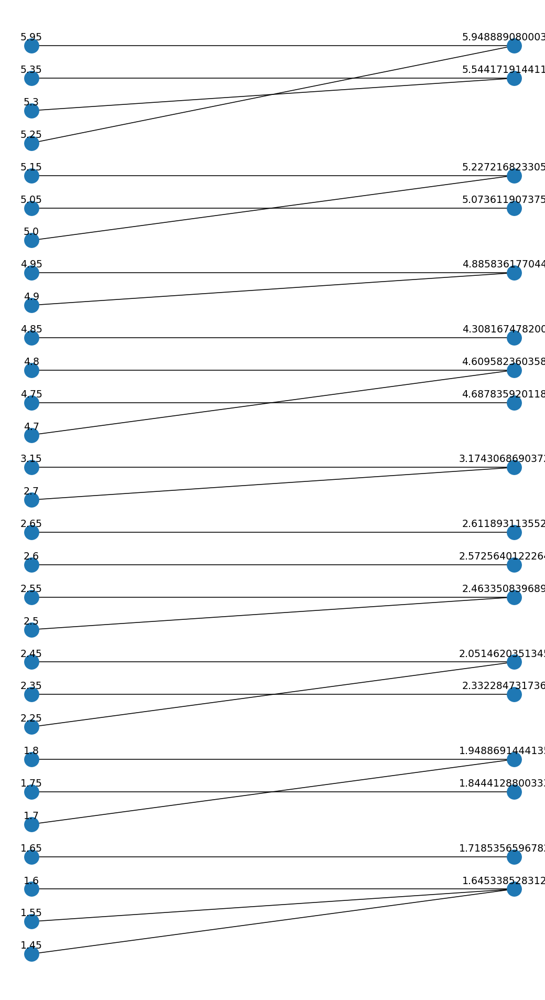

/home/shakkeel/anaconda3/envs/test_imly/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


In [217]:
# labels = dict((n, "(" + n + "," + d['_type'] + ")") for n,d in B.nodes(data=True))
labels = dict((n, d) for n,d in B.nodes(data=True))
pos = {node:[0, i] for i,node in enumerate(bin_labels['x'])}
pos.update({node:[1, i] for i,node in enumerate(bin_labels['new_bins'])})
nx.draw(B, pos, with_labels=False)
for p in pos:  # raise text positions
    pos[p][1] += 0.25
nx.draw_networkx_labels(B, pos)

plt.show()

In [188]:
B.nodes(data=True)

NodeDataView({1.45: {'bipartite': 0}, 1.55: {'bipartite': 0}, 1.6: {'bipartite': 0}, 1.65: {'bipartite': 0}, 1.7: {'bipartite': 0}, 1.75: {'bipartite': 0}, 1.8: {'bipartite': 0}, 2.25: {'bipartite': 0}, 2.35: {'bipartite': 0}, 2.45: {'bipartite': 0}, 2.5: {'bipartite': 0}, 2.55: {'bipartite': 0}, 2.6: {'bipartite': 0}, 2.65: {'bipartite': 0}, 2.7: {'bipartite': 0}, 3.15: {'bipartite': 0}, 4.7: {'bipartite': 0}, 4.75: {'bipartite': 0}, 4.8: {'bipartite': 0}, 4.85: {'bipartite': 0}, 4.9: {'bipartite': 0}, 4.95: {'bipartite': 0}, 5.0: {'bipartite': 0}, 5.05: {'bipartite': 0}, 5.15: {'bipartite': 0}, 5.25: {'bipartite': 0}, 5.3: {'bipartite': 0}, 5.35: {'bipartite': 0}, 5.95: {'bipartite': 0}, 1.645338528312387: {'bipartite': 1}, 1.7185356596782182: {'bipartite': 1}, 1.9488691444135626: {'bipartite': 1}, 1.8444128800333301: {'bipartite': 1}, 2.0514620351345583: {'bipartite': 1}, 2.332284731736415: {'bipartite': 1}, 2.463350839689115: {'bipartite': 1}, 2.5725640122264766: {'bipartite': 1}, 

In [198]:
labels_as_dict = dict((val['label'], val['x']) for key, val in bin_labels.iterrows() )

In [199]:
labels_as_dict

{'AQ': 1.45,
 'AI': 1.55,
 'AC': 1.6,
 'N': 1.65,
 'AV': 1.7,
 'B': 1.75,
 'BS': 1.8,
 'AJ': 2.25,
 'BD': 2.35,
 'O': 2.45,
 'AK': 2.5,
 'AD': 2.55,
 'D': 2.6,
 'AW': 2.65,
 'AU': 2.7,
 'F': 3.15,
 'CM': 4.7,
 'H': 4.75,
 'BJ': 4.8,
 'I': 4.85,
 'BQ': 4.9,
 'T': 4.95,
 'BG': 5.0,
 'U': 5.05,
 'AX': 5.15,
 'CD': 5.25,
 'J': 5.3,
 'AY': 5.35,
 'AF': 5.95}

In [212]:
new_bins_df = bin_labels.loc[:,('new_labels','new_bins')].drop_duplicates()

In [213]:
new_bins_df

,new_labels,new_bins
0,A,1.645339
3,B,1.718536
4,E,1.948869
5,D,1.844413
7,F,2.051462
8,G,2.332285
10,H,2.463351
12,I,2.572564
13,J,2.611893
14,K,3.174307


In [215]:
labels_as_dict.update(dict((val['new_labels'], val['new_bins']) for key, val in new_bins_df.iterrows() ))

In [216]:
labels_as_dict

{'AQ': 1.45,
 'AI': 1.55,
 'AC': 1.6,
 'N': 4.687835920118968,
 'AV': 1.7,
 'B': 1.7185356596782182,
 'BS': 1.8,
 'AJ': 2.25,
 'BD': 2.35,
 'O': 2.45,
 'AK': 2.5,
 'AD': 2.55,
 'D': 1.8444128800333301,
 'AW': 2.65,
 'AU': 2.7,
 'F': 2.0514620351345583,
 'CM': 4.7,
 'H': 2.463350839689115,
 'BJ': 4.8,
 'I': 2.5725640122264766,
 'BQ': 4.9,
 'T': 5.948889080003596,
 'BG': 5.0,
 'U': 5.05,
 'AX': 5.15,
 'CD': 5.25,
 'J': 2.611893113552761,
 'AY': 5.35,
 'AF': 5.95,
 'A': 1.645338528312387,
 'E': 1.9488691444135626,
 'G': 2.332284731736415,
 'K': 3.1743068690372707,
 'M': 4.609582360358926,
 'L': 4.308167478200794,
 'P': 4.885836177044713,
 'R': 5.227216823305954,
 'Q': 5.073611907375348,
 'S': 5.544171914411104}

In [189]:
dict((n, d) for n,d in B.nodes(data=True))

{1.45: {'bipartite': 0},
 1.55: {'bipartite': 0},
 1.6: {'bipartite': 0},
 1.65: {'bipartite': 0},
 1.7: {'bipartite': 0},
 1.75: {'bipartite': 0},
 1.8: {'bipartite': 0},
 2.25: {'bipartite': 0},
 2.35: {'bipartite': 0},
 2.45: {'bipartite': 0},
 2.5: {'bipartite': 0},
 2.55: {'bipartite': 0},
 2.6: {'bipartite': 0},
 2.65: {'bipartite': 0},
 2.7: {'bipartite': 0},
 3.15: {'bipartite': 0},
 4.7: {'bipartite': 0},
 4.75: {'bipartite': 0},
 4.8: {'bipartite': 0},
 4.85: {'bipartite': 0},
 4.9: {'bipartite': 0},
 4.95: {'bipartite': 0},
 5.0: {'bipartite': 0},
 5.05: {'bipartite': 0},
 5.15: {'bipartite': 0},
 5.25: {'bipartite': 0},
 5.3: {'bipartite': 0},
 5.35: {'bipartite': 0},
 5.95: {'bipartite': 0},
 1.645338528312387: {'bipartite': 1},
 1.7185356596782182: {'bipartite': 1},
 1.9488691444135626: {'bipartite': 1},
 1.8444128800333301: {'bipartite': 1},
 2.0514620351345583: {'bipartite': 1},
 2.332284731736415: {'bipartite': 1},
 2.463350839689115: {'bipartite': 1},
 2.5725640122264

<IPython.core.display.Javascript object>


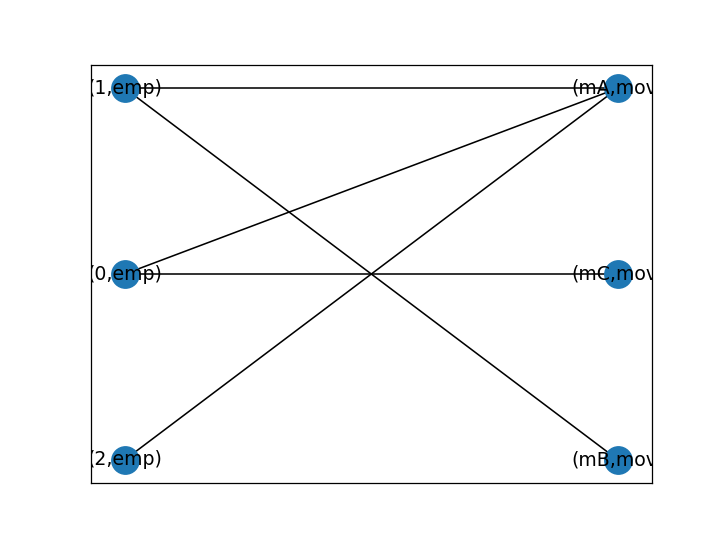

In [190]:
import networkx as nx
from networkx.algorithms import bipartite
%matplotlib notebook
import matplotlib.pyplot as plt

BG = nx.Graph()
employees = [str(i) for i in range(3)]
movies = ["mA", "mB", "mC"]
BG.add_nodes_from(employees, bipartite=0, _type='emp')
BG.add_nodes_from(movies, bipartite=1, _type='mov')
edges = [("0", "mA"), ("0", "mC"), ("1", "mA"),("1", "mB"), ("2", "mA")]
BG.add_edges_from(edges)
labels = dict((n, "(" + n + "," + d['_type'] + ")") for n,d in BG.nodes(data=True))

# Setting up pos for drawing bipartite graph. See the reference for more info
X, Y = bipartite.sets(BG)
pos = dict()
pos.update( (n, (1, i)) for i, n in enumerate(X) ) # put nodes from X at x=1
pos.update( (n, (2, i)) for i, n in enumerate(Y) ) # put nodes from Y at x=2

plt.figure()
edges = BG.edges()
nx.draw_networkx(BG, pos, edges=edges, labels=labels)

In [191]:
labels

{'0': '(0,emp)',
 '1': '(1,emp)',
 '2': '(2,emp)',
 'mA': '(mA,mov)',
 'mB': '(mB,mov)',
 'mC': '(mC,mov)'}

In [140]:
bin_labels

,label,x,freq,new_bins,new_index,new_labels
0,AQ,1.45,1,1.645339,0,A
1,AI,1.55,9,1.645339,0,A
2,AC,1.60,3,1.645339,0,A
3,N,1.65,22,1.718536,1,B
4,AV,1.70,15,1.948869,4,E
5,B,1.75,31,1.844413,3,D
6,BS,1.80,1,1.948869,4,E
7,AJ,2.25,2,2.051462,5,F
8,BD,2.35,10,2.332285,6,G
9,O,2.45,38,2.051462,5,F


### Ordinal loss trials

In [19]:
# from keras import backend as K
from tensorflow.keras import losses

def ordinal_loss(y_true, y_pred):
    weights = K.cast(K.abs(K.argmax(y_true, axis=1) - K.argmax(y_pred, axis=1))/(K.int_shape(y_pred)[1] - 1), dtype='float32')
    return (1.0 + weights) * losses.categorical_crossentropy(y_true, y_pred)

In [22]:
y_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from tensorflow.keras.optimizers import SGD
# # from ordinal_categorical_crossentropy import OCC

# import numpy as np
x_train = np.random.random((1000, 20))
y_train = to_categorical(np.random.randint(10, size=(1000, 1)), num_classes=10)
x_test = np.random.random((100, 20))
y_test = to_categorical(np.random.randint(10, size=(100, 1)), num_classes=10)

model = Sequential()
model.add(Dense(64, activation='relu', input_dim=20))
model.add(Dense(10, activation='softmax'))

sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)

model.compile(loss=ordinal_loss, optimizer=sgd, metrics=['accuracy']) ### This is where you use the loss function.

model.fit(x_train, y_train, epochs=20, batch_size=128)
score = model.evaluate(x_test, y_test, batch_size=128)

Train on 1000 samples
Epoch 1/20
1000/1000 [==============================] - 1s 1ms/sample - loss: 3.0622 - accuracy: 0.1030
Epoch 2/20
1000/1000 [==============================] - 0s 23us/sample - loss: 3.2180 - accuracy: 0.1010
Epoch 3/20
1000/1000 [==============================] - 0s 14us/sample - loss: 3.3136 - accuracy: 0.0880
Epoch 4/20
1000/1000 [==============================] - 0s 20us/sample - loss: 3.2584 - accuracy: 0.0900
Epoch 5/20
1000/1000 [==============================] - 0s 22us/sample - loss: 3.1968 - accuracy: 0.0990
Epoch 6/20
1000/1000 [==============================] - 0s 19us/sample - loss: 3.1659 - accuracy: 0.1160
Epoch 7/20
1000/1000 [==============================] - 0s 15us/sample - loss: 3.2046 - accuracy: 0.1080
Epoch 8/20
1000/1000 [==============================] - 0s 20us/sample - loss: 3.2027 - accuracy: 0.1180
Epoch 9/20
1000/1000 [==============================] - 0s 18us/sample - loss: 3.1940 - accuracy: 0.1210
Epoch 10/20
1000/1000 [===========

In [10]:
import tensorflow as tf

In [11]:
tf.__version__

'2.0.0'

In [12]:
import keras
keras.__version__

'2.2.4'

In [13]:
Dense

keras.layers.core.Dense